In [14]:
# Necessary Library Calls
import nibabel as nib
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from skimage.util import montage 
from skimage.transform import rotate
from sklearn.model_selection import train_test_split as ttt
import torch
import torch.nn as nn 
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm import tqdm
from pylab import *
import gc
import torchmetrics 
import radiomics
from torchvision.utils import save_image
import matplotlib.image
import SimpleITK as sitk
import radiomics
from radiomics import featureextractor


In [15]:
# Global variable definition
IMAGE_PATH = 'data/MICCAI_BraTS_2019_Data_Training'
CSV_FILE='data/MICCAI_BraTS_2019_Data_Training/new.csv'
MODEL_PATH = 'log/20/'

# number of slices, meaning how many slices we are taking from one image file  
SLICE_NUM = 10
# Original Image Size
IMAGE_SIZE=240
# Image size after cropping
HEIGHT=128
WIDTH=144

# Batch size constant
BATCH_SIZE= 1
# input_channel corresponds to the number of different types of images used: 
# e.g: T1, T2, T1_flair, etc. 
# only using one type of images at the moment
INPUT_CHANNEL=2
EPOCH = 50
LEARNING_RATE = 0.001
SLICE_STARTS=torch.load('data/slice_starts.pt')
WEIGHT = torch.load('data/weight.pt')
device = torch.device('cuda')
LOAD_CURRENT = False
LOAD_BEST = False


In [16]:
"""

Data loader for easy data access. 

Output shape for get_item: X [slices, input_channels, W, H ]
                           y [slices, W, H, ]
Notes: the output channel for y has dimension of 1 and has value in range of (0,3).


"""


# Simple helper function for retriving images given the path
def get_image(image_path,image_cat,image_id,image_type):
    t1_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t1.nii.gz').get_fdata()
    t1ce_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t1ce.nii.gz').get_fdata()
    t2_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t2.nii.gz').get_fdata()
    seg_data=nib.load(image_path+'/'+image_cat+'/'+image_id+'/'+image_id+'_seg.nii.gz').get_fdata()
    flair_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_flair.nii.gz').get_fdata()
    result={'t1':t1_data,'t1ce':t1ce_data,'t2':t2_data,'seg':seg_data,'flair':flair_data}
   
    return result[image_type]; 


class BraTS19Dataset(Dataset):
    def __init__(self, csv_f,i_path,i_type):
        self.source=pd.read_csv(csv_f)
        self.image_path=i_path
        self.type=i_type
        self.batch=BATCH_SIZE
    def __len__(self):
        return len(self.source)
     
    def __getitem__(self,idx):
        image_cat=self.source.iloc[idx,0]
        image_id=self.source.iloc[idx,1]
        starts=SLICE_STARTS[idx].int()
        age=self.source.iloc[idx,2]
        sur=self.source.iloc[idx,3]
        stu=self.source.iloc[idx,4]
        if sur<300: 
            cla = 0
        elif sur<450:
            cla=1
        else:
            cla =2
        #classification class 
        
        # get the image and its corresponding mask 
        img = np.zeros((INPUT_CHANNEL,IMAGE_SIZE,IMAGE_SIZE,155))
        
        for i in range(INPUT_CHANNEL):
            img[i]=get_image(self.image_path,image_cat,image_id,self.type[i])
        
     
        mask=get_image(self.image_path,image_cat,image_id,'seg')
        
        
        # change label 4 to 3 for easy index handling
        
        mask[mask==4]=3
        
        # initialize results arrays
        X=np.zeros((INPUT_CHANNEL,HEIGHT,WIDTH,SLICE_NUM))
        y=np.zeros((HEIGHT,WIDTH,SLICE_NUM))
        X = img[:,50:50+HEIGHT,55:55+WIDTH,starts-5:starts-5+SLICE_NUM]
        y = mask[50:50+HEIGHT,55:55+WIDTH,starts-5:starts-5+SLICE_NUM]
        X=torch.from_numpy(X)
        y=torch.from_numpy(y)
        
        
      
       
       
        y = y.long()
#        y = F.one_hot(y,num_classes=4)
        return (X.permute(3,0,1,2),y.permute(2,0,1),(age,sur,stu,cla))
    
def GetBraTS19Dataset(csv,ipath,itype,batch_size=1,shuffle=True,pin_memory=True):
    data = BraTS19Dataset(csv,ipath,itype)
    leng = [int(0.6* len(data)),int(0.2* len(data)),len(data) - int(0.6 * len(data))-int(0.2 * len(data))]
    train,eva,test=torch.utils.data.random_split(data,leng)
    train=DataLoader(train,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    eva=DataLoader(eva,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    test=DataLoader(eva,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    return train,eva,test

In [17]:
# Unet model
# # inspired by https://github.com/Hsankesara/DeepResearch/blob/826901dfe72037b9e433dccd85fe459f8411df20/UNet/Unet.py
class Unet(nn.Module):

    def encoder_block(self,in_channels,out_channels,k=3,conv2d_pad1=(1,1),conv2d_pad2=(1,1)):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,padding=conv2d_pad1),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,padding=conv2d_pad2),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
        )
        return block
    
    # actual output channel size = output_channel/2
    def decoder_block(self,in_channels,out_channels,k=3,s=2,conv2d_pad1=(1,1),conv2d_pad2=(1,1),convtrans2d_pad=(0,0)):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,padding=conv2d_pad1),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,padding=conv2d_pad2),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.ConvTranspose2d(out_channels,int(out_channels/2),kernel_size=2,stride=s,padding=convtrans2d_pad),
        )
        return block
    
    def bottle_neck(self,in_channels,out_channels,k=3):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,stride=1,padding=1),
            
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,stride=1,padding=1),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Dropout(p=0.5),
            
            nn.ConvTranspose2d(out_channels,in_channels,kernel_size=2,stride=2,padding=(0,0),output_padding=(0,0)),
        )
        return block
    
        
    def final_block(self,in_channels,out_channels,k):
        block = nn.Sequential(
            nn.Conv2d(in_channels,int(in_channels/2),kernel_size=k,padding=(1,1)),
            
            nn.ReLU(),
            nn.BatchNorm2d(int(in_channels/2)),
            nn.Conv2d(int(in_channels/2),out_channels,kernel_size=k,padding=(1,1)),
            nn.ReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=1,stride=1),
            nn.Softmax(dim=1),
            
        )
        return block
    
    def __init__(self, in_channel, out_channel):
        super(Unet, self).__init__()
        self.en1=self.encoder_block(in_channel,32)
        self.max1 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en2=self.encoder_block(32,64)
        self.max2 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en3=self.encoder_block(64,128)
        self.max3 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en4=self.encoder_block(128,256)
        self.max4 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.bn=self.bottle_neck(256,512)
        self.dc4=self.decoder_block(512,256)
        self.dc3=self.decoder_block(256,128)
        self.dc2=self.decoder_block(128,64)
        self.final=self.final_block(64,out_channel,k=3)
   
    def forward(self,x):
        encoder_block1=self.en1(x)
        mp1 = self.max1(encoder_block1)
        encoder_block2=self.en2(mp1)
        mp2 = self.max2(encoder_block2)
        encoder_block3=self.en3(mp2)
        mp3 = self.max3(encoder_block3)
        encoder_block4=self.en4(mp3)
        mp4 = self.max4(encoder_block4)
        bottleneck_block1 =self.bn(mp4)
        
        cat_block4= torch.cat((bottleneck_block1,encoder_block4),1)
        decoder_block4=self.dc4(cat_block4)
        
        cat_block3= torch.cat((decoder_block4,encoder_block3),1)
        decoder_block3=self.dc3(cat_block3)
        
        cat_block2= torch.cat((decoder_block3,encoder_block2),1)
        decoder_block2=self.dc2(cat_block2)
        
        cat_block1= torch.cat((decoder_block2,encoder_block1),1)
        
        result=self.final(cat_block1)
        
        return result

In [18]:
class DiceScore(nn.Module):

    def __init__(self):
        super(DiceScore, self).__init__()
        
    def forward(self, y_pred, y_true):
        dice = torchmetrics.Dice(average = 'micro').to(device)
        macdice = torchmetrics.Dice(num_classes=4,average = 'micro').to(device)
        assert y_pred.size() == y_true.size()
        y_pred1 = F.one_hot(torch.argmax(y_pred,dim=3),num_classes=4)
      
        yp0 = y_pred1[:,:,:,0].contiguous().view(-1)
        yt0 = y_true[:,:,:,0].contiguous().view(-1)
        t0 = dice(yp0,yt0)
        
        yp1 = y_pred1[:,:,:,1].contiguous().view(-1)
        yt1 = y_true[:,:,:,1].contiguous().view(-1)
        t1 = dice(yp1,yt1)
        
        yp2 = y_pred1[:,:,:,2].contiguous().view(-1)
        yt2 = y_true[:,:,:,2].contiguous().view(-1)
        t2 = dice(yp2,yt2)
        
    
        yp3 = y_pred1[:,:,:,3].contiguous().view(-1)
        yt3 = y_true[:,:,:,3].contiguous().view(-1)
        t3 = dice(yp3,yt3)


        return macdice(y_pred1,y_true),t0,t1,t2,t3


"""

""" 
        
        
        
        
        

'\n\n'

In [19]:
class DiceLoss(nn.Module):

    def __init__(self):
        super(DiceLoss, self).__init__()
        
    def forward(self, y_pred, y_true):
        total_loss=0.0
        assert y_pred.size() == y_true.size()
        for i in range(4):
            preds =torch.flatten(y_pred[:,:,:,i])
         
            target =torch.flatten(y_true[:,:,:,i])
            intersection = torch.sum((preds * target))

            dsc = (2. * intersection + 1) / (torch.sum(preds) + torch.sum(target) + 1)
            total_loss+=(1-dsc)
        
        
       
        return total_loss/4

In [20]:
# Train function
def training(dataset, model, opt,  dev, batch_size, lr):
    print('Training in session: ')
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    for index, batch in enumerate(dataset):
        
        # reshape the data and load the data to gpu
        x, y,other= batch 
        a,b,c,d,e=x.shape
        x=x.reshape(a*b,c,d,e)
        x=x.float()

        a,b,c,d=y.shape
        y=y.reshape(a*b,c,d)
        
        x,y=x.to(device),y.to(device)
       
        
      
        
        
        
        loss_fn = DiceLoss().to(device)
       
        # training model
        res = model(x)
        res=res.to(device)
        loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        opt.zero_grad()
        
        loss.backward()
        
        opt.step()
        
        #torch.nn.utils.clip_grad_norm_(model.parameters(), gc)
        
        
        
        # Loss 
        print("Batch_id: ", index,"Training loss: ", loss.item())
        epoch_loss+=loss.item()
        
        
        
        
        #IoU
        bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
        print("Batch_id: ", index,"Training IoU: ", bac)
        IoU.append(bac)
        
        
        
        # Dice Score
        
        t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
        
        
            
        print("Batch_id: ", index,"Training Mean Dice Score: ", t)
        md.append(t)
            
        print("Batch_id: ", index,"Training Non-tumor Dice Score: ", t0)
        d0.append(t0)
            
        print("Batch_id: ", index,"Training NCR/NET Dice Score: ", t1)
        d1.append(t1)
            
        print("Batch_id: ", index,"Training ED Dice Score: ", t2)
        d2.append(t2)
            
        print("Batch_id: ", index,"Training ET Dice Score: ", t3)
        d3.append(t3)

        
            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    return torch.mean(IoU),epoch_loss,torch.mean(md),torch.mean(d0),torch.mean(d1),torch.mean(d2),torch.mean(d3)
        
        
        
        





       
        
        
        
#        IoU.append(iou(res,y.float()).to(torch.device('cpu')))
    
    
   

In [21]:
# Evaluation function
def evaluation(dataset, model):
    print('Evaluation in session: ')
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(dataset):
        
            # reshape the data and load the data to gpu
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
       
        
        
        
        
        
            loss_fn = DiceLoss().to(device)
       
            #eval
            res = model(x)
            res=res.to(device)
            loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        
        
            # Loss
            print("Batch_id: ", index,"Eval loss: ", loss.item())
            epoch_loss+=loss.item()
            
            
            # IoU

            bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
            print("Batch_id: ", index,"Eval IoU: ", bac)
            IoU.append(bac)
            
            # Dice Score
            t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
            
            print("Batch_id: ", index,"Eval Mean Dice Score: ", t)
            md.append(t)
            
            print("Batch_id: ", index,"Eval Non-tumor Dice Score: ", t0)
            d0.append(t0)
            
            print("Batch_id: ", index,"Eval NCR/NET Dice Score: ", t1)
            d1.append(t1)
            
            print("Batch_id: ", index,"Eval ED Dice Score: ", t2)
            d2.append(t2)
            
            print("Batch_id: ", index,"Eval ET Dice Score: ", t3)
            d3.append(t3)
            if index%10==0:
                
                img1=np.zeros((HEIGHT,WIDTH))
                img1=torch.tensor(img1)
                img1[:,:]=res.argmax(dim=1)[5,:,:]
                img1[img1==3]=4
                img2=np.zeros((HEIGHT,WIDTH))
                img2=torch.tensor(img2)
                img2[:,:]=y[5,:,:]
                img2[img2==3]=4
                figure()
                imshow(img1)
                show()
                figure()
                imshow(img2)
                show()
            
            
            

            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    return torch.mean(IoU),epoch_loss,torch.mean(md),torch.mean(d0),torch.mean(d1),torch.mean(d2),torch.mean(d3)
    
    
    

In [22]:
# Load Best Model
def test(dataset):
    print('test in session: ') 
    checkpoint = torch.load(MODEL_PATH+'#20-BEST')
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    model.load_state_dict(checkpoint['model_state_dict'])
    opt.load_state_dict(checkpoint['optim_state_dict'])
    epoch = checkpoint['epoch']
    Avg_dice = checkpoint['Eval Dice Scores']
    non = checkpoint['Eval Non-tumor Dice Scores']
    ncr = checkpoint['Eval NCR/NET Dice Scores']
    ed = checkpoint['Eval ED Dice Scores']
    et = checkpoint['Eval ET Dice Scores']
    
    print('Model loaded!','Epoch = ', epoch, 'Mean eval dice scores is: ',Avg_dice)
    print('Dice Scorese Per class: ')
    print('Non-Tumor: ', non)
    print('NCR/NET: ', ncr)
    print('ED: ', ed)
    print('ET: ',et)
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(dataset):
        
            # reshape the data and load the data to gpu
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
       
        
    

    
        
        
        
        
            loss_fn = DiceLoss().to(device)
       
            #test
            res = model(x)
            res=res.to(device)
            loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        
        
            # Loss
            print("Batch_id: ", index,"Test loss: ", loss.item())
            epoch_loss+=loss.item()
            
            
            # IoU

            bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
            print("Batch_id: ", index,"Test IoU: ", bac)
            IoU.append(bac)
            
            
            # Dice Score
            t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
            
            print("Batch_id: ", index,"Test Mean Dice Score: ", t)
            md.append(t)
            
            print("Batch_id: ", index,"Test Non-tumor Dice Score: ", t0)
            d0.append(t0)
            
            print("Batch_id: ", index,"Test NCR/NET Dice Score: ", t1)
            d1.append(t1)
            
            print("Batch_id: ", index,"Test ED Dice Score: ", t2)
            d2.append(t2)
            
            print("Batch_id: ", index,"Test ET Dice Score: ", t3)
            d3.append(t3)

            img1=np.zeros((HEIGHT,WIDTH))
            img1=torch.tensor(img1)
            img1[:,:]=res.argmax(dim=1)[0,:,:]
            img1[img1==3]=4
            img2=np.zeros((HEIGHT,WIDTH))
            img2=torch.tensor(img2)
            img2[:,:]=y[0,:,:]
            img2[img2==3]=4
            figure()
            imshow(img1)
            show()
            figure()
            imshow(img2)
            show()
            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    print('Avg IoU: ',torch.mean(IoU))
    print('Avg Loss: ',epoch_loss/(BATCH_SIZE*SLICE_NUM))
    print('Avg Dice Scores: ', torch.mean(md))
    print('Non-Tumor Dice Scores: ',torch.mean(d0))
    print('NCR/NET Dice Scores: ',torch.mean(d1))
    print('ED Dice Scores: ',torch.mean(d2))
    print('ET Dice Scores: ', torch.mean(d3))
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    

In [23]:
# main

def main(BEST_EVAL):
    if LOAD_CURRENT:
        train_data = torch.load(MODEL_PATH+'trdata.pth')
        eval_data = torch.load(MODEL_PATH+'edata.pth')
        test_data = torch.load(MODEL_PATH+'tdata.pth')
    else:
        train_data,eval_data,test_data = GetBraTS19Dataset(CSV_FILE,IMAGE_PATH,['t1ce','flair'],batch_size=BATCH_SIZE)
        torch.save(train_data, MODEL_PATH+'trdata.pth')
        torch.save(eval_data, MODEL_PATH+'edata.pth')
        torch.save(test_data,MODEL_PATH+'tdata.pth')
    
    print('Data Loaded!')
    
    
    
    
    
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    sc = torch.optim.lr_scheduler.ReduceLROnPlateau(opt,patience=5,factor = 0.5,threshold=0.1,mode = 'max',verbose = True)
    if LOAD_CURRENT:
        checkpoint = torch.load(MODEL_PATH+'#20-current')
        model.load_state_dict(checkpoint['model_state_dict'])
        opt.load_state_dict(checkpoint['optim_state_dict'])
        sc.load_state_dict(checkpoint['sche'])
        index =torch.load(MODEL_PATH+'index.pt')
        loss_value=torch.load(MODEL_PATH+'tloss.pt')
        accuracy=torch.load(MODEL_PATH+'tac.pt')
        eval_loss=torch.load(MODEL_PATH+'eloss.pt')
        eval_accuracy=torch.load(MODEL_PATH+'eacc.pt')
        mean_dice=torch.load(MODEL_PATH+'md.pt')
        d0=torch.load(MODEL_PATH+'d0.pt')
        d1=torch.load(MODEL_PATH+'d1.pt')
        d2=torch.load(MODEL_PATH+'d2.pt')
        d3=torch.load(MODEL_PATH+'d3.pt')
        e_mean_dice=torch.load(MODEL_PATH+'emd.pt')
        ed0=torch.load(MODEL_PATH+'ed0.pt')
        ed1=torch.load(MODEL_PATH+'ed1.pt')
        ed2=torch.load(MODEL_PATH+'ed2.pt')
        ed3=torch.load(MODEL_PATH+'ed3.pt')     
        ep = torch.load(MODEL_PATH+'ep.pt')
        
    else:
        index =[]
        loss_value=[]
        accuracy=[]
        eval_loss=[]
        eval_accuracy=[]
        mean_dice=[]
        d0=[]
        d1=[]
        d2=[]
        d3=[]
        e_mean_dice=[]
        ed0=[]
        ed1=[]
        ed2=[]
        ed3=[]
        ep = 0 
    
    
    for i in range (ep,EPOCH):
        print(f'Epoch: {i}')
        
        acc, loss_val,md,di0,di1,di2,di3=training(train_data,model.train(),opt, device,BATCH_SIZE,LEARNING_RATE)
        
        eacc,eloss_val,emd,edi0,edi1,edi2,edi3=evaluation(eval_data,model.eval())
        sc.step(eloss_val)
        
        loss_value.append(loss_val/len(train_data.sampler))
        accuracy.append(acc)
        mean_dice.append(md)
        d0.append(di0)
        d1.append(di1)
        d2.append(di2)
        d3.append(di3)
        
        eval_loss.append(eloss_val/len(eval_data.sampler))
        eval_accuracy.append(eacc)
        e_mean_dice.append(emd)
        ed0.append(edi0)
        ed1.append(edi1)
        ed2.append(edi2)
        ed3.append(edi3)
        
        index.append(i)
        ep=ep+1
        
        torch.save(index,MODEL_PATH+'index.pt')
        torch.save(loss_value,MODEL_PATH+'tloss.pt')
        torch.save(accuracy,MODEL_PATH+'tac.pt')
        torch.save(eval_loss,MODEL_PATH+'eloss.pt')
        torch.save(eval_accuracy,MODEL_PATH+'eacc.pt')
        torch.save(mean_dice,MODEL_PATH+'md.pt')
        torch.save(d0,MODEL_PATH+'d0.pt')
        torch.save(d1,MODEL_PATH+'d1.pt')
        torch.save(d2,MODEL_PATH+'d2.pt')
        torch.save(d3,MODEL_PATH+'d3.pt')
        torch.save(e_mean_dice,MODEL_PATH+'emd.pt')
        torch.save(ed0,MODEL_PATH+'ed0.pt')
        torch.save(ed1,MODEL_PATH+'ed1.pt')
        torch.save(ed2,MODEL_PATH+'ed2.pt')
        torch.save(ed3,MODEL_PATH+'ed3.pt')     
        torch.save(ep,MODEL_PATH+'ep.pt')
        
        
        print('Epoch ',i,'Training loss: ',loss_val/len(train_data.sampler))
        print('Epoch ',i,'Evaluation loss: ',eloss_val/len(eval_data.sampler))
        
        print('Epoch ',i,'Training accuracy : ',acc)
        print('Epoch ',i,'Evaluation accuracy : ',eacc)
        
        print('Epoch ',i,'Training Mean Dice Score: ',md)
        print('Epoch ',i,'Eval Mean Dice Score: ',emd)
        
        print('Epoch ',i,'Training Non-tumor Dice Score: ',di0)
        print('Epoch ',i,'Eval Non-tumor Dice Score: ',edi0)
       
        print('Epoch ',i,'Training NCR/NET Dice Score: ',di1)
        print('Epoch ',i,'Eval NCR/NET Dice Score: ',edi1)
        
        print('Epoch ',i,'Training ED Dice Score: ',di2)
        print('Epoch ',i,'Eval ED Dice Score: ',edi2)
        
        print('Epoch ',i,'Training ET Dice Score: ',di3)
        print('Epoch ',i,'Eval ET Dice Score: ',edi3)
        torch.save({
            'model_state_dict': model.state_dict(),
            'optim_state_dict': opt.state_dict(),
            'epoch': i,
            'sche':sc.state_dict(),
            'Training loss_values': loss_val/len(train_data.sampler),
            'Training accuracy':acc,
            'Eval loss_values': eloss_val/len(eval_data.sampler),
            'Eval IoU':eacc,
            'Training Dice Scores':md,
            'Eval Dice Scores': emd,
            'Training Non-tumor Dice Scores':di0,
            'Eval Non-tumor Dice Scores':edi0,   
            'Training NCR/NET Dice Scores': di1,
            'Eval NCR/NET Dice Scores': edi1,   
            'Training ED Dice Scores': di2,
            'Eval ED Dice Scores': edi2,    
            'Training ET Dice Scores': di3,
            'Eval ET Dice Scores': edi3,    
            }, MODEL_PATH+'#20-current')
        print('Epoch completed and model successfully saved')
        if BEST_EVAL < eacc :
            torch.save({
            'model_state_dict': model.state_dict(),
            'optim_state_dict': opt.state_dict(),
            'epoch': i,
            'sche':sc.state_dict(),
            'Training loss_values': loss_val/len(train_data.sampler),
            'Training accuracy':acc,
            'Eval loss_values': eloss_val/len(eval_data.sampler),
            'Eval IoU':eacc,
            'Training Dice Scores':md,
            'Eval Dice Scores': emd,
            'Training Non-tumor Dice Scores':di0,
            'Eval Non-tumor Dice Scores':edi0,   
            'Training NCR/NET Dice Scores': di1,
            'Eval NCR/NET Dice Scores': edi1,   
            'Training ED Dice Scores': di2,
            'Eval ED Dice Scores': edi2,    
            'Training ET Dice Scores': di3,
            'Eval ET Dice Scores': edi3,    
            }, MODEL_PATH+'#20-BEST')
            print("Best Model saved!")
            BEST_EVAL = eacc
        gc.collect()
        torch.cuda.empty_cache()
        if eacc > 0.75:
            break
        
    plt.plot(index, loss_value, label ="Training ")
    plt.plot(index,eval_loss, label = "Validation")
    plt.title("Training and Validation Loss Curve: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Average Loss ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval Loss plot.png')
    plt.show()
    
    
    plt.plot(index, accuracy,label ="Training ")
    plt.plot(index, eval_accuracy,label ="Validation ")
    plt.title("Training and Validation IoU Scores (batch_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM, LEARNING_RATE))
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (Mean IoU Scores)")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval Accuracy plot.png')
    plt.show()
    
    plt.plot(index, mean_dice, label ="Training ")
    plt.plot(index,e_mean_dice, label = "Validation")
    plt.title("Training and Validation Mean Dice Scores: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval avg dice plot.png')
    plt.show()
    
    plt.plot(index, d0, label ="Non-Tumor ")
    plt.plot(index,d1, label = "NCT/NET")
    plt.plot(index, d2, label ="ED ")
    plt.plot(index,d3, label = "ET")
    plt.title("Training Dice Scores per class: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training dice per class plot.png')
    plt.show()
    
    plt.plot(index, ed0, label ="Non-Tumor ")
    plt.plot(index,ed1, label = "NCT/NET")
    plt.plot(index, ed2, label ="ED ")
    plt.plot(index,ed3, label = "ET")
    plt.title("Validation Dice Scores per class: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Eval dice per class plot.png')
    plt.show()
    test(test_data.dataset)

In [24]:
gc.collect()
torch.cuda.empty_cache()

Data Loaded!
Epoch: 0
Training in session: 


  1%|          | 1/110 [00:01<02:10,  1.20s/it]

Batch_id:  0 Training loss:  0.8009930849075317
Batch_id:  0 Training IoU:  tensor(0.1536, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.7798, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.6314, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.6657, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.8480, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:04,  1.15s/it]

Batch_id:  1 Training loss:  0.7749029994010925
Batch_id:  1 Training IoU:  tensor(0.2736, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.8388, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.7547, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.7219, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.8811, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.7666276693344116
Batch_id:  2 Training IoU:  tensor(0.2296, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.8038, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.7026, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.6963, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.8947, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9216, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:53,  1.07s/it]

Batch_id:  3 Training loss:  0.801711916923523
Batch_id:  3 Training IoU:  tensor(0.2430, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.8367, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.6941, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.7315, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:54,  1.09s/it]

Batch_id:  4 Training loss:  0.7575780749320984
Batch_id:  4 Training IoU:  tensor(0.2027, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.7767, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.5886, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.6975, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.8560, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9645, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.8059340119361877
Batch_id:  5 Training IoU:  tensor(0.2316, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.8015, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.6227, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.6954, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9126, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:54,  1.11s/it]

Batch_id:  6 Training loss:  0.7803652286529541
Batch_id:  6 Training IoU:  tensor(0.2797, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.7906, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.6024, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.6781, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9684, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.10s/it]

Batch_id:  7 Training loss:  0.724738359451294
Batch_id:  7 Training IoU:  tensor(0.4211, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.8349, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.6819, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.7375, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:54,  1.13s/it]

Batch_id:  8 Training loss:  0.7588083148002625
Batch_id:  8 Training IoU:  tensor(0.3315, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.8124, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.6837, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.6703, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9549, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:54,  1.15s/it]

Batch_id:  9 Training loss:  0.708625078201294
Batch_id:  9 Training IoU:  tensor(0.4532, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.8352, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.6942, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.7233, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9583, device='cuda:0')


 10%|█         | 11/110 [00:12<01:52,  1.14s/it]

Batch_id:  10 Training loss:  0.7273112535476685
Batch_id:  10 Training IoU:  tensor(0.4228, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.8368, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.6910, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.7273, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9576, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.7894181609153748
Batch_id:  11 Training IoU:  tensor(0.2286, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.7825, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.5782, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.6736, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9447, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:46,  1.10s/it]

Batch_id:  12 Training loss:  0.7077496647834778
Batch_id:  12 Training IoU:  tensor(0.4256, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.8321, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.7072, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.6942, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9632, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.6401208639144897
Batch_id:  13 Training IoU:  tensor(0.5420, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.8515, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.7338, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.7386, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9661, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:46,  1.12s/it]

Batch_id:  14 Training loss:  0.835868239402771
Batch_id:  14 Training IoU:  tensor(0.1647, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.7289, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.4763, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.6281, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.8356, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:46,  1.14s/it]

Batch_id:  15 Training loss:  0.6854482889175415
Batch_id:  15 Training IoU:  tensor(0.4595, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.8322, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.7303, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.7089, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:47,  1.15s/it]

Batch_id:  16 Training loss:  0.6661592125892639
Batch_id:  16 Training IoU:  tensor(0.5399, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.8529, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.7356, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.7383, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:45,  1.15s/it]

Batch_id:  17 Training loss:  0.7230594158172607
Batch_id:  17 Training IoU:  tensor(0.4394, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.8428, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.7352, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.7166, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:42,  1.13s/it]

Batch_id:  18 Training loss:  0.75177001953125
Batch_id:  18 Training IoU:  tensor(0.3854, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.8195, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.6890, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.6805, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:39,  1.11s/it]

Batch_id:  19 Training loss:  0.7012766599655151
Batch_id:  19 Training IoU:  tensor(0.5029, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.8241, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.6623, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.6752, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.6904700398445129
Batch_id:  20 Training IoU:  tensor(0.5074, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.8577, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.7326, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.7485, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 20%|██        | 22/110 [00:24<01:38,  1.12s/it]

Batch_id:  21 Training loss:  0.6843564510345459
Batch_id:  21 Training IoU:  tensor(0.4671, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.8605, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.7737, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.7443, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 21%|██        | 23/110 [00:25<01:37,  1.13s/it]

Batch_id:  22 Training loss:  0.7495527267456055
Batch_id:  22 Training IoU:  tensor(0.3349, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.8180, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.7146, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.7100, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.8888, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9585, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.7584531903266907
Batch_id:  23 Training IoU:  tensor(0.3230, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.8067, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.7010, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.6339, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.09s/it]

Batch_id:  24 Training loss:  0.7782902717590332
Batch_id:  24 Training IoU:  tensor(0.2812, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.8164, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.6554, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.7225, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9441, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:32,  1.10s/it]

Batch_id:  25 Training loss:  0.667489767074585
Batch_id:  25 Training IoU:  tensor(0.5101, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.7121, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.7469, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9446, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.7197964787483215
Batch_id:  26 Training IoU:  tensor(0.3222, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.8158, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.7367, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.6854, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9379, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.7074017524719238
Batch_id:  27 Training IoU:  tensor(0.4523, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.8267, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.6781, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.6874, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9695, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.10s/it]

Batch_id:  28 Training loss:  0.7618005871772766
Batch_id:  28 Training IoU:  tensor(0.3182, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.7793, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.5678, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.6300, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9712, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:28,  1.10s/it]

Batch_id:  29 Training loss:  0.6736741662025452
Batch_id:  29 Training IoU:  tensor(0.4605, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.8364, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.7649, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.6958, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:27,  1.11s/it]

Batch_id:  30 Training loss:  0.7786269783973694
Batch_id:  30 Training IoU:  tensor(0.1949, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.7878, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.7266, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.6442, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.8465, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9339, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:26,  1.10s/it]

Batch_id:  31 Training loss:  0.7171094417572021
Batch_id:  31 Training IoU:  tensor(0.3912, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.8116, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.6926, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.7061, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.8660, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.6780536770820618
Batch_id:  32 Training IoU:  tensor(0.5602, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.8815, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.7961, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.7706, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 31%|███       | 34/110 [00:37<01:24,  1.11s/it]

Batch_id:  33 Training loss:  0.765102744102478
Batch_id:  33 Training IoU:  tensor(0.2909, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8439, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.7641, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.7431, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9080, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9605, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:25,  1.14s/it]

Batch_id:  34 Training loss:  0.7941917181015015
Batch_id:  34 Training IoU:  tensor(0.1855, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.7766, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.6238, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.6931, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.8198, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9697, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:22,  1.12s/it]

Batch_id:  35 Training loss:  0.7556908130645752
Batch_id:  35 Training IoU:  tensor(0.3099, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.7833, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.5958, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.6192, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9626, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:22,  1.13s/it]

Batch_id:  36 Training loss:  0.7180566191673279
Batch_id:  36 Training IoU:  tensor(0.3713, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.8467, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.7673, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.7359, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.8921, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:22,  1.14s/it]

Batch_id:  37 Training loss:  0.678504467010498
Batch_id:  37 Training IoU:  tensor(0.6222, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.8201, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.8146, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.6826339960098267
Batch_id:  38 Training IoU:  tensor(0.5283, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.8828, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.7919, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.7831, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.10s/it]

Batch_id:  39 Training loss:  0.7199503779411316
Batch_id:  39 Training IoU:  tensor(0.3694, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.8198, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.6902, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.6768, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9599, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.7306644320487976
Batch_id:  40 Training IoU:  tensor(0.3388, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.8336, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.6807, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.7340, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:16,  1.13s/it]

Batch_id:  41 Training loss:  0.8181511163711548
Batch_id:  41 Training IoU:  tensor(0.1688, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.7874, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.5952, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.7609, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.8328, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9606, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.12s/it]

Batch_id:  42 Training loss:  0.7065305709838867
Batch_id:  42 Training IoU:  tensor(0.4285, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.8034, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.6310, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.6443, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 40%|████      | 44/110 [00:49<01:14,  1.13s/it]

Batch_id:  43 Training loss:  0.7694135904312134
Batch_id:  43 Training IoU:  tensor(0.3429, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.8100, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.6366, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.6611, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 41%|████      | 45/110 [00:50<01:14,  1.14s/it]

Batch_id:  44 Training loss:  0.6711044311523438
Batch_id:  44 Training IoU:  tensor(0.4189, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.8405, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.7576, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.7306, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9170, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9570, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:11,  1.12s/it]

Batch_id:  45 Training loss:  0.7104933857917786
Batch_id:  45 Training IoU:  tensor(0.4521, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.8576, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.7398, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.7523, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:09,  1.11s/it]

Batch_id:  46 Training loss:  0.7702261805534363
Batch_id:  46 Training IoU:  tensor(0.3111, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.8282, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.6656, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.7525, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9188, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:08,  1.11s/it]

Batch_id:  47 Training loss:  0.6846492886543274
Batch_id:  47 Training IoU:  tensor(0.4210, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.8532, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.7671, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.7406, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9571, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.7294409871101379
Batch_id:  48 Training IoU:  tensor(0.3052, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.7860, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.6125, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.7298, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.8494, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9521, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.7985430955886841
Batch_id:  49 Training IoU:  tensor(0.3020, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.7998, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.6151, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.6947, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.8360002040863037
Batch_id:  50 Training IoU:  tensor(0.1107, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.7014, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.4256, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.5331, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9454, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.6911532878875732
Batch_id:  51 Training IoU:  tensor(0.4914, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.8849, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.8018, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.7930, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.7363786101341248
Batch_id:  52 Training IoU:  tensor(0.3744, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.8579, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.7650, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.7422, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.6431561708450317
Batch_id:  53 Training IoU:  tensor(0.5744, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.8937, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.8174, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.8056, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.7939736843109131
Batch_id:  54 Training IoU:  tensor(0.2959, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.8451, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.6997, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.7792, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 51%|█████     | 56/110 [01:02<01:00,  1.12s/it]

Batch_id:  55 Training loss:  0.7688577771186829
Batch_id:  55 Training IoU:  tensor(0.3626, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.8727, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.7499, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.7988, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<01:01,  1.16s/it]

Batch_id:  56 Training loss:  0.6408594846725464
Batch_id:  56 Training IoU:  tensor(0.5582, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.8842, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.7948, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.7918, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:58,  1.13s/it]

Batch_id:  57 Training loss:  0.7098171710968018
Batch_id:  57 Training IoU:  tensor(0.4906, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.8468, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.6977, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.7328, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:56,  1.11s/it]

Batch_id:  58 Training loss:  0.6857256293296814
Batch_id:  58 Training IoU:  tensor(0.4973, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.8810, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.7780, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.8073, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.7152831554412842
Batch_id:  59 Training IoU:  tensor(0.3893, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.8343, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.6775, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.7484, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.08s/it]

Batch_id:  60 Training loss:  0.6542869806289673
Batch_id:  60 Training IoU:  tensor(0.5627, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.8366, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.6818, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.7004, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.7054901719093323
Batch_id:  61 Training IoU:  tensor(0.4085, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.8594, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.7778, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.7637, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9648, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.09s/it]

Batch_id:  62 Training loss:  0.6346365213394165
Batch_id:  62 Training IoU:  tensor(0.5849, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.8918, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.7988, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.8076, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:52,  1.13s/it]

Batch_id:  63 Training loss:  0.7292788624763489
Batch_id:  63 Training IoU:  tensor(0.4131, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.8824, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.7923, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.8066, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:50,  1.13s/it]

Batch_id:  64 Training loss:  0.764020562171936
Batch_id:  64 Training IoU:  tensor(0.2730, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.8434, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.7142, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.8179, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9120, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9294, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:51,  1.17s/it]

Batch_id:  65 Training loss:  0.7879469990730286
Batch_id:  65 Training IoU:  tensor(0.2329, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.8468, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.7128, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.8318, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.8962, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9465, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:50,  1.18s/it]

Batch_id:  66 Training loss:  0.6466230750083923
Batch_id:  66 Training IoU:  tensor(0.4856, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.8613, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.7475, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.7708, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:48,  1.17s/it]

Batch_id:  67 Training loss:  0.6460379362106323
Batch_id:  67 Training IoU:  tensor(0.4349, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.8486, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.7689, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.7715, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.8914, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9625, device='cuda:0')


 63%|██████▎   | 69/110 [01:17<00:47,  1.17s/it]

Batch_id:  68 Training loss:  0.7145017981529236
Batch_id:  68 Training IoU:  tensor(0.3545, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.8288, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.6702, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.7263, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9637, device='cuda:0')


 64%|██████▎   | 70/110 [01:18<00:44,  1.12s/it]

Batch_id:  69 Training loss:  0.7472902536392212
Batch_id:  69 Training IoU:  tensor(0.3395, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.7840, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.5745, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.6508, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9252, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:44,  1.14s/it]

Batch_id:  70 Training loss:  0.7281900644302368
Batch_id:  70 Training IoU:  tensor(0.4526, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.8917, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.7933, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.8198, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.7409993410110474
Batch_id:  71 Training IoU:  tensor(0.4399, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.8265, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.6646, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.6799, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:40,  1.11s/it]

Batch_id:  72 Training loss:  0.6546320915222168
Batch_id:  72 Training IoU:  tensor(0.4681, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.8769, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.8300, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.7806, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:39,  1.10s/it]

Batch_id:  73 Training loss:  0.7581188082695007
Batch_id:  73 Training IoU:  tensor(0.3648, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.8791, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.7827, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.7927, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.7958625555038452
Batch_id:  74 Training IoU:  tensor(0.2229, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.8395, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.6855, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.8134, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9422, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.6955071687698364
Batch_id:  75 Training IoU:  tensor(0.4068, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.8542, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.7202, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.7542, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.6516335606575012
Batch_id:  76 Training IoU:  tensor(0.4132, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.8456, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.7521, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.7832, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.8910, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9560, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:34,  1.06s/it]

Batch_id:  77 Training loss:  0.6404157876968384
Batch_id:  77 Training IoU:  tensor(0.5031, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.8823, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.8130, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.7949, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.6986653804779053
Batch_id:  78 Training IoU:  tensor(0.3654, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.8490, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.7588, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.7621, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9113, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9636, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.7182618975639343
Batch_id:  79 Training IoU:  tensor(0.4180, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.8771, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.7824, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.7877, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:30,  1.07s/it]

Batch_id:  80 Training loss:  0.7124016284942627
Batch_id:  80 Training IoU:  tensor(0.3142, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.7773, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.5769, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.6620, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9457, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:29,  1.05s/it]

Batch_id:  81 Training loss:  0.7026581168174744
Batch_id:  81 Training IoU:  tensor(0.4577, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.8929, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.8080, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.8180, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:28,  1.06s/it]

Batch_id:  82 Training loss:  0.6601811647415161
Batch_id:  82 Training IoU:  tensor(0.4961, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.8683, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.7492, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.7720, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9730, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.6440142393112183
Batch_id:  83 Training IoU:  tensor(0.4129, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.8595, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.8166, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.7940, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.8748, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9528, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:26,  1.05s/it]

Batch_id:  84 Training loss:  0.7490091919898987
Batch_id:  84 Training IoU:  tensor(0.3245, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.8326, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.7183, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.7284, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9006, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:25,  1.06s/it]

Batch_id:  85 Training loss:  0.7127512097358704
Batch_id:  85 Training IoU:  tensor(0.3389, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.7918, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.7511, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:24,  1.05s/it]

Batch_id:  86 Training loss:  0.6867532730102539
Batch_id:  86 Training IoU:  tensor(0.4632, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.8752, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.8088, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.7848, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9156, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:23,  1.05s/it]

Batch_id:  87 Training loss:  0.7415488362312317
Batch_id:  87 Training IoU:  tensor(0.3641, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.8534, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.7193, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.7758, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:21,  1.04s/it]

Batch_id:  88 Training loss:  0.6538890600204468
Batch_id:  88 Training IoU:  tensor(0.4937, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.8342, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.7582, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.8841, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:20,  1.04s/it]

Batch_id:  89 Training loss:  0.7160762548446655
Batch_id:  89 Training IoU:  tensor(0.4095, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.8557, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.7283, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.7803, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:19,  1.03s/it]

Batch_id:  90 Training loss:  0.6602563858032227
Batch_id:  90 Training IoU:  tensor(0.4819, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.8424, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.6998, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.7265, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:18,  1.04s/it]

Batch_id:  91 Training loss:  0.628290057182312
Batch_id:  91 Training IoU:  tensor(0.5296, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.8761, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.7852, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.7806, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:17,  1.03s/it]

Batch_id:  92 Training loss:  0.5859642624855042
Batch_id:  92 Training IoU:  tensor(0.6068, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9033, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.8205, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.8469, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:16,  1.05s/it]

Batch_id:  93 Training loss:  0.7141455411911011
Batch_id:  93 Training IoU:  tensor(0.3709, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.8710, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.7502, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.7974, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:15,  1.04s/it]

Batch_id:  94 Training loss:  0.6654390096664429
Batch_id:  94 Training IoU:  tensor(0.4668, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.8763, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.7657, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.8088, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.7350128293037415
Batch_id:  95 Training IoU:  tensor(0.3681, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.8319, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.6741, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.7167, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.6415599584579468
Batch_id:  96 Training IoU:  tensor(0.4717, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.8323, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.7022, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.7133, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.6328772902488708
Batch_id:  97 Training IoU:  tensor(0.4822, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.8831, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.8125, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.8146, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.04s/it]

Batch_id:  98 Training loss:  0.6833985447883606
Batch_id:  98 Training IoU:  tensor(0.4868, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.8456, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.6970, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.7142, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.04s/it]

Batch_id:  99 Training loss:  0.612561821937561
Batch_id:  99 Training IoU:  tensor(0.5425, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.8452, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.7063, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.7143, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.03s/it]

Batch_id:  100 Training loss:  0.7289489507675171
Batch_id:  100 Training IoU:  tensor(0.3189, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.7829, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.6132, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.6263, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9175, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.04s/it]

Batch_id:  101 Training loss:  0.6564323306083679
Batch_id:  101 Training IoU:  tensor(0.4249, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.8339, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.7133, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.7120, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9685, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.03s/it]

Batch_id:  102 Training loss:  0.7395304441452026
Batch_id:  102 Training IoU:  tensor(0.3109, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.8294, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.7503, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.7015, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9024, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.03s/it]

Batch_id:  103 Training loss:  0.5785946846008301
Batch_id:  103 Training IoU:  tensor(0.6396, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.8229, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.04s/it]

Batch_id:  104 Training loss:  0.5883587598800659
Batch_id:  104 Training IoU:  tensor(0.5548, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.7752, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.8020, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.04s/it]

Batch_id:  105 Training loss:  0.5813789963722229
Batch_id:  105 Training IoU:  tensor(0.6011, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.8294, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.8496, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.04s/it]

Batch_id:  106 Training loss:  0.6668925881385803
Batch_id:  106 Training IoU:  tensor(0.3972, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.8621, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.7475, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.8090, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9623, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.5571720004081726
Batch_id:  107 Training IoU:  tensor(0.6122, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9108, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.8393, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.8517, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.7790505886077881
Batch_id:  108 Training IoU:  tensor(0.2009, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.7845, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.5723, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.7367, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.8867, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9423, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.7393083572387695
Batch_id:  109 Training IoU:  tensor(0.2551, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.8059, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.6167, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.7913, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.8860, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6630114912986755
Batch_id:  0 Eval IoU:  tensor(0.4493, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7948, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8237, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9834, device='cuda:0')


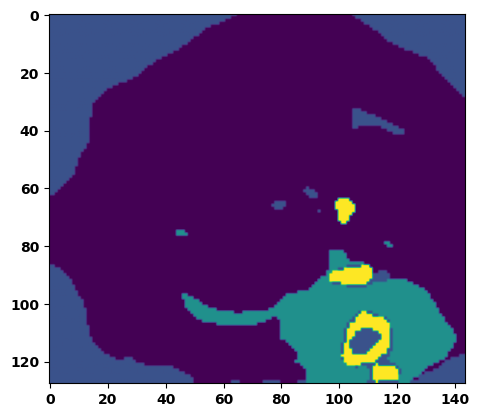

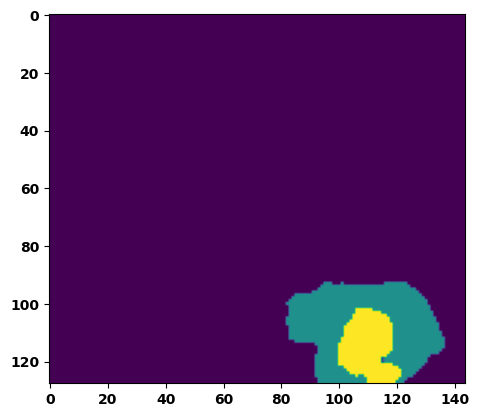

  6%|▌         | 2/36 [00:02<00:38,  1.14s/it]

Batch_id:  1 Eval loss:  0.7331164479255676
Batch_id:  1 Eval IoU:  tensor(0.2818, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8871, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7946, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8486, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9524, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.10s/it]

Batch_id:  2 Eval loss:  0.8354134559631348
Batch_id:  2 Eval IoU:  tensor(0.0445, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.5536, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.1497, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.6507, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4496, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.08s/it]

Batch_id:  3 Eval loss:  0.5416806936264038
Batch_id:  3 Eval IoU:  tensor(0.6196, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8812, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8762, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9852, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.10s/it]

Batch_id:  4 Eval loss:  0.8566232919692993
Batch_id:  4 Eval IoU:  tensor(0.0452, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5452, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.1390, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.5623, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.5237, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.09s/it]

Batch_id:  5 Eval loss:  0.7433825135231018
Batch_id:  5 Eval IoU:  tensor(0.2054, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7664, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.5612, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.7188, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.8199, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.08s/it]

Batch_id:  6 Eval loss:  0.7675741314888
Batch_id:  6 Eval IoU:  tensor(0.3054, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8957, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8208, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8181, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9850, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.7983130216598511
Batch_id:  7 Eval IoU:  tensor(0.1916, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8832, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.7665, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.8061, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.8699273467063904
Batch_id:  8 Eval IoU:  tensor(0.0281, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5258, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.1837, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.6087, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.3894, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.09s/it]

Batch_id:  9 Eval loss:  0.6187620759010315
Batch_id:  9 Eval IoU:  tensor(0.4912, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8774, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7977, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.7825, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  10 Eval loss:  0.890655517578125
Batch_id:  10 Eval IoU:  tensor(0.0253, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5425, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.2188, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.7800, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.2440, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


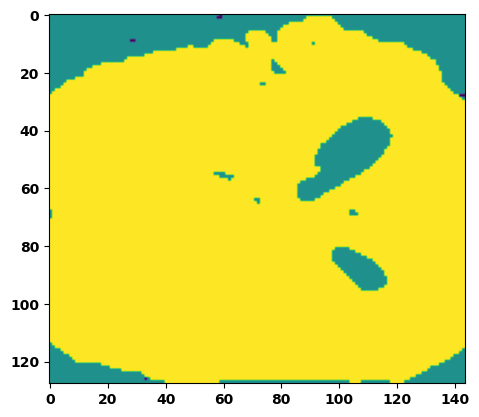

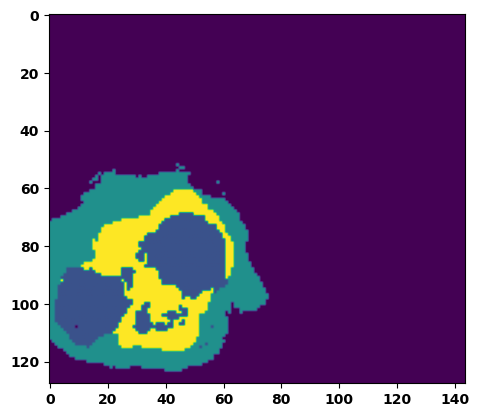

 33%|███▎      | 12/36 [00:13<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.6276017427444458
Batch_id:  11 Eval IoU:  tensor(0.5123, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9051, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8151, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8329, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.8203133344650269
Batch_id:  12 Eval IoU:  tensor(0.0528, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.5348, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.1586, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.7380, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.3224, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.09s/it]

Batch_id:  13 Eval loss:  0.6623358726501465
Batch_id:  13 Eval IoU:  tensor(0.3298, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8517, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8563, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.7821, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8101, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9584, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.08s/it]

Batch_id:  14 Eval loss:  0.8146915435791016
Batch_id:  14 Eval IoU:  tensor(0.0672, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.5132, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.1061, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.0475, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.10s/it]

Batch_id:  15 Eval loss:  0.7798579931259155
Batch_id:  15 Eval IoU:  tensor(0.1238, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5528, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.1396, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.6114, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.5537, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.8500256538391113
Batch_id:  16 Eval IoU:  tensor(0.0249, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.5264, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.1461, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.6124, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.4352, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.04s/it]

Batch_id:  17 Eval loss:  0.8031247854232788
Batch_id:  17 Eval IoU:  tensor(0.0746, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.5397, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.2401, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.2501, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8133, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.8425083756446838
Batch_id:  18 Eval IoU:  tensor(0.0063, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.5104, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.1056, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.0358, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.02s/it]

Batch_id:  19 Eval loss:  0.7248814702033997
Batch_id:  19 Eval IoU:  tensor(0.3380, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7903, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.7976, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9242, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  20 Eval loss:  0.680427074432373
Batch_id:  20 Eval IoU:  tensor(0.4597, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8995, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8186, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.8307, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9857, device='cuda:0')


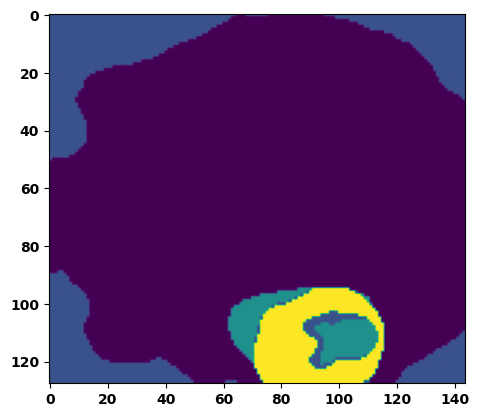

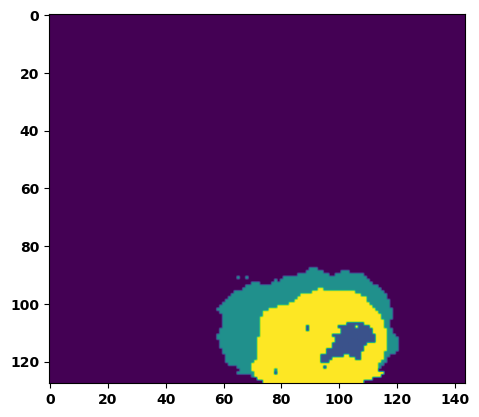

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.8562915325164795
Batch_id:  21 Eval IoU:  tensor(0.0332, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.5410, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.1337, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.6687, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.4018, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.07s/it]

Batch_id:  22 Eval loss:  0.7408913373947144
Batch_id:  22 Eval IoU:  tensor(0.3224, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8948, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8103, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8268, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9676, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.08s/it]

Batch_id:  23 Eval loss:  0.6843541860580444
Batch_id:  23 Eval IoU:  tensor(0.4099, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8950, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8237, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.8223, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9682, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.11s/it]

Batch_id:  24 Eval loss:  0.9127494692802429
Batch_id:  24 Eval IoU:  tensor(0.0239, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5205, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.2090, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.7572, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.1992, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9164, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.6605652570724487
Batch_id:  25 Eval IoU:  tensor(0.3674, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8814, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8089, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8229, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9339, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.7990895509719849
Batch_id:  26 Eval IoU:  tensor(0.0969, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.5456, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.1934, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.3775, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8984, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.7133, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.02s/it]

Batch_id:  27 Eval loss:  0.8167810440063477
Batch_id:  27 Eval IoU:  tensor(0.2707, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7685, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5377, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.5462, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.01s/it]

Batch_id:  28 Eval loss:  0.8520193099975586
Batch_id:  28 Eval IoU:  tensor(0.0261, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5342, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.1860, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.6986, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3364, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.01s/it]

Batch_id:  29 Eval loss:  0.8593472242355347
Batch_id:  29 Eval IoU:  tensor(0.0543, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5800, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.2294, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.7090, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.4382, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  30 Eval loss:  0.7126843929290771
Batch_id:  30 Eval IoU:  tensor(0.3669, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8348, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.6740, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.6955, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9943, device='cuda:0')


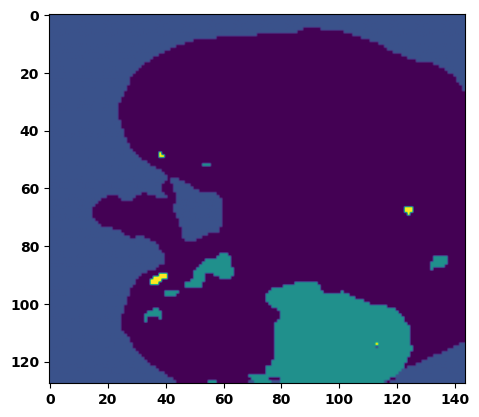

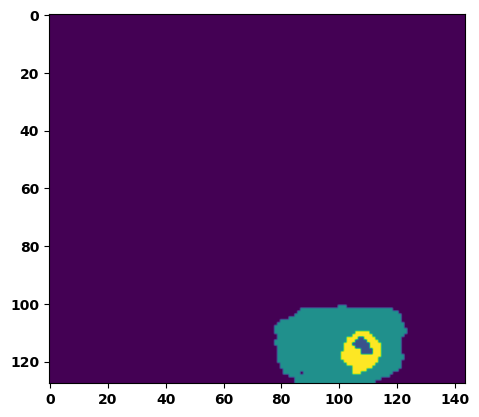

 89%|████████▉ | 32/36 [00:34<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.669653058052063
Batch_id:  31 Eval IoU:  tensor(0.3911, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8671, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.7556, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8058, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9584, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.05s/it]

Batch_id:  32 Eval loss:  0.7105673551559448
Batch_id:  32 Eval IoU:  tensor(0.2412, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6309, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.2728, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.6420, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6323, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9764, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.04s/it]

Batch_id:  33 Eval loss:  0.8756584525108337
Batch_id:  33 Eval IoU:  tensor(0.0262, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5231, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.0957, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.6421, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.4042, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.03s/it]

Batch_id:  34 Eval loss:  0.8455373048782349
Batch_id:  34 Eval IoU:  tensor(0.1022, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.5544, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.1441, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.2401, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8451, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]


Batch_id:  35 Eval loss:  0.7097610235214233
Batch_id:  35 Eval IoU:  tensor(0.2986, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8279, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8015, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.7107, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8487, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9508, device='cuda:0')
Epoch  0 Training loss:  0.7114995566281406
Epoch  0 Evaluation loss:  0.7675049536757999
Epoch  0 Training accuracy :  tensor(0.3973)
Epoch  0 Evaluation accuracy :  tensor(0.2141)
Epoch  0 Training Mean Dice Score:  tensor(0.8397)
Epoch  0 Eval Mean Dice Score:  tensor(0.7057)
Epoch  0 Training Non-tumor Dice Score:  tensor(0.7152)
Epoch  0 Eval Non-tumor Dice Score:  tensor(0.4711)
Epoch  0 Training NCR/NET Dice Score:  tensor(0.7391)
Epoch  0 Eval NCR/NET Dice Score:  tensor(0.6605)
Epoch  0 Training ED Dice Score:  tensor(0.9321)
Epoch  0

  1%|          | 1/110 [00:01<02:03,  1.13s/it]

Batch_id:  0 Training loss:  0.6228010654449463
Batch_id:  0 Training IoU:  tensor(0.5492, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9088, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.8323, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.8495, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:02,  1.14s/it]

Batch_id:  1 Training loss:  0.5698158740997314
Batch_id:  1 Training IoU:  tensor(0.5911, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9093, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.8521, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.8425, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.6045084595680237
Batch_id:  2 Training IoU:  tensor(0.6400, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9123, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.8325, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.8340, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:54,  1.08s/it]

Batch_id:  3 Training loss:  0.6815956830978394
Batch_id:  3 Training IoU:  tensor(0.4110, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.8835, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.7947, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.8209, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9706, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.08s/it]

Batch_id:  4 Training loss:  0.8067053556442261
Batch_id:  4 Training IoU:  tensor(0.1698, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.7969, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.6134, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.8026, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.8496, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9220, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:50,  1.06s/it]

Batch_id:  5 Training loss:  0.5728734135627747
Batch_id:  5 Training IoU:  tensor(0.5723, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.8808, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.7779, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.8064, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.06s/it]

Batch_id:  6 Training loss:  0.7115620374679565
Batch_id:  6 Training IoU:  tensor(0.3515, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.8488, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.7217, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.7904, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9116, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:47,  1.05s/it]

Batch_id:  7 Training loss:  0.6337246894836426
Batch_id:  7 Training IoU:  tensor(0.4565, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.8890, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.8154, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.8186, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9570, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:46,  1.05s/it]

Batch_id:  8 Training loss:  0.6634796857833862
Batch_id:  8 Training IoU:  tensor(0.4938, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.8899, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.7956, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.8093, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:46,  1.06s/it]

Batch_id:  9 Training loss:  0.5581926107406616
Batch_id:  9 Training IoU:  tensor(0.5579, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9026, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.8305, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 10%|█         | 11/110 [00:11<01:46,  1.08s/it]

Batch_id:  10 Training loss:  0.5405009984970093
Batch_id:  10 Training IoU:  tensor(0.6177, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9155, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.8439, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.8630, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 11%|█         | 12/110 [00:12<01:45,  1.08s/it]

Batch_id:  11 Training loss:  0.6455638408660889
Batch_id:  11 Training IoU:  tensor(0.4994, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.8880, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.7975, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.8042, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:43,  1.07s/it]

Batch_id:  12 Training loss:  0.5937120318412781
Batch_id:  12 Training IoU:  tensor(0.6049, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.8555, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.7194, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.7238, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:43,  1.07s/it]

Batch_id:  13 Training loss:  0.6935321688652039
Batch_id:  13 Training IoU:  tensor(0.3616, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.8390, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.7061, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.7907, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.8846, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.06s/it]

Batch_id:  14 Training loss:  0.6017033457756042
Batch_id:  14 Training IoU:  tensor(0.5316, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.8909, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.7976, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.8101, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.5674574375152588
Batch_id:  15 Training IoU:  tensor(0.6064, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.8415, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.8480, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.754241943359375
Batch_id:  16 Training IoU:  tensor(0.2415, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.8498, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.7130, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.8361, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.8974, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9524, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:35,  1.04s/it]

Batch_id:  17 Training loss:  0.6051911115646362
Batch_id:  17 Training IoU:  tensor(0.5204, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.8802, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.7969, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.7825, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:35,  1.05s/it]

Batch_id:  18 Training loss:  0.6938873529434204
Batch_id:  18 Training IoU:  tensor(0.4159, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.8337, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.8460, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:35,  1.06s/it]

Batch_id:  19 Training loss:  0.5818122625350952
Batch_id:  19 Training IoU:  tensor(0.5526, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.8951, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.8214, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.8126, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.5929568409919739
Batch_id:  20 Training IoU:  tensor(0.5748, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.8610, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.7333, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.7400, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 20%|██        | 22/110 [00:23<01:32,  1.06s/it]

Batch_id:  21 Training loss:  0.6652565002441406
Batch_id:  21 Training IoU:  tensor(0.4120, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.8642, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.7733, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.7607, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9699, device='cuda:0')


 21%|██        | 23/110 [00:24<01:35,  1.10s/it]

Batch_id:  22 Training loss:  0.7233993411064148
Batch_id:  22 Training IoU:  tensor(0.3386, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.8638, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.7371, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.7987, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.5509724617004395
Batch_id:  23 Training IoU:  tensor(0.6305, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.8311, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.8349, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:35,  1.13s/it]

Batch_id:  24 Training loss:  0.5169531106948853
Batch_id:  24 Training IoU:  tensor(0.6661, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.8595, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.8727, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:34,  1.12s/it]

Batch_id:  25 Training loss:  0.7545548677444458
Batch_id:  25 Training IoU:  tensor(0.2633, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.8155, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.6474, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.7153, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9622, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:35,  1.15s/it]

Batch_id:  26 Training loss:  0.6105959415435791
Batch_id:  26 Training IoU:  tensor(0.5312, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9044, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.8335, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.8363, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:33,  1.14s/it]

Batch_id:  27 Training loss:  0.6407893300056458
Batch_id:  27 Training IoU:  tensor(0.4513, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.8647, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.7477, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.7794, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:29,  1.10s/it]

Batch_id:  28 Training loss:  0.5529016256332397
Batch_id:  28 Training IoU:  tensor(0.6035, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9030, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.8179, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.8283, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:30,  1.13s/it]

Batch_id:  29 Training loss:  0.7753647565841675
Batch_id:  29 Training IoU:  tensor(0.1909, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.7263, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.4565, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.5793, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9157, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:26,  1.09s/it]

Batch_id:  30 Training loss:  0.7172364592552185
Batch_id:  30 Training IoU:  tensor(0.3278, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.7584, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.8109, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9359, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:24,  1.09s/it]

Batch_id:  31 Training loss:  0.63494873046875
Batch_id:  31 Training IoU:  tensor(0.4428, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.8831, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.7884, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.8219, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9650, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.08s/it]

Batch_id:  32 Training loss:  0.6047641038894653
Batch_id:  32 Training IoU:  tensor(0.5233, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9061, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.8264, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.8417, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 31%|███       | 34/110 [00:36<01:20,  1.05s/it]

Batch_id:  33 Training loss:  0.6311701536178589
Batch_id:  33 Training IoU:  tensor(0.4861, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8873, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.7829, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.8317, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.6353001594543457
Batch_id:  34 Training IoU:  tensor(0.4157, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.8881, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.7813, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.8518, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9402, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.6471906900405884
Batch_id:  35 Training IoU:  tensor(0.4210, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.8633, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.7329, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.7720, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.7526042461395264
Batch_id:  36 Training IoU:  tensor(0.2513, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.8226, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.6475, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.7486, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9668, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.6326010227203369
Batch_id:  37 Training IoU:  tensor(0.4594, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.8242, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.6590, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.6952, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:14,  1.05s/it]

Batch_id:  38 Training loss:  0.5754339098930359
Batch_id:  38 Training IoU:  tensor(0.5442, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.8514, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.7119, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.7290, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:12,  1.04s/it]

Batch_id:  39 Training loss:  0.7154329419136047
Batch_id:  39 Training IoU:  tensor(0.3218, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.8009, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.6428, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.6408, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:12,  1.05s/it]

Batch_id:  40 Training loss:  0.6545300483703613
Batch_id:  40 Training IoU:  tensor(0.4075, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.8540, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.7180, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.7558, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9770, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:11,  1.05s/it]

Batch_id:  41 Training loss:  0.6943655014038086
Batch_id:  41 Training IoU:  tensor(0.3160, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.8756, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.7557, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.8405, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:09,  1.04s/it]

Batch_id:  42 Training loss:  0.6322831511497498
Batch_id:  42 Training IoU:  tensor(0.4631, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.8688, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.7440, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.7988, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 40%|████      | 44/110 [00:47<01:08,  1.04s/it]

Batch_id:  43 Training loss:  0.595556914806366
Batch_id:  43 Training IoU:  tensor(0.4667, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.8437, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.7275, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.7416, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 41%|████      | 45/110 [00:48<01:08,  1.05s/it]

Batch_id:  44 Training loss:  0.5857023000717163
Batch_id:  44 Training IoU:  tensor(0.4710, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.8950, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.8475, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.8389, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9577, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:09,  1.08s/it]

Batch_id:  45 Training loss:  0.594610333442688
Batch_id:  45 Training IoU:  tensor(0.4597, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.8788, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.8258, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.8219, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.8937, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9738, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:07,  1.06s/it]

Batch_id:  46 Training loss:  0.6723687648773193
Batch_id:  46 Training IoU:  tensor(0.3804, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.8242, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.6637, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.6923, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:05,  1.06s/it]

Batch_id:  47 Training loss:  0.5923939347267151
Batch_id:  47 Training IoU:  tensor(0.5480, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.8655, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:04,  1.06s/it]

Batch_id:  48 Training loss:  0.5451158285140991
Batch_id:  48 Training IoU:  tensor(0.5690, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.8532, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.8280, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:03,  1.06s/it]

Batch_id:  49 Training loss:  0.6426151990890503
Batch_id:  49 Training IoU:  tensor(0.4241, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.8655, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.7477, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.7864, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.6839274168014526
Batch_id:  50 Training IoU:  tensor(0.4633, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.8426, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.6940, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.7074, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.5596151351928711
Batch_id:  51 Training IoU:  tensor(0.5869, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9134, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.8504, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.8509, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.6113727688789368
Batch_id:  52 Training IoU:  tensor(0.3924, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.8565, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.7798, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.7639, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9502, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.07s/it]

Batch_id:  53 Training loss:  0.5872421264648438
Batch_id:  53 Training IoU:  tensor(0.4586, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.8859, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.8371, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.8230, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9156, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9678, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.09s/it]

Batch_id:  54 Training loss:  0.7439723610877991
Batch_id:  54 Training IoU:  tensor(0.2567, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.8556, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.7412, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.8026, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9649, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.07s/it]

Batch_id:  55 Training loss:  0.6692509651184082
Batch_id:  55 Training IoU:  tensor(0.3764, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.8511, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.7795, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.7278, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.5728175640106201
Batch_id:  56 Training IoU:  tensor(0.4998, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.8843, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.8107, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.8086, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.5669728517532349
Batch_id:  57 Training IoU:  tensor(0.4543, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.8686, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.8005, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.8029, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9564, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.7432582378387451
Batch_id:  58 Training IoU:  tensor(0.2670, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.8403, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.6900, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.7771, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9612, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:54,  1.10s/it]

Batch_id:  59 Training loss:  0.6823337078094482
Batch_id:  59 Training IoU:  tensor(0.3606, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.7728, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.8160, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9688, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:53,  1.08s/it]

Batch_id:  60 Training loss:  0.6696692705154419
Batch_id:  60 Training IoU:  tensor(0.3529, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.8825, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.8195, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.8263, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9431, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.7088202238082886
Batch_id:  61 Training IoU:  tensor(0.3681, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.8930, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.8200, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.603386640548706
Batch_id:  62 Training IoU:  tensor(0.4550, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.8849, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.8254, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.8028, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9431, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9682, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:48,  1.06s/it]

Batch_id:  63 Training loss:  0.6832753419876099
Batch_id:  63 Training IoU:  tensor(0.3751, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.8190, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.6439, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.6947, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 59%|█████▉    | 65/110 [01:09<00:47,  1.05s/it]

Batch_id:  64 Training loss:  0.5757221579551697
Batch_id:  64 Training IoU:  tensor(0.4817, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.8995, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.8560, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.8282, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9682, device='cuda:0')


 60%|██████    | 66/110 [01:10<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.6222031712532043
Batch_id:  65 Training IoU:  tensor(0.4301, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.8926, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.8125, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.8276, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9654, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.5577938556671143
Batch_id:  66 Training IoU:  tensor(0.5530, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.8661, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.8621, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.5391784310340881
Batch_id:  67 Training IoU:  tensor(0.5521, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.8898, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.7913, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.8205, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.6041534543037415
Batch_id:  68 Training IoU:  tensor(0.4045, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.8445, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.7899, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.7603, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.8592, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9684, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.5543983578681946
Batch_id:  69 Training IoU:  tensor(0.4657, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.8732, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.8078, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.8203, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9087, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9559, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:43,  1.13s/it]

Batch_id:  70 Training loss:  0.6794315576553345
Batch_id:  70 Training IoU:  tensor(0.4182, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.8419, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.6953, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.7209, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.5128377079963684
Batch_id:  71 Training IoU:  tensor(0.5949, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9164, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.8466, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.8708, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:39,  1.07s/it]

Batch_id:  72 Training loss:  0.5942143201828003
Batch_id:  72 Training IoU:  tensor(0.4614, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.8280, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.6813, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.6891, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:38,  1.06s/it]

Batch_id:  73 Training loss:  0.6435619592666626
Batch_id:  73 Training IoU:  tensor(0.4062, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.8578, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.7486, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.8295, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.8668, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:37,  1.06s/it]

Batch_id:  74 Training loss:  0.6955059766769409
Batch_id:  74 Training IoU:  tensor(0.3429, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.8278, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.6657, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.7458, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:35,  1.06s/it]

Batch_id:  75 Training loss:  0.5501586198806763
Batch_id:  75 Training IoU:  tensor(0.4885, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.8822, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.8151, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.8059, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.4879268705844879
Batch_id:  76 Training IoU:  tensor(0.6118, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.8482, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.8503, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 71%|███████   | 78/110 [01:23<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.5869076251983643
Batch_id:  77 Training IoU:  tensor(0.5081, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.8836, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.7770, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.8366, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:34,  1.10s/it]

Batch_id:  78 Training loss:  0.7032516002655029
Batch_id:  78 Training IoU:  tensor(0.2938, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.8469, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.7035, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.7873, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9584, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.7790415287017822
Batch_id:  79 Training IoU:  tensor(0.2112, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.8479, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.7096, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.8405, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.8994, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9419, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.5026735067367554
Batch_id:  80 Training IoU:  tensor(0.5659, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.8901, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.8218, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.8095, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:31,  1.12s/it]

Batch_id:  81 Training loss:  0.6604160666465759
Batch_id:  81 Training IoU:  tensor(0.3696, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.8701, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.7671, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.7816, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.5539904832839966
Batch_id:  82 Training IoU:  tensor(0.5485, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.8675, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.7466, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.7587, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:29,  1.13s/it]

Batch_id:  83 Training loss:  0.5449413061141968
Batch_id:  83 Training IoU:  tensor(0.5704, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.8495, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.8320, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:27,  1.11s/it]

Batch_id:  84 Training loss:  0.604931116104126
Batch_id:  84 Training IoU:  tensor(0.4740, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.8641, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.7564, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.7529, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.4986879229545593
Batch_id:  85 Training IoU:  tensor(0.6073, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.8088, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.8219, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:25,  1.10s/it]

Batch_id:  86 Training loss:  0.6209966540336609
Batch_id:  86 Training IoU:  tensor(0.4129, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.8833, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.8224, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.8125, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9105, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:23,  1.09s/it]

Batch_id:  87 Training loss:  0.6263748407363892
Batch_id:  87 Training IoU:  tensor(0.3920, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.8754, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.8274, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.8168, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.8915, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9660, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.5359321236610413
Batch_id:  88 Training IoU:  tensor(0.5605, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.8417, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.8575, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.5500547289848328
Batch_id:  89 Training IoU:  tensor(0.5048, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.8720, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.7781, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.7747, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:20,  1.08s/it]

Batch_id:  90 Training loss:  0.6113005876541138
Batch_id:  90 Training IoU:  tensor(0.4147, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.8655, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.8012, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.7836, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9024, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:19,  1.07s/it]

Batch_id:  91 Training loss:  0.659373939037323
Batch_id:  91 Training IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.8484, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.7828, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.7122, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.07s/it]

Batch_id:  92 Training loss:  0.5653255581855774
Batch_id:  92 Training IoU:  tensor(0.4824, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.8586, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.7378, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.7544, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.06s/it]

Batch_id:  93 Training loss:  0.6452057361602783
Batch_id:  93 Training IoU:  tensor(0.3399, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.8556, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.7188, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.8344, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9556, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.07s/it]

Batch_id:  94 Training loss:  0.5152595043182373
Batch_id:  94 Training IoU:  tensor(0.5486, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9068, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.8692, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.8313, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:15,  1.08s/it]

Batch_id:  95 Training loss:  0.6555611491203308
Batch_id:  95 Training IoU:  tensor(0.3092, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.8723, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.8575, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.8113, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.8696, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9509, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.58539879322052
Batch_id:  96 Training IoU:  tensor(0.4618, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.8495, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.7152, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.7781, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.5367379188537598
Batch_id:  97 Training IoU:  tensor(0.4725, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.8648, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.7756, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.7859, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9667, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:12,  1.10s/it]

Batch_id:  98 Training loss:  0.6809419989585876
Batch_id:  98 Training IoU:  tensor(0.3746, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.8363, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.6900, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.7319, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9346, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 91%|█████████ | 100/110 [01:47<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.666702926158905
Batch_id:  99 Training IoU:  tensor(0.4307, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.8509, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.7327, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.7341, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.6204094886779785
Batch_id:  100 Training IoU:  tensor(0.4207, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.8367, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.7243, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.7803, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.8531, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.51204913854599
Batch_id:  101 Training IoU:  tensor(0.5778, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.8605, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.8405, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.650315523147583
Batch_id:  102 Training IoU:  tensor(0.4560, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.8089, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.8518, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.6360381841659546
Batch_id:  103 Training IoU:  tensor(0.4564, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.8035, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.8257, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.11s/it]

Batch_id:  104 Training loss:  0.6398835778236389
Batch_id:  104 Training IoU:  tensor(0.4044, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.8423, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.7092, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.7124, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.11s/it]

Batch_id:  105 Training loss:  0.48369327187538147
Batch_id:  105 Training IoU:  tensor(0.6482, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.8982, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.8940, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.6555492877960205
Batch_id:  106 Training IoU:  tensor(0.4688, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.8966, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.8011, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.8172, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.6233236789703369
Batch_id:  107 Training IoU:  tensor(0.4238, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.8840, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.8190, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.7925, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.7071825265884399
Batch_id:  108 Training IoU:  tensor(0.3480, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.8963, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.8001, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.6782122850418091
Batch_id:  109 Training IoU:  tensor(0.4248, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9105, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.8250, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.8522, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9851, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6956350803375244
Batch_id:  0 Eval IoU:  tensor(0.2536, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8423, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.6851, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8076, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9276, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


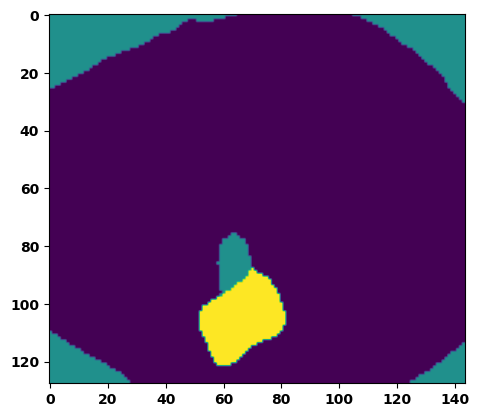

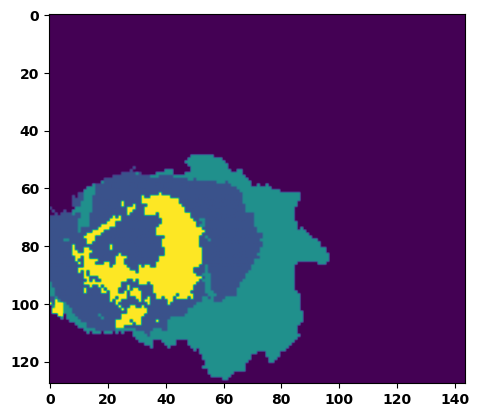

  6%|▌         | 2/36 [00:02<00:38,  1.13s/it]

Batch_id:  1 Eval loss:  0.7830843925476074
Batch_id:  1 Eval IoU:  tensor(0.1993, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8985, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7971, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8286, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.12s/it]

Batch_id:  2 Eval loss:  0.6132408380508423
Batch_id:  2 Eval IoU:  tensor(0.5416, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9118, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8387, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.8352, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.10s/it]

Batch_id:  3 Eval loss:  0.9864771962165833
Batch_id:  3 Eval IoU:  tensor(0.0030, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.5047, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.1837, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.7025, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.2113, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:35,  1.14s/it]

Batch_id:  4 Eval loss:  0.758169412612915
Batch_id:  4 Eval IoU:  tensor(0.2311, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8934, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8191, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8399, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9721, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.10s/it]

Batch_id:  5 Eval loss:  0.9297360777854919
Batch_id:  5 Eval IoU:  tensor(0.0123, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5246, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.1036, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.0493, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.12s/it]

Batch_id:  6 Eval loss:  0.7430884838104248
Batch_id:  6 Eval IoU:  tensor(0.2435, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8677, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.7529, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8340, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9686, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.10s/it]

Batch_id:  7 Eval loss:  0.9072880148887634
Batch_id:  7 Eval IoU:  tensor(0.0427, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.5652, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.1861, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.7444, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3706, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.9356364607810974
Batch_id:  8 Eval IoU:  tensor(0.0071, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5142, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.1061, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.0285, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:28,  1.09s/it]

Batch_id:  9 Eval loss:  0.7792361974716187
Batch_id:  9 Eval IoU:  tensor(0.1768, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8420, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.6841, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.7985, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  10 Eval loss:  0.7748291492462158
Batch_id:  10 Eval IoU:  tensor(0.1748, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8375, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.6750, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.8336, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.8833, device='cuda:0')


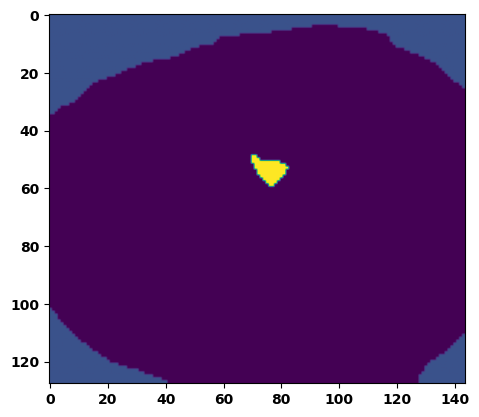

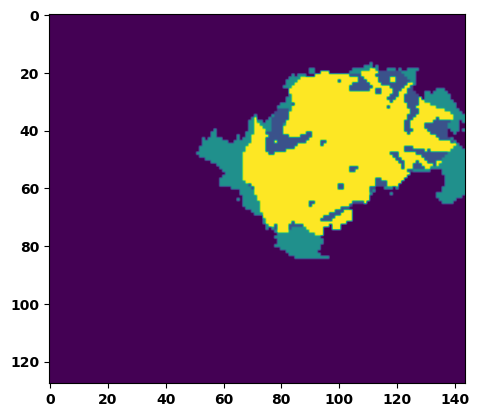

 33%|███▎      | 12/36 [00:13<00:28,  1.17s/it]

Batch_id:  11 Eval loss:  0.9664956331253052
Batch_id:  11 Eval IoU:  tensor(0.0137, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5214, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.1390, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.7303, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.2603, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.11s/it]

Batch_id:  12 Eval loss:  0.7820331454277039
Batch_id:  12 Eval IoU:  tensor(0.2008, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8237, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7971, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.7463, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8093, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.912653386592865
Batch_id:  13 Eval IoU:  tensor(0.0041, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.5080, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.2399, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.0224, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9145, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.08s/it]

Batch_id:  14 Eval loss:  0.7891021966934204
Batch_id:  14 Eval IoU:  tensor(0.1922, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8844, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7689, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.8085, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.07s/it]

Batch_id:  15 Eval loss:  0.7852583527565002
Batch_id:  15 Eval IoU:  tensor(0.1803, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8605, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.7210, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8066, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  16 Eval loss:  0.8069627285003662
Batch_id:  16 Eval IoU:  

 47%|████▋     | 17/36 [00:19<00:22,  1.18s/it]

tensor(0.1225, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6402, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3320, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.7577, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.6540, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8170, device='cuda:0')


 50%|█████     | 18/36 [00:20<00:20,  1.15s/it]

Batch_id:  17 Eval loss:  0.7183589935302734
Batch_id:  17 Eval IoU:  tensor(0.2627, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.7863, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.5779, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.8033, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8115, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:19,  1.13s/it]

Batch_id:  18 Eval loss:  0.7196325659751892
Batch_id:  18 Eval IoU:  tensor(0.2365, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7792, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6450, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.7886, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7583, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9248, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.09s/it]

Batch_id:  19 Eval loss:  0.877932608127594
Batch_id:  19 Eval IoU:  tensor(0.0719, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5496, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.1877, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.7790, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.3076, device='cuda:0')
Batch_id:  20 Eval loss:  0.8324096202850342
Batch_id:  20 Eval IoU:  tensor(0.1358, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7715, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.5431, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.5559, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


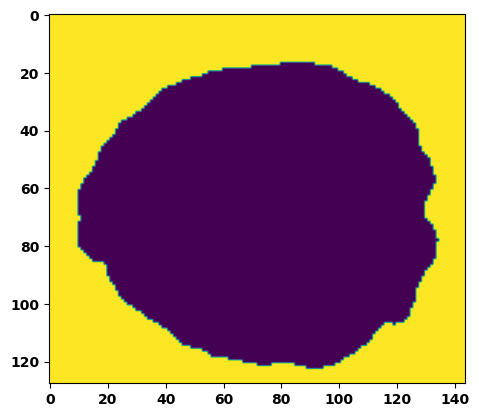

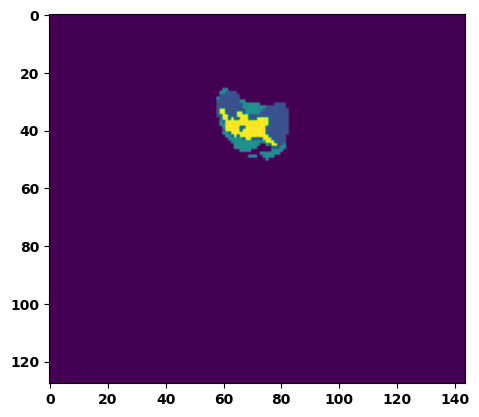

 61%|██████    | 22/36 [00:24<00:16,  1.17s/it]

Batch_id:  21 Eval loss:  0.7637889385223389
Batch_id:  21 Eval IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8351, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.6747, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.7075, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.13s/it]

Batch_id:  22 Eval loss:  0.8154871463775635
Batch_id:  22 Eval IoU:  tensor(0.1276, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.6530, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3748, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.5313, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.7623, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.11s/it]

Batch_id:  23 Eval loss:  0.6122382879257202
Batch_id:  23 Eval IoU:  tensor(0.5137, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8213, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.8513, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.9352028369903564
Batch_id:  24 Eval IoU:  tensor(0.0252, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5353, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.1941, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.7019, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8774, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.3676, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.4811406433582306
Batch_id:  25 Eval IoU:  tensor(0.6201, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8674, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.06s/it]

Batch_id:  26 Eval loss:  0.8952609300613403
Batch_id:  26 Eval IoU:  tensor(0.0199, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.5374, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.2316, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.0757, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.5901663303375244
Batch_id:  27 Eval IoU:  tensor(0.4927, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8416, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7039, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.7070, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9761, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.03s/it]

Batch_id:  28 Eval loss:  0.9520670175552368
Batch_id:  28 Eval IoU:  tensor(0.0138, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5227, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.1672, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.7973, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.1981, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.04s/it]

Batch_id:  29 Eval loss:  0.6547333002090454
Batch_id:  29 Eval IoU:  tensor(0.2959, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8202, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.7168, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.8052, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8983, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8607, device='cuda:0')
Batch_id:  30 Eval loss:  0.6740014553070068
Batch_id:  30 Eval IoU:  tensor(0.3604, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6771, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3623, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.6724, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.6776, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


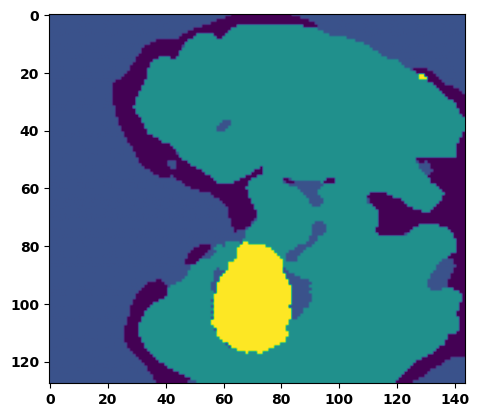

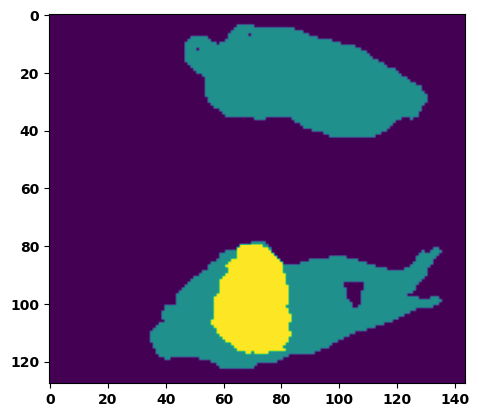

 89%|████████▉ | 32/36 [00:35<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.7323814630508423
Batch_id:  31 Eval IoU:  tensor(0.3509, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8464, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.07s/it]

Batch_id:  32 Eval loss:  0.780773401260376
Batch_id:  32 Eval IoU:  tensor(0.1881, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8755, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7530, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8499, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.05s/it]

Batch_id:  33 Eval loss:  0.7751573324203491
Batch_id:  33 Eval IoU:  tensor(0.1914, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8827, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7654, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.04s/it]

Batch_id:  34 Eval loss:  0.9425274133682251
Batch_id:  34 Eval IoU:  tensor(0.0030, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.5060, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.1441, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.0124, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.7459069490432739
Batch_id:  35 Eval IoU:  tensor(0.2142, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8373, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6749, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.7362, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9737, device='cuda:0')
Epoch  1 Training loss:  0.6240226924419403
Epoch  1 Evaluation loss:  0.7902248327930769
Epoch  1 Training accuracy :  tensor(0.4532)
Epoch  1 Evaluation accuracy :  tensor(0.1934)
Epoch  1 Training Mean Dice Score:  tensor(0.8736)
Epoch  1 Eval Mean Dice Score:  tensor(0.7387)
Epoch  1 Training Non-tumor Dice Score:  tensor(0.7751)
Epoch  1 Eval Non-tumor Dice Score:  tensor(0.5292)
Epoch  1 Training NCR/NET Dice Score:  tensor(0.7974)
Epoch  1 Eval NCR/NET Dice Score:  tensor(0.6710)
Epoch  1 Training ED Dice Score:  tensor(0.9455)
Epoch  1

Epoch: 2
Training in session: 


  1%|          | 1/110 [00:01<01:58,  1.09s/it]

Batch_id:  0 Training loss:  0.5527175068855286
Batch_id:  0 Training IoU:  tensor(0.4649, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.8863, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.8006, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.8423, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9679, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:55,  1.07s/it]

Batch_id:  1 Training loss:  0.5238665342330933
Batch_id:  1 Training IoU:  tensor(0.5799, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.8673, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.7420, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.7614, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.6406738758087158
Batch_id:  2 Training IoU:  tensor(0.4890, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.8558, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.7183, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.7312, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:53,  1.07s/it]

Batch_id:  3 Training loss:  0.47930699586868286
Batch_id:  3 Training IoU:  tensor(0.6457, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.8777, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.8844, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.07s/it]

Batch_id:  4 Training loss:  0.588590145111084
Batch_id:  4 Training IoU:  tensor(0.4597, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.8743, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.7749, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.7897, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.5416491627693176
Batch_id:  5 Training IoU:  tensor(0.5480, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9148, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.8459, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.8587, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.45817649364471436
Batch_id:  6 Training IoU:  tensor(0.6547, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9256, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.8612, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.8687, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.10s/it]

Batch_id:  7 Training loss:  0.503025233745575
Batch_id:  7 Training IoU:  tensor(0.5611, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.8745, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.8681, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:49,  1.08s/it]

Batch_id:  8 Training loss:  0.4587746858596802
Batch_id:  8 Training IoU:  tensor(0.6394, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.8923, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:48,  1.08s/it]

Batch_id:  9 Training loss:  0.5052909851074219
Batch_id:  9 Training IoU:  tensor(0.5817, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.8756, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.7632, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.7684, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.12s/it]

Batch_id:  10 Training loss:  0.6356911063194275
Batch_id:  10 Training IoU:  tensor(0.4247, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9044, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.8200, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.8435, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.12s/it]

Batch_id:  11 Training loss:  0.6671720743179321
Batch_id:  11 Training IoU:  tensor(0.3334, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.8635, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.7344, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.7962, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:46,  1.09s/it]

Batch_id:  12 Training loss:  0.7711677551269531
Batch_id:  12 Training IoU:  tensor(0.1964, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.8351, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.6856, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.8312, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.8683, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9554, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.11s/it]

Batch_id:  13 Training loss:  0.4551251530647278
Batch_id:  13 Training IoU:  tensor(0.6119, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.8861, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.8875, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:46,  1.12s/it]

Batch_id:  14 Training loss:  0.5137283802032471
Batch_id:  14 Training IoU:  tensor(0.5756, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.8722, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.8504, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:44,  1.11s/it]

Batch_id:  15 Training loss:  0.45969149470329285
Batch_id:  15 Training IoU:  tensor(0.6157, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.8281, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.8404, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:45,  1.13s/it]

Batch_id:  16 Training loss:  0.6271151900291443
Batch_id:  16 Training IoU:  tensor(0.3956, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.7788, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.8039, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:40,  1.10s/it]

Batch_id:  17 Training loss:  0.5124174356460571
Batch_id:  17 Training IoU:  tensor(0.5052, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.8687, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.7688, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.7821, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:41,  1.12s/it]

Batch_id:  18 Training loss:  0.4217143654823303
Batch_id:  18 Training IoU:  tensor(0.6434, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.8883, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.6128445863723755
Batch_id:  19 Training IoU:  tensor(0.3922, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.8719, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.7584, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.8005, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9715, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.6112881302833557
Batch_id:  20 Training IoU:  tensor(0.4778, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.8276, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9293, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 20%|██        | 22/110 [00:24<01:33,  1.07s/it]

Batch_id:  21 Training loss:  0.5533466935157776
Batch_id:  21 Training IoU:  tensor(0.4515, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.8912, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.8365, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.8205, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 21%|██        | 23/110 [00:25<01:31,  1.06s/it]

Batch_id:  22 Training loss:  0.5571571588516235
Batch_id:  22 Training IoU:  tensor(0.4774, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.8191, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.8058, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9686, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.07s/it]

Batch_id:  23 Training loss:  0.5063718557357788
Batch_id:  23 Training IoU:  tensor(0.6042, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.8901, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.8887, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.6512058973312378
Batch_id:  24 Training IoU:  tensor(0.3142, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.8884, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.8871, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.8288, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.8786, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9592, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:29,  1.06s/it]

Batch_id:  25 Training loss:  0.5432818531990051
Batch_id:  25 Training IoU:  tensor(0.4930, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.8064, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.8678, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.8990, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.07s/it]

Batch_id:  26 Training loss:  0.48427534103393555
Batch_id:  26 Training IoU:  tensor(0.5961, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.8819, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:27,  1.06s/it]

Batch_id:  27 Training loss:  0.479714572429657
Batch_id:  27 Training IoU:  tensor(0.5091, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.8447, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.8509, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9663, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:25,  1.05s/it]

Batch_id:  28 Training loss:  0.6850302219390869
Batch_id:  28 Training IoU:  tensor(0.3606, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.8642, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.7433, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.7906, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.41433951258659363
Batch_id:  29 Training IoU:  tensor(0.6664, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.8851, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.8815, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:24,  1.07s/it]

Batch_id:  30 Training loss:  0.5944249629974365
Batch_id:  30 Training IoU:  tensor(0.4644, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.8842, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.7837, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.7944, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.6298675537109375
Batch_id:  31 Training IoU:  tensor(0.3584, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.8818, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.8023, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.8234, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9651, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.6079614758491516
Batch_id:  32 Training IoU:  tensor(0.4075, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.8896, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.8029, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.8361, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 31%|███       | 34/110 [00:36<01:20,  1.06s/it]

Batch_id:  33 Training loss:  0.48235058784484863
Batch_id:  33 Training IoU:  tensor(0.5774, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8945, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.8052, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.8091, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:19,  1.06s/it]

Batch_id:  34 Training loss:  0.5196095705032349
Batch_id:  34 Training IoU:  tensor(0.5623, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.8663, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.5848823189735413
Batch_id:  35 Training IoU:  tensor(0.5045, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.8384, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.8478, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:17,  1.06s/it]

Batch_id:  36 Training loss:  0.5614782571792603
Batch_id:  36 Training IoU:  tensor(0.4443, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.8990, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.8517, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.8411, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9677, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.4944397807121277
Batch_id:  37 Training IoU:  tensor(0.6189, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.8909, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.8906, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.6387048959732056
Batch_id:  38 Training IoU:  tensor(0.4773, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9251, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.8524, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.8795, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.4691498577594757
Batch_id:  39 Training IoU:  tensor(0.6434, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.8817, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.47523099184036255
Batch_id:  40 Training IoU:  tensor(0.5403, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9068, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.8348, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.8735, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.5489636659622192
Batch_id:  41 Training IoU:  tensor(0.4794, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.8730, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.8820, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:11,  1.07s/it]

Batch_id:  42 Training loss:  0.4971766471862793
Batch_id:  42 Training IoU:  tensor(0.4857, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.8982, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.8446, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.8773, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9651, device='cuda:0')


 40%|████      | 44/110 [00:47<01:10,  1.07s/it]

Batch_id:  43 Training loss:  0.4590266942977905
Batch_id:  43 Training IoU:  tensor(0.6103, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9198, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 41%|████      | 45/110 [00:48<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.4500924348831177
Batch_id:  44 Training IoU:  tensor(0.5586, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9265, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.8927, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9016, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9703, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:08,  1.08s/it]

Batch_id:  45 Training loss:  0.7488345503807068
Batch_id:  45 Training IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.8631, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.7336, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.8919, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.8836, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9432, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:07,  1.08s/it]

Batch_id:  46 Training loss:  0.4155344069004059
Batch_id:  46 Training IoU:  tensor(0.6307, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:07,  1.08s/it]

Batch_id:  47 Training loss:  0.5599914789199829
Batch_id:  47 Training IoU:  tensor(0.4674, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.8933, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9625, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.697162389755249
Batch_id:  48 Training IoU:  tensor(0.2597, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.8724, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.7554, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.8705, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9619, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:03,  1.07s/it]

Batch_id:  49 Training loss:  0.744586706161499
Batch_id:  49 Training IoU:  tensor(0.2275, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.8646, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.7376, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.8881, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.8766, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9561, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.05s/it]

Batch_id:  50 Training loss:  0.6470675468444824
Batch_id:  50 Training IoU:  tensor(0.3490, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.8921, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.7914, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.8936, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:00,  1.05s/it]

Batch_id:  51 Training loss:  0.5091832876205444
Batch_id:  51 Training IoU:  tensor(0.5152, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.8982, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9576, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.5989925861358643
Batch_id:  52 Training IoU:  tensor(0.4226, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9124, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.8561, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.39963099360466003
Batch_id:  53 Training IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9319, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9266, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.46805351972579956
Batch_id:  54 Training IoU:  tensor(0.5653, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9694, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.4048818349838257
Batch_id:  55 Training IoU:  tensor(0.6272, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9304, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.3722854256629944
Batch_id:  56 Training IoU:  tensor(0.7153, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:56,  1.08s/it]

Batch_id:  57 Training loss:  0.5173723101615906
Batch_id:  57 Training IoU:  tensor(0.5018, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9029, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.8356, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.8339, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.4436129331588745
Batch_id:  58 Training IoU:  tensor(0.5658, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9568, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:53,  1.08s/it]

Batch_id:  59 Training loss:  0.6077733039855957
Batch_id:  59 Training IoU:  tensor(0.3811, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.8703, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.8995, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9044, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9702, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.71494460105896
Batch_id:  60 Training IoU:  tensor(0.2846, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.8890, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.7962, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.8732, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9730, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.06s/it]

Batch_id:  61 Training loss:  0.43630000948905945
Batch_id:  61 Training IoU:  tensor(0.6440, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:49,  1.06s/it]

Batch_id:  62 Training loss:  0.7140271067619324
Batch_id:  62 Training IoU:  tensor(0.2599, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.8959, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.8437, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.8697, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.8986, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:48,  1.06s/it]

Batch_id:  63 Training loss:  0.4520365297794342
Batch_id:  63 Training IoU:  tensor(0.6187, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9255, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.5903809666633606
Batch_id:  64 Training IoU:  tensor(0.4352, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.8432, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.8845, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9252, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.41146454215049744
Batch_id:  65 Training IoU:  tensor(0.6102, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:45,  1.06s/it]

Batch_id:  66 Training loss:  0.6428472995758057
Batch_id:  66 Training IoU:  tensor(0.3884, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.8764, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.8975, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:44,  1.05s/it]

Batch_id:  67 Training loss:  0.4955132007598877
Batch_id:  67 Training IoU:  tensor(0.5585, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:42,  1.04s/it]

Batch_id:  68 Training loss:  0.4490683674812317
Batch_id:  68 Training IoU:  tensor(0.5801, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:42,  1.07s/it]

Batch_id:  69 Training loss:  0.5638478994369507
Batch_id:  69 Training IoU:  tensor(0.5623, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:42,  1.08s/it]

Batch_id:  70 Training loss:  0.5026047229766846
Batch_id:  70 Training IoU:  tensor(0.5952, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.07s/it]

Batch_id:  71 Training loss:  0.5737596154212952
Batch_id:  71 Training IoU:  tensor(0.4905, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:39,  1.06s/it]

Batch_id:  72 Training loss:  0.44272321462631226
Batch_id:  72 Training IoU:  tensor(0.6030, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:37,  1.05s/it]

Batch_id:  73 Training loss:  0.5773227214813232
Batch_id:  73 Training IoU:  tensor(0.5333, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.8971, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:36,  1.05s/it]

Batch_id:  74 Training loss:  0.5252574682235718
Batch_id:  74 Training IoU:  tensor(0.4690, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9618, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:34,  1.03s/it]

Batch_id:  75 Training loss:  0.49948686361312866
Batch_id:  75 Training IoU:  tensor(0.5355, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9127, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.36541682481765747
Batch_id:  76 Training IoU:  tensor(0.7266, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 71%|███████   | 78/110 [01:23<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.3690683841705322
Batch_id:  77 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 72%|███████▏  | 79/110 [01:24<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.564889669418335
Batch_id:  78 Training IoU:  tensor(0.4318, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9093, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.48254430294036865
Batch_id:  79 Training IoU:  tensor(0.5449, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:30,  1.06s/it]

Batch_id:  80 Training loss:  0.513119637966156
Batch_id:  80 Training IoU:  tensor(0.5329, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.8512, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:29,  1.06s/it]

Batch_id:  81 Training loss:  0.5833908319473267
Batch_id:  81 Training IoU:  tensor(0.4400, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.8759, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:28,  1.05s/it]

Batch_id:  82 Training loss:  0.5414037704467773
Batch_id:  82 Training IoU:  tensor(0.4472, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9250, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.8525, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9604, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.4653509557247162
Batch_id:  83 Training IoU:  tensor(0.5438, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.8855, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.7765, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.8193, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.6850078105926514
Batch_id:  84 Training IoU:  tensor(0.2988, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9126, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.8341, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9181, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9694, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.5472016930580139
Batch_id:  85 Training IoU:  tensor(0.4645, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.8902, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.8969, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:24,  1.07s/it]

Batch_id:  86 Training loss:  0.4614201784133911
Batch_id:  86 Training IoU:  tensor(0.5889, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:23,  1.07s/it]

Batch_id:  87 Training loss:  0.5560814738273621
Batch_id:  87 Training IoU:  tensor(0.4612, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:22,  1.08s/it]

Batch_id:  88 Training loss:  0.43459343910217285
Batch_id:  88 Training IoU:  tensor(0.5550, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9647, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.6495281457901001
Batch_id:  89 Training IoU:  tensor(0.3516, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.8772, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 83%|████████▎ | 91/110 [01:37<00:20,  1.06s/it]

Batch_id:  90 Training loss:  0.5462267398834229
Batch_id:  90 Training IoU:  tensor(0.4368, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9628, device='cuda:0')


 84%|████████▎ | 92/110 [01:38<00:19,  1.07s/it]

Batch_id:  91 Training loss:  0.4709431529045105
Batch_id:  91 Training IoU:  tensor(0.5365, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 85%|████████▍ | 93/110 [01:39<00:17,  1.06s/it]

Batch_id:  92 Training loss:  0.5279035568237305
Batch_id:  92 Training IoU:  tensor(0.5289, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 85%|████████▌ | 94/110 [01:40<00:16,  1.05s/it]

Batch_id:  93 Training loss:  0.4315361976623535
Batch_id:  93 Training IoU:  tensor(0.5752, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 86%|████████▋ | 95/110 [01:41<00:15,  1.05s/it]

Batch_id:  94 Training loss:  0.4327087998390198
Batch_id:  94 Training IoU:  tensor(0.5651, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.3650040626525879
Batch_id:  95 Training IoU:  tensor(0.6809, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.49135762453079224
Batch_id:  96 Training IoU:  tensor(0.5781, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:12,  1.08s/it]

Batch_id:  97 Training loss:  0.4543471932411194
Batch_id:  97 Training IoU:  tensor(0.6223, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:12,  1.09s/it]

Batch_id:  98 Training loss:  0.3816460967063904
Batch_id:  98 Training IoU:  tensor(0.6543, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 91%|█████████ | 100/110 [01:47<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.40312403440475464
Batch_id:  99 Training IoU:  tensor(0.5925, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9602, device='cuda:0')


 92%|█████████▏| 101/110 [01:48<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.5554599761962891
Batch_id:  100 Training IoU:  tensor(0.4304, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9593, device='cuda:0')


 93%|█████████▎| 102/110 [01:49<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.6887329816818237
Batch_id:  101 Training IoU:  tensor(0.2766, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9028, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.8114, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9276, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9667, device='cuda:0')


 94%|█████████▎| 103/110 [01:50<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.42249470949172974
Batch_id:  102 Training IoU:  tensor(0.6196, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 95%|█████████▍| 104/110 [01:51<00:06,  1.10s/it]

Batch_id:  103 Training loss:  0.4657678008079529
Batch_id:  103 Training IoU:  tensor(0.5507, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 95%|█████████▌| 105/110 [01:52<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.6327760219573975
Batch_id:  104 Training IoU:  tensor(0.3815, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.5109226703643799
Batch_id:  105 Training IoU:  tensor(0.4997, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9299, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.5711649656295776
Batch_id:  106 Training IoU:  tensor(0.4298, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9184, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.8694, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.8733, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.5978269577026367
Batch_id:  107 Training IoU:  tensor(0.4077, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.11s/it]

Batch_id:  108 Training loss:  0.5058749914169312
Batch_id:  108 Training IoU:  tensor(0.5511, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.4077070355415344
Batch_id:  109 Training IoU:  tensor(0.6646, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9946, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.9848985075950623
Batch_id:  0 Eval IoU:  tensor(0.0080, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5129, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.2001, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.7168, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2134, device='cuda:0')


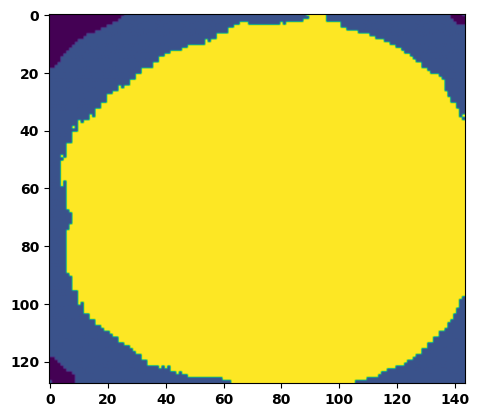

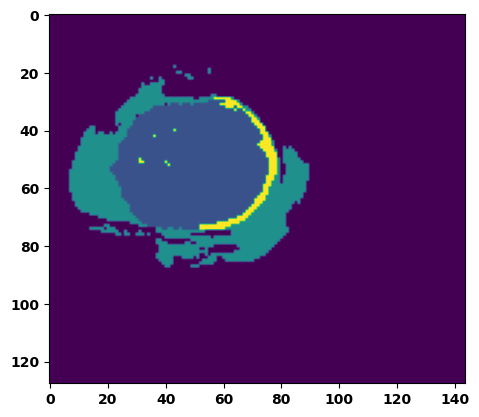

  6%|▌         | 2/36 [00:02<00:38,  1.13s/it]

Batch_id:  1 Eval loss:  0.8215317726135254
Batch_id:  1 Eval IoU:  tensor(0.1140, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.6707, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4389, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.7598, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8236, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.6603, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:38,  1.17s/it]

Batch_id:  2 Eval loss:  0.35560357570648193
Batch_id:  2 Eval IoU:  tensor(0.6814, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9925, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.15s/it]

Batch_id:  3 Eval loss:  0.5572049617767334
Batch_id:  3 Eval IoU:  tensor(0.4003, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9172, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9255, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9656, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.12s/it]

Batch_id:  4 Eval loss:  0.9017004370689392
Batch_id:  4 Eval IoU:  tensor(0.0541, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5446, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.1843, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8367, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2086, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.07s/it]

Batch_id:  5 Eval loss:  0.7116188406944275
Batch_id:  5 Eval IoU:  tensor(0.2567, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8756, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8216, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8787, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8465, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.05s/it]

Batch_id:  6 Eval loss:  0.8171429634094238
Batch_id:  6 Eval IoU:  tensor(0.1228, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6698, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4132, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.6520, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.6703, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.7348612546920776
Batch_id:  7 Eval IoU:  tensor(0.2430, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9440, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.8277081847190857
Batch_id:  8 Eval IoU:  tensor(0.1106, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6573, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.5387, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.6988, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.5363, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.07s/it]

Batch_id:  9 Eval loss:  0.7445021867752075
Batch_id:  9 Eval IoU:  tensor(0.2363, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  10 Eval loss:  0.8570976257324219
Batch_id:  10 Eval IoU:  tensor(0.0903, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6522, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4370, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.3705, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8130, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


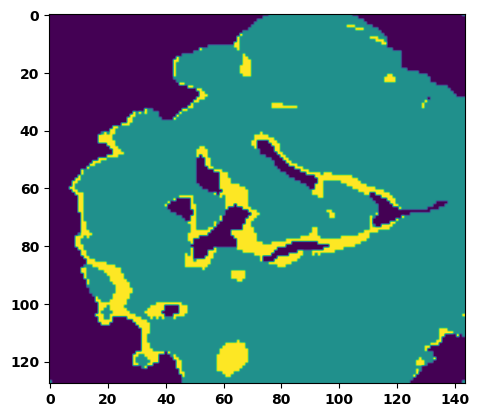

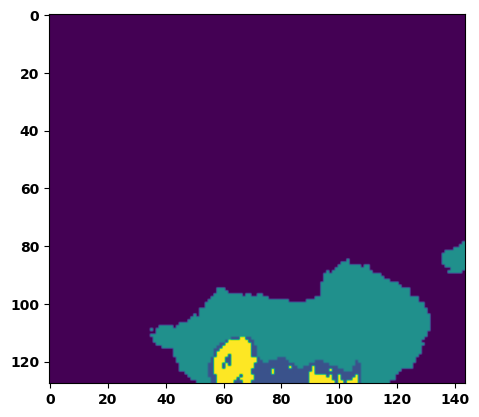

 33%|███▎      | 12/36 [00:13<00:26,  1.11s/it]

Batch_id:  11 Eval loss:  0.9661396741867065
Batch_id:  11 Eval IoU:  tensor(0.0180, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5288, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.1539, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.7415, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.2640, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.7052604556083679
Batch_id:  12 Eval IoU:  tensor(0.2774, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8496, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7300, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.7416, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.5779425501823425
Batch_id:  13 Eval IoU:  tensor(0.3772, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7466, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.5459, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.7848, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.6651, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.45400726795196533
Batch_id:  14 Eval IoU:  tensor(0.6044, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:20,  1.05s/it]

Batch_id:  15 Eval loss:  0.7903205752372742
Batch_id:  15 Eval IoU:  tensor(0.1484, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7248, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5421, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9163, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.5010, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.06s/it]

Batch_id:  16 Eval loss:  0.7557286620140076
Batch_id:  16 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.07s/it]

Batch_id:  17 Eval loss:  0.7086787223815918
Batch_id:  17 Eval IoU:  tensor(0.2436, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9143, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8294, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8962, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.6624139547348022
Batch_id:  18 Eval IoU:  tensor(0.2849, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8244, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9428, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.07s/it]

Batch_id:  19 Eval loss:  0.8371214270591736
Batch_id:  19 Eval IoU:  tensor(0.1093, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6763, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4019, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8073, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.5465, device='cuda:0')
Batch_id:  20 Eval loss:  0.7544976472854614
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


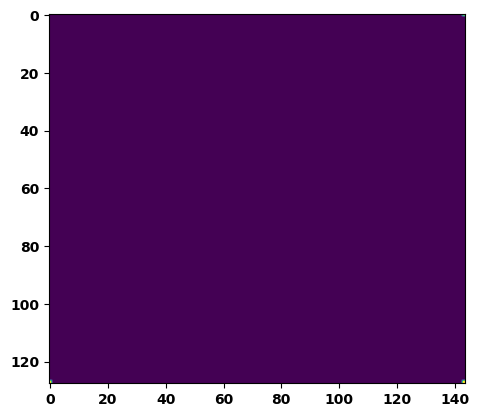

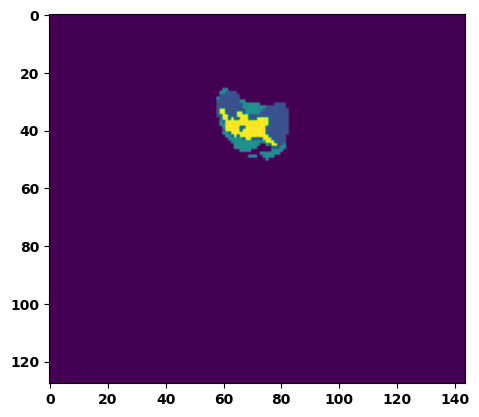

 61%|██████    | 22/36 [00:23<00:15,  1.11s/it]

Batch_id:  21 Eval loss:  0.528965950012207
Batch_id:  21 Eval IoU:  tensor(0.5115, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9778, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.07s/it]

Batch_id:  22 Eval loss:  0.5993015766143799
Batch_id:  22 Eval IoU:  tensor(0.3471, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9097, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.04s/it]

Batch_id:  23 Eval loss:  0.9359854459762573
Batch_id:  23 Eval IoU:  tensor(0.0324, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5513, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.2075, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.7973, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.2883, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.05s/it]

Batch_id:  24 Eval loss:  0.4756113290786743
Batch_id:  24 Eval IoU:  tensor(0.5679, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.9080631136894226
Batch_id:  25 Eval IoU:  tensor(0.0523, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.5836, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.2229, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8099, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.3419, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.5244613289833069
Batch_id:  26 Eval IoU:  tensor(0.5127, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.5176235437393188
Batch_id:  27 Eval IoU:  tensor(0.5907, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.7534863948822021
Batch_id:  28 Eval IoU:  tensor(0.2195, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.04s/it]

Batch_id:  29 Eval loss:  0.6458350419998169
Batch_id:  29 Eval IoU:  tensor(0.3551, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  30 Eval loss:  0.9158172607421875
Batch_id:  30 Eval IoU:  tensor(0.0460, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5675, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.2586, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.7394, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.3937, device='cuda:0')


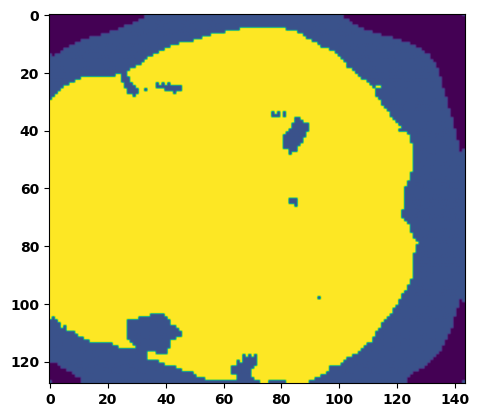

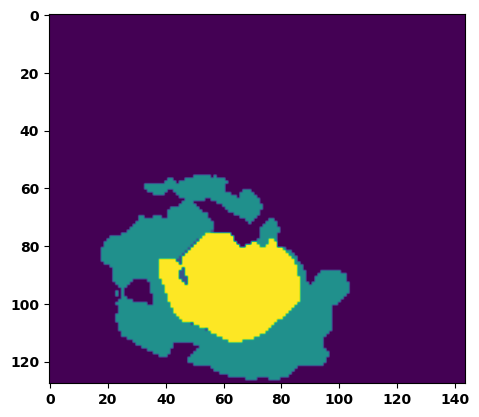

 89%|████████▉ | 32/36 [00:34<00:04,  1.07s/it]

Batch_id:  31 Eval loss:  0.631628692150116
Batch_id:  31 Eval IoU:  tensor(0.2856, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8875, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8154, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.04s/it]

Batch_id:  32 Eval loss:  0.7117208242416382
Batch_id:  32 Eval IoU:  tensor(0.2513, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9107, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9749, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.897662878036499
Batch_id:  33 Eval IoU:  tensor(0.0467, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5739, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3045, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.2568, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8069, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.03s/it]

Batch_id:  34 Eval loss:  0.6098158359527588
Batch_id:  34 Eval IoU:  tensor(0.4498, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]


Batch_id:  35 Eval loss:  0.7937220931053162
Batch_id:  35 Eval IoU:  tensor(0.1428, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6288, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3460, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8044, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.4425, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9221, device='cuda:0')
Epoch  2 Training loss:  0.5294291016730395
Epoch  2 Evaluation loss:  0.7215467376841439
Epoch  2 Training accuracy :  tensor(0.5088)
Epoch  2 Evaluation accuracy :  tensor(0.2577)
Epoch  2 Training Mean Dice Score:  tensor(0.9239)
Epoch  2 Eval Mean Dice Score:  tensor(0.8101)
Epoch  2 Training Non-tumor Dice Score:  tensor(0.8758)
Epoch  2 Eval Non-tumor Dice Score:  tensor(0.6832)
Epoch  2 Training NCR/NET Dice Score:  tensor(0.8929)
Epoch  2 Eval NCR/NET Dice Score:  tensor(0.8529)
Epoch  2 Training ED Dice Score:  tensor(0.9470)
Epoch  2

  1%|          | 1/110 [00:01<02:13,  1.23s/it]

Batch_id:  0 Training loss:  0.3070550262928009
Batch_id:  0 Training IoU:  tensor(0.7343, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:00,  1.12s/it]

Batch_id:  1 Training loss:  0.38164442777633667
Batch_id:  1 Training IoU:  tensor(0.6984, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:54,  1.07s/it]

Batch_id:  2 Training loss:  0.7820625305175781
Batch_id:  2 Training IoU:  tensor(0.1922, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.7655, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9587, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:50,  1.04s/it]

Batch_id:  3 Training loss:  0.5872094631195068
Batch_id:  3 Training IoU:  tensor(0.4711, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:48,  1.04s/it]

Batch_id:  4 Training loss:  0.4150887727737427
Batch_id:  4 Training IoU:  tensor(0.5956, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:48,  1.04s/it]

Batch_id:  5 Training loss:  0.6052547693252563
Batch_id:  5 Training IoU:  tensor(0.3927, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:47,  1.04s/it]

Batch_id:  6 Training loss:  0.3859328031539917
Batch_id:  6 Training IoU:  tensor(0.6200, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:47,  1.05s/it]

Batch_id:  7 Training loss:  0.36714619398117065
Batch_id:  7 Training IoU:  tensor(0.6821, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:45,  1.04s/it]

Batch_id:  8 Training loss:  0.3879837095737457
Batch_id:  8 Training IoU:  tensor(0.6487, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:44,  1.05s/it]

Batch_id:  9 Training loss:  0.411643385887146
Batch_id:  9 Training IoU:  tensor(0.5969, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.07s/it]

Batch_id:  10 Training loss:  0.32334333658218384
Batch_id:  10 Training IoU:  tensor(0.7149, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 11%|█         | 12/110 [00:12<01:44,  1.07s/it]

Batch_id:  11 Training loss:  0.3782539963722229
Batch_id:  11 Training IoU:  tensor(0.6252, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:42,  1.05s/it]

Batch_id:  12 Training loss:  0.5161635875701904
Batch_id:  12 Training IoU:  tensor(0.4791, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:41,  1.06s/it]

Batch_id:  13 Training loss:  0.7250841856002808
Batch_id:  13 Training IoU:  tensor(0.2492, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.8414, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9001, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9582, device='cuda:0')


 14%|█▎        | 15/110 [00:15<01:40,  1.05s/it]

Batch_id:  14 Training loss:  0.3701326549053192
Batch_id:  14 Training IoU:  tensor(0.6405, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 15%|█▍        | 16/110 [00:16<01:39,  1.05s/it]

Batch_id:  15 Training loss:  0.38955050706863403
Batch_id:  15 Training IoU:  tensor(0.6110, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 15%|█▌        | 17/110 [00:17<01:38,  1.06s/it]

Batch_id:  16 Training loss:  0.45366302132606506
Batch_id:  16 Training IoU:  tensor(0.5485, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:37,  1.06s/it]

Batch_id:  17 Training loss:  0.2595686912536621
Batch_id:  17 Training IoU:  tensor(0.7730, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:35,  1.05s/it]

Batch_id:  18 Training loss:  0.4965829849243164
Batch_id:  18 Training IoU:  tensor(0.4828, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:37,  1.09s/it]

Batch_id:  19 Training loss:  0.28343528509140015
Batch_id:  19 Training IoU:  tensor(0.7444, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:36,  1.09s/it]

Batch_id:  20 Training loss:  0.5468611717224121
Batch_id:  20 Training IoU:  tensor(0.4248, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9173, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 20%|██        | 22/110 [00:23<01:34,  1.07s/it]

Batch_id:  21 Training loss:  0.26731210947036743
Batch_id:  21 Training IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 21%|██        | 23/110 [00:24<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.2758558988571167
Batch_id:  22 Training IoU:  tensor(0.8138, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:33,  1.08s/it]

Batch_id:  23 Training loss:  0.46679192781448364
Batch_id:  23 Training IoU:  tensor(0.5340, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:31,  1.08s/it]

Batch_id:  24 Training loss:  0.6016833782196045
Batch_id:  24 Training IoU:  tensor(0.3643, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.4893025755882263
Batch_id:  25 Training IoU:  tensor(0.5002, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 25%|██▍       | 27/110 [00:28<01:29,  1.08s/it]

Batch_id:  26 Training loss:  0.3918054401874542
Batch_id:  26 Training IoU:  tensor(0.6915, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 25%|██▌       | 28/110 [00:29<01:27,  1.07s/it]

Batch_id:  27 Training loss:  0.5540405511856079
Batch_id:  27 Training IoU:  tensor(0.4522, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 26%|██▋       | 29/110 [00:30<01:27,  1.09s/it]

Batch_id:  28 Training loss:  0.36515510082244873
Batch_id:  28 Training IoU:  tensor(0.6452, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.5539492964744568
Batch_id:  29 Training IoU:  tensor(0.4953, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:24,  1.07s/it]

Batch_id:  30 Training loss:  0.36562585830688477
Batch_id:  30 Training IoU:  tensor(0.6790, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:26,  1.11s/it]

Batch_id:  31 Training loss:  0.3193165063858032
Batch_id:  31 Training IoU:  tensor(0.7723, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 30%|███       | 33/110 [00:35<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.4127488136291504
Batch_id:  32 Training IoU:  tensor(0.5641, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 31%|███       | 34/110 [00:36<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.5042949318885803
Batch_id:  33 Training IoU:  tensor(0.5180, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:22,  1.10s/it]

Batch_id:  34 Training loss:  0.3460865020751953
Batch_id:  34 Training IoU:  tensor(0.7643, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.47256043553352356
Batch_id:  35 Training IoU:  tensor(0.5247, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:21,  1.12s/it]

Batch_id:  36 Training loss:  0.3599162697792053
Batch_id:  36 Training IoU:  tensor(0.7149, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:21,  1.13s/it]

Batch_id:  37 Training loss:  0.3594772219657898
Batch_id:  37 Training IoU:  tensor(0.6726, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.33868852257728577
Batch_id:  38 Training IoU:  tensor(0.6418, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:18,  1.12s/it]

Batch_id:  39 Training loss:  0.4081941246986389
Batch_id:  39 Training IoU:  tensor(0.5815, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9091, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.2699205279350281
Batch_id:  40 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:15,  1.10s/it]

Batch_id:  41 Training loss:  0.5767295956611633
Batch_id:  41 Training IoU:  tensor(0.4639, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.334749698638916
Batch_id:  42 Training IoU:  tensor(0.6221, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 40%|████      | 44/110 [00:47<01:13,  1.11s/it]

Batch_id:  43 Training loss:  0.32327139377593994
Batch_id:  43 Training IoU:  tensor(0.6929, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 41%|████      | 45/110 [00:48<01:11,  1.09s/it]

Batch_id:  44 Training loss:  0.5048969984054565
Batch_id:  44 Training IoU:  tensor(0.5624, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:10,  1.10s/it]

Batch_id:  45 Training loss:  0.4797309637069702
Batch_id:  45 Training IoU:  tensor(0.5146, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.5280221104621887
Batch_id:  46 Training IoU:  tensor(0.4407, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9258, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.4331642687320709
Batch_id:  47 Training IoU:  tensor(0.5638, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.401178777217865
Batch_id:  48 Training IoU:  tensor(0.6524, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:08,  1.14s/it]

Batch_id:  49 Training loss:  0.6118455529212952
Batch_id:  49 Training IoU:  tensor(0.3425, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.8478, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9237, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:06,  1.13s/it]

Batch_id:  50 Training loss:  0.3736373782157898
Batch_id:  50 Training IoU:  tensor(0.6275, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:04,  1.11s/it]

Batch_id:  51 Training loss:  0.4528868794441223
Batch_id:  51 Training IoU:  tensor(0.5914, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:04,  1.13s/it]

Batch_id:  52 Training loss:  0.537649393081665
Batch_id:  52 Training IoU:  tensor(0.4376, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:02,  1.12s/it]

Batch_id:  53 Training loss:  0.354442834854126
Batch_id:  53 Training IoU:  tensor(0.5790, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9702, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:01,  1.11s/it]

Batch_id:  54 Training loss:  0.43264782428741455
Batch_id:  54 Training IoU:  tensor(0.5738, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 51%|█████     | 56/110 [01:00<01:00,  1.12s/it]

Batch_id:  55 Training loss:  0.4779525399208069
Batch_id:  55 Training IoU:  tensor(0.5531, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:58,  1.10s/it]

Batch_id:  56 Training loss:  0.4263659119606018
Batch_id:  56 Training IoU:  tensor(0.5214, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9389, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.39117035269737244
Batch_id:  57 Training IoU:  tensor(0.6123, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.3841184377670288
Batch_id:  58 Training IoU:  tensor(0.6201, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:56,  1.12s/it]

Batch_id:  59 Training loss:  0.2475336343050003
Batch_id:  59 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.34701621532440186
Batch_id:  60 Training IoU:  tensor(0.6205, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.4959997236728668
Batch_id:  61 Training IoU:  tensor(0.5200, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9188, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.4775594472885132
Batch_id:  62 Training IoU:  tensor(0.5584, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.29631125926971436
Batch_id:  63 Training IoU:  tensor(0.6905, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.23725338280200958
Batch_id:  64 Training IoU:  tensor(0.7998, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.41795802116394043
Batch_id:  65 Training IoU:  tensor(0.5624, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:48,  1.13s/it]

Batch_id:  66 Training loss:  0.3564145565032959
Batch_id:  66 Training IoU:  tensor(0.6461, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.6772208213806152
Batch_id:  67 Training IoU:  tensor(0.2568, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.8612, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.8097, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.7868, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9502, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:46,  1.14s/it]

Batch_id:  68 Training loss:  0.3940134048461914
Batch_id:  68 Training IoU:  tensor(0.5433, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.8826, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:45,  1.13s/it]

Batch_id:  69 Training loss:  0.2771550416946411
Batch_id:  69 Training IoU:  tensor(0.6981, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.10s/it]

Batch_id:  70 Training loss:  0.48803719878196716
Batch_id:  70 Training IoU:  tensor(0.4293, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9076, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9435, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:44,  1.16s/it]

Batch_id:  71 Training loss:  0.29607757925987244
Batch_id:  71 Training IoU:  tensor(0.6607, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.46720394492149353
Batch_id:  72 Training IoU:  tensor(0.5569, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.10s/it]

Batch_id:  73 Training loss:  0.28722965717315674
Batch_id:  73 Training IoU:  tensor(0.6702, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9708, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.09s/it]

Batch_id:  74 Training loss:  0.2787967622280121
Batch_id:  74 Training IoU:  tensor(0.7091, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.42240655422210693
Batch_id:  75 Training IoU:  tensor(0.5476, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.4946669936180115
Batch_id:  76 Training IoU:  tensor(0.4935, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9164, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.26657378673553467
Batch_id:  77 Training IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.49032169580459595
Batch_id:  78 Training IoU:  tensor(0.4366, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.8895, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9080, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9506, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.3443906307220459
Batch_id:  79 Training IoU:  tensor(0.6436, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:30,  1.05s/it]

Batch_id:  80 Training loss:  0.4918268918991089
Batch_id:  80 Training IoU:  tensor(0.5399, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:29,  1.04s/it]

Batch_id:  81 Training loss:  0.36281728744506836
Batch_id:  81 Training IoU:  tensor(0.6426, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:28,  1.06s/it]

Batch_id:  82 Training loss:  0.5548977851867676
Batch_id:  82 Training IoU:  tensor(0.4659, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.31126365065574646
Batch_id:  83 Training IoU:  tensor(0.7356, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.07s/it]

Batch_id:  84 Training loss:  0.46991899609565735
Batch_id:  84 Training IoU:  tensor(0.5108, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:25,  1.07s/it]

Batch_id:  85 Training loss:  0.6684351563453674
Batch_id:  85 Training IoU:  tensor(0.2894, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.8959, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.43213871121406555
Batch_id:  86 Training IoU:  tensor(0.5604, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.09s/it]

Batch_id:  87 Training loss:  0.38504916429519653
Batch_id:  87 Training IoU:  tensor(0.5607, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9668, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.5162523984909058
Batch_id:  88 Training IoU:  tensor(0.4841, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.08s/it]

Batch_id:  89 Training loss:  0.4965539276599884
Batch_id:  89 Training IoU:  tensor(0.4752, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:20,  1.07s/it]

Batch_id:  90 Training loss:  0.43176040053367615
Batch_id:  90 Training IoU:  tensor(0.5733, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9313, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.07s/it]

Batch_id:  91 Training loss:  0.25066500902175903
Batch_id:  91 Training IoU:  tensor(0.7756, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.07s/it]

Batch_id:  92 Training loss:  0.3486256003379822
Batch_id:  92 Training IoU:  tensor(0.7032, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:16,  1.05s/it]

Batch_id:  93 Training loss:  0.3885146975517273
Batch_id:  93 Training IoU:  tensor(0.5917, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:15,  1.06s/it]

Batch_id:  94 Training loss:  0.5566537380218506
Batch_id:  94 Training IoU:  tensor(0.3966, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.30137333273887634
Batch_id:  95 Training IoU:  tensor(0.7067, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.39141568541526794
Batch_id:  96 Training IoU:  tensor(0.6349, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.5875319838523865
Batch_id:  97 Training IoU:  tensor(0.3703, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9142, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.05s/it]

Batch_id:  98 Training loss:  0.316154420375824
Batch_id:  98 Training IoU:  tensor(0.6812, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.05s/it]

Batch_id:  99 Training loss:  0.21600009500980377
Batch_id:  99 Training IoU:  tensor(0.8027, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.21720826625823975
Batch_id:  100 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.11s/it]

Batch_id:  101 Training loss:  0.6386253237724304
Batch_id:  101 Training IoU:  tensor(0.3283, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9737, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.2688969671726227
Batch_id:  102 Training IoU:  tensor(0.7239, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.09s/it]

Batch_id:  103 Training loss:  0.6310089230537415
Batch_id:  103 Training IoU:  tensor(0.3422, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.8981, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.47480085492134094
Batch_id:  104 Training IoU:  tensor(0.4540, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9672, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.13s/it]

Batch_id:  105 Training loss:  0.29296383261680603
Batch_id:  105 Training IoU:  tensor(0.6525, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.11s/it]

Batch_id:  106 Training loss:  0.525159478187561
Batch_id:  106 Training IoU:  tensor(0.4487, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.12s/it]

Batch_id:  107 Training loss:  0.31283700466156006
Batch_id:  107 Training IoU:  tensor(0.6345, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.12s/it]

Batch_id:  108 Training loss:  0.6333807110786438
Batch_id:  108 Training IoU:  tensor(0.3435, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9219, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.8481, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.8884, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.3084932267665863
Batch_id:  109 Training IoU:  tensor(0.6532, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9776, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8312735557556152
Batch_id:  0 Eval IoU:  tensor(0.1023, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6228, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.4585, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.2848, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8928, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


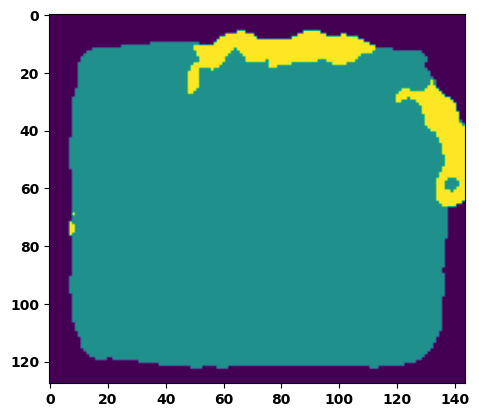

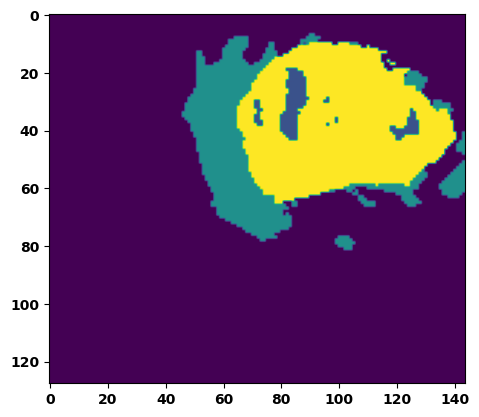

  6%|▌         | 2/36 [00:02<00:42,  1.26s/it]

Batch_id:  1 Eval loss:  0.5155786275863647
Batch_id:  1 Eval IoU:  tensor(0.4467, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9787, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:38,  1.17s/it]

Batch_id:  2 Eval loss:  0.274158239364624
Batch_id:  2 Eval IoU:  tensor(0.6972, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.13s/it]

Batch_id:  3 Eval loss:  0.5869102478027344
Batch_id:  3 Eval IoU:  tensor(0.3757, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9225, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9782, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.11s/it]

Batch_id:  4 Eval loss:  0.40353986620903015
Batch_id:  4 Eval IoU:  tensor(0.5204, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9735, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.09s/it]

Batch_id:  5 Eval loss:  0.6626567840576172
Batch_id:  5 Eval IoU:  tensor(0.2559, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6605, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4985, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.4086, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.7621, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9728, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.07s/it]

Batch_id:  6 Eval loss:  0.5256837606430054
Batch_id:  6 Eval IoU:  tensor(0.4001, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8995, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9001, device='cuda:0')


 22%|██▏       | 8/36 [00:09<00:31,  1.14s/it]

Batch_id:  7 Eval loss:  0.37299132347106934
Batch_id:  7 Eval IoU:  tensor(0.6682, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9918, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:29,  1.11s/it]

Batch_id:  8 Eval loss:  0.39381617307662964
Batch_id:  8 Eval IoU:  tensor(0.6669, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:30,  1.19s/it]

Batch_id:  9 Eval loss:  0.2689884603023529
Batch_id:  9 Eval IoU:  tensor(0.7719, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  10 Eval loss:  0.9227502942085266
Batch_id:  10 Eval IoU:  tensor(0.0397, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5435, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.1962, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.8316, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.1973, device='cuda:0')


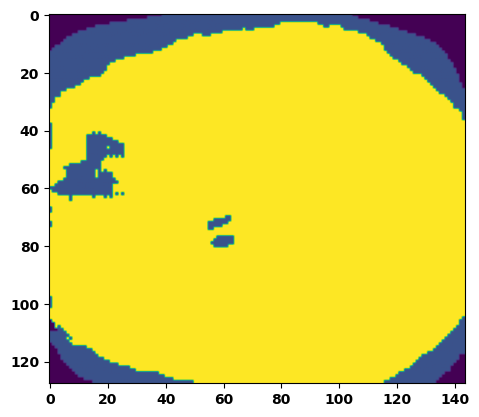

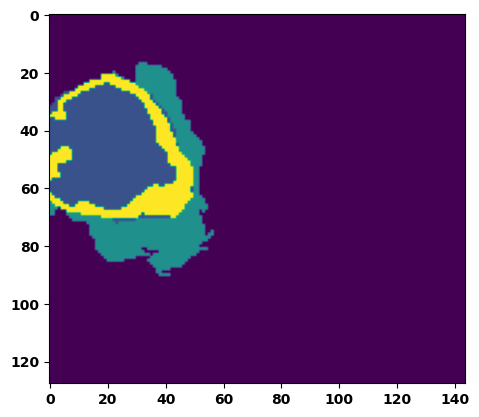

 33%|███▎      | 12/36 [00:13<00:28,  1.19s/it]

Batch_id:  11 Eval loss:  0.865036129951477
Batch_id:  11 Eval IoU:  tensor(0.0814, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6302, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.3616, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.7689, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.5123, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:26,  1.14s/it]

Batch_id:  12 Eval loss:  0.7639811038970947
Batch_id:  12 Eval IoU:  tensor(0.1507, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6670, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4353, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.5852, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.6947, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9528, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.7538344860076904
Batch_id:  13 Eval IoU:  tensor(0.2396, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 42%|████▏     | 15/36 [00:17<00:23,  1.11s/it]

Batch_id:  14 Eval loss:  0.9656299352645874
Batch_id:  14 Eval IoU:  tensor(0.0159, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.5256, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.2255, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.7153, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2403, device='cuda:0')


 44%|████▍     | 16/36 [00:18<00:22,  1.13s/it]

Batch_id:  15 Eval loss:  0.8122747540473938
Batch_id:  15 Eval IoU:  tensor(0.1256, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7008, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4503, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8121, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.5940, device='cuda:0')


 47%|████▋     | 17/36 [00:19<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.8764720559120178
Batch_id:  16 Eval IoU:  tensor(0.0667, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.5930, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.2822, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8007, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9117, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.3774, device='cuda:0')


 50%|█████     | 18/36 [00:20<00:20,  1.11s/it]

Batch_id:  17 Eval loss:  0.8870632648468018
Batch_id:  17 Eval IoU:  tensor(0.0634, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.5988, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3287, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.2472, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8311, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:18,  1.10s/it]

Batch_id:  18 Eval loss:  0.7545860409736633
Batch_id:  18 Eval IoU:  tensor(0.2394, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.10s/it]

Batch_id:  19 Eval loss:  0.7263426184654236
Batch_id:  19 Eval IoU:  tensor(0.2611, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  20 Eval loss:  0.757402241230011
Batch_id:  20 Eval IoU:  tensor(0.2069, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8137, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8816, device='cuda:0')


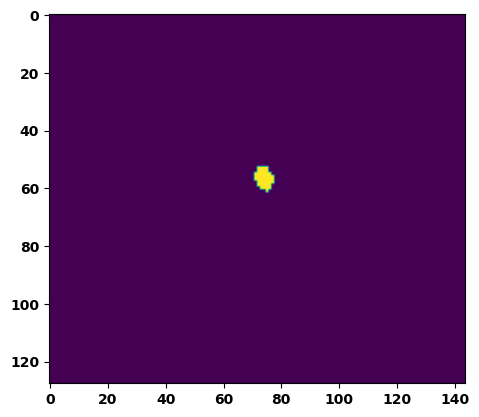

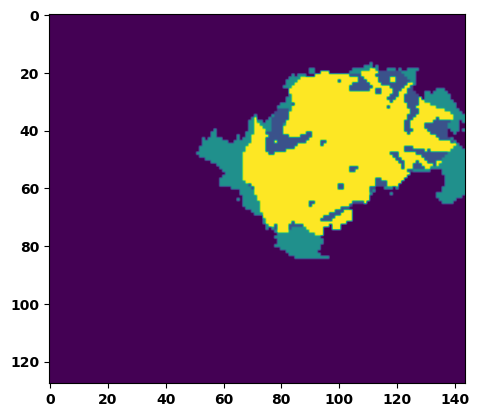

 61%|██████    | 22/36 [00:25<00:16,  1.16s/it]

Batch_id:  21 Eval loss:  0.8519071340560913
Batch_id:  21 Eval IoU:  tensor(0.0873, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6453, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3493, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.3016, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 64%|██████▍   | 23/36 [00:26<00:14,  1.15s/it]

Batch_id:  22 Eval loss:  0.4500952661037445
Batch_id:  22 Eval IoU:  tensor(0.4544, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8890, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8819, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9583, device='cuda:0')


 67%|██████▋   | 24/36 [00:27<00:14,  1.19s/it]

Batch_id:  23 Eval loss:  0.940521240234375
Batch_id:  23 Eval IoU:  tensor(0.0293, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5427, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.1778, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.7342, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3028, device='cuda:0')


 69%|██████▉   | 25/36 [00:28<00:12,  1.15s/it]

Batch_id:  24 Eval loss:  0.4704706072807312
Batch_id:  24 Eval IoU:  tensor(0.6121, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9987, device='cuda:0')


 72%|███████▏  | 26/36 [00:29<00:12,  1.20s/it]

Batch_id:  25 Eval loss:  0.6521692276000977
Batch_id:  25 Eval IoU:  tensor(0.3055, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9526, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:10,  1.17s/it]

Batch_id:  26 Eval loss:  0.5630214810371399
Batch_id:  26 Eval IoU:  tensor(0.3660, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8997, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9204, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.869510293006897
Batch_id:  27 Eval IoU:  tensor(0.0758, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6214, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.2982, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8443, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3831, device='cuda:0')


 81%|████████  | 29/36 [00:33<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.7277190685272217
Batch_id:  28 Eval IoU:  tensor(0.1743, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6415, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3564, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.6794, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.5907, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9395, device='cuda:0')


 83%|████████▎ | 30/36 [00:34<00:06,  1.12s/it]

Batch_id:  29 Eval loss:  0.4490525722503662
Batch_id:  29 Eval IoU:  tensor(0.5448, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  30 Eval loss:  0.5008500814437866
Batch_id:  30 Eval IoU:  tensor(0.5149, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


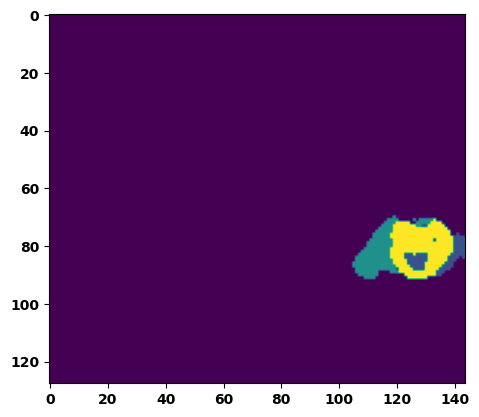

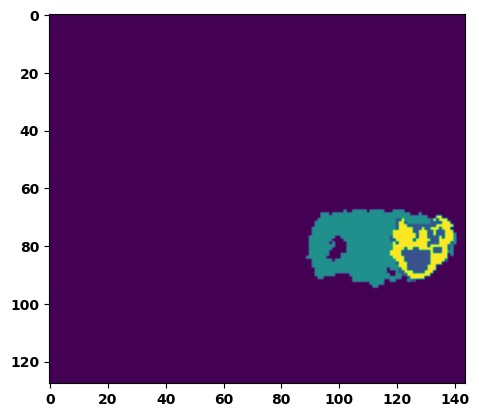

 89%|████████▉ | 32/36 [00:36<00:04,  1.09s/it]

Batch_id:  31 Eval loss:  0.9023211002349854
Batch_id:  31 Eval IoU:  tensor(0.0537, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5806, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.2848, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.7764, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3829, device='cuda:0')


 92%|█████████▏| 33/36 [00:37<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.7584722638130188
Batch_id:  32 Eval IoU:  tensor(0.1732, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7580, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6086, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9086, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.5619, device='cuda:0')


 94%|█████████▍| 34/36 [00:38<00:02,  1.05s/it]

Batch_id:  33 Eval loss:  0.7577771544456482
Batch_id:  33 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.8575966358184814
Batch_id:  34 Eval IoU:  tensor(0.0823, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6402, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3572, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.2941, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.12s/it]

Batch_id:  35 Eval loss:  0.8886816501617432
Batch_id:  35 Eval IoU:  tensor(0.0570, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.5836, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3207, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.3205, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7661, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')
Epoch  3 Training loss:  0.42147464765743775
Epoch  3 Evaluation loss:  0.6822537705302238
Epoch  3 Training accuracy :  tensor(0.5792)
Epoch  3 Evaluation accuracy :  tensor(0.2818)
Epoch  3 Training Mean Dice Score:  tensor(0.9625)
Epoch  3 Eval Mean Dice Score:  tensor(0.7998)
Epoch  3 Training Non-tumor Dice Score:  tensor(0.9509)
Epoch  3 Eval Non-tumor Dice Score:  tensor(0.6650)
Epoch  3 Training NCR/NET Dice Score:  tensor(0.9652)
Epoch  3 Eval NCR/NET Dice Score:  tensor(0.7980)
Epoch  3 Training ED Dice Score:  tensor(0.9511)
Epoch  

Epoch: 4
Training in session: 


  1%|          | 1/110 [00:01<01:55,  1.06s/it]

Batch_id:  0 Training loss:  0.22347106039524078
Batch_id:  0 Training IoU:  tensor(0.7391, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:53,  1.06s/it]

Batch_id:  1 Training loss:  0.45319074392318726
Batch_id:  1 Training IoU:  tensor(0.5639, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:54,  1.07s/it]

Batch_id:  2 Training loss:  0.2380446046590805
Batch_id:  2 Training IoU:  tensor(0.7713, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:52,  1.06s/it]

Batch_id:  3 Training loss:  0.45173531770706177
Batch_id:  3 Training IoU:  tensor(0.5162, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.08s/it]

Batch_id:  4 Training loss:  0.4707367420196533
Batch_id:  4 Training IoU:  tensor(0.5208, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.27278202772140503
Batch_id:  5 Training IoU:  tensor(0.6705, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.42158523201942444
Batch_id:  6 Training IoU:  tensor(0.5037, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.8830, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:52,  1.10s/it]

Batch_id:  7 Training loss:  0.3773592710494995
Batch_id:  7 Training IoU:  tensor(0.6135, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:49,  1.08s/it]

Batch_id:  8 Training loss:  0.38415902853012085
Batch_id:  8 Training IoU:  tensor(0.5683, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.4003062844276428
Batch_id:  9 Training IoU:  tensor(0.5399, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 10%|█         | 11/110 [00:11<01:49,  1.10s/it]

Batch_id:  10 Training loss:  0.39559996128082275
Batch_id:  10 Training IoU:  tensor(0.6597, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 11%|█         | 12/110 [00:13<01:47,  1.10s/it]

Batch_id:  11 Training loss:  0.3928731381893158
Batch_id:  11 Training IoU:  tensor(0.5561, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9622, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:50,  1.13s/it]

Batch_id:  12 Training loss:  0.5284683704376221
Batch_id:  12 Training IoU:  tensor(0.4427, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:50,  1.16s/it]

Batch_id:  13 Training loss:  0.312069833278656
Batch_id:  13 Training IoU:  tensor(0.6918, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:48,  1.15s/it]

Batch_id:  14 Training loss:  0.41789382696151733
Batch_id:  14 Training IoU:  tensor(0.5452, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9573, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:50,  1.17s/it]

Batch_id:  15 Training loss:  0.3596821427345276
Batch_id:  15 Training IoU:  tensor(0.5827, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:46,  1.14s/it]

Batch_id:  16 Training loss:  0.36034756898880005
Batch_id:  16 Training IoU:  tensor(0.6144, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:45,  1.14s/it]

Batch_id:  17 Training loss:  0.48095351457595825
Batch_id:  17 Training IoU:  tensor(0.4989, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:43,  1.14s/it]

Batch_id:  18 Training loss:  0.3227677643299103
Batch_id:  18 Training IoU:  tensor(0.6019, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:42,  1.14s/it]

Batch_id:  19 Training loss:  0.4029463231563568
Batch_id:  19 Training IoU:  tensor(0.5426, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:41,  1.14s/it]

Batch_id:  20 Training loss:  0.2432866245508194
Batch_id:  20 Training IoU:  tensor(0.7207, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9691, device='cuda:0')


 20%|██        | 22/110 [00:24<01:39,  1.13s/it]

Batch_id:  21 Training loss:  0.2848663330078125
Batch_id:  21 Training IoU:  tensor(0.6795, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9676, device='cuda:0')


 21%|██        | 23/110 [00:25<01:37,  1.12s/it]

Batch_id:  22 Training loss:  0.7511698007583618
Batch_id:  22 Training IoU:  tensor(0.2161, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9034, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.8142, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.8864, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.27113741636276245
Batch_id:  23 Training IoU:  tensor(0.6738, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:37,  1.14s/it]

Batch_id:  24 Training loss:  0.32179009914398193
Batch_id:  24 Training IoU:  tensor(0.6363, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:35,  1.14s/it]

Batch_id:  25 Training loss:  0.2724098563194275
Batch_id:  25 Training IoU:  tensor(0.7090, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:34,  1.13s/it]

Batch_id:  26 Training loss:  0.33978867530822754
Batch_id:  26 Training IoU:  tensor(0.5791, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9021, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9533, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.11s/it]

Batch_id:  27 Training loss:  0.33102360367774963
Batch_id:  27 Training IoU:  tensor(0.6244, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:31,  1.12s/it]

Batch_id:  28 Training loss:  0.24993596971035004
Batch_id:  28 Training IoU:  tensor(0.7160, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:30,  1.13s/it]

Batch_id:  29 Training loss:  0.23713426291942596
Batch_id:  29 Training IoU:  tensor(0.7585, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:29,  1.13s/it]

Batch_id:  30 Training loss:  0.23588567972183228
Batch_id:  30 Training IoU:  tensor(0.7134, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:27,  1.12s/it]

Batch_id:  31 Training loss:  0.4765075147151947
Batch_id:  31 Training IoU:  tensor(0.4507, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.27393531799316406
Batch_id:  32 Training IoU:  tensor(0.6500, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.5018063187599182
Batch_id:  33 Training IoU:  tensor(0.4721, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9217, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:23,  1.11s/it]

Batch_id:  34 Training loss:  0.30407604575157166
Batch_id:  34 Training IoU:  tensor(0.6571, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:23,  1.13s/it]

Batch_id:  35 Training loss:  0.5241223573684692
Batch_id:  35 Training IoU:  tensor(0.4022, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:22,  1.13s/it]

Batch_id:  36 Training loss:  0.4538625478744507
Batch_id:  36 Training IoU:  tensor(0.5157, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:19,  1.11s/it]

Batch_id:  37 Training loss:  0.2508929967880249
Batch_id:  37 Training IoU:  tensor(0.6810, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9653, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:18,  1.10s/it]

Batch_id:  38 Training loss:  0.24815823137760162
Batch_id:  38 Training IoU:  tensor(0.7621, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:18,  1.13s/it]

Batch_id:  39 Training loss:  0.5285519957542419
Batch_id:  39 Training IoU:  tensor(0.4546, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:15,  1.09s/it]

Batch_id:  40 Training loss:  0.4264012575149536
Batch_id:  40 Training IoU:  tensor(0.5606, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.40864527225494385
Batch_id:  41 Training IoU:  tensor(0.5799, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.24265240132808685
Batch_id:  42 Training IoU:  tensor(0.7128, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 40%|████      | 44/110 [00:49<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.36082881689071655
Batch_id:  43 Training IoU:  tensor(0.5636, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9738, device='cuda:0')


 41%|████      | 45/110 [00:50<01:12,  1.11s/it]

Batch_id:  44 Training loss:  0.28346845507621765
Batch_id:  44 Training IoU:  tensor(0.7384, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:11,  1.12s/it]

Batch_id:  45 Training loss:  0.6253188252449036
Batch_id:  45 Training IoU:  tensor(0.3240, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.8826, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:10,  1.12s/it]

Batch_id:  46 Training loss:  0.3180548846721649
Batch_id:  46 Training IoU:  tensor(0.6061, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:09,  1.13s/it]

Batch_id:  47 Training loss:  0.3600410223007202
Batch_id:  47 Training IoU:  tensor(0.7071, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.3770374655723572
Batch_id:  48 Training IoU:  tensor(0.5280, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9298, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.8819, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:07,  1.13s/it]

Batch_id:  49 Training loss:  0.3690778613090515
Batch_id:  49 Training IoU:  tensor(0.5872, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:06,  1.12s/it]

Batch_id:  50 Training loss:  0.24529024958610535
Batch_id:  50 Training IoU:  tensor(0.7216, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:05,  1.13s/it]

Batch_id:  51 Training loss:  0.24170832335948944
Batch_id:  51 Training IoU:  tensor(0.6924, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:03,  1.11s/it]

Batch_id:  52 Training loss:  0.29918164014816284
Batch_id:  52 Training IoU:  tensor(0.6597, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9431, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.3095894753932953
Batch_id:  53 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 50%|█████     | 55/110 [01:01<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.37657520174980164
Batch_id:  54 Training IoU:  tensor(0.5340, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.1952866166830063
Batch_id:  55 Training IoU:  tensor(0.7761, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:58,  1.11s/it]

Batch_id:  56 Training loss:  0.512260377407074
Batch_id:  56 Training IoU:  tensor(0.4278, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9148, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:58,  1.12s/it]

Batch_id:  57 Training loss:  0.17269888520240784
Batch_id:  57 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.10s/it]

Batch_id:  58 Training loss:  0.315562903881073
Batch_id:  58 Training IoU:  tensor(0.6139, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.24070025980472565
Batch_id:  59 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.27986642718315125
Batch_id:  60 Training IoU:  tensor(0.6592, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.4894939064979553
Batch_id:  61 Training IoU:  tensor(0.4688, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:51,  1.09s/it]

Batch_id:  62 Training loss:  0.3715435266494751
Batch_id:  62 Training IoU:  tensor(0.5974, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.154812753200531
Batch_id:  63 Training IoU:  tensor(0.8265, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.4209182858467102
Batch_id:  64 Training IoU:  tensor(0.5234, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.3295361399650574
Batch_id:  65 Training IoU:  tensor(0.6470, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.4495925009250641
Batch_id:  66 Training IoU:  tensor(0.5280, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.37967821955680847
Batch_id:  67 Training IoU:  tensor(0.5357, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.8882, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9490, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.15388073027133942
Batch_id:  68 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:44,  1.11s/it]

Batch_id:  69 Training loss:  0.22830377519130707
Batch_id:  69 Training IoU:  tensor(0.7435, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:43,  1.11s/it]

Batch_id:  70 Training loss:  0.2203427255153656
Batch_id:  70 Training IoU:  tensor(0.7228, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:42,  1.12s/it]

Batch_id:  71 Training loss:  0.1976122260093689
Batch_id:  71 Training IoU:  tensor(0.7448, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:41,  1.13s/it]

Batch_id:  72 Training loss:  0.4517354965209961
Batch_id:  72 Training IoU:  tensor(0.5234, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:40,  1.13s/it]

Batch_id:  73 Training loss:  0.3640875816345215
Batch_id:  73 Training IoU:  tensor(0.5990, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:38,  1.11s/it]

Batch_id:  74 Training loss:  0.23468689620494843
Batch_id:  74 Training IoU:  tensor(0.7063, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.4833293557167053
Batch_id:  75 Training IoU:  tensor(0.4667, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:35,  1.09s/it]

Batch_id:  76 Training loss:  0.25796517729759216
Batch_id:  76 Training IoU:  tensor(0.7215, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.58169025182724
Batch_id:  77 Training IoU:  tensor(0.3809, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.16684408485889435
Batch_id:  78 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.49622371792793274
Batch_id:  79 Training IoU:  tensor(0.4201, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9265, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9046, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9571, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.21534885466098785
Batch_id:  80 Training IoU:  tensor(0.7730, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:30,  1.10s/it]

Batch_id:  81 Training loss:  0.15562491118907928
Batch_id:  81 Training IoU:  tensor(0.8128, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.45538800954818726
Batch_id:  82 Training IoU:  tensor(0.5220, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.20000605285167694
Batch_id:  83 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.2655172348022461
Batch_id:  84 Training IoU:  tensor(0.6858, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.4459321200847626
Batch_id:  85 Training IoU:  tensor(0.4741, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9554, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.22440890967845917
Batch_id:  86 Training IoU:  tensor(0.7562, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:25,  1.15s/it]

Batch_id:  87 Training loss:  0.6365845203399658
Batch_id:  87 Training IoU:  tensor(0.3068, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.8841, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:24,  1.15s/it]

Batch_id:  88 Training loss:  0.29894107580184937
Batch_id:  88 Training IoU:  tensor(0.6601, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.13s/it]

Batch_id:  89 Training loss:  0.2680698037147522
Batch_id:  89 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.21235892176628113
Batch_id:  90 Training IoU:  tensor(0.7328, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:20,  1.16s/it]

Batch_id:  91 Training loss:  0.23611612617969513
Batch_id:  91 Training IoU:  tensor(0.7135, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:20,  1.20s/it]

Batch_id:  92 Training loss:  0.13805651664733887
Batch_id:  92 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:18,  1.15s/it]

Batch_id:  93 Training loss:  0.35472220182418823
Batch_id:  93 Training IoU:  tensor(0.5759, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:17,  1.15s/it]

Batch_id:  94 Training loss:  0.3186865448951721
Batch_id:  94 Training IoU:  tensor(0.5993, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.14s/it]

Batch_id:  95 Training loss:  0.28134942054748535
Batch_id:  95 Training IoU:  tensor(0.6680, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 88%|████████▊ | 97/110 [01:48<00:14,  1.15s/it]

Batch_id:  96 Training loss:  0.5333568453788757
Batch_id:  96 Training IoU:  tensor(0.3777, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.8874, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.8947, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 89%|████████▉ | 98/110 [01:49<00:14,  1.24s/it]

Batch_id:  97 Training loss:  0.11975374817848206
Batch_id:  97 Training IoU:  tensor(0.8661, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 90%|█████████ | 99/110 [01:50<00:13,  1.21s/it]

Batch_id:  98 Training loss:  0.34868764877319336
Batch_id:  98 Training IoU:  tensor(0.6051, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 91%|█████████ | 100/110 [01:51<00:12,  1.21s/it]

Batch_id:  99 Training loss:  0.2840260863304138
Batch_id:  99 Training IoU:  tensor(0.6187, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 92%|█████████▏| 101/110 [01:53<00:11,  1.28s/it]

Batch_id:  100 Training loss:  0.63678377866745
Batch_id:  100 Training IoU:  tensor(0.3037, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.8720, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9063, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 93%|█████████▎| 102/110 [01:54<00:10,  1.26s/it]

Batch_id:  101 Training loss:  0.3865155577659607
Batch_id:  101 Training IoU:  tensor(0.5780, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 94%|█████████▎| 103/110 [01:55<00:08,  1.22s/it]

Batch_id:  102 Training loss:  0.7015017867088318
Batch_id:  102 Training IoU:  tensor(0.2576, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.8579, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.8921, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 95%|█████████▍| 104/110 [01:56<00:07,  1.23s/it]

Batch_id:  103 Training loss:  0.45663583278656006
Batch_id:  103 Training IoU:  tensor(0.4623, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 95%|█████████▌| 105/110 [01:57<00:05,  1.16s/it]

Batch_id:  104 Training loss:  0.3457714021205902
Batch_id:  104 Training IoU:  tensor(0.5879, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 96%|█████████▋| 106/110 [01:58<00:04,  1.14s/it]

Batch_id:  105 Training loss:  0.5697864294052124
Batch_id:  105 Training IoU:  tensor(0.3682, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 97%|█████████▋| 107/110 [02:00<00:03,  1.13s/it]

Batch_id:  106 Training loss:  0.2631034851074219
Batch_id:  106 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 98%|█████████▊| 108/110 [02:01<00:02,  1.13s/it]

Batch_id:  107 Training loss:  0.15255405008792877
Batch_id:  107 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 99%|█████████▉| 109/110 [02:02<00:01,  1.15s/it]

Batch_id:  108 Training loss:  0.2028743326663971
Batch_id:  108 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


100%|██████████| 110/110 [02:03<00:00,  1.12s/it]


Batch_id:  109 Training loss:  0.3611464500427246
Batch_id:  109 Training IoU:  tensor(0.5801, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9762, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.39180731773376465
Batch_id:  0 Eval IoU:  tensor(0.5204, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9832, device='cuda:0')


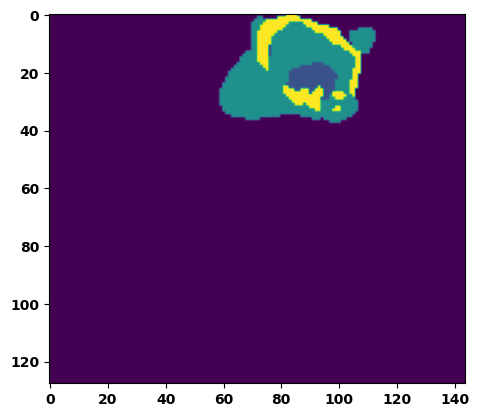

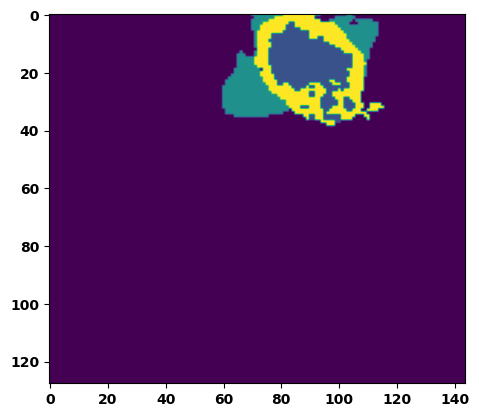

  6%|▌         | 2/36 [00:02<00:40,  1.18s/it]

Batch_id:  1 Eval loss:  0.678912878036499
Batch_id:  1 Eval IoU:  tensor(0.2734, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.15s/it]

Batch_id:  2 Eval loss:  0.7708613872528076
Batch_id:  2 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.12s/it]

Batch_id:  3 Eval loss:  0.4193836450576782
Batch_id:  3 Eval IoU:  tensor(0.5340, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9914, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.09s/it]

Batch_id:  4 Eval loss:  0.32897132635116577
Batch_id:  4 Eval IoU:  tensor(0.5661, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9708, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.13s/it]

Batch_id:  5 Eval loss:  0.7535139322280884
Batch_id:  5 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.09s/it]

Batch_id:  6 Eval loss:  0.6105920076370239
Batch_id:  6 Eval IoU:  tensor(0.3052, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:31,  1.11s/it]

Batch_id:  7 Eval loss:  0.8345465660095215
Batch_id:  7 Eval IoU:  tensor(0.0999, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6479, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3875, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3350, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:30,  1.14s/it]

Batch_id:  8 Eval loss:  0.7499345541000366
Batch_id:  8 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:29,  1.13s/it]

Batch_id:  9 Eval loss:  0.4897550344467163
Batch_id:  9 Eval IoU:  tensor(0.4059, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8934, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8179, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  10 Eval loss:  0.6302775144577026
Batch_id:  10 Eval IoU:  tensor(0.3151, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9770, device='cuda:0')


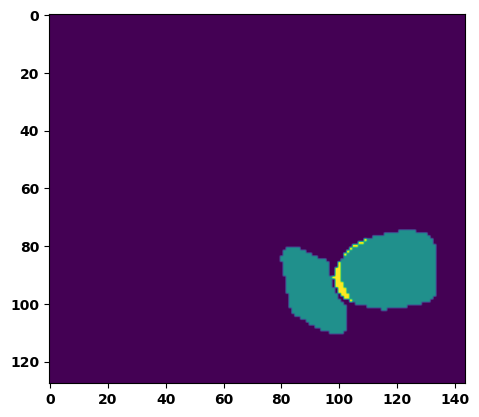

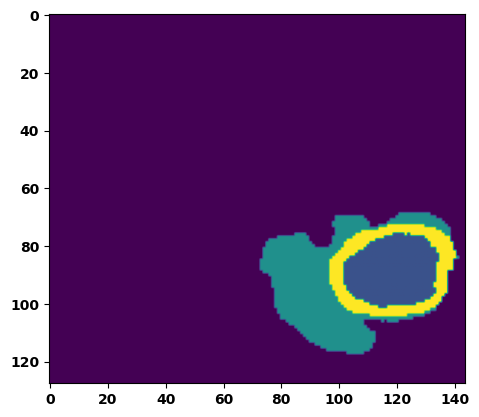

 33%|███▎      | 12/36 [00:13<00:27,  1.13s/it]

Batch_id:  11 Eval loss:  0.7304415106773376
Batch_id:  11 Eval IoU:  tensor(0.1722, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7040, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4553, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8967, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8139, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.6501, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.11s/it]

Batch_id:  12 Eval loss:  0.5533803701400757
Batch_id:  12 Eval IoU:  tensor(0.3629, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9131, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9055, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.8614, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.26629143953323364
Batch_id:  13 Eval IoU:  tensor(0.6612, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9727, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.08s/it]

Batch_id:  14 Eval loss:  0.6522345542907715
Batch_id:  14 Eval IoU:  tensor(0.3018, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8421, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8457, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.7231043577194214
Batch_id:  15 Eval IoU:  tensor(0.2440, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.06s/it]

Batch_id:  16 Eval loss:  0.7717940807342529
Batch_id:  16 Eval IoU:  tensor(0.1471, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6049, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.2984, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.2515, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.09s/it]

Batch_id:  17 Eval loss:  0.6347056031227112
Batch_id:  17 Eval IoU:  tensor(0.3198, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8268, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.11462844908237457
Batch_id:  18 Eval IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9954, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.779584527015686
Batch_id:  19 Eval IoU:  tensor(0.1531, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7467, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5490, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.4935, device='cuda:0')
Batch_id:  20 Eval loss:  0.6419034004211426
Batch_id:  20 Eval IoU:  tensor(0.3029, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9469, device='cuda:0')


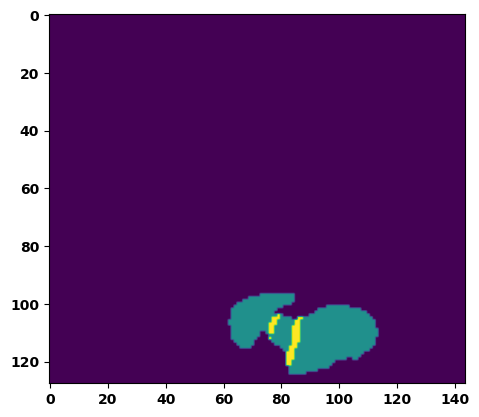

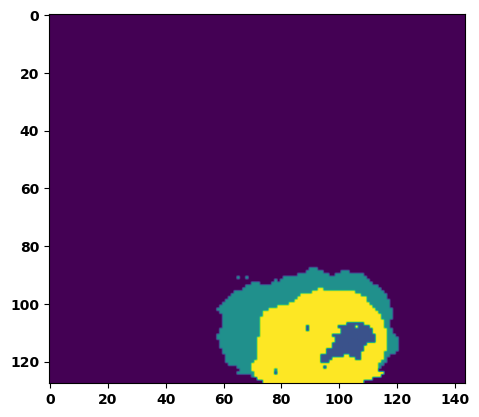

 61%|██████    | 22/36 [00:24<00:16,  1.18s/it]

Batch_id:  21 Eval loss:  0.5066283941268921
Batch_id:  21 Eval IoU:  tensor(0.4529, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.14s/it]

Batch_id:  22 Eval loss:  0.6696196794509888
Batch_id:  22 Eval IoU:  tensor(0.2886, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9126, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8263, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.12s/it]

Batch_id:  23 Eval loss:  0.7305259108543396
Batch_id:  23 Eval IoU:  tensor(0.2527, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9842, device='cuda:0')


 69%|██████▉   | 25/36 [00:28<00:12,  1.16s/it]

Batch_id:  24 Eval loss:  0.7698404788970947
Batch_id:  24 Eval IoU:  tensor(0.1426, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6825, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4585, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.4012, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:11,  1.11s/it]

Batch_id:  25 Eval loss:  0.8533347845077515
Batch_id:  25 Eval IoU:  tensor(0.0823, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6308, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3952, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.2644, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:09,  1.09s/it]

Batch_id:  26 Eval loss:  0.5368748307228088
Batch_id:  26 Eval IoU:  tensor(0.4258, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.06s/it]

Batch_id:  27 Eval loss:  0.8696675300598145
Batch_id:  27 Eval IoU:  tensor(0.0865, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6407, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4550, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8974, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2891, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:07,  1.07s/it]

Batch_id:  28 Eval loss:  0.3412904143333435
Batch_id:  28 Eval IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.12s/it]

Batch_id:  29 Eval loss:  0.7941691279411316
Batch_id:  29 Eval IoU:  tensor(0.1377, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7201, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5084, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.4470, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  30 Eval loss:  0.8158031702041626
Batch_id:  30 Eval IoU:  tensor(0.1071, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5980, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3499, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8600, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.2527, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9297, device='cuda:0')


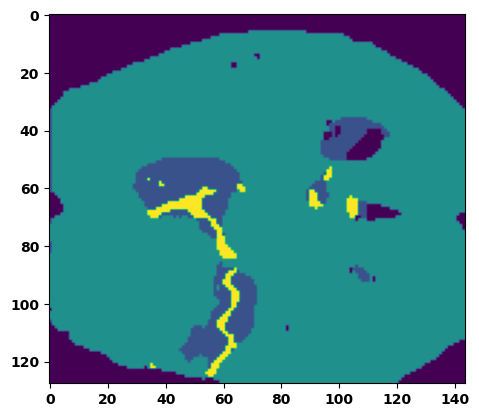

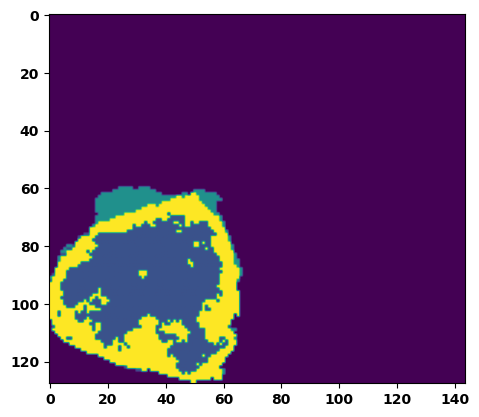

 89%|████████▉ | 32/36 [00:35<00:04,  1.20s/it]

Batch_id:  31 Eval loss:  0.39626777172088623
Batch_id:  31 Eval IoU:  tensor(0.5190, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9815, device='cuda:0')


 92%|█████████▏| 33/36 [00:37<00:03,  1.15s/it]

Batch_id:  32 Eval loss:  0.7890527248382568
Batch_id:  32 Eval IoU:  tensor(0.1305, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6785, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4715, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8838, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.4035, device='cuda:0')


 94%|█████████▍| 34/36 [00:38<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.6956637501716614
Batch_id:  33 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.11s/it]

Batch_id:  34 Eval loss:  0.48637261986732483
Batch_id:  34 Eval IoU:  tensor(0.4217, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8082, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.6234, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.6433, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.12s/it]

Batch_id:  35 Eval loss:  0.6672689914703369
Batch_id:  35 Eval IoU:  tensor(0.2577, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8223, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6722, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.7112, device='cuda:0')
Epoch  4 Training loss:  0.34754042760892345
Epoch  4 Evaluation loss:  0.6235834620893002
Epoch  4 Training accuracy :  tensor(0.6121)
Epoch  4 Evaluation accuracy :  tensor(0.3210)
Epoch  4 Training Mean Dice Score:  tensor(0.9689)
Epoch  4 Eval Mean Dice Score:  tensor(0.8666)
Epoch  4 Training Non-tumor Dice Score:  tensor(0.9590)
Epoch  4 Eval Non-tumor Dice Score:  tensor(0.7853)
Epoch  4 Training NCR/NET Dice Score:  tensor(0.9741)
Epoch  4 Eval NCR/NET Dice Score:  tensor(0.9625)
Epoch  4 Training ED Dice Score:  tensor(0.9580)
Epoch  

Epoch: 5
Training in session: 


  1%|          | 1/110 [00:01<02:02,  1.12s/it]

Batch_id:  0 Training loss:  0.2520419955253601
Batch_id:  0 Training IoU:  tensor(0.7189, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:56,  1.08s/it]

Batch_id:  1 Training loss:  0.28439861536026
Batch_id:  1 Training IoU:  tensor(0.6627, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:55,  1.07s/it]

Batch_id:  2 Training loss:  0.3963320851325989
Batch_id:  2 Training IoU:  tensor(0.4869, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.8802, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9644, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:02,  1.15s/it]

Batch_id:  3 Training loss:  0.3152821362018585
Batch_id:  3 Training IoU:  tensor(0.6634, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.17312388122081757
Batch_id:  4 Training IoU:  tensor(0.7909, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.40567392110824585
Batch_id:  5 Training IoU:  tensor(0.5213, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:58,  1.15s/it]

Batch_id:  6 Training loss:  0.22794802486896515
Batch_id:  6 Training IoU:  tensor(0.7304, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:54,  1.12s/it]

Batch_id:  7 Training loss:  0.34767910838127136
Batch_id:  7 Training IoU:  tensor(0.5336, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.8956, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9397, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:55,  1.15s/it]

Batch_id:  8 Training loss:  0.18552036583423615
Batch_id:  8 Training IoU:  tensor(0.7382, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:55,  1.15s/it]

Batch_id:  9 Training loss:  0.2781563401222229
Batch_id:  9 Training IoU:  tensor(0.6454, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 10%|█         | 11/110 [00:12<01:55,  1.17s/it]

Batch_id:  10 Training loss:  0.21839459240436554
Batch_id:  10 Training IoU:  tensor(0.7420, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 11%|█         | 12/110 [00:13<01:55,  1.18s/it]

Batch_id:  11 Training loss:  0.14055176079273224
Batch_id:  11 Training IoU:  tensor(0.8406, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:51,  1.15s/it]

Batch_id:  12 Training loss:  0.13518425822257996
Batch_id:  12 Training IoU:  tensor(0.8578, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:50,  1.15s/it]

Batch_id:  13 Training loss:  0.3040284216403961
Batch_id:  13 Training IoU:  tensor(0.6315, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:49,  1.15s/it]

Batch_id:  14 Training loss:  0.7177468538284302
Batch_id:  14 Training IoU:  tensor(0.2396, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9148, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.8469, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.8967, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9665, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:52,  1.19s/it]

Batch_id:  15 Training loss:  0.12680158019065857
Batch_id:  15 Training IoU:  tensor(0.8475, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:50,  1.18s/it]

Batch_id:  16 Training loss:  0.17899543046951294
Batch_id:  16 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:44,  1.13s/it]

Batch_id:  17 Training loss:  0.29996252059936523
Batch_id:  17 Training IoU:  tensor(0.6120, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:44,  1.14s/it]

Batch_id:  18 Training loss:  0.6236777305603027
Batch_id:  18 Training IoU:  tensor(0.3210, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9127, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:41,  1.13s/it]

Batch_id:  19 Training loss:  0.19659139215946198
Batch_id:  19 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:40,  1.13s/it]

Batch_id:  20 Training loss:  0.21883489191532135
Batch_id:  20 Training IoU:  tensor(0.7046, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 20%|██        | 22/110 [00:25<01:42,  1.16s/it]

Batch_id:  21 Training loss:  0.4584081172943115
Batch_id:  21 Training IoU:  tensor(0.4800, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 21%|██        | 23/110 [00:26<01:39,  1.14s/it]

Batch_id:  22 Training loss:  0.24765640497207642
Batch_id:  22 Training IoU:  tensor(0.6766, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.23195438086986542
Batch_id:  23 Training IoU:  tensor(0.7254, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:31,  1.07s/it]

Batch_id:  24 Training loss:  0.2419949769973755
Batch_id:  24 Training IoU:  tensor(0.7009, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.3886335492134094
Batch_id:  25 Training IoU:  tensor(0.5820, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:31,  1.10s/it]

Batch_id:  26 Training loss:  0.20440906286239624
Batch_id:  26 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.3500758409500122
Batch_id:  27 Training IoU:  tensor(0.5876, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:29,  1.11s/it]

Batch_id:  28 Training loss:  0.2533924877643585
Batch_id:  28 Training IoU:  tensor(0.6560, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9704, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:28,  1.11s/it]

Batch_id:  29 Training loss:  0.5016469955444336
Batch_id:  29 Training IoU:  tensor(0.4310, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:27,  1.11s/it]

Batch_id:  30 Training loss:  0.1372034251689911
Batch_id:  30 Training IoU:  tensor(0.8203, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:27,  1.13s/it]

Batch_id:  31 Training loss:  0.49354711174964905
Batch_id:  31 Training IoU:  tensor(0.4209, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9029, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 30%|███       | 33/110 [00:37<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.20470412075519562
Batch_id:  32 Training IoU:  tensor(0.7297, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 31%|███       | 34/110 [00:38<01:22,  1.08s/it]

Batch_id:  33 Training loss:  0.4113031327724457
Batch_id:  33 Training IoU:  tensor(0.5423, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:21,  1.09s/it]

Batch_id:  34 Training loss:  0.6193264722824097
Batch_id:  34 Training IoU:  tensor(0.3212, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.8951, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9310, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.34781914949417114
Batch_id:  35 Training IoU:  tensor(0.5530, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:22,  1.13s/it]

Batch_id:  36 Training loss:  0.27234137058258057
Batch_id:  36 Training IoU:  tensor(0.6792, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:21,  1.13s/it]

Batch_id:  37 Training loss:  0.2341836392879486
Batch_id:  37 Training IoU:  tensor(0.6729, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:18,  1.10s/it]

Batch_id:  38 Training loss:  0.2572596073150635
Batch_id:  38 Training IoU:  tensor(0.6911, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:16,  1.09s/it]

Batch_id:  39 Training loss:  0.34050101041793823
Batch_id:  39 Training IoU:  tensor(0.6171, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 37%|███▋      | 41/110 [00:46<01:15,  1.10s/it]

Batch_id:  40 Training loss:  0.12439873814582825
Batch_id:  40 Training IoU:  tensor(0.8413, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.27038639783859253
Batch_id:  41 Training IoU:  tensor(0.6298, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9063, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9612, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:14,  1.12s/it]

Batch_id:  42 Training loss:  0.18010643124580383
Batch_id:  42 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 40%|████      | 44/110 [00:49<01:13,  1.12s/it]

Batch_id:  43 Training loss:  0.13984234631061554
Batch_id:  43 Training IoU:  tensor(0.8706, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 41%|████      | 45/110 [00:50<01:12,  1.12s/it]

Batch_id:  44 Training loss:  0.4014492630958557
Batch_id:  44 Training IoU:  tensor(0.4811, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9541, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:10,  1.11s/it]

Batch_id:  45 Training loss:  0.17530430853366852
Batch_id:  45 Training IoU:  tensor(0.7747, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:09,  1.11s/it]

Batch_id:  46 Training loss:  0.3566490411758423
Batch_id:  46 Training IoU:  tensor(0.5757, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.3493812084197998
Batch_id:  47 Training IoU:  tensor(0.5524, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:07,  1.11s/it]

Batch_id:  48 Training loss:  0.443238228559494
Batch_id:  48 Training IoU:  tensor(0.5376, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 45%|████▌     | 50/110 [00:56<01:06,  1.11s/it]

Batch_id:  49 Training loss:  0.2771502137184143
Batch_id:  49 Training IoU:  tensor(0.6422, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 46%|████▋     | 51/110 [00:57<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.19009539484977722
Batch_id:  50 Training IoU:  tensor(0.7540, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.17890405654907227
Batch_id:  51 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.22788433730602264
Batch_id:  52 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:00,  1.09s/it]

Batch_id:  53 Training loss:  0.37262094020843506
Batch_id:  53 Training IoU:  tensor(0.5956, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 50%|█████     | 55/110 [01:01<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.4485815763473511
Batch_id:  54 Training IoU:  tensor(0.4627, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9675, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:57,  1.07s/it]

Batch_id:  55 Training loss:  0.24727554619312286
Batch_id:  55 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.37877675890922546
Batch_id:  56 Training IoU:  tensor(0.5574, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:55,  1.08s/it]

Batch_id:  57 Training loss:  0.2883800268173218
Batch_id:  57 Training IoU:  tensor(0.6189, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.3897382318973541
Batch_id:  58 Training IoU:  tensor(0.5120, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.20632462203502655
Batch_id:  59 Training IoU:  tensor(0.7049, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9683, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:52,  1.07s/it]

Batch_id:  60 Training loss:  0.2987629175186157
Batch_id:  60 Training IoU:  tensor(0.6244, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.43766599893569946
Batch_id:  61 Training IoU:  tensor(0.4837, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.2811461389064789
Batch_id:  62 Training IoU:  tensor(0.6481, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.5175361633300781
Batch_id:  63 Training IoU:  tensor(0.4072, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.2783753275871277
Batch_id:  64 Training IoU:  tensor(0.6286, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:48,  1.09s/it]

Batch_id:  65 Training loss:  0.5641088485717773
Batch_id:  65 Training IoU:  tensor(0.3801, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:48,  1.13s/it]

Batch_id:  66 Training loss:  0.11043497920036316
Batch_id:  66 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:47,  1.13s/it]

Batch_id:  67 Training loss:  0.15049278736114502
Batch_id:  67 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.2896062731742859
Batch_id:  68 Training IoU:  tensor(0.6281, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.10s/it]

Batch_id:  69 Training loss:  0.14358127117156982
Batch_id:  69 Training IoU:  tensor(0.7929, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:45,  1.17s/it]

Batch_id:  70 Training loss:  0.22792573273181915
Batch_id:  70 Training IoU:  tensor(0.6938, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:43,  1.14s/it]

Batch_id:  71 Training loss:  0.13446782529354095
Batch_id:  71 Training IoU:  tensor(0.8066, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.1635339856147766
Batch_id:  72 Training IoU:  tensor(0.7878, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:40,  1.12s/it]

Batch_id:  73 Training loss:  0.2118658423423767
Batch_id:  73 Training IoU:  tensor(0.7279, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:38,  1.11s/it]

Batch_id:  74 Training loss:  0.20141026377677917
Batch_id:  74 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:38,  1.12s/it]

Batch_id:  75 Training loss:  0.582644522190094
Batch_id:  75 Training IoU:  tensor(0.3469, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:37,  1.13s/it]

Batch_id:  76 Training loss:  0.2639281749725342
Batch_id:  76 Training IoU:  tensor(0.6345, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9770, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.351329505443573
Batch_id:  77 Training IoU:  tensor(0.6205, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.11s/it]

Batch_id:  78 Training loss:  0.23966965079307556
Batch_id:  78 Training IoU:  tensor(0.7485, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 73%|███████▎  | 80/110 [01:29<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.2522347569465637
Batch_id:  79 Training IoU:  tensor(0.7193, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.3030514121055603
Batch_id:  80 Training IoU:  tensor(0.5997, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9694, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:31,  1.13s/it]

Batch_id:  81 Training loss:  0.4178301692008972
Batch_id:  81 Training IoU:  tensor(0.5385, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.5065892934799194
Batch_id:  82 Training IoU:  tensor(0.4093, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.8826, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.2609947919845581
Batch_id:  83 Training IoU:  tensor(0.6577, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9316, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9217, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:27,  1.12s/it]

Batch_id:  84 Training loss:  0.19177377223968506
Batch_id:  84 Training IoU:  tensor(0.7241, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.2093772143125534
Batch_id:  85 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:26,  1.13s/it]

Batch_id:  86 Training loss:  0.24363134801387787
Batch_id:  86 Training IoU:  tensor(0.6896, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 80%|████████  | 88/110 [01:38<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.2043844759464264
Batch_id:  87 Training IoU:  tensor(0.7355, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 81%|████████  | 89/110 [01:39<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.3952717185020447
Batch_id:  88 Training IoU:  tensor(0.5618, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9388, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.27994757890701294
Batch_id:  89 Training IoU:  tensor(0.6576, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:20,  1.09s/it]

Batch_id:  90 Training loss:  0.25446030497550964
Batch_id:  90 Training IoU:  tensor(0.6794, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.4758531451225281
Batch_id:  91 Training IoU:  tensor(0.4456, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.08s/it]

Batch_id:  92 Training loss:  0.6512422561645508
Batch_id:  92 Training IoU:  tensor(0.2934, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9145, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.5380539298057556
Batch_id:  93 Training IoU:  tensor(0.4080, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.3533968925476074
Batch_id:  94 Training IoU:  tensor(0.5606, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.184264674782753
Batch_id:  95 Training IoU:  tensor(0.7666, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.2538556754589081
Batch_id:  96 Training IoU:  tensor(0.6975, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.23370076715946198
Batch_id:  97 Training IoU:  tensor(0.7157, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.3376593589782715
Batch_id:  98 Training IoU:  tensor(0.6301, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.2223508208990097
Batch_id:  99 Training IoU:  tensor(0.7540, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 92%|█████████▏| 101/110 [01:52<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.23583614826202393
Batch_id:  100 Training IoU:  tensor(0.6967, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9723, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.2705145478248596
Batch_id:  101 Training IoU:  tensor(0.7518, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.11s/it]

Batch_id:  102 Training loss:  0.2520223557949066
Batch_id:  102 Training IoU:  tensor(0.6453, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.408316433429718
Batch_id:  103 Training IoU:  tensor(0.5137, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.08s/it]

Batch_id:  104 Training loss:  0.2138245850801468
Batch_id:  104 Training IoU:  tensor(0.6947, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.07s/it]

Batch_id:  105 Training loss:  0.25603556632995605
Batch_id:  105 Training IoU:  tensor(0.6599, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.08s/it]

Batch_id:  106 Training loss:  0.2938705086708069
Batch_id:  106 Training IoU:  tensor(0.6373, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.06s/it]

Batch_id:  107 Training loss:  0.3436122238636017
Batch_id:  107 Training IoU:  tensor(0.6338, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.05s/it]

Batch_id:  108 Training loss:  0.2647225856781006
Batch_id:  108 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.20294663310050964
Batch_id:  109 Training IoU:  tensor(0.7704, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9940, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5338287353515625
Batch_id:  0 Eval IoU:  tensor(0.4404, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


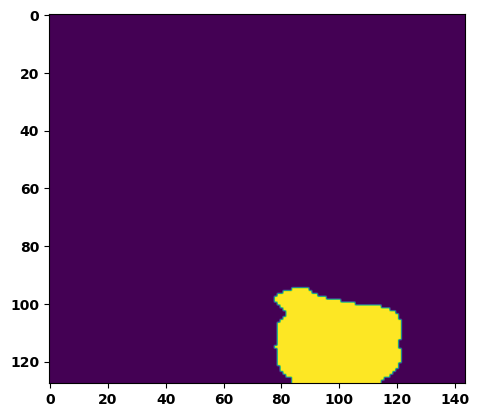

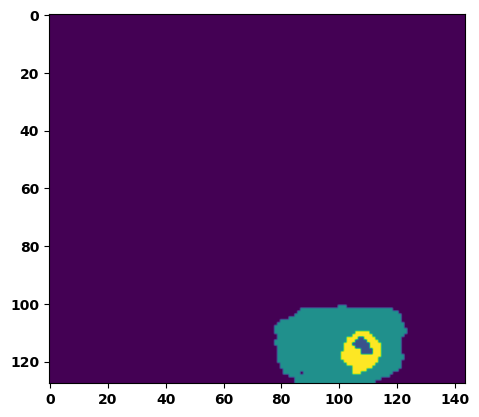

  6%|▌         | 2/36 [00:02<00:37,  1.11s/it]

Batch_id:  1 Eval loss:  0.23384495079517365
Batch_id:  1 Eval IoU:  tensor(0.6757, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9813, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.15s/it]

Batch_id:  2 Eval loss:  0.7597790360450745
Batch_id:  2 Eval IoU:  tensor(0.2243, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8974, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.13s/it]

Batch_id:  3 Eval loss:  0.5400420427322388
Batch_id:  3 Eval IoU:  tensor(0.3378, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8043, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6347, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.6309, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9795, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:36,  1.18s/it]

Batch_id:  4 Eval loss:  0.7195722460746765
Batch_id:  4 Eval IoU:  tensor(0.2512, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:34,  1.15s/it]

Batch_id:  5 Eval loss:  0.7644608020782471
Batch_id:  5 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 19%|█▉        | 7/36 [00:08<00:32,  1.13s/it]

Batch_id:  6 Eval loss:  0.595088005065918
Batch_id:  6 Eval IoU:  tensor(0.3370, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9726, device='cuda:0')


 22%|██▏       | 8/36 [00:09<00:30,  1.09s/it]

Batch_id:  7 Eval loss:  0.7457857131958008
Batch_id:  7 Eval IoU:  tensor(0.2309, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8850, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.9192602634429932
Batch_id:  8 Eval IoU:  tensor(0.0473, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5770, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3282, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8293, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2290, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:28,  1.08s/it]

Batch_id:  9 Eval loss:  0.7605925798416138
Batch_id:  9 Eval IoU:  tensor(0.2246, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  10 Eval loss:  0.49773266911506653
Batch_id:  10 Eval IoU:  tensor(0.4260, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


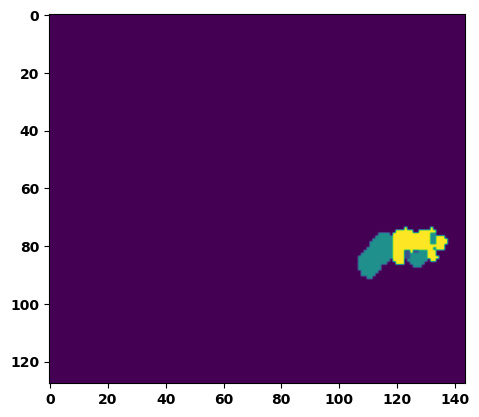

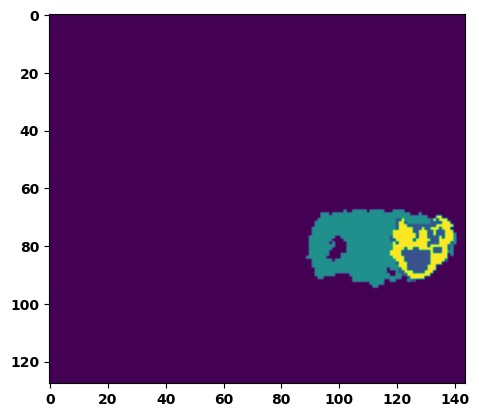

 33%|███▎      | 12/36 [00:13<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.29655587673187256
Batch_id:  11 Eval IoU:  tensor(0.6054, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9585, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.11s/it]

Batch_id:  12 Eval loss:  0.7483415007591248
Batch_id:  12 Eval IoU:  tensor(0.2252, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8610, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8820, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9852, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.09s/it]

Batch_id:  13 Eval loss:  0.33830350637435913
Batch_id:  13 Eval IoU:  tensor(0.6589, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.11s/it]

Batch_id:  14 Eval loss:  0.6189320087432861
Batch_id:  14 Eval IoU:  tensor(0.3201, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9104, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.11s/it]

Batch_id:  15 Eval loss:  0.7691885232925415
Batch_id:  15 Eval IoU:  tensor(0.1435, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6270, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3912, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.2804, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9233, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:21,  1.11s/it]

Batch_id:  16 Eval loss:  0.11589884757995605
Batch_id:  16 Eval IoU:  tensor(0.8329, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 50%|█████     | 18/36 [00:20<00:20,  1.16s/it]

Batch_id:  17 Eval loss:  0.40868115425109863
Batch_id:  17 Eval IoU:  tensor(0.5277, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9874, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:19,  1.12s/it]

Batch_id:  18 Eval loss:  0.7461940050125122
Batch_id:  18 Eval IoU:  tensor(0.2344, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9025, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.08s/it]

Batch_id:  19 Eval loss:  0.730363130569458
Batch_id:  19 Eval IoU:  tensor(0.1987, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7912, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.6372, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.5840, device='cuda:0')
Batch_id:  20 Eval loss:  0.5752249956130981
Batch_id:  20 Eval IoU:  tensor(0.3241, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7912, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.6265, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.6240, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


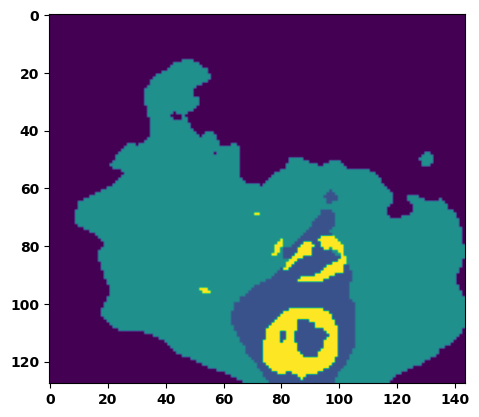

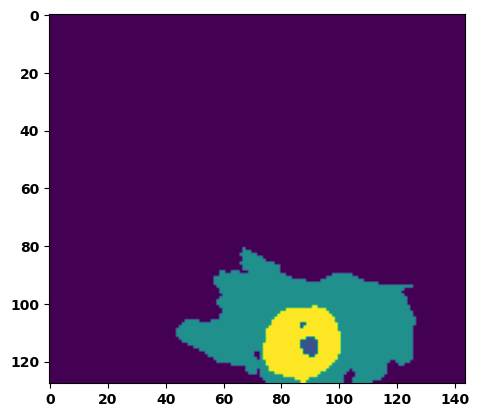

 61%|██████    | 22/36 [00:24<00:15,  1.14s/it]

Batch_id:  21 Eval loss:  0.6517479419708252
Batch_id:  21 Eval IoU:  tensor(0.2272, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7075, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4750, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9155, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9299, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.5098, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.12s/it]

Batch_id:  22 Eval loss:  0.7297546863555908
Batch_id:  22 Eval IoU:  tensor(0.2376, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8954, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9612, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.3076545000076294
Batch_id:  23 Eval IoU:  tensor(0.6741, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 69%|██████▉   | 25/36 [00:28<00:12,  1.11s/it]

Batch_id:  24 Eval loss:  0.7542091012001038
Batch_id:  24 Eval IoU:  tensor(0.2362, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 72%|███████▏  | 26/36 [00:29<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.7538045048713684
Batch_id:  25 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.7505125999450684
Batch_id:  26 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.7765047550201416
Batch_id:  27 Eval IoU:  tensor(0.1556, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7481, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5648, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.4988, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:07,  1.10s/it]

Batch_id:  28 Eval loss:  0.7169673442840576
Batch_id:  28 Eval IoU:  tensor(0.2614, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8162, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.08s/it]

Batch_id:  29 Eval loss:  0.6182042360305786
Batch_id:  29 Eval IoU:  tensor(0.3256, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8297, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')
Batch_id:  30 Eval loss:  0.7920072674751282
Batch_id:  30 Eval IoU:  tensor(0.1350, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6440, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4428, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8208, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.3888, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9235, device='cuda:0')


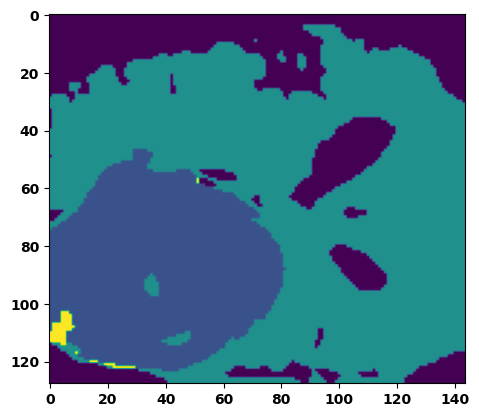

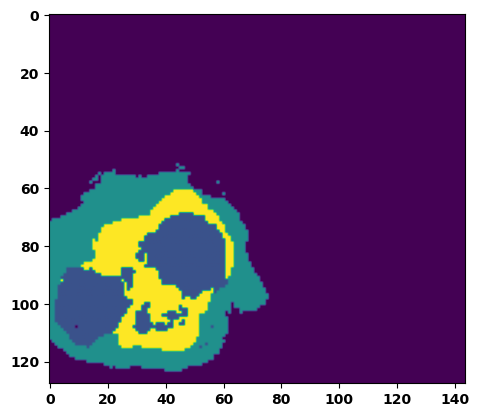

 89%|████████▉ | 32/36 [00:35<00:04,  1.12s/it]

Batch_id:  31 Eval loss:  0.7383725643157959
Batch_id:  31 Eval IoU:  tensor(0.1633, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6737, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4603, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.5833, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8536, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.7975, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.10s/it]

Batch_id:  32 Eval loss:  0.6266307234764099
Batch_id:  32 Eval IoU:  tensor(0.3181, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9051, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8161, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.12s/it]

Batch_id:  33 Eval loss:  0.8205062747001648
Batch_id:  33 Eval IoU:  tensor(0.1059, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5988, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.2501, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8573, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.3319, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.07s/it]

Batch_id:  34 Eval loss:  0.76192307472229
Batch_id:  34 Eval IoU:  tensor(0.1556, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6211, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3004, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.7945, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.4950, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.11s/it]

Batch_id:  35 Eval loss:  0.7736747860908508
Batch_id:  35 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Epoch  5 Training loss:  0.2984535144134001
Epoch  5 Evaluation loss:  0.638615137586991
Epoch  5 Training accuracy :  tensor(0.6408)
Epoch  5 Evaluation accuracy :  tensor(0.3103)
Epoch  5 Training Mean Dice Score:  tensor(0.9732)
Epoch  5 Eval Mean Dice Score:  tensor(0.8738)
Epoch  5 Training Non-tumor Dice Score:  tensor(0.9654)
Epoch  5 Eval Non-tumor Dice Score:  tensor(0.7940)
Epoch  5 Training NCR/NET Dice Score:  tensor(0.9786)
Epoch  5 Eval NCR/NET Dice Score:  tensor(0.9445)
Epoch  5 Training ED Dice Score:  tensor(0.9631)
Epoch  5 

Epoch: 6
Training in session: 


  1%|          | 1/110 [00:01<02:03,  1.13s/it]

Batch_id:  0 Training loss:  0.37360507249832153
Batch_id:  0 Training IoU:  tensor(0.5711, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:02,  1.13s/it]

Batch_id:  1 Training loss:  0.37797418236732483
Batch_id:  1 Training IoU:  tensor(0.5474, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.11s/it]

Batch_id:  2 Training loss:  0.14535841345787048
Batch_id:  2 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:55,  1.09s/it]

Batch_id:  3 Training loss:  0.1249910444021225
Batch_id:  3 Training IoU:  tensor(0.8300, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.07s/it]

Batch_id:  4 Training loss:  0.3656369149684906
Batch_id:  4 Training IoU:  tensor(0.5940, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.1673387736082077
Batch_id:  5 Training IoU:  tensor(0.7960, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.19313734769821167
Batch_id:  6 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:50,  1.09s/it]

Batch_id:  7 Training loss:  0.5410276055335999
Batch_id:  7 Training IoU:  tensor(0.4033, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9265, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:50,  1.10s/it]

Batch_id:  8 Training loss:  0.21936553716659546
Batch_id:  8 Training IoU:  tensor(0.6997, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.14827151596546173
Batch_id:  9 Training IoU:  tensor(0.8104, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 10%|█         | 11/110 [00:12<01:49,  1.10s/it]

Batch_id:  10 Training loss:  0.39794886112213135
Batch_id:  10 Training IoU:  tensor(0.5439, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.12s/it]

Batch_id:  11 Training loss:  0.3656612038612366
Batch_id:  11 Training IoU:  tensor(0.5893, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:48,  1.12s/it]

Batch_id:  12 Training loss:  0.16892844438552856
Batch_id:  12 Training IoU:  tensor(0.7441, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:47,  1.12s/it]

Batch_id:  13 Training loss:  0.21231316030025482
Batch_id:  13 Training IoU:  tensor(0.7514, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.23391276597976685
Batch_id:  14 Training IoU:  tensor(0.6723, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:41,  1.08s/it]

Batch_id:  15 Training loss:  0.24975556135177612
Batch_id:  15 Training IoU:  tensor(0.6482, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9261, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:41,  1.09s/it]

Batch_id:  16 Training loss:  0.3502163290977478
Batch_id:  16 Training IoU:  tensor(0.5342, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9658, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.08s/it]

Batch_id:  17 Training loss:  0.2646544575691223
Batch_id:  17 Training IoU:  tensor(0.7182, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:36,  1.06s/it]

Batch_id:  18 Training loss:  0.2555951476097107
Batch_id:  18 Training IoU:  tensor(0.6662, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:35,  1.06s/it]

Batch_id:  19 Training loss:  0.3457413613796234
Batch_id:  19 Training IoU:  tensor(0.5450, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.3712407350540161
Batch_id:  20 Training IoU:  tensor(0.5205, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9651, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.06s/it]

Batch_id:  21 Training loss:  0.260384738445282
Batch_id:  21 Training IoU:  tensor(0.6431, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 21%|██        | 23/110 [00:25<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.15659575164318085
Batch_id:  22 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.07s/it]

Batch_id:  23 Training loss:  0.2191402167081833
Batch_id:  23 Training IoU:  tensor(0.6965, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.08s/it]

Batch_id:  24 Training loss:  0.6369537115097046
Batch_id:  24 Training IoU:  tensor(0.2933, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.8317, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:32,  1.10s/it]

Batch_id:  25 Training loss:  0.3301934003829956
Batch_id:  25 Training IoU:  tensor(0.5822, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:32,  1.12s/it]

Batch_id:  26 Training loss:  0.5499473810195923
Batch_id:  26 Training IoU:  tensor(0.3699, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.8852, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:32,  1.13s/it]

Batch_id:  27 Training loss:  0.48913827538490295
Batch_id:  27 Training IoU:  tensor(0.4483, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.3095030188560486
Batch_id:  28 Training IoU:  tensor(0.6167, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:30,  1.13s/it]

Batch_id:  29 Training loss:  0.23291440308094025
Batch_id:  29 Training IoU:  tensor(0.6762, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:30,  1.14s/it]

Batch_id:  30 Training loss:  0.42572468519210815
Batch_id:  30 Training IoU:  tensor(0.5229, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:27,  1.12s/it]

Batch_id:  31 Training loss:  0.3036797344684601
Batch_id:  31 Training IoU:  tensor(0.6013, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.8993, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 30%|███       | 33/110 [00:36<01:23,  1.09s/it]

Batch_id:  32 Training loss:  0.3228309750556946
Batch_id:  32 Training IoU:  tensor(0.6237, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.341854989528656
Batch_id:  33 Training IoU:  tensor(0.5742, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.1361301690340042
Batch_id:  34 Training IoU:  tensor(0.8072, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.35990726947784424
Batch_id:  35 Training IoU:  tensor(0.5756, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:17,  1.06s/it]

Batch_id:  36 Training loss:  0.22122696042060852
Batch_id:  36 Training IoU:  tensor(0.6859, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.5956066846847534
Batch_id:  37 Training IoU:  tensor(0.3480, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9046, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:21,  1.15s/it]

Batch_id:  38 Training loss:  0.11426177620887756
Batch_id:  38 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.22893570363521576
Batch_id:  39 Training IoU:  tensor(0.7285, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:15,  1.10s/it]

Batch_id:  40 Training loss:  0.7077256441116333
Batch_id:  40 Training IoU:  tensor(0.2473, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9221, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.8561, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.37747567892074585
Batch_id:  41 Training IoU:  tensor(0.5671, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.503641664981842
Batch_id:  42 Training IoU:  tensor(0.4488, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.177057147026062
Batch_id:  43 Training IoU:  tensor(0.7680, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.1248849630355835
Batch_id:  44 Training IoU:  tensor(0.8269, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.2764388918876648
Batch_id:  45 Training IoU:  tensor(0.6480, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.08s/it]

Batch_id:  46 Training loss:  0.2894741892814636
Batch_id:  46 Training IoU:  tensor(0.6171, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:07,  1.08s/it]

Batch_id:  47 Training loss:  0.2012161761522293
Batch_id:  47 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:07,  1.10s/it]

Batch_id:  48 Training loss:  0.2708885073661804
Batch_id:  48 Training IoU:  tensor(0.6907, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:06,  1.12s/it]

Batch_id:  49 Training loss:  0.31781455874443054
Batch_id:  49 Training IoU:  tensor(0.6173, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:05,  1.10s/it]

Batch_id:  50 Training loss:  0.3585652709007263
Batch_id:  50 Training IoU:  tensor(0.6013, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:04,  1.10s/it]

Batch_id:  51 Training loss:  0.547714114189148
Batch_id:  51 Training IoU:  tensor(0.3636, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.8935, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.8945, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:03,  1.12s/it]

Batch_id:  52 Training loss:  0.15877920389175415
Batch_id:  52 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.14144980907440186
Batch_id:  53 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.2830922305583954
Batch_id:  54 Training IoU:  tensor(0.6764, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.23462684452533722
Batch_id:  55 Training IoU:  tensor(0.6818, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.17873625457286835
Batch_id:  56 Training IoU:  tensor(0.7655, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.22199362516403198
Batch_id:  57 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.5198075175285339
Batch_id:  58 Training IoU:  tensor(0.3926, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9123, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9520, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.23382917046546936
Batch_id:  59 Training IoU:  tensor(0.7005, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.12s/it]

Batch_id:  60 Training loss:  0.17857757210731506
Batch_id:  60 Training IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:53,  1.12s/it]

Batch_id:  61 Training loss:  0.6126793026924133
Batch_id:  61 Training IoU:  tensor(0.3240, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9131, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.269467294216156
Batch_id:  62 Training IoU:  tensor(0.6165, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.09s/it]

Batch_id:  63 Training loss:  0.28480833768844604
Batch_id:  63 Training IoU:  tensor(0.6536, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.14482589066028595
Batch_id:  64 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.15038590133190155
Batch_id:  65 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.1257322132587433
Batch_id:  66 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.3288561701774597
Batch_id:  67 Training IoU:  tensor(0.5651, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.2060183733701706
Batch_id:  68 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:44,  1.11s/it]

Batch_id:  69 Training loss:  0.19734430313110352
Batch_id:  69 Training IoU:  tensor(0.7089, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:43,  1.10s/it]

Batch_id:  70 Training loss:  0.274783730506897
Batch_id:  70 Training IoU:  tensor(0.6243, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.19285786151885986
Batch_id:  71 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:39,  1.08s/it]

Batch_id:  72 Training loss:  0.18899187445640564
Batch_id:  72 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.1593444049358368
Batch_id:  73 Training IoU:  tensor(0.7900, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.2881878614425659
Batch_id:  74 Training IoU:  tensor(0.6046, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.33797478675842285
Batch_id:  75 Training IoU:  tensor(0.5576, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.1893823742866516
Batch_id:  76 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.3111903667449951
Batch_id:  77 Training IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.14874714612960815
Batch_id:  78 Training IoU:  tensor(0.7707, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:31,  1.07s/it]

Batch_id:  79 Training loss:  0.11638034880161285
Batch_id:  79 Training IoU:  tensor(0.8196, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.23993687331676483
Batch_id:  80 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.18837390840053558
Batch_id:  81 Training IoU:  tensor(0.7246, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.08s/it]

Batch_id:  82 Training loss:  0.20740331709384918
Batch_id:  82 Training IoU:  tensor(0.7159, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.2021896243095398
Batch_id:  83 Training IoU:  tensor(0.7203, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.11s/it]

Batch_id:  84 Training loss:  0.13201089203357697
Batch_id:  84 Training IoU:  tensor(0.7975, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:26,  1.12s/it]

Batch_id:  85 Training loss:  0.08891218900680542
Batch_id:  85 Training IoU:  tensor(0.8687, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.17423275113105774
Batch_id:  86 Training IoU:  tensor(0.7375, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.10s/it]

Batch_id:  87 Training loss:  0.2350655496120453
Batch_id:  87 Training IoU:  tensor(0.6754, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.3046131134033203
Batch_id:  88 Training IoU:  tensor(0.5870, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.12s/it]

Batch_id:  89 Training loss:  0.10024234652519226
Batch_id:  89 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.13s/it]

Batch_id:  90 Training loss:  0.12501755356788635
Batch_id:  90 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.2344011813402176
Batch_id:  91 Training IoU:  tensor(0.6547, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:19,  1.13s/it]

Batch_id:  92 Training loss:  0.19532783329486847
Batch_id:  92 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.12s/it]

Batch_id:  93 Training loss:  0.24598509073257446
Batch_id:  93 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.13s/it]

Batch_id:  94 Training loss:  0.4132956564426422
Batch_id:  94 Training IoU:  tensor(0.4915, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:16,  1.15s/it]

Batch_id:  95 Training loss:  0.4317251145839691
Batch_id:  95 Training IoU:  tensor(0.5128, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.21799424290657043
Batch_id:  96 Training IoU:  tensor(0.6752, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9692, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.24822863936424255
Batch_id:  97 Training IoU:  tensor(0.7052, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.13705793023109436
Batch_id:  98 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.1611863672733307
Batch_id:  99 Training IoU:  tensor(0.7494, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9707, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.16210085153579712
Batch_id:  100 Training IoU:  tensor(0.7654, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.17709900438785553
Batch_id:  101 Training IoU:  tensor(0.7520, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.36076757311820984
Batch_id:  102 Training IoU:  tensor(0.5880, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.1591314673423767
Batch_id:  103 Training IoU:  tensor(0.7579, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.07s/it]

Batch_id:  104 Training loss:  0.19673806428909302
Batch_id:  104 Training IoU:  tensor(0.7268, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.28523993492126465
Batch_id:  105 Training IoU:  tensor(0.5924, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9170, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9551, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.06s/it]

Batch_id:  106 Training loss:  0.40009450912475586
Batch_id:  106 Training IoU:  tensor(0.5438, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.5484514236450195
Batch_id:  107 Training IoU:  tensor(0.3800, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9145, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.21408312022686005
Batch_id:  108 Training IoU:  tensor(0.6982, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.1301427185535431
Batch_id:  109 Training IoU:  tensor(0.8002, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9817, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7733132243156433
Batch_id:  0 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


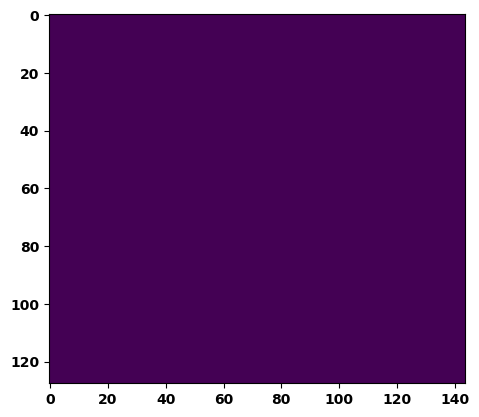

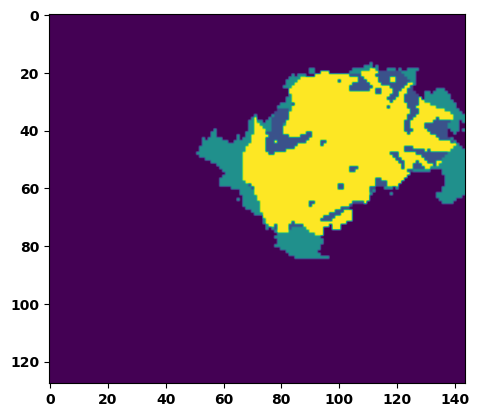

  6%|▌         | 2/36 [00:02<00:38,  1.14s/it]

Batch_id:  1 Eval loss:  0.33885905146598816
Batch_id:  1 Eval IoU:  tensor(0.5416, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9700, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:38,  1.16s/it]

Batch_id:  2 Eval loss:  0.3757671117782593
Batch_id:  2 Eval IoU:  tensor(0.5648, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.11s/it]

Batch_id:  3 Eval loss:  0.615513026714325
Batch_id:  3 Eval IoU:  tensor(0.3178, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9128, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9782, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.8073182106018066
Batch_id:  4 Eval IoU:  tensor(0.1257, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.7058, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4672, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.4176, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.32687121629714966
Batch_id:  5 Eval IoU:  tensor(0.6518, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9912, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.08s/it]

Batch_id:  6 Eval loss:  0.7535030841827393
Batch_id:  6 Eval IoU:  tensor(0.2237, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8951, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.07s/it]

Batch_id:  7 Eval loss:  0.6309888362884521
Batch_id:  7 Eval IoU:  tensor(0.3152, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9724, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.7883208394050598
Batch_id:  8 Eval IoU:  tensor(0.1438, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7169, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4793, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8580, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.5767, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.34031933546066284
Batch_id:  9 Eval IoU:  tensor(0.5841, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  10 Eval loss:  0.8388392925262451
Batch_id:  10 Eval IoU:  tensor(0.0972, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6424, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4085, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.7849, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.4981, device='cuda:0')


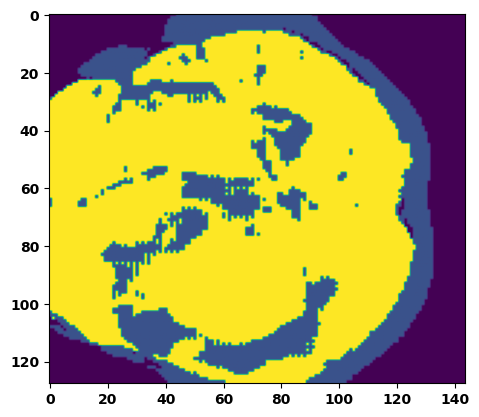

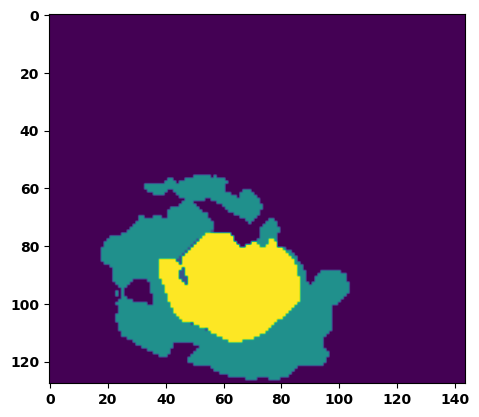

 33%|███▎      | 12/36 [00:13<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.8210298418998718
Batch_id:  11 Eval IoU:  tensor(0.1183, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6873, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4755, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.7841, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8727, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.6169, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.7096685171127319
Batch_id:  12 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7941, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6542, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.5919, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9452, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.6517917513847351
Batch_id:  13 Eval IoU:  tensor(0.3017, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9846, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.7505925893783569
Batch_id:  14 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.12s/it]

Batch_id:  15 Eval loss:  0.5987259149551392
Batch_id:  15 Eval IoU:  tensor(0.3284, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9034, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8880, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8325, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9539, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.3984885811805725
Batch_id:  16 Eval IoU:  tensor(0.5918, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:20,  1.13s/it]

Batch_id:  17 Eval loss:  0.641549825668335
Batch_id:  17 Eval IoU:  tensor(0.2965, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8487, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:19,  1.12s/it]

Batch_id:  18 Eval loss:  0.19896915555000305
Batch_id:  18 Eval IoU:  tensor(0.7281, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:18,  1.16s/it]

Batch_id:  19 Eval loss:  0.7644360661506653
Batch_id:  19 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  20 Eval loss:  0.8289133906364441
Batch_id:  20 Eval IoU:  tensor(0.0990, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6217, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3187, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.8536, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3585, device='cuda:0')


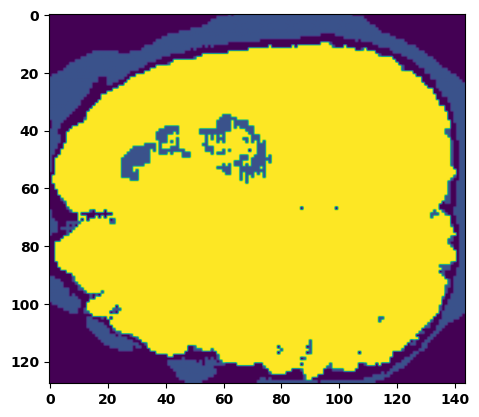

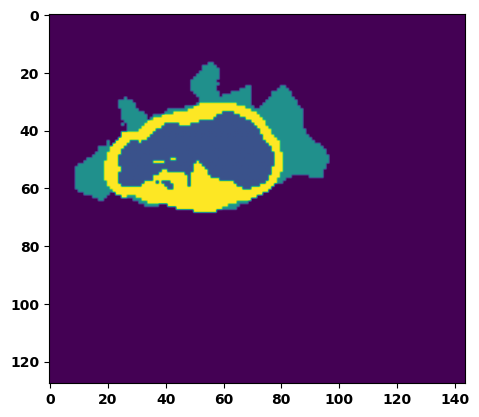

 61%|██████    | 22/36 [00:24<00:16,  1.16s/it]

Batch_id:  21 Eval loss:  0.7713913321495056
Batch_id:  21 Eval IoU:  tensor(0.1344, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7068, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.5272, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.4386, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:15,  1.16s/it]

Batch_id:  22 Eval loss:  0.32759326696395874
Batch_id:  22 Eval IoU:  tensor(0.6765, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9968, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.14s/it]

Batch_id:  23 Eval loss:  0.8239745497703552
Batch_id:  23 Eval IoU:  tensor(0.1083, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.6534, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4041, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3811, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.10s/it]

Batch_id:  24 Eval loss:  0.7492544651031494
Batch_id:  24 Eval IoU:  tensor(0.1761, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6147, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.2932, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2772, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.10s/it]

Batch_id:  25 Eval loss:  0.4789097309112549
Batch_id:  25 Eval IoU:  tensor(0.4287, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8169, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.6622, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.6481, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:10,  1.14s/it]

Batch_id:  26 Eval loss:  0.40919241309165955
Batch_id:  26 Eval IoU:  tensor(0.4937, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9439, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.09s/it]

Batch_id:  27 Eval loss:  0.7615106701850891
Batch_id:  27 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8966, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:08,  1.19s/it]

Batch_id:  28 Eval loss:  0.1338634341955185
Batch_id:  28 Eval IoU:  tensor(0.8111, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9941, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.15s/it]

Batch_id:  29 Eval loss:  0.6697368621826172
Batch_id:  29 Eval IoU:  tensor(0.2810, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9149, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  30 Eval loss:  0.6908122301101685
Batch_id:  30 Eval IoU:  tensor(0.2438, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8459, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.7857, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9186, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.6994, device='cuda:0')


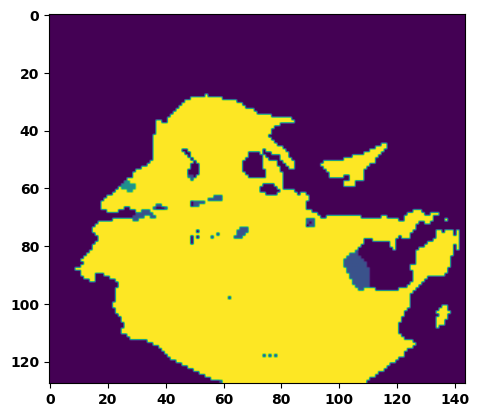

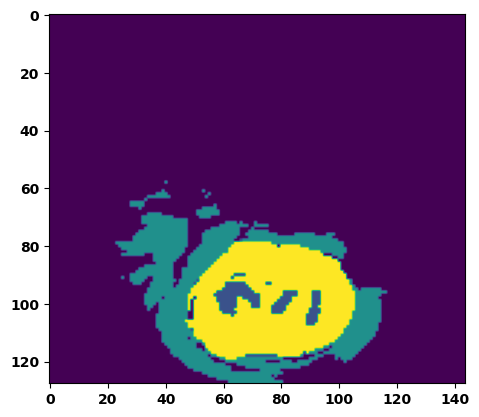

 89%|████████▉ | 32/36 [00:36<00:04,  1.23s/it]

Batch_id:  31 Eval loss:  0.6785851120948792
Batch_id:  31 Eval IoU:  tensor(0.2168, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7037, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5279, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.4533, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9295, device='cuda:0')


 92%|█████████▏| 33/36 [00:37<00:03,  1.17s/it]

Batch_id:  32 Eval loss:  0.7536631226539612
Batch_id:  32 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 94%|█████████▍| 34/36 [00:38<00:02,  1.15s/it]

Batch_id:  33 Eval loss:  0.7419692277908325
Batch_id:  33 Eval IoU:  tensor(0.2327, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8573, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8783, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.15s/it]

Batch_id:  34 Eval loss:  0.8774259090423584
Batch_id:  34 Eval IoU:  tensor(0.0794, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6293, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4324, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8935, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.2697, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.13s/it]

Batch_id:  35 Eval loss:  0.40537554025650024
Batch_id:  35 Eval IoU:  tensor(0.5205, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')
Epoch 00007: reducing learning rate of group 0 to 5.0000e-04.
Epoch  6 Training loss:  0.2714218245311217
Epoch  6 Evaluation loss:  0.6174176869293054
Epoch  6 Training accuracy :  tensor(0.6576)
Epoch  6 Evaluation accuracy :  tensor(0.3271)
Epoch  6 Training Mean Dice Score:  tensor(0.9745)
Epoch  6 Eval Mean Dice Score:  tensor(0.8657)
Epoch  6 Training Non-tumor Dice Score:  tensor(0.9665)
Epoch  6 Eval Non-tumor Dice Score:  tensor(0.7759)
Epoch  6 Training NCR/NET Dice Score:  tensor(0.9799)
Epoch  6 Eval NCR/NET Dice Score:  tensor(0.

Epoch: 7
Training in session: 


  1%|          | 1/110 [00:01<01:57,  1.08s/it]

Batch_id:  0 Training loss:  0.6061674356460571
Batch_id:  0 Training IoU:  tensor(0.3307, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:59,  1.10s/it]

Batch_id:  1 Training loss:  0.1589062362909317
Batch_id:  1 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.16267982125282288
Batch_id:  2 Training IoU:  tensor(0.7475, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:57,  1.11s/it]

Batch_id:  3 Training loss:  0.3513542413711548
Batch_id:  3 Training IoU:  tensor(0.5945, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.085026815533638
Batch_id:  4 Training IoU:  tensor(0.8737, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.11s/it]

Batch_id:  5 Training loss:  0.20690660178661346
Batch_id:  5 Training IoU:  tensor(0.7151, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.11s/it]

Batch_id:  6 Training loss:  0.35849592089653015
Batch_id:  6 Training IoU:  tensor(0.5895, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:53,  1.11s/it]

Batch_id:  7 Training loss:  0.12179887294769287
Batch_id:  7 Training IoU:  tensor(0.8114, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:54,  1.14s/it]

Batch_id:  8 Training loss:  0.1361442506313324
Batch_id:  8 Training IoU:  tensor(0.8014, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:55,  1.15s/it]

Batch_id:  9 Training loss:  0.1935640275478363
Batch_id:  9 Training IoU:  tensor(0.7429, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 10%|█         | 11/110 [00:12<01:54,  1.16s/it]

Batch_id:  10 Training loss:  0.1536080688238144
Batch_id:  10 Training IoU:  tensor(0.8145, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 11%|█         | 12/110 [00:13<01:53,  1.15s/it]

Batch_id:  11 Training loss:  0.17937961220741272
Batch_id:  11 Training IoU:  tensor(0.7374, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:50,  1.14s/it]

Batch_id:  12 Training loss:  0.2554575204849243
Batch_id:  12 Training IoU:  tensor(0.6403, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:49,  1.14s/it]

Batch_id:  13 Training loss:  0.3810204267501831
Batch_id:  13 Training IoU:  tensor(0.5702, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:53,  1.19s/it]

Batch_id:  14 Training loss:  0.10732384026050568
Batch_id:  14 Training IoU:  tensor(0.8376, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:51,  1.19s/it]

Batch_id:  15 Training loss:  0.06497271358966827
Batch_id:  15 Training IoU:  tensor(0.9050, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:47,  1.16s/it]

Batch_id:  16 Training loss:  0.08948680758476257
Batch_id:  16 Training IoU:  tensor(0.8678, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:46,  1.15s/it]

Batch_id:  17 Training loss:  0.350663959980011
Batch_id:  17 Training IoU:  tensor(0.5962, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:44,  1.15s/it]

Batch_id:  18 Training loss:  0.22473667562007904
Batch_id:  18 Training IoU:  tensor(0.7101, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:43,  1.15s/it]

Batch_id:  19 Training loss:  0.37659236788749695
Batch_id:  19 Training IoU:  tensor(0.5943, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 19%|█▉        | 21/110 [00:24<01:43,  1.16s/it]

Batch_id:  20 Training loss:  0.15281009674072266
Batch_id:  20 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 20%|██        | 22/110 [00:25<01:42,  1.17s/it]

Batch_id:  21 Training loss:  0.1774883270263672
Batch_id:  21 Training IoU:  tensor(0.7343, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 21%|██        | 23/110 [00:26<01:41,  1.16s/it]

Batch_id:  22 Training loss:  0.11960145831108093
Batch_id:  22 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:37,  1.13s/it]

Batch_id:  23 Training loss:  0.3015443980693817
Batch_id:  23 Training IoU:  tensor(0.6072, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:34,  1.12s/it]

Batch_id:  24 Training loss:  0.2169574797153473
Batch_id:  24 Training IoU:  tensor(0.6870, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:32,  1.11s/it]

Batch_id:  25 Training loss:  0.2132163941860199
Batch_id:  25 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.1722724884748459
Batch_id:  26 Training IoU:  tensor(0.7544, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.11s/it]

Batch_id:  27 Training loss:  0.20423538982868195
Batch_id:  27 Training IoU:  tensor(0.7093, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.19599473476409912
Batch_id:  28 Training IoU:  tensor(0.7638, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.2170795053243637
Batch_id:  29 Training IoU:  tensor(0.6799, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9694, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:29,  1.13s/it]

Batch_id:  30 Training loss:  0.18663069605827332
Batch_id:  30 Training IoU:  tensor(0.7356, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:24,  1.09s/it]

Batch_id:  31 Training loss:  0.24318721890449524
Batch_id:  31 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 30%|███       | 33/110 [00:37<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.3005339205265045
Batch_id:  32 Training IoU:  tensor(0.5925, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 31%|███       | 34/110 [00:38<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.14993351697921753
Batch_id:  33 Training IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.40155965089797974
Batch_id:  34 Training IoU:  tensor(0.4924, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9650, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.15635477006435394
Batch_id:  35 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.1639183759689331
Batch_id:  36 Training IoU:  tensor(0.7786, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.284532368183136
Batch_id:  37 Training IoU:  tensor(0.6441, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.2411211133003235
Batch_id:  38 Training IoU:  tensor(0.7076, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.45366400480270386
Batch_id:  39 Training IoU:  tensor(0.4750, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:15,  1.09s/it]

Batch_id:  40 Training loss:  0.2012406289577484
Batch_id:  40 Training IoU:  tensor(0.7083, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:13,  1.09s/it]

Batch_id:  41 Training loss:  0.10172833502292633
Batch_id:  41 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.6237100958824158
Batch_id:  42 Training IoU:  tensor(0.3103, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9029, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9710, device='cuda:0')


 40%|████      | 44/110 [00:49<01:10,  1.07s/it]

Batch_id:  43 Training loss:  0.31559523940086365
Batch_id:  43 Training IoU:  tensor(0.6556, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 41%|████      | 45/110 [00:50<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.3847622275352478
Batch_id:  44 Training IoU:  tensor(0.5422, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:09,  1.08s/it]

Batch_id:  45 Training loss:  0.21590659022331238
Batch_id:  45 Training IoU:  tensor(0.7139, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:08,  1.08s/it]

Batch_id:  46 Training loss:  0.12170103192329407
Batch_id:  46 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.2141398936510086
Batch_id:  47 Training IoU:  tensor(0.7480, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.23382848501205444
Batch_id:  48 Training IoU:  tensor(0.6660, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.20313818752765656
Batch_id:  49 Training IoU:  tensor(0.6958, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.27725428342819214
Batch_id:  50 Training IoU:  tensor(0.5996, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:04,  1.11s/it]

Batch_id:  51 Training loss:  0.39560213685035706
Batch_id:  51 Training IoU:  tensor(0.5575, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.2013319879770279
Batch_id:  52 Training IoU:  tensor(0.6920, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.18395036458969116
Batch_id:  53 Training IoU:  tensor(0.7191, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.11032545566558838
Batch_id:  54 Training IoU:  tensor(0.8311, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.153098925948143
Batch_id:  55 Training IoU:  tensor(0.7943, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.26284170150756836
Batch_id:  56 Training IoU:  tensor(0.6526, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.23411893844604492
Batch_id:  57 Training IoU:  tensor(0.6674, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.09846064448356628
Batch_id:  58 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:55,  1.10s/it]

Batch_id:  59 Training loss:  0.3859884738922119
Batch_id:  59 Training IoU:  tensor(0.5383, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:54,  1.11s/it]

Batch_id:  60 Training loss:  0.3394266366958618
Batch_id:  60 Training IoU:  tensor(0.5496, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.6938531398773193
Batch_id:  61 Training IoU:  tensor(0.2549, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.8582, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.20691651105880737
Batch_id:  62 Training IoU:  tensor(0.7694, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.5463380813598633
Batch_id:  63 Training IoU:  tensor(0.3886, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.169380322098732
Batch_id:  64 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:48,  1.09s/it]

Batch_id:  65 Training loss:  0.20450323820114136
Batch_id:  65 Training IoU:  tensor(0.7123, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.547684907913208
Batch_id:  66 Training IoU:  tensor(0.3858, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.2127840220928192
Batch_id:  67 Training IoU:  tensor(0.7159, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:44,  1.08s/it]

Batch_id:  68 Training loss:  0.1800788789987564
Batch_id:  68 Training IoU:  tensor(0.7228, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.1311975121498108
Batch_id:  69 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:42,  1.08s/it]

Batch_id:  70 Training loss:  0.14011237025260925
Batch_id:  70 Training IoU:  tensor(0.8005, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:41,  1.08s/it]

Batch_id:  71 Training loss:  0.29040592908859253
Batch_id:  71 Training IoU:  tensor(0.6289, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:39,  1.07s/it]

Batch_id:  72 Training loss:  0.31847068667411804
Batch_id:  72 Training IoU:  tensor(0.5634, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.2775435447692871
Batch_id:  73 Training IoU:  tensor(0.6342, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.22198455035686493
Batch_id:  74 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9605, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.22637692093849182
Batch_id:  75 Training IoU:  tensor(0.6610, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9689, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.5237486958503723
Batch_id:  76 Training IoU:  tensor(0.3966, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.8853, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:33,  1.06s/it]

Batch_id:  77 Training loss:  0.15874840319156647
Batch_id:  77 Training IoU:  tensor(0.7667, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.10535790026187897
Batch_id:  78 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.36313027143478394
Batch_id:  79 Training IoU:  tensor(0.5263, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.2629494071006775
Batch_id:  80 Training IoU:  tensor(0.6773, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:30,  1.11s/it]

Batch_id:  81 Training loss:  0.16860541701316833
Batch_id:  81 Training IoU:  tensor(0.7423, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.1613742560148239
Batch_id:  82 Training IoU:  tensor(0.7634, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.46105143427848816
Batch_id:  83 Training IoU:  tensor(0.4881, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.369324654340744
Batch_id:  84 Training IoU:  tensor(0.5413, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:25,  1.07s/it]

Batch_id:  85 Training loss:  0.2768920063972473
Batch_id:  85 Training IoU:  tensor(0.6185, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:24,  1.05s/it]

Batch_id:  86 Training loss:  0.1136828064918518
Batch_id:  86 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:23,  1.06s/it]

Batch_id:  87 Training loss:  0.07846742868423462
Batch_id:  87 Training IoU:  tensor(0.8800, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.07s/it]

Batch_id:  88 Training loss:  0.17793072760105133
Batch_id:  88 Training IoU:  tensor(0.7361, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:21,  1.08s/it]

Batch_id:  89 Training loss:  0.09559570252895355
Batch_id:  89 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:19,  1.05s/it]

Batch_id:  90 Training loss:  0.15870316326618195
Batch_id:  90 Training IoU:  tensor(0.7764, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:19,  1.07s/it]

Batch_id:  91 Training loss:  0.21989183127880096
Batch_id:  91 Training IoU:  tensor(0.7054, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.06s/it]

Batch_id:  92 Training loss:  0.19355782866477966
Batch_id:  92 Training IoU:  tensor(0.7300, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:16,  1.05s/it]

Batch_id:  93 Training loss:  0.15077856183052063
Batch_id:  93 Training IoU:  tensor(0.8166, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:15,  1.05s/it]

Batch_id:  94 Training loss:  0.32327520847320557
Batch_id:  94 Training IoU:  tensor(0.5641, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.3400222063064575
Batch_id:  95 Training IoU:  tensor(0.5420, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:13,  1.05s/it]

Batch_id:  96 Training loss:  0.2636483907699585
Batch_id:  96 Training IoU:  tensor(0.6812, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.2359555959701538
Batch_id:  97 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.06s/it]

Batch_id:  98 Training loss:  0.11036376655101776
Batch_id:  98 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.3287138342857361
Batch_id:  99 Training IoU:  tensor(0.6292, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.08996008336544037
Batch_id:  100 Training IoU:  tensor(0.8593, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.17190015316009521
Batch_id:  101 Training IoU:  tensor(0.7439, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.3442114591598511
Batch_id:  102 Training IoU:  tensor(0.5988, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.04s/it]

Batch_id:  103 Training loss:  0.17567919194698334
Batch_id:  103 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.06s/it]

Batch_id:  104 Training loss:  0.17062927782535553
Batch_id:  104 Training IoU:  tensor(0.7406, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.05s/it]

Batch_id:  105 Training loss:  0.12107892334461212
Batch_id:  105 Training IoU:  tensor(0.8096, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.10383102297782898
Batch_id:  106 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.11468912661075592
Batch_id:  107 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.17954742908477783
Batch_id:  108 Training IoU:  tensor(0.7476, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.3167188763618469
Batch_id:  109 Training IoU:  tensor(0.5696, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9916, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8972201347351074
Batch_id:  0 Eval IoU:  tensor(0.0632, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6030, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3802, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8698, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2404, device='cuda:0')


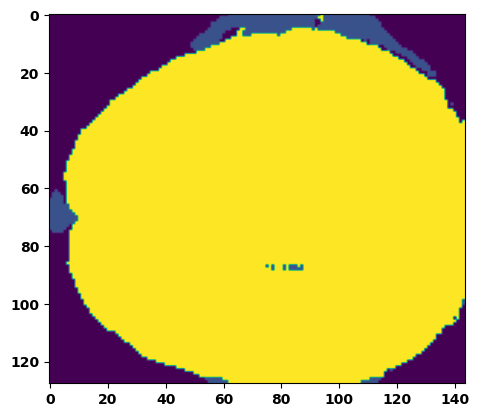

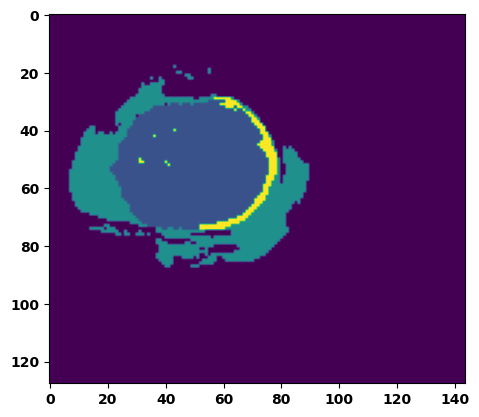

  6%|▌         | 2/36 [00:02<00:38,  1.12s/it]

Batch_id:  1 Eval loss:  0.3749024569988251
Batch_id:  1 Eval IoU:  tensor(0.4972, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9293, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9230, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.11s/it]

Batch_id:  2 Eval loss:  0.34244951605796814
Batch_id:  2 Eval IoU:  tensor(0.5315, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9341, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9724, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.07s/it]

Batch_id:  3 Eval loss:  0.8334527015686035
Batch_id:  3 Eval IoU:  tensor(0.0990, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6346, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3675, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9113, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.3486, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.46547576785087585
Batch_id:  4 Eval IoU:  tensor(0.4487, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.11s/it]

Batch_id:  5 Eval loss:  0.22807958722114563
Batch_id:  5 Eval IoU:  tensor(0.7232, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.11s/it]

Batch_id:  6 Eval loss:  0.6008672714233398
Batch_id:  6 Eval IoU:  tensor(0.3288, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9568, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:31,  1.11s/it]

Batch_id:  7 Eval loss:  0.5761767625808716
Batch_id:  7 Eval IoU:  tensor(0.3500, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9073, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.8878, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8199, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.5785855054855347
Batch_id:  8 Eval IoU:  tensor(0.3380, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9179, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9795, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.08s/it]

Batch_id:  9 Eval loss:  0.7710785865783691
Batch_id:  9 Eval IoU:  tensor(0.1493, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6015, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.2872, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.2280, device='cuda:0')
Batch_id:  10 Eval loss:  0.7623559236526489
Batch_id:  10 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


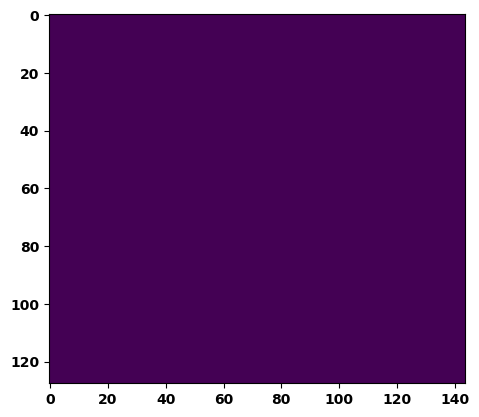

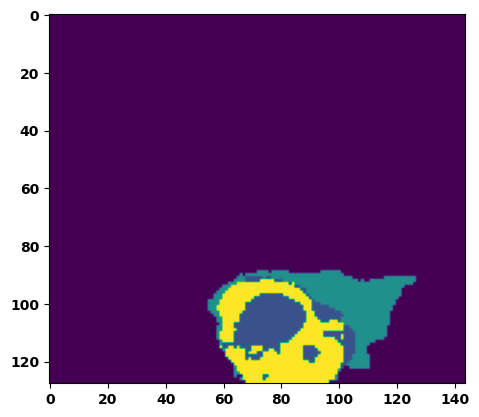

 33%|███▎      | 12/36 [00:13<00:26,  1.11s/it]

Batch_id:  11 Eval loss:  0.8378279209136963
Batch_id:  11 Eval IoU:  tensor(0.1030, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6620, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4241, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8365, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8433, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.5442, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.12s/it]

Batch_id:  12 Eval loss:  0.05048210918903351
Batch_id:  12 Eval IoU:  tensor(0.9248, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.8098923563957214
Batch_id:  13 Eval IoU:  tensor(0.1221, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6907, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4739, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.4017, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.10s/it]

Batch_id:  14 Eval loss:  0.4782230854034424
Batch_id:  14 Eval IoU:  tensor(0.4241, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8120, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.6440, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.6368, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.10s/it]

Batch_id:  15 Eval loss:  0.7510259747505188
Batch_id:  15 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:21,  1.12s/it]

Batch_id:  16 Eval loss:  0.12704966962337494
Batch_id:  16 Eval IoU:  tensor(0.8064, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.11s/it]

Batch_id:  17 Eval loss:  0.765132486820221
Batch_id:  17 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.7624582052230835
Batch_id:  18 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8965, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.08s/it]

Batch_id:  19 Eval loss:  0.41505375504493713
Batch_id:  19 Eval IoU:  tensor(0.4656, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.8752, device='cuda:0')
Batch_id:  20 Eval loss:  0.7537738680839539
Batch_id:  20 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


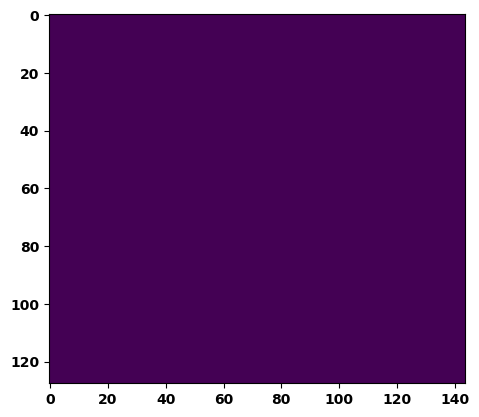

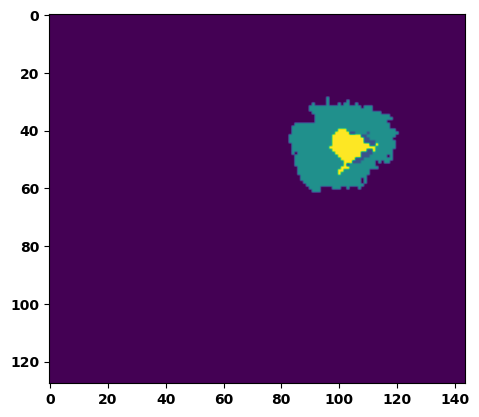

 61%|██████    | 22/36 [00:24<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.34283876419067383
Batch_id:  21 Eval IoU:  tensor(0.5916, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.10s/it]

Batch_id:  22 Eval loss:  0.2875179052352905
Batch_id:  22 Eval IoU:  tensor(0.7024, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.08s/it]

Batch_id:  23 Eval loss:  0.6868703365325928
Batch_id:  23 Eval IoU:  tensor(0.2571, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8334, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.8995, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7682198286056519
Batch_id:  24 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.04s/it]

Batch_id:  25 Eval loss:  0.8263943195343018
Batch_id:  25 Eval IoU:  tensor(0.1093, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6785, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4125, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.3680, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.8183284401893616
Batch_id:  26 Eval IoU:  tensor(0.1116, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6892, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4515, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.4407, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.7923010587692261
Batch_id:  27 Eval IoU:  tensor(0.1329, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6704, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3834, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8520, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.4939, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.08s/it]

Batch_id:  28 Eval loss:  0.6779170632362366
Batch_id:  28 Eval IoU:  tensor(0.2833, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9841, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.08s/it]

Batch_id:  29 Eval loss:  0.82267826795578
Batch_id:  29 Eval IoU:  tensor(0.1035, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6219, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3232, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.8970, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3117, device='cuda:0')
Batch_id:  30 Eval loss:  0.6963919401168823
Batch_id:  30 Eval IoU:  tensor(0.1897, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6498, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4236, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.3340, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9335, device='cuda:0')


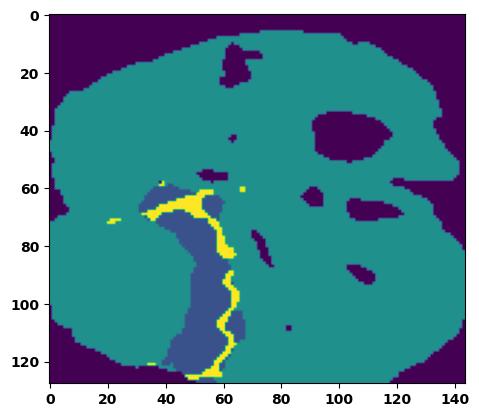

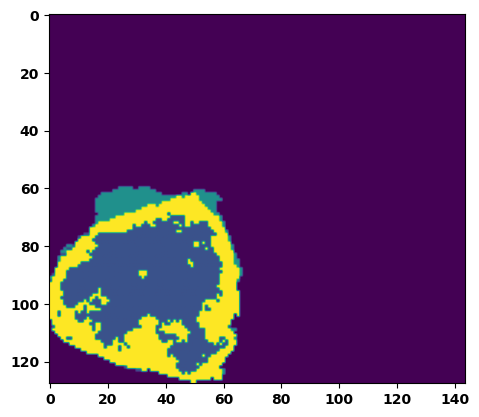

 89%|████████▉ | 32/36 [00:35<00:04,  1.13s/it]

Batch_id:  31 Eval loss:  0.6828776001930237
Batch_id:  31 Eval IoU:  tensor(0.2134, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7621, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5854, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.5334, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9489, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.8259166479110718
Batch_id:  32 Eval IoU:  tensor(0.1114, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6726, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4689, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8771, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.3983, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.2511789798736572
Batch_id:  33 Eval IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.09s/it]

Batch_id:  34 Eval loss:  0.33811622858047485
Batch_id:  34 Eval IoU:  tensor(0.5597, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.7027387022972107
Batch_id:  35 Eval IoU:  tensor(0.2421, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8883, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9027, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8109, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')
Epoch  7 Training loss:  0.23793380043723367
Epoch  7 Evaluation loss:  0.6028291591339641
Epoch  7 Training accuracy :  tensor(0.6903)
Epoch  7 Evaluation accuracy :  tensor(0.3365)
Epoch  7 Training Mean Dice Score:  tensor(0.9793)
Epoch  7 Eval Mean Dice Score:  tensor(0.8546)
Epoch  7 Training Non-tumor Dice Score:  tensor(0.9733)
Epoch  7 Eval Non-tumor Dice Score:  tensor(0.7545)
Epoch  7 Training NCR/NET Dice Score:  tensor(0.9854)
Epoch  7 Eval NCR/NET Dice Score:  tensor(0.9577)
Epoch  7 Training ED Dice Score:  tensor(0.9699)
Epoch  

Epoch: 8
Training in session: 


  1%|          | 1/110 [00:01<01:58,  1.09s/it]

Batch_id:  0 Training loss:  0.10779306292533875
Batch_id:  0 Training IoU:  tensor(0.8315, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.21195726096630096
Batch_id:  1 Training IoU:  tensor(0.7048, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.23713448643684387
Batch_id:  2 Training IoU:  tensor(0.6422, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:53,  1.07s/it]

Batch_id:  3 Training loss:  0.18070819973945618
Batch_id:  3 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:50,  1.06s/it]

Batch_id:  4 Training loss:  0.5952784419059753
Batch_id:  4 Training IoU:  tensor(0.3330, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.08s/it]

Batch_id:  5 Training loss:  0.36232131719589233
Batch_id:  5 Training IoU:  tensor(0.5891, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:54,  1.12s/it]

Batch_id:  6 Training loss:  0.06362339854240417
Batch_id:  6 Training IoU:  tensor(0.9021, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:53,  1.11s/it]

Batch_id:  7 Training loss:  0.13802501559257507
Batch_id:  7 Training IoU:  tensor(0.7772, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:48,  1.08s/it]

Batch_id:  8 Training loss:  0.15682369470596313
Batch_id:  8 Training IoU:  tensor(0.7761, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:46,  1.06s/it]

Batch_id:  9 Training loss:  0.36651793122291565
Batch_id:  9 Training IoU:  tensor(0.5831, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.06s/it]

Batch_id:  10 Training loss:  0.2969292998313904
Batch_id:  10 Training IoU:  tensor(0.6496, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 11%|█         | 12/110 [00:12<01:44,  1.07s/it]

Batch_id:  11 Training loss:  0.07468988001346588
Batch_id:  11 Training IoU:  tensor(0.8826, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:43,  1.06s/it]

Batch_id:  12 Training loss:  0.5321102738380432
Batch_id:  12 Training IoU:  tensor(0.4039, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:40,  1.05s/it]

Batch_id:  13 Training loss:  0.0947282612323761
Batch_id:  13 Training IoU:  tensor(0.8496, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:39,  1.05s/it]

Batch_id:  14 Training loss:  0.09449777007102966
Batch_id:  14 Training IoU:  tensor(0.8723, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:39,  1.06s/it]

Batch_id:  15 Training loss:  0.09684650599956512
Batch_id:  15 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:38,  1.05s/it]

Batch_id:  16 Training loss:  0.36039119958877563
Batch_id:  16 Training IoU:  tensor(0.5549, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:35,  1.04s/it]

Batch_id:  17 Training loss:  0.0901135802268982
Batch_id:  17 Training IoU:  tensor(0.8614, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:36,  1.06s/it]

Batch_id:  18 Training loss:  0.18961896002292633
Batch_id:  18 Training IoU:  tensor(0.7878, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:34,  1.05s/it]

Batch_id:  19 Training loss:  0.3182547688484192
Batch_id:  19 Training IoU:  tensor(0.5844, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:32,  1.04s/it]

Batch_id:  20 Training loss:  0.1585381180047989
Batch_id:  20 Training IoU:  tensor(0.7527, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 20%|██        | 22/110 [00:23<01:34,  1.08s/it]

Batch_id:  21 Training loss:  0.47907161712646484
Batch_id:  21 Training IoU:  tensor(0.4533, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 21%|██        | 23/110 [00:24<01:33,  1.07s/it]

Batch_id:  22 Training loss:  0.14466920495033264
Batch_id:  22 Training IoU:  tensor(0.7843, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:30,  1.05s/it]

Batch_id:  23 Training loss:  0.22870449721813202
Batch_id:  23 Training IoU:  tensor(0.7225, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:29,  1.05s/it]

Batch_id:  24 Training loss:  0.14073635637760162
Batch_id:  24 Training IoU:  tensor(0.8048, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:29,  1.06s/it]

Batch_id:  25 Training loss:  0.321842759847641
Batch_id:  25 Training IoU:  tensor(0.6034, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 25%|██▍       | 27/110 [00:28<01:30,  1.08s/it]

Batch_id:  26 Training loss:  0.2193802446126938
Batch_id:  26 Training IoU:  tensor(0.7005, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 25%|██▌       | 28/110 [00:29<01:27,  1.07s/it]

Batch_id:  27 Training loss:  0.18976610898971558
Batch_id:  27 Training IoU:  tensor(0.7666, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 26%|██▋       | 29/110 [00:30<01:25,  1.06s/it]

Batch_id:  28 Training loss:  0.1281295120716095
Batch_id:  28 Training IoU:  tensor(0.8408, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 27%|██▋       | 30/110 [00:31<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.13587284088134766
Batch_id:  29 Training IoU:  tensor(0.7854, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.16807910799980164
Batch_id:  30 Training IoU:  tensor(0.7347, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9671, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.19887344539165497
Batch_id:  31 Training IoU:  tensor(0.7144, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 30%|███       | 33/110 [00:35<01:20,  1.04s/it]

Batch_id:  32 Training loss:  0.30404794216156006
Batch_id:  32 Training IoU:  tensor(0.6515, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 31%|███       | 34/110 [00:36<01:19,  1.05s/it]

Batch_id:  33 Training loss:  0.08671456575393677
Batch_id:  33 Training IoU:  tensor(0.8672, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:17,  1.03s/it]

Batch_id:  34 Training loss:  0.18377850949764252
Batch_id:  34 Training IoU:  tensor(0.7313, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:18,  1.05s/it]

Batch_id:  35 Training loss:  0.14042486250400543
Batch_id:  35 Training IoU:  tensor(0.7855, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:17,  1.06s/it]

Batch_id:  36 Training loss:  0.6406846046447754
Batch_id:  36 Training IoU:  tensor(0.2914, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.8890, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:18,  1.09s/it]

Batch_id:  37 Training loss:  0.30543914437294006
Batch_id:  37 Training IoU:  tensor(0.6489, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 35%|███▌      | 39/110 [00:41<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.2000604122877121
Batch_id:  38 Training IoU:  tensor(0.6946, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 36%|███▋      | 40/110 [00:42<01:18,  1.12s/it]

Batch_id:  39 Training loss:  0.161887064576149
Batch_id:  39 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 37%|███▋      | 41/110 [00:43<01:17,  1.13s/it]

Batch_id:  40 Training loss:  0.5675761699676514
Batch_id:  40 Training IoU:  tensor(0.3691, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:16,  1.12s/it]

Batch_id:  41 Training loss:  0.18330106139183044
Batch_id:  41 Training IoU:  tensor(0.7427, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:17,  1.15s/it]

Batch_id:  42 Training loss:  0.32662755250930786
Batch_id:  42 Training IoU:  tensor(0.6417, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 40%|████      | 44/110 [00:47<01:17,  1.17s/it]

Batch_id:  43 Training loss:  0.1634693443775177
Batch_id:  43 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 41%|████      | 45/110 [00:48<01:13,  1.13s/it]

Batch_id:  44 Training loss:  0.24888813495635986
Batch_id:  44 Training IoU:  tensor(0.6461, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:13,  1.15s/it]

Batch_id:  45 Training loss:  0.16915448009967804
Batch_id:  45 Training IoU:  tensor(0.7437, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:11,  1.14s/it]

Batch_id:  46 Training loss:  0.18965615332126617
Batch_id:  46 Training IoU:  tensor(0.7126, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9690, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:10,  1.13s/it]

Batch_id:  47 Training loss:  0.24488136172294617
Batch_id:  47 Training IoU:  tensor(0.6790, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:08,  1.13s/it]

Batch_id:  48 Training loss:  0.2183028906583786
Batch_id:  48 Training IoU:  tensor(0.6940, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.2417459487915039
Batch_id:  49 Training IoU:  tensor(0.6431, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9234, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9616, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.1106208860874176
Batch_id:  50 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.17163453996181488
Batch_id:  51 Training IoU:  tensor(0.7486, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.3699515461921692
Batch_id:  52 Training IoU:  tensor(0.5217, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9679, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.13090525567531586
Batch_id:  53 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.1763060837984085
Batch_id:  54 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.21662943065166473
Batch_id:  55 Training IoU:  tensor(0.7097, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.13959404826164246
Batch_id:  56 Training IoU:  tensor(0.7799, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:57,  1.10s/it]

Batch_id:  57 Training loss:  0.4026510417461395
Batch_id:  57 Training IoU:  tensor(0.5420, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.3011550307273865
Batch_id:  58 Training IoU:  tensor(0.6019, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.2505786418914795
Batch_id:  59 Training IoU:  tensor(0.6738, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.28346484899520874
Batch_id:  60 Training IoU:  tensor(0.6073, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.06s/it]

Batch_id:  61 Training loss:  0.3059006333351135
Batch_id:  61 Training IoU:  tensor(0.5822, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.11753937602043152
Batch_id:  62 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.10946518182754517
Batch_id:  63 Training IoU:  tensor(0.8718, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.07s/it]

Batch_id:  64 Training loss:  0.3379599452018738
Batch_id:  64 Training IoU:  tensor(0.6076, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.07s/it]

Batch_id:  65 Training loss:  0.18349960446357727
Batch_id:  65 Training IoU:  tensor(0.7206, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:45,  1.07s/it]

Batch_id:  66 Training loss:  0.47922593355178833
Batch_id:  66 Training IoU:  tensor(0.4352, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.07s/it]

Batch_id:  67 Training loss:  0.10650718212127686
Batch_id:  67 Training IoU:  tensor(0.8321, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:43,  1.06s/it]

Batch_id:  68 Training loss:  0.1033884584903717
Batch_id:  68 Training IoU:  tensor(0.8345, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.3332821726799011
Batch_id:  69 Training IoU:  tensor(0.5486, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:40,  1.04s/it]

Batch_id:  70 Training loss:  0.19263321161270142
Batch_id:  70 Training IoU:  tensor(0.7318, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:39,  1.05s/it]

Batch_id:  71 Training loss:  0.1716925948858261
Batch_id:  71 Training IoU:  tensor(0.7374, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:39,  1.06s/it]

Batch_id:  72 Training loss:  0.10472725331783295
Batch_id:  72 Training IoU:  tensor(0.8295, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.1858595311641693
Batch_id:  73 Training IoU:  tensor(0.7374, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.18089307844638824
Batch_id:  74 Training IoU:  tensor(0.7199, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.10817007720470428
Batch_id:  75 Training IoU:  tensor(0.8260, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.22825711965560913
Batch_id:  76 Training IoU:  tensor(0.6944, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.13761252164840698
Batch_id:  77 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.3141634166240692
Batch_id:  78 Training IoU:  tensor(0.6466, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:31,  1.06s/it]

Batch_id:  79 Training loss:  0.32547640800476074
Batch_id:  79 Training IoU:  tensor(0.5541, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9678, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:30,  1.05s/it]

Batch_id:  80 Training loss:  0.26798105239868164
Batch_id:  80 Training IoU:  tensor(0.6185, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:29,  1.07s/it]

Batch_id:  81 Training loss:  0.165564626455307
Batch_id:  81 Training IoU:  tensor(0.7749, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:29,  1.08s/it]

Batch_id:  82 Training loss:  0.3206700086593628
Batch_id:  82 Training IoU:  tensor(0.5843, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.17156821489334106
Batch_id:  83 Training IoU:  tensor(0.7406, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.107773557305336
Batch_id:  84 Training IoU:  tensor(0.8303, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.18006707727909088
Batch_id:  85 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:26,  1.15s/it]

Batch_id:  86 Training loss:  0.4556180238723755
Batch_id:  86 Training IoU:  tensor(0.4865, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:25,  1.14s/it]

Batch_id:  87 Training loss:  0.21565312147140503
Batch_id:  87 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:23,  1.14s/it]

Batch_id:  88 Training loss:  0.3788982033729553
Batch_id:  88 Training IoU:  tensor(0.5348, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:22,  1.13s/it]

Batch_id:  89 Training loss:  0.1508898138999939
Batch_id:  89 Training IoU:  tensor(0.7637, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:21,  1.13s/it]

Batch_id:  90 Training loss:  0.28806084394454956
Batch_id:  90 Training IoU:  tensor(0.5918, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9229, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.24517081677913666
Batch_id:  91 Training IoU:  tensor(0.7099, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:19,  1.16s/it]

Batch_id:  92 Training loss:  0.09672999382019043
Batch_id:  92 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.11886900663375854
Batch_id:  93 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.1640552282333374
Batch_id:  94 Training IoU:  tensor(0.7505, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.13s/it]

Batch_id:  95 Training loss:  0.12655499577522278
Batch_id:  95 Training IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.5133066177368164
Batch_id:  96 Training IoU:  tensor(0.4255, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.08s/it]

Batch_id:  97 Training loss:  0.2708115875720978
Batch_id:  97 Training IoU:  tensor(0.6154, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9064, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.06s/it]

Batch_id:  98 Training loss:  0.1802823692560196
Batch_id:  98 Training IoU:  tensor(0.7474, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.06s/it]

Batch_id:  99 Training loss:  0.1621684432029724
Batch_id:  99 Training IoU:  tensor(0.7498, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.06s/it]

Batch_id:  100 Training loss:  0.2055085301399231
Batch_id:  100 Training IoU:  tensor(0.6915, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.06s/it]

Batch_id:  101 Training loss:  0.08946558833122253
Batch_id:  101 Training IoU:  tensor(0.8689, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.16177305579185486
Batch_id:  102 Training IoU:  tensor(0.7649, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.2331758588552475
Batch_id:  103 Training IoU:  tensor(0.7155, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.07s/it]

Batch_id:  104 Training loss:  0.16704970598220825
Batch_id:  104 Training IoU:  tensor(0.7633, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.12s/it]

Batch_id:  105 Training loss:  0.08026240766048431
Batch_id:  105 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.11s/it]

Batch_id:  106 Training loss:  0.2509666085243225
Batch_id:  106 Training IoU:  tensor(0.6778, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.28353554010391235
Batch_id:  107 Training IoU:  tensor(0.6617, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.10400141775608063
Batch_id:  108 Training IoU:  tensor(0.8320, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.15742699801921844
Batch_id:  109 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9900, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7630085349082947
Batch_id:  0 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


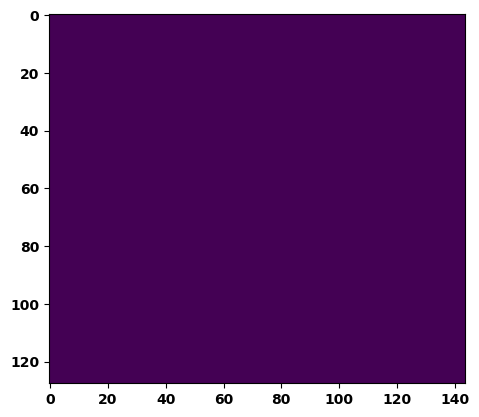

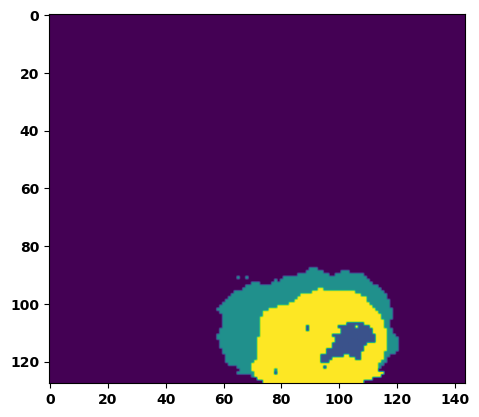

  6%|▌         | 2/36 [00:02<00:39,  1.15s/it]

Batch_id:  1 Eval loss:  0.7575810551643372
Batch_id:  1 Eval IoU:  tensor(0.2301, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.13s/it]

Batch_id:  2 Eval loss:  0.7567634582519531
Batch_id:  2 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.11s/it]

Batch_id:  3 Eval loss:  0.7633048295974731
Batch_id:  3 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.7590744495391846
Batch_id:  4 Eval IoU:  tensor(0.2305, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8149, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.07s/it]

Batch_id:  5 Eval loss:  0.7205106616020203
Batch_id:  5 Eval IoU:  tensor(0.2243, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8751, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.7502, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9134, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.07s/it]

Batch_id:  6 Eval loss:  0.28636646270751953
Batch_id:  6 Eval IoU:  tensor(0.6162, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9943, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.07s/it]

Batch_id:  7 Eval loss:  0.7659649848937988
Batch_id:  7 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.09s/it]

Batch_id:  8 Eval loss:  0.7535768151283264
Batch_id:  8 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.08s/it]

Batch_id:  9 Eval loss:  0.5824374556541443
Batch_id:  9 Eval IoU:  tensor(0.3045, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7456, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.5047, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.5361, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  10 Eval loss:  0.471895694732666
Batch_id:  10 Eval IoU:  tensor(0.4397, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8767, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9713, device='cuda:0')


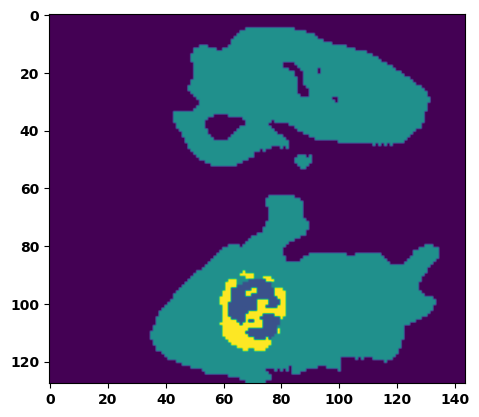

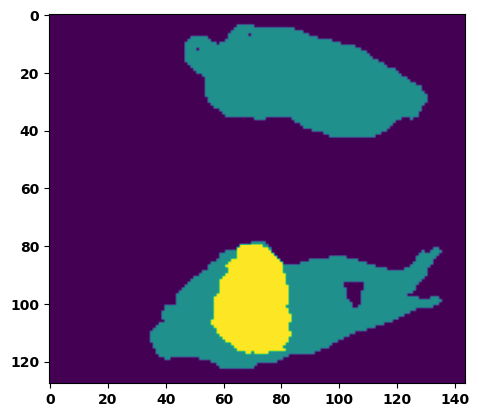

 33%|███▎      | 12/36 [00:13<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.7554749250411987
Batch_id:  11 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.12s/it]

Batch_id:  12 Eval loss:  0.7653656005859375
Batch_id:  12 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.7631561756134033
Batch_id:  13 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.05s/it]

Batch_id:  14 Eval loss:  0.6500229239463806
Batch_id:  14 Eval IoU:  tensor(0.2885, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8550, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9156, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.5164706707000732
Batch_id:  15 Eval IoU:  tensor(0.4106, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9837, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.76483154296875
Batch_id:  16 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.08s/it]

Batch_id:  17 Eval loss:  0.7750544548034668
Batch_id:  17 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.7710838317871094
Batch_id:  18 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.05s/it]

Batch_id:  19 Eval loss:  0.4615586996078491
Batch_id:  19 Eval IoU:  tensor(0.4312, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6944, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4073, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.4115, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  20 Eval loss:  0.7512538433074951
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


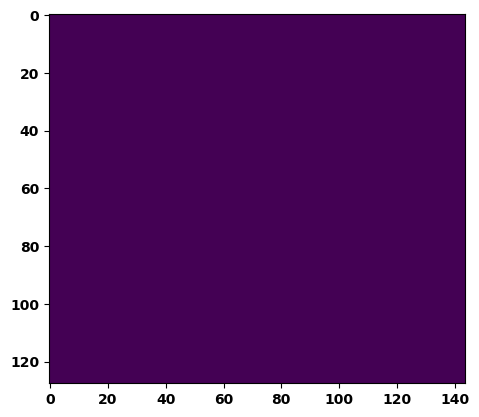

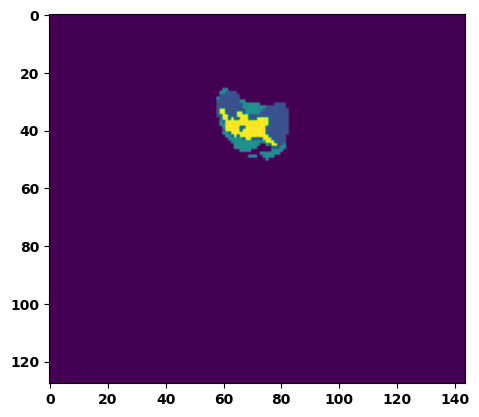

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.8801043629646301
Batch_id:  21 Eval IoU:  tensor(0.0768, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6250, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4240, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.2501, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.09s/it]

Batch_id:  22 Eval loss:  0.612991988658905
Batch_id:  22 Eval IoU:  tensor(0.3381, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.04s/it]

Batch_id:  23 Eval loss:  0.7635245323181152
Batch_id:  23 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.34364044666290283
Batch_id:  24 Eval IoU:  tensor(0.5357, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8847, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8936, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.7520295977592468
Batch_id:  25 Eval IoU:  tensor(0.2101, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8909, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8223, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8978, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9067, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.7652140259742737
Batch_id:  26 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.7565066814422607
Batch_id:  27 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.7808535695075989
Batch_id:  28 Eval IoU:  tensor(0.1915, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7677, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9124, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.6993358731269836
Batch_id:  29 Eval IoU:  tensor(0.2687, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  30 Eval loss:  0.5072522163391113
Batch_id:  30 Eval IoU:  tensor(0.3880, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8531, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.8197, device='cuda:0')


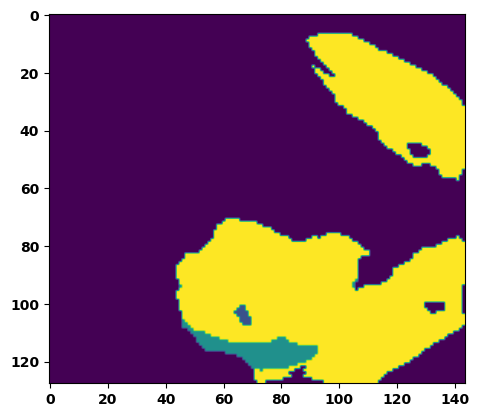

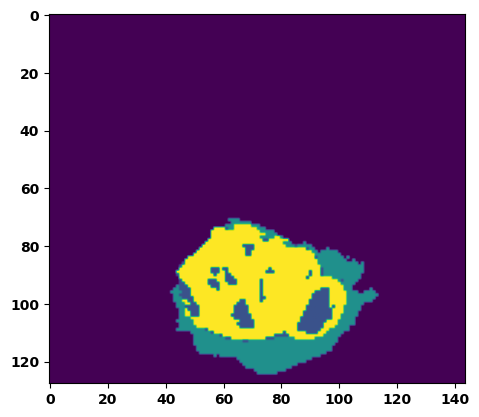

 89%|████████▉ | 32/36 [00:34<00:04,  1.13s/it]

Batch_id:  31 Eval loss:  0.44689270853996277
Batch_id:  31 Eval IoU:  tensor(0.4731, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.14s/it]

Batch_id:  32 Eval loss:  0.642761766910553
Batch_id:  32 Eval IoU:  tensor(0.2865, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9215, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.13s/it]

Batch_id:  33 Eval loss:  0.7689650058746338
Batch_id:  33 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.12s/it]

Batch_id:  34 Eval loss:  0.7215328216552734
Batch_id:  34 Eval IoU:  tensor(0.1822, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6627, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4021, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.3268, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.3123878240585327
Batch_id:  35 Eval IoU:  tensor(0.5676, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9742, device='cuda:0')
Epoch  8 Training loss:  0.2232024699449539
Epoch  8 Evaluation loss:  0.6696875136759546
Epoch  8 Training accuracy :  tensor(0.7040)
Epoch  8 Evaluation accuracy :  tensor(0.2857)
Epoch  8 Training Mean Dice Score:  tensor(0.9808)
Epoch  8 Eval Mean Dice Score:  tensor(0.9114)
Epoch  8 Training Non-tumor Dice Score:  tensor(0.9759)
Epoch  8 Eval Non-tumor Dice Score:  tensor(0.8458)
Epoch  8 Training NCR/NET Dice Score:  tensor(0.9864)
Epoch  8 Eval NCR/NET Dice Score:  tensor(0.9716)
Epoch  8 Training ED Dice Score:  tensor(0.9720)
Epoch  8

Epoch: 9
Training in session: 


  1%|          | 1/110 [00:01<02:20,  1.29s/it]

Batch_id:  0 Training loss:  0.130761981010437
Batch_id:  0 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:04,  1.15s/it]

Batch_id:  1 Training loss:  0.17049558460712433
Batch_id:  1 Training IoU:  tensor(0.7538, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.12s/it]

Batch_id:  2 Training loss:  0.3223622441291809
Batch_id:  2 Training IoU:  tensor(0.6270, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:00,  1.13s/it]

Batch_id:  3 Training loss:  0.09018771350383759
Batch_id:  3 Training IoU:  tensor(0.8537, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.17015264928340912
Batch_id:  4 Training IoU:  tensor(0.7421, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.124643474817276
Batch_id:  5 Training IoU:  tensor(0.8018, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.10s/it]

Batch_id:  6 Training loss:  0.6050623059272766
Batch_id:  6 Training IoU:  tensor(0.3231, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9054, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:54,  1.12s/it]

Batch_id:  7 Training loss:  0.08367897570133209
Batch_id:  7 Training IoU:  tensor(0.8691, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:52,  1.11s/it]

Batch_id:  8 Training loss:  0.4703623652458191
Batch_id:  8 Training IoU:  tensor(0.4459, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9055, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:49,  1.10s/it]

Batch_id:  9 Training loss:  0.10281839966773987
Batch_id:  9 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.11s/it]

Batch_id:  10 Training loss:  0.17087474465370178
Batch_id:  10 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.10s/it]

Batch_id:  11 Training loss:  0.13269996643066406
Batch_id:  11 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.10s/it]

Batch_id:  12 Training loss:  0.16886833310127258
Batch_id:  12 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.17842699587345123
Batch_id:  13 Training IoU:  tensor(0.7259, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9686, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.1243860125541687
Batch_id:  14 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.07887087762355804
Batch_id:  15 Training IoU:  tensor(0.8735, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:43,  1.11s/it]

Batch_id:  16 Training loss:  0.11384209990501404
Batch_id:  16 Training IoU:  tensor(0.8250, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:43,  1.12s/it]

Batch_id:  17 Training loss:  0.09854526817798615
Batch_id:  17 Training IoU:  tensor(0.8403, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:41,  1.12s/it]

Batch_id:  18 Training loss:  0.23265686631202698
Batch_id:  18 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:38,  1.10s/it]

Batch_id:  19 Training loss:  0.30532732605934143
Batch_id:  19 Training IoU:  tensor(0.5992, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.09s/it]

Batch_id:  20 Training loss:  0.3221067786216736
Batch_id:  20 Training IoU:  tensor(0.5780, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.08s/it]

Batch_id:  21 Training loss:  0.2305816411972046
Batch_id:  21 Training IoU:  tensor(0.6498, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 21%|██        | 23/110 [00:25<01:34,  1.09s/it]

Batch_id:  22 Training loss:  0.1581793874502182
Batch_id:  22 Training IoU:  tensor(0.7562, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.1307273656129837
Batch_id:  23 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.09s/it]

Batch_id:  24 Training loss:  0.27248990535736084
Batch_id:  24 Training IoU:  tensor(0.6099, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9341, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9723, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.07s/it]

Batch_id:  25 Training loss:  0.2389240860939026
Batch_id:  25 Training IoU:  tensor(0.6933, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:27,  1.05s/it]

Batch_id:  26 Training loss:  0.16840294003486633
Batch_id:  26 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:26,  1.05s/it]

Batch_id:  27 Training loss:  0.11504872143268585
Batch_id:  27 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:26,  1.07s/it]

Batch_id:  28 Training loss:  0.07293088734149933
Batch_id:  28 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.0936630517244339
Batch_id:  29 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:24,  1.07s/it]

Batch_id:  30 Training loss:  0.3049316704273224
Batch_id:  30 Training IoU:  tensor(0.6575, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.4163805842399597
Batch_id:  31 Training IoU:  tensor(0.4811, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9210, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 30%|███       | 33/110 [00:36<01:21,  1.06s/it]

Batch_id:  32 Training loss:  0.2555299401283264
Batch_id:  32 Training IoU:  tensor(0.6314, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 31%|███       | 34/110 [00:37<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.1852113902568817
Batch_id:  33 Training IoU:  tensor(0.7459, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:19,  1.06s/it]

Batch_id:  34 Training loss:  0.17888067662715912
Batch_id:  34 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.29358482360839844
Batch_id:  35 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.10482454299926758
Batch_id:  36 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.25366610288619995
Batch_id:  37 Training IoU:  tensor(0.6848, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.12046755850315094
Batch_id:  38 Training IoU:  tensor(0.8301, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:16,  1.09s/it]

Batch_id:  39 Training loss:  0.10089361667633057
Batch_id:  39 Training IoU:  tensor(0.8401, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:13,  1.07s/it]

Batch_id:  40 Training loss:  0.08096189796924591
Batch_id:  40 Training IoU:  tensor(0.8715, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.06s/it]

Batch_id:  41 Training loss:  0.20393048226833344
Batch_id:  41 Training IoU:  tensor(0.7107, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:11,  1.06s/it]

Batch_id:  42 Training loss:  0.06795880198478699
Batch_id:  42 Training IoU:  tensor(0.8934, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.3143923878669739
Batch_id:  43 Training IoU:  tensor(0.6595, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.18323393166065216
Batch_id:  44 Training IoU:  tensor(0.7351, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.5025527477264404
Batch_id:  45 Training IoU:  tensor(0.4294, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.08s/it]

Batch_id:  46 Training loss:  0.28101372718811035
Batch_id:  46 Training IoU:  tensor(0.6054, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9074, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.07765494287014008
Batch_id:  47 Training IoU:  tensor(0.8760, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.07604753971099854
Batch_id:  48 Training IoU:  tensor(0.8817, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:05,  1.09s/it]

Batch_id:  49 Training loss:  0.150413379073143
Batch_id:  49 Training IoU:  tensor(0.7672, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.07s/it]

Batch_id:  50 Training loss:  0.20307648181915283
Batch_id:  50 Training IoU:  tensor(0.7020, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:01,  1.06s/it]

Batch_id:  51 Training loss:  0.15406769514083862
Batch_id:  51 Training IoU:  tensor(0.7679, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.1536596268415451
Batch_id:  52 Training IoU:  tensor(0.7795, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.39643827080726624
Batch_id:  53 Training IoU:  tensor(0.5317, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.07s/it]

Batch_id:  54 Training loss:  0.12587091326713562
Batch_id:  54 Training IoU:  tensor(0.7981, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.2584131360054016
Batch_id:  55 Training IoU:  tensor(0.6592, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.1016426831483841
Batch_id:  56 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.14879414439201355
Batch_id:  57 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.10s/it]

Batch_id:  58 Training loss:  0.1357727348804474
Batch_id:  58 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.10s/it]

Batch_id:  59 Training loss:  0.3760297894477844
Batch_id:  59 Training IoU:  tensor(0.5709, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.37501299381256104
Batch_id:  60 Training IoU:  tensor(0.5640, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.11098331212997437
Batch_id:  61 Training IoU:  tensor(0.8321, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.10953375697135925
Batch_id:  62 Training IoU:  tensor(0.8222, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.1928156614303589
Batch_id:  63 Training IoU:  tensor(0.7114, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.18234433233737946
Batch_id:  64 Training IoU:  tensor(0.7194, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.15831366181373596
Batch_id:  65 Training IoU:  tensor(0.7465, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:45,  1.07s/it]

Batch_id:  66 Training loss:  0.2547721266746521
Batch_id:  66 Training IoU:  tensor(0.6559, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:44,  1.07s/it]

Batch_id:  67 Training loss:  0.12911462783813477
Batch_id:  67 Training IoU:  tensor(0.8281, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.08s/it]

Batch_id:  68 Training loss:  0.33387333154678345
Batch_id:  68 Training IoU:  tensor(0.5873, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.05693686008453369
Batch_id:  69 Training IoU:  tensor(0.9070, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.19028201699256897
Batch_id:  70 Training IoU:  tensor(0.7133, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:41,  1.08s/it]

Batch_id:  71 Training loss:  0.14132340252399445
Batch_id:  71 Training IoU:  tensor(0.7909, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:41,  1.11s/it]

Batch_id:  72 Training loss:  0.5645957589149475
Batch_id:  72 Training IoU:  tensor(0.3742, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.08s/it]

Batch_id:  73 Training loss:  0.16149522364139557
Batch_id:  73 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.11s/it]

Batch_id:  74 Training loss:  0.07718546688556671
Batch_id:  74 Training IoU:  tensor(0.8740, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.2340964525938034
Batch_id:  75 Training IoU:  tensor(0.6871, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:36,  1.11s/it]

Batch_id:  76 Training loss:  0.14988957345485687
Batch_id:  76 Training IoU:  tensor(0.7669, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.1656036376953125
Batch_id:  77 Training IoU:  tensor(0.7540, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.2522079348564148
Batch_id:  78 Training IoU:  tensor(0.6298, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9182, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9623, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.3047962784767151
Batch_id:  79 Training IoU:  tensor(0.6088, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.22103172540664673
Batch_id:  80 Training IoU:  tensor(0.7021, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.08s/it]

Batch_id:  81 Training loss:  0.2065751701593399
Batch_id:  81 Training IoU:  tensor(0.6926, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:28,  1.06s/it]

Batch_id:  82 Training loss:  0.2786380648612976
Batch_id:  82 Training IoU:  tensor(0.6056, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:27,  1.07s/it]

Batch_id:  83 Training loss:  0.20587365329265594
Batch_id:  83 Training IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.3346017599105835
Batch_id:  84 Training IoU:  tensor(0.5980, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:25,  1.06s/it]

Batch_id:  85 Training loss:  0.1428891122341156
Batch_id:  85 Training IoU:  tensor(0.7682, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:24,  1.08s/it]

Batch_id:  86 Training loss:  0.24966835975646973
Batch_id:  86 Training IoU:  tensor(0.7054, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.35190367698669434
Batch_id:  87 Training IoU:  tensor(0.5852, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.1460573524236679
Batch_id:  88 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.16690152883529663
Batch_id:  89 Training IoU:  tensor(0.7772, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:19,  1.05s/it]

Batch_id:  90 Training loss:  0.2795443534851074
Batch_id:  90 Training IoU:  tensor(0.6086, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:18,  1.05s/it]

Batch_id:  91 Training loss:  0.10802266001701355
Batch_id:  91 Training IoU:  tensor(0.8260, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.06s/it]

Batch_id:  92 Training loss:  0.3504953980445862
Batch_id:  92 Training IoU:  tensor(0.5678, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:16,  1.06s/it]

Batch_id:  93 Training loss:  0.34654173254966736
Batch_id:  93 Training IoU:  tensor(0.5363, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:15,  1.06s/it]

Batch_id:  94 Training loss:  0.14058350026607513
Batch_id:  94 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.1004878580570221
Batch_id:  95 Training IoU:  tensor(0.8537, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:13,  1.06s/it]

Batch_id:  96 Training loss:  0.300942599773407
Batch_id:  96 Training IoU:  tensor(0.6441, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.2942419648170471
Batch_id:  97 Training IoU:  tensor(0.6141, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.1526547223329544
Batch_id:  98 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.21642591059207916
Batch_id:  99 Training IoU:  tensor(0.6915, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.15986129641532898
Batch_id:  100 Training IoU:  tensor(0.7494, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.07s/it]

Batch_id:  101 Training loss:  0.3320409059524536
Batch_id:  101 Training IoU:  tensor(0.5457, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.05s/it]

Batch_id:  102 Training loss:  0.22236353158950806
Batch_id:  102 Training IoU:  tensor(0.7196, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.05s/it]

Batch_id:  103 Training loss:  0.6182136535644531
Batch_id:  103 Training IoU:  tensor(0.3048, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.8856, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.04s/it]

Batch_id:  104 Training loss:  0.1729557365179062
Batch_id:  104 Training IoU:  tensor(0.7382, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.4384533762931824
Batch_id:  105 Training IoU:  tensor(0.5119, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.12138181924819946
Batch_id:  106 Training IoU:  tensor(0.8076, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.5031808018684387
Batch_id:  107 Training IoU:  tensor(0.4384, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.10s/it]

Batch_id:  108 Training loss:  0.15510106086730957
Batch_id:  108 Training IoU:  tensor(0.7692, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.18080106377601624
Batch_id:  109 Training IoU:  tensor(0.7482, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9895, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.749233603477478
Batch_id:  0 Eval IoU:  tensor(0.2374, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9002, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8057, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9424, device='cuda:0')


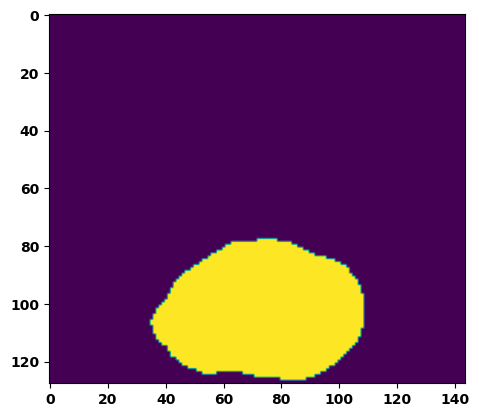

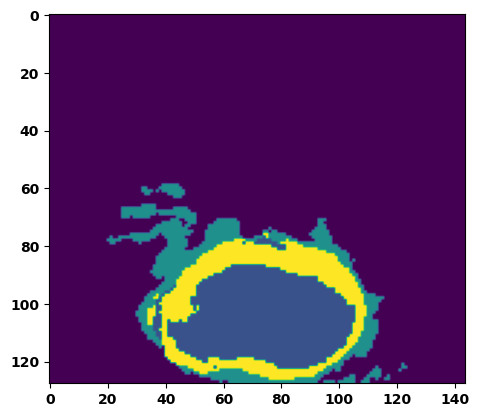

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.661835789680481
Batch_id:  1 Eval IoU:  tensor(0.2218, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7124, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4935, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.4800, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.04s/it]

Batch_id:  2 Eval loss:  0.7536509037017822
Batch_id:  2 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.04s/it]

Batch_id:  3 Eval loss:  0.7574524283409119
Batch_id:  3 Eval IoU:  tensor(0.2308, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9232, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  4 Eval loss:  0.7636246681213379
Batch_id:  4 Eval IoU:  

 14%|█▍        | 5/36 [00:05<00:34,  1.12s/it]

tensor(0.2235, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.11s/it]

Batch_id:  5 Eval loss:  0.45456892251968384
Batch_id:  5 Eval IoU:  tensor(0.4435, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9730, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.13s/it]

Batch_id:  6 Eval loss:  0.762404203414917
Batch_id:  6 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8966, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.10s/it]

Batch_id:  7 Eval loss:  0.775347113609314
Batch_id:  7 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:31,  1.17s/it]

Batch_id:  8 Eval loss:  0.6059645414352417
Batch_id:  8 Eval IoU:  tensor(0.3464, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9121, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:30,  1.17s/it]

Batch_id:  9 Eval loss:  0.6977738738059998
Batch_id:  9 Eval IoU:  tensor(0.2436, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8652, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8471, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9037, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.7863, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  10 Eval loss:  0.764895498752594
Batch_id:  10 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


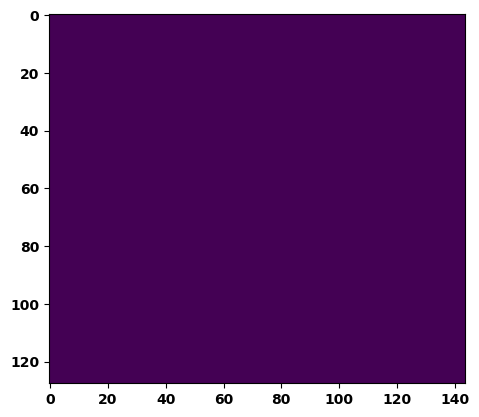

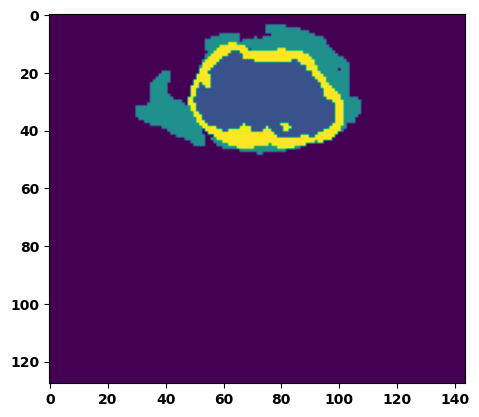

 33%|███▎      | 12/36 [00:13<00:28,  1.20s/it]

Batch_id:  11 Eval loss:  0.5566591024398804
Batch_id:  11 Eval IoU:  tensor(0.3930, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:26,  1.14s/it]

Batch_id:  12 Eval loss:  0.7651185989379883
Batch_id:  12 Eval IoU:  tensor(0.2201, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.23887160420417786
Batch_id:  13 Eval IoU:  tensor(0.6677, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9764, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.10s/it]

Batch_id:  14 Eval loss:  0.36261942982673645
Batch_id:  14 Eval IoU:  tensor(0.5448, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9937, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.11s/it]

Batch_id:  15 Eval loss:  0.1524757444858551
Batch_id:  15 Eval IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 47%|████▋     | 17/36 [00:19<00:21,  1.13s/it]

Batch_id:  16 Eval loss:  0.362518846988678
Batch_id:  16 Eval IoU:  tensor(0.5666, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 50%|█████     | 18/36 [00:20<00:19,  1.11s/it]

Batch_id:  17 Eval loss:  0.6958506107330322
Batch_id:  17 Eval IoU:  tensor(0.2526, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8538, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9559, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:19,  1.17s/it]

Batch_id:  18 Eval loss:  0.716740608215332
Batch_id:  18 Eval IoU:  tensor(0.1893, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6510, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3569, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.3391, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:18,  1.14s/it]

Batch_id:  19 Eval loss:  0.7567512392997742
Batch_id:  19 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  20 Eval loss:  0.6199269890785217
Batch_id:  20 Eval IoU:  tensor(0.3206, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


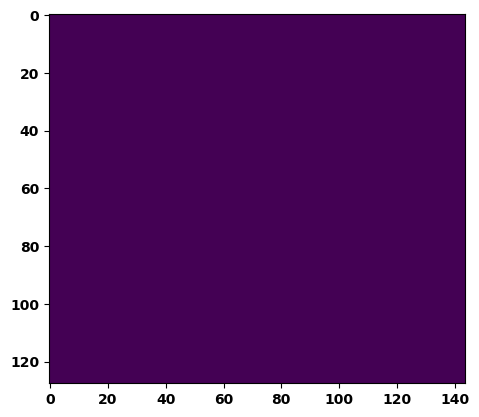

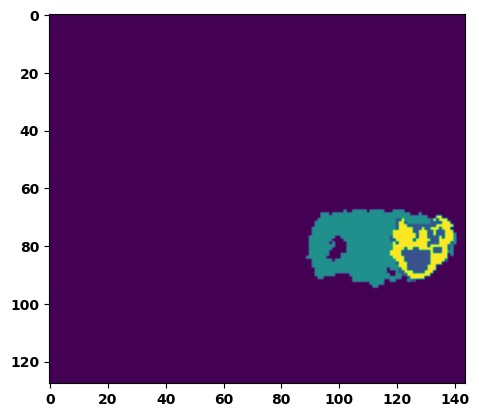

 61%|██████    | 22/36 [00:24<00:15,  1.14s/it]

Batch_id:  21 Eval loss:  0.8832782506942749
Batch_id:  21 Eval IoU:  tensor(0.0743, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6210, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4161, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.2420, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.10s/it]

Batch_id:  22 Eval loss:  0.7792496085166931
Batch_id:  22 Eval IoU:  tensor(0.1940, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.7803, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9001, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.35118338465690613
Batch_id:  23 Eval IoU:  tensor(0.5578, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9948, device='cuda:0')


 69%|██████▉   | 25/36 [00:28<00:12,  1.17s/it]

Batch_id:  24 Eval loss:  0.09652681648731232
Batch_id:  24 Eval IoU:  tensor(0.8425, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 72%|███████▏  | 26/36 [00:29<00:11,  1.11s/it]

Batch_id:  25 Eval loss:  0.7655975818634033
Batch_id:  25 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:10,  1.20s/it]

Batch_id:  26 Eval loss:  0.4484773278236389
Batch_id:  26 Eval IoU:  tensor(0.4449, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8714, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.7565, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.7500, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9864, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:09,  1.15s/it]

Batch_id:  27 Eval loss:  0.6757195591926575
Batch_id:  27 Eval IoU:  tensor(0.2601, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8830, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7784, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:08,  1.15s/it]

Batch_id:  28 Eval loss:  0.715194821357727
Batch_id:  28 Eval IoU:  tensor(0.1936, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6245, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3019, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8365, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.4216, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.10s/it]

Batch_id:  29 Eval loss:  0.7632814049720764
Batch_id:  29 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  30 Eval loss:  0.7410063743591309
Batch_id:  30 Eval IoU:  tensor(0.2323, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8750, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9597, device='cuda:0')


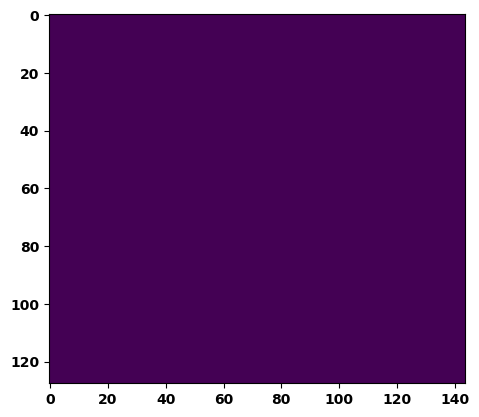

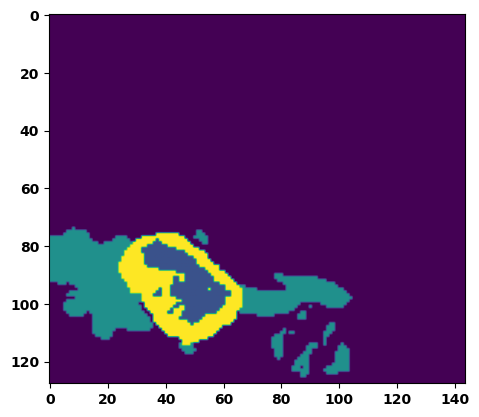

 89%|████████▉ | 32/36 [00:36<00:04,  1.13s/it]

Batch_id:  31 Eval loss:  0.6380711197853088
Batch_id:  31 Eval IoU:  tensor(0.2947, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8940, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9005, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8976, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8635, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9144, device='cuda:0')


 92%|█████████▏| 33/36 [00:37<00:03,  1.12s/it]

Batch_id:  32 Eval loss:  0.7514925003051758
Batch_id:  32 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 94%|█████████▍| 34/36 [00:38<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.7326736450195312
Batch_id:  33 Eval IoU:  tensor(0.1693, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6927, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4879, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.7701, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8849, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.6278, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.7453470230102539
Batch_id:  34 Eval IoU:  tensor(0.1757, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.7607, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.5750, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.5251, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.13s/it]

Batch_id:  35 Eval loss:  0.5864790678024292
Batch_id:  35 Eval IoU:  tensor(0.2978, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8185, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6726, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9150, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7336, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9529, device='cuda:0')
Epoch  9 Training loss:  0.21389078118584373
Epoch  9 Evaluation loss:  0.6291073001921177
Epoch  9 Training accuracy :  tensor(0.7142)
Epoch  9 Evaluation accuracy :  tensor(0.3169)
Epoch  9 Training Mean Dice Score:  tensor(0.9819)
Epoch  9 Eval Mean Dice Score:  tensor(0.8951)
Epoch  9 Training Non-tumor Dice Score:  tensor(0.9773)
Epoch  9 Eval Non-tumor Dice Score:  tensor(0.8228)
Epoch  9 Training NCR/NET Dice Score:  tensor(0.9873)
Epoch  9 Eval NCR/NET Dice Score:  tensor(0.9586)
Epoch  9 Training ED Dice Score:  tensor(0.9735)
Epoch  

Epoch: 10
Training in session: 


  1%|          | 1/110 [00:01<02:08,  1.18s/it]

Batch_id:  0 Training loss:  0.05514933168888092
Batch_id:  0 Training IoU:  tensor(0.9102, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:00,  1.11s/it]

Batch_id:  1 Training loss:  0.10731329023838043
Batch_id:  1 Training IoU:  tensor(0.8247, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.15059559047222137
Batch_id:  2 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.08124016225337982
Batch_id:  3 Training IoU:  tensor(0.8675, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.07s/it]

Batch_id:  4 Training loss:  0.16102707386016846
Batch_id:  4 Training IoU:  tensor(0.7687, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:52,  1.08s/it]

Batch_id:  5 Training loss:  0.32666337490081787
Batch_id:  5 Training IoU:  tensor(0.6160, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.07s/it]

Batch_id:  6 Training loss:  0.15815243124961853
Batch_id:  6 Training IoU:  tensor(0.7686, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.07s/it]

Batch_id:  7 Training loss:  0.11765241622924805
Batch_id:  7 Training IoU:  tensor(0.8083, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:51,  1.10s/it]

Batch_id:  8 Training loss:  0.09330259263515472
Batch_id:  8 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:51,  1.11s/it]

Batch_id:  9 Training loss:  0.44123727083206177
Batch_id:  9 Training IoU:  tensor(0.4618, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9081, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9649, device='cuda:0')


 10%|█         | 11/110 [00:12<01:53,  1.15s/it]

Batch_id:  10 Training loss:  0.3513176143169403
Batch_id:  10 Training IoU:  tensor(0.5915, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 11%|█         | 12/110 [00:13<01:51,  1.14s/it]

Batch_id:  11 Training loss:  0.16908273100852966
Batch_id:  11 Training IoU:  tensor(0.7347, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:50,  1.14s/it]

Batch_id:  12 Training loss:  0.1862715780735016
Batch_id:  12 Training IoU:  tensor(0.7129, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:50,  1.15s/it]

Batch_id:  13 Training loss:  0.23504553735256195
Batch_id:  13 Training IoU:  tensor(0.6861, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:48,  1.14s/it]

Batch_id:  14 Training loss:  0.09863229095935822
Batch_id:  14 Training IoU:  tensor(0.8375, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:47,  1.14s/it]

Batch_id:  15 Training loss:  0.07109706103801727
Batch_id:  15 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:45,  1.13s/it]

Batch_id:  16 Training loss:  0.13045592606067657
Batch_id:  16 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:40,  1.10s/it]

Batch_id:  17 Training loss:  0.1414274126291275
Batch_id:  17 Training IoU:  tensor(0.7940, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:37,  1.07s/it]

Batch_id:  18 Training loss:  0.3162364363670349
Batch_id:  18 Training IoU:  tensor(0.5853, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:35,  1.06s/it]

Batch_id:  19 Training loss:  0.1526903510093689
Batch_id:  19 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.08139508962631226
Batch_id:  20 Training IoU:  tensor(0.8664, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.07s/it]

Batch_id:  21 Training loss:  0.18637949228286743
Batch_id:  21 Training IoU:  tensor(0.7404, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 21%|██        | 23/110 [00:25<01:35,  1.10s/it]

Batch_id:  22 Training loss:  0.1694798469543457
Batch_id:  22 Training IoU:  tensor(0.7600, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:33,  1.08s/it]

Batch_id:  23 Training loss:  0.156633198261261
Batch_id:  23 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.09s/it]

Batch_id:  24 Training loss:  0.10807564854621887
Batch_id:  24 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.16504833102226257
Batch_id:  25 Training IoU:  tensor(0.7398, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.07s/it]

Batch_id:  26 Training loss:  0.1888870894908905
Batch_id:  26 Training IoU:  tensor(0.7069, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:27,  1.07s/it]

Batch_id:  27 Training loss:  0.08373862504959106
Batch_id:  27 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.08482041954994202
Batch_id:  28 Training IoU:  tensor(0.8578, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.19272609055042267
Batch_id:  29 Training IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.09s/it]

Batch_id:  30 Training loss:  0.07735303044319153
Batch_id:  30 Training IoU:  tensor(0.8771, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.21516618132591248
Batch_id:  31 Training IoU:  tensor(0.7266, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.2032811939716339
Batch_id:  32 Training IoU:  tensor(0.7418, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.08s/it]

Batch_id:  33 Training loss:  0.10049524903297424
Batch_id:  33 Training IoU:  tensor(0.8403, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:21,  1.08s/it]

Batch_id:  34 Training loss:  0.11268819868564606
Batch_id:  34 Training IoU:  tensor(0.8984, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.08s/it]

Batch_id:  35 Training loss:  0.23774170875549316
Batch_id:  35 Training IoU:  tensor(0.6467, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9252, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9630, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:17,  1.07s/it]

Batch_id:  36 Training loss:  0.1437467634677887
Batch_id:  36 Training IoU:  tensor(0.7706, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.3141673803329468
Batch_id:  37 Training IoU:  tensor(0.5626, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9697, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.07s/it]

Batch_id:  38 Training loss:  0.5243856906890869
Batch_id:  38 Training IoU:  tensor(0.4085, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:16,  1.09s/it]

Batch_id:  39 Training loss:  0.3383537530899048
Batch_id:  39 Training IoU:  tensor(0.5987, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.19730186462402344
Batch_id:  40 Training IoU:  tensor(0.7119, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.1313065141439438
Batch_id:  41 Training IoU:  tensor(0.8172, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.1704111248254776
Batch_id:  42 Training IoU:  tensor(0.7694, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.5494122505187988
Batch_id:  43 Training IoU:  tensor(0.3807, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.5739670991897583
Batch_id:  44 Training IoU:  tensor(0.3367, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.8945, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9117, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.08s/it]

Batch_id:  45 Training loss:  0.16875144839286804
Batch_id:  45 Training IoU:  tensor(0.7395, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.4201733469963074
Batch_id:  46 Training IoU:  tensor(0.5303, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.2247949093580246
Batch_id:  47 Training IoU:  tensor(0.6575, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.10s/it]

Batch_id:  48 Training loss:  0.33984771370887756
Batch_id:  48 Training IoU:  tensor(0.5819, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.18866729736328125
Batch_id:  49 Training IoU:  tensor(0.7173, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.07s/it]

Batch_id:  50 Training loss:  0.2103128284215927
Batch_id:  50 Training IoU:  tensor(0.7271, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.11800096929073334
Batch_id:  51 Training IoU:  tensor(0.8131, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.12376224994659424
Batch_id:  52 Training IoU:  tensor(0.8157, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.07s/it]

Batch_id:  53 Training loss:  0.14184656739234924
Batch_id:  53 Training IoU:  tensor(0.7734, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.11129236221313477
Batch_id:  54 Training IoU:  tensor(0.8180, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.07s/it]

Batch_id:  55 Training loss:  0.09887801110744476
Batch_id:  55 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.06s/it]

Batch_id:  56 Training loss:  0.1888664811849594
Batch_id:  56 Training IoU:  tensor(0.7647, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.06s/it]

Batch_id:  57 Training loss:  0.2202077955007553
Batch_id:  57 Training IoU:  tensor(0.7080, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.12476788461208344
Batch_id:  58 Training IoU:  tensor(0.7998, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:52,  1.05s/it]

Batch_id:  59 Training loss:  0.12960074841976166
Batch_id:  59 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.06s/it]

Batch_id:  60 Training loss:  0.5048630237579346
Batch_id:  60 Training IoU:  tensor(0.4080, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.8864, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.13851691782474518
Batch_id:  61 Training IoU:  tensor(0.7970, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.14937300980091095
Batch_id:  62 Training IoU:  tensor(0.7671, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.15161657333374023
Batch_id:  63 Training IoU:  tensor(0.7714, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.0857883095741272
Batch_id:  64 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.08268493413925171
Batch_id:  65 Training IoU:  tensor(0.8641, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.20319442451000214
Batch_id:  66 Training IoU:  tensor(0.7474, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.13308042287826538
Batch_id:  67 Training IoU:  tensor(0.7945, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.11s/it]

Batch_id:  68 Training loss:  0.10083462297916412
Batch_id:  68 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.10s/it]

Batch_id:  69 Training loss:  0.1728210151195526
Batch_id:  69 Training IoU:  tensor(0.7304, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.08s/it]

Batch_id:  70 Training loss:  0.12078350782394409
Batch_id:  70 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.06s/it]

Batch_id:  71 Training loss:  0.1713469922542572
Batch_id:  71 Training IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:39,  1.06s/it]

Batch_id:  72 Training loss:  0.12781286239624023
Batch_id:  72 Training IoU:  tensor(0.8096, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.30049657821655273
Batch_id:  73 Training IoU:  tensor(0.5793, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9707, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.09s/it]

Batch_id:  74 Training loss:  0.1683657020330429
Batch_id:  74 Training IoU:  tensor(0.7782, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.10s/it]

Batch_id:  75 Training loss:  0.47176477313041687
Batch_id:  75 Training IoU:  tensor(0.4701, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.06s/it]

Batch_id:  76 Training loss:  0.29647207260131836
Batch_id:  76 Training IoU:  tensor(0.6534, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.10902582108974457
Batch_id:  77 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:34,  1.10s/it]

Batch_id:  78 Training loss:  0.28788870573043823
Batch_id:  78 Training IoU:  tensor(0.6404, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:33,  1.10s/it]

Batch_id:  79 Training loss:  0.12413018941879272
Batch_id:  79 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:32,  1.12s/it]

Batch_id:  80 Training loss:  0.35801947116851807
Batch_id:  80 Training IoU:  tensor(0.5854, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.13s/it]

Batch_id:  81 Training loss:  0.1367594450712204
Batch_id:  81 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.523818850517273
Batch_id:  82 Training IoU:  tensor(0.3942, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:30,  1.15s/it]

Batch_id:  83 Training loss:  0.10795153677463531
Batch_id:  83 Training IoU:  tensor(0.8235, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:28,  1.15s/it]

Batch_id:  84 Training loss:  0.31269264221191406
Batch_id:  84 Training IoU:  tensor(0.5728, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:27,  1.15s/it]

Batch_id:  85 Training loss:  0.31260889768600464
Batch_id:  85 Training IoU:  tensor(0.6295, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:26,  1.14s/it]

Batch_id:  86 Training loss:  0.37244173884391785
Batch_id:  86 Training IoU:  tensor(0.5717, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.10s/it]

Batch_id:  87 Training loss:  0.24963954091072083
Batch_id:  87 Training IoU:  tensor(0.6318, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.08s/it]

Batch_id:  88 Training loss:  0.100455641746521
Batch_id:  88 Training IoU:  tensor(0.8376, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.09s/it]

Batch_id:  89 Training loss:  0.12864935398101807
Batch_id:  89 Training IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.07s/it]

Batch_id:  90 Training loss:  0.13156843185424805
Batch_id:  90 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.07s/it]

Batch_id:  91 Training loss:  0.13786201179027557
Batch_id:  91 Training IoU:  tensor(0.7822, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:17,  1.06s/it]

Batch_id:  92 Training loss:  0.2025536149740219
Batch_id:  92 Training IoU:  tensor(0.7128, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:16,  1.06s/it]

Batch_id:  93 Training loss:  0.32511356472969055
Batch_id:  93 Training IoU:  tensor(0.5678, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:15,  1.06s/it]

Batch_id:  94 Training loss:  0.26244813203811646
Batch_id:  94 Training IoU:  tensor(0.6232, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:14,  1.05s/it]

Batch_id:  95 Training loss:  0.2431606650352478
Batch_id:  95 Training IoU:  tensor(0.6482, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:13,  1.06s/it]

Batch_id:  96 Training loss:  0.33804142475128174
Batch_id:  96 Training IoU:  tensor(0.6038, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.17055243253707886
Batch_id:  97 Training IoU:  tensor(0.7683, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.06s/it]

Batch_id:  98 Training loss:  0.17240189015865326
Batch_id:  98 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.06s/it]

Batch_id:  99 Training loss:  0.16236087679862976
Batch_id:  99 Training IoU:  tensor(0.7474, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9726, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.35192447900772095
Batch_id:  100 Training IoU:  tensor(0.5627, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.07s/it]

Batch_id:  101 Training loss:  0.16872963309288025
Batch_id:  101 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.29785531759262085
Batch_id:  102 Training IoU:  tensor(0.6106, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.20723392069339752
Batch_id:  103 Training IoU:  tensor(0.6921, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.08s/it]

Batch_id:  104 Training loss:  0.08525712788105011
Batch_id:  104 Training IoU:  tensor(0.8603, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.10081522166728973
Batch_id:  105 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.1607595980167389
Batch_id:  106 Training IoU:  tensor(0.7464, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.1081763207912445
Batch_id:  107 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.2938864231109619
Batch_id:  108 Training IoU:  tensor(0.6525, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.29135143756866455
Batch_id:  109 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9986, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7535882592201233
Batch_id:  0 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


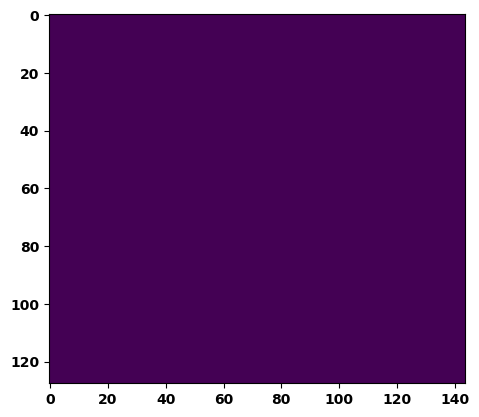

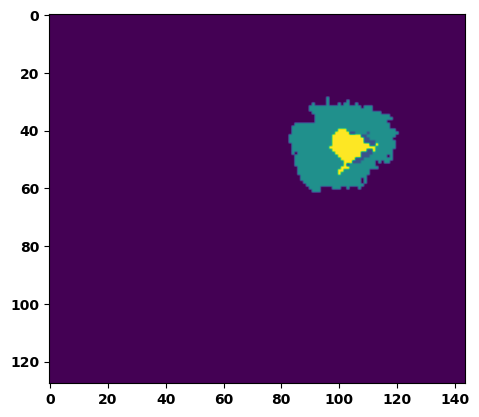

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7628650665283203
Batch_id:  1 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.03s/it]

Batch_id:  2 Eval loss:  0.8845458626747131
Batch_id:  2 Eval IoU:  tensor(0.0733, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6193, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.4129, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.2395, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.01s/it]

Batch_id:  3 Eval loss:  0.5785322785377502
Batch_id:  3 Eval IoU:  tensor(0.3387, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9261, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9767, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.00s/it]

Batch_id:  4 Eval loss:  0.6002053618431091
Batch_id:  4 Eval IoU:  tensor(0.3238, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9529, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7514914870262146
Batch_id:  5 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.03s/it]

Batch_id:  6 Eval loss:  0.7359254360198975
Batch_id:  6 Eval IoU:  tensor(0.1710, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6983, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4629, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9120, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8845, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.5341, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.8148651123046875
Batch_id:  7 Eval IoU:  tensor(0.1200, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6975, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4505, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3952, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.2790050506591797
Batch_id:  8 Eval IoU:  tensor(0.6932, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.886872410774231
Batch_id:  9 Eval IoU:  tensor(0.0627, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.5885, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.2953, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.1891, device='cuda:0')
Batch_id:  10 Eval loss:  0.6594113111495972
Batch_id:  10 Eval IoU:  tensor(0.2667, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8881, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8091, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


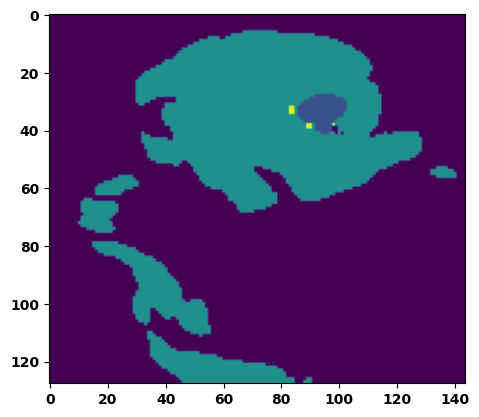

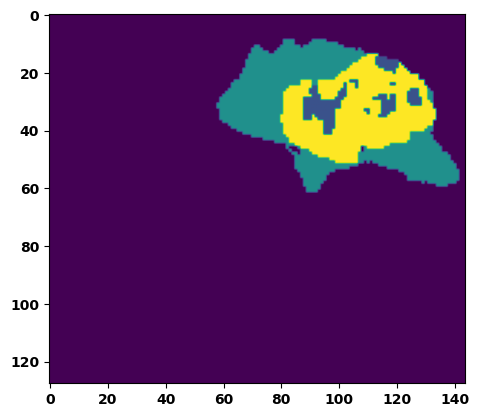

 33%|███▎      | 12/36 [00:12<00:27,  1.15s/it]

Batch_id:  11 Eval loss:  0.7812264561653137
Batch_id:  11 Eval IoU:  tensor(0.1912, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.7662, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:26,  1.13s/it]

Batch_id:  12 Eval loss:  0.06544159352779388
Batch_id:  12 Eval IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.13s/it]

Batch_id:  13 Eval loss:  0.31170403957366943
Batch_id:  13 Eval IoU:  tensor(0.6297, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.8495147824287415
Batch_id:  14 Eval IoU:  tensor(0.0925, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6456, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3959, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9117, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.3260, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.15s/it]

Batch_id:  15 Eval loss:  0.68045973777771
Batch_id:  15 Eval IoU:  tensor(0.2307, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7799, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6558, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.6391, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9107, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.7626042366027832
Batch_id:  16 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.09s/it]

Batch_id:  17 Eval loss:  0.22456535696983337
Batch_id:  17 Eval IoU:  tensor(0.6702, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9817, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.5459631681442261
Batch_id:  18 Eval IoU:  tensor(0.4003, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8606, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:18,  1.17s/it]

Batch_id:  19 Eval loss:  0.19035197794437408
Batch_id:  19 Eval IoU:  tensor(0.8319, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Eval loss:  0.2851136028766632
Batch_id:  20 Eval IoU:  tensor(0.6628, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9298, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9915, device='cuda:0')


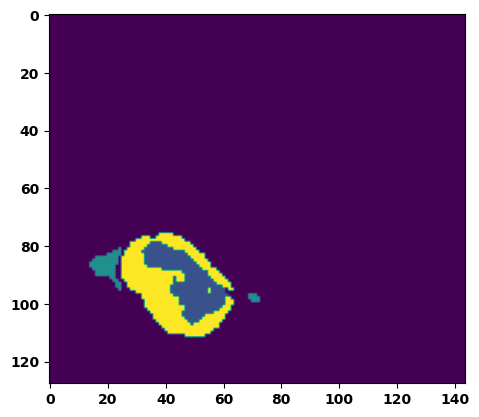

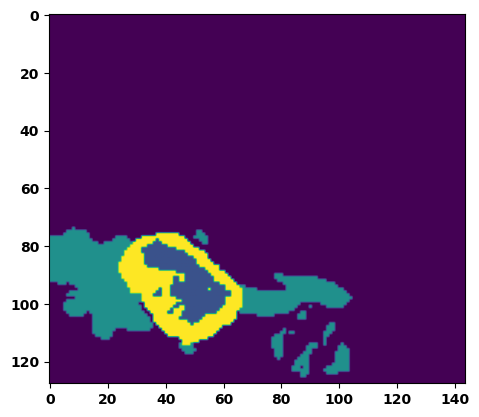

 61%|██████    | 22/36 [00:24<00:15,  1.14s/it]

Batch_id:  21 Eval loss:  0.7746853232383728
Batch_id:  21 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.11s/it]

Batch_id:  22 Eval loss:  0.6094614267349243
Batch_id:  22 Eval IoU:  tensor(0.3162, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8981, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8918, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8230, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9526, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.13s/it]

Batch_id:  23 Eval loss:  0.6891779899597168
Batch_id:  23 Eval IoU:  tensor(0.2464, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8510, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7943, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.7041, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.10s/it]

Batch_id:  24 Eval loss:  0.7635215520858765
Batch_id:  24 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.09s/it]

Batch_id:  25 Eval loss:  0.7241129875183105
Batch_id:  25 Eval IoU:  tensor(0.2195, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8613, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7448, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.7698, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.7686592936515808
Batch_id:  26 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.35659223794937134
Batch_id:  27 Eval IoU:  tensor(0.5135, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9668, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.8727658987045288
Batch_id:  28 Eval IoU:  tensor(0.0772, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6299, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3560, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9281, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2797, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.08s/it]

Batch_id:  29 Eval loss:  0.32600969076156616
Batch_id:  29 Eval IoU:  tensor(0.5582, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  30 Eval loss:  0.7564490437507629
Batch_id:  30 Eval IoU:  tensor(0.2357, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


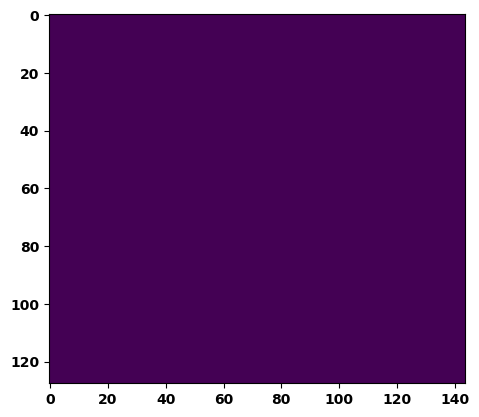

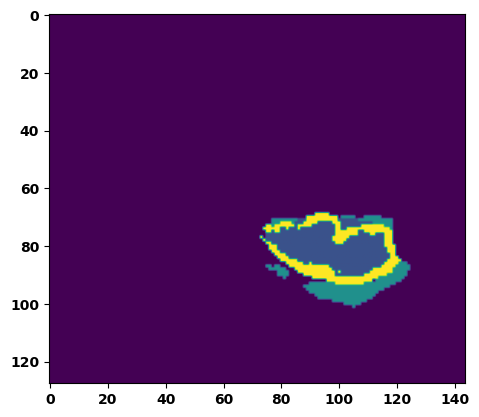

 89%|████████▉ | 32/36 [00:35<00:04,  1.16s/it]

Batch_id:  31 Eval loss:  0.8255999088287354
Batch_id:  31 Eval IoU:  tensor(0.1123, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6754, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4745, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8772, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3766, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.15s/it]

Batch_id:  32 Eval loss:  0.43340569734573364
Batch_id:  32 Eval IoU:  tensor(0.4597, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.14s/it]

Batch_id:  33 Eval loss:  0.6097251176834106
Batch_id:  33 Eval IoU:  tensor(0.2808, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8089, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7132, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.6864, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9312, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.12s/it]

Batch_id:  34 Eval loss:  0.4261559247970581
Batch_id:  34 Eval IoU:  tensor(0.4957, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.7619, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.7589, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.10s/it]

Batch_id:  35 Eval loss:  0.7655385732650757
Batch_id:  35 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Epoch  10 Training loss:  0.20342975475571373
Epoch  10 Evaluation loss:  0.6140587015284432
Epoch  10 Training accuracy :  tensor(0.7241)
Epoch  10 Evaluation accuracy :  tensor(0.3320)
Epoch  10 Training Mean Dice Score:  tensor(0.9824)
Epoch  10 Eval Mean Dice Score:  tensor(0.8774)
Epoch  10 Training Non-tumor Dice Score:  tensor(0.9780)
Epoch  10 Eval Non-tumor Dice Score:  tensor(0.7945)
Epoch  10 Training NCR/NET Dice Score:  tensor(0.9881)
Epoch  10 Eval NCR/NET Dice Score:  tensor(0.9661)
Epoch  10 Training ED Dice Score:  tensor(0.97

Epoch: 11
Training in session: 


  1%|          | 1/110 [00:01<02:10,  1.19s/it]

Batch_id:  0 Training loss:  0.24893297255039215
Batch_id:  0 Training IoU:  tensor(0.6315, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:02,  1.14s/it]

Batch_id:  1 Training loss:  0.21750836074352264
Batch_id:  1 Training IoU:  tensor(0.6678, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:56,  1.09s/it]

Batch_id:  2 Training loss:  0.15048053860664368
Batch_id:  2 Training IoU:  tensor(0.7806, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:55,  1.09s/it]

Batch_id:  3 Training loss:  0.12841500341892242
Batch_id:  3 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:51,  1.06s/it]

Batch_id:  4 Training loss:  0.16339360177516937
Batch_id:  4 Training IoU:  tensor(0.7488, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.3094990849494934
Batch_id:  5 Training IoU:  tensor(0.5707, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9654, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.14279943704605103
Batch_id:  6 Training IoU:  tensor(0.7672, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:48,  1.07s/it]

Batch_id:  7 Training loss:  0.3544451594352722
Batch_id:  7 Training IoU:  tensor(0.5930, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:48,  1.08s/it]

Batch_id:  8 Training loss:  0.16536305844783783
Batch_id:  8 Training IoU:  tensor(0.7410, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:49,  1.09s/it]

Batch_id:  9 Training loss:  0.3405408263206482
Batch_id:  9 Training IoU:  tensor(0.6003, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 10%|█         | 11/110 [00:11<01:46,  1.08s/it]

Batch_id:  10 Training loss:  0.5136500597000122
Batch_id:  10 Training IoU:  tensor(0.4166, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 11%|█         | 12/110 [00:13<01:46,  1.09s/it]

Batch_id:  11 Training loss:  0.14497771859169006
Batch_id:  11 Training IoU:  tensor(0.7787, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:45,  1.09s/it]

Batch_id:  12 Training loss:  0.23541367053985596
Batch_id:  12 Training IoU:  tensor(0.7317, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.09s/it]

Batch_id:  13 Training loss:  0.0852593332529068
Batch_id:  13 Training IoU:  tensor(0.8611, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.3176024556159973
Batch_id:  14 Training IoU:  tensor(0.6237, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.22788719832897186
Batch_id:  15 Training IoU:  tensor(0.6603, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:42,  1.10s/it]

Batch_id:  16 Training loss:  0.12121744453907013
Batch_id:  16 Training IoU:  tensor(0.8179, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.08s/it]

Batch_id:  17 Training loss:  0.2683490216732025
Batch_id:  17 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:39,  1.10s/it]

Batch_id:  18 Training loss:  0.06701153516769409
Batch_id:  18 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.5113382935523987
Batch_id:  19 Training IoU:  tensor(0.4330, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.15518750250339508
Batch_id:  20 Training IoU:  tensor(0.7701, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.07s/it]

Batch_id:  21 Training loss:  0.3263553977012634
Batch_id:  21 Training IoU:  tensor(0.5776, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 21%|██        | 23/110 [00:24<01:32,  1.06s/it]

Batch_id:  22 Training loss:  0.1241244226694107
Batch_id:  22 Training IoU:  tensor(0.7962, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.10187304019927979
Batch_id:  23 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:31,  1.08s/it]

Batch_id:  24 Training loss:  0.2305292934179306
Batch_id:  24 Training IoU:  tensor(0.6505, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:27,  1.04s/it]

Batch_id:  25 Training loss:  0.20101353526115417
Batch_id:  25 Training IoU:  tensor(0.7175, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:27,  1.06s/it]

Batch_id:  26 Training loss:  0.17640681564807892
Batch_id:  26 Training IoU:  tensor(0.7221, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:27,  1.06s/it]

Batch_id:  27 Training loss:  0.2965092658996582
Batch_id:  27 Training IoU:  tensor(0.6302, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.18258731067180634
Batch_id:  28 Training IoU:  tensor(0.7355, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:24,  1.06s/it]

Batch_id:  29 Training loss:  0.12194988131523132
Batch_id:  29 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.34632426500320435
Batch_id:  30 Training IoU:  tensor(0.5682, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:26,  1.11s/it]

Batch_id:  31 Training loss:  0.24314600229263306
Batch_id:  31 Training IoU:  tensor(0.7063, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 30%|███       | 33/110 [00:35<01:26,  1.12s/it]

Batch_id:  32 Training loss:  0.08466225862503052
Batch_id:  32 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 31%|███       | 34/110 [00:36<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.2777889370918274
Batch_id:  33 Training IoU:  tensor(0.6278, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:23,  1.12s/it]

Batch_id:  34 Training loss:  0.3354279398918152
Batch_id:  34 Training IoU:  tensor(0.5797, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:21,  1.10s/it]

Batch_id:  35 Training loss:  0.08939360082149506
Batch_id:  35 Training IoU:  tensor(0.8522, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.13225051760673523
Batch_id:  36 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:18,  1.09s/it]

Batch_id:  37 Training loss:  0.11455188691616058
Batch_id:  37 Training IoU:  tensor(0.8231, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.12697291374206543
Batch_id:  38 Training IoU:  tensor(0.7929, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:16,  1.10s/it]

Batch_id:  39 Training loss:  0.09826341271400452
Batch_id:  39 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.15633875131607056
Batch_id:  40 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.11437065899372101
Batch_id:  41 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:11,  1.07s/it]

Batch_id:  42 Training loss:  0.29182136058807373
Batch_id:  42 Training IoU:  tensor(0.6250, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 40%|████      | 44/110 [00:47<01:10,  1.08s/it]

Batch_id:  43 Training loss:  0.11515377461910248
Batch_id:  43 Training IoU:  tensor(0.8760, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 41%|████      | 45/110 [00:48<01:09,  1.08s/it]

Batch_id:  44 Training loss:  0.2390425205230713
Batch_id:  44 Training IoU:  tensor(0.6659, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:08,  1.08s/it]

Batch_id:  45 Training loss:  0.11157470941543579
Batch_id:  45 Training IoU:  tensor(0.8296, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:07,  1.08s/it]

Batch_id:  46 Training loss:  0.17677056789398193
Batch_id:  46 Training IoU:  tensor(0.7750, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.2086152285337448
Batch_id:  47 Training IoU:  tensor(0.6778, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.10333065688610077
Batch_id:  48 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:03,  1.06s/it]

Batch_id:  49 Training loss:  0.13458053767681122
Batch_id:  49 Training IoU:  tensor(0.8160, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.05s/it]

Batch_id:  50 Training loss:  0.07092475891113281
Batch_id:  50 Training IoU:  tensor(0.8955, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:00,  1.05s/it]

Batch_id:  51 Training loss:  0.16404934227466583
Batch_id:  51 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 48%|████▊     | 53/110 [00:57<00:59,  1.04s/it]

Batch_id:  52 Training loss:  0.07653167843818665
Batch_id:  52 Training IoU:  tensor(0.8733, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.06s/it]

Batch_id:  53 Training loss:  0.31420671939849854
Batch_id:  53 Training IoU:  tensor(0.6263, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.06s/it]

Batch_id:  54 Training loss:  0.28516364097595215
Batch_id:  54 Training IoU:  tensor(0.6599, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.2794105112552643
Batch_id:  55 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.20798040926456451
Batch_id:  56 Training IoU:  tensor(0.7124, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:56,  1.08s/it]

Batch_id:  57 Training loss:  0.290607750415802
Batch_id:  57 Training IoU:  tensor(0.6546, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.07745431363582611
Batch_id:  58 Training IoU:  tensor(0.8726, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.2500973343849182
Batch_id:  59 Training IoU:  tensor(0.6324, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:52,  1.08s/it]

Batch_id:  60 Training loss:  0.10782913863658905
Batch_id:  60 Training IoU:  tensor(0.8258, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.30913376808166504
Batch_id:  61 Training IoU:  tensor(0.5726, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.11904145777225494
Batch_id:  62 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.09789599478244781
Batch_id:  63 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.07814304530620575
Batch_id:  64 Training IoU:  tensor(0.8734, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:48,  1.10s/it]

Batch_id:  65 Training loss:  0.08506849408149719
Batch_id:  65 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:47,  1.12s/it]

Batch_id:  66 Training loss:  0.06508331000804901
Batch_id:  66 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:46,  1.10s/it]

Batch_id:  67 Training loss:  0.0932605117559433
Batch_id:  67 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.10s/it]

Batch_id:  68 Training loss:  0.1699066311120987
Batch_id:  68 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.16038085520267487
Batch_id:  69 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.3668823838233948
Batch_id:  70 Training IoU:  tensor(0.5173, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9590, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.06s/it]

Batch_id:  71 Training loss:  0.13373622298240662
Batch_id:  71 Training IoU:  tensor(0.7875, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:38,  1.04s/it]

Batch_id:  72 Training loss:  0.2289915233850479
Batch_id:  72 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:37,  1.05s/it]

Batch_id:  73 Training loss:  0.16621261835098267
Batch_id:  73 Training IoU:  tensor(0.7404, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9686, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.09s/it]

Batch_id:  74 Training loss:  0.24226072430610657
Batch_id:  74 Training IoU:  tensor(0.6995, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.2107231765985489
Batch_id:  75 Training IoU:  tensor(0.6822, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.28267085552215576
Batch_id:  76 Training IoU:  tensor(0.6262, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:34,  1.09s/it]

Batch_id:  77 Training loss:  0.08399321138858795
Batch_id:  77 Training IoU:  tensor(0.8643, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.1874065399169922
Batch_id:  78 Training IoU:  tensor(0.7130, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:31,  1.05s/it]

Batch_id:  79 Training loss:  0.2704669237136841
Batch_id:  79 Training IoU:  tensor(0.6223, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.0987095981836319
Batch_id:  80 Training IoU:  tensor(0.8377, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.07414799928665161
Batch_id:  81 Training IoU:  tensor(0.8784, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:29,  1.08s/it]

Batch_id:  82 Training loss:  0.23870952427387238
Batch_id:  82 Training IoU:  tensor(0.7021, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.46922004222869873
Batch_id:  83 Training IoU:  tensor(0.4671, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.16878743469715118
Batch_id:  84 Training IoU:  tensor(0.7382, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.0758838951587677
Batch_id:  85 Training IoU:  tensor(0.8742, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:24,  1.08s/it]

Batch_id:  86 Training loss:  0.1086345762014389
Batch_id:  86 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.5348763465881348
Batch_id:  87 Training IoU:  tensor(0.4011, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.1331222504377365
Batch_id:  88 Training IoU:  tensor(0.8280, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.09s/it]

Batch_id:  89 Training loss:  0.15721921622753143
Batch_id:  89 Training IoU:  tensor(0.7489, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.1622723639011383
Batch_id:  90 Training IoU:  tensor(0.7787, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:20,  1.11s/it]

Batch_id:  91 Training loss:  0.39492180943489075
Batch_id:  91 Training IoU:  tensor(0.5593, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.11109328269958496
Batch_id:  92 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.1626596301794052
Batch_id:  93 Training IoU:  tensor(0.7559, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.20533610880374908
Batch_id:  94 Training IoU:  tensor(0.7217, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:14,  1.07s/it]

Batch_id:  95 Training loss:  0.176632821559906
Batch_id:  95 Training IoU:  tensor(0.7388, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:13,  1.06s/it]

Batch_id:  96 Training loss:  0.17092402279376984
Batch_id:  96 Training IoU:  tensor(0.7519, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.11685396730899811
Batch_id:  97 Training IoU:  tensor(0.8131, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.12638643383979797
Batch_id:  98 Training IoU:  tensor(0.8151, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.1436454802751541
Batch_id:  99 Training IoU:  tensor(0.7760, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.49735188484191895
Batch_id:  100 Training IoU:  tensor(0.4109, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.8865, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.09036792814731598
Batch_id:  101 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.14412128925323486
Batch_id:  102 Training IoU:  tensor(0.7712, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.1109708845615387
Batch_id:  103 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.06s/it]

Batch_id:  104 Training loss:  0.13561813533306122
Batch_id:  104 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.06s/it]

Batch_id:  105 Training loss:  0.15719616413116455
Batch_id:  105 Training IoU:  tensor(0.7500, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.5736821293830872
Batch_id:  106 Training IoU:  tensor(0.3344, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.8843, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.1984269917011261
Batch_id:  107 Training IoU:  tensor(0.7073, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.1764470487833023
Batch_id:  108 Training IoU:  tensor(0.7285, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.17084138095378876
Batch_id:  109 Training IoU:  tensor(0.7500, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9927, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5722258687019348
Batch_id:  0 Eval IoU:  tensor(0.3047, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8148, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.6571, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.6403, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9726, device='cuda:0')


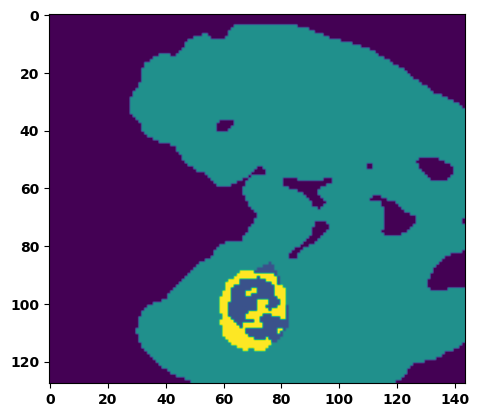

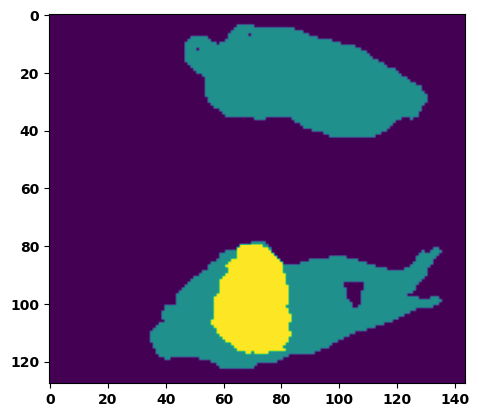

  6%|▌         | 2/36 [00:02<00:37,  1.09s/it]

Batch_id:  1 Eval loss:  0.7738052606582642
Batch_id:  1 Eval IoU:  tensor(0.2022, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8199, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8602, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.07s/it]

Batch_id:  2 Eval loss:  0.7560678720474243
Batch_id:  2 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.05s/it]

Batch_id:  3 Eval loss:  0.72316575050354
Batch_id:  3 Eval IoU:  tensor(0.2560, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8131, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.05s/it]

Batch_id:  4 Eval loss:  0.6571680307388306
Batch_id:  4 Eval IoU:  tensor(0.2293, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.7078, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4759, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8318, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.6195, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9039, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.03s/it]

Batch_id:  5 Eval loss:  0.7227597236633301
Batch_id:  5 Eval IoU:  tensor(0.2134, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8265, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.7213, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.6540, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.6752543449401855
Batch_id:  6 Eval IoU:  tensor(0.2733, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8740, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9552, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.03s/it]

Batch_id:  7 Eval loss:  0.8844320178031921
Batch_id:  7 Eval IoU:  tensor(0.0732, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6192, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4127, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9026, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.2402, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.546741247177124
Batch_id:  8 Eval IoU:  tensor(0.3435, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7533, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.5334, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.5315, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9911, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.10s/it]

Batch_id:  9 Eval loss:  0.7569619417190552
Batch_id:  9 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  10 Eval loss:  0.7515890002250671
Batch_id:  10 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


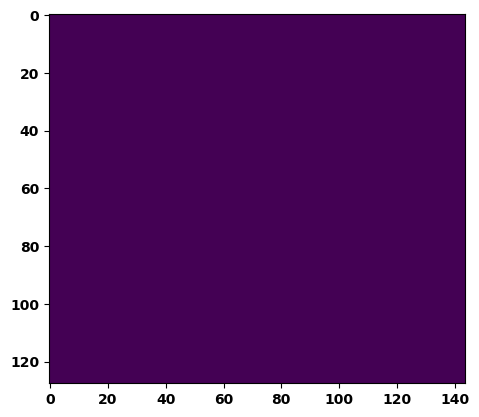

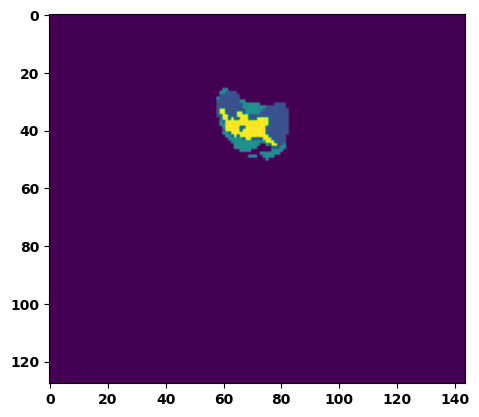

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.7754907608032227
Batch_id:  11 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.765210747718811
Batch_id:  12 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.44933614134788513
Batch_id:  13 Eval IoU:  tensor(0.4358, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8602, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9235, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.763302743434906
Batch_id:  14 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.05s/it]

Batch_id:  15 Eval loss:  0.28519967198371887
Batch_id:  15 Eval IoU:  tensor(0.6201, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9917, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:19,  1.04s/it]

Batch_id:  16 Eval loss:  0.30786237120628357
Batch_id:  16 Eval IoU:  tensor(0.5620, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9668, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.7079495191574097
Batch_id:  17 Eval IoU:  tensor(0.1863, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6341, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3099, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9078, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.5967, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.7219, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.06s/it]

Batch_id:  18 Eval loss:  0.7623556852340698
Batch_id:  18 Eval IoU:  tensor(0.2253, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.09s/it]

Batch_id:  19 Eval loss:  0.6739000082015991
Batch_id:  19 Eval IoU:  tensor(0.2363, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6642, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3866, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.3402, device='cuda:0')
Batch_id:  20 Eval loss:  0.6328872442245483
Batch_id:  20 Eval IoU:  tensor(0.2439, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7277, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.5069, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.5557, device='cuda:0')


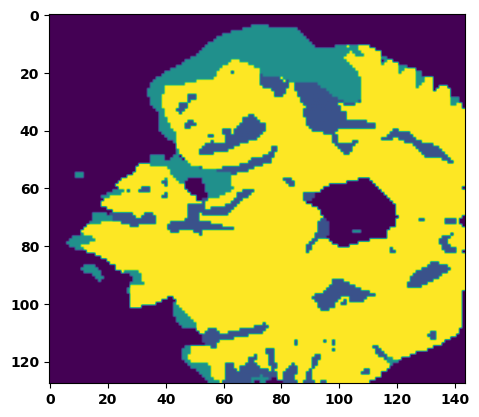

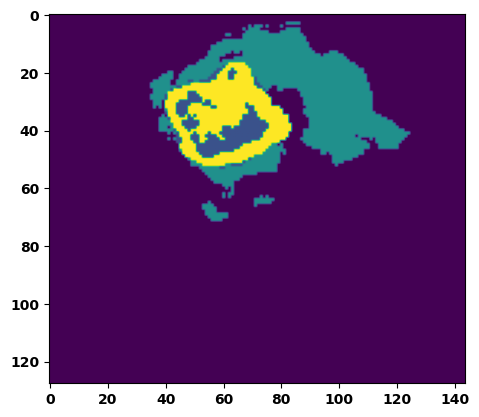

 61%|██████    | 22/36 [00:23<00:15,  1.12s/it]

Batch_id:  21 Eval loss:  0.292389452457428
Batch_id:  21 Eval IoU:  tensor(0.6345, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.7647227644920349
Batch_id:  22 Eval IoU:  tensor(0.2211, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8851, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.08s/it]

Batch_id:  23 Eval loss:  0.6357070207595825
Batch_id:  23 Eval IoU:  tensor(0.3147, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9054, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8312, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:12,  1.10s/it]

Batch_id:  24 Eval loss:  0.12455207109451294
Batch_id:  24 Eval IoU:  tensor(0.7914, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.09s/it]

Batch_id:  25 Eval loss:  0.7636399865150452
Batch_id:  25 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.11s/it]

Batch_id:  26 Eval loss:  0.44321927428245544
Batch_id:  26 Eval IoU:  tensor(0.4971, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9843, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.08s/it]

Batch_id:  27 Eval loss:  0.765816330909729
Batch_id:  27 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.06s/it]

Batch_id:  28 Eval loss:  0.7690495848655701
Batch_id:  28 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.05s/it]

Batch_id:  29 Eval loss:  0.8167446851730347
Batch_id:  29 Eval IoU:  tensor(0.1389, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7718, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5638, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.6573, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  30 Eval loss:  0.5659717321395874
Batch_id:  30 Eval IoU:  tensor(0.3910, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


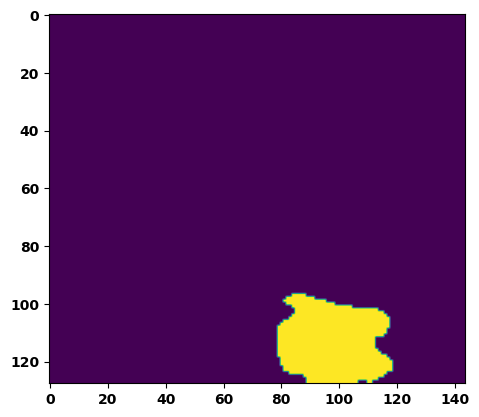

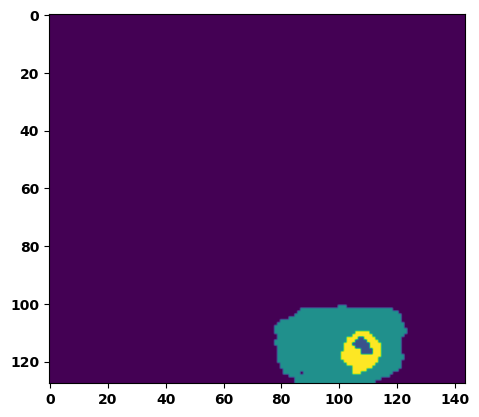

 89%|████████▉ | 32/36 [00:34<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.7535463571548462
Batch_id:  31 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.14s/it]

Batch_id:  32 Eval loss:  0.8347067832946777
Batch_id:  32 Eval IoU:  tensor(0.1074, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6669, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4666, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9045, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.3748, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9217, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.14s/it]

Batch_id:  33 Eval loss:  0.7664210796356201
Batch_id:  33 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.13s/it]

Batch_id:  34 Eval loss:  0.665228545665741
Batch_id:  34 Eval IoU:  tensor(0.2869, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9698, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.6583877801895142
Batch_id:  35 Eval IoU:  tensor(0.2366, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7963, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6396, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.6117, device='cuda:0')
Epoch  11 Training loss:  0.19719614752314307
Epoch  11 Evaluation loss:  0.6545491500033273
Epoch  11 Training accuracy :  tensor(0.7301)
Epoch  11 Evaluation accuracy :  tensor(0.2918)
Epoch  11 Training Mean Dice Score:  tensor(0.9832)
Epoch  11 Eval Mean Dice Score:  tensor(0.8819)
Epoch  11 Training Non-tumor Dice Score:  tensor(0.9788)
Epoch  11 Eval Non-tumor Dice Score:  tensor(0.7991)
Epoch  11 Training NCR/NET Dice Score:  tensor(0.9884)
Epoch  11 Eval NCR/NET Dice Score:  tensor(0.9629)
Epoch  11 Training ED Dice Score:  tensor(0.97

Epoch: 12
Training in session: 


  1%|          | 1/110 [00:01<02:33,  1.41s/it]

Batch_id:  0 Training loss:  0.15651820600032806
Batch_id:  0 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:11,  1.22s/it]

Batch_id:  1 Training loss:  0.14761006832122803
Batch_id:  1 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:03,  1.16s/it]

Batch_id:  2 Training loss:  0.41619643568992615
Batch_id:  2 Training IoU:  tensor(0.5368, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9232, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.254377543926239
Batch_id:  3 Training IoU:  tensor(0.7057, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


  5%|▍         | 5/110 [00:05<02:03,  1.18s/it]

Batch_id:  4 Training loss:  0.28003209829330444
Batch_id:  4 Training IoU:  tensor(0.6288, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  5%|▌         | 6/110 [00:07<01:58,  1.14s/it]

Batch_id:  5 Training loss:  0.10960277915000916
Batch_id:  5 Training IoU:  tensor(0.8180, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


  6%|▋         | 7/110 [00:08<01:55,  1.12s/it]

Batch_id:  6 Training loss:  0.1091795563697815
Batch_id:  6 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:54,  1.12s/it]

Batch_id:  7 Training loss:  0.38882559537887573
Batch_id:  7 Training IoU:  tensor(0.5026, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9221, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:53,  1.13s/it]

Batch_id:  8 Training loss:  0.10278362035751343
Batch_id:  8 Training IoU:  tensor(0.8279, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:51,  1.11s/it]

Batch_id:  9 Training loss:  0.17322494089603424
Batch_id:  9 Training IoU:  tensor(0.7465, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.11s/it]

Batch_id:  10 Training loss:  0.1679813414812088
Batch_id:  10 Training IoU:  tensor(0.7370, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.11s/it]

Batch_id:  11 Training loss:  0.48032093048095703
Batch_id:  11 Training IoU:  tensor(0.4291, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.8930, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:45,  1.09s/it]

Batch_id:  12 Training loss:  0.196910560131073
Batch_id:  12 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:43,  1.08s/it]

Batch_id:  13 Training loss:  0.4995921850204468
Batch_id:  13 Training IoU:  tensor(0.4286, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:42,  1.08s/it]

Batch_id:  14 Training loss:  0.13207921385765076
Batch_id:  14 Training IoU:  tensor(0.7854, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.24065352976322174
Batch_id:  15 Training IoU:  tensor(0.6325, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.08929893374443054
Batch_id:  16 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.21277903020381927
Batch_id:  17 Training IoU:  tensor(0.7246, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.18927299976348877
Batch_id:  18 Training IoU:  tensor(0.7141, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.0798572450876236
Batch_id:  19 Training IoU:  tensor(0.8662, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.1416771113872528
Batch_id:  20 Training IoU:  tensor(0.7920, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 20%|██        | 22/110 [00:24<01:35,  1.08s/it]

Batch_id:  21 Training loss:  0.29804134368896484
Batch_id:  21 Training IoU:  tensor(0.6602, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 21%|██        | 23/110 [00:25<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.1746555119752884
Batch_id:  22 Training IoU:  tensor(0.7706, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:31,  1.07s/it]

Batch_id:  23 Training loss:  0.11251366138458252
Batch_id:  23 Training IoU:  tensor(0.8145, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.08s/it]

Batch_id:  24 Training loss:  0.27213892340660095
Batch_id:  24 Training IoU:  tensor(0.6787, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.09400114417076111
Batch_id:  25 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.09027209877967834
Batch_id:  26 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.18881919980049133
Batch_id:  27 Training IoU:  tensor(0.7086, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9671, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.09696927666664124
Batch_id:  28 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.17858998477458954
Batch_id:  29 Training IoU:  tensor(0.7200, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.11855348944664001
Batch_id:  30 Training IoU:  tensor(0.8143, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.07197149097919464
Batch_id:  31 Training IoU:  tensor(0.8811, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 30%|███       | 33/110 [00:36<01:23,  1.08s/it]

Batch_id:  32 Training loss:  0.2642829418182373
Batch_id:  32 Training IoU:  tensor(0.6204, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.15048891305923462
Batch_id:  33 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.10489168763160706
Batch_id:  34 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:20,  1.08s/it]

Batch_id:  35 Training loss:  0.19406357407569885
Batch_id:  35 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.18864771723747253
Batch_id:  36 Training IoU:  tensor(0.7314, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.11s/it]

Batch_id:  37 Training loss:  0.3204895257949829
Batch_id:  37 Training IoU:  tensor(0.5976, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:18,  1.11s/it]

Batch_id:  38 Training loss:  0.11127732694149017
Batch_id:  38 Training IoU:  tensor(0.8327, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.3444523215293884
Batch_id:  39 Training IoU:  tensor(0.5443, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9708, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:17,  1.12s/it]

Batch_id:  40 Training loss:  0.1541803479194641
Batch_id:  40 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:16,  1.13s/it]

Batch_id:  41 Training loss:  0.32780227065086365
Batch_id:  41 Training IoU:  tensor(0.6120, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.12s/it]

Batch_id:  42 Training loss:  0.14140449464321136
Batch_id:  42 Training IoU:  tensor(0.7716, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.09s/it]

Batch_id:  43 Training loss:  0.14157572388648987
Batch_id:  43 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.09620733559131622
Batch_id:  44 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:10,  1.11s/it]

Batch_id:  45 Training loss:  0.1811601221561432
Batch_id:  45 Training IoU:  tensor(0.7429, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.1809299737215042
Batch_id:  46 Training IoU:  tensor(0.7204, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.24801112711429596
Batch_id:  47 Training IoU:  tensor(0.6522, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.09821799397468567
Batch_id:  48 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:06,  1.12s/it]

Batch_id:  49 Training loss:  0.19503706693649292
Batch_id:  49 Training IoU:  tensor(0.6945, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.1301116943359375
Batch_id:  50 Training IoU:  tensor(0.7969, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:01,  1.06s/it]

Batch_id:  51 Training loss:  0.1443379670381546
Batch_id:  51 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.16475774347782135
Batch_id:  52 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 49%|████▉     | 54/110 [00:59<00:59,  1.07s/it]

Batch_id:  53 Training loss:  0.11788131296634674
Batch_id:  53 Training IoU:  tensor(0.8172, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.14889654517173767
Batch_id:  54 Training IoU:  tensor(0.7599, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.14734679460525513
Batch_id:  55 Training IoU:  tensor(0.7600, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.3310367166996002
Batch_id:  56 Training IoU:  tensor(0.5886, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.5081777572631836
Batch_id:  57 Training IoU:  tensor(0.4057, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.2802831530570984
Batch_id:  58 Training IoU:  tensor(0.6173, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.11451677978038788
Batch_id:  59 Training IoU:  tensor(0.8177, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.11s/it]

Batch_id:  60 Training loss:  0.0746670663356781
Batch_id:  60 Training IoU:  tensor(0.8752, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.08591125905513763
Batch_id:  61 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:54,  1.16s/it]

Batch_id:  62 Training loss:  0.31808555126190186
Batch_id:  62 Training IoU:  tensor(0.6092, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:51,  1.12s/it]

Batch_id:  63 Training loss:  0.14407238364219666
Batch_id:  63 Training IoU:  tensor(0.7747, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.17348988354206085
Batch_id:  64 Training IoU:  tensor(0.7795, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:49,  1.11s/it]

Batch_id:  65 Training loss:  0.07342474162578583
Batch_id:  65 Training IoU:  tensor(0.8815, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:46,  1.09s/it]

Batch_id:  66 Training loss:  0.20097997784614563
Batch_id:  66 Training IoU:  tensor(0.7090, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.12460717558860779
Batch_id:  67 Training IoU:  tensor(0.7988, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.08s/it]

Batch_id:  68 Training loss:  0.11098390817642212
Batch_id:  68 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.30583256483078003
Batch_id:  69 Training IoU:  tensor(0.5711, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9267, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9219, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9701, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:41,  1.07s/it]

Batch_id:  70 Training loss:  0.3154122829437256
Batch_id:  70 Training IoU:  tensor(0.5820, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.11543257534503937
Batch_id:  71 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:39,  1.08s/it]

Batch_id:  72 Training loss:  0.12632031738758087
Batch_id:  72 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.12309339642524719
Batch_id:  73 Training IoU:  tensor(0.8133, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:36,  1.05s/it]

Batch_id:  74 Training loss:  0.23006393015384674
Batch_id:  74 Training IoU:  tensor(0.6679, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.07105396687984467
Batch_id:  75 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.13018770515918732
Batch_id:  76 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:33,  1.06s/it]

Batch_id:  77 Training loss:  0.1608254611492157
Batch_id:  77 Training IoU:  tensor(0.7526, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.12625741958618164
Batch_id:  78 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.08489985764026642
Batch_id:  79 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.09059543907642365
Batch_id:  80 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:29,  1.06s/it]

Batch_id:  81 Training loss:  0.16212423145771027
Batch_id:  81 Training IoU:  tensor(0.7753, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:28,  1.05s/it]

Batch_id:  82 Training loss:  0.08116120100021362
Batch_id:  82 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.140961691737175
Batch_id:  83 Training IoU:  tensor(0.7760, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.2792894244194031
Batch_id:  84 Training IoU:  tensor(0.6768, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.31816667318344116
Batch_id:  85 Training IoU:  tensor(0.5582, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9673, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.0579240620136261
Batch_id:  86 Training IoU:  tensor(0.9020, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.09s/it]

Batch_id:  87 Training loss:  0.13472679257392883
Batch_id:  87 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.07s/it]

Batch_id:  88 Training loss:  0.24308621883392334
Batch_id:  88 Training IoU:  tensor(0.7202, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.09s/it]

Batch_id:  89 Training loss:  0.2933735251426697
Batch_id:  89 Training IoU:  tensor(0.6544, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.08s/it]

Batch_id:  90 Training loss:  0.10880590975284576
Batch_id:  90 Training IoU:  tensor(0.8179, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.06s/it]

Batch_id:  91 Training loss:  0.09970514476299286
Batch_id:  91 Training IoU:  tensor(0.8392, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.07s/it]

Batch_id:  92 Training loss:  0.30957889556884766
Batch_id:  92 Training IoU:  tensor(0.6353, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:16,  1.06s/it]

Batch_id:  93 Training loss:  0.285893976688385
Batch_id:  93 Training IoU:  tensor(0.6060, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.07s/it]

Batch_id:  94 Training loss:  0.18028393387794495
Batch_id:  94 Training IoU:  tensor(0.7329, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.3598942756652832
Batch_id:  95 Training IoU:  tensor(0.5800, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:13,  1.06s/it]

Batch_id:  96 Training loss:  0.16462109982967377
Batch_id:  96 Training IoU:  tensor(0.7322, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:12,  1.05s/it]

Batch_id:  97 Training loss:  0.15672919154167175
Batch_id:  97 Training IoU:  tensor(0.7491, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.09249454736709595
Batch_id:  98 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.31561630964279175
Batch_id:  99 Training IoU:  tensor(0.6005, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.12568552792072296
Batch_id:  100 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.4284641742706299
Batch_id:  101 Training IoU:  tensor(0.5050, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.5663590431213379
Batch_id:  102 Training IoU:  tensor(0.3421, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9010, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.18154236674308777
Batch_id:  103 Training IoU:  tensor(0.7325, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.05s/it]

Batch_id:  104 Training loss:  0.158774733543396
Batch_id:  104 Training IoU:  tensor(0.7511, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.03s/it]

Batch_id:  105 Training loss:  0.16690963506698608
Batch_id:  105 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.05s/it]

Batch_id:  106 Training loss:  0.11550325155258179
Batch_id:  106 Training IoU:  tensor(0.8094, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.16489383578300476
Batch_id:  107 Training IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.21464377641677856
Batch_id:  108 Training IoU:  tensor(0.6980, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.5788711905479431
Batch_id:  109 Training IoU:  tensor(0.3556, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9896, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6064137816429138
Batch_id:  0 Eval IoU:  tensor(0.2867, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8099, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7064, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8832, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7186, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9315, device='cuda:0')


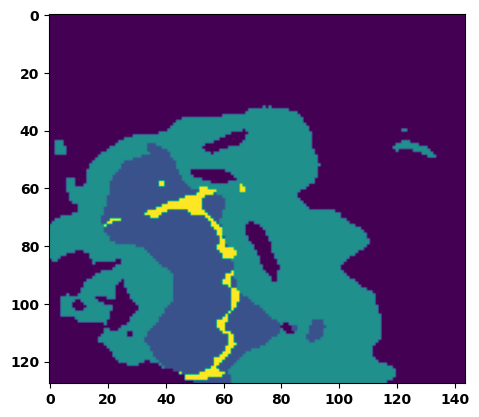

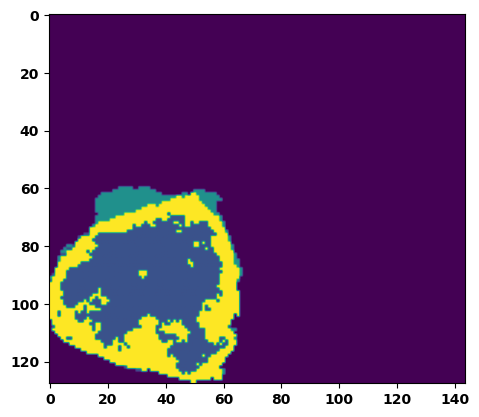

  6%|▌         | 2/36 [00:02<00:36,  1.06s/it]

Batch_id:  1 Eval loss:  0.7207703590393066
Batch_id:  1 Eval IoU:  tensor(0.1977, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.6163, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.2967, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2623, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.06s/it]

Batch_id:  2 Eval loss:  0.12289133667945862
Batch_id:  2 Eval IoU:  tensor(0.7979, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.05s/it]

Batch_id:  3 Eval loss:  0.7653031349182129
Batch_id:  3 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.5404312610626221
Batch_id:  4 Eval IoU:  tensor(0.3604, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9141, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8855, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8626, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9474, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.03s/it]

Batch_id:  5 Eval loss:  0.20249027013778687
Batch_id:  5 Eval IoU:  tensor(0.7205, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.01s/it]

Batch_id:  6 Eval loss:  0.4637841284275055
Batch_id:  6 Eval IoU:  tensor(0.4301, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9787, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.04s/it]

Batch_id:  7 Eval loss:  0.7754783630371094
Batch_id:  7 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.02s/it]

Batch_id:  8 Eval loss:  0.892076313495636
Batch_id:  8 Eval IoU:  tensor(0.0672, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6096, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3934, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2200, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.04s/it]

Batch_id:  9 Eval loss:  0.4905690550804138
Batch_id:  9 Eval IoU:  tensor(0.4024, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8957, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8562, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  10 Eval loss:  0.4376507103443146
Batch_id:  10 Eval IoU:  tensor(0.4754, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8713, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7708, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.7668, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


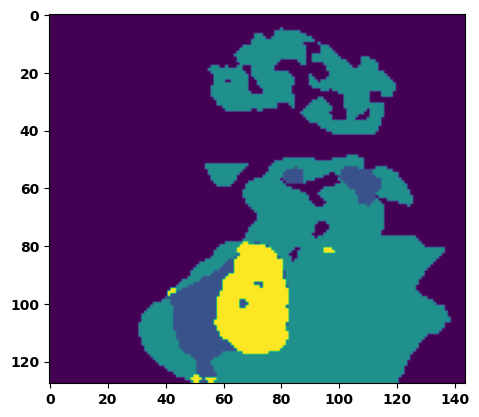

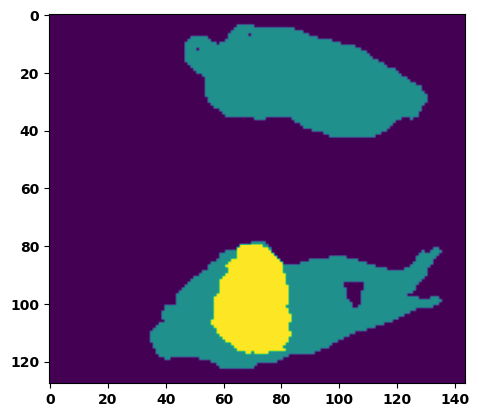

 31%|███       | 11/36 [00:11<00:27,  1.10s/it]

Batch_id:  11 Eval loss:  0.33801981806755066
Batch_id:  11 Eval IoU:  tensor(0.5323, device='cuda:0')


 33%|███▎      | 12/36 [00:13<00:28,  1.17s/it]

Batch_id:  11 Eval Mean Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9169, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:25,  1.11s/it]

Batch_id:  12 Eval loss:  0.7193084955215454
Batch_id:  12 Eval IoU:  tensor(0.2083, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8025, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6971, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.6094, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:25,  1.15s/it]

Batch_id:  13 Eval loss:  0.8257529735565186
Batch_id:  13 Eval IoU:  tensor(0.1111, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6711, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4414, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.7891, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8663, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.5877, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.11s/it]

Batch_id:  14 Eval loss:  0.7765893936157227
Batch_id:  14 Eval IoU:  tensor(0.1448, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6897, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4213, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.5134, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.12s/it]

Batch_id:  15 Eval loss:  0.7634952068328857
Batch_id:  15 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.2868313789367676
Batch_id:  16 Eval IoU:  tensor(0.5844, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:20,  1.15s/it]

Batch_id:  17 Eval loss:  0.21603308618068695
Batch_id:  17 Eval IoU:  tensor(0.7064, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:19,  1.12s/it]

Batch_id:  18 Eval loss:  0.779842734336853
Batch_id:  18 Eval IoU:  tensor(0.1946, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.7838, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8963, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.07s/it]

Batch_id:  19 Eval loss:  0.7631422281265259
Batch_id:  19 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  20 Eval loss:  0.8413832187652588
Batch_id:  20 Eval IoU:  tensor(0.0943, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6337, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3686, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9117, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3278, device='cuda:0')


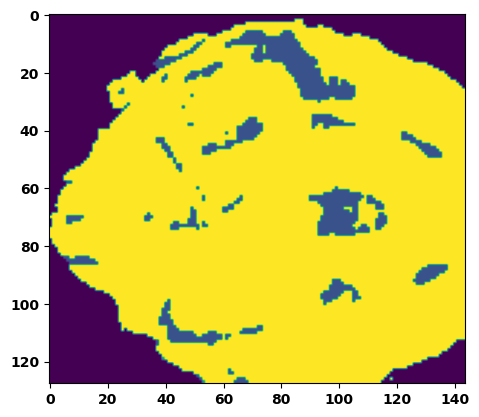

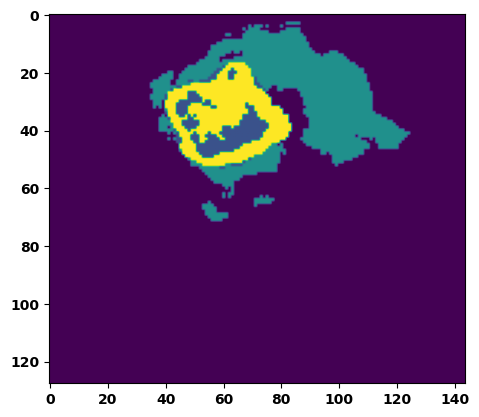

 61%|██████    | 22/36 [00:23<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.7517061233520508
Batch_id:  21 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.09s/it]

Batch_id:  22 Eval loss:  0.7535501718521118
Batch_id:  22 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.37203091382980347
Batch_id:  23 Eval IoU:  tensor(0.5153, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9932, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.08s/it]

Batch_id:  24 Eval loss:  0.7570216655731201
Batch_id:  24 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.7659177184104919
Batch_id:  25 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.70839923620224
Batch_id:  26 Eval IoU:  tensor(0.2008, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6452, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.3557, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.3012, device='cuda:0')
Batch_id:  27 Eval loss:  0.7717676162719727
Batch_id:  27 Eval IoU:  tensor(0.1999, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:09,  1.16s/it]

Batch_id:  27 Eval Mean Dice Score:  tensor(0.8865, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7933, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8869, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.10s/it]

Batch_id:  28 Eval loss:  0.8156251907348633
Batch_id:  28 Eval IoU:  tensor(0.1164, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6766, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4769, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8962, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8752, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.4582, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.12s/it]

Batch_id:  29 Eval loss:  0.7690308690071106
Batch_id:  29 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  30 Eval loss:  0.3417927026748657
Batch_id:  30 Eval IoU:  tensor(0.5864, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9913, device='cuda:0')


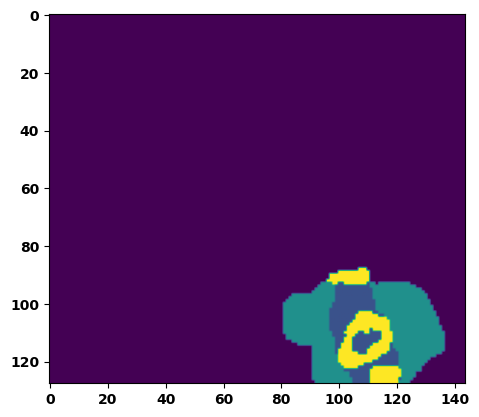

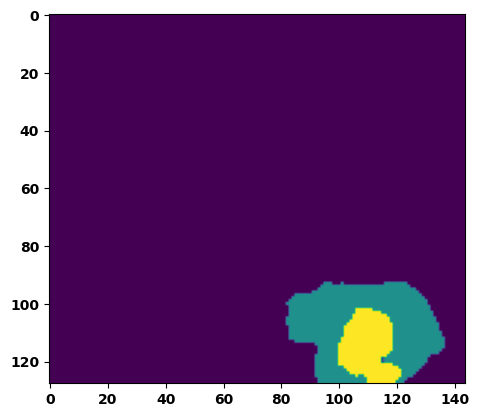

 89%|████████▉ | 32/36 [00:35<00:04,  1.13s/it]

Batch_id:  31 Eval loss:  0.2442769855260849
Batch_id:  31 Eval IoU:  tensor(0.6732, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9805, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.13s/it]

Batch_id:  32 Eval loss:  0.04494717717170715
Batch_id:  32 Eval IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.12s/it]

Batch_id:  33 Eval loss:  0.2421995997428894
Batch_id:  33 Eval IoU:  tensor(0.7077, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.13s/it]

Batch_id:  34 Eval loss:  0.5696006417274475
Batch_id:  34 Eval IoU:  tensor(0.3460, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9563, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.10s/it]

Batch_id:  35 Eval loss:  0.8231703042984009
Batch_id:  35 Eval IoU:  tensor(0.1126, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6856, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4267, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.3725, device='cuda:0')
Epoch 00013: reducing learning rate of group 0 to 2.5000e-04.
Epoch  12 Training loss:  0.1951640771193938
Epoch  12 Evaluation loss:  0.5849803934494654
Epoch  12 Training accuracy :  tensor(0.7304)
Epoch  12 Evaluation accuracy :  tensor(0.3533)
Epoch  12 Training Mean Dice Score:  tensor(0.9831)
Epoch  12 Eval Mean Dice Score:  tensor(0.8765)
Epoch  12 Training Non-tumor Dice Score:  tensor(0.9787)
Epoch  12 Eval Non-tumor Dice Score:  tensor(0.7888)
Epoch  12 Training NCR/NET Dice Score:  tensor(0.9879)
Epoch  12 Eval NCR/NET Dice Score:  

Epoch: 13
Training in session: 


  1%|          | 1/110 [00:01<02:01,  1.11s/it]

Batch_id:  0 Training loss:  0.32096853852272034
Batch_id:  0 Training IoU:  tensor(0.6130, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:57,  1.09s/it]

Batch_id:  1 Training loss:  0.1445385068655014
Batch_id:  1 Training IoU:  tensor(0.7646, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.14s/it]

Batch_id:  2 Training loss:  0.09442293643951416
Batch_id:  2 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:55,  1.09s/it]

Batch_id:  3 Training loss:  0.26475274562835693
Batch_id:  3 Training IoU:  tensor(0.6301, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:52,  1.07s/it]

Batch_id:  4 Training loss:  0.15923544764518738
Batch_id:  4 Training IoU:  tensor(0.7549, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:52,  1.08s/it]

Batch_id:  5 Training loss:  0.15607690811157227
Batch_id:  5 Training IoU:  tensor(0.7521, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:52,  1.10s/it]

Batch_id:  6 Training loss:  0.12454567849636078
Batch_id:  6 Training IoU:  tensor(0.8111, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:56,  1.14s/it]

Batch_id:  7 Training loss:  0.0767769068479538
Batch_id:  7 Training IoU:  tensor(0.8715, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:51,  1.11s/it]

Batch_id:  8 Training loss:  0.2301693558692932
Batch_id:  8 Training IoU:  tensor(0.6699, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.1644432097673416
Batch_id:  9 Training IoU:  tensor(0.7427, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.11s/it]

Batch_id:  10 Training loss:  0.2952384948730469
Batch_id:  10 Training IoU:  tensor(0.6451, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 11%|█         | 12/110 [00:13<01:47,  1.10s/it]

Batch_id:  11 Training loss:  0.1543821096420288
Batch_id:  11 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:44,  1.07s/it]

Batch_id:  12 Training loss:  0.227603480219841
Batch_id:  12 Training IoU:  tensor(0.6561, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:44,  1.08s/it]

Batch_id:  13 Training loss:  0.06965973973274231
Batch_id:  13 Training IoU:  tensor(0.8801, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.07s/it]

Batch_id:  14 Training loss:  0.12634919583797455
Batch_id:  14 Training IoU:  tensor(0.8075, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.161439910531044
Batch_id:  15 Training IoU:  tensor(0.7563, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:40,  1.08s/it]

Batch_id:  16 Training loss:  0.3916069269180298
Batch_id:  16 Training IoU:  tensor(0.5645, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:37,  1.06s/it]

Batch_id:  17 Training loss:  0.11386598646640778
Batch_id:  17 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.0996597558259964
Batch_id:  18 Training IoU:  tensor(0.8613, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.14187586307525635
Batch_id:  19 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:39,  1.12s/it]

Batch_id:  20 Training loss:  0.26536160707473755
Batch_id:  20 Training IoU:  tensor(0.6856, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 20%|██        | 22/110 [00:24<01:38,  1.12s/it]

Batch_id:  21 Training loss:  0.07549281418323517
Batch_id:  21 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 21%|██        | 23/110 [00:25<01:35,  1.09s/it]

Batch_id:  22 Training loss:  0.1580786257982254
Batch_id:  22 Training IoU:  tensor(0.7695, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.08423958718776703
Batch_id:  23 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.1368720978498459
Batch_id:  24 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:29,  1.07s/it]

Batch_id:  25 Training loss:  0.1448480188846588
Batch_id:  25 Training IoU:  tensor(0.7674, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:29,  1.08s/it]

Batch_id:  26 Training loss:  0.17123565077781677
Batch_id:  26 Training IoU:  tensor(0.7797, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:29,  1.09s/it]

Batch_id:  27 Training loss:  0.23535245656967163
Batch_id:  27 Training IoU:  tensor(0.6650, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:29,  1.11s/it]

Batch_id:  28 Training loss:  0.11204828321933746
Batch_id:  28 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:29,  1.12s/it]

Batch_id:  29 Training loss:  0.0875643640756607
Batch_id:  29 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:29,  1.14s/it]

Batch_id:  30 Training loss:  0.0928119570016861
Batch_id:  30 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:28,  1.14s/it]

Batch_id:  31 Training loss:  0.5303869843482971
Batch_id:  31 Training IoU:  tensor(0.3699, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.10s/it]

Batch_id:  32 Training loss:  0.3413950800895691
Batch_id:  32 Training IoU:  tensor(0.6051, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 31%|███       | 34/110 [00:37<01:22,  1.08s/it]

Batch_id:  33 Training loss:  0.13425438106060028
Batch_id:  33 Training IoU:  tensor(0.7765, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:22,  1.10s/it]

Batch_id:  34 Training loss:  0.15052109956741333
Batch_id:  34 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.09681640565395355
Batch_id:  35 Training IoU:  tensor(0.8401, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.15752030909061432
Batch_id:  36 Training IoU:  tensor(0.7536, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.13971355557441711
Batch_id:  37 Training IoU:  tensor(0.7779, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.12685900926589966
Batch_id:  38 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:17,  1.10s/it]

Batch_id:  39 Training loss:  0.07421539723873138
Batch_id:  39 Training IoU:  tensor(0.8761, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:17,  1.12s/it]

Batch_id:  40 Training loss:  0.06522898375988007
Batch_id:  40 Training IoU:  tensor(0.8933, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.10s/it]

Batch_id:  41 Training loss:  0.16982856392860413
Batch_id:  41 Training IoU:  tensor(0.7290, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9707, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.09669773280620575
Batch_id:  42 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.1774413138628006
Batch_id:  43 Training IoU:  tensor(0.7234, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 41%|████      | 45/110 [00:49<01:08,  1.06s/it]

Batch_id:  44 Training loss:  0.27301502227783203
Batch_id:  44 Training IoU:  tensor(0.6680, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:10,  1.09s/it]

Batch_id:  45 Training loss:  0.0626649260520935
Batch_id:  45 Training IoU:  tensor(0.8942, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:09,  1.11s/it]

Batch_id:  46 Training loss:  0.11286596953868866
Batch_id:  46 Training IoU:  tensor(0.8149, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.4888741672039032
Batch_id:  47 Training IoU:  tensor(0.4358, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.12806405127048492
Batch_id:  48 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:06,  1.11s/it]

Batch_id:  49 Training loss:  0.13504952192306519
Batch_id:  49 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.3222157955169678
Batch_id:  50 Training IoU:  tensor(0.6177, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:04,  1.10s/it]

Batch_id:  51 Training loss:  0.2995951175689697
Batch_id:  51 Training IoU:  tensor(0.5804, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.22473320364952087
Batch_id:  52 Training IoU:  tensor(0.6817, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.14637203514575958
Batch_id:  53 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:01,  1.12s/it]

Batch_id:  54 Training loss:  0.07069174945354462
Batch_id:  54 Training IoU:  tensor(0.8824, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:59,  1.10s/it]

Batch_id:  55 Training loss:  0.10901276767253876
Batch_id:  55 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.09s/it]

Batch_id:  56 Training loss:  0.16011275351047516
Batch_id:  56 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:57,  1.10s/it]

Batch_id:  57 Training loss:  0.16964809596538544
Batch_id:  57 Training IoU:  tensor(0.7494, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.14988639950752258
Batch_id:  58 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.09973402321338654
Batch_id:  59 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.15153354406356812
Batch_id:  60 Training IoU:  tensor(0.7775, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.3159008026123047
Batch_id:  61 Training IoU:  tensor(0.6043, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.09772375226020813
Batch_id:  62 Training IoU:  tensor(0.8324, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.103914275765419
Batch_id:  63 Training IoU:  tensor(0.8303, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.1090550571680069
Batch_id:  64 Training IoU:  tensor(0.8382, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.21220539510250092
Batch_id:  65 Training IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.048308879137039185
Batch_id:  66 Training IoU:  tensor(0.9165, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.12s/it]

Batch_id:  67 Training loss:  0.43567633628845215
Batch_id:  67 Training IoU:  tensor(0.4688, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:46,  1.12s/it]

Batch_id:  68 Training loss:  0.5482655167579651
Batch_id:  68 Training IoU:  tensor(0.3916, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:44,  1.12s/it]

Batch_id:  69 Training loss:  0.2587091624736786
Batch_id:  69 Training IoU:  tensor(0.6509, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:43,  1.12s/it]

Batch_id:  70 Training loss:  0.21843259036540985
Batch_id:  70 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.12s/it]

Batch_id:  71 Training loss:  0.24545153975486755
Batch_id:  71 Training IoU:  tensor(0.6355, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9715, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.17420955002307892
Batch_id:  72 Training IoU:  tensor(0.7383, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:39,  1.10s/it]

Batch_id:  73 Training loss:  0.10532066226005554
Batch_id:  73 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.29460471868515015
Batch_id:  74 Training IoU:  tensor(0.5939, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:36,  1.09s/it]

Batch_id:  75 Training loss:  0.0779191106557846
Batch_id:  75 Training IoU:  tensor(0.8670, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.06861969828605652
Batch_id:  76 Training IoU:  tensor(0.8838, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.3407053053379059
Batch_id:  77 Training IoU:  tensor(0.5443, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9688, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.2147204577922821
Batch_id:  78 Training IoU:  tensor(0.6672, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:31,  1.06s/it]

Batch_id:  79 Training loss:  0.17001359164714813
Batch_id:  79 Training IoU:  tensor(0.7713, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:30,  1.05s/it]

Batch_id:  80 Training loss:  0.13983595371246338
Batch_id:  80 Training IoU:  tensor(0.8033, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:29,  1.06s/it]

Batch_id:  81 Training loss:  0.29113101959228516
Batch_id:  81 Training IoU:  tensor(0.6655, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:28,  1.07s/it]

Batch_id:  82 Training loss:  0.2534627318382263
Batch_id:  82 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.2354777455329895
Batch_id:  83 Training IoU:  tensor(0.6495, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.1276298612356186
Batch_id:  84 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.08994552493095398
Batch_id:  85 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:24,  1.09s/it]

Batch_id:  86 Training loss:  0.08470924198627472
Batch_id:  86 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.2835713028907776
Batch_id:  87 Training IoU:  tensor(0.6477, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.12828035652637482
Batch_id:  88 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.40604662895202637
Batch_id:  89 Training IoU:  tensor(0.5300, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.1620582640171051
Batch_id:  90 Training IoU:  tensor(0.7754, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.11s/it]

Batch_id:  91 Training loss:  0.15871454775333405
Batch_id:  91 Training IoU:  tensor(0.7683, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.3128744959831238
Batch_id:  92 Training IoU:  tensor(0.6008, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.14248773455619812
Batch_id:  93 Training IoU:  tensor(0.7666, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.07s/it]

Batch_id:  94 Training loss:  0.17934659123420715
Batch_id:  94 Training IoU:  tensor(0.7421, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.07s/it]

Batch_id:  95 Training loss:  0.14076921343803406
Batch_id:  95 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.11646489799022675
Batch_id:  96 Training IoU:  tensor(0.8144, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.4418070912361145
Batch_id:  97 Training IoU:  tensor(0.4841, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.07616503536701202
Batch_id:  98 Training IoU:  tensor(0.9172, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.07414215803146362
Batch_id:  99 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.18761758506298065
Batch_id:  100 Training IoU:  tensor(0.7310, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.07s/it]

Batch_id:  101 Training loss:  0.18412816524505615
Batch_id:  101 Training IoU:  tensor(0.7349, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.0915413647890091
Batch_id:  102 Training IoU:  tensor(0.8446, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.2753010392189026
Batch_id:  103 Training IoU:  tensor(0.6071, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9679, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.13560323417186737
Batch_id:  104 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.06361441314220428
Batch_id:  105 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.09708800911903381
Batch_id:  106 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.09317000210285187
Batch_id:  107 Training IoU:  tensor(0.8405, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.12s/it]

Batch_id:  108 Training loss:  0.07395561039447784
Batch_id:  108 Training IoU:  tensor(0.8736, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.14763620495796204
Batch_id:  109 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9879, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7262460589408875
Batch_id:  0 Eval IoU:  tensor(0.2203, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8743, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7488, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9118, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


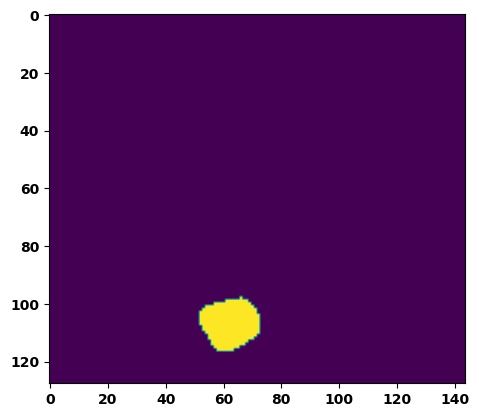

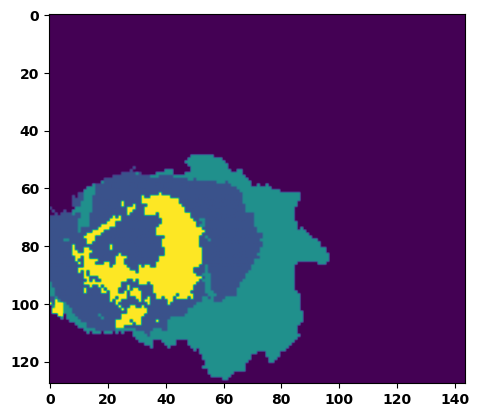

  6%|▌         | 2/36 [00:02<00:37,  1.09s/it]

Batch_id:  1 Eval loss:  0.7652530670166016
Batch_id:  1 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.03s/it]

Batch_id:  2 Eval loss:  0.7632470726966858
Batch_id:  2 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.07s/it]

Batch_id:  3 Eval loss:  0.7197332978248596
Batch_id:  3 Eval IoU:  tensor(0.2561, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.5294268727302551
Batch_id:  4 Eval IoU:  tensor(0.3967, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9828, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.05s/it]

Batch_id:  5 Eval loss:  0.7803928852081299
Batch_id:  5 Eval IoU:  tensor(0.1959, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8911, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.7837, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9145, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.05s/it]

Batch_id:  6 Eval loss:  0.7659199237823486
Batch_id:  6 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.07s/it]

Batch_id:  7 Eval loss:  0.2727128863334656
Batch_id:  7 Eval IoU:  tensor(0.6088, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8916, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9095, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9842, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.05s/it]

Batch_id:  8 Eval loss:  0.7561979293823242
Batch_id:  8 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.06s/it]

Batch_id:  9 Eval loss:  0.6365496516227722
Batch_id:  9 Eval IoU:  tensor(0.3060, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9232, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  10 Eval loss:  0.7717361450195312
Batch_id:  10 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


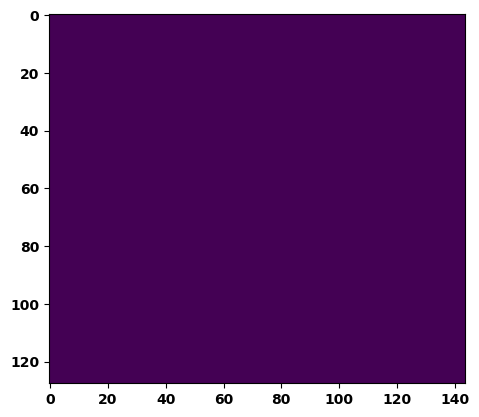

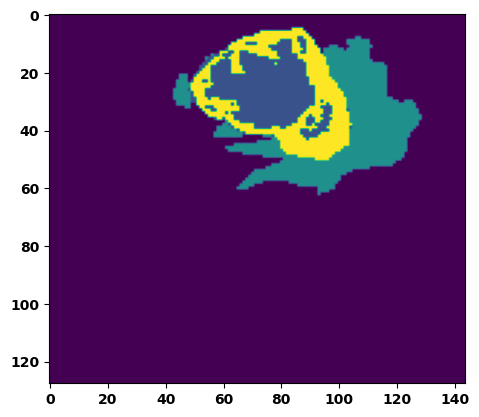

 33%|███▎      | 12/36 [00:12<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.7636465430259705
Batch_id:  11 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.09s/it]

Batch_id:  12 Eval loss:  0.7570460438728333
Batch_id:  12 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.7756483554840088
Batch_id:  13 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.08s/it]

Batch_id:  14 Eval loss:  0.7535919547080994
Batch_id:  14 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.7579368948936462
Batch_id:  15 Eval IoU:  tensor(0.2327, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8992, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8087, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.7833501100540161
Batch_id:  16 Eval IoU:  tensor(0.1907, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7634, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.09s/it]

Batch_id:  17 Eval loss:  0.7184077501296997
Batch_id:  17 Eval IoU:  tensor(0.2413, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8562, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:19,  1.14s/it]

Batch_id:  18 Eval loss:  0.760907769203186
Batch_id:  18 Eval IoU:  tensor(0.2284, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.11s/it]

Batch_id:  19 Eval loss:  0.7517202496528625
Batch_id:  19 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Eval loss:  0.7640672326087952
Batch_id:  20 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


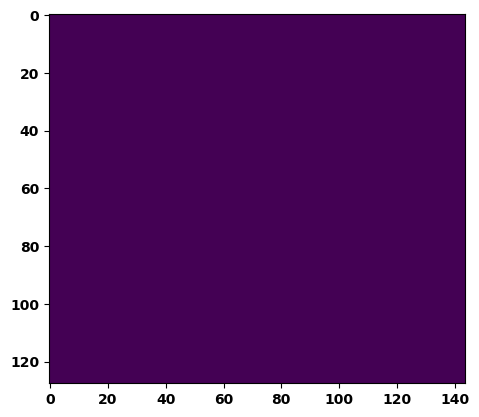

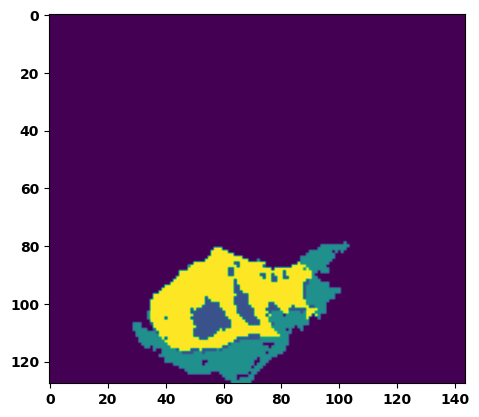

 61%|██████    | 22/36 [00:24<00:15,  1.13s/it]

Batch_id:  21 Eval loss:  0.5422108173370361
Batch_id:  21 Eval IoU:  tensor(0.3322, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6473, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3263, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.3336, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9595, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.12s/it]

Batch_id:  22 Eval loss:  0.7573876976966858
Batch_id:  22 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.7690821886062622
Batch_id:  23 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.09s/it]

Batch_id:  24 Eval loss:  0.7665443420410156
Batch_id:  24 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.6086764931678772
Batch_id:  25 Eval IoU:  tensor(0.2762, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7445, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.5064, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.5427, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9373, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.7635779976844788
Batch_id:  26 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.49575740098953247
Batch_id:  27 Eval IoU:  tensor(0.4088, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9221, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8742, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9700, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.08s/it]

Batch_id:  28 Eval loss:  0.560149073600769
Batch_id:  28 Eval IoU:  tensor(0.3315, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8511, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7389, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.7090, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.6059786677360535
Batch_id:  29 Eval IoU:  tensor(0.3466, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9198, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  30 Eval loss:  0.2973187565803528
Batch_id:  30 Eval IoU:  tensor(0.5822, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9067, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9102, device='cuda:0')


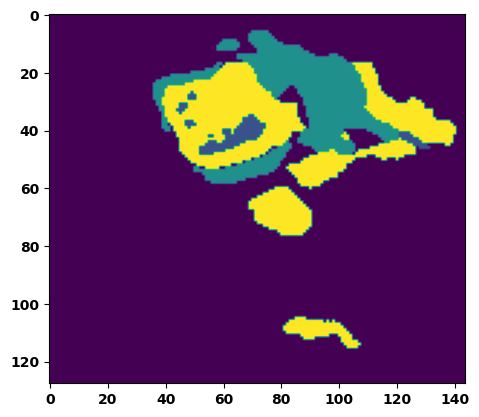

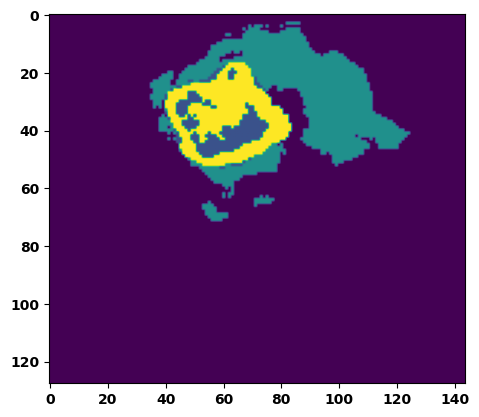

 89%|████████▉ | 32/36 [00:35<00:04,  1.12s/it]

Batch_id:  31 Eval loss:  0.5297200679779053
Batch_id:  31 Eval IoU:  tensor(0.3855, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8900, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9299, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.13s/it]

Batch_id:  32 Eval loss:  0.2606368958950043
Batch_id:  32 Eval IoU:  tensor(0.6259, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8435, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8406, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.7657666206359863
Batch_id:  33 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.15s/it]

Batch_id:  34 Eval loss:  0.6995457410812378
Batch_id:  34 Eval IoU:  tensor(0.2053, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6649, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4002, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.3345, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.10s/it]

Batch_id:  35 Eval loss:  0.8840094804763794
Batch_id:  35 Eval IoU:  tensor(0.0736, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6198, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4139, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9024, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2416, device='cuda:0')
Epoch  13 Training loss:  0.17891634133729067
Epoch  13 Evaluation loss:  0.6772250259915987
Epoch  13 Training accuracy :  tensor(0.7488)
Epoch  13 Evaluation accuracy :  tensor(0.2787)
Epoch  13 Training Mean Dice Score:  tensor(0.9851)
Epoch  13 Eval Mean Dice Score:  tensor(0.9072)
Epoch  13 Training Non-tumor Dice Score:  tensor(0.9811)
Epoch  13 Eval Non-tumor Dice Score:  tensor(0.8348)
Epoch  13 Training NCR/NET Dice Score:  tensor(0.9900)
Epoch  13 Eval NCR/NET Dice Score:  tensor(0.9722)
Epoch  13 Training ED Dice Score:  tensor(0.97

Epoch: 14
Training in session: 


  1%|          | 1/110 [00:01<02:04,  1.14s/it]

Batch_id:  0 Training loss:  0.537224531173706
Batch_id:  0 Training IoU:  tensor(0.3683, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9159, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:56,  1.08s/it]

Batch_id:  1 Training loss:  0.06932693719863892
Batch_id:  1 Training IoU:  tensor(0.8808, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.13s/it]

Batch_id:  2 Training loss:  0.1399831771850586
Batch_id:  2 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:57,  1.11s/it]

Batch_id:  3 Training loss:  0.12413212656974792
Batch_id:  3 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:54,  1.09s/it]

Batch_id:  4 Training loss:  0.154298797249794
Batch_id:  4 Training IoU:  tensor(0.7913, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:50,  1.06s/it]

Batch_id:  5 Training loss:  0.08573925495147705
Batch_id:  5 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:47,  1.04s/it]

Batch_id:  6 Training loss:  0.14882978796958923
Batch_id:  6 Training IoU:  tensor(0.7801, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.09s/it]

Batch_id:  7 Training loss:  0.14594639837741852
Batch_id:  7 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:50,  1.10s/it]

Batch_id:  8 Training loss:  0.10902659595012665
Batch_id:  8 Training IoU:  tensor(0.8240, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.12060727179050446
Batch_id:  9 Training IoU:  tensor(0.8121, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 10%|█         | 11/110 [00:12<01:53,  1.14s/it]

Batch_id:  10 Training loss:  0.11706142127513885
Batch_id:  10 Training IoU:  tensor(0.8101, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 11%|█         | 12/110 [00:13<01:52,  1.14s/it]

Batch_id:  11 Training loss:  0.05055953562259674
Batch_id:  11 Training IoU:  tensor(0.9125, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.11s/it]

Batch_id:  12 Training loss:  0.4300869107246399
Batch_id:  12 Training IoU:  tensor(0.4946, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.10s/it]

Batch_id:  13 Training loss:  0.29240572452545166
Batch_id:  13 Training IoU:  tensor(0.6259, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:47,  1.13s/it]

Batch_id:  14 Training loss:  0.473142147064209
Batch_id:  14 Training IoU:  tensor(0.4594, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:46,  1.13s/it]

Batch_id:  15 Training loss:  0.54246985912323
Batch_id:  15 Training IoU:  tensor(0.3956, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:45,  1.14s/it]

Batch_id:  16 Training loss:  0.26462864875793457
Batch_id:  16 Training IoU:  tensor(0.6169, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:42,  1.11s/it]

Batch_id:  17 Training loss:  0.11682789027690887
Batch_id:  17 Training IoU:  tensor(0.8193, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:42,  1.13s/it]

Batch_id:  18 Training loss:  0.20563574135303497
Batch_id:  18 Training IoU:  tensor(0.7799, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:41,  1.12s/it]

Batch_id:  19 Training loss:  0.19991591572761536
Batch_id:  19 Training IoU:  tensor(0.7048, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:39,  1.12s/it]

Batch_id:  20 Training loss:  0.09081429243087769
Batch_id:  20 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 20%|██        | 22/110 [00:24<01:35,  1.09s/it]

Batch_id:  21 Training loss:  0.1073475331068039
Batch_id:  21 Training IoU:  tensor(0.8183, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 21%|██        | 23/110 [00:25<01:38,  1.13s/it]

Batch_id:  22 Training loss:  0.07252077758312225
Batch_id:  22 Training IoU:  tensor(0.8826, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.18985721468925476
Batch_id:  23 Training IoU:  tensor(0.7169, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.08s/it]

Batch_id:  24 Training loss:  0.1962205320596695
Batch_id:  24 Training IoU:  tensor(0.7293, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.20108100771903992
Batch_id:  25 Training IoU:  tensor(0.6838, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.07s/it]

Batch_id:  26 Training loss:  0.09966623783111572
Batch_id:  26 Training IoU:  tensor(0.8398, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:29,  1.10s/it]

Batch_id:  27 Training loss:  0.3714357912540436
Batch_id:  27 Training IoU:  tensor(0.5800, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.11037813127040863
Batch_id:  28 Training IoU:  tensor(0.8189, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.14739693701267242
Batch_id:  29 Training IoU:  tensor(0.7610, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:26,  1.09s/it]

Batch_id:  30 Training loss:  0.08842089772224426
Batch_id:  30 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:25,  1.09s/it]

Batch_id:  31 Training loss:  0.07405644655227661
Batch_id:  31 Training IoU:  tensor(0.8736, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.1606452614068985
Batch_id:  32 Training IoU:  tensor(0.7475, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 31%|███       | 34/110 [00:37<01:20,  1.06s/it]

Batch_id:  33 Training loss:  0.09864924848079681
Batch_id:  33 Training IoU:  tensor(0.8308, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.07707864046096802
Batch_id:  34 Training IoU:  tensor(0.8687, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.16218775510787964
Batch_id:  35 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.09449373185634613
Batch_id:  36 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.18058371543884277
Batch_id:  37 Training IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.10306942462921143
Batch_id:  38 Training IoU:  tensor(0.8280, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:13,  1.05s/it]

Batch_id:  39 Training loss:  0.09340080618858337
Batch_id:  39 Training IoU:  tensor(0.8421, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:12,  1.04s/it]

Batch_id:  40 Training loss:  0.16313683986663818
Batch_id:  40 Training IoU:  tensor(0.7649, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:10,  1.04s/it]

Batch_id:  41 Training loss:  0.18794108927249908
Batch_id:  41 Training IoU:  tensor(0.7157, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:10,  1.05s/it]

Batch_id:  42 Training loss:  0.3856147527694702
Batch_id:  42 Training IoU:  tensor(0.5746, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 40%|████      | 44/110 [00:47<01:09,  1.05s/it]

Batch_id:  43 Training loss:  0.15858516097068787
Batch_id:  43 Training IoU:  tensor(0.7488, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.09035353362560272
Batch_id:  44 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.08s/it]

Batch_id:  45 Training loss:  0.11493252217769623
Batch_id:  45 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.08762915432453156
Batch_id:  46 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.0976891964673996
Batch_id:  47 Training IoU:  tensor(0.8348, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.16088922321796417
Batch_id:  48 Training IoU:  tensor(0.7886, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.14999832212924957
Batch_id:  49 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.10557517409324646
Batch_id:  50 Training IoU:  tensor(0.8255, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.24310608208179474
Batch_id:  51 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.20273655652999878
Batch_id:  52 Training IoU:  tensor(0.6999, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.1438121646642685
Batch_id:  53 Training IoU:  tensor(0.7910, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.2591838240623474
Batch_id:  54 Training IoU:  tensor(0.6317, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.13025148212909698
Batch_id:  55 Training IoU:  tensor(0.8102, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.16117674112319946
Batch_id:  56 Training IoU:  tensor(0.7398, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.36852437257766724
Batch_id:  57 Training IoU:  tensor(0.5633, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.06s/it]

Batch_id:  58 Training loss:  0.06803534924983978
Batch_id:  58 Training IoU:  tensor(0.8845, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.05754624307155609
Batch_id:  59 Training IoU:  tensor(0.9024, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.208963543176651
Batch_id:  60 Training IoU:  tensor(0.7334, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.10299618542194366
Batch_id:  61 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:52,  1.11s/it]

Batch_id:  62 Training loss:  0.2834186851978302
Batch_id:  62 Training IoU:  tensor(0.6499, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.13051944971084595
Batch_id:  63 Training IoU:  tensor(0.7866, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:49,  1.09s/it]

Batch_id:  64 Training loss:  0.23151786625385284
Batch_id:  64 Training IoU:  tensor(0.6503, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.13716500997543335
Batch_id:  65 Training IoU:  tensor(0.7779, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.29321444034576416
Batch_id:  66 Training IoU:  tensor(0.5858, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.07s/it]

Batch_id:  67 Training loss:  0.1357429474592209
Batch_id:  67 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.1735774725675583
Batch_id:  68 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:42,  1.07s/it]

Batch_id:  69 Training loss:  0.1623881757259369
Batch_id:  69 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.17137663066387177
Batch_id:  70 Training IoU:  tensor(0.7480, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.06s/it]

Batch_id:  71 Training loss:  0.17116953432559967
Batch_id:  71 Training IoU:  tensor(0.7306, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:39,  1.08s/it]

Batch_id:  72 Training loss:  0.06943845748901367
Batch_id:  72 Training IoU:  tensor(0.8860, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.28194865584373474
Batch_id:  73 Training IoU:  tensor(0.6580, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.16034597158432007
Batch_id:  74 Training IoU:  tensor(0.7643, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.10073849558830261
Batch_id:  75 Training IoU:  tensor(0.8317, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:36,  1.12s/it]

Batch_id:  76 Training loss:  0.11800593137741089
Batch_id:  76 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.08909361064434052
Batch_id:  77 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.07998979091644287
Batch_id:  78 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.10s/it]

Batch_id:  79 Training loss:  0.09199684858322144
Batch_id:  79 Training IoU:  tensor(0.8457, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.2717270255088806
Batch_id:  80 Training IoU:  tensor(0.6729, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.10s/it]

Batch_id:  81 Training loss:  0.0804690569639206
Batch_id:  81 Training IoU:  tensor(0.8808, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.2845942974090576
Batch_id:  82 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.06147509813308716
Batch_id:  83 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.11s/it]

Batch_id:  84 Training loss:  0.10299131274223328
Batch_id:  84 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.1366070955991745
Batch_id:  85 Training IoU:  tensor(0.7746, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.46629446744918823
Batch_id:  86 Training IoU:  tensor(0.4469, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9048, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.17894600331783295
Batch_id:  87 Training IoU:  tensor(0.7195, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.12s/it]

Batch_id:  88 Training loss:  0.2320503443479538
Batch_id:  88 Training IoU:  tensor(0.6533, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9737, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.13s/it]

Batch_id:  89 Training loss:  0.10202467441558838
Batch_id:  89 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.2928919792175293
Batch_id:  90 Training IoU:  tensor(0.6234, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.11s/it]

Batch_id:  91 Training loss:  0.11085231602191925
Batch_id:  91 Training IoU:  tensor(0.8372, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.13937251269817352
Batch_id:  92 Training IoU:  tensor(0.7903, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.14366714656352997
Batch_id:  93 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.06772883236408234
Batch_id:  94 Training IoU:  tensor(0.8833, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.3295820951461792
Batch_id:  95 Training IoU:  tensor(0.5558, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9699, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.10s/it]

Batch_id:  96 Training loss:  0.09819474816322327
Batch_id:  96 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.14423370361328125
Batch_id:  97 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.1627482771873474
Batch_id:  98 Training IoU:  tensor(0.7364, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.2581334710121155
Batch_id:  99 Training IoU:  tensor(0.6435, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.08391915261745453
Batch_id:  100 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.1020585298538208
Batch_id:  101 Training IoU:  tensor(0.8307, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.23216328024864197
Batch_id:  102 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.03s/it]

Batch_id:  103 Training loss:  0.2130257934331894
Batch_id:  103 Training IoU:  tensor(0.7320, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.04s/it]

Batch_id:  104 Training loss:  0.14513631165027618
Batch_id:  104 Training IoU:  tensor(0.7815, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.04s/it]

Batch_id:  105 Training loss:  0.17452488839626312
Batch_id:  105 Training IoU:  tensor(0.7425, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.05s/it]

Batch_id:  106 Training loss:  0.08070491254329681
Batch_id:  106 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.07043525576591492
Batch_id:  107 Training IoU:  tensor(0.8840, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.07081350684165955
Batch_id:  108 Training IoU:  tensor(0.8820, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.34535181522369385
Batch_id:  109 Training IoU:  tensor(0.5847, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9956, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4469507038593292
Batch_id:  0 Eval IoU:  tensor(0.4366, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8671, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9582, device='cuda:0')


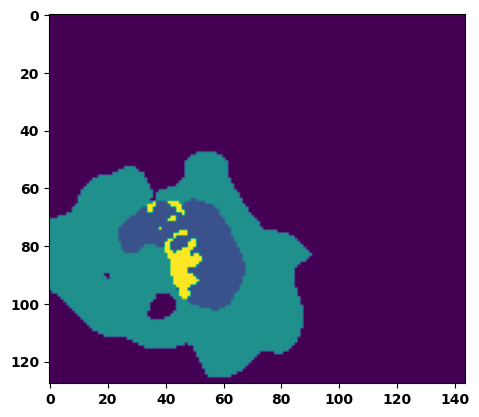

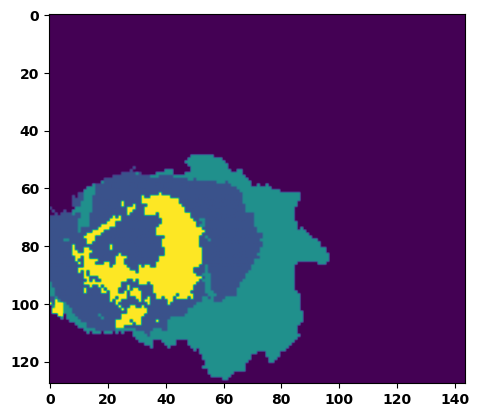

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7535561323165894
Batch_id:  1 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.04s/it]

Batch_id:  2 Eval loss:  0.5935319662094116
Batch_id:  2 Eval IoU:  tensor(0.2947, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8467, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7575, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.7281, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9507, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.03s/it]

Batch_id:  3 Eval loss:  0.3359581232070923
Batch_id:  3 Eval IoU:  tensor(0.5388, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9312, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.02s/it]

Batch_id:  4 Eval loss:  0.8177696466445923
Batch_id:  4 Eval IoU:  tensor(0.1190, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6859, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4954, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8778, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3825, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.8648974299430847
Batch_id:  5 Eval IoU:  tensor(0.0756, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5949, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3055, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.1931, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.01s/it]

Batch_id:  6 Eval loss:  0.7123768925666809
Batch_id:  6 Eval IoU:  tensor(0.2488, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8858, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9753, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.03s/it]

Batch_id:  7 Eval loss:  0.7653276324272156
Batch_id:  7 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.8098734617233276
Batch_id:  8 Eval IoU:  tensor(0.1523, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8028, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.6114, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.7334, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.09s/it]

Batch_id:  9 Eval loss:  0.5746702551841736
Batch_id:  9 Eval IoU:  tensor(0.3397, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  10 Eval loss:  0.3707435131072998
Batch_id:  10 Eval IoU:  tensor(0.5340, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9808, device='cuda:0')


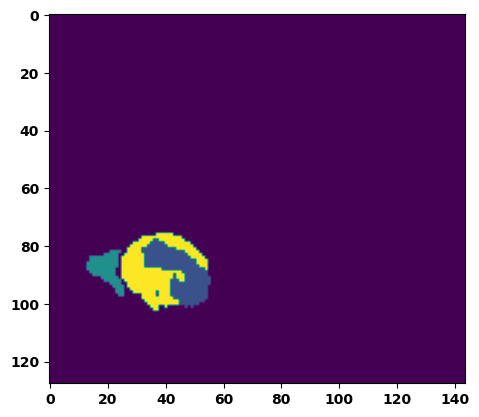

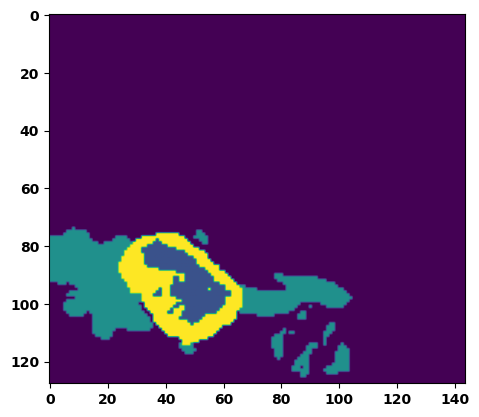

 33%|███▎      | 12/36 [00:13<00:29,  1.22s/it]

Batch_id:  11 Eval loss:  0.5621808767318726
Batch_id:  11 Eval IoU:  tensor(0.3481, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:27,  1.19s/it]

Batch_id:  12 Eval loss:  0.4042832851409912
Batch_id:  12 Eval IoU:  tensor(0.4672, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9657, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:27,  1.24s/it]

Batch_id:  13 Eval loss:  0.5427387952804565
Batch_id:  13 Eval IoU:  tensor(0.3672, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.8998, device='cuda:0')


 42%|████▏     | 15/36 [00:17<00:26,  1.28s/it]

Batch_id:  14 Eval loss:  0.7691071629524231
Batch_id:  14 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 44%|████▍     | 16/36 [00:18<00:26,  1.33s/it]

Batch_id:  15 Eval loss:  0.6130175590515137
Batch_id:  15 Eval IoU:  tensor(0.2715, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7816, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6214, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8827, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.6884, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9339, device='cuda:0')


 47%|████▋     | 17/36 [00:19<00:24,  1.31s/it]

Batch_id:  16 Eval loss:  0.7570850849151611
Batch_id:  16 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 50%|█████     | 18/36 [00:21<00:22,  1.27s/it]

Batch_id:  17 Eval loss:  0.7517393231391907
Batch_id:  17 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 53%|█████▎    | 19/36 [00:22<00:21,  1.25s/it]

Batch_id:  18 Eval loss:  0.756147027015686
Batch_id:  18 Eval IoU:  tensor(0.1684, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7479, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.5290, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.6004, device='cuda:0')


 56%|█████▌    | 20/36 [00:23<00:19,  1.21s/it]

Batch_id:  19 Eval loss:  0.763331949710846
Batch_id:  19 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  20 Eval loss:  0.8268853425979614
Batch_id:  20 Eval IoU:  tensor(0.1110, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6722, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4426, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.8796, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.5045, device='cuda:0')


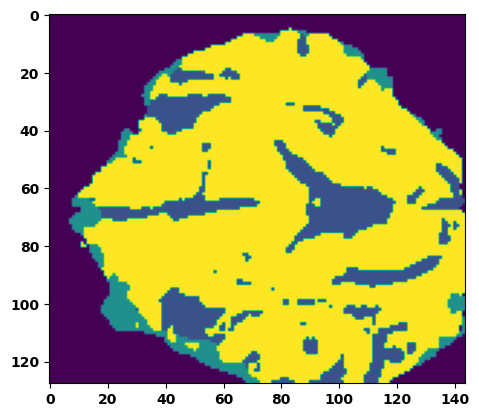

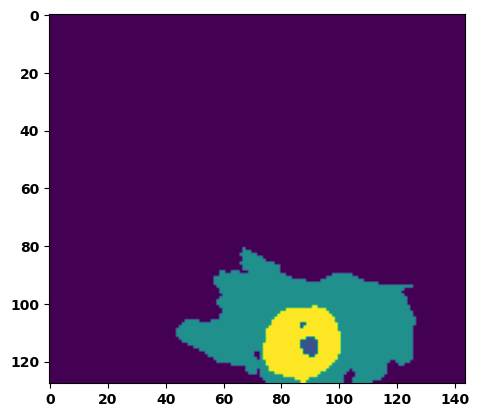

 61%|██████    | 22/36 [00:26<00:18,  1.30s/it]

Batch_id:  21 Eval loss:  0.7756737470626831
Batch_id:  21 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 64%|██████▍   | 23/36 [00:27<00:16,  1.28s/it]

Batch_id:  22 Eval loss:  0.45196378231048584
Batch_id:  22 Eval IoU:  tensor(0.4564, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8352, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.6811, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.7014, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  23 Eval loss:  0.7793098092079163
Batch_id:  23 Eval IoU:  tensor(0.1956, device='cuda:0')


 67%|██████▋   | 24/36 [00:28<00:16,  1.34s/it]

Batch_id:  23 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7884, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8918, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 69%|██████▉   | 25/36 [00:30<00:14,  1.29s/it]

Batch_id:  24 Eval loss:  0.7659881711006165
Batch_id:  24 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 72%|███████▏  | 26/36 [00:31<00:12,  1.25s/it]

Batch_id:  25 Eval loss:  0.7636332511901855
Batch_id:  25 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 75%|███████▌  | 27/36 [00:32<00:10,  1.22s/it]

Batch_id:  26 Eval loss:  0.8178182244300842
Batch_id:  26 Eval IoU:  tensor(0.1172, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6932, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4421, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.3867, device='cuda:0')


 78%|███████▊  | 28/36 [00:33<00:09,  1.18s/it]

Batch_id:  27 Eval loss:  0.8397192358970642
Batch_id:  27 Eval IoU:  tensor(0.0969, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6429, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3885, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3285, device='cuda:0')


 81%|████████  | 29/36 [00:34<00:08,  1.18s/it]

Batch_id:  28 Eval loss:  0.7210354804992676
Batch_id:  28 Eval IoU:  tensor(0.2093, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8070, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7060, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.6185, device='cuda:0')


 83%|████████▎ | 30/36 [00:35<00:06,  1.15s/it]

Batch_id:  29 Eval loss:  0.8434493541717529
Batch_id:  29 Eval IoU:  tensor(0.0950, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6442, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2908, device='cuda:0')
Batch_id:  30 Eval loss:  0.7191760540008545
Batch_id:  30 Eval IoU:  tensor(0.2564, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


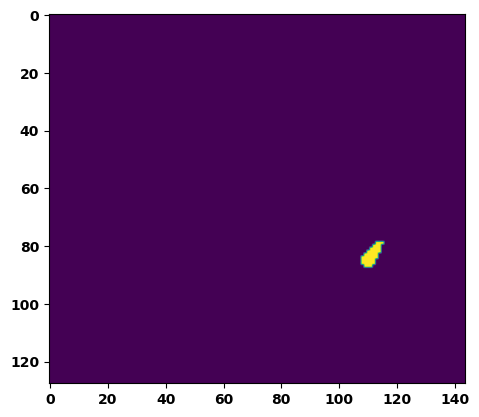

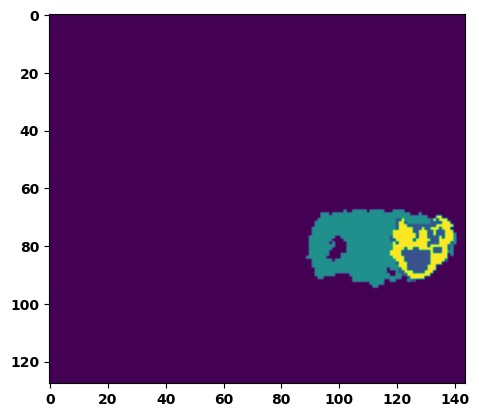

 89%|████████▉ | 32/36 [00:38<00:04,  1.17s/it]

Batch_id:  31 Eval loss:  0.11321024596691132
Batch_id:  31 Eval IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 92%|█████████▏| 33/36 [00:39<00:03,  1.13s/it]

Batch_id:  32 Eval loss:  0.8833382725715637
Batch_id:  32 Eval IoU:  tensor(0.0741, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6207, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4155, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2413, device='cuda:0')


 94%|█████████▍| 34/36 [00:40<00:02,  1.15s/it]

Batch_id:  33 Eval loss:  0.047674089670181274
Batch_id:  33 Eval IoU:  tensor(0.9161, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 97%|█████████▋| 35/36 [00:41<00:01,  1.13s/it]

Batch_id:  34 Eval loss:  0.17906200885772705
Batch_id:  34 Eval IoU:  tensor(0.7570, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


100%|██████████| 36/36 [00:42<00:00,  1.19s/it]

Batch_id:  35 Eval loss:  0.2888827323913574
Batch_id:  35 Eval IoU:  tensor(0.6513, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')
Epoch  14 Training loss:  0.17054724043065853
Epoch  14 Evaluation loss:  0.6328362950848209
Epoch  14 Training accuracy :  tensor(0.7585)
Epoch  14 Evaluation accuracy :  tensor(0.3113)
Epoch  14 Training Mean Dice Score:  tensor(0.9855)
Epoch  14 Eval Mean Dice Score:  tensor(0.8704)
Epoch  14 Training Non-tumor Dice Score:  tensor(0.9814)
Epoch  14 Eval Non-tumor Dice Score:  tensor(0.7783)
Epoch  14 Training NCR/NET Dice Score:  tensor(0.9903)
Epoch  14 Eval NCR/NET Dice Score:  tensor(0.9622)
Epoch  14 Training ED Dice Score:  tensor(0.97

Epoch: 15
Training in session: 


  1%|          | 1/110 [00:01<02:05,  1.16s/it]

Batch_id:  0 Training loss:  0.1353658139705658
Batch_id:  0 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:01,  1.12s/it]

Batch_id:  1 Training loss:  0.21516047418117523
Batch_id:  1 Training IoU:  tensor(0.6908, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.13s/it]

Batch_id:  2 Training loss:  0.12486496567726135
Batch_id:  2 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:01,  1.14s/it]

Batch_id:  3 Training loss:  0.5341984629631042
Batch_id:  3 Training IoU:  tensor(0.3662, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.13205909729003906
Batch_id:  4 Training IoU:  tensor(0.8105, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:57,  1.13s/it]

Batch_id:  5 Training loss:  0.18834519386291504
Batch_id:  5 Training IoU:  tensor(0.7036, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


  6%|▋         | 7/110 [00:08<01:59,  1.16s/it]

Batch_id:  6 Training loss:  0.29110246896743774
Batch_id:  6 Training IoU:  tensor(0.6287, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:57,  1.16s/it]

Batch_id:  7 Training loss:  0.13438226282596588
Batch_id:  7 Training IoU:  tensor(0.7802, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:56,  1.16s/it]

Batch_id:  8 Training loss:  0.1718120574951172
Batch_id:  8 Training IoU:  tensor(0.7282, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:55,  1.15s/it]

Batch_id:  9 Training loss:  0.08989985287189484
Batch_id:  9 Training IoU:  tensor(0.8475, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.13s/it]

Batch_id:  10 Training loss:  0.09127868711948395
Batch_id:  10 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.12s/it]

Batch_id:  11 Training loss:  0.14671015739440918
Batch_id:  11 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.07736851274967194
Batch_id:  12 Training IoU:  tensor(0.8682, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.11s/it]

Batch_id:  13 Training loss:  0.1348641812801361
Batch_id:  13 Training IoU:  tensor(0.7950, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:47,  1.13s/it]

Batch_id:  14 Training loss:  0.05480396747589111
Batch_id:  14 Training IoU:  tensor(0.9050, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:47,  1.14s/it]

Batch_id:  15 Training loss:  0.13300655782222748
Batch_id:  15 Training IoU:  tensor(0.7805, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:47,  1.15s/it]

Batch_id:  16 Training loss:  0.5339193940162659
Batch_id:  16 Training IoU:  tensor(0.4051, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:44,  1.14s/it]

Batch_id:  17 Training loss:  0.14866837859153748
Batch_id:  17 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:43,  1.13s/it]

Batch_id:  18 Training loss:  0.09611944854259491
Batch_id:  18 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:41,  1.13s/it]

Batch_id:  19 Training loss:  0.3033842444419861
Batch_id:  19 Training IoU:  tensor(0.5833, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:40,  1.13s/it]

Batch_id:  20 Training loss:  0.32968461513519287
Batch_id:  20 Training IoU:  tensor(0.5507, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 20%|██        | 22/110 [00:24<01:38,  1.11s/it]

Batch_id:  21 Training loss:  0.08600842952728271
Batch_id:  21 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 21%|██        | 23/110 [00:26<01:36,  1.11s/it]

Batch_id:  22 Training loss:  0.10717837512493134
Batch_id:  22 Training IoU:  tensor(0.8163, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:37,  1.14s/it]

Batch_id:  23 Training loss:  0.13934877514839172
Batch_id:  23 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:36,  1.14s/it]

Batch_id:  24 Training loss:  0.11285248398780823
Batch_id:  24 Training IoU:  tensor(0.8117, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:38,  1.18s/it]

Batch_id:  25 Training loss:  0.2711046636104584
Batch_id:  25 Training IoU:  tensor(0.6620, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:39,  1.20s/it]

Batch_id:  26 Training loss:  0.16741693019866943
Batch_id:  26 Training IoU:  tensor(0.7544, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 25%|██▌       | 28/110 [00:32<01:38,  1.20s/it]

Batch_id:  27 Training loss:  0.09523782134056091
Batch_id:  27 Training IoU:  tensor(0.8620, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 26%|██▋       | 29/110 [00:33<01:36,  1.19s/it]

Batch_id:  28 Training loss:  0.15450772643089294
Batch_id:  28 Training IoU:  tensor(0.7585, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 27%|██▋       | 30/110 [00:34<01:32,  1.16s/it]

Batch_id:  29 Training loss:  0.1410490721464157
Batch_id:  29 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:28,  1.11s/it]

Batch_id:  30 Training loss:  0.17542113363742828
Batch_id:  30 Training IoU:  tensor(0.7260, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:28,  1.13s/it]

Batch_id:  31 Training loss:  0.16441833972930908
Batch_id:  31 Training IoU:  tensor(0.7383, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 30%|███       | 33/110 [00:37<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.21590666472911835
Batch_id:  32 Training IoU:  tensor(0.7412, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 31%|███       | 34/110 [00:38<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.13392719626426697
Batch_id:  33 Training IoU:  tensor(0.7765, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:24,  1.12s/it]

Batch_id:  34 Training loss:  0.4027714431285858
Batch_id:  34 Training IoU:  tensor(0.5306, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:21,  1.11s/it]

Batch_id:  35 Training loss:  0.42575550079345703
Batch_id:  35 Training IoU:  tensor(0.4868, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 34%|███▎      | 37/110 [00:42<01:24,  1.15s/it]

Batch_id:  36 Training loss:  0.09669986367225647
Batch_id:  36 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 35%|███▍      | 38/110 [00:43<01:22,  1.15s/it]

Batch_id:  37 Training loss:  0.07111389935016632
Batch_id:  37 Training IoU:  tensor(0.8833, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 35%|███▌      | 39/110 [00:44<01:20,  1.13s/it]

Batch_id:  38 Training loss:  0.26310157775878906
Batch_id:  38 Training IoU:  tensor(0.6831, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 36%|███▋      | 40/110 [00:45<01:19,  1.13s/it]

Batch_id:  39 Training loss:  0.13615016639232635
Batch_id:  39 Training IoU:  tensor(0.7919, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 37%|███▋      | 41/110 [00:46<01:17,  1.12s/it]

Batch_id:  40 Training loss:  0.4859929084777832
Batch_id:  40 Training IoU:  tensor(0.4468, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:16,  1.12s/it]

Batch_id:  41 Training loss:  0.06910410523414612
Batch_id:  41 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.12733617424964905
Batch_id:  42 Training IoU:  tensor(0.8086, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 40%|████      | 44/110 [00:49<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.2244330495595932
Batch_id:  43 Training IoU:  tensor(0.6563, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 41%|████      | 45/110 [00:50<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.22093351185321808
Batch_id:  44 Training IoU:  tensor(0.6663, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 42%|████▏     | 46/110 [00:52<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.23608702421188354
Batch_id:  45 Training IoU:  tensor(0.6966, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 43%|████▎     | 47/110 [00:53<01:10,  1.11s/it]

Batch_id:  46 Training loss:  0.08292390406131744
Batch_id:  46 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 44%|████▎     | 48/110 [00:54<01:08,  1.11s/it]

Batch_id:  47 Training loss:  0.061792537569999695
Batch_id:  47 Training IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 45%|████▍     | 49/110 [00:55<01:07,  1.10s/it]

Batch_id:  48 Training loss:  0.31240296363830566
Batch_id:  48 Training IoU:  tensor(0.6230, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 45%|████▌     | 50/110 [00:56<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.10924039781093597
Batch_id:  49 Training IoU:  tensor(0.8321, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 46%|████▋     | 51/110 [00:57<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.07400624454021454
Batch_id:  50 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:04,  1.12s/it]

Batch_id:  51 Training loss:  0.2796030044555664
Batch_id:  51 Training IoU:  tensor(0.6002, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9691, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:03,  1.11s/it]

Batch_id:  52 Training loss:  0.16307777166366577
Batch_id:  52 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:02,  1.12s/it]

Batch_id:  53 Training loss:  0.12148614227771759
Batch_id:  53 Training IoU:  tensor(0.8052, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 50%|█████     | 55/110 [01:02<01:02,  1.13s/it]

Batch_id:  54 Training loss:  0.1379530429840088
Batch_id:  54 Training IoU:  tensor(0.8170, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 51%|█████     | 56/110 [01:03<01:02,  1.15s/it]

Batch_id:  55 Training loss:  0.053697094321250916
Batch_id:  55 Training IoU:  tensor(0.9098, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 52%|█████▏    | 57/110 [01:04<01:00,  1.14s/it]

Batch_id:  56 Training loss:  0.10756327211856842
Batch_id:  56 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 53%|█████▎    | 58/110 [01:05<00:58,  1.12s/it]

Batch_id:  57 Training loss:  0.08775915205478668
Batch_id:  57 Training IoU:  tensor(0.8508, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 54%|█████▎    | 59/110 [01:06<00:56,  1.11s/it]

Batch_id:  58 Training loss:  0.15562276542186737
Batch_id:  58 Training IoU:  tensor(0.7645, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 55%|█████▍    | 60/110 [01:07<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.2942355275154114
Batch_id:  59 Training IoU:  tensor(0.6154, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 55%|█████▌    | 61/110 [01:08<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.3390701413154602
Batch_id:  60 Training IoU:  tensor(0.6055, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.160313218832016
Batch_id:  61 Training IoU:  tensor(0.7661, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.1669674962759018
Batch_id:  62 Training IoU:  tensor(0.7511, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.10460767149925232
Batch_id:  63 Training IoU:  tensor(0.8394, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 59%|█████▉    | 65/110 [01:13<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.15054567158222198
Batch_id:  64 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 60%|██████    | 66/110 [01:14<00:48,  1.11s/it]

Batch_id:  65 Training loss:  0.37610840797424316
Batch_id:  65 Training IoU:  tensor(0.5903, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 61%|██████    | 67/110 [01:15<00:48,  1.13s/it]

Batch_id:  66 Training loss:  0.08615197241306305
Batch_id:  66 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 62%|██████▏   | 68/110 [01:16<00:46,  1.10s/it]

Batch_id:  67 Training loss:  0.12782515585422516
Batch_id:  67 Training IoU:  tensor(0.7960, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 63%|██████▎   | 69/110 [01:17<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.13274575769901276
Batch_id:  68 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 64%|██████▎   | 70/110 [01:18<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.4404096305370331
Batch_id:  69 Training IoU:  tensor(0.4919, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:41,  1.07s/it]

Batch_id:  70 Training loss:  0.08169294893741608
Batch_id:  70 Training IoU:  tensor(0.8645, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:41,  1.10s/it]

Batch_id:  71 Training loss:  0.2920232117176056
Batch_id:  71 Training IoU:  tensor(0.6202, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.2063094526529312
Batch_id:  72 Training IoU:  tensor(0.6946, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:39,  1.08s/it]

Batch_id:  73 Training loss:  0.31850916147232056
Batch_id:  73 Training IoU:  tensor(0.5678, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 68%|██████▊   | 75/110 [01:24<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.17302662134170532
Batch_id:  74 Training IoU:  tensor(0.7418, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 69%|██████▉   | 76/110 [01:25<00:37,  1.10s/it]

Batch_id:  75 Training loss:  0.20465479791164398
Batch_id:  75 Training IoU:  tensor(0.7626, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 70%|███████   | 77/110 [01:26<00:36,  1.09s/it]

Batch_id:  76 Training loss:  0.05642037093639374
Batch_id:  76 Training IoU:  tensor(0.9037, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 71%|███████   | 78/110 [01:27<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.07173298299312592
Batch_id:  77 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 72%|███████▏  | 79/110 [01:28<00:33,  1.10s/it]

Batch_id:  78 Training loss:  0.20007134974002838
Batch_id:  78 Training IoU:  tensor(0.7056, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 73%|███████▎  | 80/110 [01:29<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.1690036654472351
Batch_id:  79 Training IoU:  tensor(0.7315, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.07075667381286621
Batch_id:  80 Training IoU:  tensor(0.8833, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.11202134191989899
Batch_id:  81 Training IoU:  tensor(0.8306, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:30,  1.12s/it]

Batch_id:  82 Training loss:  0.05787983536720276
Batch_id:  82 Training IoU:  tensor(0.9107, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.15472155809402466
Batch_id:  83 Training IoU:  tensor(0.7725, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 77%|███████▋  | 85/110 [01:35<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.26041871309280396
Batch_id:  84 Training IoU:  tensor(0.6729, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 78%|███████▊  | 86/110 [01:36<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.09475648403167725
Batch_id:  85 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 79%|███████▉  | 87/110 [01:37<00:24,  1.07s/it]

Batch_id:  86 Training loss:  0.1460513323545456
Batch_id:  86 Training IoU:  tensor(0.7759, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 80%|████████  | 88/110 [01:38<00:23,  1.07s/it]

Batch_id:  87 Training loss:  0.08852426707744598
Batch_id:  87 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 81%|████████  | 89/110 [01:39<00:22,  1.05s/it]

Batch_id:  88 Training loss:  0.0973467081785202
Batch_id:  88 Training IoU:  tensor(0.8332, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:20,  1.05s/it]

Batch_id:  89 Training loss:  0.236271932721138
Batch_id:  89 Training IoU:  tensor(0.6723, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:19,  1.04s/it]

Batch_id:  90 Training loss:  0.11859866976737976
Batch_id:  90 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:18,  1.04s/it]

Batch_id:  91 Training loss:  0.06750398874282837
Batch_id:  91 Training IoU:  tensor(0.8852, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:17,  1.05s/it]

Batch_id:  92 Training loss:  0.08646683394908905
Batch_id:  92 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:16,  1.05s/it]

Batch_id:  93 Training loss:  0.08507378399372101
Batch_id:  93 Training IoU:  tensor(0.8604, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:15,  1.05s/it]

Batch_id:  94 Training loss:  0.25966525077819824
Batch_id:  94 Training IoU:  tensor(0.6976, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.07s/it]

Batch_id:  95 Training loss:  0.07228364050388336
Batch_id:  95 Training IoU:  tensor(0.9127, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.25885140895843506
Batch_id:  96 Training IoU:  tensor(0.6936, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.10001853108406067
Batch_id:  97 Training IoU:  tensor(0.8384, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.06s/it]

Batch_id:  98 Training loss:  0.16814149916172028
Batch_id:  98 Training IoU:  tensor(0.7362, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.05s/it]

Batch_id:  99 Training loss:  0.07368449866771698
Batch_id:  99 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.23044665157794952
Batch_id:  100 Training IoU:  tensor(0.6531, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.16556352376937866
Batch_id:  101 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.13693763315677643
Batch_id:  102 Training IoU:  tensor(0.7772, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.09543868899345398
Batch_id:  103 Training IoU:  tensor(0.8381, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.07s/it]

Batch_id:  104 Training loss:  0.18228119611740112
Batch_id:  104 Training IoU:  tensor(0.7526, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.09s/it]

Batch_id:  105 Training loss:  0.14443129301071167
Batch_id:  105 Training IoU:  tensor(0.7821, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.11105906963348389
Batch_id:  106 Training IoU:  tensor(0.8180, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.2278895378112793
Batch_id:  107 Training IoU:  tensor(0.6635, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.06s/it]

Batch_id:  108 Training loss:  0.16268160939216614
Batch_id:  108 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.10318990051746368
Batch_id:  109 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9901, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7348595857620239
Batch_id:  0 Eval IoU:  tensor(0.2423, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


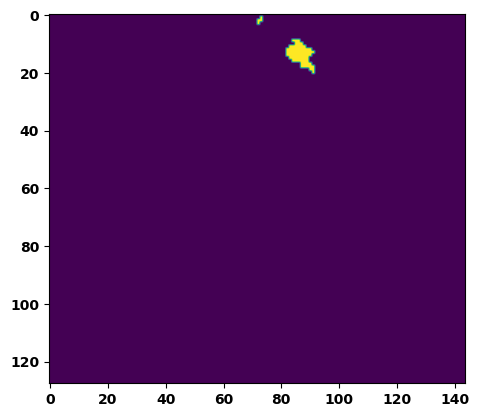

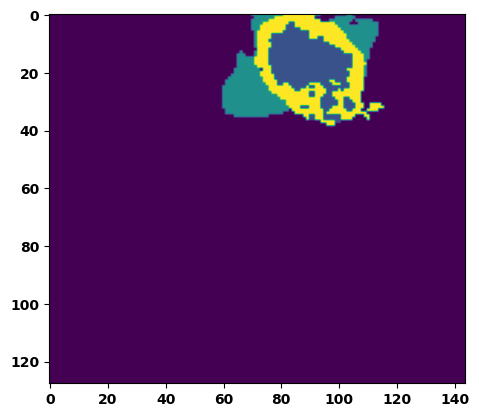

  6%|▌         | 2/36 [00:02<00:36,  1.09s/it]

Batch_id:  1 Eval loss:  0.7964169383049011
Batch_id:  1 Eval IoU:  tensor(0.1357, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7190, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4936, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.4381, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.05s/it]

Batch_id:  2 Eval loss:  0.7969595789909363
Batch_id:  2 Eval IoU:  tensor(0.1697, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8386, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.6784, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8096, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.05s/it]

Batch_id:  3 Eval loss:  0.7570709586143494
Batch_id:  3 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.05s/it]

Batch_id:  4 Eval loss:  0.6996438503265381
Batch_id:  4 Eval IoU:  tensor(0.2016, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.7434, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.5610, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8688, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.6175, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9264, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.09s/it]

Batch_id:  5 Eval loss:  0.7804946899414062
Batch_id:  5 Eval IoU:  tensor(0.1941, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.7813, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8989, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.11s/it]

Batch_id:  6 Eval loss:  0.3493165671825409
Batch_id:  6 Eval IoU:  tensor(0.5695, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.08s/it]

Batch_id:  7 Eval loss:  0.7756687998771667
Batch_id:  7 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.3437131643295288
Batch_id:  8 Eval IoU:  tensor(0.5871, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.7068806886672974
Batch_id:  9 Eval IoU:  tensor(0.2562, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  10 Eval loss:  0.7693160176277161
Batch_id:  10 Eval IoU:  tensor(0.1428, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6774, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4472, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.4110, device='cuda:0')


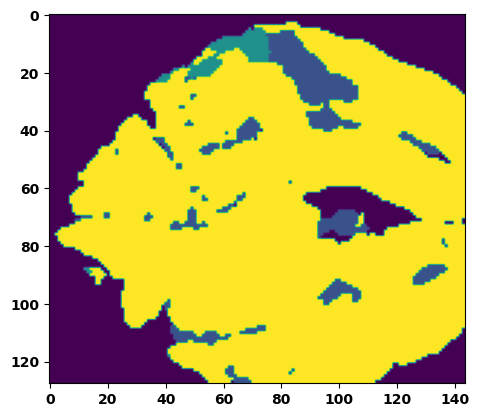

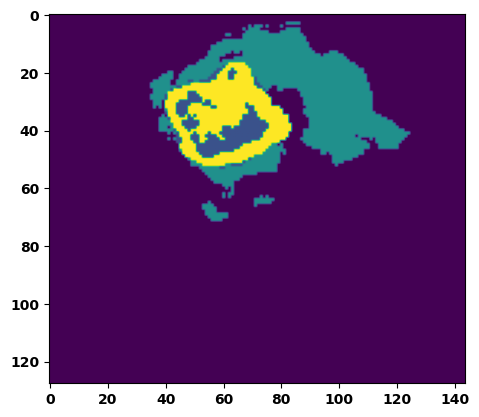

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.05669136345386505
Batch_id:  11 Eval IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.05s/it]

Batch_id:  12 Eval loss:  0.6363354325294495
Batch_id:  12 Eval IoU:  tensor(0.3055, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9752, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.02s/it]

Batch_id:  13 Eval loss:  0.7631757855415344
Batch_id:  13 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.06s/it]

Batch_id:  14 Eval loss:  0.7653036713600159
Batch_id:  14 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.24167709052562714
Batch_id:  15 Eval IoU:  tensor(0.6557, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.6885240077972412
Batch_id:  16 Eval IoU:  tensor(0.2092, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7519, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.5500, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8449, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8133, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.7993, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:20,  1.15s/it]

Batch_id:  17 Eval loss:  0.7083456516265869
Batch_id:  17 Eval IoU:  tensor(0.2152, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6202, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3110, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2585, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:19,  1.13s/it]

Batch_id:  18 Eval loss:  0.765936553478241
Batch_id:  18 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:18,  1.15s/it]

Batch_id:  19 Eval loss:  0.7561949491500854
Batch_id:  19 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  20 Eval loss:  0.7517255544662476
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


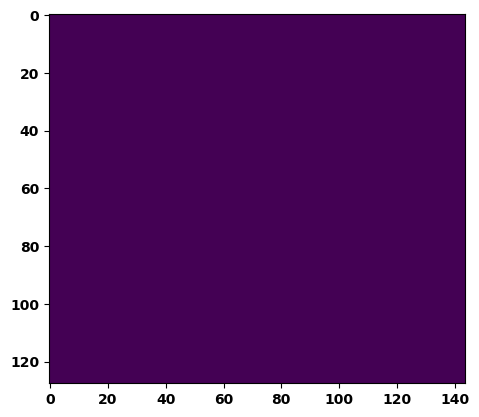

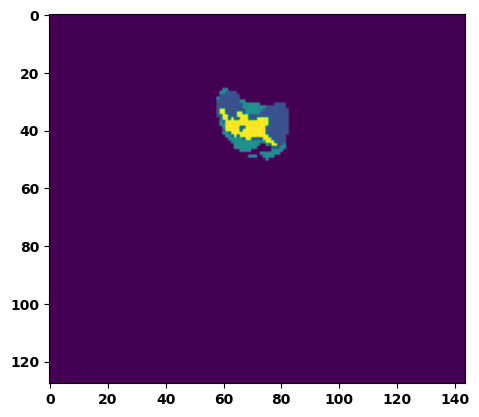

 61%|██████    | 22/36 [00:24<00:16,  1.20s/it]

Batch_id:  21 Eval loss:  0.7636600136756897
Batch_id:  21 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:15,  1.19s/it]

Batch_id:  22 Eval loss:  0.14316615462303162
Batch_id:  22 Eval IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9775, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:14,  1.19s/it]

Batch_id:  23 Eval loss:  0.6820027828216553
Batch_id:  23 Eval IoU:  tensor(0.2251, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.6627, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3808, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3381, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:13,  1.19s/it]

Batch_id:  24 Eval loss:  0.6254473924636841
Batch_id:  24 Eval IoU:  tensor(0.3010, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9304, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9563, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:11,  1.15s/it]

Batch_id:  25 Eval loss:  0.79076087474823
Batch_id:  25 Eval IoU:  tensor(0.1766, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8500, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7000, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.8239, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:10,  1.16s/it]

Batch_id:  26 Eval loss:  0.44855156540870667
Batch_id:  26 Eval IoU:  tensor(0.4614, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9235, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.8108700513839722
Batch_id:  27 Eval IoU:  tensor(0.1232, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6889, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5011, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.4353, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.8801614046096802
Batch_id:  28 Eval IoU:  tensor(0.0768, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6250, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4241, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2501, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.15s/it]

Batch_id:  29 Eval loss:  0.4485967457294464
Batch_id:  29 Eval IoU:  tensor(0.4549, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8389, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.6840, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.6870, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  30 Eval loss:  0.7535254955291748
Batch_id:  30 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


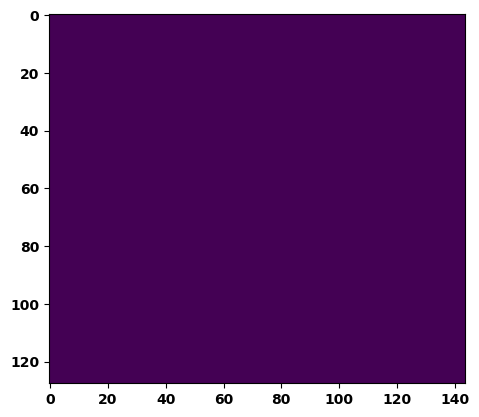

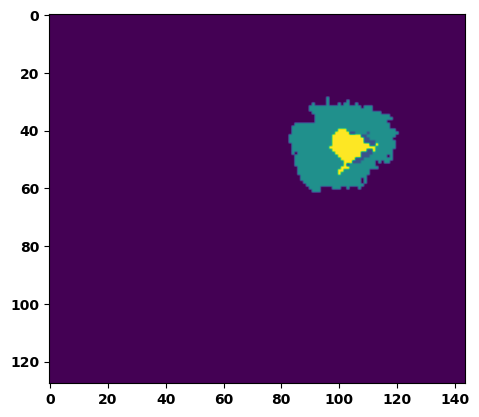

 89%|████████▉ | 32/36 [00:35<00:04,  1.15s/it]

Batch_id:  31 Eval loss:  0.5892122983932495
Batch_id:  31 Eval IoU:  tensor(0.3328, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8861, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9646, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.13s/it]

Batch_id:  32 Eval loss:  0.7690843343734741
Batch_id:  32 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.12s/it]

Batch_id:  33 Eval loss:  0.7070393562316895
Batch_id:  33 Eval IoU:  tensor(0.2584, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9033, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8109, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.11s/it]

Batch_id:  34 Eval loss:  0.6965117454528809
Batch_id:  34 Eval IoU:  tensor(0.2337, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8436, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.7556, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.6960, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9442, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.12s/it]

Batch_id:  35 Eval loss:  0.6035929322242737
Batch_id:  35 Eval IoU:  tensor(0.3201, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9163, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8923, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8467, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9506, device='cuda:0')
Epoch  15 Training loss:  0.17144877450032667
Epoch  15 Evaluation loss:  0.6487898346450593
Epoch  15 Training accuracy :  tensor(0.7573)
Epoch  15 Evaluation accuracy :  tensor(0.2994)
Epoch  15 Training Mean Dice Score:  tensor(0.9856)
Epoch  15 Eval Mean Dice Score:  tensor(0.8797)
Epoch  15 Training Non-tumor Dice Score:  tensor(0.9816)
Epoch  15 Eval Non-tumor Dice Score:  tensor(0.7919)
Epoch  15 Training NCR/NET Dice Score:  tensor(0.9908)
Epoch  15 Eval NCR/NET Dice Score:  tensor(0.9624)
Epoch  15 Training ED Dice Score:  tensor(0.97

Epoch: 16
Training in session: 


  1%|          | 1/110 [00:01<02:10,  1.20s/it]

Batch_id:  0 Training loss:  0.09684085845947266
Batch_id:  0 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:04,  1.15s/it]

Batch_id:  1 Training loss:  0.11653809249401093
Batch_id:  1 Training IoU:  tensor(0.8106, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:02,  1.15s/it]

Batch_id:  2 Training loss:  0.19265878200531006
Batch_id:  2 Training IoU:  tensor(0.7050, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.08539208769798279
Batch_id:  3 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


  5%|▍         | 5/110 [00:05<02:07,  1.21s/it]

Batch_id:  4 Training loss:  0.3062244653701782
Batch_id:  4 Training IoU:  tensor(0.6090, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  5%|▌         | 6/110 [00:07<02:04,  1.19s/it]

Batch_id:  5 Training loss:  0.28267061710357666
Batch_id:  5 Training IoU:  tensor(0.6605, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


  6%|▋         | 7/110 [00:08<02:00,  1.17s/it]

Batch_id:  6 Training loss:  0.2356848418712616
Batch_id:  6 Training IoU:  tensor(0.6559, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.15969757735729218
Batch_id:  7 Training IoU:  tensor(0.7619, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:51,  1.10s/it]

Batch_id:  8 Training loss:  0.1565915048122406
Batch_id:  8 Training IoU:  tensor(0.7691, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:49,  1.09s/it]

Batch_id:  9 Training loss:  0.09324635565280914
Batch_id:  9 Training IoU:  tensor(0.8395, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 10%|█         | 11/110 [00:12<01:54,  1.15s/it]

Batch_id:  10 Training loss:  0.27262693643569946
Batch_id:  10 Training IoU:  tensor(0.6076, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 11%|█         | 12/110 [00:13<01:52,  1.15s/it]

Batch_id:  11 Training loss:  0.09922802448272705
Batch_id:  11 Training IoU:  tensor(0.8352, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:51,  1.15s/it]

Batch_id:  12 Training loss:  0.05729451775550842
Batch_id:  12 Training IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 13%|█▎        | 14/110 [00:16<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.1438133418560028
Batch_id:  13 Training IoU:  tensor(0.7735, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:48,  1.14s/it]

Batch_id:  14 Training loss:  0.22362712025642395
Batch_id:  14 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:45,  1.12s/it]

Batch_id:  15 Training loss:  0.06371979415416718
Batch_id:  15 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:42,  1.10s/it]

Batch_id:  16 Training loss:  0.1727863997220993
Batch_id:  16 Training IoU:  tensor(0.7291, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:43,  1.12s/it]

Batch_id:  17 Training loss:  0.08697918057441711
Batch_id:  17 Training IoU:  tensor(0.8763, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:42,  1.12s/it]

Batch_id:  18 Training loss:  0.06133519113063812
Batch_id:  18 Training IoU:  tensor(0.8962, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:39,  1.10s/it]

Batch_id:  19 Training loss:  0.08121128380298615
Batch_id:  19 Training IoU:  tensor(0.8755, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.42114174365997314
Batch_id:  20 Training IoU:  tensor(0.5070, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 20%|██        | 22/110 [00:24<01:36,  1.10s/it]

Batch_id:  21 Training loss:  0.08710193634033203
Batch_id:  21 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 21%|██        | 23/110 [00:26<01:37,  1.12s/it]

Batch_id:  22 Training loss:  0.146762877702713
Batch_id:  22 Training IoU:  tensor(0.7633, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.11099697649478912
Batch_id:  23 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:34,  1.11s/it]

Batch_id:  24 Training loss:  0.06317782402038574
Batch_id:  24 Training IoU:  tensor(0.8921, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:32,  1.10s/it]

Batch_id:  25 Training loss:  0.1353541612625122
Batch_id:  25 Training IoU:  tensor(0.7752, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:33,  1.13s/it]

Batch_id:  26 Training loss:  0.1960729956626892
Batch_id:  26 Training IoU:  tensor(0.7076, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:32,  1.13s/it]

Batch_id:  27 Training loss:  0.11638469994068146
Batch_id:  27 Training IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.11s/it]

Batch_id:  28 Training loss:  0.21210840344429016
Batch_id:  28 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:29,  1.12s/it]

Batch_id:  29 Training loss:  0.1191600114107132
Batch_id:  29 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:31,  1.16s/it]

Batch_id:  30 Training loss:  0.13517364859580994
Batch_id:  30 Training IoU:  tensor(0.7933, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:27,  1.13s/it]

Batch_id:  31 Training loss:  0.07041463255882263
Batch_id:  31 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 30%|███       | 33/110 [00:37<01:27,  1.14s/it]

Batch_id:  32 Training loss:  0.3159661889076233
Batch_id:  32 Training IoU:  tensor(0.6062, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 31%|███       | 34/110 [00:38<01:24,  1.12s/it]

Batch_id:  33 Training loss:  0.35700082778930664
Batch_id:  33 Training IoU:  tensor(0.5789, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:23,  1.11s/it]

Batch_id:  34 Training loss:  0.24961358308792114
Batch_id:  34 Training IoU:  tensor(0.7015, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:21,  1.10s/it]

Batch_id:  35 Training loss:  0.4836718738079071
Batch_id:  35 Training IoU:  tensor(0.4426, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.14250008761882782
Batch_id:  36 Training IoU:  tensor(0.7659, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:21,  1.13s/it]

Batch_id:  37 Training loss:  0.09572733938694
Batch_id:  37 Training IoU:  tensor(0.8448, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.19275397062301636
Batch_id:  38 Training IoU:  tensor(0.7509, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 36%|███▋      | 40/110 [00:45<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.16017131507396698
Batch_id:  39 Training IoU:  tensor(0.7786, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 37%|███▋      | 41/110 [00:46<01:15,  1.09s/it]

Batch_id:  40 Training loss:  0.1344134658575058
Batch_id:  40 Training IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.09361866116523743
Batch_id:  41 Training IoU:  tensor(0.8453, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.08609826862812042
Batch_id:  42 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 40%|████      | 44/110 [00:49<01:14,  1.12s/it]

Batch_id:  43 Training loss:  0.24587951600551605
Batch_id:  43 Training IoU:  tensor(0.6700, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 41%|████      | 45/110 [00:50<01:11,  1.10s/it]

Batch_id:  44 Training loss:  0.15183798968791962
Batch_id:  44 Training IoU:  tensor(0.7821, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.14757616817951202
Batch_id:  45 Training IoU:  tensor(0.7621, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:10,  1.12s/it]

Batch_id:  46 Training loss:  0.06621268391609192
Batch_id:  46 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.1018446832895279
Batch_id:  47 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 45%|████▍     | 49/110 [00:55<01:08,  1.13s/it]

Batch_id:  48 Training loss:  0.13983125984668732
Batch_id:  48 Training IoU:  tensor(0.7901, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 45%|████▌     | 50/110 [00:56<01:08,  1.14s/it]

Batch_id:  49 Training loss:  0.13263627886772156
Batch_id:  49 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 46%|████▋     | 51/110 [00:57<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.09840303659439087
Batch_id:  50 Training IoU:  tensor(0.8411, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:04,  1.11s/it]

Batch_id:  51 Training loss:  0.07674777507781982
Batch_id:  51 Training IoU:  tensor(0.8990, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.16567958891391754
Batch_id:  52 Training IoU:  tensor(0.7529, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:00,  1.09s/it]

Batch_id:  53 Training loss:  0.08678936958312988
Batch_id:  53 Training IoU:  tensor(0.8522, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.3888833224773407
Batch_id:  54 Training IoU:  tensor(0.5499, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:59,  1.09s/it]

Batch_id:  55 Training loss:  0.13681577146053314
Batch_id:  55 Training IoU:  tensor(0.7786, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:57,  1.09s/it]

Batch_id:  56 Training loss:  0.2367670238018036
Batch_id:  56 Training IoU:  tensor(0.6691, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.05241583287715912
Batch_id:  57 Training IoU:  tensor(0.9191, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 54%|█████▎    | 59/110 [01:06<00:57,  1.13s/it]

Batch_id:  58 Training loss:  0.07348564267158508
Batch_id:  58 Training IoU:  tensor(0.8749, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 55%|█████▍    | 60/110 [01:07<00:55,  1.12s/it]

Batch_id:  59 Training loss:  0.2942594289779663
Batch_id:  59 Training IoU:  tensor(0.6359, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 55%|█████▌    | 61/110 [01:08<00:54,  1.11s/it]

Batch_id:  60 Training loss:  0.08496293425559998
Batch_id:  60 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.4995456337928772
Batch_id:  61 Training IoU:  tensor(0.3987, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9244, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.3937147259712219
Batch_id:  62 Training IoU:  tensor(0.5455, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.28687727451324463
Batch_id:  63 Training IoU:  tensor(0.5930, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9670, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.1782773733139038
Batch_id:  64 Training IoU:  tensor(0.7249, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.17110539972782135
Batch_id:  65 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:47,  1.09s/it]

Batch_id:  66 Training loss:  0.1689196676015854
Batch_id:  66 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:44,  1.06s/it]

Batch_id:  67 Training loss:  0.1463087797164917
Batch_id:  67 Training IoU:  tensor(0.7843, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.05106692016124725
Batch_id:  68 Training IoU:  tensor(0.9099, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 64%|██████▎   | 70/110 [01:18<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.09579551219940186
Batch_id:  69 Training IoU:  tensor(0.8353, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.08387158811092377
Batch_id:  70 Training IoU:  tensor(0.8723, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:41,  1.10s/it]

Batch_id:  71 Training loss:  0.17562779784202576
Batch_id:  71 Training IoU:  tensor(0.7397, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.11490307748317719
Batch_id:  72 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:40,  1.14s/it]

Batch_id:  73 Training loss:  0.07622908055782318
Batch_id:  73 Training IoU:  tensor(0.8686, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.17490193247795105
Batch_id:  74 Training IoU:  tensor(0.7249, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.09117881953716278
Batch_id:  75 Training IoU:  tensor(0.8462, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:36,  1.11s/it]

Batch_id:  76 Training loss:  0.07359778881072998
Batch_id:  76 Training IoU:  tensor(0.8711, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:34,  1.09s/it]

Batch_id:  77 Training loss:  0.09915313124656677
Batch_id:  77 Training IoU:  tensor(0.8306, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 72%|███████▏  | 79/110 [01:28<00:34,  1.11s/it]

Batch_id:  78 Training loss:  0.42383113503456116
Batch_id:  78 Training IoU:  tensor(0.4884, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 73%|███████▎  | 80/110 [01:29<00:32,  1.10s/it]

Batch_id:  79 Training loss:  0.1912442445755005
Batch_id:  79 Training IoU:  tensor(0.7288, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:32,  1.13s/it]

Batch_id:  80 Training loss:  0.17064206302165985
Batch_id:  80 Training IoU:  tensor(0.7311, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9712, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:32,  1.16s/it]

Batch_id:  81 Training loss:  0.2678189277648926
Batch_id:  81 Training IoU:  tensor(0.6667, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:31,  1.17s/it]

Batch_id:  82 Training loss:  0.21888968348503113
Batch_id:  82 Training IoU:  tensor(0.6890, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:29,  1.13s/it]

Batch_id:  83 Training loss:  0.15773651003837585
Batch_id:  83 Training IoU:  tensor(0.7461, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9717, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:27,  1.12s/it]

Batch_id:  84 Training loss:  0.28730201721191406
Batch_id:  84 Training IoU:  tensor(0.6680, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.16016685962677002
Batch_id:  85 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:24,  1.08s/it]

Batch_id:  86 Training loss:  0.08636432886123657
Batch_id:  86 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 80%|████████  | 88/110 [01:38<00:23,  1.09s/it]

Batch_id:  87 Training loss:  0.2549799978733063
Batch_id:  87 Training IoU:  tensor(0.6364, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 81%|████████  | 89/110 [01:39<00:23,  1.11s/it]

Batch_id:  88 Training loss:  0.241875559091568
Batch_id:  88 Training IoU:  tensor(0.6405, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:22,  1.10s/it]

Batch_id:  89 Training loss:  0.11013010144233704
Batch_id:  89 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:20,  1.10s/it]

Batch_id:  90 Training loss:  0.17698608338832855
Batch_id:  90 Training IoU:  tensor(0.7364, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.1355147659778595
Batch_id:  91 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.09670978784561157
Batch_id:  92 Training IoU:  tensor(0.8394, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.09866510331630707
Batch_id:  93 Training IoU:  tensor(0.8306, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.1434294432401657
Batch_id:  94 Training IoU:  tensor(0.7836, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.5232506990432739
Batch_id:  95 Training IoU:  tensor(0.4022, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 88%|████████▊ | 97/110 [01:48<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.05834534764289856
Batch_id:  96 Training IoU:  tensor(0.9042, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 89%|████████▉ | 98/110 [01:49<00:13,  1.08s/it]

Batch_id:  97 Training loss:  0.21021167933940887
Batch_id:  97 Training IoU:  tensor(0.7378, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 90%|█████████ | 99/110 [01:50<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.16676859557628632
Batch_id:  98 Training IoU:  tensor(0.7380, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 91%|█████████ | 100/110 [01:51<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.1870327889919281
Batch_id:  99 Training IoU:  tensor(0.7059, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 92%|█████████▏| 101/110 [01:52<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.2279709130525589
Batch_id:  100 Training IoU:  tensor(0.6727, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.12320075929164886
Batch_id:  101 Training IoU:  tensor(0.8130, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.09s/it]

Batch_id:  102 Training loss:  0.11811710894107819
Batch_id:  102 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.09s/it]

Batch_id:  103 Training loss:  0.15961173176765442
Batch_id:  103 Training IoU:  tensor(0.7530, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.11s/it]

Batch_id:  104 Training loss:  0.1722133904695511
Batch_id:  104 Training IoU:  tensor(0.7625, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.12s/it]

Batch_id:  105 Training loss:  0.3075740337371826
Batch_id:  105 Training IoU:  tensor(0.6097, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.10s/it]

Batch_id:  106 Training loss:  0.06996114552021027
Batch_id:  106 Training IoU:  tensor(0.8808, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 98%|█████████▊| 108/110 [02:00<00:02,  1.12s/it]

Batch_id:  107 Training loss:  0.3051733076572418
Batch_id:  107 Training IoU:  tensor(0.5799, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 99%|█████████▉| 109/110 [02:01<00:01,  1.12s/it]

Batch_id:  108 Training loss:  0.0925716757774353
Batch_id:  108 Training IoU:  tensor(0.8457, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


100%|██████████| 110/110 [02:02<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.09716552495956421
Batch_id:  109 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9975, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.2987121343612671
Batch_id:  0 Eval IoU:  tensor(0.5983, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9852, device='cuda:0')


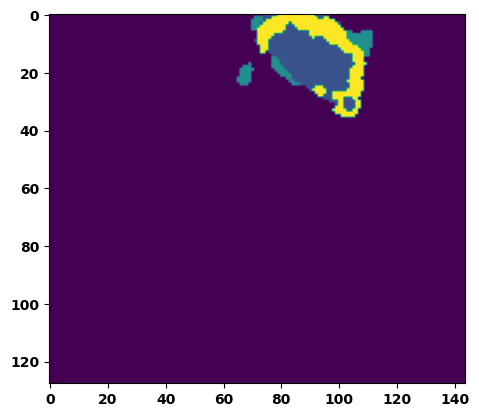

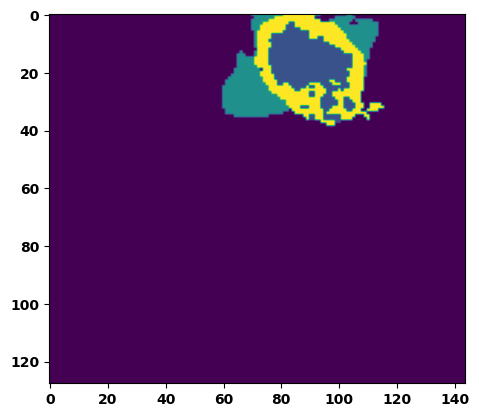

  6%|▌         | 2/36 [00:02<00:37,  1.10s/it]

Batch_id:  1 Eval loss:  0.7581599950790405
Batch_id:  1 Eval IoU:  tensor(0.2122, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8151, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8822, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.11s/it]

Batch_id:  2 Eval loss:  0.4781198501586914
Batch_id:  2 Eval IoU:  tensor(0.4120, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8249, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.6630, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.6849, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9845, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.09s/it]

Batch_id:  3 Eval loss:  0.8129392266273499
Batch_id:  3 Eval IoU:  tensor(0.1165, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6591, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3630, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8813, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.4381, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.06s/it]

Batch_id:  4 Eval loss:  0.8187276721000671
Batch_id:  4 Eval IoU:  tensor(0.1178, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6841, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4918, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8778, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3800, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.6637016534805298
Batch_id:  5 Eval IoU:  tensor(0.2174, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6817, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4371, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.4768, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9346, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.07s/it]

Batch_id:  6 Eval loss:  0.35697072744369507
Batch_id:  6 Eval IoU:  tensor(0.5082, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9061, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9697, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.10s/it]

Batch_id:  7 Eval loss:  0.8499600291252136
Batch_id:  7 Eval IoU:  tensor(0.0899, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6348, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3734, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9118, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3044, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:30,  1.12s/it]

Batch_id:  8 Eval loss:  0.8407989740371704
Batch_id:  8 Eval IoU:  tensor(0.1016, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6622, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4246, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8929, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8774, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.4538, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:29,  1.12s/it]

Batch_id:  9 Eval loss:  0.811764121055603
Batch_id:  9 Eval IoU:  tensor(0.1208, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6900, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4724, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3863, device='cuda:0')
Batch_id:  10 Eval loss:  0.5863978862762451
Batch_id:  10 Eval IoU:  tensor(0.3327, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9001, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9770, device='cuda:0')


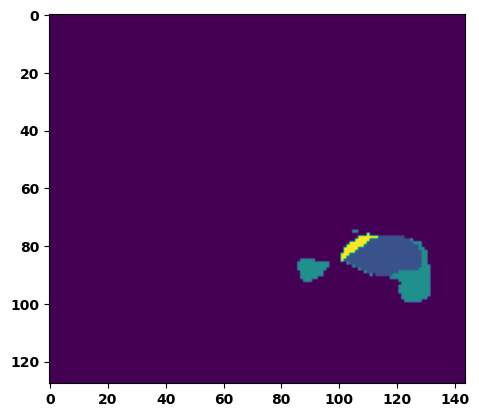

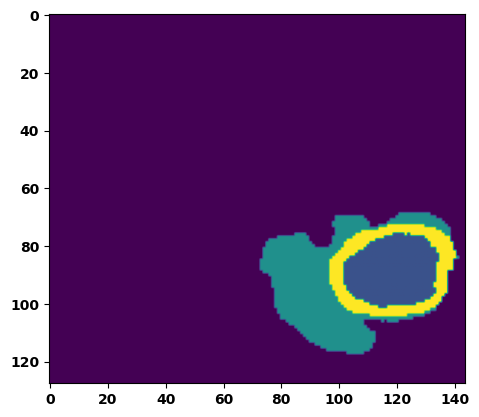

 33%|███▎      | 12/36 [00:13<00:27,  1.13s/it]

Batch_id:  11 Eval loss:  0.34755128622055054
Batch_id:  11 Eval IoU:  tensor(0.5210, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8899, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9672, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:26,  1.13s/it]

Batch_id:  12 Eval loss:  0.2974492311477661
Batch_id:  12 Eval IoU:  tensor(0.6439, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.13s/it]

Batch_id:  13 Eval loss:  0.057990074157714844
Batch_id:  13 Eval IoU:  tensor(0.8967, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.13s/it]

Batch_id:  14 Eval loss:  0.7570774555206299
Batch_id:  14 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.10s/it]

Batch_id:  15 Eval loss:  0.7517372369766235
Batch_id:  15 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:21,  1.12s/it]

Batch_id:  16 Eval loss:  0.7535642385482788
Batch_id:  16 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.09s/it]

Batch_id:  17 Eval loss:  0.3732048273086548
Batch_id:  17 Eval IoU:  tensor(0.5129, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9732, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.06s/it]

Batch_id:  18 Eval loss:  0.7633524537086487
Batch_id:  18 Eval IoU:  tensor(0.2242, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8972, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.09s/it]

Batch_id:  19 Eval loss:  0.8664641976356506
Batch_id:  19 Eval IoU:  tensor(0.0815, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6502, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3182, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.4174, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  20 Eval loss:  0.8260948061943054
Batch_id:  20 Eval IoU:  tensor(0.1102, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6826, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4207, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3656, device='cuda:0')


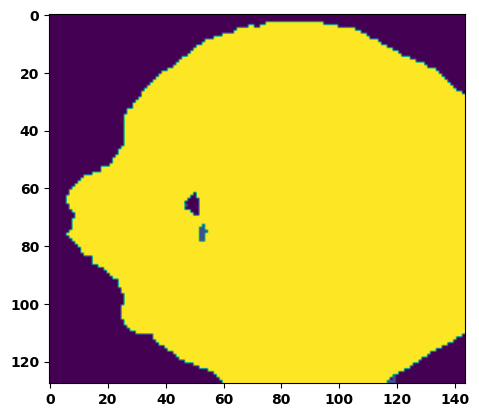

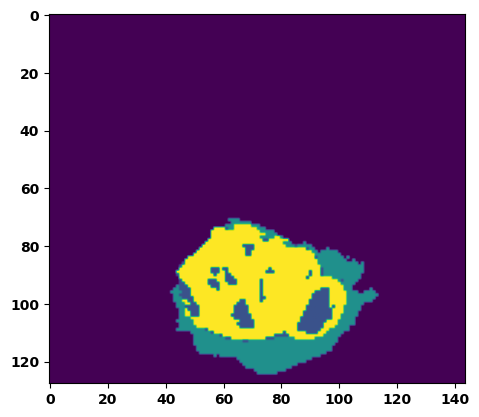

 61%|██████    | 22/36 [00:24<00:16,  1.15s/it]

Batch_id:  21 Eval loss:  0.7690484523773193
Batch_id:  21 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8558, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:15,  1.18s/it]

Batch_id:  22 Eval loss:  0.8438130617141724
Batch_id:  22 Eval IoU:  tensor(0.0891, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.5955, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.2976, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.1985, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.15s/it]

Batch_id:  23 Eval loss:  0.09647239744663239
Batch_id:  23 Eval IoU:  tensor(0.8926, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9983, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.12s/it]

Batch_id:  24 Eval loss:  0.7659804821014404
Batch_id:  24 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 72%|███████▏  | 26/36 [00:29<00:11,  1.12s/it]

Batch_id:  25 Eval loss:  0.7557566165924072
Batch_id:  25 Eval IoU:  tensor(0.2134, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8349, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:09,  1.11s/it]

Batch_id:  26 Eval loss:  0.7653287649154663
Batch_id:  26 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.08s/it]

Batch_id:  27 Eval loss:  0.5441517233848572
Batch_id:  27 Eval IoU:  tensor(0.3560, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9077, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.8188, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:07,  1.09s/it]

Batch_id:  28 Eval loss:  0.13716766238212585
Batch_id:  28 Eval IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9987, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.09s/it]

Batch_id:  29 Eval loss:  0.3916478157043457
Batch_id:  29 Eval IoU:  tensor(0.4929, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  30 Eval loss:  0.8479028940200806
Batch_id:  30 Eval IoU:  tensor(0.0905, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6368, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3406, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.3022, device='cuda:0')


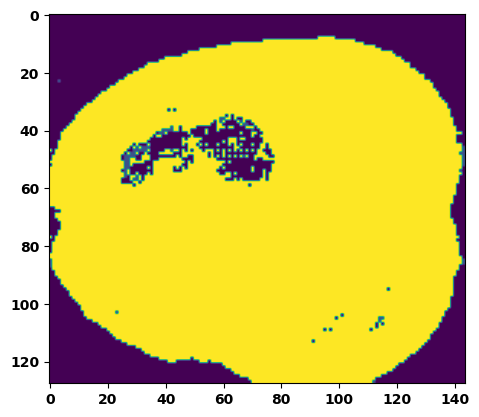

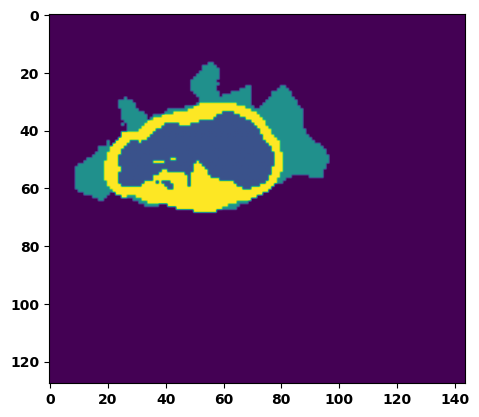

 89%|████████▉ | 32/36 [00:35<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.8878803253173828
Batch_id:  31 Eval IoU:  tensor(0.0705, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6148, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4039, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.2300, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.10s/it]

Batch_id:  32 Eval loss:  0.26549288630485535
Batch_id:  32 Eval IoU:  tensor(0.6886, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.15s/it]

Batch_id:  33 Eval loss:  0.6953520774841309
Batch_id:  33 Eval IoU:  tensor(0.2479, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8289, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8134, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8536, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7932, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.11s/it]

Batch_id:  34 Eval loss:  0.6112750768661499
Batch_id:  34 Eval IoU:  tensor(0.2668, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.7994, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.6543, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.6222, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9528, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.11s/it]

Batch_id:  35 Eval loss:  0.5412129163742065
Batch_id:  35 Eval IoU:  tensor(0.3761, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9022, device='cuda:0')
Epoch  16 Training loss:  0.17015555081042377
Epoch  16 Evaluation loss:  0.6108117008374797
Epoch  16 Training accuracy :  tensor(0.7573)
Epoch  16 Evaluation accuracy :  tensor(0.3274)
Epoch  16 Training Mean Dice Score:  tensor(0.9858)
Epoch  16 Eval Mean Dice Score:  tensor(0.8528)
Epoch  16 Training Non-tumor Dice Score:  tensor(0.9820)
Epoch  16 Eval Non-tumor Dice Score:  tensor(0.7471)
Epoch  16 Training NCR/NET Dice Score:  tensor(0.9904)
Epoch  16 Eval NCR/NET Dice Score:  tensor(0.9578)
Epoch  16 Training ED Dice Score:  tensor(0.97

Epoch: 17
Training in session: 


  1%|          | 1/110 [00:01<02:12,  1.22s/it]

Batch_id:  0 Training loss:  0.06901673972606659
Batch_id:  0 Training IoU:  tensor(0.8855, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:03,  1.14s/it]

Batch_id:  1 Training loss:  0.12547293305397034
Batch_id:  1 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:02,  1.14s/it]

Batch_id:  2 Training loss:  0.2623226046562195
Batch_id:  2 Training IoU:  tensor(0.6824, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:04,  1.18s/it]

Batch_id:  3 Training loss:  0.24160683155059814
Batch_id:  3 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  5%|▍         | 5/110 [00:05<02:07,  1.21s/it]

Batch_id:  4 Training loss:  0.31343019008636475
Batch_id:  4 Training IoU:  tensor(0.5945, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:59,  1.15s/it]

Batch_id:  5 Training loss:  0.17185761034488678
Batch_id:  5 Training IoU:  tensor(0.7233, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


  6%|▋         | 7/110 [00:08<02:01,  1.18s/it]

Batch_id:  6 Training loss:  0.1120896190404892
Batch_id:  6 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:56,  1.15s/it]

Batch_id:  7 Training loss:  0.08706635236740112
Batch_id:  7 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:54,  1.13s/it]

Batch_id:  8 Training loss:  0.09622175991535187
Batch_id:  8 Training IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:54,  1.15s/it]

Batch_id:  9 Training loss:  0.07775746285915375
Batch_id:  9 Training IoU:  tensor(0.8641, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 10%|█         | 11/110 [00:12<01:54,  1.16s/it]

Batch_id:  10 Training loss:  0.14702653884887695
Batch_id:  10 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 11%|█         | 12/110 [00:13<01:51,  1.13s/it]

Batch_id:  11 Training loss:  0.08496083319187164
Batch_id:  11 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 12%|█▏        | 13/110 [00:15<01:52,  1.16s/it]

Batch_id:  12 Training loss:  0.1307656615972519
Batch_id:  12 Training IoU:  tensor(0.8218, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 13%|█▎        | 14/110 [00:16<01:49,  1.14s/it]

Batch_id:  13 Training loss:  0.14281639456748962
Batch_id:  13 Training IoU:  tensor(0.8007, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.14786668121814728
Batch_id:  14 Training IoU:  tensor(0.7928, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.10023757815361023
Batch_id:  15 Training IoU:  tensor(0.8289, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:40,  1.08s/it]

Batch_id:  16 Training loss:  0.1564008742570877
Batch_id:  16 Training IoU:  tensor(0.7466, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.08240023255348206
Batch_id:  17 Training IoU:  tensor(0.8618, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:41,  1.12s/it]

Batch_id:  18 Training loss:  0.08833883702754974
Batch_id:  18 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:42,  1.13s/it]

Batch_id:  19 Training loss:  0.13987727463245392
Batch_id:  19 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:39,  1.12s/it]

Batch_id:  20 Training loss:  0.13042671978473663
Batch_id:  20 Training IoU:  tensor(0.8003, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 20%|██        | 22/110 [00:24<01:37,  1.10s/it]

Batch_id:  21 Training loss:  0.1042928397655487
Batch_id:  21 Training IoU:  tensor(0.8272, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 21%|██        | 23/110 [00:25<01:34,  1.08s/it]

Batch_id:  22 Training loss:  0.08305571973323822
Batch_id:  22 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.14256609976291656
Batch_id:  23 Training IoU:  tensor(0.7829, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.16308747231960297
Batch_id:  24 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:31,  1.09s/it]

Batch_id:  25 Training loss:  0.38704919815063477
Batch_id:  25 Training IoU:  tensor(0.5551, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:28,  1.06s/it]

Batch_id:  26 Training loss:  0.16524644196033478
Batch_id:  26 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:26,  1.06s/it]

Batch_id:  27 Training loss:  0.2290475219488144
Batch_id:  27 Training IoU:  tensor(0.6769, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:25,  1.06s/it]

Batch_id:  28 Training loss:  0.27042216062545776
Batch_id:  28 Training IoU:  tensor(0.6832, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:24,  1.05s/it]

Batch_id:  29 Training loss:  0.16315272450447083
Batch_id:  29 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:23,  1.06s/it]

Batch_id:  30 Training loss:  0.0538000613451004
Batch_id:  30 Training IoU:  tensor(0.9152, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.061639681458473206
Batch_id:  31 Training IoU:  tensor(0.8947, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 30%|███       | 33/110 [00:36<01:23,  1.08s/it]

Batch_id:  32 Training loss:  0.07564343512058258
Batch_id:  32 Training IoU:  tensor(0.8731, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.08123041689395905
Batch_id:  33 Training IoU:  tensor(0.8585, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:21,  1.09s/it]

Batch_id:  34 Training loss:  0.10706444084644318
Batch_id:  34 Training IoU:  tensor(0.8236, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.08s/it]

Batch_id:  35 Training loss:  0.3526034653186798
Batch_id:  35 Training IoU:  tensor(0.5872, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.1789177656173706
Batch_id:  36 Training IoU:  tensor(0.7232, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.1630413979291916
Batch_id:  37 Training IoU:  tensor(0.7385, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.17211005091667175
Batch_id:  38 Training IoU:  tensor(0.7252, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.059546828269958496
Batch_id:  39 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.0875866711139679
Batch_id:  40 Training IoU:  tensor(0.8738, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.10s/it]

Batch_id:  41 Training loss:  0.4354451894760132
Batch_id:  41 Training IoU:  tensor(0.4766, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.049104854464530945
Batch_id:  42 Training IoU:  tensor(0.9130, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.09s/it]

Batch_id:  43 Training loss:  0.13991500437259674
Batch_id:  43 Training IoU:  tensor(0.7739, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.09391508996486664
Batch_id:  44 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.21150854229927063
Batch_id:  45 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:07,  1.07s/it]

Batch_id:  46 Training loss:  0.21843378245830536
Batch_id:  46 Training IoU:  tensor(0.6678, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.15850292146205902
Batch_id:  47 Training IoU:  tensor(0.7483, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.06716766953468323
Batch_id:  48 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.0657021701335907
Batch_id:  49 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.09219278395175934
Batch_id:  50 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:04,  1.11s/it]

Batch_id:  51 Training loss:  0.2733461558818817
Batch_id:  51 Training IoU:  tensor(0.6045, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:03,  1.11s/it]

Batch_id:  52 Training loss:  0.14917558431625366
Batch_id:  52 Training IoU:  tensor(0.7752, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.10683321952819824
Batch_id:  53 Training IoU:  tensor(0.8236, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:02,  1.14s/it]

Batch_id:  54 Training loss:  0.30070436000823975
Batch_id:  54 Training IoU:  tensor(0.6169, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 51%|█████     | 56/110 [01:01<01:01,  1.13s/it]

Batch_id:  55 Training loss:  0.24167858064174652
Batch_id:  55 Training IoU:  tensor(0.6733, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:59,  1.13s/it]

Batch_id:  56 Training loss:  0.10109356045722961
Batch_id:  56 Training IoU:  tensor(0.8461, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.29850417375564575
Batch_id:  57 Training IoU:  tensor(0.5773, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9715, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.1092240959405899
Batch_id:  58 Training IoU:  tensor(0.8316, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:55,  1.12s/it]

Batch_id:  59 Training loss:  0.0653565526008606
Batch_id:  59 Training IoU:  tensor(0.9175, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:54,  1.12s/it]

Batch_id:  60 Training loss:  0.47808414697647095
Batch_id:  60 Training IoU:  tensor(0.4204, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:54,  1.13s/it]

Batch_id:  61 Training loss:  0.10751119256019592
Batch_id:  61 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:53,  1.13s/it]

Batch_id:  62 Training loss:  0.17487958073616028
Batch_id:  62 Training IoU:  tensor(0.7652, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:53,  1.15s/it]

Batch_id:  63 Training loss:  0.19196639955043793
Batch_id:  63 Training IoU:  tensor(0.6946, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.16297678649425507
Batch_id:  64 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.13804268836975098
Batch_id:  65 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.15293464064598083
Batch_id:  66 Training IoU:  tensor(0.7598, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.07973015308380127
Batch_id:  67 Training IoU:  tensor(0.8624, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:43,  1.06s/it]

Batch_id:  68 Training loss:  0.2488655149936676
Batch_id:  68 Training IoU:  tensor(0.6389, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.374114066362381
Batch_id:  69 Training IoU:  tensor(0.5750, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.07006451487541199
Batch_id:  70 Training IoU:  tensor(0.8834, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:40,  1.06s/it]

Batch_id:  71 Training loss:  0.29433155059814453
Batch_id:  71 Training IoU:  tensor(0.6349, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.3848690986633301
Batch_id:  72 Training IoU:  tensor(0.5567, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:38,  1.08s/it]

Batch_id:  73 Training loss:  0.17643745243549347
Batch_id:  73 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:38,  1.09s/it]

Batch_id:  74 Training loss:  0.05220925807952881
Batch_id:  74 Training IoU:  tensor(0.9116, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:38,  1.13s/it]

Batch_id:  75 Training loss:  0.088199183344841
Batch_id:  75 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.4708588421344757
Batch_id:  76 Training IoU:  tensor(0.4589, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.0577373206615448
Batch_id:  77 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.10843583941459656
Batch_id:  78 Training IoU:  tensor(0.8341, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.2757270932197571
Batch_id:  79 Training IoU:  tensor(0.6216, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:30,  1.05s/it]

Batch_id:  80 Training loss:  0.20810140669345856
Batch_id:  80 Training IoU:  tensor(0.6896, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:29,  1.06s/it]

Batch_id:  81 Training loss:  0.15916509926319122
Batch_id:  81 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:28,  1.07s/it]

Batch_id:  82 Training loss:  0.15525679290294647
Batch_id:  82 Training IoU:  tensor(0.7719, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.16444158554077148
Batch_id:  83 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.256778359413147
Batch_id:  84 Training IoU:  tensor(0.6770, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:25,  1.07s/it]

Batch_id:  85 Training loss:  0.12309199571609497
Batch_id:  85 Training IoU:  tensor(0.8018, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:24,  1.05s/it]

Batch_id:  86 Training loss:  0.12872672080993652
Batch_id:  86 Training IoU:  tensor(0.7997, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:23,  1.06s/it]

Batch_id:  87 Training loss:  0.08967277407646179
Batch_id:  87 Training IoU:  tensor(0.8460, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:21,  1.05s/it]

Batch_id:  88 Training loss:  0.10401397943496704
Batch_id:  88 Training IoU:  tensor(0.8237, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.21158301830291748
Batch_id:  89 Training IoU:  tensor(0.6756, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.07s/it]

Batch_id:  90 Training loss:  0.26785826683044434
Batch_id:  90 Training IoU:  tensor(0.6192, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9739, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.08s/it]

Batch_id:  91 Training loss:  0.16413655877113342
Batch_id:  91 Training IoU:  tensor(0.7452, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.06853972375392914
Batch_id:  92 Training IoU:  tensor(0.8938, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:17,  1.08s/it]

Batch_id:  93 Training loss:  0.11809854209423065
Batch_id:  93 Training IoU:  tensor(0.8072, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:15,  1.05s/it]

Batch_id:  94 Training loss:  0.15181328356266022
Batch_id:  94 Training IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:14,  1.06s/it]

Batch_id:  95 Training loss:  0.5321167707443237
Batch_id:  95 Training IoU:  tensor(0.3997, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.10s/it]

Batch_id:  96 Training loss:  0.08400559425354004
Batch_id:  96 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.10193057358264923
Batch_id:  97 Training IoU:  tensor(0.8290, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.09723357856273651
Batch_id:  98 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.2891685962677002
Batch_id:  99 Training IoU:  tensor(0.6289, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.06s/it]

Batch_id:  100 Training loss:  0.15614967048168182
Batch_id:  100 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.07s/it]

Batch_id:  101 Training loss:  0.19289159774780273
Batch_id:  101 Training IoU:  tensor(0.7090, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.22968769073486328
Batch_id:  102 Training IoU:  tensor(0.7223, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.103165403008461
Batch_id:  103 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.04s/it]

Batch_id:  104 Training loss:  0.1765362024307251
Batch_id:  104 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.04s/it]

Batch_id:  105 Training loss:  0.10710079967975616
Batch_id:  105 Training IoU:  tensor(0.8156, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.05s/it]

Batch_id:  106 Training loss:  0.11768324673175812
Batch_id:  106 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.06s/it]

Batch_id:  107 Training loss:  0.19613134860992432
Batch_id:  107 Training IoU:  tensor(0.7089, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.06s/it]

Batch_id:  108 Training loss:  0.14462733268737793
Batch_id:  108 Training IoU:  tensor(0.7639, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.13561196625232697
Batch_id:  109 Training IoU:  tensor(0.7734, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9749, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4411221444606781
Batch_id:  0 Eval IoU:  tensor(0.4359, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8994, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9644, device='cuda:0')


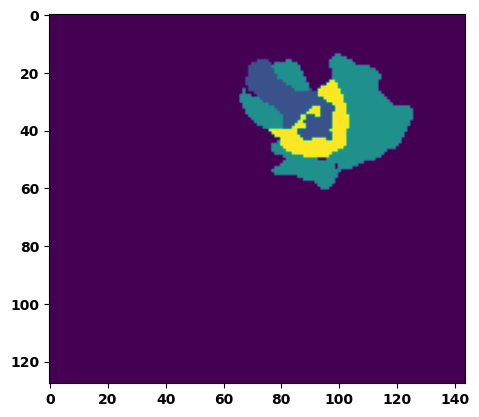

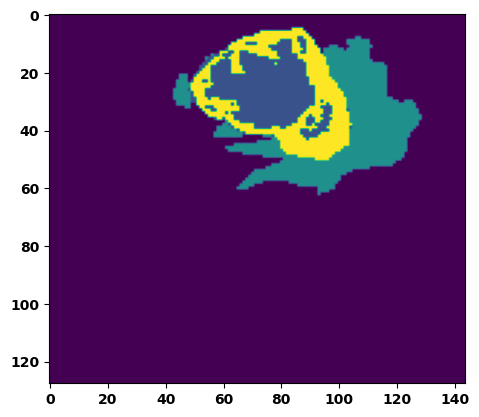

  6%|▌         | 2/36 [00:02<00:36,  1.06s/it]

Batch_id:  1 Eval loss:  0.7535467743873596
Batch_id:  1 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.7517416477203369
Batch_id:  2 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.02s/it]

Batch_id:  3 Eval loss:  0.769098162651062
Batch_id:  3 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.04s/it]

Batch_id:  4 Eval loss:  0.6432206034660339
Batch_id:  4 Eval IoU:  tensor(0.2916, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9760, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.07s/it]

Batch_id:  5 Eval loss:  0.6466167569160461
Batch_id:  5 Eval IoU:  tensor(0.2388, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7415, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.6036, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9163, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.5133, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9330, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.06s/it]

Batch_id:  6 Eval loss:  0.7482496500015259
Batch_id:  6 Eval IoU:  tensor(0.2238, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8794, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8770, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8033, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.03s/it]

Batch_id:  7 Eval loss:  0.8132923245429993
Batch_id:  7 Eval IoU:  tensor(0.1218, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6886, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.5003, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8761, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3892, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.03s/it]

Batch_id:  8 Eval loss:  0.056725263595581055
Batch_id:  8 Eval IoU:  tensor(0.8982, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.04s/it]

Batch_id:  9 Eval loss:  0.25108829140663147
Batch_id:  9 Eval IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  10 Eval loss:  0.757087230682373
Batch_id:  10 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


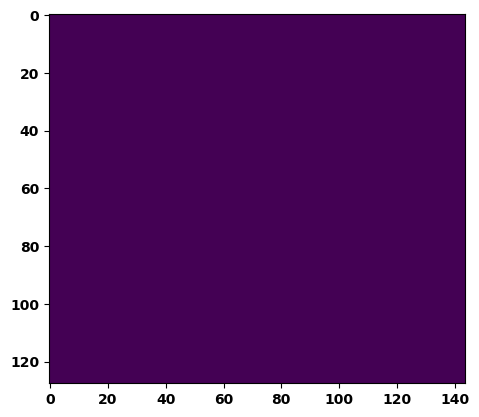

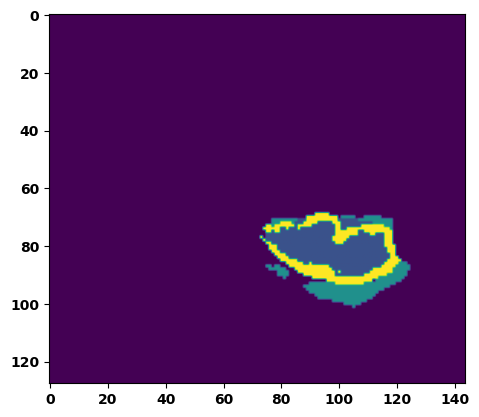

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.7351961135864258
Batch_id:  11 Eval IoU:  tensor(0.1690, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7046, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4678, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8369, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.5983, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.08s/it]

Batch_id:  12 Eval loss:  0.7819645404815674
Batch_id:  12 Eval IoU:  tensor(0.1639, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7916, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.5847, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.6704, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.05s/it]

Batch_id:  13 Eval loss:  0.6491800546646118
Batch_id:  13 Eval IoU:  tensor(0.2922, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9506, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.03s/it]

Batch_id:  14 Eval loss:  0.8816856741905212
Batch_id:  14 Eval IoU:  tensor(0.0754, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6228, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4198, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2457, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.00s/it]

Batch_id:  15 Eval loss:  0.7633528709411621
Batch_id:  15 Eval IoU:  tensor(0.2238, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8955, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.02s/it]

Batch_id:  16 Eval loss:  0.3873566687107086
Batch_id:  16 Eval IoU:  tensor(0.5211, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9098, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9804, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.00s/it]

Batch_id:  17 Eval loss:  0.7718707323074341
Batch_id:  17 Eval IoU:  tensor(0.1392, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6716, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4374, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.3640, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.00s/it]

Batch_id:  18 Eval loss:  0.6643704771995544
Batch_id:  18 Eval IoU:  tensor(0.2657, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8648, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8195, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.7334, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.02s/it]

Batch_id:  19 Eval loss:  0.8467311859130859
Batch_id:  19 Eval IoU:  tensor(0.1075, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7096, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4376, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.5347, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  20 Eval loss:  0.7633231282234192
Batch_id:  20 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


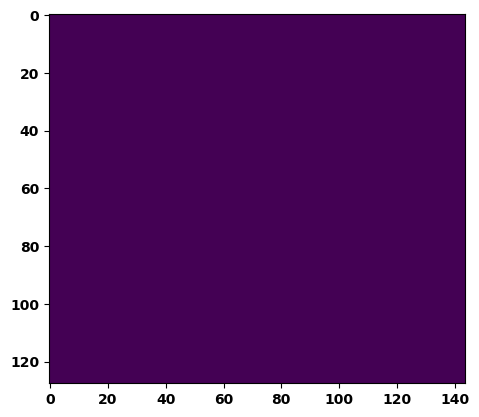

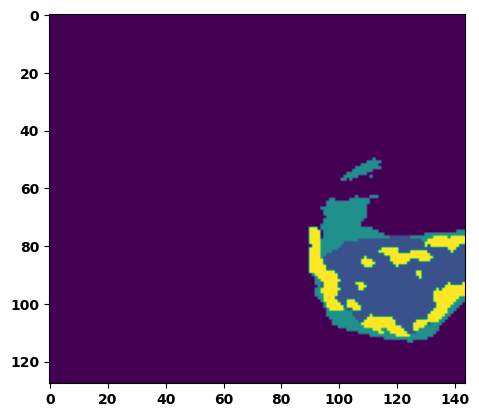

 61%|██████    | 22/36 [00:23<00:15,  1.10s/it]

Batch_id:  21 Eval loss:  0.7756763696670532
Batch_id:  21 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.15s/it]

Batch_id:  22 Eval loss:  0.8127055764198303
Batch_id:  22 Eval IoU:  tensor(0.1218, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7001, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.4559, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.4003, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:13,  1.14s/it]

Batch_id:  23 Eval loss:  0.11055813729763031
Batch_id:  23 Eval IoU:  tensor(0.8631, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:12,  1.09s/it]

Batch_id:  24 Eval loss:  0.5682039856910706
Batch_id:  24 Eval IoU:  tensor(0.3770, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8411, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.10s/it]

Batch_id:  25 Eval loss:  0.7653437256813049
Batch_id:  25 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.10s/it]

Batch_id:  26 Eval loss:  0.433846652507782
Batch_id:  26 Eval IoU:  tensor(0.4760, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8412, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.6848, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.6831, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9972, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.09s/it]

Batch_id:  27 Eval loss:  0.856063961982727
Batch_id:  27 Eval IoU:  tensor(0.0888, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6460, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3854, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2945, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.56341952085495
Batch_id:  28 Eval IoU:  tensor(0.3559, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8948, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8378, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9528, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.09s/it]

Batch_id:  29 Eval loss:  0.7427957653999329
Batch_id:  29 Eval IoU:  tensor(0.2440, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  30 Eval loss:  0.7089059352874756
Batch_id:  30 Eval IoU:  tensor(0.2178, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8218, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.7103, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.6444, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9456, device='cuda:0')


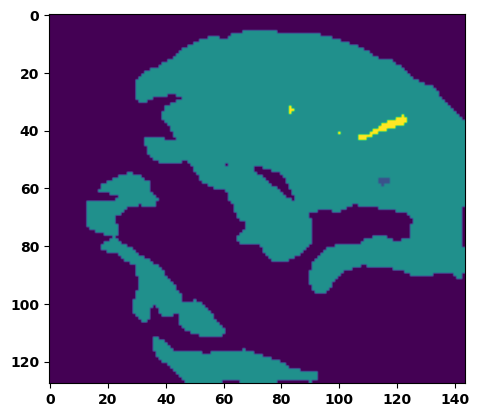

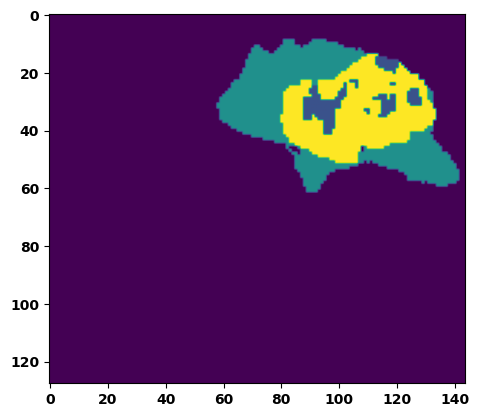

 89%|████████▉ | 32/36 [00:34<00:04,  1.12s/it]

Batch_id:  31 Eval loss:  0.847334086894989
Batch_id:  31 Eval IoU:  tensor(0.0867, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5975, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3079, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.2004, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.2816395163536072
Batch_id:  32 Eval IoU:  tensor(0.5962, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9483, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.08s/it]

Batch_id:  33 Eval loss:  0.7659855484962463
Batch_id:  33 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.10s/it]

Batch_id:  34 Eval loss:  0.6462365984916687
Batch_id:  34 Eval IoU:  tensor(0.2965, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9709, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.23146028816699982
Batch_id:  35 Eval IoU:  tensor(0.7015, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')
Epoch  17 Training loss:  0.16645602014931765
Epoch  17 Evaluation loss:  0.6385276657011774
Epoch  17 Training accuracy :  tensor(0.7614)
Epoch  17 Evaluation accuracy :  tensor(0.3071)
Epoch  17 Training Mean Dice Score:  tensor(0.9860)
Epoch  17 Eval Mean Dice Score:  tensor(0.8705)
Epoch  17 Training Non-tumor Dice Score:  tensor(0.9820)
Epoch  17 Eval Non-tumor Dice Score:  tensor(0.7816)
Epoch  17 Training NCR/NET Dice Score:  tensor(0.9910)
Epoch  17 Eval NCR/NET Dice Score:  tensor(0.9682)
Epoch  17 Training ED Dice Score:  tensor(0.9

Epoch: 18
Training in session: 


  1%|          | 1/110 [00:01<02:01,  1.11s/it]

Batch_id:  0 Training loss:  0.10461771488189697
Batch_id:  0 Training IoU:  tensor(0.8374, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:55,  1.07s/it]

Batch_id:  1 Training loss:  0.16478227078914642
Batch_id:  1 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.1652589738368988
Batch_id:  2 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.2369878739118576
Batch_id:  3 Training IoU:  tensor(0.6553, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.12s/it]

Batch_id:  4 Training loss:  0.08794839680194855
Batch_id:  4 Training IoU:  tensor(0.8497, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:58,  1.14s/it]

Batch_id:  5 Training loss:  0.2622828483581543
Batch_id:  5 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:55,  1.12s/it]

Batch_id:  6 Training loss:  0.26007118821144104
Batch_id:  6 Training IoU:  tensor(0.6267, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:58,  1.16s/it]

Batch_id:  7 Training loss:  0.20643289387226105
Batch_id:  7 Training IoU:  tensor(0.6935, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:52,  1.12s/it]

Batch_id:  8 Training loss:  0.08210276067256927
Batch_id:  8 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:50,  1.10s/it]

Batch_id:  9 Training loss:  0.16527575254440308
Batch_id:  9 Training IoU:  tensor(0.7381, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9697, device='cuda:0')


 10%|█         | 11/110 [00:12<01:47,  1.09s/it]

Batch_id:  10 Training loss:  0.1075994074344635
Batch_id:  10 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 11%|█         | 12/110 [00:13<01:43,  1.06s/it]

Batch_id:  11 Training loss:  0.14163465797901154
Batch_id:  11 Training IoU:  tensor(0.7918, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.10s/it]

Batch_id:  12 Training loss:  0.13532111048698425
Batch_id:  12 Training IoU:  tensor(0.7928, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.06865765154361725
Batch_id:  13 Training IoU:  tensor(0.8800, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:43,  1.09s/it]

Batch_id:  14 Training loss:  0.11825942993164062
Batch_id:  14 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.08520445227622986
Batch_id:  15 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:46,  1.14s/it]

Batch_id:  16 Training loss:  0.43385815620422363
Batch_id:  16 Training IoU:  tensor(0.4767, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.15120741724967957
Batch_id:  17 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:39,  1.09s/it]

Batch_id:  18 Training loss:  0.10831579566001892
Batch_id:  18 Training IoU:  tensor(0.8311, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:41,  1.13s/it]

Batch_id:  19 Training loss:  0.36005333065986633
Batch_id:  19 Training IoU:  tensor(0.6012, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:44,  1.18s/it]

Batch_id:  20 Training loss:  0.1792488396167755
Batch_id:  20 Training IoU:  tensor(0.7523, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 20%|██        | 22/110 [00:24<01:41,  1.15s/it]

Batch_id:  21 Training loss:  0.1404644399881363
Batch_id:  21 Training IoU:  tensor(0.7714, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 21%|██        | 23/110 [00:25<01:39,  1.15s/it]

Batch_id:  22 Training loss:  0.10243037343025208
Batch_id:  22 Training IoU:  tensor(0.8332, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:37,  1.13s/it]

Batch_id:  23 Training loss:  0.44113868474960327
Batch_id:  23 Training IoU:  tensor(0.4579, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:37,  1.15s/it]

Batch_id:  24 Training loss:  0.055495038628578186
Batch_id:  24 Training IoU:  tensor(0.9047, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:35,  1.13s/it]

Batch_id:  25 Training loss:  0.06868928670883179
Batch_id:  25 Training IoU:  tensor(0.8819, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:31,  1.10s/it]

Batch_id:  26 Training loss:  0.0869474709033966
Batch_id:  26 Training IoU:  tensor(0.8553, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.3476569950580597
Batch_id:  27 Training IoU:  tensor(0.5912, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.07426193356513977
Batch_id:  28 Training IoU:  tensor(0.8718, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.23303768038749695
Batch_id:  29 Training IoU:  tensor(0.6660, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:22,  1.05s/it]

Batch_id:  30 Training loss:  0.13659019768238068
Batch_id:  30 Training IoU:  tensor(0.8012, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.07186366617679596
Batch_id:  31 Training IoU:  tensor(0.8784, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 30%|███       | 33/110 [00:36<01:23,  1.08s/it]

Batch_id:  32 Training loss:  0.19988715648651123
Batch_id:  32 Training IoU:  tensor(0.7055, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.08s/it]

Batch_id:  33 Training loss:  0.1527005136013031
Batch_id:  33 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.2683393657207489
Batch_id:  34 Training IoU:  tensor(0.6103, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.08947056531906128
Batch_id:  35 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:19,  1.08s/it]

Batch_id:  36 Training loss:  0.08141672611236572
Batch_id:  36 Training IoU:  tensor(0.8791, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.07s/it]

Batch_id:  37 Training loss:  0.0861494243144989
Batch_id:  37 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.20953188836574554
Batch_id:  38 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.10s/it]

Batch_id:  39 Training loss:  0.13083890080451965
Batch_id:  39 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:15,  1.10s/it]

Batch_id:  40 Training loss:  0.08884529769420624
Batch_id:  40 Training IoU:  tensor(0.8462, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:16,  1.12s/it]

Batch_id:  41 Training loss:  0.09128446877002716
Batch_id:  41 Training IoU:  tensor(0.8471, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.10288543999195099
Batch_id:  42 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.12781602144241333
Batch_id:  43 Training IoU:  tensor(0.7852, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.1493096500635147
Batch_id:  44 Training IoU:  tensor(0.7579, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.08s/it]

Batch_id:  45 Training loss:  0.15754766762256622
Batch_id:  45 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.08s/it]

Batch_id:  46 Training loss:  0.0952276885509491
Batch_id:  46 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.25097060203552246
Batch_id:  47 Training IoU:  tensor(0.6686, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:07,  1.11s/it]

Batch_id:  48 Training loss:  0.08659452199935913
Batch_id:  48 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.14728088676929474
Batch_id:  49 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.15837107598781586
Batch_id:  50 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:04,  1.10s/it]

Batch_id:  51 Training loss:  0.065523162484169
Batch_id:  51 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.06326071918010712
Batch_id:  52 Training IoU:  tensor(0.8920, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.2261025309562683
Batch_id:  53 Training IoU:  tensor(0.6808, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.14414620399475098
Batch_id:  54 Training IoU:  tensor(0.7664, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:57,  1.07s/it]

Batch_id:  55 Training loss:  0.07763862609863281
Batch_id:  55 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.1669752448797226
Batch_id:  56 Training IoU:  tensor(0.7319, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.08s/it]

Batch_id:  57 Training loss:  0.5214428305625916
Batch_id:  57 Training IoU:  tensor(0.4078, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.27988699078559875
Batch_id:  58 Training IoU:  tensor(0.5999, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9689, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.08s/it]

Batch_id:  59 Training loss:  0.11750964820384979
Batch_id:  59 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:52,  1.07s/it]

Batch_id:  60 Training loss:  0.24749130010604858
Batch_id:  60 Training IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:51,  1.06s/it]

Batch_id:  61 Training loss:  0.14784015715122223
Batch_id:  61 Training IoU:  tensor(0.7741, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:49,  1.05s/it]

Batch_id:  62 Training loss:  0.06179434061050415
Batch_id:  62 Training IoU:  tensor(0.8938, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.07217560708522797
Batch_id:  63 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.1359580159187317
Batch_id:  64 Training IoU:  tensor(0.7754, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.11531712114810944
Batch_id:  65 Training IoU:  tensor(0.8201, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:45,  1.05s/it]

Batch_id:  66 Training loss:  0.10825236141681671
Batch_id:  66 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:44,  1.05s/it]

Batch_id:  67 Training loss:  0.06105789542198181
Batch_id:  67 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:43,  1.05s/it]

Batch_id:  68 Training loss:  0.16612376272678375
Batch_id:  68 Training IoU:  tensor(0.7503, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.15192563831806183
Batch_id:  69 Training IoU:  tensor(0.7536, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:40,  1.05s/it]

Batch_id:  70 Training loss:  0.21783334016799927
Batch_id:  70 Training IoU:  tensor(0.7251, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.07s/it]

Batch_id:  71 Training loss:  0.17937880754470825
Batch_id:  71 Training IoU:  tensor(0.7202, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.2619473338127136
Batch_id:  72 Training IoU:  tensor(0.6671, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.10868242383003235
Batch_id:  73 Training IoU:  tensor(0.8119, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:39,  1.11s/it]

Batch_id:  74 Training loss:  0.08432650566101074
Batch_id:  74 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:37,  1.12s/it]

Batch_id:  75 Training loss:  0.13642553985118866
Batch_id:  75 Training IoU:  tensor(0.7737, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.09s/it]

Batch_id:  76 Training loss:  0.07805360853672028
Batch_id:  76 Training IoU:  tensor(0.8718, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.0971730500459671
Batch_id:  77 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:34,  1.10s/it]

Batch_id:  78 Training loss:  0.20466426014900208
Batch_id:  78 Training IoU:  tensor(0.6849, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.11453312635421753
Batch_id:  79 Training IoU:  tensor(0.8242, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.2686416804790497
Batch_id:  80 Training IoU:  tensor(0.6128, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9689, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.09081152081489563
Batch_id:  81 Training IoU:  tensor(0.8478, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.21205028891563416
Batch_id:  82 Training IoU:  tensor(0.7376, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:29,  1.14s/it]

Batch_id:  83 Training loss:  0.06586554646492004
Batch_id:  83 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:28,  1.15s/it]

Batch_id:  84 Training loss:  0.3896203935146332
Batch_id:  84 Training IoU:  tensor(0.5461, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:27,  1.13s/it]

Batch_id:  85 Training loss:  0.3069007098674774
Batch_id:  85 Training IoU:  tensor(0.6078, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.1967950463294983
Batch_id:  86 Training IoU:  tensor(0.6910, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.10s/it]

Batch_id:  87 Training loss:  0.1655082255601883
Batch_id:  87 Training IoU:  tensor(0.7756, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.07155030965805054
Batch_id:  88 Training IoU:  tensor(0.9057, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.10s/it]

Batch_id:  89 Training loss:  0.05483943223953247
Batch_id:  89 Training IoU:  tensor(0.9037, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.06s/it]

Batch_id:  90 Training loss:  0.1384645253419876
Batch_id:  90 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.08180394768714905
Batch_id:  91 Training IoU:  tensor(0.8569, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.10s/it]

Batch_id:  92 Training loss:  0.3015097379684448
Batch_id:  92 Training IoU:  tensor(0.6153, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:17,  1.12s/it]

Batch_id:  93 Training loss:  0.06125633418560028
Batch_id:  93 Training IoU:  tensor(0.8970, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.15632052719593048
Batch_id:  94 Training IoU:  tensor(0.7708, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.12s/it]

Batch_id:  95 Training loss:  0.24893487989902496
Batch_id:  95 Training IoU:  tensor(0.6838, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.13s/it]

Batch_id:  96 Training loss:  0.10243706405162811
Batch_id:  96 Training IoU:  tensor(0.8300, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.39989709854125977
Batch_id:  97 Training IoU:  tensor(0.5316, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.10349506139755249
Batch_id:  98 Training IoU:  tensor(0.8235, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.05s/it]

Batch_id:  99 Training loss:  0.09672693908214569
Batch_id:  99 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.06s/it]

Batch_id:  100 Training loss:  0.46918609738349915
Batch_id:  100 Training IoU:  tensor(0.4578, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.05s/it]

Batch_id:  101 Training loss:  0.2045104056596756
Batch_id:  101 Training IoU:  tensor(0.6843, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.08857198059558868
Batch_id:  102 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.15630732476711273
Batch_id:  103 Training IoU:  tensor(0.7644, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.06s/it]

Batch_id:  104 Training loss:  0.26520639657974243
Batch_id:  104 Training IoU:  tensor(0.6451, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.06s/it]

Batch_id:  105 Training loss:  0.14683012664318085
Batch_id:  105 Training IoU:  tensor(0.7663, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.05s/it]

Batch_id:  106 Training loss:  0.09955695271492004
Batch_id:  106 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.05s/it]

Batch_id:  107 Training loss:  0.14327728748321533
Batch_id:  107 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.06s/it]

Batch_id:  108 Training loss:  0.19166602194309235
Batch_id:  108 Training IoU:  tensor(0.7109, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.12801115214824677
Batch_id:  109 Training IoU:  tensor(0.7887, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9875, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.1853952407836914
Batch_id:  0 Eval IoU:  tensor(0.7375, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9954, device='cuda:0')


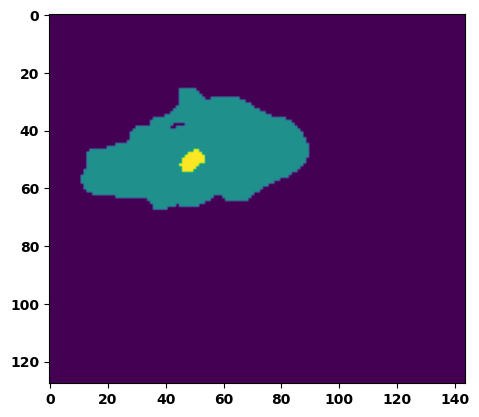

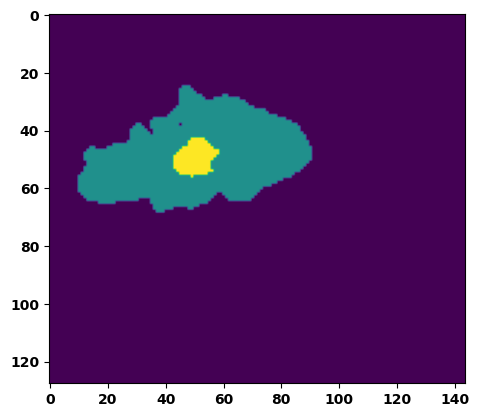

  6%|▌         | 2/36 [00:02<00:38,  1.15s/it]

Batch_id:  1 Eval loss:  0.6781914234161377
Batch_id:  1 Eval IoU:  tensor(0.2094, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7471, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.5125, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.6930, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8519, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.12s/it]

Batch_id:  2 Eval loss:  0.3216416835784912
Batch_id:  2 Eval IoU:  tensor(0.6068, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.10s/it]

Batch_id:  3 Eval loss:  0.7307537198066711
Batch_id:  3 Eval IoU:  tensor(0.2505, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.08s/it]

Batch_id:  4 Eval loss:  0.7006710171699524
Batch_id:  4 Eval IoU:  tensor(0.2367, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8539, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.7784, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7099, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.09s/it]

Batch_id:  5 Eval loss:  0.4573062062263489
Batch_id:  5 Eval IoU:  tensor(0.4415, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8305, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.6680, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.6664, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.06s/it]

Batch_id:  6 Eval loss:  0.6762934923171997
Batch_id:  6 Eval IoU:  tensor(0.2089, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6743, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4137, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.3949, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.09s/it]

Batch_id:  7 Eval loss:  0.7064594030380249
Batch_id:  7 Eval IoU:  tensor(0.2592, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9699, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.10s/it]

Batch_id:  8 Eval loss:  0.5779905319213867
Batch_id:  8 Eval IoU:  tensor(0.3762, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.06s/it]

Batch_id:  9 Eval loss:  0.7636222243309021
Batch_id:  9 Eval IoU:  tensor(0.2237, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8948, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  10 Eval loss:  0.7570734024047852
Batch_id:  10 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


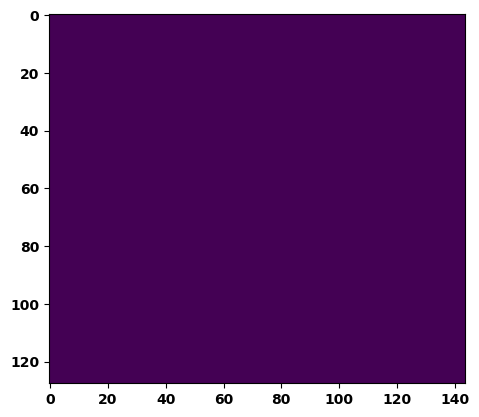

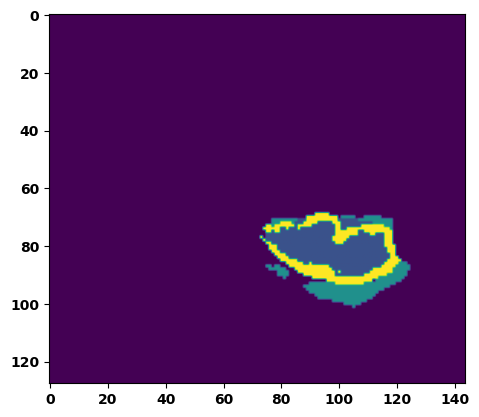

 33%|███▎      | 12/36 [00:13<00:27,  1.13s/it]

Batch_id:  11 Eval loss:  0.5122714042663574
Batch_id:  11 Eval IoU:  tensor(0.3928, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8950, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9707, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.12s/it]

Batch_id:  12 Eval loss:  0.7777484059333801
Batch_id:  12 Eval IoU:  tensor(0.1370, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6473, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3795, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.2967, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.7653207182884216
Batch_id:  13 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.7721075415611267
Batch_id:  14 Eval IoU:  tensor(0.1424, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6932, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4997, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8734, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.4565, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.05s/it]

Batch_id:  15 Eval loss:  0.3926522731781006
Batch_id:  15 Eval IoU:  tensor(0.5256, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9591, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.6820446252822876
Batch_id:  16 Eval IoU:  tensor(0.2178, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7454, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.6081, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.5467, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9249, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.05s/it]

Batch_id:  17 Eval loss:  0.7106175422668457
Batch_id:  17 Eval IoU:  tensor(0.2030, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6196, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3123, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2979, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.6408931612968445
Batch_id:  18 Eval IoU:  tensor(0.2856, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8906, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.7821, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8756, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.7691075205802917
Batch_id:  19 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Eval loss:  0.6231511235237122
Batch_id:  20 Eval IoU:  tensor(0.3030, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8669, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


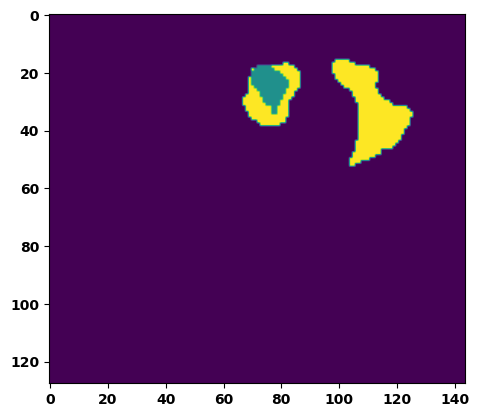

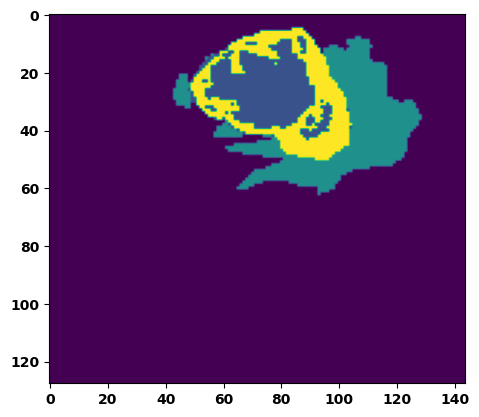

 61%|██████    | 22/36 [00:23<00:14,  1.07s/it]

Batch_id:  21 Eval loss:  0.7756670713424683
Batch_id:  21 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.7350970506668091
Batch_id:  22 Eval IoU:  tensor(0.2402, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9055, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9414, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.8031362891197205
Batch_id:  23 Eval IoU:  tensor(0.1302, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7125, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4807, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.4257, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7350447773933411
Batch_id:  24 Eval IoU:  tensor(0.2472, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9030, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8084, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9425, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.15390944480895996
Batch_id:  25 Eval IoU:  tensor(0.7490, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9824, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.7568415403366089
Batch_id:  26 Eval IoU:  tensor(0.2126, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8763, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8341, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8396, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.6258833408355713
Batch_id:  27 Eval IoU:  tensor(0.3068, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8992, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8917, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8526, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.04s/it]

Batch_id:  28 Eval loss:  0.7644392251968384
Batch_id:  28 Eval IoU:  tensor(0.2209, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8836, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.06s/it]

Batch_id:  29 Eval loss:  0.8271398544311523
Batch_id:  29 Eval IoU:  tensor(0.1299, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7544, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5279, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.6260, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  30 Eval loss:  0.7535370588302612
Batch_id:  30 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


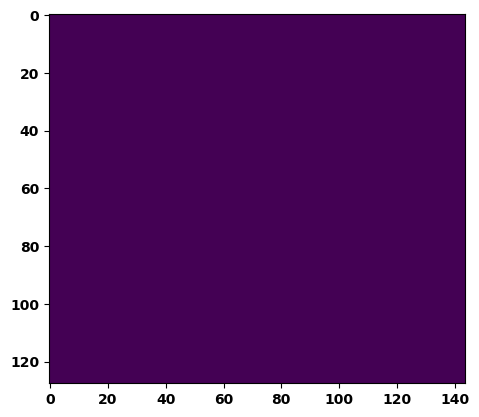

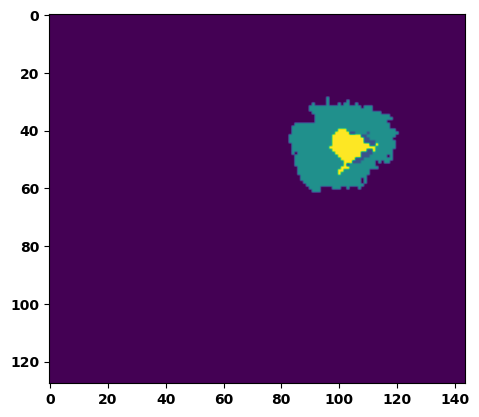

 89%|████████▉ | 32/36 [00:34<00:04,  1.08s/it]

Batch_id:  31 Eval loss:  0.7517467737197876
Batch_id:  31 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.07s/it]

Batch_id:  32 Eval loss:  0.763324499130249
Batch_id:  32 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.7659701704978943
Batch_id:  33 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.09s/it]

Batch_id:  34 Eval loss:  0.05505800247192383
Batch_id:  34 Eval IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.8844000101089478
Batch_id:  35 Eval IoU:  tensor(0.0732, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6192, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4126, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2386, device='cuda:0')
Epoch 00019: reducing learning rate of group 0 to 1.2500e-04.
Epoch  18 Training loss:  0.16252870654517954
Epoch  18 Evaluation loss:  0.648680771390597
Epoch  18 Training accuracy :  tensor(0.7657)
Epoch  18 Evaluation accuracy :  tensor(0.2992)
Epoch  18 Training Mean Dice Score:  tensor(0.9863)
Epoch  18 Eval Mean Dice Score:  tensor(0.8780)
Epoch  18 Training Non-tumor Dice Score:  tensor(0.9824)
Epoch  18 Eval Non-tumor Dice Score:  tensor(0.7896)
Epoch  18 Training NCR/NET Dice Score:  tensor(0.9911)
Epoch  18 Eval NCR/NET Dice Score:  

Epoch: 19
Training in session: 


  1%|          | 1/110 [00:01<02:04,  1.14s/it]

Batch_id:  0 Training loss:  0.05135369300842285
Batch_id:  0 Training IoU:  tensor(0.9110, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:57,  1.09s/it]

Batch_id:  1 Training loss:  0.15947657823562622
Batch_id:  1 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:05,  1.18s/it]

Batch_id:  2 Training loss:  0.0751519650220871
Batch_id:  2 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.05742281675338745
Batch_id:  3 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.12s/it]

Batch_id:  4 Training loss:  0.08977954089641571
Batch_id:  4 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.19551141560077667
Batch_id:  5 Training IoU:  tensor(0.7053, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:55,  1.12s/it]

Batch_id:  6 Training loss:  0.3488713800907135
Batch_id:  6 Training IoU:  tensor(0.6154, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9996, device='cuda:0')


  7%|▋         | 8/110 [00:09<02:04,  1.22s/it]

Batch_id:  7 Training loss:  0.09520900249481201
Batch_id:  7 Training IoU:  tensor(0.8487, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


  8%|▊         | 9/110 [00:10<02:01,  1.20s/it]

Batch_id:  8 Training loss:  0.09130379557609558
Batch_id:  8 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:57,  1.18s/it]

Batch_id:  9 Training loss:  0.07039789855480194
Batch_id:  9 Training IoU:  tensor(0.8822, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 10%|█         | 11/110 [00:12<01:52,  1.14s/it]

Batch_id:  10 Training loss:  0.33534035086631775
Batch_id:  10 Training IoU:  tensor(0.6105, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.12s/it]

Batch_id:  11 Training loss:  0.07592436671257019
Batch_id:  11 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:48,  1.12s/it]

Batch_id:  12 Training loss:  0.13167299330234528
Batch_id:  12 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.14678674936294556
Batch_id:  13 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.23911705613136292
Batch_id:  14 Training IoU:  tensor(0.7130, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.26019471883773804
Batch_id:  15 Training IoU:  tensor(0.6705, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:40,  1.08s/it]

Batch_id:  16 Training loss:  0.20736904442310333
Batch_id:  16 Training IoU:  tensor(0.6819, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9770, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:39,  1.08s/it]

Batch_id:  17 Training loss:  0.46624481678009033
Batch_id:  17 Training IoU:  tensor(0.4271, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:40,  1.10s/it]

Batch_id:  18 Training loss:  0.26541611552238464
Batch_id:  18 Training IoU:  tensor(0.6541, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:39,  1.10s/it]

Batch_id:  19 Training loss:  0.24859218299388885
Batch_id:  19 Training IoU:  tensor(0.7071, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.16975130140781403
Batch_id:  20 Training IoU:  tensor(0.7430, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 20%|██        | 22/110 [00:24<01:36,  1.09s/it]

Batch_id:  21 Training loss:  0.22131116688251495
Batch_id:  21 Training IoU:  tensor(0.6797, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 21%|██        | 23/110 [00:25<01:33,  1.07s/it]

Batch_id:  22 Training loss:  0.08568720519542694
Batch_id:  22 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.07s/it]

Batch_id:  23 Training loss:  0.06278857588768005
Batch_id:  23 Training IoU:  tensor(0.9152, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:31,  1.08s/it]

Batch_id:  24 Training loss:  0.06578697264194489
Batch_id:  24 Training IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.07s/it]

Batch_id:  25 Training loss:  0.27200597524642944
Batch_id:  25 Training IoU:  tensor(0.6082, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9693, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:29,  1.08s/it]

Batch_id:  26 Training loss:  0.27553385496139526
Batch_id:  26 Training IoU:  tensor(0.6620, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.18296906352043152
Batch_id:  27 Training IoU:  tensor(0.7796, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.05599655210971832
Batch_id:  28 Training IoU:  tensor(0.9089, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.1325903683900833
Batch_id:  29 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.08532065153121948
Batch_id:  30 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:25,  1.09s/it]

Batch_id:  31 Training loss:  0.1415228545665741
Batch_id:  31 Training IoU:  tensor(0.7960, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.08s/it]

Batch_id:  32 Training loss:  0.18043890595436096
Batch_id:  32 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 31%|███       | 34/110 [00:37<01:20,  1.06s/it]

Batch_id:  33 Training loss:  0.2361421287059784
Batch_id:  33 Training IoU:  tensor(0.6482, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.0667976438999176
Batch_id:  34 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:20,  1.08s/it]

Batch_id:  35 Training loss:  0.14134927093982697
Batch_id:  35 Training IoU:  tensor(0.7683, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.14684166014194489
Batch_id:  36 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:22,  1.14s/it]

Batch_id:  37 Training loss:  0.08596767485141754
Batch_id:  37 Training IoU:  tensor(0.8679, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.162566676735878
Batch_id:  38 Training IoU:  tensor(0.7361, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.13426655530929565
Batch_id:  39 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:13,  1.06s/it]

Batch_id:  40 Training loss:  0.12301869690418243
Batch_id:  40 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:12,  1.06s/it]

Batch_id:  41 Training loss:  0.22314848005771637
Batch_id:  41 Training IoU:  tensor(0.6904, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:12,  1.09s/it]

Batch_id:  42 Training loss:  0.10684002935886383
Batch_id:  42 Training IoU:  tensor(0.8346, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.11419115960597992
Batch_id:  43 Training IoU:  tensor(0.8236, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.16415449976921082
Batch_id:  44 Training IoU:  tensor(0.7444, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.22920756042003632
Batch_id:  45 Training IoU:  tensor(0.6738, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:07,  1.07s/it]

Batch_id:  46 Training loss:  0.15348976850509644
Batch_id:  46 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.1161838173866272
Batch_id:  47 Training IoU:  tensor(0.8156, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:05,  1.07s/it]

Batch_id:  48 Training loss:  0.165625661611557
Batch_id:  48 Training IoU:  tensor(0.7362, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.41211408376693726
Batch_id:  49 Training IoU:  tensor(0.4964, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.12382473051548004
Batch_id:  50 Training IoU:  tensor(0.7957, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:00,  1.05s/it]

Batch_id:  51 Training loss:  0.13485288619995117
Batch_id:  51 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:00,  1.06s/it]

Batch_id:  52 Training loss:  0.08357146382331848
Batch_id:  52 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.08391670882701874
Batch_id:  53 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.07s/it]

Batch_id:  54 Training loss:  0.15523120760917664
Batch_id:  54 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.12937618792057037
Batch_id:  55 Training IoU:  tensor(0.8018, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.10366365313529968
Batch_id:  56 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.09596496820449829
Batch_id:  57 Training IoU:  tensor(0.8356, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:53,  1.06s/it]

Batch_id:  58 Training loss:  0.14965739846229553
Batch_id:  58 Training IoU:  tensor(0.7765, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.37566033005714417
Batch_id:  59 Training IoU:  tensor(0.5652, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.06456175446510315
Batch_id:  60 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.16770584881305695
Batch_id:  61 Training IoU:  tensor(0.7435, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.1297026425600052
Batch_id:  62 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.2756751775741577
Batch_id:  63 Training IoU:  tensor(0.6473, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.07697804272174835
Batch_id:  64 Training IoU:  tensor(0.8674, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.15546584129333496
Batch_id:  65 Training IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9710, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:46,  1.07s/it]

Batch_id:  66 Training loss:  0.08608055114746094
Batch_id:  66 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:44,  1.07s/it]

Batch_id:  67 Training loss:  0.08188210427761078
Batch_id:  67 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:43,  1.07s/it]

Batch_id:  68 Training loss:  0.19626951217651367
Batch_id:  68 Training IoU:  tensor(0.7107, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.09335917234420776
Batch_id:  69 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.10563184320926666
Batch_id:  70 Training IoU:  tensor(0.8246, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.06s/it]

Batch_id:  71 Training loss:  0.07924282550811768
Batch_id:  71 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:39,  1.08s/it]

Batch_id:  72 Training loss:  0.08296039700508118
Batch_id:  72 Training IoU:  tensor(0.8585, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.09292441606521606
Batch_id:  73 Training IoU:  tensor(0.8447, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.09648314118385315
Batch_id:  74 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.15392468869686127
Batch_id:  75 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.2636592388153076
Batch_id:  76 Training IoU:  tensor(0.6538, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.14239521324634552
Batch_id:  77 Training IoU:  tensor(0.7781, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:32,  1.06s/it]

Batch_id:  78 Training loss:  0.19603709876537323
Batch_id:  78 Training IoU:  tensor(0.7506, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.08944322168827057
Batch_id:  79 Training IoU:  tensor(0.8449, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.13317182660102844
Batch_id:  80 Training IoU:  tensor(0.7805, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.10s/it]

Batch_id:  81 Training loss:  0.046667009592056274
Batch_id:  81 Training IoU:  tensor(0.9170, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.07339894771575928
Batch_id:  82 Training IoU:  tensor(0.8699, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.09s/it]

Batch_id:  83 Training loss:  0.3685794472694397
Batch_id:  83 Training IoU:  tensor(0.5728, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.0620550662279129
Batch_id:  84 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.14357051253318787
Batch_id:  85 Training IoU:  tensor(0.7652, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.10s/it]

Batch_id:  86 Training loss:  0.09894868731498718
Batch_id:  86 Training IoU:  tensor(0.8496, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.07s/it]

Batch_id:  87 Training loss:  0.06315846741199493
Batch_id:  87 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.13s/it]

Batch_id:  88 Training loss:  0.2356192022562027
Batch_id:  88 Training IoU:  tensor(0.7010, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.08543968200683594
Batch_id:  89 Training IoU:  tensor(0.8515, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.08s/it]

Batch_id:  90 Training loss:  0.06577330827713013
Batch_id:  90 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.06s/it]

Batch_id:  91 Training loss:  0.10517258942127228
Batch_id:  91 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.07s/it]

Batch_id:  92 Training loss:  0.23264433443546295
Batch_id:  92 Training IoU:  tensor(0.6669, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.07s/it]

Batch_id:  93 Training loss:  0.08573052287101746
Batch_id:  93 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.18686504662036896
Batch_id:  94 Training IoU:  tensor(0.7571, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:14,  1.07s/it]

Batch_id:  95 Training loss:  0.4533904790878296
Batch_id:  95 Training IoU:  tensor(0.4731, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.05775804817676544
Batch_id:  96 Training IoU:  tensor(0.9020, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.13s/it]

Batch_id:  97 Training loss:  0.11286258697509766
Batch_id:  97 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:12,  1.11s/it]

Batch_id:  98 Training loss:  0.5080157518386841
Batch_id:  98 Training IoU:  tensor(0.4244, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.13s/it]

Batch_id:  99 Training loss:  0.0940643846988678
Batch_id:  99 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.08289243280887604
Batch_id:  100 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:09,  1.13s/it]

Batch_id:  101 Training loss:  0.1528538167476654
Batch_id:  101 Training IoU:  tensor(0.7669, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.10s/it]

Batch_id:  102 Training loss:  0.15336823463439941
Batch_id:  102 Training IoU:  tensor(0.7518, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.2728612422943115
Batch_id:  103 Training IoU:  tensor(0.6140, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9742, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.252346932888031
Batch_id:  104 Training IoU:  tensor(0.6284, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.07s/it]

Batch_id:  105 Training loss:  0.2503663897514343
Batch_id:  105 Training IoU:  tensor(0.6405, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.06539686024188995
Batch_id:  106 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.13979509472846985
Batch_id:  107 Training IoU:  tensor(0.7746, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.13s/it]

Batch_id:  108 Training loss:  0.16359056532382965
Batch_id:  108 Training IoU:  tensor(0.7626, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.13661029934883118
Batch_id:  109 Training IoU:  tensor(0.7769, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9946, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6032049655914307
Batch_id:  0 Eval IoU:  tensor(0.2831, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7427, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.5091, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.5402, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


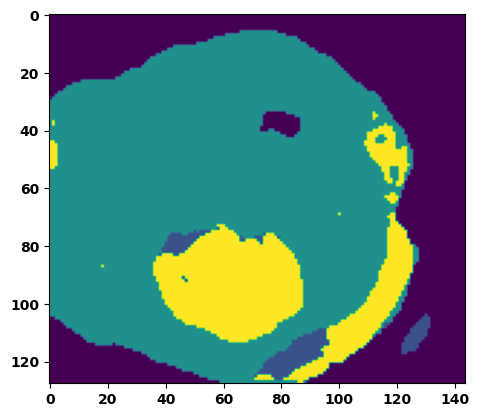

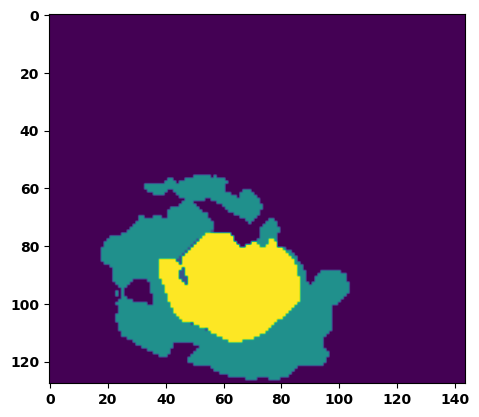

  6%|▌         | 2/36 [00:02<00:38,  1.14s/it]

Batch_id:  1 Eval loss:  0.7594366073608398
Batch_id:  1 Eval IoU:  tensor(0.2291, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.13s/it]

Batch_id:  2 Eval loss:  0.7314532399177551
Batch_id:  2 Eval IoU:  tensor(0.2359, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8926, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.8992, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.09s/it]

Batch_id:  3 Eval loss:  0.7562503218650818
Batch_id:  3 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.10s/it]

Batch_id:  4 Eval loss:  0.7046372890472412
Batch_id:  4 Eval IoU:  tensor(0.2642, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9051, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8180, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.07s/it]

Batch_id:  5 Eval loss:  0.7573933601379395
Batch_id:  5 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.7757019400596619
Batch_id:  6 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.6970556974411011
Batch_id:  7 Eval IoU:  tensor(0.2077, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6634, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3964, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3311, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.03s/it]

Batch_id:  8 Eval loss:  0.7633888721466064
Batch_id:  8 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.753510594367981
Batch_id:  9 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  10 Eval loss:  0.7636232376098633
Batch_id:  10 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


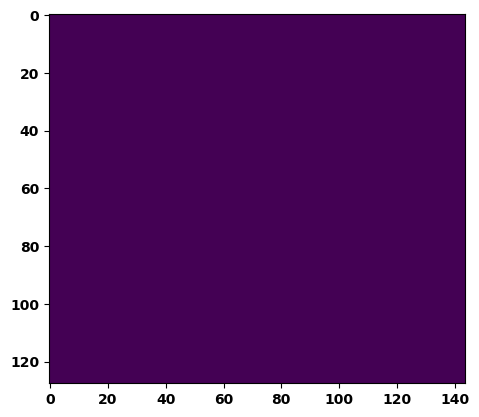

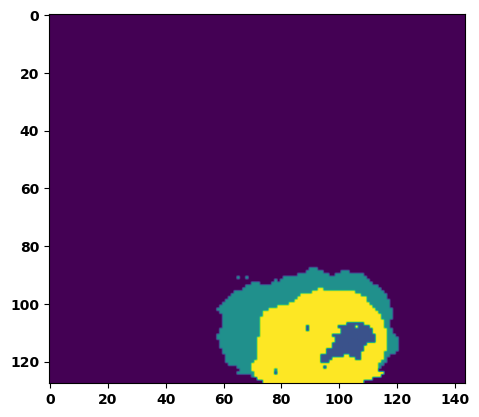

 33%|███▎      | 12/36 [00:12<00:24,  1.04s/it]

Batch_id:  11 Eval loss:  0.5223641991615295
Batch_id:  11 Eval IoU:  tensor(0.3746, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8400, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.8156, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.5070939064025879
Batch_id:  12 Eval IoU:  tensor(0.3843, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8837, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8110, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7912, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9732, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.08s/it]

Batch_id:  13 Eval loss:  0.24530258774757385
Batch_id:  13 Eval IoU:  tensor(0.6277, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9853, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.7718021869659424
Batch_id:  14 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.05s/it]

Batch_id:  15 Eval loss:  0.7798377871513367
Batch_id:  15 Eval IoU:  tensor(0.1944, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8789, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.7822, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:19,  1.05s/it]

Batch_id:  16 Eval loss:  0.7963216304779053
Batch_id:  16 Eval IoU:  tensor(0.1714, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.6900, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9016, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8338, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.06s/it]

Batch_id:  17 Eval loss:  0.4798676371574402
Batch_id:  17 Eval IoU:  tensor(0.4494, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9844, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.880936324596405
Batch_id:  18 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6238, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4218, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2476, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.03s/it]

Batch_id:  19 Eval loss:  0.7658387422561646
Batch_id:  19 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  20 Eval loss:  0.7517549991607666
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


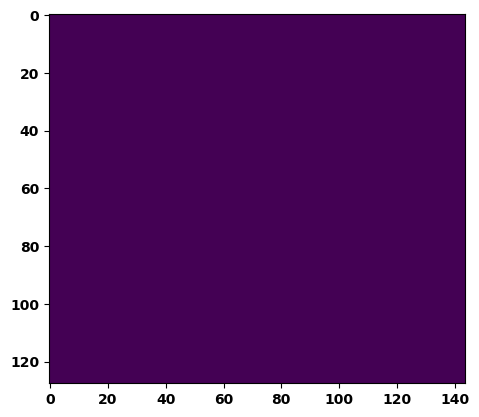

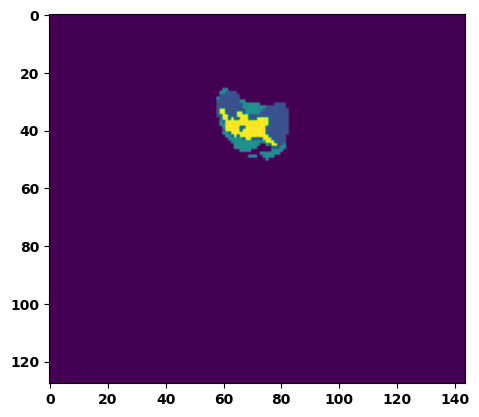

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.528816819190979
Batch_id:  21 Eval IoU:  tensor(0.3552, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6520, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3252, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.3525, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9524, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.7613148093223572
Batch_id:  22 Eval IoU:  tensor(0.2243, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8916, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9456, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.6846517324447632
Batch_id:  23 Eval IoU:  tensor(0.2705, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9047, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9147, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.09s/it]

Batch_id:  24 Eval loss:  0.24862733483314514
Batch_id:  24 Eval IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9689, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.7691057920455933
Batch_id:  25 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.5717066526412964
Batch_id:  26 Eval IoU:  tensor(0.3623, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.08s/it]

Batch_id:  27 Eval loss:  0.3308500051498413
Batch_id:  27 Eval IoU:  tensor(0.5533, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8369, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8313, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.07s/it]

Batch_id:  28 Eval loss:  0.7659786343574524
Batch_id:  28 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.7666000127792358
Batch_id:  29 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  30 Eval loss:  0.7637141942977905
Batch_id:  30 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


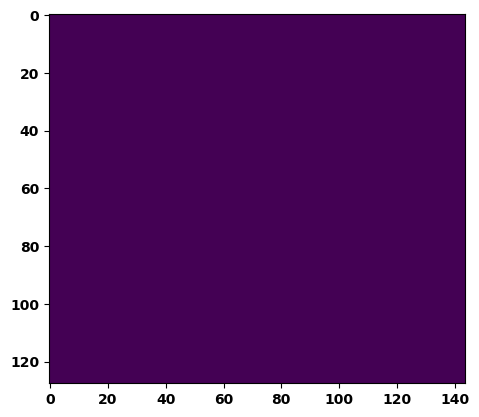

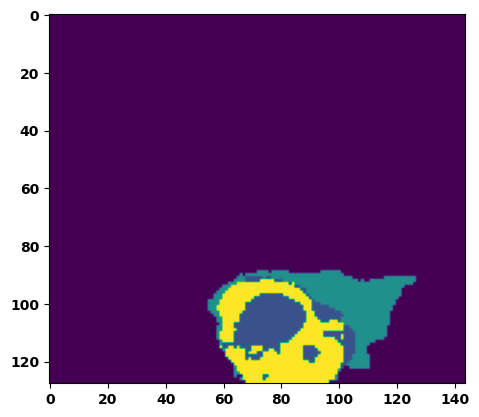

 89%|████████▉ | 32/36 [00:34<00:04,  1.09s/it]

Batch_id:  31 Eval loss:  0.43952611088752747
Batch_id:  31 Eval IoU:  tensor(0.4620, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9468, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.11s/it]

Batch_id:  32 Eval loss:  0.722233235836029
Batch_id:  32 Eval IoU:  tensor(0.2545, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.11s/it]

Batch_id:  33 Eval loss:  0.7570846676826477
Batch_id:  33 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.10s/it]

Batch_id:  34 Eval loss:  0.7794146537780762
Batch_id:  34 Eval IoU:  tensor(0.1884, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8682, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.7394, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8966, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.7653362154960632
Batch_id:  35 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')
Epoch  19 Training loss:  0.15703468485312028
Epoch  19 Evaluation loss:  0.6728260277046098
Epoch  19 Training accuracy :  tensor(0.7728)
Epoch  19 Evaluation accuracy :  tensor(0.2824)
Epoch  19 Training Mean Dice Score:  tensor(0.9872)
Epoch  19 Eval Mean Dice Score:  tensor(0.9070)
Epoch  19 Training Non-tumor Dice Score:  tensor(0.9837)
Epoch  19 Eval Non-tumor Dice Score:  tensor(0.8368)
Epoch  19 Training NCR/NET Dice Score:  tensor(0.9919)
Epoch  19 Eval NCR/NET Dice Score:  tensor(0.9691)
Epoch  19 Training ED Dice Score:  tensor(0.98

Epoch: 20
Training in session: 


  1%|          | 1/110 [00:01<02:03,  1.13s/it]

Batch_id:  0 Training loss:  0.12878842651844025
Batch_id:  0 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:01,  1.13s/it]

Batch_id:  1 Training loss:  0.190174862742424
Batch_id:  1 Training IoU:  tensor(0.6992, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:02,  1.15s/it]

Batch_id:  2 Training loss:  0.23185434937477112
Batch_id:  2 Training IoU:  tensor(0.7153, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.0809745043516159
Batch_id:  3 Training IoU:  tensor(0.8795, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:55,  1.10s/it]

Batch_id:  4 Training loss:  0.15081597864627838
Batch_id:  4 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.1533016860485077
Batch_id:  5 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:57,  1.14s/it]

Batch_id:  6 Training loss:  0.13867007195949554
Batch_id:  6 Training IoU:  tensor(0.7898, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:57,  1.15s/it]

Batch_id:  7 Training loss:  0.09740595519542694
Batch_id:  7 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:56,  1.15s/it]

Batch_id:  8 Training loss:  0.263418972492218
Batch_id:  8 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  9%|▉         | 10/110 [00:11<02:02,  1.22s/it]

Batch_id:  9 Training loss:  0.25173360109329224
Batch_id:  9 Training IoU:  tensor(0.6645, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 10%|█         | 11/110 [00:12<01:54,  1.16s/it]

Batch_id:  10 Training loss:  0.21176043152809143
Batch_id:  10 Training IoU:  tensor(0.6811, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 11%|█         | 12/110 [00:13<01:55,  1.18s/it]

Batch_id:  11 Training loss:  0.13035012781620026
Batch_id:  11 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:51,  1.15s/it]

Batch_id:  12 Training loss:  0.15299971401691437
Batch_id:  12 Training IoU:  tensor(0.7587, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 13%|█▎        | 14/110 [00:16<01:49,  1.14s/it]

Batch_id:  13 Training loss:  0.27985432744026184
Batch_id:  13 Training IoU:  tensor(0.6411, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:43,  1.09s/it]

Batch_id:  14 Training loss:  0.19262348115444183
Batch_id:  14 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:41,  1.08s/it]

Batch_id:  15 Training loss:  0.12754251062870026
Batch_id:  15 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:38,  1.06s/it]

Batch_id:  16 Training loss:  0.14549843966960907
Batch_id:  16 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:40,  1.10s/it]

Batch_id:  17 Training loss:  0.1951545625925064
Batch_id:  17 Training IoU:  tensor(0.6967, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:40,  1.10s/it]

Batch_id:  18 Training loss:  0.5060709118843079
Batch_id:  18 Training IoU:  tensor(0.4261, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:36,  1.08s/it]

Batch_id:  19 Training loss:  0.062162771821022034
Batch_id:  19 Training IoU:  tensor(0.8927, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:35,  1.08s/it]

Batch_id:  20 Training loss:  0.1726994663476944
Batch_id:  20 Training IoU:  tensor(0.7719, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.08s/it]

Batch_id:  21 Training loss:  0.09029871225357056
Batch_id:  21 Training IoU:  tensor(0.8435, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 21%|██        | 23/110 [00:25<01:32,  1.06s/it]

Batch_id:  22 Training loss:  0.17049364745616913
Batch_id:  22 Training IoU:  tensor(0.7250, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:31,  1.07s/it]

Batch_id:  23 Training loss:  0.0700756162405014
Batch_id:  23 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:31,  1.08s/it]

Batch_id:  24 Training loss:  0.086038738489151
Batch_id:  24 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.07s/it]

Batch_id:  25 Training loss:  0.21825222671031952
Batch_id:  25 Training IoU:  tensor(0.6989, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.06s/it]

Batch_id:  26 Training loss:  0.10342621803283691
Batch_id:  26 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:25,  1.05s/it]

Batch_id:  27 Training loss:  0.1596522033214569
Batch_id:  27 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:24,  1.04s/it]

Batch_id:  28 Training loss:  0.08444033563137054
Batch_id:  28 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:21,  1.02s/it]

Batch_id:  29 Training loss:  0.14217811822891235
Batch_id:  29 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:21,  1.03s/it]

Batch_id:  30 Training loss:  0.3387545645236969
Batch_id:  30 Training IoU:  tensor(0.6043, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:22,  1.06s/it]

Batch_id:  31 Training loss:  0.05365954339504242
Batch_id:  31 Training IoU:  tensor(0.9073, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.06526413559913635
Batch_id:  32 Training IoU:  tensor(0.9123, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.1491461992263794
Batch_id:  33 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.09138302505016327
Batch_id:  34 Training IoU:  tensor(0.8446, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.1007155328989029
Batch_id:  35 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.07915067672729492
Batch_id:  36 Training IoU:  tensor(0.8704, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.06076610088348389
Batch_id:  37 Training IoU:  tensor(0.8977, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.05796167254447937
Batch_id:  38 Training IoU:  tensor(0.9050, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.17690177261829376
Batch_id:  39 Training IoU:  tensor(0.7317, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:15,  1.10s/it]

Batch_id:  40 Training loss:  0.0856068879365921
Batch_id:  40 Training IoU:  tensor(0.8536, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.16206632554531097
Batch_id:  41 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.08747081458568573
Batch_id:  42 Training IoU:  tensor(0.8541, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 40%|████      | 44/110 [00:47<01:10,  1.07s/it]

Batch_id:  43 Training loss:  0.4426721930503845
Batch_id:  43 Training IoU:  tensor(0.4817, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.06s/it]

Batch_id:  44 Training loss:  0.15557774901390076
Batch_id:  44 Training IoU:  tensor(0.7507, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:07,  1.06s/it]

Batch_id:  45 Training loss:  0.07445883750915527
Batch_id:  45 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:06,  1.05s/it]

Batch_id:  46 Training loss:  0.13930675387382507
Batch_id:  46 Training IoU:  tensor(0.7740, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:04,  1.05s/it]

Batch_id:  47 Training loss:  0.11792108416557312
Batch_id:  47 Training IoU:  tensor(0.8162, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:03,  1.05s/it]

Batch_id:  48 Training loss:  0.08132611215114594
Batch_id:  48 Training IoU:  tensor(0.8578, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.2543157935142517
Batch_id:  49 Training IoU:  tensor(0.6704, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.06387412548065186
Batch_id:  50 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.09253722429275513
Batch_id:  51 Training IoU:  tensor(0.8418, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.07338251173496246
Batch_id:  52 Training IoU:  tensor(0.8810, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.23171471059322357
Batch_id:  53 Training IoU:  tensor(0.7124, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.15899240970611572
Batch_id:  54 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 51%|█████     | 56/110 [01:01<01:00,  1.11s/it]

Batch_id:  55 Training loss:  0.046986162662506104
Batch_id:  55 Training IoU:  tensor(0.9163, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<01:00,  1.14s/it]

Batch_id:  56 Training loss:  0.3612137734889984
Batch_id:  56 Training IoU:  tensor(0.5855, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:58,  1.12s/it]

Batch_id:  57 Training loss:  0.14008192718029022
Batch_id:  57 Training IoU:  tensor(0.7693, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:56,  1.11s/it]

Batch_id:  58 Training loss:  0.07959598302841187
Batch_id:  58 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.12240588665008545
Batch_id:  59 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.08s/it]

Batch_id:  60 Training loss:  0.261114239692688
Batch_id:  60 Training IoU:  tensor(0.6214, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.24262838065624237
Batch_id:  61 Training IoU:  tensor(0.6847, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:49,  1.06s/it]

Batch_id:  62 Training loss:  0.061545029282569885
Batch_id:  62 Training IoU:  tensor(0.8923, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:48,  1.05s/it]

Batch_id:  63 Training loss:  0.1350606232881546
Batch_id:  63 Training IoU:  tensor(0.7806, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:47,  1.05s/it]

Batch_id:  64 Training loss:  0.2637549042701721
Batch_id:  64 Training IoU:  tensor(0.6162, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.05s/it]

Batch_id:  65 Training loss:  0.0774514228105545
Batch_id:  65 Training IoU:  tensor(0.8680, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:45,  1.05s/it]

Batch_id:  66 Training loss:  0.1718958616256714
Batch_id:  66 Training IoU:  tensor(0.7299, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.1576048731803894
Batch_id:  67 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.08s/it]

Batch_id:  68 Training loss:  0.08243341743946075
Batch_id:  68 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:44,  1.11s/it]

Batch_id:  69 Training loss:  0.06484811007976532
Batch_id:  69 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:44,  1.14s/it]

Batch_id:  70 Training loss:  0.3403797149658203
Batch_id:  70 Training IoU:  tensor(0.6274, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:43,  1.15s/it]

Batch_id:  71 Training loss:  0.07210132479667664
Batch_id:  71 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:42,  1.15s/it]

Batch_id:  72 Training loss:  0.08784911036491394
Batch_id:  72 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:40,  1.12s/it]

Batch_id:  73 Training loss:  0.1255597174167633
Batch_id:  73 Training IoU:  tensor(0.7908, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:39,  1.12s/it]

Batch_id:  74 Training loss:  0.18477389216423035
Batch_id:  74 Training IoU:  tensor(0.7172, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:38,  1.13s/it]

Batch_id:  75 Training loss:  0.05471804738044739
Batch_id:  75 Training IoU:  tensor(0.9049, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:37,  1.13s/it]

Batch_id:  76 Training loss:  0.24529732763767242
Batch_id:  76 Training IoU:  tensor(0.6568, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:36,  1.13s/it]

Batch_id:  77 Training loss:  0.1460026055574417
Batch_id:  77 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:34,  1.11s/it]

Batch_id:  78 Training loss:  0.10049784183502197
Batch_id:  78 Training IoU:  tensor(0.8254, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:33,  1.11s/it]

Batch_id:  79 Training loss:  0.08937728404998779
Batch_id:  79 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.144558846950531
Batch_id:  80 Training IoU:  tensor(0.7898, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.22110995650291443
Batch_id:  81 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.12500187754631042
Batch_id:  82 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.10s/it]

Batch_id:  83 Training loss:  0.09972372651100159
Batch_id:  83 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.23606173694133759
Batch_id:  84 Training IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.12s/it]

Batch_id:  85 Training loss:  0.08632168173789978
Batch_id:  85 Training IoU:  tensor(0.8521, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.13s/it]

Batch_id:  86 Training loss:  0.17215532064437866
Batch_id:  86 Training IoU:  tensor(0.7287, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.13s/it]

Batch_id:  87 Training loss:  0.12044428288936615
Batch_id:  87 Training IoU:  tensor(0.8151, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.11s/it]

Batch_id:  88 Training loss:  0.1061907410621643
Batch_id:  88 Training IoU:  tensor(0.8325, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.10s/it]

Batch_id:  89 Training loss:  0.3973749577999115
Batch_id:  89 Training IoU:  tensor(0.5172, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.10813099145889282
Batch_id:  90 Training IoU:  tensor(0.8320, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.13s/it]

Batch_id:  91 Training loss:  0.09351050853729248
Batch_id:  91 Training IoU:  tensor(0.8431, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.22747544944286346
Batch_id:  92 Training IoU:  tensor(0.6575, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:18,  1.13s/it]

Batch_id:  93 Training loss:  0.16482457518577576
Batch_id:  93 Training IoU:  tensor(0.7474, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:17,  1.15s/it]

Batch_id:  94 Training loss:  0.3976057171821594
Batch_id:  94 Training IoU:  tensor(0.4924, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:16,  1.15s/it]

Batch_id:  95 Training loss:  0.15985122323036194
Batch_id:  95 Training IoU:  tensor(0.7506, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:15,  1.16s/it]

Batch_id:  96 Training loss:  0.10066932439804077
Batch_id:  96 Training IoU:  tensor(0.8291, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.14s/it]

Batch_id:  97 Training loss:  0.18573439121246338
Batch_id:  97 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.14s/it]

Batch_id:  98 Training loss:  0.14570145308971405
Batch_id:  98 Training IoU:  tensor(0.7911, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.13s/it]

Batch_id:  99 Training loss:  0.13897718489170074
Batch_id:  99 Training IoU:  tensor(0.7734, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:10,  1.13s/it]

Batch_id:  100 Training loss:  0.0908682644367218
Batch_id:  100 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:09,  1.13s/it]

Batch_id:  101 Training loss:  0.055230408906936646
Batch_id:  101 Training IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.13080233335494995
Batch_id:  102 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.12s/it]

Batch_id:  103 Training loss:  0.11226202547550201
Batch_id:  103 Training IoU:  tensor(0.8204, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.12s/it]

Batch_id:  104 Training loss:  0.16811811923980713
Batch_id:  104 Training IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.12s/it]

Batch_id:  105 Training loss:  0.1343647837638855
Batch_id:  105 Training IoU:  tensor(0.8118, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.11s/it]

Batch_id:  106 Training loss:  0.06220918893814087
Batch_id:  106 Training IoU:  tensor(0.8937, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.10s/it]

Batch_id:  107 Training loss:  0.0978655219078064
Batch_id:  107 Training IoU:  tensor(0.8403, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.11s/it]

Batch_id:  108 Training loss:  0.08067965507507324
Batch_id:  108 Training IoU:  tensor(0.8619, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.3675850033760071
Batch_id:  109 Training IoU:  tensor(0.5771, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9979, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7633604407310486
Batch_id:  0 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


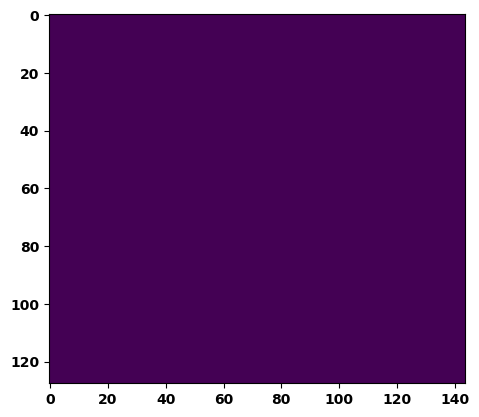

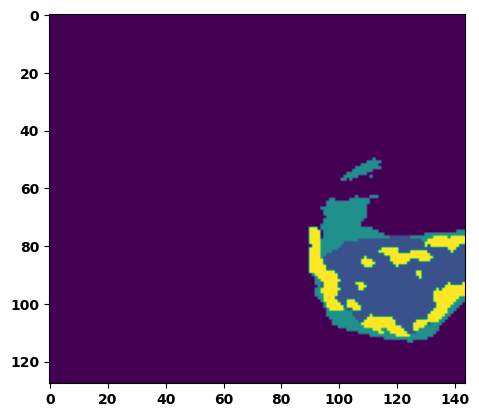

  6%|▌         | 2/36 [00:02<00:35,  1.04s/it]

Batch_id:  1 Eval loss:  0.7757101655006409
Batch_id:  1 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.04s/it]

Batch_id:  2 Eval loss:  0.7517638802528381
Batch_id:  2 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.06s/it]

Batch_id:  3 Eval loss:  0.41448432207107544
Batch_id:  3 Eval IoU:  tensor(0.4946, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9787, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.633973240852356
Batch_id:  4 Eval IoU:  tensor(0.2564, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.7770, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.6436, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8960, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.6388, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9298, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.1443946808576584
Batch_id:  5 Eval IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.07s/it]

Batch_id:  6 Eval loss:  0.6946536898612976
Batch_id:  6 Eval IoU:  tensor(0.2666, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9044, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9064, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8134, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9481, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.7653648257255554
Batch_id:  7 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.04s/it]

Batch_id:  8 Eval loss:  0.6261070370674133
Batch_id:  8 Eval IoU:  tensor(0.3048, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9099, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9757, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.7170514464378357
Batch_id:  9 Eval IoU:  tensor(0.2584, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  10 Eval loss:  0.6768642067909241
Batch_id:  10 Eval IoU:  tensor(0.2742, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9106, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9476, device='cuda:0')


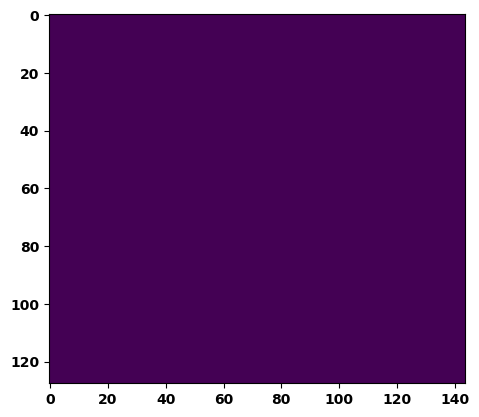

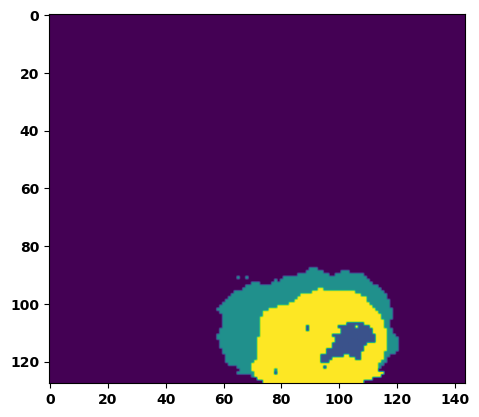

 33%|███▎      | 12/36 [00:12<00:25,  1.07s/it]

Batch_id:  11 Eval loss:  0.7571141123771667
Batch_id:  11 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.3082670569419861
Batch_id:  12 Eval IoU:  tensor(0.6087, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.8018893003463745
Batch_id:  13 Eval IoU:  tensor(0.1550, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7986, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.5982, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.7189, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.20171073079109192
Batch_id:  14 Eval IoU:  tensor(0.6867, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9680, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.11s/it]

Batch_id:  15 Eval loss:  0.29339778423309326
Batch_id:  15 Eval IoU:  tensor(0.6459, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.7691253423690796
Batch_id:  16 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.07s/it]

Batch_id:  17 Eval loss:  0.5485243797302246
Batch_id:  17 Eval IoU:  tensor(0.3732, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8749, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.7185477018356323
Batch_id:  18 Eval IoU:  tensor(0.2517, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9697, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.05s/it]

Batch_id:  19 Eval loss:  0.805850625038147
Batch_id:  19 Eval IoU:  tensor(0.1279, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7093, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4742, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.4186, device='cuda:0')
Batch_id:  20 Eval loss:  0.4333898723125458
Batch_id:  20 Eval IoU:  tensor(0.4420, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9000, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9626, device='cuda:0')


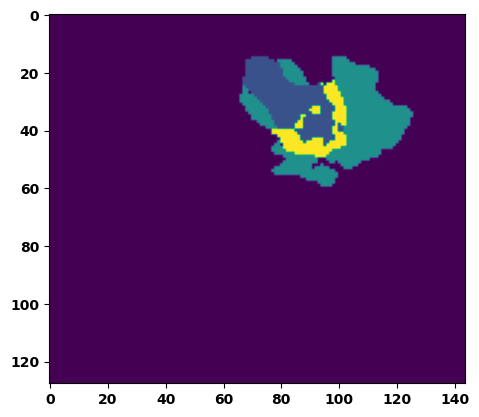

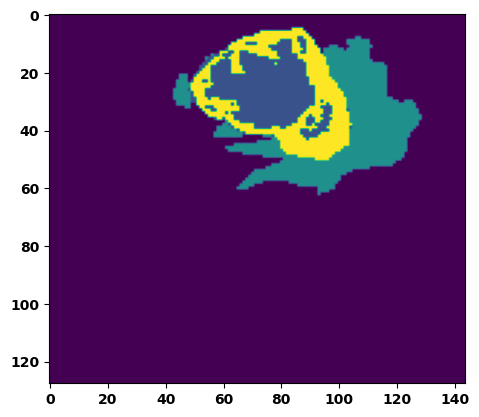

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.881375789642334
Batch_id:  21 Eval IoU:  tensor(0.0756, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6232, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4206, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.2463, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.658247172832489
Batch_id:  22 Eval IoU:  tensor(0.2691, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8832, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8176, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.7879, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9440, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.06s/it]

Batch_id:  23 Eval loss:  0.803465723991394
Batch_id:  23 Eval IoU:  tensor(0.1622, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8226, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.6505, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.7746, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7535300254821777
Batch_id:  24 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.42914247512817383
Batch_id:  25 Eval IoU:  tensor(0.4858, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8604, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7250, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.7342, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.07s/it]

Batch_id:  26 Eval loss:  0.5328764915466309
Batch_id:  26 Eval IoU:  tensor(0.3681, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8639, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9524, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.8481744527816772
Batch_id:  27 Eval IoU:  tensor(0.0928, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6456, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3819, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2957, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.11s/it]

Batch_id:  28 Eval loss:  0.769437313079834
Batch_id:  28 Eval IoU:  tensor(0.2055, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8257, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8653, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.10s/it]

Batch_id:  29 Eval loss:  0.777981162071228
Batch_id:  29 Eval IoU:  tensor(0.1389, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6070, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3117, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2215, device='cuda:0')
Batch_id:  30 Eval loss:  0.05545637011528015
Batch_id:  30 Eval IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


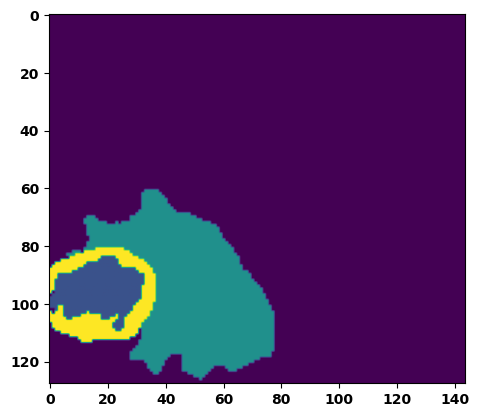

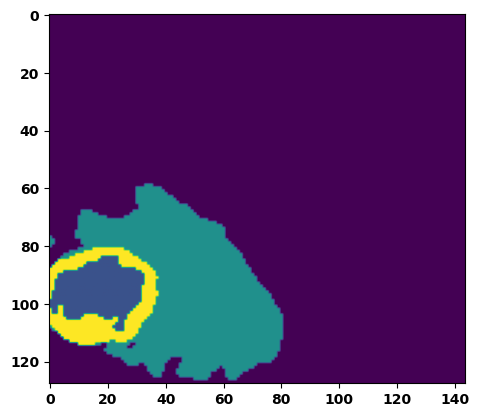

 89%|████████▉ | 32/36 [00:34<00:04,  1.12s/it]

Batch_id:  31 Eval loss:  0.7151885032653809
Batch_id:  31 Eval IoU:  tensor(0.1874, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7287, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5149, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8720, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8386, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.6894, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.7637417316436768
Batch_id:  32 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.09s/it]

Batch_id:  33 Eval loss:  0.8145077228546143
Batch_id:  33 Eval IoU:  tensor(0.1216, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6891, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.5019, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8766, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.3988, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.09s/it]

Batch_id:  34 Eval loss:  0.7951502203941345
Batch_id:  34 Eval IoU:  tensor(0.1253, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6646, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4261, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9163, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.3742, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.7660102844238281
Batch_id:  35 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Epoch  20 Training loss:  0.15300204035910694
Epoch  20 Evaluation loss:  0.6379397300382456
Epoch  20 Training accuracy :  tensor(0.7771)
Epoch  20 Evaluation accuracy :  tensor(0.3083)
Epoch  20 Training Mean Dice Score:  tensor(0.9874)
Epoch  20 Eval Mean Dice Score:  tensor(0.8792)
Epoch  20 Training Non-tumor Dice Score:  tensor(0.9838)
Epoch  20 Eval Non-tumor Dice Score:  tensor(0.7946)
Epoch  20 Training NCR/NET Dice Score:  tensor(0.9921)
Epoch  20 Eval NCR/NET Dice Score:  tensor(0.9645)
Epoch  20 Training ED Dice Score:  tensor(0.98

Epoch: 21
Training in session: 


  1%|          | 1/110 [00:01<02:27,  1.36s/it]

Batch_id:  0 Training loss:  0.0853508710861206
Batch_id:  0 Training IoU:  tensor(0.8521, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:08,  1.19s/it]

Batch_id:  1 Training loss:  0.1520119309425354
Batch_id:  1 Training IoU:  tensor(0.7554, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.35874491930007935
Batch_id:  2 Training IoU:  tensor(0.5903, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.06611108779907227
Batch_id:  3 Training IoU:  tensor(0.8862, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.14898115396499634
Batch_id:  4 Training IoU:  tensor(0.7712, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.15149067342281342
Batch_id:  5 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.11s/it]

Batch_id:  6 Training loss:  0.37977534532546997
Batch_id:  6 Training IoU:  tensor(0.5304, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:53,  1.11s/it]

Batch_id:  7 Training loss:  0.09561628103256226
Batch_id:  7 Training IoU:  tensor(0.8397, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:53,  1.12s/it]

Batch_id:  8 Training loss:  0.22586150467395782
Batch_id:  8 Training IoU:  tensor(0.6592, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:52,  1.12s/it]

Batch_id:  9 Training loss:  0.3585829734802246
Batch_id:  9 Training IoU:  tensor(0.5883, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.12s/it]

Batch_id:  10 Training loss:  0.08983080089092255
Batch_id:  10 Training IoU:  tensor(0.8458, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.12769371271133423
Batch_id:  11 Training IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.11s/it]

Batch_id:  12 Training loss:  0.09999546408653259
Batch_id:  12 Training IoU:  tensor(0.8411, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.09s/it]

Batch_id:  13 Training loss:  0.18352502584457397
Batch_id:  13 Training IoU:  tensor(0.7232, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:42,  1.08s/it]

Batch_id:  14 Training loss:  0.1391662061214447
Batch_id:  14 Training IoU:  tensor(0.7727, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:41,  1.08s/it]

Batch_id:  15 Training loss:  0.10736183822154999
Batch_id:  15 Training IoU:  tensor(0.8305, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:42,  1.10s/it]

Batch_id:  16 Training loss:  0.1957031935453415
Batch_id:  16 Training IoU:  tensor(0.7484, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:40,  1.09s/it]

Batch_id:  17 Training loss:  0.056575432419776917
Batch_id:  17 Training IoU:  tensor(0.9285, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:38,  1.09s/it]

Batch_id:  18 Training loss:  0.22295109927654266
Batch_id:  18 Training IoU:  tensor(0.6608, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.05592598021030426
Batch_id:  19 Training IoU:  tensor(0.9055, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:37,  1.09s/it]

Batch_id:  20 Training loss:  0.12858811020851135
Batch_id:  20 Training IoU:  tensor(0.7958, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 20%|██        | 22/110 [00:24<01:37,  1.11s/it]

Batch_id:  21 Training loss:  0.1865345984697342
Batch_id:  21 Training IoU:  tensor(0.7174, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 21%|██        | 23/110 [00:25<01:34,  1.09s/it]

Batch_id:  22 Training loss:  0.08573491871356964
Batch_id:  22 Training IoU:  tensor(0.8514, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:33,  1.09s/it]

Batch_id:  23 Training loss:  0.15450096130371094
Batch_id:  23 Training IoU:  tensor(0.7553, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.08s/it]

Batch_id:  24 Training loss:  0.12948112189769745
Batch_id:  24 Training IoU:  tensor(0.7878, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.07922013103961945
Batch_id:  25 Training IoU:  tensor(0.8725, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.07s/it]

Batch_id:  26 Training loss:  0.22845785319805145
Batch_id:  26 Training IoU:  tensor(0.6631, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.07s/it]

Batch_id:  27 Training loss:  0.08600465953350067
Batch_id:  27 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.5036201477050781
Batch_id:  28 Training IoU:  tensor(0.4247, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.14586623013019562
Batch_id:  29 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:23,  1.06s/it]

Batch_id:  30 Training loss:  0.15821050107479095
Batch_id:  30 Training IoU:  tensor(0.7459, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.06572243571281433
Batch_id:  31 Training IoU:  tensor(0.8943, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 30%|███       | 33/110 [00:36<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.15620306134223938
Batch_id:  32 Training IoU:  tensor(0.7782, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.0900862067937851
Batch_id:  33 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:24,  1.12s/it]

Batch_id:  34 Training loss:  0.07775542140007019
Batch_id:  34 Training IoU:  tensor(0.8683, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:22,  1.12s/it]

Batch_id:  35 Training loss:  0.14978493750095367
Batch_id:  35 Training IoU:  tensor(0.7775, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:21,  1.12s/it]

Batch_id:  36 Training loss:  0.13468970358371735
Batch_id:  36 Training IoU:  tensor(0.7766, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.11s/it]

Batch_id:  37 Training loss:  0.20594915747642517
Batch_id:  37 Training IoU:  tensor(0.6868, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.060838326811790466
Batch_id:  38 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.05023376643657684
Batch_id:  39 Training IoU:  tensor(0.9137, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.14251135289669037
Batch_id:  40 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.06675639748573303
Batch_id:  41 Training IoU:  tensor(0.8824, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.0860300213098526
Batch_id:  42 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 40%|████      | 44/110 [00:48<01:14,  1.12s/it]

Batch_id:  43 Training loss:  0.09339362382888794
Batch_id:  43 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 41%|████      | 45/110 [00:49<01:13,  1.13s/it]

Batch_id:  44 Training loss:  0.26611047983169556
Batch_id:  44 Training IoU:  tensor(0.6124, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:11,  1.11s/it]

Batch_id:  45 Training loss:  0.12059648334980011
Batch_id:  45 Training IoU:  tensor(0.8148, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.176600843667984
Batch_id:  46 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.07948818802833557
Batch_id:  47 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.2004736065864563
Batch_id:  48 Training IoU:  tensor(0.7000, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.4017931818962097
Batch_id:  49 Training IoU:  tensor(0.4898, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:08,  1.17s/it]

Batch_id:  50 Training loss:  0.042869552969932556
Batch_id:  50 Training IoU:  tensor(0.9244, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:04,  1.12s/it]

Batch_id:  51 Training loss:  0.08670476078987122
Batch_id:  51 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:03,  1.12s/it]

Batch_id:  52 Training loss:  0.11596168577671051
Batch_id:  52 Training IoU:  tensor(0.8166, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.16418634355068207
Batch_id:  53 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.1356036514043808
Batch_id:  54 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:59,  1.11s/it]

Batch_id:  55 Training loss:  0.0866784155368805
Batch_id:  55 Training IoU:  tensor(0.8666, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:58,  1.10s/it]

Batch_id:  56 Training loss:  0.09008069336414337
Batch_id:  56 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.08s/it]

Batch_id:  57 Training loss:  0.09193269908428192
Batch_id:  57 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.16408318281173706
Batch_id:  58 Training IoU:  tensor(0.7491, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.06s/it]

Batch_id:  59 Training loss:  0.11682341992855072
Batch_id:  59 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.1463610976934433
Batch_id:  60 Training IoU:  tensor(0.7746, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:53,  1.11s/it]

Batch_id:  61 Training loss:  0.1286688894033432
Batch_id:  61 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:53,  1.13s/it]

Batch_id:  62 Training loss:  0.06612333655357361
Batch_id:  62 Training IoU:  tensor(0.8877, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:51,  1.12s/it]

Batch_id:  63 Training loss:  0.28572878241539
Batch_id:  63 Training IoU:  tensor(0.6237, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:50,  1.11s/it]

Batch_id:  64 Training loss:  0.08684435486793518
Batch_id:  64 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:49,  1.12s/it]

Batch_id:  65 Training loss:  0.13874448835849762
Batch_id:  65 Training IoU:  tensor(0.7697, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.36697840690612793
Batch_id:  66 Training IoU:  tensor(0.5801, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.07336954772472382
Batch_id:  67 Training IoU:  tensor(0.8775, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.11s/it]

Batch_id:  68 Training loss:  0.18944528698921204
Batch_id:  68 Training IoU:  tensor(0.7663, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:44,  1.10s/it]

Batch_id:  69 Training loss:  0.25620535016059875
Batch_id:  69 Training IoU:  tensor(0.6690, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.08256100118160248
Batch_id:  70 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.08306537568569183
Batch_id:  71 Training IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:41,  1.13s/it]

Batch_id:  72 Training loss:  0.07723703980445862
Batch_id:  72 Training IoU:  tensor(0.8715, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:40,  1.12s/it]

Batch_id:  73 Training loss:  0.26002389192581177
Batch_id:  73 Training IoU:  tensor(0.6789, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:39,  1.14s/it]

Batch_id:  74 Training loss:  0.1251242756843567
Batch_id:  74 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:38,  1.14s/it]

Batch_id:  75 Training loss:  0.22050096094608307
Batch_id:  75 Training IoU:  tensor(0.6829, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:36,  1.12s/it]

Batch_id:  76 Training loss:  0.41564565896987915
Batch_id:  76 Training IoU:  tensor(0.5050, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:36,  1.15s/it]

Batch_id:  77 Training loss:  0.05529846251010895
Batch_id:  77 Training IoU:  tensor(0.9050, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:35,  1.14s/it]

Batch_id:  78 Training loss:  0.059546664357185364
Batch_id:  78 Training IoU:  tensor(0.8988, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:34,  1.15s/it]

Batch_id:  79 Training loss:  0.06395481526851654
Batch_id:  79 Training IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.3348660469055176
Batch_id:  80 Training IoU:  tensor(0.6109, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.07798507809638977
Batch_id:  81 Training IoU:  tensor(0.8689, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:29,  1.11s/it]

Batch_id:  82 Training loss:  0.11238569021224976
Batch_id:  82 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:29,  1.12s/it]

Batch_id:  83 Training loss:  0.05712726712226868
Batch_id:  83 Training IoU:  tensor(0.9000, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.12s/it]

Batch_id:  84 Training loss:  0.1614687740802765
Batch_id:  84 Training IoU:  tensor(0.7546, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.24249552190303802
Batch_id:  85 Training IoU:  tensor(0.7176, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.1650654524564743
Batch_id:  86 Training IoU:  tensor(0.7388, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9694, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.12373609840869904
Batch_id:  87 Training IoU:  tensor(0.7902, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:23,  1.12s/it]

Batch_id:  88 Training loss:  0.23267537355422974
Batch_id:  88 Training IoU:  tensor(0.7069, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.13s/it]

Batch_id:  89 Training loss:  0.1004023551940918
Batch_id:  89 Training IoU:  tensor(0.8269, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.0875633955001831
Batch_id:  90 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.26653265953063965
Batch_id:  91 Training IoU:  tensor(0.6605, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:19,  1.13s/it]

Batch_id:  92 Training loss:  0.1651494950056076
Batch_id:  92 Training IoU:  tensor(0.7310, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:18,  1.13s/it]

Batch_id:  93 Training loss:  0.1489189714193344
Batch_id:  93 Training IoU:  tensor(0.7852, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.12094958126544952
Batch_id:  94 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.23052632808685303
Batch_id:  95 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:13,  1.06s/it]

Batch_id:  96 Training loss:  0.08742848038673401
Batch_id:  96 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.1481512039899826
Batch_id:  97 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.2028520107269287
Batch_id:  98 Training IoU:  tensor(0.6859, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.06462565064430237
Batch_id:  99 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.11s/it]

Batch_id:  100 Training loss:  0.10318984091281891
Batch_id:  100 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.08136261999607086
Batch_id:  101 Training IoU:  tensor(0.8599, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.10s/it]

Batch_id:  102 Training loss:  0.22738337516784668
Batch_id:  102 Training IoU:  tensor(0.6911, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.2206563651561737
Batch_id:  103 Training IoU:  tensor(0.7167, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.09955878555774689
Batch_id:  104 Training IoU:  tensor(0.8337, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.20074914395809174
Batch_id:  105 Training IoU:  tensor(0.6941, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.14740720391273499
Batch_id:  106 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.11830504238605499
Batch_id:  107 Training IoU:  tensor(0.8126, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.08377490937709808
Batch_id:  108 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.16922779381275177
Batch_id:  109 Training IoU:  tensor(0.7273, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9809, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5507453083992004
Batch_id:  0 Eval IoU:  tensor(0.3593, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9532, device='cuda:0')


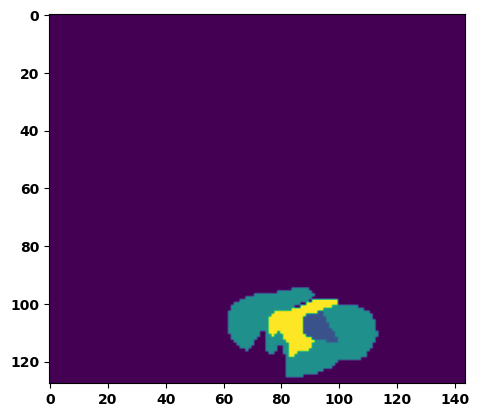

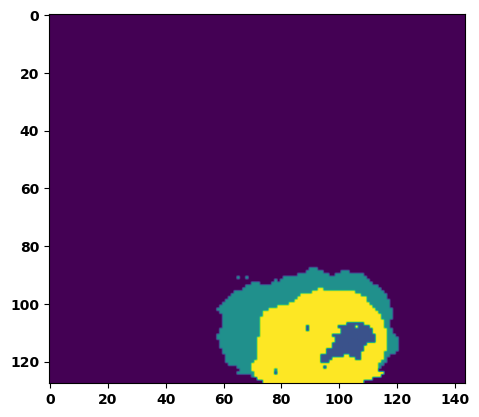

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7660173177719116
Batch_id:  1 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.3841506242752075
Batch_id:  2 Eval IoU:  tensor(0.5004, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9792, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.02s/it]

Batch_id:  3 Eval loss:  0.38923656940460205
Batch_id:  3 Eval IoU:  tensor(0.4887, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8892, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7989, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8211, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.02s/it]

Batch_id:  4 Eval loss:  0.7372530102729797
Batch_id:  4 Eval IoU:  tensor(0.2359, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8859, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9724, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7662662863731384
Batch_id:  5 Eval IoU:  tensor(0.1490, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6618, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3586, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8466, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.4924, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.01s/it]

Batch_id:  6 Eval loss:  0.753511905670166
Batch_id:  6 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.813357949256897
Batch_id:  7 Eval IoU:  tensor(0.1214, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6872, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4971, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8754, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3987, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.02s/it]

Batch_id:  8 Eval loss:  0.7634000182151794
Batch_id:  8 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.00s/it]

Batch_id:  9 Eval loss:  0.6620852947235107
Batch_id:  9 Eval IoU:  tensor(0.2699, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8328, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.8947, device='cuda:0')
Batch_id:  10 Eval loss:  0.7127100825309753
Batch_id:  10 Eval IoU:  tensor(0.1780, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6634, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4385, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.8662, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.4183, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9307, device='cuda:0')


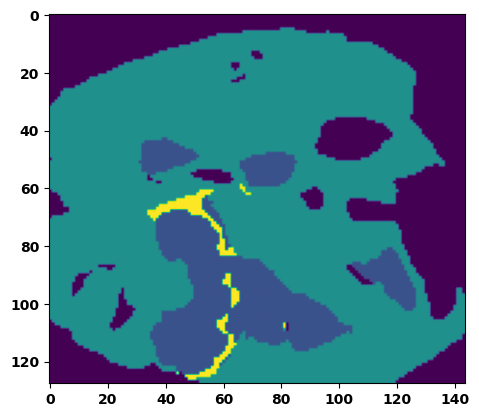

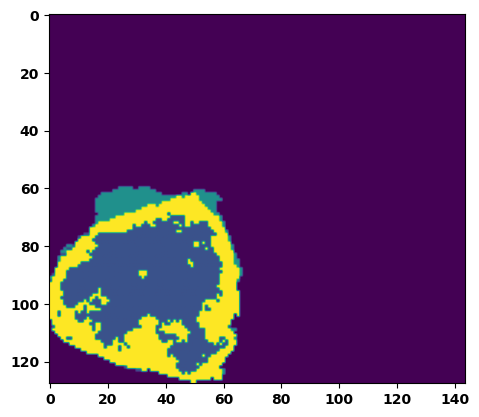

 33%|███▎      | 12/36 [00:12<00:25,  1.07s/it]

Batch_id:  11 Eval loss:  0.2618618607521057
Batch_id:  11 Eval IoU:  tensor(0.6487, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.04s/it]

Batch_id:  12 Eval loss:  0.7625503540039062
Batch_id:  12 Eval IoU:  tensor(0.2244, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8974, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.09s/it]

Batch_id:  13 Eval loss:  0.7571226358413696
Batch_id:  13 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.06s/it]

Batch_id:  14 Eval loss:  0.7737002968788147
Batch_id:  14 Eval IoU:  tensor(0.1434, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6062, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3076, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2225, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:21,  1.06s/it]

Batch_id:  15 Eval loss:  0.18992608785629272
Batch_id:  15 Eval IoU:  tensor(0.7384, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:20,  1.06s/it]

Batch_id:  16 Eval loss:  0.5758966207504272
Batch_id:  16 Eval IoU:  tensor(0.3469, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9034, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8090, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9516, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:19,  1.06s/it]

Batch_id:  17 Eval loss:  0.3069201111793518
Batch_id:  17 Eval IoU:  tensor(0.5713, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.05s/it]

Batch_id:  18 Eval loss:  0.5774046182632446
Batch_id:  18 Eval IoU:  tensor(0.3394, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8414, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9531, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.05s/it]

Batch_id:  19 Eval loss:  0.7667553424835205
Batch_id:  19 Eval IoU:  tensor(0.1457, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6779, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4081, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8815, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.7714, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.6506, device='cuda:0')
Batch_id:  20 Eval loss:  0.31643420457839966
Batch_id:  20 Eval IoU:  tensor(0.6100, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9927, device='cuda:0')


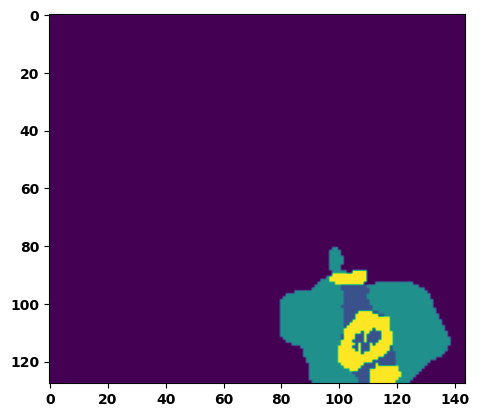

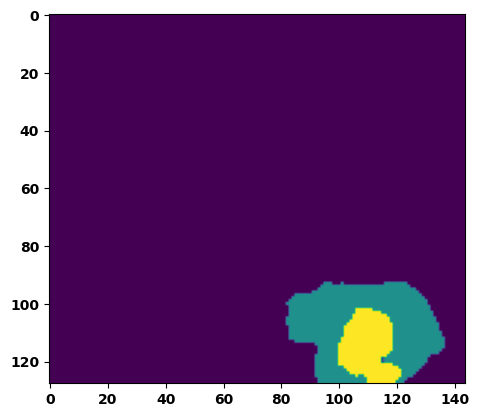

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.8211859464645386
Batch_id:  21 Eval IoU:  tensor(0.1139, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6867, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4284, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.3748, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.06s/it]

Batch_id:  22 Eval loss:  0.7691319584846497
Batch_id:  22 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.21678225696086884
Batch_id:  23 Eval IoU:  tensor(0.6669, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9738, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.09s/it]

Batch_id:  24 Eval loss:  0.789857804775238
Batch_id:  24 Eval IoU:  tensor(0.1241, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6448, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3811, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9169, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.3476, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.8361177444458008
Batch_id:  25 Eval IoU:  tensor(0.1182, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7317, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4782, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.5824, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.11s/it]

Batch_id:  26 Eval loss:  0.7517797946929932
Batch_id:  26 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.09s/it]

Batch_id:  27 Eval loss:  0.027674585580825806
Batch_id:  27 Eval IoU:  tensor(0.9524, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.13s/it]

Batch_id:  28 Eval loss:  0.3466055393218994
Batch_id:  28 Eval IoU:  tensor(0.5264, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9779, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.12s/it]

Batch_id:  29 Eval loss:  0.7388398051261902
Batch_id:  29 Eval IoU:  tensor(0.1671, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6582, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3748, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3387, device='cuda:0')
Batch_id:  30 Eval loss:  0.8841479420661926
Batch_id:  30 Eval IoU:  tensor(0.0734, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6195, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4133, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2391, device='cuda:0')


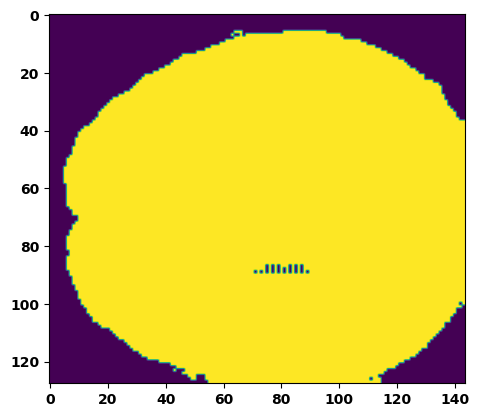

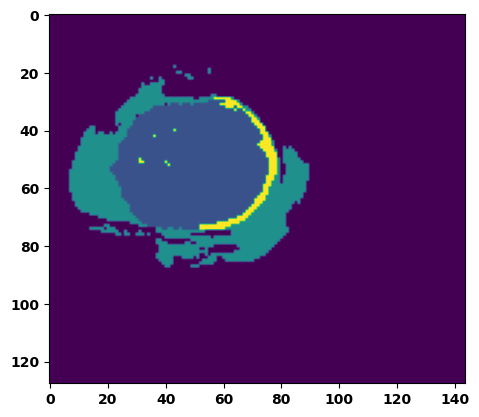

 89%|████████▉ | 32/36 [00:34<00:04,  1.16s/it]

Batch_id:  31 Eval loss:  0.44260311126708984
Batch_id:  31 Eval IoU:  tensor(0.4685, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8378, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6789, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.6830, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.11s/it]

Batch_id:  32 Eval loss:  0.7677485942840576
Batch_id:  32 Eval IoU:  tensor(0.1507, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7109, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.5068, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.7958, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.5570, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.11s/it]

Batch_id:  33 Eval loss:  0.15785275399684906
Batch_id:  33 Eval IoU:  tensor(0.7951, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.15s/it]

Batch_id:  34 Eval loss:  0.7686095237731934
Batch_id:  34 Eval IoU:  tensor(0.2009, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8542, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8055, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8148, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.7459567785263062
Batch_id:  35 Eval IoU:  tensor(0.1835, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7821, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6299, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.6357, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9440, device='cuda:0')
Epoch  21 Training loss:  0.15155785937200894
Epoch  21 Evaluation loss:  0.601450017756886
Epoch  21 Training accuracy :  tensor(0.7783)
Epoch  21 Evaluation accuracy :  tensor(0.3331)
Epoch  21 Training Mean Dice Score:  tensor(0.9877)
Epoch  21 Eval Mean Dice Score:  tensor(0.8581)
Epoch  21 Training Non-tumor Dice Score:  tensor(0.9841)
Epoch  21 Eval Non-tumor Dice Score:  tensor(0.7572)
Epoch  21 Training NCR/NET Dice Score:  tensor(0.9924)
Epoch  21 Eval NCR/NET Dice Score:  tensor(0.9604)
Epoch  21 Training ED Dice Score:  tensor(0.982

Epoch: 22
Training in session: 


  1%|          | 1/110 [00:01<01:56,  1.07s/it]

Batch_id:  0 Training loss:  0.13615809381008148
Batch_id:  0 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.08246077597141266
Batch_id:  1 Training IoU:  tensor(0.8585, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:00,  1.13s/it]

Batch_id:  2 Training loss:  0.08714357018470764
Batch_id:  2 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:57,  1.11s/it]

Batch_id:  3 Training loss:  0.17818458378314972
Batch_id:  3 Training IoU:  tensor(0.7355, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:56,  1.11s/it]

Batch_id:  4 Training loss:  0.08350734412670135
Batch_id:  4 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:59,  1.15s/it]

Batch_id:  5 Training loss:  0.06516605615615845
Batch_id:  5 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:56,  1.13s/it]

Batch_id:  6 Training loss:  0.12107014656066895
Batch_id:  6 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:54,  1.12s/it]

Batch_id:  7 Training loss:  0.22162280976772308
Batch_id:  7 Training IoU:  tensor(0.6689, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:54,  1.13s/it]

Batch_id:  8 Training loss:  0.09343118965625763
Batch_id:  8 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:54,  1.15s/it]

Batch_id:  9 Training loss:  0.2825993299484253
Batch_id:  9 Training IoU:  tensor(0.6348, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 10%|█         | 11/110 [00:12<01:56,  1.18s/it]

Batch_id:  10 Training loss:  0.06504613161087036
Batch_id:  10 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 11%|█         | 12/110 [00:13<01:54,  1.17s/it]

Batch_id:  11 Training loss:  0.12708862125873566
Batch_id:  11 Training IoU:  tensor(0.7858, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:50,  1.14s/it]

Batch_id:  12 Training loss:  0.12384851276874542
Batch_id:  12 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.11s/it]

Batch_id:  13 Training loss:  0.09817902743816376
Batch_id:  13 Training IoU:  tensor(0.8320, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:47,  1.14s/it]

Batch_id:  14 Training loss:  0.06977587938308716
Batch_id:  14 Training IoU:  tensor(0.8793, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:46,  1.13s/it]

Batch_id:  15 Training loss:  0.18013690412044525
Batch_id:  15 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:42,  1.11s/it]

Batch_id:  16 Training loss:  0.19588716328144073
Batch_id:  16 Training IoU:  tensor(0.7002, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.1250050961971283
Batch_id:  17 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:39,  1.09s/it]

Batch_id:  18 Training loss:  0.13274212181568146
Batch_id:  18 Training IoU:  tensor(0.7832, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.283142626285553
Batch_id:  19 Training IoU:  tensor(0.5963, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9676, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:36,  1.08s/it]

Batch_id:  20 Training loss:  0.21563924849033356
Batch_id:  20 Training IoU:  tensor(0.7014, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 20%|██        | 22/110 [00:24<01:35,  1.08s/it]

Batch_id:  21 Training loss:  0.34156787395477295
Batch_id:  21 Training IoU:  tensor(0.5991, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 21%|██        | 23/110 [00:25<01:34,  1.09s/it]

Batch_id:  22 Training loss:  0.07913969457149506
Batch_id:  22 Training IoU:  tensor(0.8778, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:33,  1.09s/it]

Batch_id:  23 Training loss:  0.34128451347351074
Batch_id:  23 Training IoU:  tensor(0.6198, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9131, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9229, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.06s/it]

Batch_id:  24 Training loss:  0.19565069675445557
Batch_id:  24 Training IoU:  tensor(0.7018, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:28,  1.06s/it]

Batch_id:  25 Training loss:  0.3899025022983551
Batch_id:  25 Training IoU:  tensor(0.4999, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:27,  1.06s/it]

Batch_id:  26 Training loss:  0.1479695439338684
Batch_id:  26 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.08831053972244263
Batch_id:  27 Training IoU:  tensor(0.8496, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:26,  1.06s/it]

Batch_id:  28 Training loss:  0.14566650986671448
Batch_id:  28 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.11285807192325592
Batch_id:  29 Training IoU:  tensor(0.8246, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:24,  1.07s/it]

Batch_id:  30 Training loss:  0.09578895568847656
Batch_id:  30 Training IoU:  tensor(0.8392, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.12458628416061401
Batch_id:  31 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.05375036597251892
Batch_id:  32 Training IoU:  tensor(0.9129, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 31%|███       | 34/110 [00:37<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.10113674402236938
Batch_id:  33 Training IoU:  tensor(0.8240, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:22,  1.10s/it]

Batch_id:  34 Training loss:  0.3655780553817749
Batch_id:  34 Training IoU:  tensor(0.5774, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:23,  1.13s/it]

Batch_id:  35 Training loss:  0.12988238036632538
Batch_id:  35 Training IoU:  tensor(0.8017, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:20,  1.11s/it]

Batch_id:  36 Training loss:  0.1519826501607895
Batch_id:  36 Training IoU:  tensor(0.7668, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.08728736639022827
Batch_id:  37 Training IoU:  tensor(0.8485, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:17,  1.10s/it]

Batch_id:  38 Training loss:  0.10622170567512512
Batch_id:  38 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:16,  1.10s/it]

Batch_id:  39 Training loss:  0.10358896851539612
Batch_id:  39 Training IoU:  tensor(0.8373, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.08437111973762512
Batch_id:  40 Training IoU:  tensor(0.8536, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:15,  1.11s/it]

Batch_id:  41 Training loss:  0.06481319665908813
Batch_id:  41 Training IoU:  tensor(0.8879, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:15,  1.12s/it]

Batch_id:  42 Training loss:  0.07871052622795105
Batch_id:  42 Training IoU:  tensor(0.8660, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.40053296089172363
Batch_id:  43 Training IoU:  tensor(0.5092, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.1508108377456665
Batch_id:  44 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.07430800795555115
Batch_id:  45 Training IoU:  tensor(0.8674, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.12742853164672852
Batch_id:  46 Training IoU:  tensor(0.8175, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:07,  1.08s/it]

Batch_id:  47 Training loss:  0.13806185126304626
Batch_id:  47 Training IoU:  tensor(0.7731, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.0947851687669754
Batch_id:  48 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.1628204733133316
Batch_id:  49 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.43956735730171204
Batch_id:  50 Training IoU:  tensor(0.4841, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.14209070801734924
Batch_id:  51 Training IoU:  tensor(0.7669, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.05670352280139923
Batch_id:  52 Training IoU:  tensor(0.9041, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:02,  1.11s/it]

Batch_id:  53 Training loss:  0.07769261300563812
Batch_id:  53 Training IoU:  tensor(0.8708, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.19238707423210144
Batch_id:  54 Training IoU:  tensor(0.7482, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.0799725353717804
Batch_id:  55 Training IoU:  tensor(0.8705, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.0981733649969101
Batch_id:  56 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.15126129984855652
Batch_id:  57 Training IoU:  tensor(0.7935, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.08304463326931
Batch_id:  58 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.06685666739940643
Batch_id:  59 Training IoU:  tensor(0.8917, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.10s/it]

Batch_id:  60 Training loss:  0.15852923691272736
Batch_id:  60 Training IoU:  tensor(0.8178, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.1524098664522171
Batch_id:  61 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.0911576896905899
Batch_id:  62 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.08852702379226685
Batch_id:  63 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.07s/it]

Batch_id:  64 Training loss:  0.08447051048278809
Batch_id:  64 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.23895378410816193
Batch_id:  65 Training IoU:  tensor(0.6439, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:45,  1.07s/it]

Batch_id:  66 Training loss:  0.0977296382188797
Batch_id:  66 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:44,  1.06s/it]

Batch_id:  67 Training loss:  0.14175337553024292
Batch_id:  67 Training IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:43,  1.05s/it]

Batch_id:  68 Training loss:  0.36157506704330444
Batch_id:  68 Training IoU:  tensor(0.5906, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:41,  1.05s/it]

Batch_id:  69 Training loss:  0.08693592250347137
Batch_id:  69 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.0841933935880661
Batch_id:  70 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.07s/it]

Batch_id:  71 Training loss:  0.23498457670211792
Batch_id:  71 Training IoU:  tensor(0.6991, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.08s/it]

Batch_id:  72 Training loss:  0.13595521450042725
Batch_id:  72 Training IoU:  tensor(0.7972, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:38,  1.06s/it]

Batch_id:  73 Training loss:  0.1720138043165207
Batch_id:  73 Training IoU:  tensor(0.7280, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.06s/it]

Batch_id:  74 Training loss:  0.2091449350118637
Batch_id:  74 Training IoU:  tensor(0.7113, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:35,  1.06s/it]

Batch_id:  75 Training loss:  0.22345402836799622
Batch_id:  75 Training IoU:  tensor(0.6644, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:34,  1.05s/it]

Batch_id:  76 Training loss:  0.1368713527917862
Batch_id:  76 Training IoU:  tensor(0.7708, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:33,  1.06s/it]

Batch_id:  77 Training loss:  0.13612134754657745
Batch_id:  77 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.062043070793151855
Batch_id:  78 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.10s/it]

Batch_id:  79 Training loss:  0.08611798286437988
Batch_id:  79 Training IoU:  tensor(0.8512, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:32,  1.12s/it]

Batch_id:  80 Training loss:  0.26835721731185913
Batch_id:  80 Training IoU:  tensor(0.6685, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.12s/it]

Batch_id:  81 Training loss:  0.18076863884925842
Batch_id:  81 Training IoU:  tensor(0.7106, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.0588199645280838
Batch_id:  82 Training IoU:  tensor(0.9180, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:29,  1.14s/it]

Batch_id:  83 Training loss:  0.05679076910018921
Batch_id:  83 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:28,  1.14s/it]

Batch_id:  84 Training loss:  0.07068164646625519
Batch_id:  84 Training IoU:  tensor(0.8820, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.1227300763130188
Batch_id:  85 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.05887123942375183
Batch_id:  86 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.13091610372066498
Batch_id:  87 Training IoU:  tensor(0.7830, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:24,  1.15s/it]

Batch_id:  88 Training loss:  0.04708626866340637
Batch_id:  88 Training IoU:  tensor(0.9166, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.12s/it]

Batch_id:  89 Training loss:  0.16424450278282166
Batch_id:  89 Training IoU:  tensor(0.7329, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.09s/it]

Batch_id:  90 Training loss:  0.14467118680477142
Batch_id:  90 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.08s/it]

Batch_id:  91 Training loss:  0.16040252149105072
Batch_id:  91 Training IoU:  tensor(0.7667, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.08s/it]

Batch_id:  92 Training loss:  0.22919997572898865
Batch_id:  92 Training IoU:  tensor(0.6661, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.1502474695444107
Batch_id:  93 Training IoU:  tensor(0.7707, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.09541140496730804
Batch_id:  94 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.12s/it]

Batch_id:  95 Training loss:  0.26876652240753174
Batch_id:  95 Training IoU:  tensor(0.6489, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.24738988280296326
Batch_id:  96 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:12,  1.07s/it]

Batch_id:  97 Training loss:  0.20878838002681732
Batch_id:  97 Training IoU:  tensor(0.7451, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.07s/it]

Batch_id:  98 Training loss:  0.14797909557819366
Batch_id:  98 Training IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.06s/it]

Batch_id:  99 Training loss:  0.5047483444213867
Batch_id:  99 Training IoU:  tensor(0.4248, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.1620832085609436
Batch_id:  100 Training IoU:  tensor(0.7496, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.05s/it]

Batch_id:  101 Training loss:  0.08945563435554504
Batch_id:  101 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.2218300700187683
Batch_id:  102 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.06s/it]

Batch_id:  103 Training loss:  0.0772656798362732
Batch_id:  103 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.07s/it]

Batch_id:  104 Training loss:  0.1933096945285797
Batch_id:  104 Training IoU:  tensor(0.6984, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.06s/it]

Batch_id:  105 Training loss:  0.1847859025001526
Batch_id:  105 Training IoU:  tensor(0.7177, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.06s/it]

Batch_id:  106 Training loss:  0.07412834465503693
Batch_id:  106 Training IoU:  tensor(0.8720, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.06s/it]

Batch_id:  107 Training loss:  0.17309801280498505
Batch_id:  107 Training IoU:  tensor(0.7368, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.052382200956344604
Batch_id:  108 Training IoU:  tensor(0.9094, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.11028100550174713
Batch_id:  109 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9978, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6636340022087097
Batch_id:  0 Eval IoU:  tensor(0.2652, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8747, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8183, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7530, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


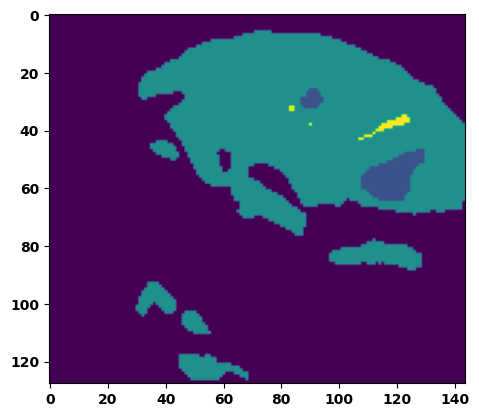

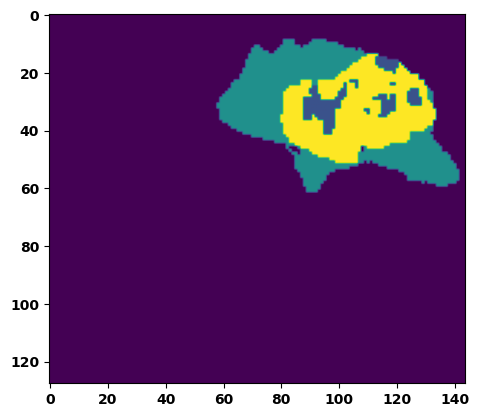

  6%|▌         | 2/36 [00:02<00:36,  1.08s/it]

Batch_id:  1 Eval loss:  0.7292691469192505
Batch_id:  1 Eval IoU:  tensor(0.2514, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.06s/it]

Batch_id:  2 Eval loss:  0.8396589756011963
Batch_id:  2 Eval IoU:  tensor(0.0965, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6432, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3698, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.2971, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.07s/it]

Batch_id:  3 Eval loss:  0.26097816228866577
Batch_id:  3 Eval IoU:  tensor(0.6455, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9968, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.7517708539962769
Batch_id:  4 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7660189867019653
Batch_id:  5 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.634391725063324
Batch_id:  6 Eval IoU:  tensor(0.2569, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.7782, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.6683, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.6086, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9303, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.050871819257736206
Batch_id:  7 Eval IoU:  tensor(0.9094, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.5748709440231323
Batch_id:  8 Eval IoU:  tensor(0.3451, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9034, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.8500, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.07s/it]

Batch_id:  9 Eval loss:  0.7699391841888428
Batch_id:  9 Eval IoU:  tensor(0.2008, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8740, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7968, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8721, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  10 Eval loss:  0.7637031674385071
Batch_id:  10 Eval IoU:  tensor(0.2236, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


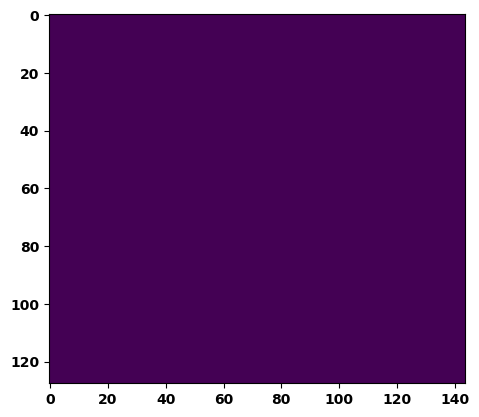

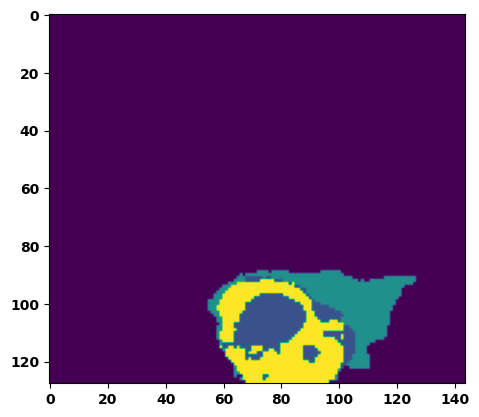

 33%|███▎      | 12/36 [00:12<00:26,  1.11s/it]

Batch_id:  11 Eval loss:  0.7231169939041138
Batch_id:  11 Eval IoU:  tensor(0.1786, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7215, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4928, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.7844, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.6896, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:25,  1.09s/it]

Batch_id:  12 Eval loss:  0.6566483974456787
Batch_id:  12 Eval IoU:  tensor(0.2904, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9074, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8176, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9531, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.26277631521224976
Batch_id:  13 Eval IoU:  tensor(0.6754, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.7757055163383484
Batch_id:  14 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.07s/it]

Batch_id:  15 Eval loss:  0.8121102452278137
Batch_id:  15 Eval IoU:  tensor(0.1223, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7008, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4573, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.4018, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.05s/it]

Batch_id:  16 Eval loss:  0.7535315155982971
Batch_id:  16 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.05s/it]

Batch_id:  17 Eval loss:  0.7653502225875854
Batch_id:  17 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.810874342918396
Batch_id:  18 Eval IoU:  tensor(0.1230, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6882, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4988, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8769, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.3909, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.8306757211685181
Batch_id:  19 Eval IoU:  tensor(0.0976, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5996, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3088, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.2072, device='cuda:0')
Batch_id:  20 Eval loss:  0.6969532370567322
Batch_id:  20 Eval IoU:  tensor(0.2654, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9698, device='cuda:0')


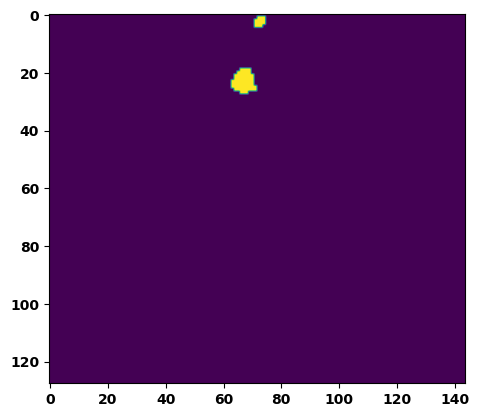

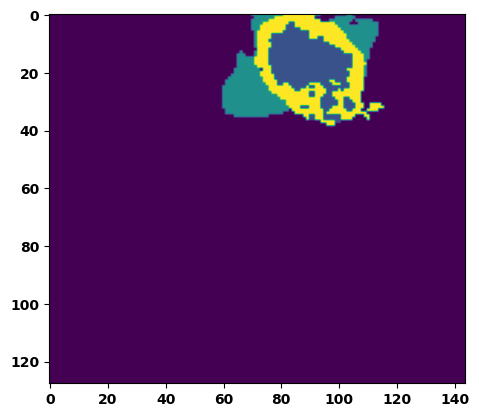

 61%|██████    | 22/36 [00:23<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.76912522315979
Batch_id:  21 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.06s/it]

Batch_id:  22 Eval loss:  0.6778177618980408
Batch_id:  22 Eval IoU:  tensor(0.2741, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9117, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9479, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.8235346674919128
Batch_id:  23 Eval IoU:  tensor(0.1336, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7611, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.5376, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.6449, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.05s/it]

Batch_id:  24 Eval loss:  0.38816526532173157
Batch_id:  24 Eval IoU:  tensor(0.5267, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9823, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.03s/it]

Batch_id:  25 Eval loss:  0.7321383953094482
Batch_id:  25 Eval IoU:  tensor(0.2385, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9754, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.46560028195381165
Batch_id:  26 Eval IoU:  tensor(0.4138, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8934, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9617, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.05s/it]

Batch_id:  27 Eval loss:  0.5389273166656494
Batch_id:  27 Eval IoU:  tensor(0.3678, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9127, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9011, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8576, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9521, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.07s/it]

Batch_id:  28 Eval loss:  0.1206841915845871
Batch_id:  28 Eval IoU:  tensor(0.8290, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.08s/it]

Batch_id:  29 Eval loss:  0.2262551635503769
Batch_id:  29 Eval IoU:  tensor(0.6556, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  30 Eval loss:  0.43019339442253113
Batch_id:  30 Eval IoU:  tensor(0.4804, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8463, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.6955, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.7034, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


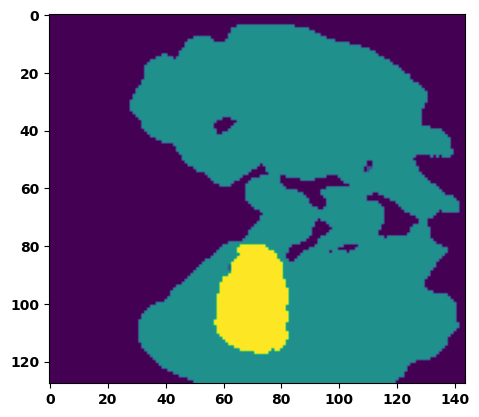

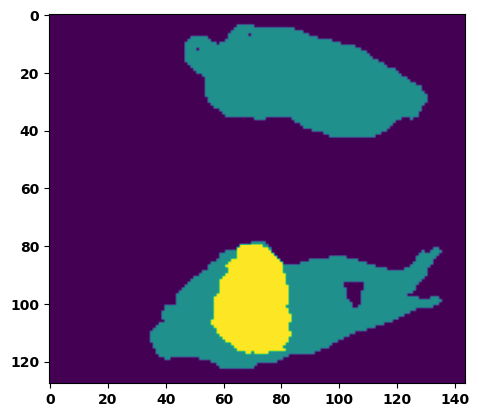

 89%|████████▉ | 32/36 [00:34<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.7421641945838928
Batch_id:  31 Eval IoU:  tensor(0.1852, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7717, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5504, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.6586, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.8837968707084656
Batch_id:  32 Eval IoU:  tensor(0.0737, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6200, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4142, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2400, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.07s/it]

Batch_id:  33 Eval loss:  0.7633724212646484
Batch_id:  33 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.7571106553077698
Batch_id:  34 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.7711479663848877
Batch_id:  35 Eval IoU:  tensor(0.1380, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6585, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4081, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.3565, device='cuda:0')
Epoch  22 Training loss:  0.15029830810698597
Epoch  22 Evaluation loss:  0.6384134234653579
Epoch  22 Training accuracy :  tensor(0.7798)
Epoch  22 Evaluation accuracy :  tensor(0.3074)
Epoch  22 Training Mean Dice Score:  tensor(0.9875)
Epoch  22 Eval Mean Dice Score:  tensor(0.8747)
Epoch  22 Training Non-tumor Dice Score:  tensor(0.9840)
Epoch  22 Eval Non-tumor Dice Score:  tensor(0.7864)
Epoch  22 Training NCR/NET Dice Score:  tensor(0.9921)
Epoch  22 Eval NCR/NET Dice Score:  tensor(0.9657)
Epoch  22 Training ED Dice Score:  tensor(0.98

Epoch: 23
Training in session: 


  1%|          | 1/110 [00:01<02:19,  1.28s/it]

Batch_id:  0 Training loss:  0.2681776285171509
Batch_id:  0 Training IoU:  tensor(0.6105, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9715, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:01,  1.13s/it]

Batch_id:  1 Training loss:  0.17600421607494354
Batch_id:  1 Training IoU:  tensor(0.7280, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:04,  1.16s/it]

Batch_id:  2 Training loss:  0.13602261245250702
Batch_id:  2 Training IoU:  tensor(0.7779, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:01,  1.15s/it]

Batch_id:  3 Training loss:  0.046924009919166565
Batch_id:  3 Training IoU:  tensor(0.9161, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:57,  1.12s/it]

Batch_id:  4 Training loss:  0.11581362783908844
Batch_id:  4 Training IoU:  tensor(0.8162, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.09335334599018097
Batch_id:  5 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:54,  1.11s/it]

Batch_id:  6 Training loss:  0.12921182811260223
Batch_id:  6 Training IoU:  tensor(0.7869, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


  7%|▋         | 8/110 [00:09<02:03,  1.21s/it]

Batch_id:  7 Training loss:  0.2639199495315552
Batch_id:  7 Training IoU:  tensor(0.6745, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:57,  1.17s/it]

Batch_id:  8 Training loss:  0.08078192174434662
Batch_id:  8 Training IoU:  tensor(0.8591, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:54,  1.15s/it]

Batch_id:  9 Training loss:  0.07711325585842133
Batch_id:  9 Training IoU:  tensor(0.8648, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 10%|█         | 11/110 [00:12<01:52,  1.14s/it]

Batch_id:  10 Training loss:  0.15142793953418732
Batch_id:  10 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 11%|█         | 12/110 [00:13<01:47,  1.10s/it]

Batch_id:  11 Training loss:  0.08736394345760345
Batch_id:  11 Training IoU:  tensor(0.8537, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:51,  1.15s/it]

Batch_id:  12 Training loss:  0.26998209953308105
Batch_id:  12 Training IoU:  tensor(0.6491, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.0773548036813736
Batch_id:  13 Training IoU:  tensor(0.8801, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.055717259645462036
Batch_id:  14 Training IoU:  tensor(0.9071, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.08042123913764954
Batch_id:  15 Training IoU:  tensor(0.8693, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:44,  1.12s/it]

Batch_id:  16 Training loss:  0.15414993464946747
Batch_id:  16 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.20734289288520813
Batch_id:  17 Training IoU:  tensor(0.7095, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.0724426656961441
Batch_id:  18 Training IoU:  tensor(0.8743, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:36,  1.07s/it]

Batch_id:  19 Training loss:  0.33604592084884644
Batch_id:  19 Training IoU:  tensor(0.6262, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:36,  1.08s/it]

Batch_id:  20 Training loss:  0.08244097232818604
Batch_id:  20 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 20%|██        | 22/110 [00:24<01:42,  1.16s/it]

Batch_id:  21 Training loss:  0.08718019723892212
Batch_id:  21 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 21%|██        | 23/110 [00:26<01:40,  1.15s/it]

Batch_id:  22 Training loss:  0.06384286284446716
Batch_id:  22 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:39,  1.16s/it]

Batch_id:  23 Training loss:  0.0580768883228302
Batch_id:  23 Training IoU:  tensor(0.8978, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:36,  1.14s/it]

Batch_id:  24 Training loss:  0.06433294713497162
Batch_id:  24 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.0951906144618988
Batch_id:  25 Training IoU:  tensor(0.8459, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.13906514644622803
Batch_id:  26 Training IoU:  tensor(0.7983, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:27,  1.07s/it]

Batch_id:  27 Training loss:  0.25287842750549316
Batch_id:  27 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:26,  1.06s/it]

Batch_id:  28 Training loss:  0.16209715604782104
Batch_id:  28 Training IoU:  tensor(0.7413, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9710, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:25,  1.06s/it]

Batch_id:  29 Training loss:  0.24394425749778748
Batch_id:  29 Training IoU:  tensor(0.6406, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:24,  1.06s/it]

Batch_id:  30 Training loss:  0.08275958895683289
Batch_id:  30 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.0663936585187912
Batch_id:  31 Training IoU:  tensor(0.8926, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 30%|███       | 33/110 [00:36<01:20,  1.05s/it]

Batch_id:  32 Training loss:  0.08823567628860474
Batch_id:  32 Training IoU:  tensor(0.8485, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 31%|███       | 34/110 [00:37<01:19,  1.04s/it]

Batch_id:  33 Training loss:  0.1317702680826187
Batch_id:  33 Training IoU:  tensor(0.7965, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.10897882282733917
Batch_id:  34 Training IoU:  tensor(0.8324, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.05328811705112457
Batch_id:  35 Training IoU:  tensor(0.9077, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:21,  1.11s/it]

Batch_id:  36 Training loss:  0.11556252837181091
Batch_id:  36 Training IoU:  tensor(0.8066, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.10179014503955841
Batch_id:  37 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.1320563703775406
Batch_id:  38 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.2074146866798401
Batch_id:  39 Training IoU:  tensor(0.6961, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:13,  1.06s/it]

Batch_id:  40 Training loss:  0.18236732482910156
Batch_id:  40 Training IoU:  tensor(0.7207, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:11,  1.05s/it]

Batch_id:  41 Training loss:  0.3347579836845398
Batch_id:  41 Training IoU:  tensor(0.6401, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:10,  1.05s/it]

Batch_id:  42 Training loss:  0.49658259749412537
Batch_id:  42 Training IoU:  tensor(0.4300, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 40%|████      | 44/110 [00:48<01:10,  1.06s/it]

Batch_id:  43 Training loss:  0.15228964388370514
Batch_id:  43 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.06s/it]

Batch_id:  44 Training loss:  0.15150897204875946
Batch_id:  44 Training IoU:  tensor(0.7687, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:07,  1.06s/it]

Batch_id:  45 Training loss:  0.08850757777690887
Batch_id:  45 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.07216522097587585
Batch_id:  46 Training IoU:  tensor(0.8732, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.2114739865064621
Batch_id:  47 Training IoU:  tensor(0.7425, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:04,  1.06s/it]

Batch_id:  48 Training loss:  0.15951955318450928
Batch_id:  48 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:03,  1.05s/it]

Batch_id:  49 Training loss:  0.44742846488952637
Batch_id:  49 Training IoU:  tensor(0.4775, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.12451443076133728
Batch_id:  50 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:02,  1.07s/it]

Batch_id:  51 Training loss:  0.19225510954856873
Batch_id:  51 Training IoU:  tensor(0.7493, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:00,  1.07s/it]

Batch_id:  52 Training loss:  0.3374914824962616
Batch_id:  52 Training IoU:  tensor(0.6074, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.07s/it]

Batch_id:  53 Training loss:  0.08893506228923798
Batch_id:  53 Training IoU:  tensor(0.8475, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.2246924638748169
Batch_id:  54 Training IoU:  tensor(0.6719, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.07s/it]

Batch_id:  55 Training loss:  0.40219807624816895
Batch_id:  55 Training IoU:  tensor(0.5107, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.12256263196468353
Batch_id:  56 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:54,  1.06s/it]

Batch_id:  57 Training loss:  0.16394329071044922
Batch_id:  57 Training IoU:  tensor(0.7330, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.09685960412025452
Batch_id:  58 Training IoU:  tensor(0.8328, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.08518685400485992
Batch_id:  59 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.13622422516345978
Batch_id:  60 Training IoU:  tensor(0.7999, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.4061294496059418
Batch_id:  61 Training IoU:  tensor(0.4811, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.10696464776992798
Batch_id:  62 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.0592537522315979
Batch_id:  63 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:49,  1.10s/it]

Batch_id:  64 Training loss:  0.06009934842586517
Batch_id:  64 Training IoU:  tensor(0.9164, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:48,  1.10s/it]

Batch_id:  65 Training loss:  0.21864157915115356
Batch_id:  65 Training IoU:  tensor(0.6674, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:48,  1.12s/it]

Batch_id:  66 Training loss:  0.06744524836540222
Batch_id:  66 Training IoU:  tensor(0.8862, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.10s/it]

Batch_id:  67 Training loss:  0.05794607102870941
Batch_id:  67 Training IoU:  tensor(0.9005, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.10s/it]

Batch_id:  68 Training loss:  0.09857603907585144
Batch_id:  68 Training IoU:  tensor(0.8304, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.10s/it]

Batch_id:  69 Training loss:  0.09790493547916412
Batch_id:  69 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.10s/it]

Batch_id:  70 Training loss:  0.0951237827539444
Batch_id:  70 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:41,  1.08s/it]

Batch_id:  71 Training loss:  0.1401464194059372
Batch_id:  71 Training IoU:  tensor(0.7947, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.08s/it]

Batch_id:  72 Training loss:  0.13600708544254303
Batch_id:  72 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.06469805538654327
Batch_id:  73 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.1538652926683426
Batch_id:  74 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:37,  1.10s/it]

Batch_id:  75 Training loss:  0.23059484362602234
Batch_id:  75 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.1001800149679184
Batch_id:  76 Training IoU:  tensor(0.8323, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.06436268985271454
Batch_id:  77 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.11356587707996368
Batch_id:  78 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.08792603015899658
Batch_id:  79 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.10098259150981903
Batch_id:  80 Training IoU:  tensor(0.8241, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.21045953035354614
Batch_id:  81 Training IoU:  tensor(0.6805, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:30,  1.12s/it]

Batch_id:  82 Training loss:  0.13036669790744781
Batch_id:  82 Training IoU:  tensor(0.7994, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:28,  1.10s/it]

Batch_id:  83 Training loss:  0.12816932797431946
Batch_id:  83 Training IoU:  tensor(0.7895, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.07977078855037689
Batch_id:  84 Training IoU:  tensor(0.8633, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.07646220922470093
Batch_id:  85 Training IoU:  tensor(0.8676, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.07773841917514801
Batch_id:  86 Training IoU:  tensor(0.8697, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.1547715812921524
Batch_id:  87 Training IoU:  tensor(0.7733, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.16002921760082245
Batch_id:  88 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.15067258477210999
Batch_id:  89 Training IoU:  tensor(0.7661, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.07s/it]

Batch_id:  90 Training loss:  0.055105581879615784
Batch_id:  90 Training IoU:  tensor(0.9101, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.08s/it]

Batch_id:  91 Training loss:  0.16174761950969696
Batch_id:  91 Training IoU:  tensor(0.7498, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.18544723093509674
Batch_id:  92 Training IoU:  tensor(0.7514, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.08s/it]

Batch_id:  93 Training loss:  0.181876078248024
Batch_id:  93 Training IoU:  tensor(0.7267, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.1069602221250534
Batch_id:  94 Training IoU:  tensor(0.8264, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.12s/it]

Batch_id:  95 Training loss:  0.26489415764808655
Batch_id:  95 Training IoU:  tensor(0.6550, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.13964156806468964
Batch_id:  96 Training IoU:  tensor(0.7885, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.14s/it]

Batch_id:  97 Training loss:  0.060716643929481506
Batch_id:  97 Training IoU:  tensor(0.8967, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.15s/it]

Batch_id:  98 Training loss:  0.1903933584690094
Batch_id:  98 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.14s/it]

Batch_id:  99 Training loss:  0.13401630520820618
Batch_id:  99 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:10,  1.15s/it]

Batch_id:  100 Training loss:  0.08332081139087677
Batch_id:  100 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:09,  1.14s/it]

Batch_id:  101 Training loss:  0.150405153632164
Batch_id:  101 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:08,  1.15s/it]

Batch_id:  102 Training loss:  0.17882564663887024
Batch_id:  102 Training IoU:  tensor(0.7647, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:07,  1.18s/it]

Batch_id:  103 Training loss:  0.17653153836727142
Batch_id:  103 Training IoU:  tensor(0.7799, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.15s/it]

Batch_id:  104 Training loss:  0.21346579492092133
Batch_id:  104 Training IoU:  tensor(0.6734, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.17s/it]

Batch_id:  105 Training loss:  0.36928945779800415
Batch_id:  105 Training IoU:  tensor(0.5718, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.15s/it]

Batch_id:  106 Training loss:  0.21832039952278137
Batch_id:  106 Training IoU:  tensor(0.6981, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.17s/it]

Batch_id:  107 Training loss:  0.1434733122587204
Batch_id:  107 Training IoU:  tensor(0.7775, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.18s/it]

Batch_id:  108 Training loss:  0.1820944994688034
Batch_id:  108 Training IoU:  tensor(0.7097, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.0880521833896637
Batch_id:  109 Training IoU:  tensor(0.8490, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9953, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7691234350204468
Batch_id:  0 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


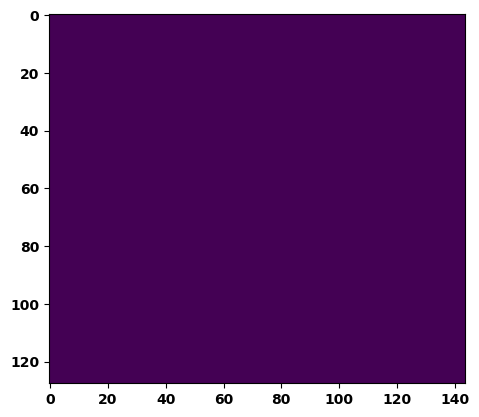

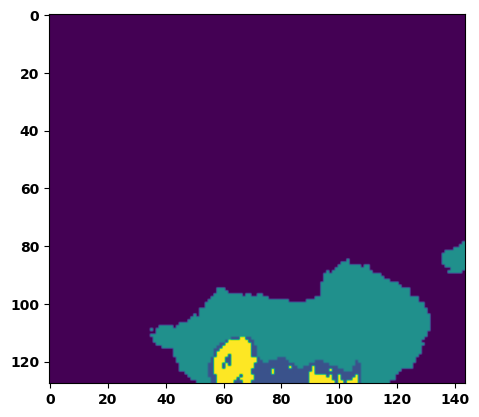

  6%|▌         | 2/36 [00:02<00:38,  1.14s/it]

Batch_id:  1 Eval loss:  0.7157672643661499
Batch_id:  1 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8354, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7314, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.6804, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9443, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.11s/it]

Batch_id:  2 Eval loss:  0.5542211532592773
Batch_id:  2 Eval IoU:  tensor(0.3612, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9583, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.13s/it]

Batch_id:  3 Eval loss:  0.2108830213546753
Batch_id:  3 Eval IoU:  tensor(0.7264, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:35,  1.14s/it]

Batch_id:  4 Eval loss:  0.7813901305198669
Batch_id:  4 Eval IoU:  tensor(0.1348, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6727, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4176, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9096, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8100, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.5536, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.11s/it]

Batch_id:  5 Eval loss:  0.5823172926902771
Batch_id:  5 Eval IoU:  tensor(0.3453, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9047, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8887, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8111, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9540, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.07s/it]

Batch_id:  6 Eval loss:  0.8849887251853943
Batch_id:  6 Eval IoU:  tensor(0.0727, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6185, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4111, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.2370, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.7975851893424988
Batch_id:  7 Eval IoU:  tensor(0.1317, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.7018, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4955, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8963, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.4322, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.02s/it]

Batch_id:  8 Eval loss:  0.8639411926269531
Batch_id:  8 Eval IoU:  tensor(0.0765, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5958, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3074, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.1962, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.8236302137374878
Batch_id:  9 Eval IoU:  tensor(0.1123, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6857, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4271, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3717, device='cuda:0')
Batch_id:  10 Eval loss:  0.8514609932899475
Batch_id:  10 Eval IoU:  tensor(0.0900, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6414, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3717, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.2894, device='cuda:0')


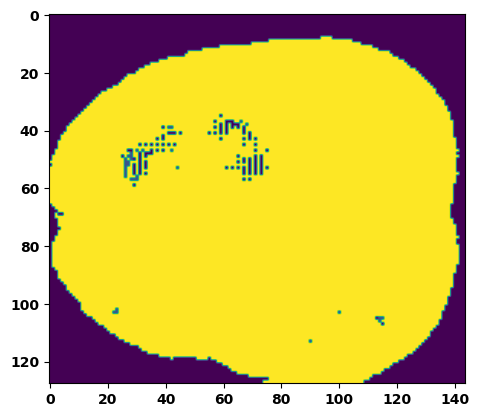

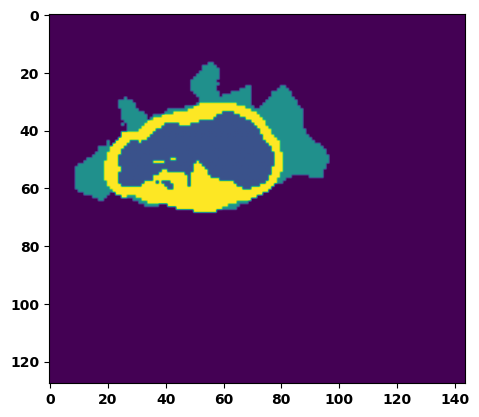

 33%|███▎      | 12/36 [00:12<00:25,  1.04s/it]

Batch_id:  11 Eval loss:  0.43395674228668213
Batch_id:  11 Eval IoU:  tensor(0.4510, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9790, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.02s/it]

Batch_id:  12 Eval loss:  0.7617186903953552
Batch_id:  12 Eval IoU:  tensor(0.2248, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8977, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.06s/it]

Batch_id:  13 Eval loss:  0.03263729810714722
Batch_id:  13 Eval IoU:  tensor(0.9400, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.26095521450042725
Batch_id:  14 Eval IoU:  tensor(0.6698, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.06s/it]

Batch_id:  15 Eval loss:  0.21636947989463806
Batch_id:  15 Eval IoU:  tensor(0.6658, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9758, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.7517684698104858
Batch_id:  16 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.10s/it]

Batch_id:  17 Eval loss:  0.7571138739585876
Batch_id:  17 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.43225815892219543
Batch_id:  18 Eval IoU:  tensor(0.4371, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9173, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8994, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.3331921100616455
Batch_id:  19 Eval IoU:  tensor(0.5459, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  20 Eval loss:  0.5221920609474182
Batch_id:  20 Eval IoU:  tensor(0.4050, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8734, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9624, device='cuda:0')


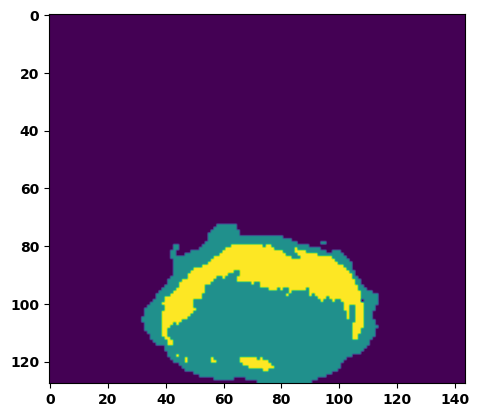

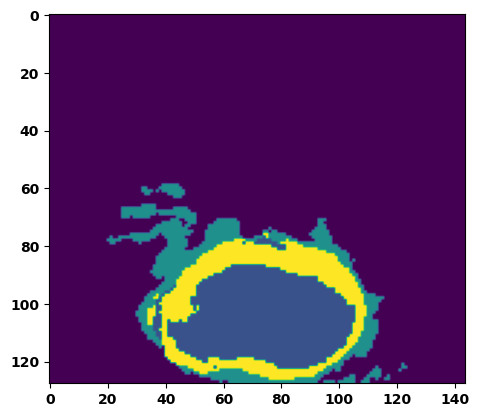

 61%|██████    | 22/36 [00:23<00:14,  1.07s/it]

Batch_id:  21 Eval loss:  0.759874701499939
Batch_id:  21 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8834, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9723, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.04s/it]

Batch_id:  22 Eval loss:  0.655292809009552
Batch_id:  22 Eval IoU:  tensor(0.2750, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8368, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9004, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.03s/it]

Batch_id:  23 Eval loss:  0.8455796241760254
Batch_id:  23 Eval IoU:  tensor(0.1102, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7178, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4414, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9388, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.5637, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.03s/it]

Batch_id:  24 Eval loss:  0.7659971714019775
Batch_id:  24 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.43542784452438354
Batch_id:  25 Eval IoU:  tensor(0.4481, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.06s/it]

Batch_id:  26 Eval loss:  0.6642255187034607
Batch_id:  26 Eval IoU:  tensor(0.2181, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6822, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4743, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.3989, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9326, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.08s/it]

Batch_id:  27 Eval loss:  0.10645955801010132
Batch_id:  27 Eval IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9972, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.08s/it]

Batch_id:  28 Eval loss:  0.7535082101821899
Batch_id:  28 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.09s/it]

Batch_id:  29 Eval loss:  0.2211976796388626
Batch_id:  29 Eval IoU:  tensor(0.6919, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  30 Eval loss:  0.8078616857528687
Batch_id:  30 Eval IoU:  tensor(0.1137, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6431, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3828, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.3284, device='cuda:0')


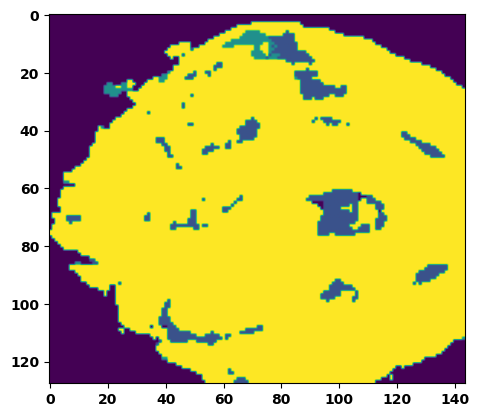

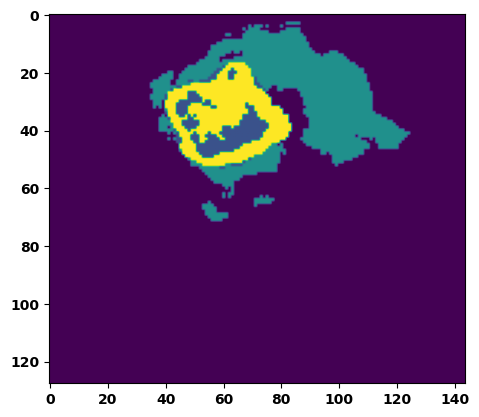

 89%|████████▉ | 32/36 [00:34<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.7572428584098816
Batch_id:  31 Eval IoU:  tensor(0.2168, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8813, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8581, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8274, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.09s/it]

Batch_id:  32 Eval loss:  0.7633724212646484
Batch_id:  32 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.11s/it]

Batch_id:  33 Eval loss:  0.4168943166732788
Batch_id:  33 Eval IoU:  tensor(0.5000, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8624, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7270, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7263, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.08s/it]

Batch_id:  34 Eval loss:  0.8162870407104492
Batch_id:  34 Eval IoU:  tensor(0.1202, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6877, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4990, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8764, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.3860, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.7425068020820618
Batch_id:  35 Eval IoU:  tensor(0.1716, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6799, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3921, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8909, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.4804, device='cuda:0')
Epoch  23 Training loss:  0.14910696961662986
Epoch  23 Evaluation loss:  0.6069221931199232
Epoch  23 Training accuracy :  tensor(0.7813)
Epoch  23 Evaluation accuracy :  tensor(0.3315)
Epoch  23 Training Mean Dice Score:  tensor(0.9879)
Epoch  23 Eval Mean Dice Score:  tensor(0.8613)
Epoch  23 Training Non-tumor Dice Score:  tensor(0.9845)
Epoch  23 Eval Non-tumor Dice Score:  tensor(0.7646)
Epoch  23 Training NCR/NET Dice Score:  tensor(0.9925)
Epoch  23 Eval NCR/NET Dice Score:  tensor(0.9664)
Epoch  23 Training ED Dice Score:  tensor(0.98

Epoch: 24
Training in session: 


  1%|          | 1/110 [00:01<02:20,  1.29s/it]

Batch_id:  0 Training loss:  0.08837632834911346
Batch_id:  0 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:04,  1.15s/it]

Batch_id:  1 Training loss:  0.08145222067832947
Batch_id:  1 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.11s/it]

Batch_id:  2 Training loss:  0.13583946228027344
Batch_id:  2 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:03,  1.17s/it]

Batch_id:  3 Training loss:  0.2660902440547943
Batch_id:  3 Training IoU:  tensor(0.6115, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


  5%|▍         | 5/110 [00:05<02:02,  1.17s/it]

Batch_id:  4 Training loss:  0.2244795709848404
Batch_id:  4 Training IoU:  tensor(0.6602, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  5%|▌         | 6/110 [00:07<02:01,  1.17s/it]

Batch_id:  5 Training loss:  0.08438663184642792
Batch_id:  5 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


  6%|▋         | 7/110 [00:08<01:58,  1.15s/it]

Batch_id:  6 Training loss:  0.18496173620224
Batch_id:  6 Training IoU:  tensor(0.7175, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.2444305121898651
Batch_id:  7 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:53,  1.12s/it]

Batch_id:  8 Training loss:  0.22317008674144745
Batch_id:  8 Training IoU:  tensor(0.6646, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:51,  1.12s/it]

Batch_id:  9 Training loss:  0.15095116198062897
Batch_id:  9 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.13s/it]

Batch_id:  10 Training loss:  0.3355823755264282
Batch_id:  10 Training IoU:  tensor(0.6080, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.056487128138542175
Batch_id:  11 Training IoU:  tensor(0.9222, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.12174069881439209
Batch_id:  12 Training IoU:  tensor(0.7973, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.08492685854434967
Batch_id:  13 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:47,  1.14s/it]

Batch_id:  14 Training loss:  0.35911208391189575
Batch_id:  14 Training IoU:  tensor(0.5889, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:47,  1.14s/it]

Batch_id:  15 Training loss:  0.26707711815834045
Batch_id:  15 Training IoU:  tensor(0.6702, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:45,  1.14s/it]

Batch_id:  16 Training loss:  0.06929415464401245
Batch_id:  16 Training IoU:  tensor(0.8773, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:46,  1.15s/it]

Batch_id:  17 Training loss:  0.1566121131181717
Batch_id:  17 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:42,  1.13s/it]

Batch_id:  18 Training loss:  0.08345481753349304
Batch_id:  18 Training IoU:  tensor(0.8551, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:40,  1.12s/it]

Batch_id:  19 Training loss:  0.1087636798620224
Batch_id:  19 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:39,  1.11s/it]

Batch_id:  20 Training loss:  0.11592230200767517
Batch_id:  20 Training IoU:  tensor(0.8148, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 20%|██        | 22/110 [00:25<01:40,  1.14s/it]

Batch_id:  21 Training loss:  0.05373553931713104
Batch_id:  21 Training IoU:  tensor(0.9068, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 21%|██        | 23/110 [00:26<01:39,  1.14s/it]

Batch_id:  22 Training loss:  0.14637187123298645
Batch_id:  22 Training IoU:  tensor(0.8286, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:37,  1.14s/it]

Batch_id:  23 Training loss:  0.1450813114643097
Batch_id:  23 Training IoU:  tensor(0.7759, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:34,  1.11s/it]

Batch_id:  24 Training loss:  0.13928855955600739
Batch_id:  24 Training IoU:  tensor(0.7959, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:36,  1.15s/it]

Batch_id:  25 Training loss:  0.0481448620557785
Batch_id:  25 Training IoU:  tensor(0.9149, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:33,  1.12s/it]

Batch_id:  26 Training loss:  0.15911030769348145
Batch_id:  26 Training IoU:  tensor(0.7670, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.11s/it]

Batch_id:  27 Training loss:  0.22307109832763672
Batch_id:  27 Training IoU:  tensor(0.6755, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.10s/it]

Batch_id:  28 Training loss:  0.12182220816612244
Batch_id:  28 Training IoU:  tensor(0.8096, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:26,  1.09s/it]

Batch_id:  29 Training loss:  0.09088397026062012
Batch_id:  29 Training IoU:  tensor(0.8457, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:26,  1.10s/it]

Batch_id:  30 Training loss:  0.33904609084129333
Batch_id:  30 Training IoU:  tensor(0.6249, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9997, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.1420356184244156
Batch_id:  31 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 30%|███       | 33/110 [00:37<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.05612310767173767
Batch_id:  32 Training IoU:  tensor(0.9058, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 31%|███       | 34/110 [00:38<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.1991969496011734
Batch_id:  33 Training IoU:  tensor(0.6953, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:21,  1.09s/it]

Batch_id:  34 Training loss:  0.14441372454166412
Batch_id:  34 Training IoU:  tensor(0.7646, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:22,  1.11s/it]

Batch_id:  35 Training loss:  0.11214679479598999
Batch_id:  35 Training IoU:  tensor(0.8363, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:20,  1.10s/it]

Batch_id:  36 Training loss:  0.07418923079967499
Batch_id:  36 Training IoU:  tensor(0.8715, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:18,  1.09s/it]

Batch_id:  37 Training loss:  0.15086384117603302
Batch_id:  37 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.18494820594787598
Batch_id:  38 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.20669600367546082
Batch_id:  39 Training IoU:  tensor(0.6908, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:14,  1.09s/it]

Batch_id:  40 Training loss:  0.09201686084270477
Batch_id:  40 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.10s/it]

Batch_id:  41 Training loss:  0.10306547582149506
Batch_id:  41 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.07491074502468109
Batch_id:  42 Training IoU:  tensor(0.8776, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 40%|████      | 44/110 [00:49<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.10380221903324127
Batch_id:  43 Training IoU:  tensor(0.8209, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 41%|████      | 45/110 [00:50<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.49599921703338623
Batch_id:  44 Training IoU:  tensor(0.4328, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.18595461547374725
Batch_id:  45 Training IoU:  tensor(0.7074, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.09364362061023712
Batch_id:  46 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:09,  1.12s/it]

Batch_id:  47 Training loss:  0.06142038106918335
Batch_id:  47 Training IoU:  tensor(0.8936, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:06,  1.10s/it]

Batch_id:  48 Training loss:  0.12381555140018463
Batch_id:  48 Training IoU:  tensor(0.7900, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:06,  1.11s/it]

Batch_id:  49 Training loss:  0.15145473182201385
Batch_id:  49 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.11368957161903381
Batch_id:  50 Training IoU:  tensor(0.8114, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:06,  1.15s/it]

Batch_id:  51 Training loss:  0.07289813458919525
Batch_id:  51 Training IoU:  tensor(0.8756, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:06,  1.16s/it]

Batch_id:  52 Training loss:  0.10477118194103241
Batch_id:  52 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:05,  1.17s/it]

Batch_id:  53 Training loss:  0.05333305895328522
Batch_id:  53 Training IoU:  tensor(0.9068, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:03,  1.15s/it]

Batch_id:  54 Training loss:  0.0751747339963913
Batch_id:  54 Training IoU:  tensor(0.8785, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 51%|█████     | 56/110 [01:02<01:00,  1.13s/it]

Batch_id:  55 Training loss:  0.1824950873851776
Batch_id:  55 Training IoU:  tensor(0.7083, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9775, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<01:02,  1.17s/it]

Batch_id:  56 Training loss:  0.20888552069664001
Batch_id:  56 Training IoU:  tensor(0.7069, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 53%|█████▎    | 58/110 [01:05<01:00,  1.17s/it]

Batch_id:  57 Training loss:  0.12563666701316833
Batch_id:  57 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 54%|█████▎    | 59/110 [01:06<00:58,  1.14s/it]

Batch_id:  58 Training loss:  0.0915309339761734
Batch_id:  58 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 55%|█████▍    | 60/110 [01:07<00:58,  1.16s/it]

Batch_id:  59 Training loss:  0.14078116416931152
Batch_id:  59 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 55%|█████▌    | 61/110 [01:08<00:56,  1.15s/it]

Batch_id:  60 Training loss:  0.201079860329628
Batch_id:  60 Training IoU:  tensor(0.7364, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:54,  1.13s/it]

Batch_id:  61 Training loss:  0.12971939146518707
Batch_id:  61 Training IoU:  tensor(0.7979, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:54,  1.16s/it]

Batch_id:  62 Training loss:  0.22245758771896362
Batch_id:  62 Training IoU:  tensor(0.7121, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 58%|█████▊    | 64/110 [01:12<00:53,  1.17s/it]

Batch_id:  63 Training loss:  0.3895612955093384
Batch_id:  63 Training IoU:  tensor(0.5199, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 59%|█████▉    | 65/110 [01:13<00:52,  1.16s/it]

Batch_id:  64 Training loss:  0.05357466638088226
Batch_id:  64 Training IoU:  tensor(0.9123, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 60%|██████    | 66/110 [01:14<00:50,  1.16s/it]

Batch_id:  65 Training loss:  0.17550387978553772
Batch_id:  65 Training IoU:  tensor(0.7681, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 61%|██████    | 67/110 [01:15<00:49,  1.16s/it]

Batch_id:  66 Training loss:  0.212416410446167
Batch_id:  66 Training IoU:  tensor(0.7014, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 62%|██████▏   | 68/110 [01:16<00:48,  1.15s/it]

Batch_id:  67 Training loss:  0.07088539004325867
Batch_id:  67 Training IoU:  tensor(0.8770, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 63%|██████▎   | 69/110 [01:17<00:47,  1.15s/it]

Batch_id:  68 Training loss:  0.15244197845458984
Batch_id:  68 Training IoU:  tensor(0.7550, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 64%|██████▎   | 70/110 [01:18<00:44,  1.11s/it]

Batch_id:  69 Training loss:  0.06211484968662262
Batch_id:  69 Training IoU:  tensor(0.8935, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:42,  1.10s/it]

Batch_id:  70 Training loss:  0.16082152724266052
Batch_id:  70 Training IoU:  tensor(0.7503, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:41,  1.08s/it]

Batch_id:  71 Training loss:  0.3348049521446228
Batch_id:  71 Training IoU:  tensor(0.6314, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 66%|██████▋   | 73/110 [01:22<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.26015734672546387
Batch_id:  72 Training IoU:  tensor(0.6589, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 67%|██████▋   | 74/110 [01:23<00:40,  1.11s/it]

Batch_id:  73 Training loss:  0.16850852966308594
Batch_id:  73 Training IoU:  tensor(0.7412, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 68%|██████▊   | 75/110 [01:24<00:39,  1.13s/it]

Batch_id:  74 Training loss:  0.2588122487068176
Batch_id:  74 Training IoU:  tensor(0.6556, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 69%|██████▉   | 76/110 [01:25<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.22383315861225128
Batch_id:  75 Training IoU:  tensor(0.6618, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9717, device='cuda:0')


 70%|███████   | 77/110 [01:26<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.08724208176136017
Batch_id:  76 Training IoU:  tensor(0.8498, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 71%|███████   | 78/110 [01:27<00:34,  1.09s/it]

Batch_id:  77 Training loss:  0.09940682351589203
Batch_id:  77 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 72%|███████▏  | 79/110 [01:28<00:33,  1.09s/it]

Batch_id:  78 Training loss:  0.1642550826072693
Batch_id:  78 Training IoU:  tensor(0.7384, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 73%|███████▎  | 80/110 [01:29<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.15047302842140198
Batch_id:  79 Training IoU:  tensor(0.7670, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.16803498566150665
Batch_id:  80 Training IoU:  tensor(0.7368, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:30,  1.08s/it]

Batch_id:  81 Training loss:  0.11589272320270538
Batch_id:  81 Training IoU:  tensor(0.8248, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:29,  1.08s/it]

Batch_id:  82 Training loss:  0.09233815968036652
Batch_id:  82 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 76%|███████▋  | 84/110 [01:34<00:27,  1.07s/it]

Batch_id:  83 Training loss:  0.21565406024456024
Batch_id:  83 Training IoU:  tensor(0.6830, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 77%|███████▋  | 85/110 [01:35<00:26,  1.07s/it]

Batch_id:  84 Training loss:  0.0845271646976471
Batch_id:  84 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 78%|███████▊  | 86/110 [01:36<00:25,  1.06s/it]

Batch_id:  85 Training loss:  0.06337347626686096
Batch_id:  85 Training IoU:  tensor(0.8899, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 79%|███████▉  | 87/110 [01:37<00:24,  1.06s/it]

Batch_id:  86 Training loss:  0.3788268268108368
Batch_id:  86 Training IoU:  tensor(0.5064, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 80%|████████  | 88/110 [01:38<00:23,  1.06s/it]

Batch_id:  87 Training loss:  0.12061150372028351
Batch_id:  87 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 81%|████████  | 89/110 [01:39<00:22,  1.08s/it]

Batch_id:  88 Training loss:  0.07391701638698578
Batch_id:  88 Training IoU:  tensor(0.8764, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:21,  1.10s/it]

Batch_id:  89 Training loss:  0.06085047125816345
Batch_id:  89 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:20,  1.10s/it]

Batch_id:  90 Training loss:  0.12660101056098938
Batch_id:  90 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.06841519474983215
Batch_id:  91 Training IoU:  tensor(0.8845, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.15014304220676422
Batch_id:  92 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 85%|████████▌ | 94/110 [01:45<00:18,  1.14s/it]

Batch_id:  93 Training loss:  0.08240500092506409
Batch_id:  93 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 86%|████████▋ | 95/110 [01:46<00:16,  1.13s/it]

Batch_id:  94 Training loss:  0.1341237723827362
Batch_id:  94 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 87%|████████▋ | 96/110 [01:47<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.11944924294948578
Batch_id:  95 Training IoU:  tensor(0.8007, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 88%|████████▊ | 97/110 [01:48<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.12991401553153992
Batch_id:  96 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 89%|████████▉ | 98/110 [01:49<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.07788331806659698
Batch_id:  97 Training IoU:  tensor(0.8760, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 90%|█████████ | 99/110 [01:50<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.0653628259897232
Batch_id:  98 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 91%|█████████ | 100/110 [01:51<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.14117348194122314
Batch_id:  99 Training IoU:  tensor(0.7926, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 92%|█████████▏| 101/110 [01:52<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.0684652179479599
Batch_id:  100 Training IoU:  tensor(0.8835, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.07771572470664978
Batch_id:  101 Training IoU:  tensor(0.8629, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.09s/it]

Batch_id:  102 Training loss:  0.1092950850725174
Batch_id:  102 Training IoU:  tensor(0.8271, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.44864559173583984
Batch_id:  103 Training IoU:  tensor(0.4771, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.14611612260341644
Batch_id:  104 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.07s/it]

Batch_id:  105 Training loss:  0.08637858927249908
Batch_id:  105 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 97%|█████████▋| 107/110 [01:59<00:03,  1.08s/it]

Batch_id:  106 Training loss:  0.08149811625480652
Batch_id:  106 Training IoU:  tensor(0.8584, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 98%|█████████▊| 108/110 [02:00<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.21179631352424622
Batch_id:  107 Training IoU:  tensor(0.7376, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 99%|█████████▉| 109/110 [02:01<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.09157593548297882
Batch_id:  108 Training IoU:  tensor(0.8462, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


100%|██████████| 110/110 [02:02<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.06489342451095581
Batch_id:  109 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9930, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.776803731918335
Batch_id:  0 Eval IoU:  tensor(0.1917, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8643, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7599, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8857, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


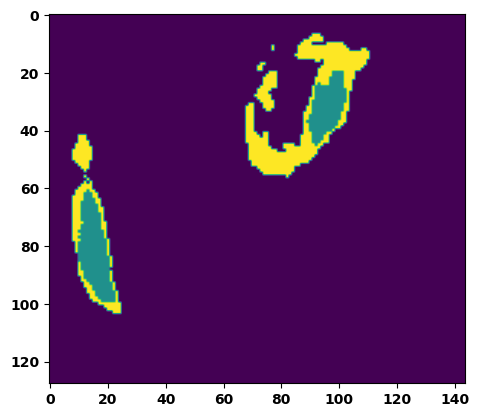

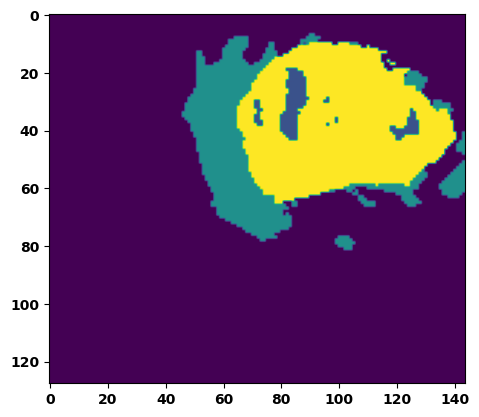

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.8823342323303223
Batch_id:  1 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.6220, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4181, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2439, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.04s/it]

Batch_id:  2 Eval loss:  0.7756963968276978
Batch_id:  2 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.07s/it]

Batch_id:  3 Eval loss:  0.06751582026481628
Batch_id:  3 Eval IoU:  tensor(0.8828, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.06s/it]

Batch_id:  4 Eval loss:  0.8118969798088074
Batch_id:  4 Eval IoU:  tensor(0.1508, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8016, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.6033, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7472, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.7625542879104614
Batch_id:  5 Eval IoU:  tensor(0.1472, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6524, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3878, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3070, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.09s/it]

Batch_id:  6 Eval loss:  0.7571092247962952
Batch_id:  6 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.07s/it]

Batch_id:  7 Eval loss:  0.655165433883667
Batch_id:  7 Eval IoU:  tensor(0.2408, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6336, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3160, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.5147, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.7355, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.10s/it]

Batch_id:  8 Eval loss:  0.7653648853302002
Batch_id:  8 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:29,  1.13s/it]

Batch_id:  9 Eval loss:  0.4688122272491455
Batch_id:  9 Eval IoU:  tensor(0.4162, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8506, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7173, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.7394, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  10 Eval loss:  0.7417114973068237
Batch_id:  10 Eval IoU:  tensor(0.2375, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


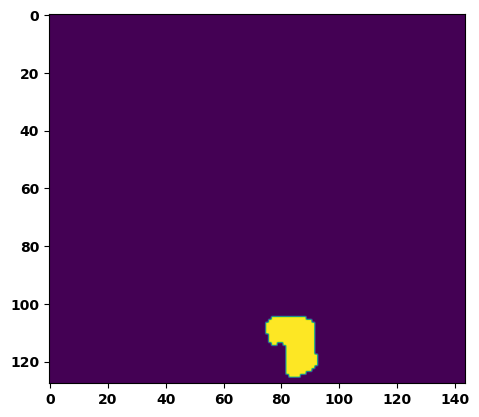

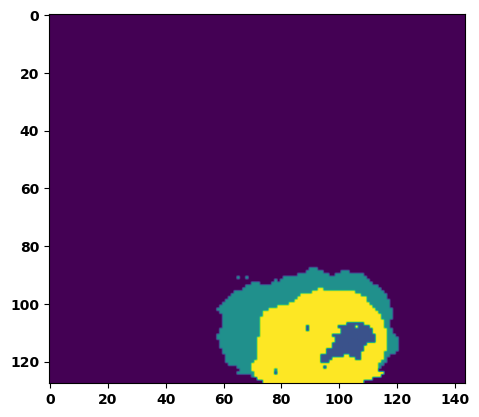

 33%|███▎      | 12/36 [00:13<00:26,  1.11s/it]

Batch_id:  11 Eval loss:  0.725083589553833
Batch_id:  11 Eval IoU:  tensor(0.2512, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:26,  1.13s/it]

Batch_id:  12 Eval loss:  0.6355876922607422
Batch_id:  12 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6999, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4479, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.4702, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:25,  1.14s/it]

Batch_id:  13 Eval loss:  0.7640959024429321
Batch_id:  13 Eval IoU:  tensor(0.2197, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8741, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.13s/it]

Batch_id:  14 Eval loss:  0.7573878765106201
Batch_id:  14 Eval IoU:  tensor(0.2302, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.12s/it]

Batch_id:  15 Eval loss:  0.21929094195365906
Batch_id:  15 Eval IoU:  tensor(0.6956, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9943, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.7660082578659058
Batch_id:  16 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:20,  1.12s/it]

Batch_id:  17 Eval loss:  0.19557467103004456
Batch_id:  17 Eval IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9850, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.7619848847389221
Batch_id:  18 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8862, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.7005670070648193
Batch_id:  19 Eval IoU:  tensor(0.2411, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8660, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7995, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.7343, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  20 Eval loss:  0.4008813202381134
Batch_id:  20 Eval IoU:  tensor(0.5094, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8939, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9702, device='cuda:0')


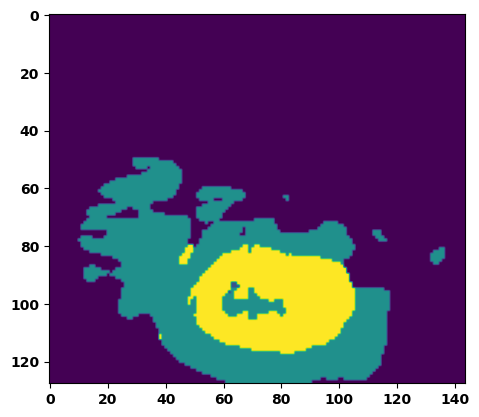

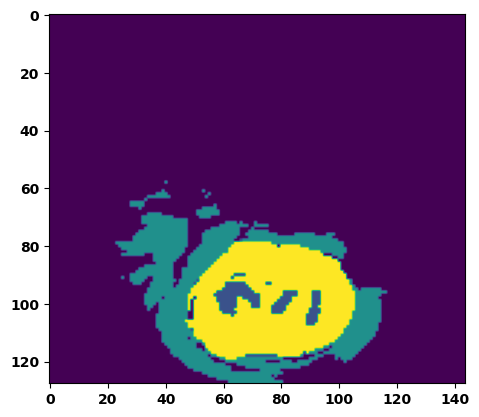

 61%|██████    | 22/36 [00:24<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.6429968476295471
Batch_id:  21 Eval IoU:  tensor(0.3106, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.10s/it]

Batch_id:  22 Eval loss:  0.6228291988372803
Batch_id:  22 Eval IoU:  tensor(0.3219, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9052, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8896, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8167, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.7562391757965088
Batch_id:  23 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.7634068727493286
Batch_id:  24 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.06s/it]

Batch_id:  25 Eval loss:  0.7517525553703308
Batch_id:  25 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.07s/it]

Batch_id:  26 Eval loss:  0.7535582780838013
Batch_id:  26 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.7281888127326965
Batch_id:  27 Eval IoU:  tensor(0.2524, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8109, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.556636393070221
Batch_id:  28 Eval IoU:  tensor(0.3286, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7360, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4815, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.5126, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9888, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.11s/it]

Batch_id:  29 Eval loss:  0.7964435815811157
Batch_id:  29 Eval IoU:  tensor(0.1386, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7096, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5520, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.8526, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.5122, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9218, device='cuda:0')
Batch_id:  30 Eval loss:  0.6930512189865112
Batch_id:  30 Eval IoU:  tensor(0.1977, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7281, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.5075, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.6716, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.7525, device='cuda:0')


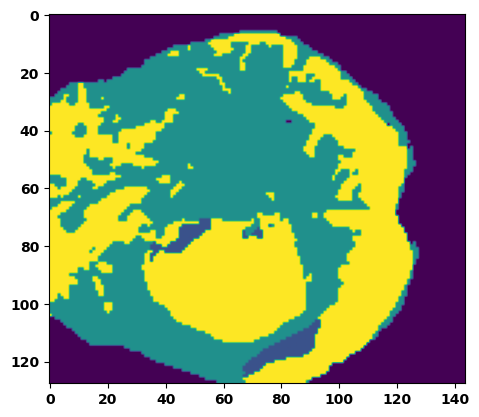

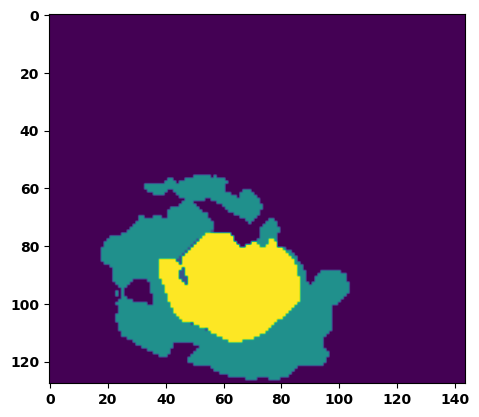

 89%|████████▉ | 32/36 [00:35<00:04,  1.14s/it]

Batch_id:  31 Eval loss:  0.7680240273475647
Batch_id:  31 Eval IoU:  tensor(0.2118, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8406, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.11s/it]

Batch_id:  32 Eval loss:  0.37334930896759033
Batch_id:  32 Eval IoU:  tensor(0.5532, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9877, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.08s/it]

Batch_id:  33 Eval loss:  0.7637256383895874
Batch_id:  33 Eval IoU:  tensor(0.2236, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8945, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.13s/it]

Batch_id:  34 Eval loss:  0.7691302299499512
Batch_id:  34 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.10s/it]

Batch_id:  35 Eval loss:  0.7467360496520996
Batch_id:  35 Eval IoU:  tensor(0.1670, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7356, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.5220, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.4871, device='cuda:0')
Epoch 00025: reducing learning rate of group 0 to 6.2500e-05.
Epoch  24 Training loss:  0.14790461415594275
Epoch  24 Evaluation loss:  0.6632637514008416
Epoch  24 Training accuracy :  tensor(0.7824)
Epoch  24 Evaluation accuracy :  tensor(0.2888)
Epoch  24 Training Mean Dice Score:  tensor(0.9879)
Epoch  24 Eval Mean Dice Score:  tensor(0.8827)
Epoch  24 Training Non-tumor Dice Score:  tensor(0.9846)
Epoch  24 Eval Non-tumor Dice Score:  tensor(0.7965)
Epoch  24 Training NCR/NET Dice Score:  tensor(0.9926)
Epoch  24 Eval NCR/NET Dice Score: 

Epoch: 25
Training in session: 


  1%|          | 1/110 [00:01<02:20,  1.29s/it]

Batch_id:  0 Training loss:  0.33465510606765747
Batch_id:  0 Training IoU:  tensor(0.6288, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:07,  1.18s/it]

Batch_id:  1 Training loss:  0.14102967083454132
Batch_id:  1 Training IoU:  tensor(0.7686, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.12s/it]

Batch_id:  2 Training loss:  0.09756115078926086
Batch_id:  2 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:57,  1.10s/it]

Batch_id:  3 Training loss:  0.09272760152816772
Batch_id:  3 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:54,  1.09s/it]

Batch_id:  4 Training loss:  0.11632610857486725
Batch_id:  4 Training IoU:  tensor(0.8049, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.11657930910587311
Batch_id:  5 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.14154118299484253
Batch_id:  6 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.061312928795814514
Batch_id:  7 Training IoU:  tensor(0.8934, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:52,  1.11s/it]

Batch_id:  8 Training loss:  0.09775201976299286
Batch_id:  8 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:51,  1.12s/it]

Batch_id:  9 Training loss:  0.17625723779201508
Batch_id:  9 Training IoU:  tensor(0.7673, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.12s/it]

Batch_id:  10 Training loss:  0.13578622043132782
Batch_id:  10 Training IoU:  tensor(0.7969, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.10s/it]

Batch_id:  11 Training loss:  0.08476623892784119
Batch_id:  11 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.11s/it]

Batch_id:  12 Training loss:  0.18369366228580475
Batch_id:  12 Training IoU:  tensor(0.7312, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.11s/it]

Batch_id:  13 Training loss:  0.32987135648727417
Batch_id:  13 Training IoU:  tensor(0.6437, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:43,  1.09s/it]

Batch_id:  14 Training loss:  0.06340226531028748
Batch_id:  14 Training IoU:  tensor(0.8887, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.10493828356266022
Batch_id:  15 Training IoU:  tensor(0.8336, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.1659325361251831
Batch_id:  16 Training IoU:  tensor(0.7347, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:41,  1.11s/it]

Batch_id:  17 Training loss:  0.35541650652885437
Batch_id:  17 Training IoU:  tensor(0.5899, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:41,  1.11s/it]

Batch_id:  18 Training loss:  0.08241194486618042
Batch_id:  18 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:40,  1.11s/it]

Batch_id:  19 Training loss:  0.07952846586704254
Batch_id:  19 Training IoU:  tensor(0.8603, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:38,  1.11s/it]

Batch_id:  20 Training loss:  0.0862419456243515
Batch_id:  20 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 20%|██        | 22/110 [00:24<01:38,  1.12s/it]

Batch_id:  21 Training loss:  0.24099618196487427
Batch_id:  21 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 21%|██        | 23/110 [00:25<01:43,  1.19s/it]

Batch_id:  22 Training loss:  0.14051657915115356
Batch_id:  22 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:39,  1.15s/it]

Batch_id:  23 Training loss:  0.15863144397735596
Batch_id:  23 Training IoU:  tensor(0.7525, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:36,  1.14s/it]

Batch_id:  24 Training loss:  0.21720874309539795
Batch_id:  24 Training IoU:  tensor(0.6690, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.08539313077926636
Batch_id:  25 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:33,  1.12s/it]

Batch_id:  26 Training loss:  0.15203316509723663
Batch_id:  26 Training IoU:  tensor(0.7557, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.11s/it]

Batch_id:  27 Training loss:  0.11422106623649597
Batch_id:  27 Training IoU:  tensor(0.8201, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.10s/it]

Batch_id:  28 Training loss:  0.08132791519165039
Batch_id:  28 Training IoU:  tensor(0.8582, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:28,  1.10s/it]

Batch_id:  29 Training loss:  0.09023270010948181
Batch_id:  29 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:26,  1.10s/it]

Batch_id:  30 Training loss:  0.08771833777427673
Batch_id:  30 Training IoU:  tensor(0.8485, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:25,  1.09s/it]

Batch_id:  31 Training loss:  0.09071740508079529
Batch_id:  31 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.07748579978942871
Batch_id:  32 Training IoU:  tensor(0.8655, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 31%|███       | 34/110 [00:37<01:24,  1.11s/it]

Batch_id:  33 Training loss:  0.08206796646118164
Batch_id:  33 Training IoU:  tensor(0.8568, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:23,  1.11s/it]

Batch_id:  34 Training loss:  0.27048802375793457
Batch_id:  34 Training IoU:  tensor(0.6074, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:20,  1.08s/it]

Batch_id:  35 Training loss:  0.2257157266139984
Batch_id:  35 Training IoU:  tensor(0.7016, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:17,  1.06s/it]

Batch_id:  36 Training loss:  0.10871246457099915
Batch_id:  36 Training IoU:  tensor(0.8327, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.33423101902008057
Batch_id:  37 Training IoU:  tensor(0.6094, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:14,  1.05s/it]

Batch_id:  38 Training loss:  0.42290568351745605
Batch_id:  38 Training IoU:  tensor(0.5000, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:15,  1.07s/it]

Batch_id:  39 Training loss:  0.1331641525030136
Batch_id:  39 Training IoU:  tensor(0.8598, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:14,  1.09s/it]

Batch_id:  40 Training loss:  0.05513140559196472
Batch_id:  40 Training IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.21444015204906464
Batch_id:  41 Training IoU:  tensor(0.6861, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.2234307825565338
Batch_id:  42 Training IoU:  tensor(0.7135, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.09s/it]

Batch_id:  43 Training loss:  0.15132232010364532
Batch_id:  43 Training IoU:  tensor(0.7630, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 41%|████      | 45/110 [00:49<01:11,  1.10s/it]

Batch_id:  44 Training loss:  0.061980485916137695
Batch_id:  44 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:10,  1.10s/it]

Batch_id:  45 Training loss:  0.4901552200317383
Batch_id:  45 Training IoU:  tensor(0.4394, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.18575341999530792
Batch_id:  46 Training IoU:  tensor(0.7145, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.0753231942653656
Batch_id:  47 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:07,  1.11s/it]

Batch_id:  48 Training loss:  0.136585995554924
Batch_id:  48 Training IoU:  tensor(0.7888, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:06,  1.11s/it]

Batch_id:  49 Training loss:  0.21084199845790863
Batch_id:  49 Training IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.10886184871196747
Batch_id:  50 Training IoU:  tensor(0.8407, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:04,  1.11s/it]

Batch_id:  51 Training loss:  0.25943702459335327
Batch_id:  51 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.15370355546474457
Batch_id:  52 Training IoU:  tensor(0.7551, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.07s/it]

Batch_id:  53 Training loss:  0.18425334990024567
Batch_id:  53 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.1637219339609146
Batch_id:  54 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 51%|█████     | 56/110 [01:01<01:00,  1.12s/it]

Batch_id:  55 Training loss:  0.12675079703330994
Batch_id:  55 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:59,  1.12s/it]

Batch_id:  56 Training loss:  0.13974426686763763
Batch_id:  56 Training IoU:  tensor(0.7693, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.09033483266830444
Batch_id:  57 Training IoU:  tensor(0.8430, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:56,  1.11s/it]

Batch_id:  58 Training loss:  0.07700935006141663
Batch_id:  58 Training IoU:  tensor(0.8821, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:55,  1.10s/it]

Batch_id:  59 Training loss:  0.2143469899892807
Batch_id:  59 Training IoU:  tensor(0.6733, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.11906366050243378
Batch_id:  60 Training IoU:  tensor(0.8021, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.05324660241603851
Batch_id:  61 Training IoU:  tensor(0.9257, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:52,  1.12s/it]

Batch_id:  62 Training loss:  0.26142802834510803
Batch_id:  62 Training IoU:  tensor(0.6563, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:52,  1.13s/it]

Batch_id:  63 Training loss:  0.18342594802379608
Batch_id:  63 Training IoU:  tensor(0.7174, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.15376828610897064
Batch_id:  64 Training IoU:  tensor(0.7479, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.18134111166000366
Batch_id:  65 Training IoU:  tensor(0.7190, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:45,  1.07s/it]

Batch_id:  66 Training loss:  0.07537677884101868
Batch_id:  66 Training IoU:  tensor(0.8695, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.08891500532627106
Batch_id:  67 Training IoU:  tensor(0.8548, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.06054393947124481
Batch_id:  68 Training IoU:  tensor(0.8958, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.17988422513008118
Batch_id:  69 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:41,  1.08s/it]

Batch_id:  70 Training loss:  0.07354545593261719
Batch_id:  70 Training IoU:  tensor(0.8791, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.0933225005865097
Batch_id:  71 Training IoU:  tensor(0.8501, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:40,  1.08s/it]

Batch_id:  72 Training loss:  0.19496525824069977
Batch_id:  72 Training IoU:  tensor(0.7442, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:40,  1.12s/it]

Batch_id:  73 Training loss:  0.15439867973327637
Batch_id:  73 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:40,  1.16s/it]

Batch_id:  74 Training loss:  0.062288567423820496
Batch_id:  74 Training IoU:  tensor(0.8980, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:39,  1.16s/it]

Batch_id:  75 Training loss:  0.12675698101520538
Batch_id:  75 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:38,  1.17s/it]

Batch_id:  76 Training loss:  0.09655973315238953
Batch_id:  76 Training IoU:  tensor(0.8464, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:36,  1.15s/it]

Batch_id:  77 Training loss:  0.16710853576660156
Batch_id:  77 Training IoU:  tensor(0.7484, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.1321042776107788
Batch_id:  78 Training IoU:  tensor(0.7781, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.11s/it]

Batch_id:  79 Training loss:  0.13418573141098022
Batch_id:  79 Training IoU:  tensor(0.7808, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.14s/it]

Batch_id:  80 Training loss:  0.07950013875961304
Batch_id:  80 Training IoU:  tensor(0.8642, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.13919785618782043
Batch_id:  81 Training IoU:  tensor(0.7970, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:30,  1.11s/it]

Batch_id:  82 Training loss:  0.06001567840576172
Batch_id:  82 Training IoU:  tensor(0.9017, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:28,  1.09s/it]

Batch_id:  83 Training loss:  0.23176807165145874
Batch_id:  83 Training IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.08s/it]

Batch_id:  84 Training loss:  0.09241096675395966
Batch_id:  84 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.37846487760543823
Batch_id:  85 Training IoU:  tensor(0.5335, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.1110106110572815
Batch_id:  86 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.04985673725605011
Batch_id:  87 Training IoU:  tensor(0.9132, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.11522626876831055
Batch_id:  88 Training IoU:  tensor(0.8073, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:21,  1.08s/it]

Batch_id:  89 Training loss:  0.14631807804107666
Batch_id:  89 Training IoU:  tensor(0.7754, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:20,  1.09s/it]

Batch_id:  90 Training loss:  0.3752322196960449
Batch_id:  90 Training IoU:  tensor(0.5113, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.05184870958328247
Batch_id:  91 Training IoU:  tensor(0.9087, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.10s/it]

Batch_id:  92 Training loss:  0.07388299703598022
Batch_id:  92 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.10940653085708618
Batch_id:  93 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.12s/it]

Batch_id:  94 Training loss:  0.08423754572868347
Batch_id:  94 Training IoU:  tensor(0.8537, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.11s/it]

Batch_id:  95 Training loss:  0.09569093585014343
Batch_id:  95 Training IoU:  tensor(0.8328, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.09525741636753082
Batch_id:  96 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:13,  1.11s/it]

Batch_id:  97 Training loss:  0.14429445564746857
Batch_id:  97 Training IoU:  tensor(0.7752, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.13645564019680023
Batch_id:  98 Training IoU:  tensor(0.7917, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.1477440446615219
Batch_id:  99 Training IoU:  tensor(0.7610, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.06014539301395416
Batch_id:  100 Training IoU:  tensor(0.8969, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.06291370093822479
Batch_id:  101 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.06736956536769867
Batch_id:  102 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.10s/it]

Batch_id:  103 Training loss:  0.07197794318199158
Batch_id:  103 Training IoU:  tensor(0.8785, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.12s/it]

Batch_id:  104 Training loss:  0.0464828759431839
Batch_id:  104 Training IoU:  tensor(0.9164, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.13s/it]

Batch_id:  105 Training loss:  0.20714467763900757
Batch_id:  105 Training IoU:  tensor(0.6877, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.11s/it]

Batch_id:  106 Training loss:  0.18050028383731842
Batch_id:  106 Training IoU:  tensor(0.7165, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.14942225813865662
Batch_id:  107 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.12s/it]

Batch_id:  108 Training loss:  0.060862645506858826
Batch_id:  108 Training IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.18665938079357147
Batch_id:  109 Training IoU:  tensor(0.7060, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9767, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5597372055053711
Batch_id:  0 Eval IoU:  tensor(0.3997, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


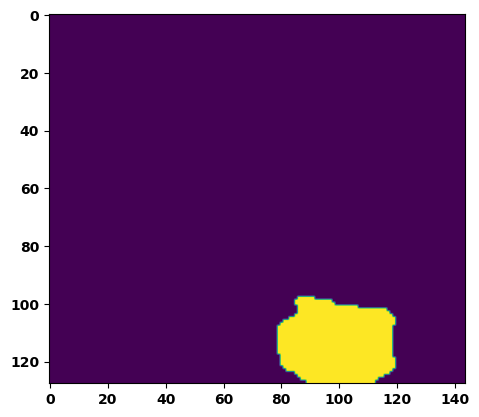

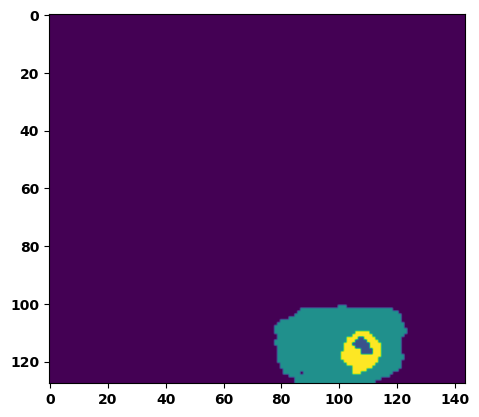

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7048704028129578
Batch_id:  1 Eval IoU:  tensor(0.2579, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9084, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.03s/it]

Batch_id:  2 Eval loss:  0.7637468576431274
Batch_id:  2 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.03s/it]

Batch_id:  3 Eval loss:  0.802283525466919
Batch_id:  3 Eval IoU:  tensor(0.1346, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7271, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4892, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.7953, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.6968, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.05s/it]

Batch_id:  4 Eval loss:  0.12998823821544647
Batch_id:  4 Eval IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.04s/it]

Batch_id:  5 Eval loss:  0.7660396099090576
Batch_id:  5 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.7653812170028687
Batch_id:  6 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.7691008448600769
Batch_id:  7 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.6459152698516846
Batch_id:  8 Eval IoU:  tensor(0.3032, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8990, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8817, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8128, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.04s/it]

Batch_id:  9 Eval loss:  0.7517820596694946
Batch_id:  9 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  10 Eval loss:  0.7076556086540222
Batch_id:  10 Eval IoU:  tensor(0.1878, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.7244, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.5096, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.7014, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.6911, device='cuda:0')


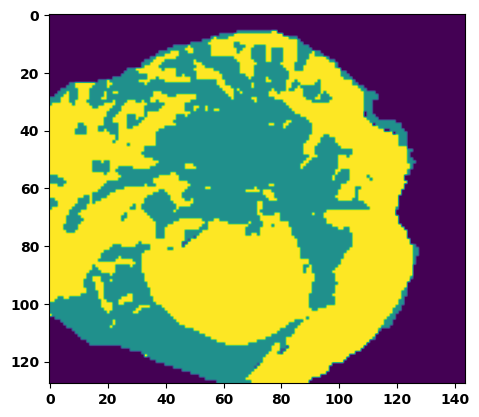

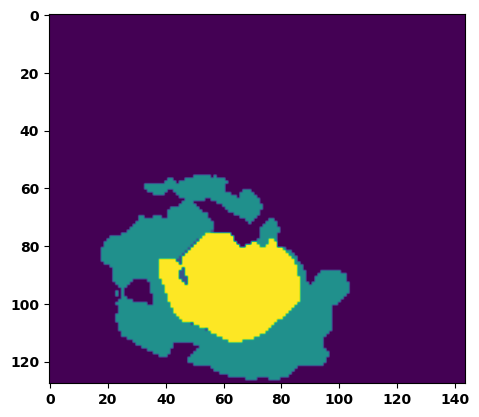

 33%|███▎      | 12/36 [00:12<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.7718105316162109
Batch_id:  11 Eval IoU:  tensor(0.2096, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8385, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.6562827229499817
Batch_id:  12 Eval IoU:  tensor(0.2433, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6364, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3296, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.4542, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.7930, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.04s/it]

Batch_id:  13 Eval loss:  0.763428270816803
Batch_id:  13 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.06s/it]

Batch_id:  14 Eval loss:  0.7571274042129517
Batch_id:  14 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:21,  1.07s/it]

Batch_id:  15 Eval loss:  0.766663134098053
Batch_id:  15 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.08s/it]

Batch_id:  16 Eval loss:  0.6801489591598511
Batch_id:  16 Eval IoU:  tensor(0.2528, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8635, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8140, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.7366, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.07s/it]

Batch_id:  17 Eval loss:  0.8821760416030884
Batch_id:  17 Eval IoU:  tensor(0.0750, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6221, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4185, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2442, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.48865604400634766
Batch_id:  18 Eval IoU:  tensor(0.3990, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8233, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6979, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.6971, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9860, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.09s/it]

Batch_id:  19 Eval loss:  0.2930280864238739
Batch_id:  19 Eval IoU:  tensor(0.6192, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  20 Eval loss:  0.8157248497009277
Batch_id:  20 Eval IoU:  tensor(0.1109, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6497, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3907, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3009, device='cuda:0')


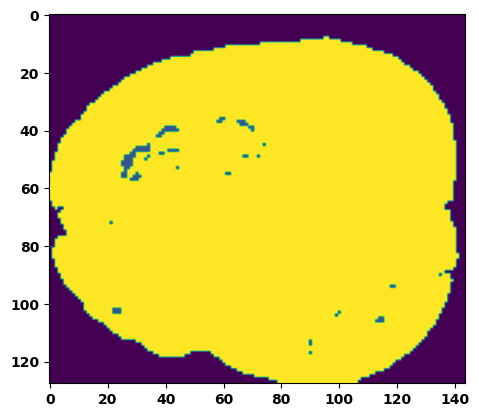

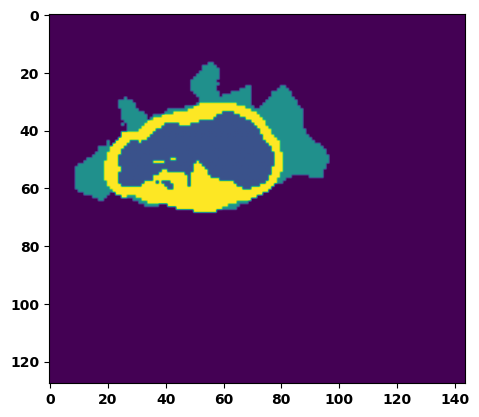

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.6122743487358093
Batch_id:  21 Eval IoU:  tensor(0.2643, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7354, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.5209, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.5347, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.06s/it]

Batch_id:  22 Eval loss:  0.2285928577184677
Batch_id:  22 Eval IoU:  tensor(0.6528, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.06s/it]

Batch_id:  23 Eval loss:  0.525268018245697
Batch_id:  23 Eval IoU:  tensor(0.3649, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7433, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4947, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.5109, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9932, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.04s/it]

Batch_id:  24 Eval loss:  0.4142987132072449
Batch_id:  24 Eval IoU:  tensor(0.4998, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9219, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8865, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9698, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.03s/it]

Batch_id:  25 Eval loss:  0.7408273220062256
Batch_id:  25 Eval IoU:  tensor(0.2391, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.04s/it]

Batch_id:  26 Eval loss:  0.6513781547546387
Batch_id:  26 Eval IoU:  tensor(0.2903, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8928, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8638, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.7563091516494751
Batch_id:  27 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.04s/it]

Batch_id:  28 Eval loss:  0.7223226428031921
Batch_id:  28 Eval IoU:  tensor(0.1889, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7619, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.5734, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.5424, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.5609722137451172
Batch_id:  29 Eval IoU:  tensor(0.3983, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Eval loss:  0.7757281064987183
Batch_id:  30 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


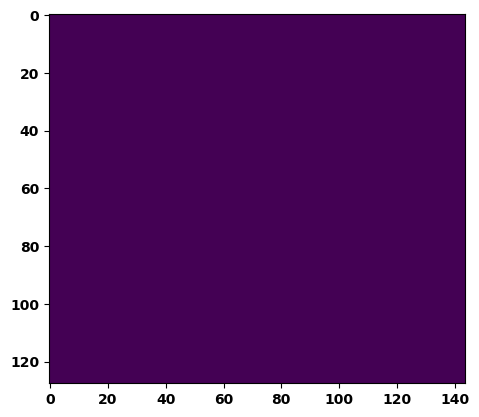

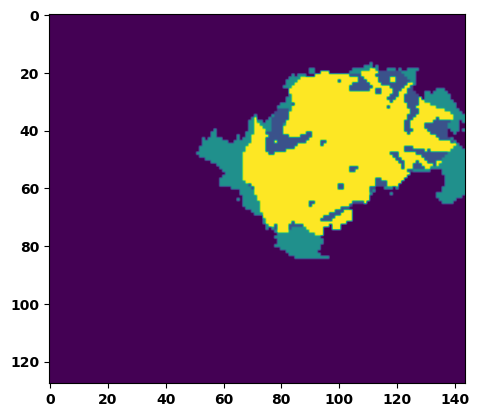

 89%|████████▉ | 32/36 [00:34<00:04,  1.13s/it]

Batch_id:  31 Eval loss:  0.7842892408370972
Batch_id:  31 Eval IoU:  tensor(0.1700, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7843, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6860, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8644, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.6667, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9200, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.11s/it]

Batch_id:  32 Eval loss:  0.36132365465164185
Batch_id:  32 Eval IoU:  tensor(0.5682, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9889, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.7535203099250793
Batch_id:  33 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.08s/it]

Batch_id:  34 Eval loss:  0.7314056158065796
Batch_id:  34 Eval IoU:  tensor(0.2504, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8097, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.752367377281189
Batch_id:  35 Eval IoU:  tensor(0.2328, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9141, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')
Epoch  25 Training loss:  0.14443778165362098
Epoch  25 Evaluation loss:  0.6559006836679246
Epoch  25 Training accuracy :  tensor(0.7867)
Epoch  25 Evaluation accuracy :  tensor(0.2937)
Epoch  25 Training Mean Dice Score:  tensor(0.9882)
Epoch  25 Eval Mean Dice Score:  tensor(0.8847)
Epoch  25 Training Non-tumor Dice Score:  tensor(0.9849)
Epoch  25 Eval Non-tumor Dice Score:  tensor(0.8075)
Epoch  25 Training NCR/NET Dice Score:  tensor(0.9928)
Epoch  25 Eval NCR/NET Dice Score:  tensor(0.9601)
Epoch  25 Training ED Dice Score:  tensor(0.983

Epoch: 26
Training in session: 


  1%|          | 1/110 [00:01<02:00,  1.11s/it]

Batch_id:  0 Training loss:  0.1520080268383026
Batch_id:  0 Training IoU:  tensor(0.7926, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:55,  1.07s/it]

Batch_id:  1 Training loss:  0.07269197702407837
Batch_id:  1 Training IoU:  tensor(0.8735, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:55,  1.08s/it]

Batch_id:  2 Training loss:  0.14849397540092468
Batch_id:  2 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:57,  1.11s/it]

Batch_id:  3 Training loss:  0.08897130191326141
Batch_id:  3 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.13s/it]

Batch_id:  4 Training loss:  0.21658626198768616
Batch_id:  4 Training IoU:  tensor(0.7175, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:56,  1.12s/it]

Batch_id:  5 Training loss:  0.12884005904197693
Batch_id:  5 Training IoU:  tensor(0.7956, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:55,  1.12s/it]

Batch_id:  6 Training loss:  0.15478631854057312
Batch_id:  6 Training IoU:  tensor(0.7635, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:52,  1.10s/it]

Batch_id:  7 Training loss:  0.10688969492912292
Batch_id:  7 Training IoU:  tensor(0.8260, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:50,  1.09s/it]

Batch_id:  8 Training loss:  0.08183316886425018
Batch_id:  8 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:50,  1.10s/it]

Batch_id:  9 Training loss:  0.20336730778217316
Batch_id:  9 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 10%|█         | 11/110 [00:12<01:48,  1.10s/it]

Batch_id:  10 Training loss:  0.07638047635555267
Batch_id:  10 Training IoU:  tensor(0.8651, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.11s/it]

Batch_id:  11 Training loss:  0.1496857851743698
Batch_id:  11 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:45,  1.09s/it]

Batch_id:  12 Training loss:  0.13109786808490753
Batch_id:  12 Training IoU:  tensor(0.8070, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:47,  1.12s/it]

Batch_id:  13 Training loss:  0.06290547549724579
Batch_id:  13 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:43,  1.09s/it]

Batch_id:  14 Training loss:  0.12514981627464294
Batch_id:  14 Training IoU:  tensor(0.7888, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.20659688115119934
Batch_id:  15 Training IoU:  tensor(0.7091, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:41,  1.09s/it]

Batch_id:  16 Training loss:  0.36885005235671997
Batch_id:  16 Training IoU:  tensor(0.5462, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.1073874831199646
Batch_id:  17 Training IoU:  tensor(0.8332, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:38,  1.09s/it]

Batch_id:  18 Training loss:  0.14963269233703613
Batch_id:  18 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9714, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.11567449569702148
Batch_id:  19 Training IoU:  tensor(0.8053, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:35,  1.08s/it]

Batch_id:  20 Training loss:  0.35974937677383423
Batch_id:  20 Training IoU:  tensor(0.5245, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.08s/it]

Batch_id:  21 Training loss:  0.09740877151489258
Batch_id:  21 Training IoU:  tensor(0.8303, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 21%|██        | 23/110 [00:25<01:35,  1.10s/it]

Batch_id:  22 Training loss:  0.057171180844306946
Batch_id:  22 Training IoU:  tensor(0.9033, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:35,  1.12s/it]

Batch_id:  23 Training loss:  0.05918110907077789
Batch_id:  23 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:36,  1.13s/it]

Batch_id:  24 Training loss:  0.09209646284580231
Batch_id:  24 Training IoU:  tensor(0.8452, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:33,  1.12s/it]

Batch_id:  25 Training loss:  0.068783238530159
Batch_id:  25 Training IoU:  tensor(0.8826, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:33,  1.13s/it]

Batch_id:  26 Training loss:  0.07722117006778717
Batch_id:  26 Training IoU:  tensor(0.8641, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:31,  1.12s/it]

Batch_id:  27 Training loss:  0.09938326478004456
Batch_id:  27 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.1351865530014038
Batch_id:  28 Training IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.13258032500743866
Batch_id:  29 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.23691324889659882
Batch_id:  30 Training IoU:  tensor(0.6824, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.1941974014043808
Batch_id:  31 Training IoU:  tensor(0.7032, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 30%|███       | 33/110 [00:36<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.13675850629806519
Batch_id:  32 Training IoU:  tensor(0.7866, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 31%|███       | 34/110 [00:37<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.15855960547924042
Batch_id:  33 Training IoU:  tensor(0.7674, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:24,  1.13s/it]

Batch_id:  34 Training loss:  0.3571375608444214
Batch_id:  34 Training IoU:  tensor(0.5855, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:23,  1.13s/it]

Batch_id:  35 Training loss:  0.09764736890792847
Batch_id:  35 Training IoU:  tensor(0.8442, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:20,  1.11s/it]

Batch_id:  36 Training loss:  0.16016650199890137
Batch_id:  36 Training IoU:  tensor(0.7515, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:20,  1.12s/it]

Batch_id:  37 Training loss:  0.07135306298732758
Batch_id:  37 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.11s/it]

Batch_id:  38 Training loss:  0.3378373980522156
Batch_id:  38 Training IoU:  tensor(0.6037, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:16,  1.09s/it]

Batch_id:  39 Training loss:  0.1156415194272995
Batch_id:  39 Training IoU:  tensor(0.8058, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.08215175569057465
Batch_id:  40 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.10s/it]

Batch_id:  41 Training loss:  0.08401186764240265
Batch_id:  41 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.13764651119709015
Batch_id:  42 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.13556784391403198
Batch_id:  43 Training IoU:  tensor(0.7741, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 41%|████      | 45/110 [00:49<01:08,  1.06s/it]

Batch_id:  44 Training loss:  0.161909282207489
Batch_id:  44 Training IoU:  tensor(0.7410, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.05158230662345886
Batch_id:  45 Training IoU:  tensor(0.9095, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:07,  1.08s/it]

Batch_id:  46 Training loss:  0.23700594902038574
Batch_id:  46 Training IoU:  tensor(0.6853, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.0860336571931839
Batch_id:  47 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:04,  1.06s/it]

Batch_id:  48 Training loss:  0.11214278638362885
Batch_id:  48 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.04439710080623627
Batch_id:  49 Training IoU:  tensor(0.9219, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.1108987033367157
Batch_id:  50 Training IoU:  tensor(0.8245, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.3322795033454895
Batch_id:  51 Training IoU:  tensor(0.6342, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.06924496591091156
Batch_id:  52 Training IoU:  tensor(0.8827, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.15569019317626953
Batch_id:  53 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.17843326926231384
Batch_id:  54 Training IoU:  tensor(0.7192, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.14589184522628784
Batch_id:  55 Training IoU:  tensor(0.7724, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.0841105580329895
Batch_id:  56 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.10427790880203247
Batch_id:  57 Training IoU:  tensor(0.8352, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.1569220870733261
Batch_id:  58 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:52,  1.06s/it]

Batch_id:  59 Training loss:  0.17847374081611633
Batch_id:  59 Training IoU:  tensor(0.7999, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.08s/it]

Batch_id:  60 Training loss:  0.47973865270614624
Batch_id:  60 Training IoU:  tensor(0.4455, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.05259585380554199
Batch_id:  61 Training IoU:  tensor(0.9269, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.07256270945072174
Batch_id:  62 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.20674122869968414
Batch_id:  63 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.15518894791603088
Batch_id:  64 Training IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.08194062113761902
Batch_id:  65 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:46,  1.09s/it]

Batch_id:  66 Training loss:  0.14920873939990997
Batch_id:  66 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.10s/it]

Batch_id:  67 Training loss:  0.061332523822784424
Batch_id:  67 Training IoU:  tensor(0.8937, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.11s/it]

Batch_id:  68 Training loss:  0.09090754389762878
Batch_id:  68 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.08909836411476135
Batch_id:  69 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:45,  1.16s/it]

Batch_id:  70 Training loss:  0.05067266523838043
Batch_id:  70 Training IoU:  tensor(0.9115, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.13s/it]

Batch_id:  71 Training loss:  0.06364841759204865
Batch_id:  71 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:43,  1.16s/it]

Batch_id:  72 Training loss:  0.08953003585338593
Batch_id:  72 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:41,  1.15s/it]

Batch_id:  73 Training loss:  0.15214504301548004
Batch_id:  73 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:40,  1.15s/it]

Batch_id:  74 Training loss:  0.07949702441692352
Batch_id:  74 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:38,  1.14s/it]

Batch_id:  75 Training loss:  0.26613619923591614
Batch_id:  75 Training IoU:  tensor(0.6113, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9739, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:37,  1.13s/it]

Batch_id:  76 Training loss:  0.08693662285804749
Batch_id:  76 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.13522861897945404
Batch_id:  77 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.17371608316898346
Batch_id:  78 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.08782030642032623
Batch_id:  79 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.06166018545627594
Batch_id:  80 Training IoU:  tensor(0.8938, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.10s/it]

Batch_id:  81 Training loss:  0.13894136250019073
Batch_id:  81 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:29,  1.08s/it]

Batch_id:  82 Training loss:  0.08418776094913483
Batch_id:  82 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:27,  1.07s/it]

Batch_id:  83 Training loss:  0.17963369190692902
Batch_id:  83 Training IoU:  tensor(0.7225, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:26,  1.07s/it]

Batch_id:  84 Training loss:  0.21807487308979034
Batch_id:  84 Training IoU:  tensor(0.6794, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.08235178887844086
Batch_id:  85 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.051394134759902954
Batch_id:  86 Training IoU:  tensor(0.9157, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.05945788323879242
Batch_id:  87 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.3319622874259949
Batch_id:  88 Training IoU:  tensor(0.6301, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.08s/it]

Batch_id:  89 Training loss:  0.19878582656383514
Batch_id:  89 Training IoU:  tensor(0.6897, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:20,  1.08s/it]

Batch_id:  90 Training loss:  0.11052469909191132
Batch_id:  90 Training IoU:  tensor(0.8133, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.2575697600841522
Batch_id:  91 Training IoU:  tensor(0.6565, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.10s/it]

Batch_id:  92 Training loss:  0.08701178431510925
Batch_id:  92 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:17,  1.08s/it]

Batch_id:  93 Training loss:  0.18160559237003326
Batch_id:  93 Training IoU:  tensor(0.7199, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.06725706160068512
Batch_id:  94 Training IoU:  tensor(0.8863, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.1516316682100296
Batch_id:  95 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.10s/it]

Batch_id:  96 Training loss:  0.11799266934394836
Batch_id:  96 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.1575380116701126
Batch_id:  97 Training IoU:  tensor(0.7493, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.06168128550052643
Batch_id:  98 Training IoU:  tensor(0.8996, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.14402452111244202
Batch_id:  99 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.43843817710876465
Batch_id:  100 Training IoU:  tensor(0.4844, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.07440795004367828
Batch_id:  101 Training IoU:  tensor(0.8773, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.2642272114753723
Batch_id:  102 Training IoU:  tensor(0.6743, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.06723710894584656
Batch_id:  103 Training IoU:  tensor(0.8839, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.13s/it]

Batch_id:  104 Training loss:  0.12657321989536285
Batch_id:  104 Training IoU:  tensor(0.8027, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.13s/it]

Batch_id:  105 Training loss:  0.09892338514328003
Batch_id:  105 Training IoU:  tensor(0.8334, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.16s/it]

Batch_id:  106 Training loss:  0.12940028309822083
Batch_id:  106 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.18s/it]

Batch_id:  107 Training loss:  0.24190761148929596
Batch_id:  107 Training IoU:  tensor(0.6760, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.16s/it]

Batch_id:  108 Training loss:  0.17312124371528625
Batch_id:  108 Training IoU:  tensor(0.7217, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.18773427605628967
Batch_id:  109 Training IoU:  tensor(0.7049, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9766, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7517828345298767
Batch_id:  0 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


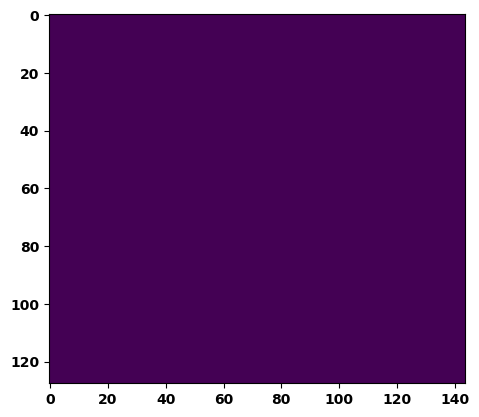

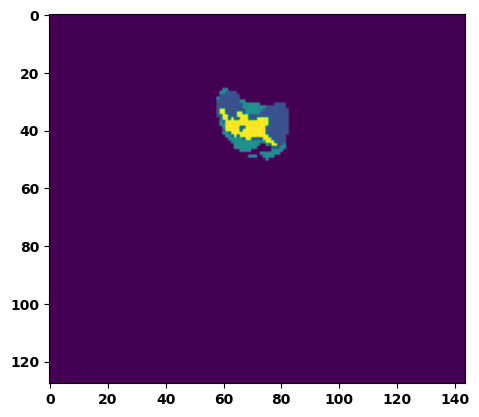

  6%|▌         | 2/36 [00:02<00:39,  1.16s/it]

Batch_id:  1 Eval loss:  0.7571234107017517
Batch_id:  1 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.14s/it]

Batch_id:  2 Eval loss:  0.3161407709121704
Batch_id:  2 Eval IoU:  tensor(0.6113, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9904, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.14s/it]

Batch_id:  3 Eval loss:  0.7550991177558899
Batch_id:  3 Eval IoU:  tensor(0.2314, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:35,  1.14s/it]

Batch_id:  4 Eval loss:  0.7535066604614258
Batch_id:  4 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:34,  1.15s/it]

Batch_id:  5 Eval loss:  0.6342450380325317
Batch_id:  5 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7379, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4973, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9388, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.5601, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9554, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.11s/it]

Batch_id:  6 Eval loss:  0.6381833553314209
Batch_id:  6 Eval IoU:  tensor(0.2410, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6956, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4458, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.4490, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.07s/it]

Batch_id:  7 Eval loss:  0.6911641955375671
Batch_id:  7 Eval IoU:  tensor(0.2210, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6243, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3177, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.7786, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.4309, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.756279468536377
Batch_id:  8 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:28,  1.08s/it]

Batch_id:  9 Eval loss:  0.6334378719329834
Batch_id:  9 Eval IoU:  tensor(0.3192, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  10 Eval loss:  0.7592321038246155
Batch_id:  10 Eval IoU:  tensor(0.2225, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8744, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9599, device='cuda:0')


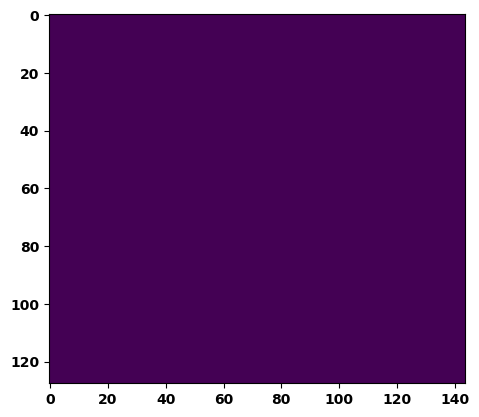

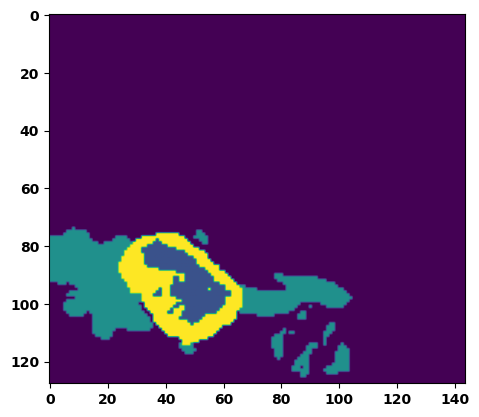

 33%|███▎      | 12/36 [00:13<00:26,  1.12s/it]

Batch_id:  11 Eval loss:  0.13835473358631134
Batch_id:  11 Eval IoU:  tensor(0.7733, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.12s/it]

Batch_id:  12 Eval loss:  0.4281499981880188
Batch_id:  12 Eval IoU:  tensor(0.4739, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8683, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7450, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7503, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9917, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.12s/it]

Batch_id:  13 Eval loss:  0.7480176687240601
Batch_id:  13 Eval IoU:  tensor(0.1594, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6530, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3852, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3106, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.761031448841095
Batch_id:  14 Eval IoU:  tensor(0.2156, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9198, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8431, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.07s/it]

Batch_id:  15 Eval loss:  0.7664319276809692
Batch_id:  15 Eval IoU:  tensor(0.2040, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8811, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8067, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8778, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:19,  1.05s/it]

Batch_id:  16 Eval loss:  0.7857654690742493
Batch_id:  16 Eval IoU:  tensor(0.1440, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7296, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.5146, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.4693, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.04s/it]

Batch_id:  17 Eval loss:  0.8830593824386597
Batch_id:  17 Eval IoU:  tensor(0.0743, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6209, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4161, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2420, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.7420071959495544
Batch_id:  18 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.7408896684646606
Batch_id:  19 Eval IoU:  tensor(0.2433, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8075, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  20 Eval loss:  0.7757341861724854
Batch_id:  20 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


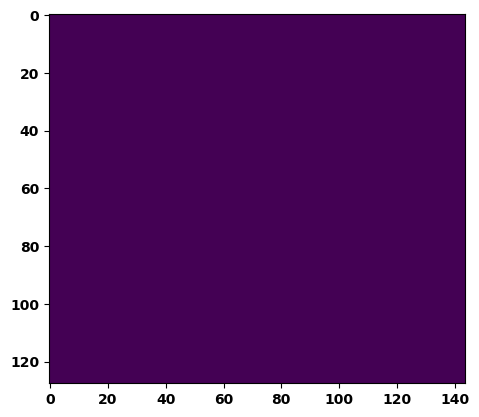

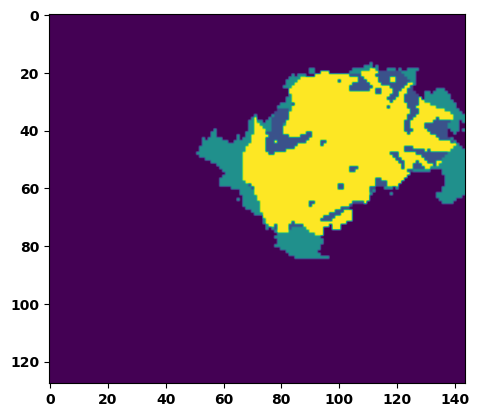

 61%|██████    | 22/36 [00:24<00:14,  1.07s/it]

Batch_id:  21 Eval loss:  0.6694772839546204
Batch_id:  21 Eval IoU:  tensor(0.2763, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8759, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8132, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:13,  1.06s/it]

Batch_id:  22 Eval loss:  0.7653775811195374
Batch_id:  22 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.7496522665023804
Batch_id:  23 Eval IoU:  tensor(0.1964, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8007, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7486, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.8920, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.6398, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9223, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.36726951599121094
Batch_id:  24 Eval IoU:  tensor(0.5544, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9746, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.7691377401351929
Batch_id:  25 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:10,  1.12s/it]

Batch_id:  26 Eval loss:  0.6390556693077087
Batch_id:  26 Eval IoU:  tensor(0.3018, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8996, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8322, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.10s/it]

Batch_id:  27 Eval loss:  0.8202741742134094
Batch_id:  27 Eval IoU:  tensor(0.1380, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7710, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5545, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.6649, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.12s/it]

Batch_id:  28 Eval loss:  0.07016326487064362
Batch_id:  28 Eval IoU:  tensor(0.8771, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.11s/it]

Batch_id:  29 Eval loss:  0.2006996124982834
Batch_id:  29 Eval IoU:  tensor(0.7105, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  30 Eval loss:  0.763450026512146
Batch_id:  30 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


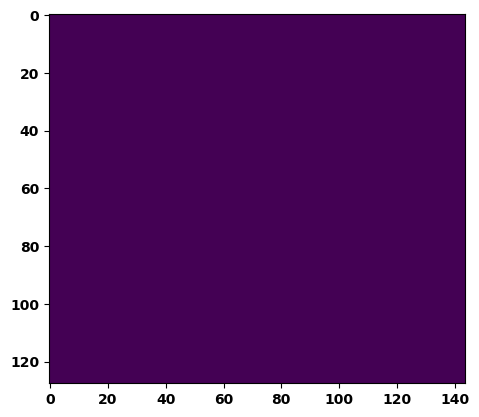

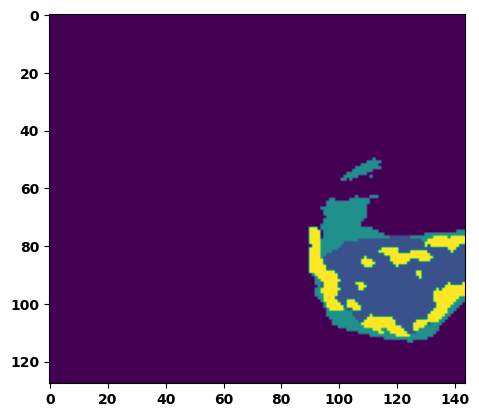

 89%|████████▉ | 32/36 [00:35<00:04,  1.09s/it]

Batch_id:  31 Eval loss:  0.766033411026001
Batch_id:  31 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.09s/it]

Batch_id:  32 Eval loss:  0.76448655128479
Batch_id:  32 Eval IoU:  tensor(0.2218, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8881, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.07s/it]

Batch_id:  33 Eval loss:  0.7718316912651062
Batch_id:  33 Eval IoU:  tensor(0.1454, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6978, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.5062, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8454, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.4592, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.05s/it]

Batch_id:  34 Eval loss:  0.7637721300125122
Batch_id:  34 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.6011067628860474
Batch_id:  35 Eval IoU:  tensor(0.3490, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9857, device='cuda:0')
Epoch  26 Training loss:  0.14283070997758346
Epoch  26 Evaluation loss:  0.6582617830071185
Epoch  26 Training accuracy :  tensor(0.7886)
Epoch  26 Evaluation accuracy :  tensor(0.2958)
Epoch  26 Training Mean Dice Score:  tensor(0.9883)
Epoch  26 Eval Mean Dice Score:  tensor(0.8855)
Epoch  26 Training Non-tumor Dice Score:  tensor(0.9851)
Epoch  26 Eval Non-tumor Dice Score:  tensor(0.8042)
Epoch  26 Training NCR/NET Dice Score:  tensor(0.9929)
Epoch  26 Eval NCR/NET Dice Score:  tensor(0.9685)
Epoch  26 Training ED Dice Score:  tensor(0.98

Epoch: 27
Training in session: 


  1%|          | 1/110 [00:01<02:22,  1.30s/it]

Batch_id:  0 Training loss:  0.04885357618331909
Batch_id:  0 Training IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:10,  1.21s/it]

Batch_id:  1 Training loss:  0.06533241271972656
Batch_id:  1 Training IoU:  tensor(0.8863, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:03,  1.16s/it]

Batch_id:  2 Training loss:  0.08794014155864716
Batch_id:  2 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.11288009583950043
Batch_id:  3 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.14s/it]

Batch_id:  4 Training loss:  0.11601732671260834
Batch_id:  4 Training IoU:  tensor(0.8054, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:55,  1.11s/it]

Batch_id:  5 Training loss:  0.07247947156429291
Batch_id:  5 Training IoU:  tensor(0.8743, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:54,  1.12s/it]

Batch_id:  6 Training loss:  0.12380945682525635
Batch_id:  6 Training IoU:  tensor(0.7945, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.060531988739967346
Batch_id:  7 Training IoU:  tensor(0.8949, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:53,  1.12s/it]

Batch_id:  8 Training loss:  0.08769087493419647
Batch_id:  8 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:55,  1.16s/it]

Batch_id:  9 Training loss:  0.10931499302387238
Batch_id:  9 Training IoU:  tensor(0.8380, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.12s/it]

Batch_id:  10 Training loss:  0.09181071817874908
Batch_id:  10 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.10s/it]

Batch_id:  11 Training loss:  0.15630124509334564
Batch_id:  11 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.20048776268959045
Batch_id:  12 Training IoU:  tensor(0.6951, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.058660686016082764
Batch_id:  13 Training IoU:  tensor(0.8997, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.072421133518219
Batch_id:  14 Training IoU:  tensor(0.8767, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.1161094456911087
Batch_id:  15 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:42,  1.11s/it]

Batch_id:  16 Training loss:  0.18501415848731995
Batch_id:  16 Training IoU:  tensor(0.7084, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:51,  1.21s/it]

Batch_id:  17 Training loss:  0.22048144042491913
Batch_id:  17 Training IoU:  tensor(0.7172, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:45,  1.16s/it]

Batch_id:  18 Training loss:  0.412876695394516
Batch_id:  18 Training IoU:  tensor(0.5064, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:43,  1.15s/it]

Batch_id:  19 Training loss:  0.20510335266590118
Batch_id:  19 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:42,  1.16s/it]

Batch_id:  20 Training loss:  0.15075288712978363
Batch_id:  20 Training IoU:  tensor(0.7551, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 20%|██        | 22/110 [00:25<01:39,  1.13s/it]

Batch_id:  21 Training loss:  0.05400709807872772
Batch_id:  21 Training IoU:  tensor(0.9253, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 21%|██        | 23/110 [00:26<01:36,  1.11s/it]

Batch_id:  22 Training loss:  0.1497206836938858
Batch_id:  22 Training IoU:  tensor(0.7639, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.2454116940498352
Batch_id:  23 Training IoU:  tensor(0.6714, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:37,  1.15s/it]

Batch_id:  24 Training loss:  0.1489078551530838
Batch_id:  24 Training IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:36,  1.15s/it]

Batch_id:  25 Training loss:  0.07059372961521149
Batch_id:  25 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:34,  1.13s/it]

Batch_id:  26 Training loss:  0.3338695764541626
Batch_id:  26 Training IoU:  tensor(0.6109, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.12s/it]

Batch_id:  27 Training loss:  0.09969286620616913
Batch_id:  27 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.08754433691501617
Batch_id:  28 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 27%|██▋       | 30/110 [00:34<01:32,  1.16s/it]

Batch_id:  29 Training loss:  0.15137851238250732
Batch_id:  29 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:29,  1.14s/it]

Batch_id:  30 Training loss:  0.1509753316640854
Batch_id:  30 Training IoU:  tensor(0.7571, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:26,  1.11s/it]

Batch_id:  31 Training loss:  0.13718177378177643
Batch_id:  31 Training IoU:  tensor(0.7757, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 30%|███       | 33/110 [00:37<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.1819484829902649
Batch_id:  32 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 31%|███       | 34/110 [00:38<01:24,  1.11s/it]

Batch_id:  33 Training loss:  0.09924772381782532
Batch_id:  33 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:22,  1.10s/it]

Batch_id:  34 Training loss:  0.0884118527173996
Batch_id:  34 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:19,  1.08s/it]

Batch_id:  35 Training loss:  0.16786690056324005
Batch_id:  35 Training IoU:  tensor(0.7316, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.21345387399196625
Batch_id:  36 Training IoU:  tensor(0.6868, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.22830086946487427
Batch_id:  37 Training IoU:  tensor(0.6976, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.16380000114440918
Batch_id:  38 Training IoU:  tensor(0.7386, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:14,  1.06s/it]

Batch_id:  39 Training loss:  0.08890999853610992
Batch_id:  39 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:13,  1.07s/it]

Batch_id:  40 Training loss:  0.2629687190055847
Batch_id:  40 Training IoU:  tensor(0.6154, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.1310754269361496
Batch_id:  41 Training IoU:  tensor(0.7969, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:11,  1.07s/it]

Batch_id:  42 Training loss:  0.3246319890022278
Batch_id:  42 Training IoU:  tensor(0.6427, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 40%|████      | 44/110 [00:49<01:10,  1.07s/it]

Batch_id:  43 Training loss:  0.17799688875675201
Batch_id:  43 Training IoU:  tensor(0.7217, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 41%|████      | 45/110 [00:50<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.18433137238025665
Batch_id:  44 Training IoU:  tensor(0.7174, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.06381131708621979
Batch_id:  45 Training IoU:  tensor(0.8944, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.1988990604877472
Batch_id:  46 Training IoU:  tensor(0.7393, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:09,  1.13s/it]

Batch_id:  47 Training loss:  0.05155456066131592
Batch_id:  47 Training IoU:  tensor(0.9139, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:08,  1.13s/it]

Batch_id:  48 Training loss:  0.3375937342643738
Batch_id:  48 Training IoU:  tensor(0.6276, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9997, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:07,  1.12s/it]

Batch_id:  49 Training loss:  0.0705304741859436
Batch_id:  49 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.10907474160194397
Batch_id:  50 Training IoU:  tensor(0.8167, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:05,  1.13s/it]

Batch_id:  51 Training loss:  0.11029519140720367
Batch_id:  51 Training IoU:  tensor(0.8255, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:03,  1.12s/it]

Batch_id:  52 Training loss:  0.21583718061447144
Batch_id:  52 Training IoU:  tensor(0.6959, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.13901269435882568
Batch_id:  53 Training IoU:  tensor(0.7892, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.11s/it]

Batch_id:  54 Training loss:  0.37330883741378784
Batch_id:  54 Training IoU:  tensor(0.5365, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 51%|█████     | 56/110 [01:02<01:00,  1.12s/it]

Batch_id:  55 Training loss:  0.11133886873722076
Batch_id:  55 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:57,  1.09s/it]

Batch_id:  56 Training loss:  0.1318512111902237
Batch_id:  56 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.24918974936008453
Batch_id:  57 Training IoU:  tensor(0.6667, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.11242969334125519
Batch_id:  58 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.26716485619544983
Batch_id:  59 Training IoU:  tensor(0.6708, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.15825672447681427
Batch_id:  60 Training IoU:  tensor(0.7525, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:53,  1.11s/it]

Batch_id:  61 Training loss:  0.15176981687545776
Batch_id:  61 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:51,  1.11s/it]

Batch_id:  62 Training loss:  0.09208771586418152
Batch_id:  62 Training IoU:  tensor(0.8404, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:51,  1.11s/it]

Batch_id:  63 Training loss:  0.13513657450675964
Batch_id:  63 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:49,  1.09s/it]

Batch_id:  64 Training loss:  0.06687164306640625
Batch_id:  64 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:47,  1.09s/it]

Batch_id:  65 Training loss:  0.08101218938827515
Batch_id:  65 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:46,  1.09s/it]

Batch_id:  66 Training loss:  0.1452740728855133
Batch_id:  66 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.07466322183609009
Batch_id:  67 Training IoU:  tensor(0.8773, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.2058790773153305
Batch_id:  68 Training IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.14366506040096283
Batch_id:  69 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.15123265981674194
Batch_id:  70 Training IoU:  tensor(0.7771, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.09219387173652649
Batch_id:  71 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:39,  1.07s/it]

Batch_id:  72 Training loss:  0.06392866373062134
Batch_id:  72 Training IoU:  tensor(0.8883, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:38,  1.08s/it]

Batch_id:  73 Training loss:  0.08702760934829712
Batch_id:  73 Training IoU:  tensor(0.8498, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.14438506960868835
Batch_id:  74 Training IoU:  tensor(0.7686, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.06782735884189606
Batch_id:  75 Training IoU:  tensor(0.8848, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:37,  1.13s/it]

Batch_id:  76 Training loss:  0.08168873190879822
Batch_id:  76 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.07807734608650208
Batch_id:  77 Training IoU:  tensor(0.8637, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.13s/it]

Batch_id:  78 Training loss:  0.21094049513339996
Batch_id:  78 Training IoU:  tensor(0.6768, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.11s/it]

Batch_id:  79 Training loss:  0.14752334356307983
Batch_id:  79 Training IoU:  tensor(0.7687, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:33,  1.16s/it]

Batch_id:  80 Training loss:  0.04346396028995514
Batch_id:  80 Training IoU:  tensor(0.9233, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:32,  1.16s/it]

Batch_id:  81 Training loss:  0.08781862258911133
Batch_id:  81 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:31,  1.15s/it]

Batch_id:  82 Training loss:  0.062460750341415405
Batch_id:  82 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.15717725455760956
Batch_id:  83 Training IoU:  tensor(0.7427, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:28,  1.13s/it]

Batch_id:  84 Training loss:  0.13645410537719727
Batch_id:  84 Training IoU:  tensor(0.7868, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.06236644089221954
Batch_id:  85 Training IoU:  tensor(0.8925, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.10516253113746643
Batch_id:  86 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.1282803863286972
Batch_id:  87 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:22,  1.06s/it]

Batch_id:  88 Training loss:  0.1377420872449875
Batch_id:  88 Training IoU:  tensor(0.7964, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:20,  1.05s/it]

Batch_id:  89 Training loss:  0.0821523517370224
Batch_id:  89 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:20,  1.09s/it]

Batch_id:  90 Training loss:  0.35231924057006836
Batch_id:  90 Training IoU:  tensor(0.5955, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.20269416272640228
Batch_id:  91 Training IoU:  tensor(0.6859, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.08s/it]

Batch_id:  92 Training loss:  0.3757530450820923
Batch_id:  92 Training IoU:  tensor(0.5097, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:16,  1.06s/it]

Batch_id:  93 Training loss:  0.17863301932811737
Batch_id:  93 Training IoU:  tensor(0.7222, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.07s/it]

Batch_id:  94 Training loss:  0.0525723397731781
Batch_id:  94 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.13561148941516876
Batch_id:  95 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.06270448863506317
Batch_id:  96 Training IoU:  tensor(0.8912, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:13,  1.17s/it]

Batch_id:  97 Training loss:  0.12688367068767548
Batch_id:  97 Training IoU:  tensor(0.8027, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.0871819257736206
Batch_id:  98 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:11,  1.10s/it]

Batch_id:  99 Training loss:  0.09924644231796265
Batch_id:  99 Training IoU:  tensor(0.8327, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.17426364123821259
Batch_id:  100 Training IoU:  tensor(0.7198, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.07159313559532166
Batch_id:  101 Training IoU:  tensor(0.8758, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.07790111005306244
Batch_id:  102 Training IoU:  tensor(0.8624, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.09s/it]

Batch_id:  103 Training loss:  0.07934586703777313
Batch_id:  103 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.13017740845680237
Batch_id:  104 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.11s/it]

Batch_id:  105 Training loss:  0.48341429233551025
Batch_id:  105 Training IoU:  tensor(0.4415, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.15s/it]

Batch_id:  106 Training loss:  0.14096421003341675
Batch_id:  106 Training IoU:  tensor(0.8324, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.08849069476127625
Batch_id:  107 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.14s/it]

Batch_id:  108 Training loss:  0.0815017819404602
Batch_id:  108 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


100%|██████████| 110/110 [02:02<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.04987454414367676
Batch_id:  109 Training IoU:  tensor(0.9130, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9933, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.04387538135051727
Batch_id:  0 Eval IoU:  tensor(0.9218, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


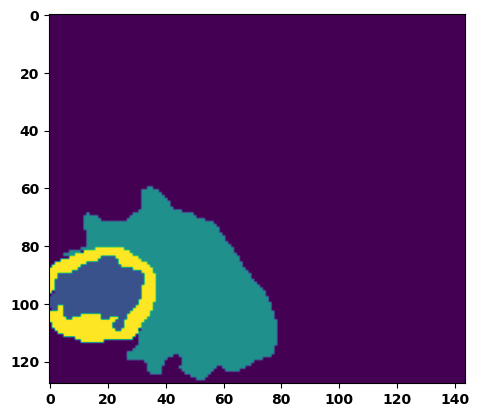

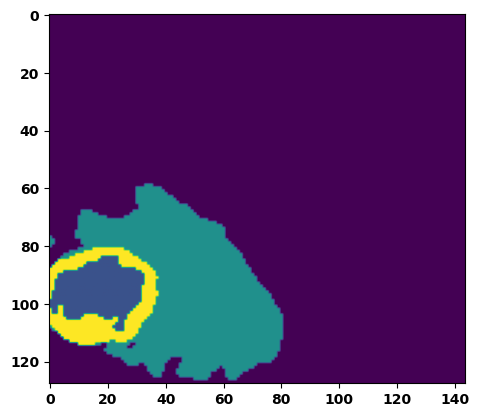

  6%|▌         | 2/36 [00:02<00:39,  1.17s/it]

Batch_id:  1 Eval loss:  0.7653794288635254
Batch_id:  1 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.11s/it]

Batch_id:  2 Eval loss:  0.6957190036773682
Batch_id:  2 Eval IoU:  tensor(0.2665, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8130, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9469, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.15s/it]

Batch_id:  3 Eval loss:  0.7703419923782349
Batch_id:  3 Eval IoU:  tensor(0.2013, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7978, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8897, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:35,  1.14s/it]

Batch_id:  4 Eval loss:  0.7691395878791809
Batch_id:  4 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.12s/it]

Batch_id:  5 Eval loss:  0.7435535192489624
Batch_id:  5 Eval IoU:  tensor(0.1569, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6599, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4035, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9266, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3622, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:32,  1.12s/it]

Batch_id:  6 Eval loss:  0.2719278931617737
Batch_id:  6 Eval IoU:  tensor(0.6622, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 22%|██▏       | 8/36 [00:09<00:33,  1.20s/it]

Batch_id:  7 Eval loss:  0.7571321725845337
Batch_id:  7 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 25%|██▌       | 9/36 [00:10<00:32,  1.19s/it]

Batch_id:  8 Eval loss:  0.6932013034820557
Batch_id:  8 Eval IoU:  tensor(0.2496, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8811, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8198, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.7778, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 28%|██▊       | 10/36 [00:11<00:29,  1.14s/it]

Batch_id:  9 Eval loss:  0.7660361528396606
Batch_id:  9 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  10 Eval loss:  0.12382008135318756
Batch_id:  10 Eval IoU:  tensor(0.8233, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


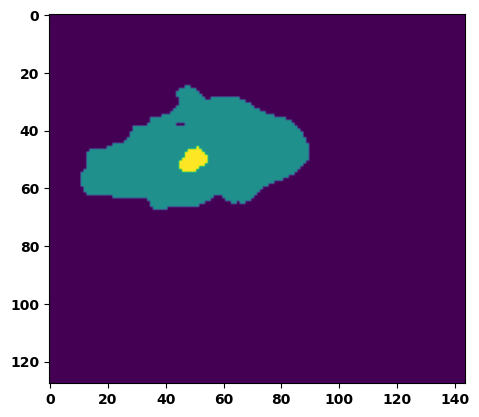

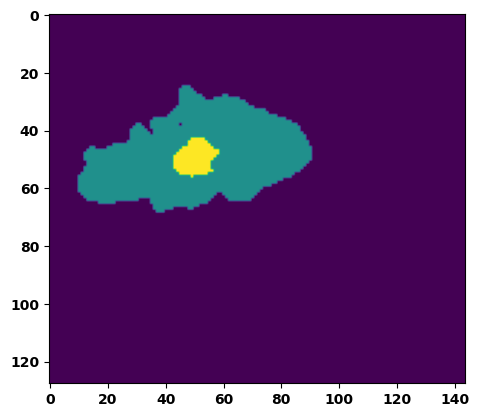

 33%|███▎      | 12/36 [00:14<00:28,  1.20s/it]

Batch_id:  11 Eval loss:  0.4150426983833313
Batch_id:  11 Eval IoU:  tensor(0.4982, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8661, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.7354, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.7429, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 36%|███▌      | 13/36 [00:15<00:27,  1.20s/it]

Batch_id:  12 Eval loss:  0.36924296617507935
Batch_id:  12 Eval IoU:  tensor(0.5430, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9831, device='cuda:0')


 39%|███▉      | 14/36 [00:16<00:25,  1.14s/it]

Batch_id:  13 Eval loss:  0.808650553226471
Batch_id:  13 Eval IoU:  tensor(0.1138, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6032, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3115, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9431, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.2180, device='cuda:0')


 42%|████▏     | 15/36 [00:17<00:23,  1.13s/it]

Batch_id:  14 Eval loss:  0.6875705122947693
Batch_id:  14 Eval IoU:  tensor(0.2123, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.7504, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.6037, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.8723, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.5979, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9275, device='cuda:0')


 44%|████▍     | 16/36 [00:18<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.815487802028656
Batch_id:  15 Eval IoU:  tensor(0.1193, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6964, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4484, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3930, device='cuda:0')


 47%|████▋     | 17/36 [00:19<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.6791253089904785
Batch_id:  16 Eval IoU:  tensor(0.2732, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9465, device='cuda:0')


 50%|█████     | 18/36 [00:20<00:19,  1.06s/it]

Batch_id:  17 Eval loss:  0.212112694978714
Batch_id:  17 Eval IoU:  tensor(0.6704, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9658, device='cuda:0')


 53%|█████▎    | 19/36 [00:21<00:18,  1.06s/it]

Batch_id:  18 Eval loss:  0.7194861173629761
Batch_id:  18 Eval IoU:  tensor(0.2572, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 56%|█████▌    | 20/36 [00:22<00:17,  1.07s/it]

Batch_id:  19 Eval loss:  0.54218590259552
Batch_id:  19 Eval IoU:  tensor(0.3713, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8377, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  20 Eval loss:  0.5151830911636353
Batch_id:  20 Eval IoU:  tensor(0.3882, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9310, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9772, device='cuda:0')


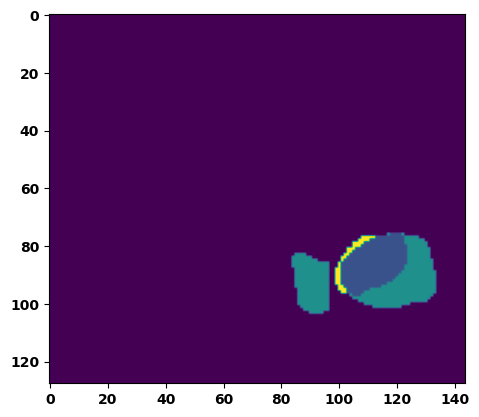

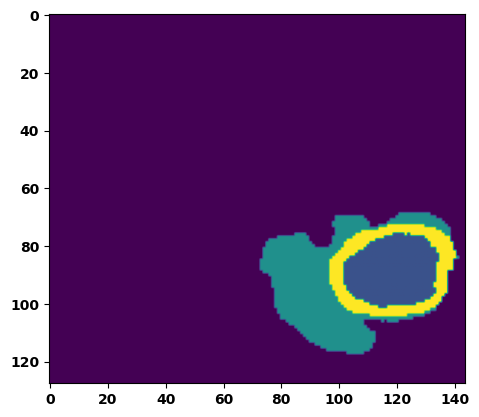

 61%|██████    | 22/36 [00:24<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.7637800574302673
Batch_id:  21 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.4247284233570099
Batch_id:  22 Eval IoU:  tensor(0.4502, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9632, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.7517796754837036
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.8844128847122192
Batch_id:  24 Eval IoU:  tensor(0.0732, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6192, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4127, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2386, device='cuda:0')


 72%|███████▏  | 26/36 [00:29<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.7231459617614746
Batch_id:  25 Eval IoU:  tensor(0.1769, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7179, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4771, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9175, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.7488, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.7283, device='cuda:0')


 75%|███████▌  | 27/36 [00:30<00:09,  1.09s/it]

Batch_id:  26 Eval loss:  0.7535235285758972
Batch_id:  26 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 78%|███████▊  | 28/36 [00:31<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.42024171352386475
Batch_id:  27 Eval IoU:  tensor(0.4919, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 81%|████████  | 29/36 [00:32<00:07,  1.10s/it]

Batch_id:  28 Eval loss:  0.7115134000778198
Batch_id:  28 Eval IoU:  tensor(0.2070, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7587, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.5267, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.6409, device='cuda:0')


 83%|████████▎ | 30/36 [00:33<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.7749847769737244
Batch_id:  29 Eval IoU:  tensor(0.2035, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8124, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  30 Eval loss:  0.8333398103713989
Batch_id:  30 Eval IoU:  tensor(0.1002, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6435, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3783, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2896, device='cuda:0')


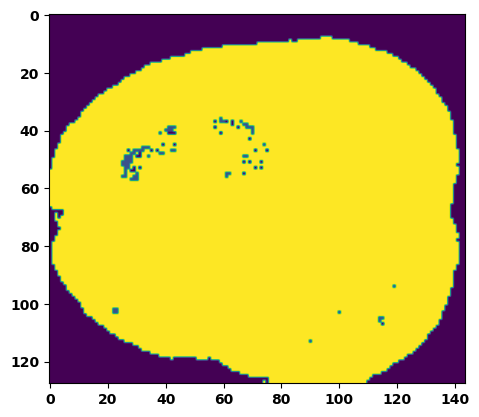

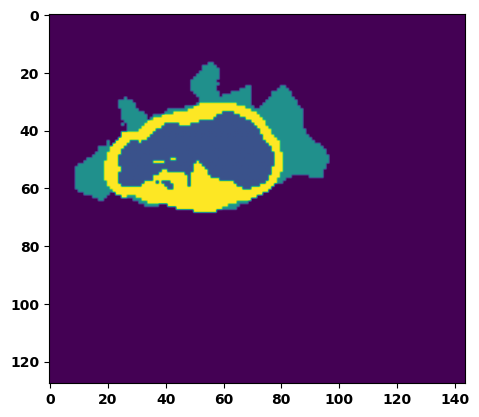

 89%|████████▉ | 32/36 [00:35<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.8104623556137085
Batch_id:  31 Eval IoU:  tensor(0.1234, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6893, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5012, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8761, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3959, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.09s/it]

Batch_id:  32 Eval loss:  0.7633945345878601
Batch_id:  32 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 94%|█████████▍| 34/36 [00:38<00:02,  1.15s/it]

Batch_id:  33 Eval loss:  0.7363505363464355
Batch_id:  33 Eval IoU:  tensor(0.2416, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9150, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 97%|█████████▋| 35/36 [00:39<00:01,  1.12s/it]

Batch_id:  34 Eval loss:  0.802933394908905
Batch_id:  34 Eval IoU:  tensor(0.1625, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8247, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.6500, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.7834, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


100%|██████████| 36/36 [00:40<00:00,  1.12s/it]

Batch_id:  35 Eval loss:  0.5389686822891235
Batch_id:  35 Eval IoU:  tensor(0.3737, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9003, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8770, device='cuda:0')
Epoch  27 Training loss:  0.1424785076217218
Epoch  27 Evaluation loss:  0.634938163889779
Epoch  27 Training accuracy :  tensor(0.7890)
Epoch  27 Evaluation accuracy :  tensor(0.3099)
Epoch  27 Training Mean Dice Score:  tensor(0.9884)
Epoch  27 Eval Mean Dice Score:  tensor(0.8769)
Epoch  27 Training Non-tumor Dice Score:  tensor(0.9851)
Epoch  27 Eval Non-tumor Dice Score:  tensor(0.7903)
Epoch  27 Training NCR/NET Dice Score:  tensor(0.9929)
Epoch  27 Eval NCR/NET Dice Score:  tensor(0.9650)
Epoch  27 Training ED Dice Score:  tensor(0.9833

Epoch: 28
Training in session: 


  1%|          | 1/110 [00:01<02:02,  1.12s/it]

Batch_id:  0 Training loss:  0.2596051096916199
Batch_id:  0 Training IoU:  tensor(0.6195, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:00,  1.12s/it]

Batch_id:  1 Training loss:  0.12876322865486145
Batch_id:  1 Training IoU:  tensor(0.8087, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.12s/it]

Batch_id:  2 Training loss:  0.1549609899520874
Batch_id:  2 Training IoU:  tensor(0.7573, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:03,  1.16s/it]

Batch_id:  3 Training loss:  0.07812120020389557
Batch_id:  3 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


  5%|▍         | 5/110 [00:05<02:01,  1.15s/it]

Batch_id:  4 Training loss:  0.16344034671783447
Batch_id:  4 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:58,  1.14s/it]

Batch_id:  5 Training loss:  0.21224156022071838
Batch_id:  5 Training IoU:  tensor(0.6758, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:56,  1.13s/it]

Batch_id:  6 Training loss:  0.17931663990020752
Batch_id:  6 Training IoU:  tensor(0.7228, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:52,  1.11s/it]

Batch_id:  7 Training loss:  0.06421312689781189
Batch_id:  7 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:52,  1.11s/it]

Batch_id:  8 Training loss:  0.09468375146389008
Batch_id:  8 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.16172318160533905
Batch_id:  9 Training IoU:  tensor(0.7399, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.12s/it]

Batch_id:  10 Training loss:  0.2463926076889038
Batch_id:  10 Training IoU:  tensor(0.6680, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.3331596851348877
Batch_id:  11 Training IoU:  tensor(0.6370, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.12941338121891022
Batch_id:  12 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:48,  1.13s/it]

Batch_id:  13 Training loss:  0.08141092956066132
Batch_id:  13 Training IoU:  tensor(0.8580, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.1332167387008667
Batch_id:  14 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:44,  1.11s/it]

Batch_id:  15 Training loss:  0.13665243983268738
Batch_id:  15 Training IoU:  tensor(0.7763, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:44,  1.13s/it]

Batch_id:  16 Training loss:  0.06187623739242554
Batch_id:  16 Training IoU:  tensor(0.8970, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:44,  1.13s/it]

Batch_id:  17 Training loss:  0.08999785780906677
Batch_id:  17 Training IoU:  tensor(0.8470, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:44,  1.15s/it]

Batch_id:  18 Training loss:  0.04999953508377075
Batch_id:  18 Training IoU:  tensor(0.9126, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:42,  1.14s/it]

Batch_id:  19 Training loss:  0.08238555490970612
Batch_id:  19 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:39,  1.11s/it]

Batch_id:  20 Training loss:  0.1805594563484192
Batch_id:  20 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 20%|██        | 22/110 [00:24<01:38,  1.12s/it]

Batch_id:  21 Training loss:  0.13931921124458313
Batch_id:  21 Training IoU:  tensor(0.7701, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 21%|██        | 23/110 [00:25<01:35,  1.10s/it]

Batch_id:  22 Training loss:  0.16810119152069092
Batch_id:  22 Training IoU:  tensor(0.7370, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.11379718780517578
Batch_id:  23 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:34,  1.11s/it]

Batch_id:  24 Training loss:  0.17685967683792114
Batch_id:  24 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.1532328724861145
Batch_id:  25 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:38,  1.18s/it]

Batch_id:  26 Training loss:  0.260547935962677
Batch_id:  26 Training IoU:  tensor(0.6776, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:34,  1.16s/it]

Batch_id:  27 Training loss:  0.08674998581409454
Batch_id:  27 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:31,  1.13s/it]

Batch_id:  28 Training loss:  0.07758353650569916
Batch_id:  28 Training IoU:  tensor(0.8629, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:30,  1.13s/it]

Batch_id:  29 Training loss:  0.04855974018573761
Batch_id:  29 Training IoU:  tensor(0.9209, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:29,  1.14s/it]

Batch_id:  30 Training loss:  0.08903492987155914
Batch_id:  30 Training IoU:  tensor(0.8592, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 29%|██▉       | 32/110 [00:36<01:28,  1.13s/it]

Batch_id:  31 Training loss:  0.12934915721416473
Batch_id:  31 Training IoU:  tensor(0.7973, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 30%|███       | 33/110 [00:37<01:26,  1.12s/it]

Batch_id:  32 Training loss:  0.08673539757728577
Batch_id:  32 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 31%|███       | 34/110 [00:38<01:26,  1.14s/it]

Batch_id:  33 Training loss:  0.05270907282829285
Batch_id:  33 Training IoU:  tensor(0.9249, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:27,  1.16s/it]

Batch_id:  34 Training loss:  0.08249279856681824
Batch_id:  34 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:25,  1.16s/it]

Batch_id:  35 Training loss:  0.18683691322803497
Batch_id:  35 Training IoU:  tensor(0.7058, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:25,  1.17s/it]

Batch_id:  36 Training loss:  0.0658947229385376
Batch_id:  36 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:20,  1.12s/it]

Batch_id:  37 Training loss:  0.08696351945400238
Batch_id:  37 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:18,  1.10s/it]

Batch_id:  38 Training loss:  0.2034863382577896
Batch_id:  38 Training IoU:  tensor(0.7111, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 36%|███▋      | 40/110 [00:45<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.33383607864379883
Batch_id:  39 Training IoU:  tensor(0.6092, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 37%|███▋      | 41/110 [00:46<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.0968254804611206
Batch_id:  40 Training IoU:  tensor(0.8312, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.062119096517562866
Batch_id:  41 Training IoU:  tensor(0.8918, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.06997059285640717
Batch_id:  42 Training IoU:  tensor(0.8794, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 40%|████      | 44/110 [00:49<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.06972938776016235
Batch_id:  43 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 41%|████      | 45/110 [00:50<01:13,  1.12s/it]

Batch_id:  44 Training loss:  0.19134925305843353
Batch_id:  44 Training IoU:  tensor(0.7459, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:11,  1.12s/it]

Batch_id:  45 Training loss:  0.08013060688972473
Batch_id:  45 Training IoU:  tensor(0.8603, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:10,  1.12s/it]

Batch_id:  46 Training loss:  0.06367120146751404
Batch_id:  46 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.36255595088005066
Batch_id:  47 Training IoU:  tensor(0.5217, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 45%|████▍     | 49/110 [00:55<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.14991126954555511
Batch_id:  48 Training IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 45%|████▌     | 50/110 [00:56<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.13127486407756805
Batch_id:  49 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 46%|████▋     | 51/110 [00:57<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.06545020639896393
Batch_id:  50 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.10615377128124237
Batch_id:  51 Training IoU:  tensor(0.8323, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.107293039560318
Batch_id:  52 Training IoU:  tensor(0.8251, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.14452876150608063
Batch_id:  53 Training IoU:  tensor(0.8224, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.05748210847377777
Batch_id:  54 Training IoU:  tensor(0.9009, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 51%|█████     | 56/110 [01:02<01:00,  1.11s/it]

Batch_id:  55 Training loss:  0.04839743673801422
Batch_id:  55 Training IoU:  tensor(0.9136, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:59,  1.12s/it]

Batch_id:  56 Training loss:  0.05984261631965637
Batch_id:  56 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 53%|█████▎    | 58/110 [01:05<00:59,  1.14s/it]

Batch_id:  57 Training loss:  0.07448160648345947
Batch_id:  57 Training IoU:  tensor(0.8681, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 54%|█████▎    | 59/110 [01:06<00:59,  1.16s/it]

Batch_id:  58 Training loss:  0.10836747288703918
Batch_id:  58 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 55%|█████▍    | 60/110 [01:07<00:58,  1.16s/it]

Batch_id:  59 Training loss:  0.3720235228538513
Batch_id:  59 Training IoU:  tensor(0.5400, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 55%|█████▌    | 61/110 [01:08<00:56,  1.15s/it]

Batch_id:  60 Training loss:  0.2383831888437271
Batch_id:  60 Training IoU:  tensor(0.6814, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:53,  1.12s/it]

Batch_id:  61 Training loss:  0.08760803937911987
Batch_id:  61 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:51,  1.10s/it]

Batch_id:  62 Training loss:  0.15288235247135162
Batch_id:  62 Training IoU:  tensor(0.7666, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:50,  1.09s/it]

Batch_id:  63 Training loss:  0.15125493705272675
Batch_id:  63 Training IoU:  tensor(0.7567, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9713, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.16932141780853271
Batch_id:  64 Training IoU:  tensor(0.7314, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.11015117168426514
Batch_id:  65 Training IoU:  tensor(0.8136, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.20149025321006775
Batch_id:  66 Training IoU:  tensor(0.6888, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:44,  1.05s/it]

Batch_id:  67 Training loss:  0.14976777136325836
Batch_id:  67 Training IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 63%|██████▎   | 69/110 [01:17<00:43,  1.07s/it]

Batch_id:  68 Training loss:  0.0983230322599411
Batch_id:  68 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 64%|██████▎   | 70/110 [01:18<00:42,  1.07s/it]

Batch_id:  69 Training loss:  0.07974542677402496
Batch_id:  69 Training IoU:  tensor(0.8687, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:41,  1.08s/it]

Batch_id:  70 Training loss:  0.21373030543327332
Batch_id:  70 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:41,  1.08s/it]

Batch_id:  71 Training loss:  0.13380524516105652
Batch_id:  71 Training IoU:  tensor(0.7764, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:40,  1.08s/it]

Batch_id:  72 Training loss:  0.2336243838071823
Batch_id:  72 Training IoU:  tensor(0.6898, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:40,  1.11s/it]

Batch_id:  73 Training loss:  0.06961634755134583
Batch_id:  73 Training IoU:  tensor(0.8798, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:39,  1.11s/it]

Batch_id:  74 Training loss:  0.08339254558086395
Batch_id:  74 Training IoU:  tensor(0.8551, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:39,  1.16s/it]

Batch_id:  75 Training loss:  0.12644413113594055
Batch_id:  75 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 70%|███████   | 77/110 [01:26<00:38,  1.16s/it]

Batch_id:  76 Training loss:  0.19239087402820587
Batch_id:  76 Training IoU:  tensor(0.7073, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 71%|███████   | 78/110 [01:27<00:37,  1.18s/it]

Batch_id:  77 Training loss:  0.10384316742420197
Batch_id:  77 Training IoU:  tensor(0.8369, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 72%|███████▏  | 79/110 [01:28<00:36,  1.19s/it]

Batch_id:  78 Training loss:  0.3238464593887329
Batch_id:  78 Training IoU:  tensor(0.6434, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 73%|███████▎  | 80/110 [01:29<00:35,  1.19s/it]

Batch_id:  79 Training loss:  0.09563156962394714
Batch_id:  79 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:34,  1.18s/it]

Batch_id:  80 Training loss:  0.08832253515720367
Batch_id:  80 Training IoU:  tensor(0.8465, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 75%|███████▍  | 82/110 [01:32<00:32,  1.17s/it]

Batch_id:  81 Training loss:  0.420700341463089
Batch_id:  81 Training IoU:  tensor(0.5007, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 75%|███████▌  | 83/110 [01:33<00:31,  1.18s/it]

Batch_id:  82 Training loss:  0.05269406735897064
Batch_id:  82 Training IoU:  tensor(0.9079, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 76%|███████▋  | 84/110 [01:34<00:30,  1.19s/it]

Batch_id:  83 Training loss:  0.17555657029151917
Batch_id:  83 Training IoU:  tensor(0.7182, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 77%|███████▋  | 85/110 [01:35<00:29,  1.17s/it]

Batch_id:  84 Training loss:  0.0848274677991867
Batch_id:  84 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 78%|███████▊  | 86/110 [01:36<00:28,  1.19s/it]

Batch_id:  85 Training loss:  0.060459792613983154
Batch_id:  85 Training IoU:  tensor(0.8958, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 79%|███████▉  | 87/110 [01:38<00:27,  1.19s/it]

Batch_id:  86 Training loss:  0.11837546527385712
Batch_id:  86 Training IoU:  tensor(0.8020, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 80%|████████  | 88/110 [01:39<00:25,  1.17s/it]

Batch_id:  87 Training loss:  0.06498733162879944
Batch_id:  87 Training IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 89/110 [01:40<00:25,  1.19s/it]

Batch_id:  88 Training loss:  0.14231227338314056
Batch_id:  88 Training IoU:  tensor(0.7787, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 82%|████████▏ | 90/110 [01:41<00:23,  1.17s/it]

Batch_id:  89 Training loss:  0.16215132176876068
Batch_id:  89 Training IoU:  tensor(0.7387, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 83%|████████▎ | 91/110 [01:42<00:22,  1.17s/it]

Batch_id:  90 Training loss:  0.20431813597679138
Batch_id:  90 Training IoU:  tensor(0.7303, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 84%|████████▎ | 92/110 [01:43<00:20,  1.14s/it]

Batch_id:  91 Training loss:  0.13735637068748474
Batch_id:  91 Training IoU:  tensor(0.7910, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 85%|████████▍ | 93/110 [01:44<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.14963723719120026
Batch_id:  92 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 85%|████████▌ | 94/110 [01:45<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.0826384574174881
Batch_id:  93 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 86%|████████▋ | 95/110 [01:47<00:16,  1.13s/it]

Batch_id:  94 Training loss:  0.05223874747753143
Batch_id:  94 Training IoU:  tensor(0.9109, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 87%|████████▋ | 96/110 [01:48<00:15,  1.13s/it]

Batch_id:  95 Training loss:  0.18986308574676514
Batch_id:  95 Training IoU:  tensor(0.7270, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 88%|████████▊ | 97/110 [01:49<00:14,  1.10s/it]

Batch_id:  96 Training loss:  0.1478727012872696
Batch_id:  96 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 89%|████████▉ | 98/110 [01:50<00:13,  1.11s/it]

Batch_id:  97 Training loss:  0.0882367491722107
Batch_id:  97 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 90%|█████████ | 99/110 [01:51<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.13298973441123962
Batch_id:  98 Training IoU:  tensor(0.7999, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 91%|█████████ | 100/110 [01:52<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.0947299599647522
Batch_id:  99 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 92%|█████████▏| 101/110 [01:53<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.15555761754512787
Batch_id:  100 Training IoU:  tensor(0.7534, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 93%|█████████▎| 102/110 [01:54<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.14538975059986115
Batch_id:  101 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 94%|█████████▎| 103/110 [01:55<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.34711676836013794
Batch_id:  102 Training IoU:  tensor(0.6026, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 95%|█████████▍| 104/110 [01:56<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.10546237230300903
Batch_id:  103 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 95%|█████████▌| 105/110 [01:58<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.4710542559623718
Batch_id:  104 Training IoU:  tensor(0.4533, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 96%|█████████▋| 106/110 [01:59<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.1485658586025238
Batch_id:  105 Training IoU:  tensor(0.7551, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 97%|█████████▋| 107/110 [02:00<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.07385554909706116
Batch_id:  106 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 98%|█████████▊| 108/110 [02:01<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.1549748033285141
Batch_id:  107 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 99%|█████████▉| 109/110 [02:02<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.13115903735160828
Batch_id:  108 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


100%|██████████| 110/110 [02:03<00:00,  1.12s/it]


Batch_id:  109 Training loss:  0.11512425541877747
Batch_id:  109 Training IoU:  tensor(0.8062, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9879, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.23405994474887848
Batch_id:  0 Eval IoU:  tensor(0.6417, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9751, device='cuda:0')


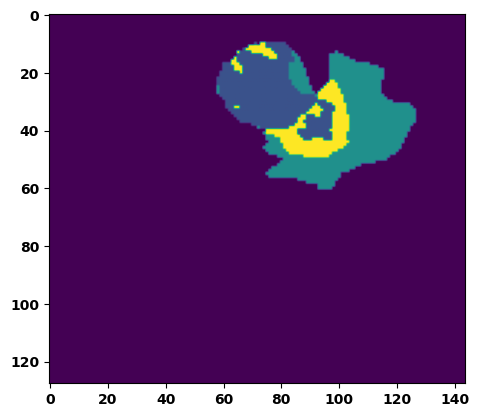

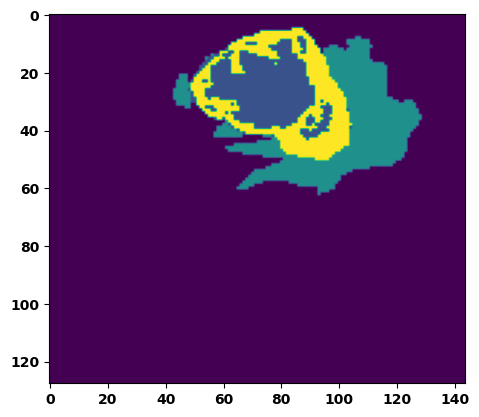

  6%|▌         | 2/36 [00:02<00:38,  1.13s/it]

Batch_id:  1 Eval loss:  0.4920951724052429
Batch_id:  1 Eval IoU:  tensor(0.4044, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8387, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9542, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.12s/it]

Batch_id:  2 Eval loss:  0.23415686190128326
Batch_id:  2 Eval IoU:  tensor(0.6983, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.11s/it]

Batch_id:  3 Eval loss:  0.7571287155151367
Batch_id:  3 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.10s/it]

Batch_id:  4 Eval loss:  0.789912223815918
Batch_id:  4 Eval IoU:  tensor(0.1285, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6714, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4191, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7684, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.5733, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.5518698692321777
Batch_id:  5 Eval IoU:  tensor(0.3602, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9563, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.10s/it]

Batch_id:  6 Eval loss:  0.051187604665756226
Batch_id:  6 Eval IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.09s/it]

Batch_id:  7 Eval loss:  0.766025185585022
Batch_id:  7 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.8512348532676697
Batch_id:  8 Eval IoU:  tensor(0.1042, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7043, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4230, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.5353, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.8168807029724121
Batch_id:  9 Eval IoU:  tensor(0.1196, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6866, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4968, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8743, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3865, device='cuda:0')
Batch_id:  10 Eval loss:  0.7535184621810913
Batch_id:  10 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


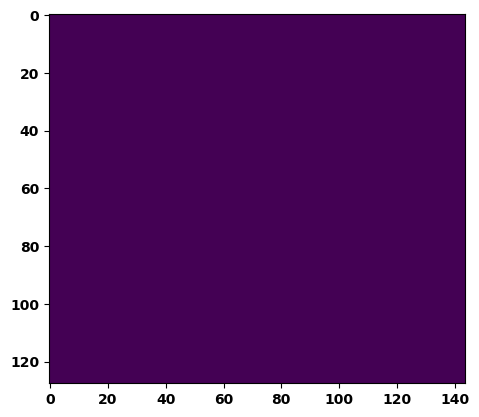

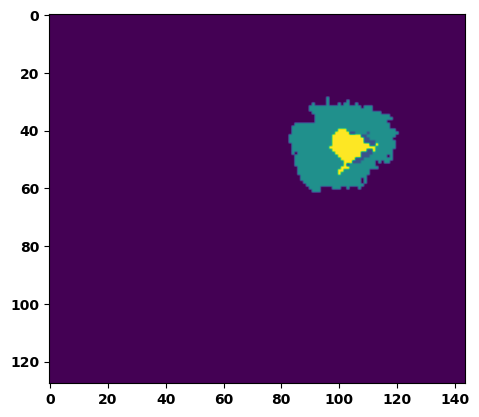

 33%|███▎      | 12/36 [00:13<00:26,  1.09s/it]

Batch_id:  11 Eval loss:  0.7288587093353271
Batch_id:  11 Eval IoU:  tensor(0.1814, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7033, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4389, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.4803, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.7634406685829163
Batch_id:  12 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.05s/it]

Batch_id:  13 Eval loss:  0.8228788375854492
Batch_id:  13 Eval IoU:  tensor(0.1129, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6867, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4290, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3740, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:21,  1.04s/it]

Batch_id:  14 Eval loss:  0.6756728887557983
Batch_id:  14 Eval IoU:  tensor(0.2608, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9149, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8303, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.8933, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.7606965899467468
Batch_id:  15 Eval IoU:  tensor(0.1625, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7373, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5647, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.5412, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.23648858070373535
Batch_id:  16 Eval IoU:  tensor(0.6732, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.05s/it]

Batch_id:  17 Eval loss:  0.8845702409744263
Batch_id:  17 Eval IoU:  tensor(0.0731, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6190, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4123, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2381, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.5416420698165894
Batch_id:  18 Eval IoU:  tensor(0.3817, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8927, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9395, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.7198222279548645
Batch_id:  19 Eval IoU:  tensor(0.1773, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6854, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4941, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8089, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.5055, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  20 Eval loss:  0.7635811567306519
Batch_id:  20 Eval IoU:  tensor(0.2238, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8954, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


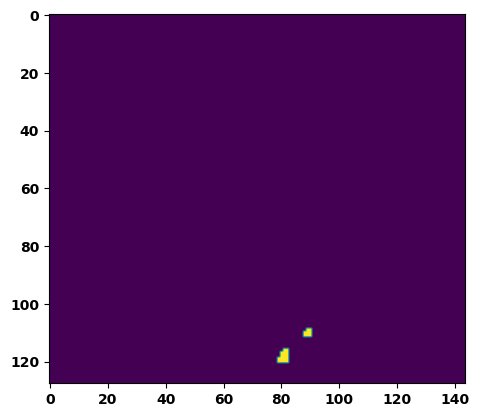

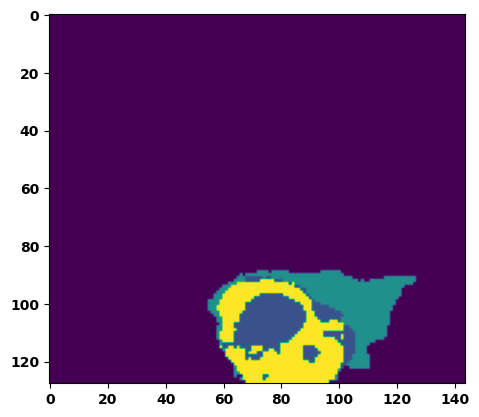

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.4038649797439575
Batch_id:  21 Eval IoU:  tensor(0.4665, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9063, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9346, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9255, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.07s/it]

Batch_id:  22 Eval loss:  0.5229622721672058
Batch_id:  22 Eval IoU:  tensor(0.3807, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.08s/it]

Batch_id:  23 Eval loss:  0.09523256123065948
Batch_id:  23 Eval IoU:  tensor(0.8696, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7691560983657837
Batch_id:  24 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.7653787136077881
Batch_id:  25 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.751781165599823
Batch_id:  26 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.24949969351291656
Batch_id:  27 Eval IoU:  tensor(0.6831, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.7722050547599792
Batch_id:  28 Eval IoU:  tensor(0.1364, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6485, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3864, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9229, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3305, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.05s/it]

Batch_id:  29 Eval loss:  0.8340571522712708
Batch_id:  29 Eval IoU:  tensor(0.0998, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6432, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3793, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2875, device='cuda:0')
Batch_id:  30 Eval loss:  0.7016153335571289
Batch_id:  30 Eval IoU:  tensor(0.2250, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8267, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.7275, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9256, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.7077, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9459, device='cuda:0')


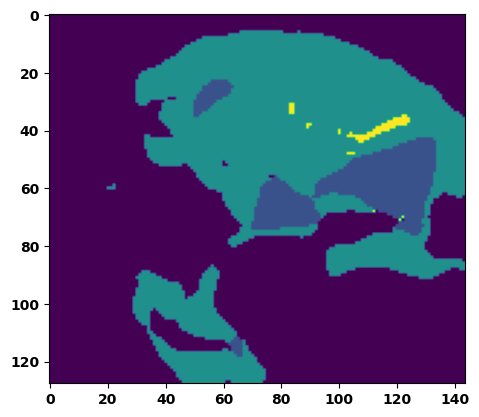

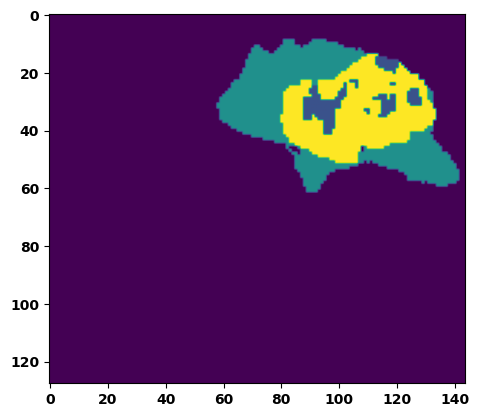

 89%|████████▉ | 32/36 [00:34<00:04,  1.07s/it]

Batch_id:  31 Eval loss:  0.8771308660507202
Batch_id:  31 Eval IoU:  tensor(0.0694, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5958, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3095, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.1973, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.6224308013916016
Batch_id:  32 Eval IoU:  tensor(0.3229, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9700, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.737914502620697
Batch_id:  33 Eval IoU:  tensor(0.2308, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8802, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8798, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.10s/it]

Batch_id:  34 Eval loss:  0.518851637840271
Batch_id:  34 Eval IoU:  tensor(0.3769, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9772, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.41903531551361084
Batch_id:  35 Eval IoU:  tensor(0.4953, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8568, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7156, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7327, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')
Epoch  28 Training loss:  0.14090512096881866
Epoch  28 Evaluation loss:  0.6176899365252919
Epoch  28 Training accuracy :  tensor(0.7906)
Epoch  28 Evaluation accuracy :  tensor(0.3213)
Epoch  28 Training Mean Dice Score:  tensor(0.9884)
Epoch  28 Eval Mean Dice Score:  tensor(0.8626)
Epoch  28 Training Non-tumor Dice Score:  tensor(0.9851)
Epoch  28 Eval Non-tumor Dice Score:  tensor(0.7680)
Epoch  28 Training NCR/NET Dice Score:  tensor(0.9930)
Epoch  28 Eval NCR/NET Dice Score:  tensor(0.9625)
Epoch  28 Training ED Dice Score:  tensor(0.9

Epoch: 29
Training in session: 


  1%|          | 1/110 [00:01<02:12,  1.22s/it]

Batch_id:  0 Training loss:  0.1323886513710022
Batch_id:  0 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:08,  1.19s/it]

Batch_id:  1 Training loss:  0.058930009603500366
Batch_id:  1 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.14s/it]

Batch_id:  2 Training loss:  0.05280637741088867
Batch_id:  2 Training IoU:  tensor(0.9078, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.14453068375587463
Batch_id:  3 Training IoU:  tensor(0.7756, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:57,  1.12s/it]

Batch_id:  4 Training loss:  0.10570105910301208
Batch_id:  4 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.0634644478559494
Batch_id:  5 Training IoU:  tensor(0.8899, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.13710755109786987
Batch_id:  6 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.34602925181388855
Batch_id:  7 Training IoU:  tensor(0.6035, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:51,  1.10s/it]

Batch_id:  8 Training loss:  0.10467974841594696
Batch_id:  8 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:51,  1.11s/it]

Batch_id:  9 Training loss:  0.060558319091796875
Batch_id:  9 Training IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 10%|█         | 11/110 [00:12<01:48,  1.10s/it]

Batch_id:  10 Training loss:  0.1913837492465973
Batch_id:  10 Training IoU:  tensor(0.7091, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.10s/it]

Batch_id:  11 Training loss:  0.04844510555267334
Batch_id:  11 Training IoU:  tensor(0.9339, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:45,  1.09s/it]

Batch_id:  12 Training loss:  0.04799734055995941
Batch_id:  12 Training IoU:  tensor(0.9207, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.08806495368480682
Batch_id:  13 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.05292533338069916
Batch_id:  14 Training IoU:  tensor(0.9105, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:46,  1.14s/it]

Batch_id:  15 Training loss:  0.0867329090833664
Batch_id:  15 Training IoU:  tensor(0.8508, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:42,  1.11s/it]

Batch_id:  16 Training loss:  0.37371963262557983
Batch_id:  16 Training IoU:  tensor(0.5383, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:40,  1.10s/it]

Batch_id:  17 Training loss:  0.20885533094406128
Batch_id:  17 Training IoU:  tensor(0.6905, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:40,  1.11s/it]

Batch_id:  18 Training loss:  0.12488332390785217
Batch_id:  18 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.13663432002067566
Batch_id:  19 Training IoU:  tensor(0.7752, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:36,  1.09s/it]

Batch_id:  20 Training loss:  0.20528291165828705
Batch_id:  20 Training IoU:  tensor(0.7315, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.07s/it]

Batch_id:  21 Training loss:  0.23082594573497772
Batch_id:  21 Training IoU:  tensor(0.6964, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 21%|██        | 23/110 [00:25<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.06614969670772552
Batch_id:  22 Training IoU:  tensor(0.8856, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.20200909674167633
Batch_id:  23 Training IoU:  tensor(0.6869, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:29,  1.06s/it]

Batch_id:  24 Training loss:  0.2002255618572235
Batch_id:  24 Training IoU:  tensor(0.7149, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:29,  1.07s/it]

Batch_id:  25 Training loss:  0.1302718073129654
Batch_id:  25 Training IoU:  tensor(0.7857, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.08s/it]

Batch_id:  26 Training loss:  0.049440786242485046
Batch_id:  26 Training IoU:  tensor(0.9139, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.16343571245670319
Batch_id:  27 Training IoU:  tensor(0.7477, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:29,  1.11s/it]

Batch_id:  28 Training loss:  0.08497078716754913
Batch_id:  28 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.10s/it]

Batch_id:  29 Training loss:  0.06305044889450073
Batch_id:  29 Training IoU:  tensor(0.8958, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:26,  1.10s/it]

Batch_id:  30 Training loss:  0.088844895362854
Batch_id:  30 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:24,  1.09s/it]

Batch_id:  31 Training loss:  0.19716776907444
Batch_id:  31 Training IoU:  tensor(0.7203, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.20432518422603607
Batch_id:  32 Training IoU:  tensor(0.6850, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.09s/it]

Batch_id:  33 Training loss:  0.14266148209571838
Batch_id:  33 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:19,  1.06s/it]

Batch_id:  34 Training loss:  0.13566651940345764
Batch_id:  34 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.3252749741077423
Batch_id:  35 Training IoU:  tensor(0.6451, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:17,  1.06s/it]

Batch_id:  36 Training loss:  0.15445315837860107
Batch_id:  36 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.07094410061836243
Batch_id:  37 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.06531356275081635
Batch_id:  38 Training IoU:  tensor(0.8888, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:14,  1.06s/it]

Batch_id:  39 Training loss:  0.07094752788543701
Batch_id:  39 Training IoU:  tensor(0.8783, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:12,  1.05s/it]

Batch_id:  40 Training loss:  0.08111929893493652
Batch_id:  40 Training IoU:  tensor(0.8582, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:18,  1.15s/it]

Batch_id:  41 Training loss:  0.2550332546234131
Batch_id:  41 Training IoU:  tensor(0.6836, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.17300628125667572
Batch_id:  42 Training IoU:  tensor(0.7317, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 40%|████      | 44/110 [00:48<01:13,  1.11s/it]

Batch_id:  43 Training loss:  0.2611389756202698
Batch_id:  43 Training IoU:  tensor(0.6171, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 41%|████      | 45/110 [00:49<01:11,  1.10s/it]

Batch_id:  44 Training loss:  0.15164676308631897
Batch_id:  44 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:11,  1.12s/it]

Batch_id:  45 Training loss:  0.06391981244087219
Batch_id:  45 Training IoU:  tensor(0.8880, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:10,  1.12s/it]

Batch_id:  46 Training loss:  0.19033552706241608
Batch_id:  46 Training IoU:  tensor(0.7457, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:09,  1.11s/it]

Batch_id:  47 Training loss:  0.3223973214626312
Batch_id:  47 Training IoU:  tensor(0.6440, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.06408953666687012
Batch_id:  48 Training IoU:  tensor(0.8905, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.094292551279068
Batch_id:  49 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.14729417860507965
Batch_id:  50 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.10s/it]

Batch_id:  51 Training loss:  0.08170711994171143
Batch_id:  51 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.24861092865467072
Batch_id:  52 Training IoU:  tensor(0.6674, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 49%|████▉     | 54/110 [00:59<00:59,  1.06s/it]

Batch_id:  53 Training loss:  0.12840266525745392
Batch_id:  53 Training IoU:  tensor(0.8090, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:57,  1.05s/it]

Batch_id:  54 Training loss:  0.06336812674999237
Batch_id:  54 Training IoU:  tensor(0.8888, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.10731959342956543
Batch_id:  55 Training IoU:  tensor(0.8257, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.06s/it]

Batch_id:  56 Training loss:  0.0851927250623703
Batch_id:  56 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.07842044532299042
Batch_id:  57 Training IoU:  tensor(0.8650, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.42411091923713684
Batch_id:  58 Training IoU:  tensor(0.4974, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.08663271367549896
Batch_id:  59 Training IoU:  tensor(0.8593, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.08s/it]

Batch_id:  60 Training loss:  0.07247370481491089
Batch_id:  60 Training IoU:  tensor(0.8738, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.19391199946403503
Batch_id:  61 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.08852691948413849
Batch_id:  62 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.08772037923336029
Batch_id:  63 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:50,  1.11s/it]

Batch_id:  64 Training loss:  0.13225524127483368
Batch_id:  64 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:49,  1.13s/it]

Batch_id:  65 Training loss:  0.0709524005651474
Batch_id:  65 Training IoU:  tensor(0.8830, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:48,  1.14s/it]

Batch_id:  66 Training loss:  0.23384054005146027
Batch_id:  66 Training IoU:  tensor(0.6852, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:47,  1.12s/it]

Batch_id:  67 Training loss:  0.058173343539237976
Batch_id:  67 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:46,  1.12s/it]

Batch_id:  68 Training loss:  0.1570717692375183
Batch_id:  68 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:44,  1.11s/it]

Batch_id:  69 Training loss:  0.1569478064775467
Batch_id:  69 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:43,  1.12s/it]

Batch_id:  70 Training loss:  0.08400800824165344
Batch_id:  70 Training IoU:  tensor(0.8544, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:41,  1.10s/it]

Batch_id:  71 Training loss:  0.08311359584331512
Batch_id:  71 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:43,  1.18s/it]

Batch_id:  72 Training loss:  0.06150166690349579
Batch_id:  72 Training IoU:  tensor(0.8923, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:42,  1.19s/it]

Batch_id:  73 Training loss:  0.4762073755264282
Batch_id:  73 Training IoU:  tensor(0.4497, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:40,  1.16s/it]

Batch_id:  74 Training loss:  0.19219422340393066
Batch_id:  74 Training IoU:  tensor(0.7053, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:39,  1.15s/it]

Batch_id:  75 Training loss:  0.17405107617378235
Batch_id:  75 Training IoU:  tensor(0.7248, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:37,  1.15s/it]

Batch_id:  76 Training loss:  0.13570235669612885
Batch_id:  76 Training IoU:  tensor(0.7727, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:37,  1.16s/it]

Batch_id:  77 Training loss:  0.10028737783432007
Batch_id:  77 Training IoU:  tensor(0.8252, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:35,  1.16s/it]

Batch_id:  78 Training loss:  0.07875441014766693
Batch_id:  78 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:34,  1.14s/it]

Batch_id:  79 Training loss:  0.3742322325706482
Batch_id:  79 Training IoU:  tensor(0.5096, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.12s/it]

Batch_id:  80 Training loss:  0.15012875199317932
Batch_id:  80 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:31,  1.12s/it]

Batch_id:  81 Training loss:  0.1422644406557083
Batch_id:  81 Training IoU:  tensor(0.7767, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.10046833753585815
Batch_id:  82 Training IoU:  tensor(0.8407, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.0910913497209549
Batch_id:  83 Training IoU:  tensor(0.8456, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.14860175549983978
Batch_id:  84 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9719, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.180792436003685
Batch_id:  85 Training IoU:  tensor(0.7196, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.12584124505519867
Batch_id:  86 Training IoU:  tensor(0.7868, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.10s/it]

Batch_id:  87 Training loss:  0.09943374991416931
Batch_id:  87 Training IoU:  tensor(0.8322, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:23,  1.13s/it]

Batch_id:  88 Training loss:  0.04588638246059418
Batch_id:  88 Training IoU:  tensor(0.9177, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.14s/it]

Batch_id:  89 Training loss:  0.12331691384315491
Batch_id:  89 Training IoU:  tensor(0.8631, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.1572030782699585
Batch_id:  90 Training IoU:  tensor(0.7474, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.13893307745456696
Batch_id:  91 Training IoU:  tensor(0.7693, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.11168046295642853
Batch_id:  92 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:18,  1.13s/it]

Batch_id:  93 Training loss:  0.183340385556221
Batch_id:  93 Training IoU:  tensor(0.7096, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.12s/it]

Batch_id:  94 Training loss:  0.15290133655071259
Batch_id:  94 Training IoU:  tensor(0.7926, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.13s/it]

Batch_id:  95 Training loss:  0.09684091806411743
Batch_id:  95 Training IoU:  tensor(0.8449, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.1305333524942398
Batch_id:  96 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:13,  1.11s/it]

Batch_id:  97 Training loss:  0.10967189073562622
Batch_id:  97 Training IoU:  tensor(0.8143, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.11798423528671265
Batch_id:  98 Training IoU:  tensor(0.8138, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.0918501615524292
Batch_id:  99 Training IoU:  tensor(0.8511, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.17139001190662384
Batch_id:  100 Training IoU:  tensor(0.7665, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.12321171164512634
Batch_id:  101 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.11s/it]

Batch_id:  102 Training loss:  0.07269302010536194
Batch_id:  102 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.09s/it]

Batch_id:  103 Training loss:  0.3342234790325165
Batch_id:  103 Training IoU:  tensor(0.6088, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.08500796556472778
Batch_id:  104 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.1127958744764328
Batch_id:  105 Training IoU:  tensor(0.8107, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.1729903221130371
Batch_id:  106 Training IoU:  tensor(0.7221, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.0797947496175766
Batch_id:  107 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.15732353925704956
Batch_id:  108 Training IoU:  tensor(0.7548, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.11928486824035645
Batch_id:  109 Training IoU:  tensor(0.8007, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9850, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7209372520446777
Batch_id:  0 Eval IoU:  tensor(0.1777, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7131, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.4998, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7693, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.6123, device='cuda:0')


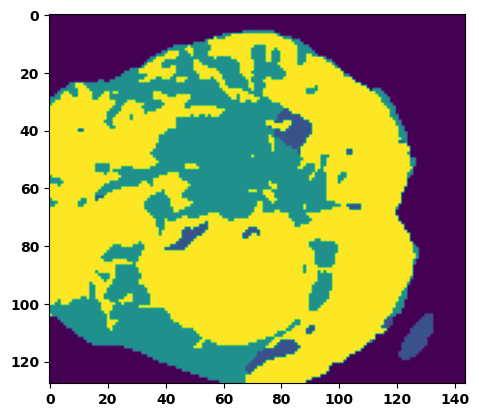

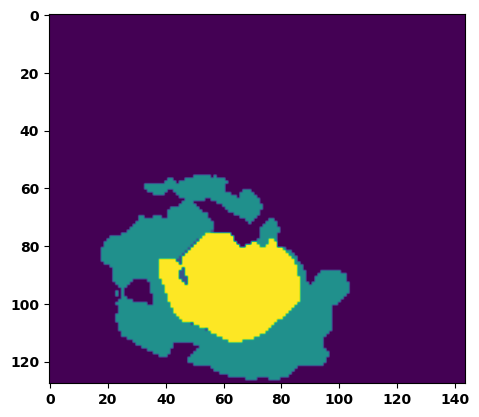

  6%|▌         | 2/36 [00:02<00:38,  1.12s/it]

Batch_id:  1 Eval loss:  0.7286783456802368
Batch_id:  1 Eval IoU:  tensor(0.2227, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8745, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8017, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8910, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8564, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.12s/it]

Batch_id:  2 Eval loss:  0.7666592597961426
Batch_id:  2 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 11%|█         | 4/36 [00:04<00:36,  1.14s/it]

Batch_id:  3 Eval loss:  0.7631518840789795
Batch_id:  3 Eval IoU:  tensor(0.2244, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8981, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.09s/it]

Batch_id:  4 Eval loss:  0.14349709451198578
Batch_id:  4 Eval IoU:  tensor(0.7634, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9872, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.08s/it]

Batch_id:  5 Eval loss:  0.7676393985748291
Batch_id:  5 Eval IoU:  tensor(0.2118, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8401, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.06s/it]

Batch_id:  6 Eval loss:  0.7562988996505737
Batch_id:  6 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.04s/it]

Batch_id:  7 Eval loss:  0.7634799480438232
Batch_id:  7 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.02s/it]

Batch_id:  8 Eval loss:  0.764426589012146
Batch_id:  8 Eval IoU:  tensor(0.2219, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8888, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.04s/it]

Batch_id:  9 Eval loss:  0.14862719178199768
Batch_id:  9 Eval IoU:  tensor(0.7522, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  10 Eval loss:  0.766036868095398
Batch_id:  10 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


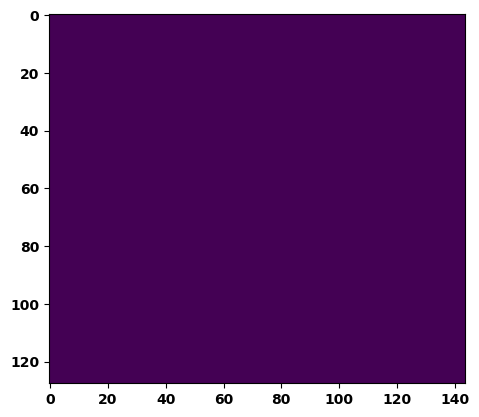

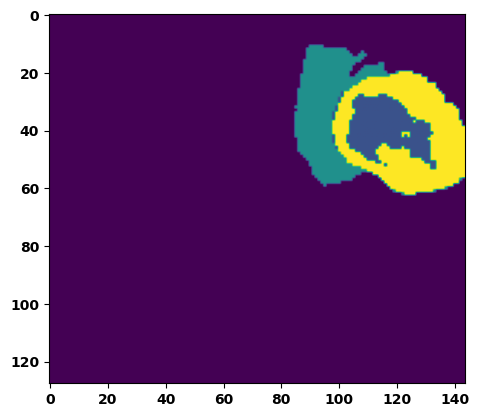

 33%|███▎      | 12/36 [00:12<00:25,  1.05s/it]

Batch_id:  11 Eval loss:  0.7485986351966858
Batch_id:  11 Eval IoU:  tensor(0.2391, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9007, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8056, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.03s/it]

Batch_id:  12 Eval loss:  0.6549749374389648
Batch_id:  12 Eval IoU:  tensor(0.2492, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6355, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3227, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.5750, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.6708, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.02s/it]

Batch_id:  13 Eval loss:  0.7653771042823792
Batch_id:  13 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.04s/it]

Batch_id:  14 Eval loss:  0.35701364278793335
Batch_id:  14 Eval IoU:  tensor(0.5721, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9889, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.05s/it]

Batch_id:  15 Eval loss:  0.4874569773674011
Batch_id:  15 Eval IoU:  tensor(0.3990, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8301, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6734, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.7048, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9885, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.06s/it]

Batch_id:  16 Eval loss:  0.24270778894424438
Batch_id:  16 Eval IoU:  tensor(0.6548, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.7643163800239563
Batch_id:  17 Eval IoU:  tensor(0.2226, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.09s/it]

Batch_id:  18 Eval loss:  0.7522767782211304
Batch_id:  18 Eval IoU:  tensor(0.2361, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.05s/it]

Batch_id:  19 Eval loss:  0.7315244674682617
Batch_id:  19 Eval IoU:  tensor(0.1843, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7644, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5809, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.5377, device='cuda:0')
Batch_id:  20 Eval loss:  0.7691277265548706
Batch_id:  20 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


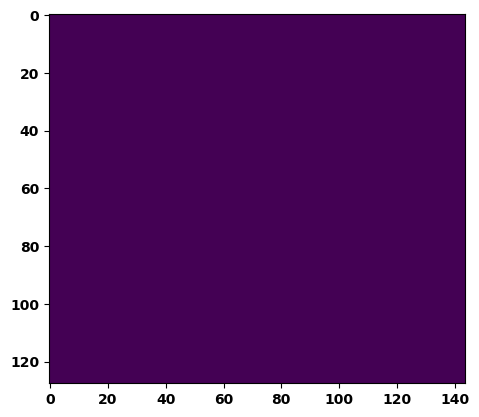

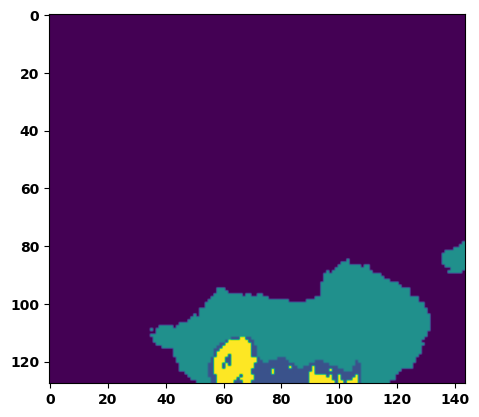

 61%|██████    | 22/36 [00:23<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.7747753262519836
Batch_id:  21 Eval IoU:  tensor(0.1838, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8355, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7095, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.8893, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8880, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.760266900062561
Batch_id:  22 Eval IoU:  tensor(0.2288, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.06s/it]

Batch_id:  23 Eval loss:  0.3301514685153961
Batch_id:  23 Eval IoU:  tensor(0.5940, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9726, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7142441272735596
Batch_id:  24 Eval IoU:  tensor(0.2359, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8599, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8435, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8692, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8067, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9201, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.751782238483429
Batch_id:  25 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.04s/it]

Batch_id:  26 Eval loss:  0.7219980955123901
Batch_id:  26 Eval IoU:  tensor(0.2548, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.8261206150054932
Batch_id:  27 Eval IoU:  tensor(0.1298, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7531, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5184, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8285, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.7382, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.03s/it]

Batch_id:  28 Eval loss:  0.753510057926178
Batch_id:  28 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.02s/it]

Batch_id:  29 Eval loss:  0.6438372731208801
Batch_id:  29 Eval IoU:  tensor(0.2883, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8997, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8640, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8320, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  30 Eval loss:  0.6211279630661011
Batch_id:  30 Eval IoU:  tensor(0.2580, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7614, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.5890, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.5808, device='cuda:0')


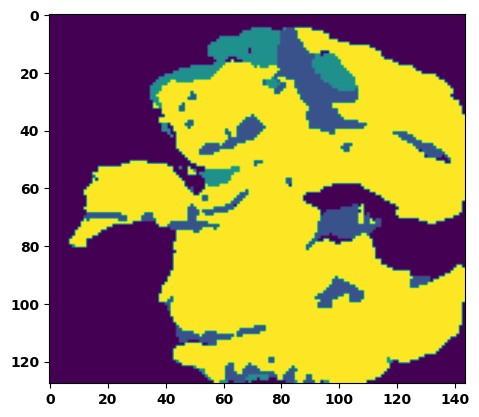

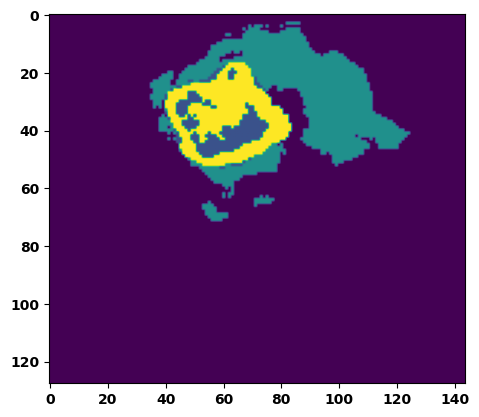

 89%|████████▉ | 32/36 [00:33<00:04,  1.07s/it]

Batch_id:  31 Eval loss:  0.4332161545753479
Batch_id:  31 Eval IoU:  tensor(0.4616, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8637, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.7512, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8023, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.07s/it]

Batch_id:  32 Eval loss:  0.7752881646156311
Batch_id:  32 Eval IoU:  tensor(0.1378, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6521, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3894, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.3063, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.05s/it]

Batch_id:  33 Eval loss:  0.8817732334136963
Batch_id:  33 Eval IoU:  tensor(0.0753, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6227, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4196, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.2454, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.7757374048233032
Batch_id:  34 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]

Batch_id:  35 Eval loss:  0.7571280002593994
Batch_id:  35 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Epoch  29 Training loss:  0.1405867726965384
Epoch  29 Evaluation loss:  0.6634378942350546
Epoch  29 Training accuracy :  tensor(0.7912)
Epoch  29 Evaluation accuracy :  tensor(0.2899)
Epoch  29 Training Mean Dice Score:  tensor(0.9885)
Epoch  29 Eval Mean Dice Score:  tensor(0.8901)
Epoch  29 Training Non-tumor Dice Score:  tensor(0.9852)
Epoch  29 Eval Non-tumor Dice Score:  tensor(0.8099)
Epoch  29 Training NCR/NET Dice Score:  tensor(0.9929)
Epoch  29 Eval NCR/NET Dice Score:  tensor(0.9588)
Epoch  29 Training ED Dice Score:  tensor(0.983

Epoch: 30
Training in session: 


  1%|          | 1/110 [00:01<01:54,  1.05s/it]

Batch_id:  0 Training loss:  0.15196309983730316
Batch_id:  0 Training IoU:  tensor(0.7548, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.08578912913799286
Batch_id:  1 Training IoU:  tensor(0.8521, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.11798907816410065
Batch_id:  2 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:54,  1.08s/it]

Batch_id:  3 Training loss:  0.08964627981185913
Batch_id:  3 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:55,  1.10s/it]

Batch_id:  4 Training loss:  0.0652540773153305
Batch_id:  4 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.09612701833248138
Batch_id:  5 Training IoU:  tensor(0.8378, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.10s/it]

Batch_id:  6 Training loss:  0.05124014616012573
Batch_id:  6 Training IoU:  tensor(0.9260, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:53,  1.11s/it]

Batch_id:  7 Training loss:  0.08192895352840424
Batch_id:  7 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:56,  1.15s/it]

Batch_id:  8 Training loss:  0.21034277975559235
Batch_id:  8 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:53,  1.13s/it]

Batch_id:  9 Training loss:  0.1852121502161026
Batch_id:  9 Training IoU:  tensor(0.7167, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 10%|█         | 11/110 [00:12<01:51,  1.13s/it]

Batch_id:  10 Training loss:  0.14666932821273804
Batch_id:  10 Training IoU:  tensor(0.7962, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 11%|█         | 12/110 [00:13<01:49,  1.12s/it]

Batch_id:  11 Training loss:  0.13783958554267883
Batch_id:  11 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.11s/it]

Batch_id:  12 Training loss:  0.16881687939167023
Batch_id:  12 Training IoU:  tensor(0.7282, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:51,  1.16s/it]

Batch_id:  13 Training loss:  0.23465949296951294
Batch_id:  13 Training IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:54,  1.21s/it]

Batch_id:  14 Training loss:  0.1264309287071228
Batch_id:  14 Training IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:52,  1.20s/it]

Batch_id:  15 Training loss:  0.08055651187896729
Batch_id:  15 Training IoU:  tensor(0.8594, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:49,  1.18s/it]

Batch_id:  16 Training loss:  0.1517849564552307
Batch_id:  16 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:46,  1.15s/it]

Batch_id:  17 Training loss:  0.1485319882631302
Batch_id:  17 Training IoU:  tensor(0.7599, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:44,  1.14s/it]

Batch_id:  18 Training loss:  0.1781981736421585
Batch_id:  18 Training IoU:  tensor(0.7247, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:41,  1.13s/it]

Batch_id:  19 Training loss:  0.15859359502792358
Batch_id:  19 Training IoU:  tensor(0.7536, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:38,  1.10s/it]

Batch_id:  20 Training loss:  0.08940479159355164
Batch_id:  20 Training IoU:  tensor(0.8568, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 20%|██        | 22/110 [00:24<01:36,  1.10s/it]

Batch_id:  21 Training loss:  0.11462868750095367
Batch_id:  21 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 21%|██        | 23/110 [00:25<01:36,  1.11s/it]

Batch_id:  22 Training loss:  0.12748996913433075
Batch_id:  22 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:36,  1.13s/it]

Batch_id:  23 Training loss:  0.25580117106437683
Batch_id:  23 Training IoU:  tensor(0.6812, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:36,  1.14s/it]

Batch_id:  24 Training loss:  0.24630211293697357
Batch_id:  24 Training IoU:  tensor(0.6703, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:34,  1.12s/it]

Batch_id:  25 Training loss:  0.04975135624408722
Batch_id:  25 Training IoU:  tensor(0.9180, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:32,  1.11s/it]

Batch_id:  26 Training loss:  0.10696592926979065
Batch_id:  26 Training IoU:  tensor(0.8275, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:34,  1.16s/it]

Batch_id:  27 Training loss:  0.10193449258804321
Batch_id:  27 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:32,  1.14s/it]

Batch_id:  28 Training loss:  0.3703712821006775
Batch_id:  28 Training IoU:  tensor(0.5395, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:29,  1.12s/it]

Batch_id:  29 Training loss:  0.13636919856071472
Batch_id:  29 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:28,  1.12s/it]

Batch_id:  30 Training loss:  0.15773944556713104
Batch_id:  30 Training IoU:  tensor(0.7498, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:26,  1.10s/it]

Batch_id:  31 Training loss:  0.15961796045303345
Batch_id:  31 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 30%|███       | 33/110 [00:37<01:24,  1.09s/it]

Batch_id:  32 Training loss:  0.17160874605178833
Batch_id:  32 Training IoU:  tensor(0.7334, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 31%|███       | 34/110 [00:38<01:23,  1.09s/it]

Batch_id:  33 Training loss:  0.3341140151023865
Batch_id:  33 Training IoU:  tensor(0.6093, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.11123375594615936
Batch_id:  34 Training IoU:  tensor(0.8117, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:19,  1.08s/it]

Batch_id:  35 Training loss:  0.13661429286003113
Batch_id:  35 Training IoU:  tensor(0.7923, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.11200211942195892
Batch_id:  36 Training IoU:  tensor(0.8105, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:18,  1.09s/it]

Batch_id:  37 Training loss:  0.1837778389453888
Batch_id:  37 Training IoU:  tensor(0.7095, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.08095104992389679
Batch_id:  38 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:15,  1.07s/it]

Batch_id:  39 Training loss:  0.08480030298233032
Batch_id:  39 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:13,  1.06s/it]

Batch_id:  40 Training loss:  0.14763641357421875
Batch_id:  40 Training IoU:  tensor(0.7661, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:13,  1.07s/it]

Batch_id:  41 Training loss:  0.04777418076992035
Batch_id:  41 Training IoU:  tensor(0.9141, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:15,  1.13s/it]

Batch_id:  42 Training loss:  0.087580606341362
Batch_id:  42 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 40%|████      | 44/110 [00:49<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.3170052170753479
Batch_id:  43 Training IoU:  tensor(0.6530, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 41%|████      | 45/110 [00:50<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.1994284689426422
Batch_id:  44 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.08765837550163269
Batch_id:  45 Training IoU:  tensor(0.8470, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:06,  1.05s/it]

Batch_id:  46 Training loss:  0.14999057352542877
Batch_id:  46 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:06,  1.08s/it]

Batch_id:  47 Training loss:  0.08754204213619232
Batch_id:  47 Training IoU:  tensor(0.8578, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:04,  1.05s/it]

Batch_id:  48 Training loss:  0.14236465096473694
Batch_id:  48 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:02,  1.05s/it]

Batch_id:  49 Training loss:  0.07252451777458191
Batch_id:  49 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:01,  1.03s/it]

Batch_id:  50 Training loss:  0.08848650753498077
Batch_id:  50 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:00,  1.04s/it]

Batch_id:  51 Training loss:  0.09677430987358093
Batch_id:  51 Training IoU:  tensor(0.8454, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 48%|████▊     | 53/110 [00:58<00:58,  1.03s/it]

Batch_id:  52 Training loss:  0.0716954916715622
Batch_id:  52 Training IoU:  tensor(0.8754, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.07377812266349792
Batch_id:  53 Training IoU:  tensor(0.8689, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.09s/it]

Batch_id:  54 Training loss:  0.062416523694992065
Batch_id:  54 Training IoU:  tensor(0.8910, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:57,  1.07s/it]

Batch_id:  55 Training loss:  0.06353148818016052
Batch_id:  55 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.09s/it]

Batch_id:  56 Training loss:  0.11292850971221924
Batch_id:  56 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.206317737698555
Batch_id:  57 Training IoU:  tensor(0.7063, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.07267241179943085
Batch_id:  58 Training IoU:  tensor(0.8848, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:52,  1.06s/it]

Batch_id:  59 Training loss:  0.33978182077407837
Batch_id:  59 Training IoU:  tensor(0.6277, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:49,  1.02s/it]

Batch_id:  60 Training loss:  0.08643320202827454
Batch_id:  60 Training IoU:  tensor(0.8514, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:49,  1.03s/it]

Batch_id:  61 Training loss:  0.05073614418506622
Batch_id:  61 Training IoU:  tensor(0.9145, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:48,  1.03s/it]

Batch_id:  62 Training loss:  0.09516797959804535
Batch_id:  62 Training IoU:  tensor(0.8334, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:47,  1.03s/it]

Batch_id:  63 Training loss:  0.19614548981189728
Batch_id:  63 Training IoU:  tensor(0.7439, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:47,  1.05s/it]

Batch_id:  64 Training loss:  0.4179966151714325
Batch_id:  64 Training IoU:  tensor(0.5047, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:45,  1.04s/it]

Batch_id:  65 Training loss:  0.07093840837478638
Batch_id:  65 Training IoU:  tensor(0.8768, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:45,  1.05s/it]

Batch_id:  66 Training loss:  0.05889064073562622
Batch_id:  66 Training IoU:  tensor(0.8976, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.06637276709079742
Batch_id:  67 Training IoU:  tensor(0.8854, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.14586487412452698
Batch_id:  68 Training IoU:  tensor(0.7755, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:42,  1.05s/it]

Batch_id:  69 Training loss:  0.07437732815742493
Batch_id:  69 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.07862783968448639
Batch_id:  70 Training IoU:  tensor(0.8636, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:39,  1.04s/it]

Batch_id:  71 Training loss:  0.14885522425174713
Batch_id:  71 Training IoU:  tensor(0.7763, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:38,  1.05s/it]

Batch_id:  72 Training loss:  0.12882906198501587
Batch_id:  72 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.10s/it]

Batch_id:  73 Training loss:  0.20289373397827148
Batch_id:  73 Training IoU:  tensor(0.7115, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:36,  1.06s/it]

Batch_id:  74 Training loss:  0.14463910460472107
Batch_id:  74 Training IoU:  tensor(0.7760, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.14071211218833923
Batch_id:  75 Training IoU:  tensor(0.7674, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:34,  1.04s/it]

Batch_id:  76 Training loss:  0.17026035487651825
Batch_id:  76 Training IoU:  tensor(0.7686, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:33,  1.03s/it]

Batch_id:  77 Training loss:  0.1307694911956787
Batch_id:  77 Training IoU:  tensor(0.7793, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:32,  1.05s/it]

Batch_id:  78 Training loss:  0.1350090354681015
Batch_id:  78 Training IoU:  tensor(0.7988, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:31,  1.04s/it]

Batch_id:  79 Training loss:  0.10602638125419617
Batch_id:  79 Training IoU:  tensor(0.8329, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:30,  1.03s/it]

Batch_id:  80 Training loss:  0.05201558768749237
Batch_id:  80 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:29,  1.05s/it]

Batch_id:  81 Training loss:  0.14956271648406982
Batch_id:  81 Training IoU:  tensor(0.7597, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:27,  1.04s/it]

Batch_id:  82 Training loss:  0.11452716588973999
Batch_id:  82 Training IoU:  tensor(0.8073, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:26,  1.03s/it]

Batch_id:  83 Training loss:  0.077277272939682
Batch_id:  83 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:25,  1.03s/it]

Batch_id:  84 Training loss:  0.15964937210083008
Batch_id:  84 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:23,  1.00it/s]

Batch_id:  85 Training loss:  0.11003507673740387
Batch_id:  85 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:23,  1.03s/it]

Batch_id:  86 Training loss:  0.13763949275016785
Batch_id:  86 Training IoU:  tensor(0.7732, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:22,  1.01s/it]

Batch_id:  87 Training loss:  0.059883058071136475
Batch_id:  87 Training IoU:  tensor(0.8958, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:21,  1.05s/it]

Batch_id:  88 Training loss:  0.07139816880226135
Batch_id:  88 Training IoU:  tensor(0.8825, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:20,  1.04s/it]

Batch_id:  89 Training loss:  0.1344713717699051
Batch_id:  89 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:20,  1.06s/it]

Batch_id:  90 Training loss:  0.20683139562606812
Batch_id:  90 Training IoU:  tensor(0.6818, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.05917106568813324
Batch_id:  91 Training IoU:  tensor(0.8985, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:19,  1.12s/it]

Batch_id:  92 Training loss:  0.35334986448287964
Batch_id:  92 Training IoU:  tensor(0.5906, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.13391970098018646
Batch_id:  93 Training IoU:  tensor(0.8014, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.08066734671592712
Batch_id:  94 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.06077423691749573
Batch_id:  95 Training IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.10s/it]

Batch_id:  96 Training loss:  0.2044592648744583
Batch_id:  96 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.11s/it]

Batch_id:  97 Training loss:  0.06127883493900299
Batch_id:  97 Training IoU:  tensor(0.8927, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.0996171087026596
Batch_id:  98 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.08161069452762604
Batch_id:  99 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:10,  1.12s/it]

Batch_id:  100 Training loss:  0.049769237637519836
Batch_id:  100 Training IoU:  tensor(0.9125, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.0906476378440857
Batch_id:  101 Training IoU:  tensor(0.8425, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.10s/it]

Batch_id:  102 Training loss:  0.26866084337234497
Batch_id:  102 Training IoU:  tensor(0.6085, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.13s/it]

Batch_id:  103 Training loss:  0.08864592015743256
Batch_id:  103 Training IoU:  tensor(0.8489, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.20925776660442352
Batch_id:  104 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.47312501072883606
Batch_id:  105 Training IoU:  tensor(0.4509, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.23220720887184143
Batch_id:  106 Training IoU:  tensor(0.6881, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.3700368404388428
Batch_id:  107 Training IoU:  tensor(0.5135, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.10s/it]

Batch_id:  108 Training loss:  0.08818788826465607
Batch_id:  108 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.15894663333892822
Batch_id:  109 Training IoU:  tensor(0.7441, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9921, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.22944748401641846
Batch_id:  0 Eval IoU:  tensor(0.6733, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9943, device='cuda:0')


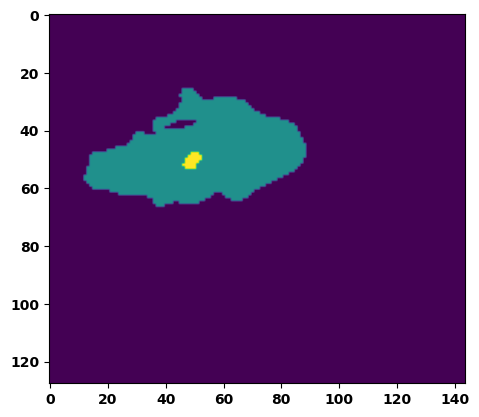

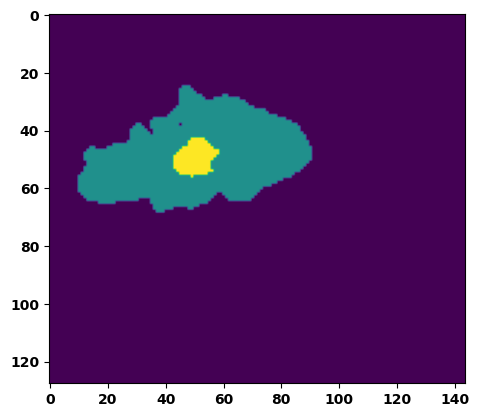

  6%|▌         | 2/36 [00:02<00:37,  1.11s/it]

Batch_id:  1 Eval loss:  0.7517896890640259
Batch_id:  1 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.07s/it]

Batch_id:  2 Eval loss:  0.7691564559936523
Batch_id:  2 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.02s/it]

Batch_id:  3 Eval loss:  0.6576032638549805
Batch_id:  3 Eval IoU:  tensor(0.2426, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6314, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3162, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.5067, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.7322, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.02s/it]

Batch_id:  4 Eval loss:  0.8831754326820374
Batch_id:  4 Eval IoU:  tensor(0.0742, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6208, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4158, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2417, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7150542140007019
Batch_id:  5 Eval IoU:  tensor(0.1947, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7679, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.5857, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.5499, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.05s/it]

Batch_id:  6 Eval loss:  0.7634592056274414
Batch_id:  6 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.08s/it]

Batch_id:  7 Eval loss:  0.7665174007415771
Batch_id:  7 Eval IoU:  tensor(0.2061, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8762, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8156, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8916, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:30,  1.11s/it]

Batch_id:  8 Eval loss:  0.7301919460296631
Batch_id:  8 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.11s/it]

Batch_id:  9 Eval loss:  0.7666679620742798
Batch_id:  9 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  10 Eval loss:  0.36067309975624084
Batch_id:  10 Eval IoU:  tensor(0.5610, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9882, device='cuda:0')


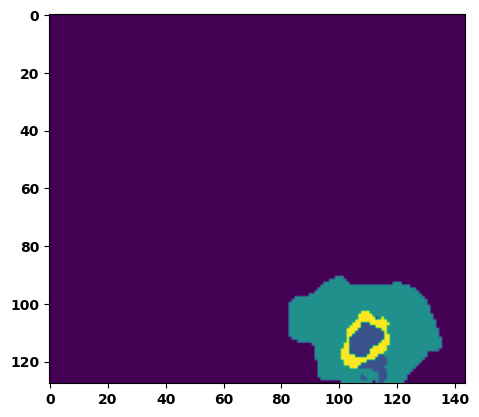

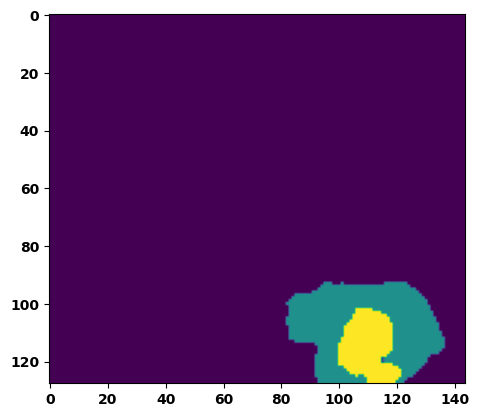

 33%|███▎      | 12/36 [00:13<00:26,  1.12s/it]

Batch_id:  11 Eval loss:  0.7562968730926514
Batch_id:  11 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.11s/it]

Batch_id:  12 Eval loss:  0.7653828263282776
Batch_id:  12 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.6363497376441956
Batch_id:  13 Eval IoU:  tensor(0.3115, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8589, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.14s/it]

Batch_id:  14 Eval loss:  0.4905593991279602
Batch_id:  14 Eval IoU:  tensor(0.4272, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.13s/it]

Batch_id:  15 Eval loss:  0.5003752112388611
Batch_id:  15 Eval IoU:  tensor(0.3920, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7921, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5998, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.6116, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:21,  1.12s/it]

Batch_id:  16 Eval loss:  0.45885127782821655
Batch_id:  16 Eval IoU:  tensor(0.4284, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8623, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7413, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.7489, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.10s/it]

Batch_id:  17 Eval loss:  0.7039965391159058
Batch_id:  17 Eval IoU:  tensor(0.2656, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.10s/it]

Batch_id:  18 Eval loss:  0.7596492171287537
Batch_id:  18 Eval IoU:  tensor(0.2161, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9196, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8419, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.09s/it]

Batch_id:  19 Eval loss:  0.7213112711906433
Batch_id:  19 Eval IoU:  tensor(0.1776, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7161, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5058, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.6870, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.6897, device='cuda:0')
Batch_id:  20 Eval loss:  0.10041475296020508
Batch_id:  20 Eval IoU:  tensor(0.8281, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


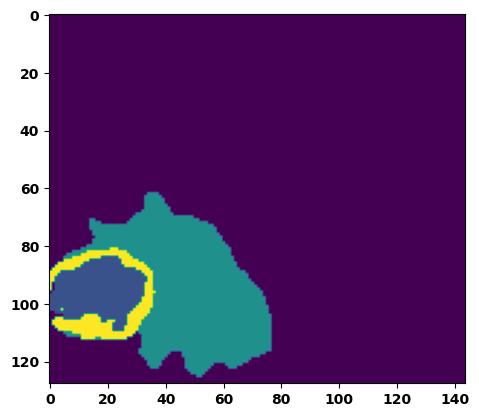

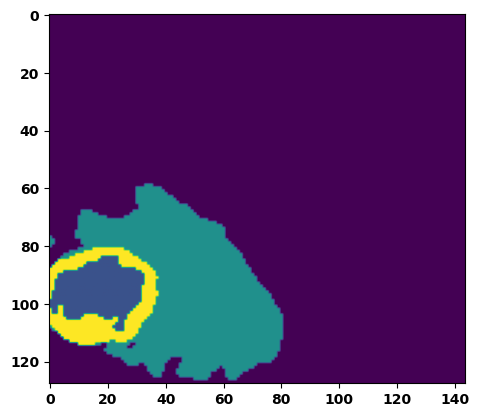

 61%|██████    | 22/36 [00:24<00:15,  1.10s/it]

Batch_id:  21 Eval loss:  0.7484323382377625
Batch_id:  21 Eval IoU:  tensor(0.2394, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8053, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.10s/it]

Batch_id:  22 Eval loss:  0.6765866875648499
Batch_id:  22 Eval IoU:  tensor(0.2635, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8864, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8269, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8878, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8816, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.2012629359960556
Batch_id:  23 Eval IoU:  tensor(0.6857, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9811, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:11,  1.09s/it]

Batch_id:  24 Eval loss:  0.7305461764335632
Batch_id:  24 Eval IoU:  tensor(0.2081, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8250, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.7287, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8728, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.7768, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9216, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.09s/it]

Batch_id:  25 Eval loss:  0.6092056632041931
Batch_id:  25 Eval IoU:  tensor(0.2704, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7188, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4822, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.5062, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.06s/it]

Batch_id:  26 Eval loss:  0.7535193562507629
Batch_id:  26 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.05s/it]

Batch_id:  27 Eval loss:  0.766045331954956
Batch_id:  27 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.02s/it]

Batch_id:  28 Eval loss:  0.7554199695587158
Batch_id:  28 Eval IoU:  tensor(0.2292, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9031, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.02s/it]

Batch_id:  29 Eval loss:  0.7757452726364136
Batch_id:  29 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  30 Eval loss:  0.7641648650169373
Batch_id:  30 Eval IoU:  tensor(0.2229, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8918, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


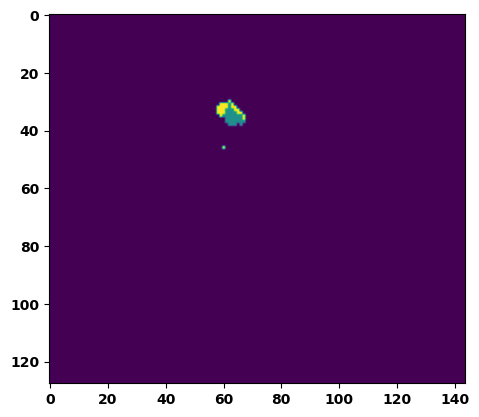

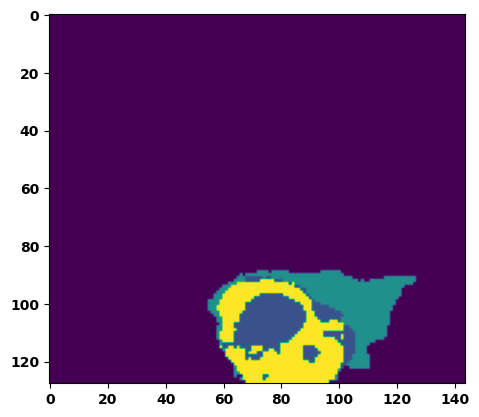

 89%|████████▉ | 32/36 [00:34<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.7554466128349304
Batch_id:  31 Eval IoU:  tensor(0.1852, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7970, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6626, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8528, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.7569, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9157, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.05s/it]

Batch_id:  32 Eval loss:  0.3591904044151306
Batch_id:  32 Eval IoU:  tensor(0.5583, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9709, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.7458518147468567
Batch_id:  33 Eval IoU:  tensor(0.1611, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6534, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3858, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.3109, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.7474808692932129
Batch_id:  34 Eval IoU:  tensor(0.2316, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8956, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.08s/it]

Batch_id:  35 Eval loss:  0.7571364641189575
Batch_id:  35 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Epoch 00031: reducing learning rate of group 0 to 3.1250e-05.
Epoch  30 Training loss:  0.14012827466834676
Epoch  30 Evaluation loss:  0.650915500604444
Epoch  30 Training accuracy :  tensor(0.7916)
Epoch  30 Evaluation accuracy :  tensor(0.2988)
Epoch  30 Training Mean Dice Score:  tensor(0.9885)
Epoch  30 Eval Mean Dice Score:  tensor(0.8907)
Epoch  30 Training Non-tumor Dice Score:  tensor(0.9854)
Epoch  30 Eval Non-tumor Dice Score:  tensor(0.8118)
Epoch  30 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  30 Eval NCR/NET Dice Score:  


  1%|          | 1/110 [00:01<02:19,  1.28s/it]

Batch_id:  0 Training loss:  0.3482798635959625
Batch_id:  0 Training IoU:  tensor(0.5981, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:08,  1.19s/it]

Batch_id:  1 Training loss:  0.09949800372123718
Batch_id:  1 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:03,  1.16s/it]

Batch_id:  2 Training loss:  0.10968835651874542
Batch_id:  2 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.13254229724407196
Batch_id:  3 Training IoU:  tensor(0.7829, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:56,  1.11s/it]

Batch_id:  4 Training loss:  0.18137234449386597
Batch_id:  4 Training IoU:  tensor(0.7349, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.1483541578054428
Batch_id:  5 Training IoU:  tensor(0.7612, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9719, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:52,  1.10s/it]

Batch_id:  6 Training loss:  0.08800803124904633
Batch_id:  6 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:53,  1.12s/it]

Batch_id:  7 Training loss:  0.20297881960868835
Batch_id:  7 Training IoU:  tensor(0.6975, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:52,  1.12s/it]

Batch_id:  8 Training loss:  0.17913848161697388
Batch_id:  8 Training IoU:  tensor(0.7854, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:48,  1.09s/it]

Batch_id:  9 Training loss:  0.12985128164291382
Batch_id:  9 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 10%|█         | 11/110 [00:12<01:46,  1.07s/it]

Batch_id:  10 Training loss:  0.05999629199504852
Batch_id:  10 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 11%|█         | 12/110 [00:13<01:43,  1.06s/it]

Batch_id:  11 Training loss:  0.14079523086547852
Batch_id:  11 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:43,  1.06s/it]

Batch_id:  12 Training loss:  0.08789704740047455
Batch_id:  12 Training IoU:  tensor(0.8473, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:46,  1.11s/it]

Batch_id:  13 Training loss:  0.05926625430583954
Batch_id:  13 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.07990266382694244
Batch_id:  14 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.313909113407135
Batch_id:  15 Training IoU:  tensor(0.6568, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.08737777173519135
Batch_id:  16 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:37,  1.06s/it]

Batch_id:  17 Training loss:  0.14641372859477997
Batch_id:  17 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:34,  1.04s/it]

Batch_id:  18 Training loss:  0.06961430609226227
Batch_id:  18 Training IoU:  tensor(0.8793, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:32,  1.03s/it]

Batch_id:  19 Training loss:  0.10342825949192047
Batch_id:  19 Training IoU:  tensor(0.8389, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:32,  1.04s/it]

Batch_id:  20 Training loss:  0.15741074085235596
Batch_id:  20 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.06s/it]

Batch_id:  21 Training loss:  0.09560327231884003
Batch_id:  21 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 21%|██        | 23/110 [00:24<01:31,  1.05s/it]

Batch_id:  22 Training loss:  0.11374150216579437
Batch_id:  22 Training IoU:  tensor(0.8077, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:31,  1.06s/it]

Batch_id:  23 Training loss:  0.08066274225711823
Batch_id:  23 Training IoU:  tensor(0.8588, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.1455080807209015
Batch_id:  24 Training IoU:  tensor(0.7980, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.07805803418159485
Batch_id:  25 Training IoU:  tensor(0.8635, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.2032039910554886
Batch_id:  26 Training IoU:  tensor(0.7286, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.15117913484573364
Batch_id:  27 Training IoU:  tensor(0.7617, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:26,  1.07s/it]

Batch_id:  28 Training loss:  0.3336407542228699
Batch_id:  28 Training IoU:  tensor(0.6093, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.052417606115341187
Batch_id:  29 Training IoU:  tensor(0.9080, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:27,  1.11s/it]

Batch_id:  30 Training loss:  0.25306281447410583
Batch_id:  30 Training IoU:  tensor(0.6844, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:25,  1.10s/it]

Batch_id:  31 Training loss:  0.18293875455856323
Batch_id:  31 Training IoU:  tensor(0.7178, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.08s/it]

Batch_id:  32 Training loss:  0.1738002896308899
Batch_id:  32 Training IoU:  tensor(0.7290, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 31%|███       | 34/110 [00:36<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.14905887842178345
Batch_id:  33 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:21,  1.08s/it]

Batch_id:  34 Training loss:  0.06938700377941132
Batch_id:  34 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:21,  1.10s/it]

Batch_id:  35 Training loss:  0.12444725632667542
Batch_id:  35 Training IoU:  tensor(0.8051, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:20,  1.10s/it]

Batch_id:  36 Training loss:  0.35694536566734314
Batch_id:  36 Training IoU:  tensor(0.5257, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:20,  1.11s/it]

Batch_id:  37 Training loss:  0.13243608176708221
Batch_id:  37 Training IoU:  tensor(0.7915, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:18,  1.11s/it]

Batch_id:  38 Training loss:  0.36643096804618835
Batch_id:  38 Training IoU:  tensor(0.5463, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:18,  1.12s/it]

Batch_id:  39 Training loss:  0.24635709822177887
Batch_id:  39 Training IoU:  tensor(0.6673, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.1974850594997406
Batch_id:  40 Training IoU:  tensor(0.6944, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:14,  1.10s/it]

Batch_id:  41 Training loss:  0.08727094531059265
Batch_id:  41 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:13,  1.09s/it]

Batch_id:  42 Training loss:  0.14923302829265594
Batch_id:  42 Training IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 40%|████      | 44/110 [00:47<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.09677031636238098
Batch_id:  43 Training IoU:  tensor(0.8458, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 41%|████      | 45/110 [00:48<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.13004757463932037
Batch_id:  44 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:09,  1.08s/it]

Batch_id:  45 Training loss:  0.1557428240776062
Batch_id:  45 Training IoU:  tensor(0.7555, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.08809204399585724
Batch_id:  46 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.2609316408634186
Batch_id:  47 Training IoU:  tensor(0.6173, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.22391699254512787
Batch_id:  48 Training IoU:  tensor(0.6963, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.08446924388408661
Batch_id:  49 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.05975458025932312
Batch_id:  50 Training IoU:  tensor(0.8977, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.10706727206707001
Batch_id:  51 Training IoU:  tensor(0.8260, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.14848817884922028
Batch_id:  52 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.06s/it]

Batch_id:  53 Training loss:  0.061586469411849976
Batch_id:  53 Training IoU:  tensor(0.8920, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.0910554826259613
Batch_id:  54 Training IoU:  tensor(0.8520, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.08616213500499725
Batch_id:  55 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:56,  1.06s/it]

Batch_id:  56 Training loss:  0.1404924988746643
Batch_id:  56 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.06s/it]

Batch_id:  57 Training loss:  0.1984604299068451
Batch_id:  57 Training IoU:  tensor(0.7183, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.07s/it]

Batch_id:  58 Training loss:  0.047894418239593506
Batch_id:  58 Training IoU:  tensor(0.9199, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.20163507759571075
Batch_id:  59 Training IoU:  tensor(0.6875, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.11s/it]

Batch_id:  60 Training loss:  0.40882039070129395
Batch_id:  60 Training IoU:  tensor(0.5088, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:54,  1.13s/it]

Batch_id:  61 Training loss:  0.12899455428123474
Batch_id:  61 Training IoU:  tensor(0.8063, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:53,  1.13s/it]

Batch_id:  62 Training loss:  0.07971395552158356
Batch_id:  62 Training IoU:  tensor(0.8617, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:52,  1.14s/it]

Batch_id:  63 Training loss:  0.04986172914505005
Batch_id:  63 Training IoU:  tensor(0.9126, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:51,  1.14s/it]

Batch_id:  64 Training loss:  0.46980589628219604
Batch_id:  64 Training IoU:  tensor(0.4521, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:52,  1.20s/it]

Batch_id:  65 Training loss:  0.08265864849090576
Batch_id:  65 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:50,  1.16s/it]

Batch_id:  66 Training loss:  0.32559439539909363
Batch_id:  66 Training IoU:  tensor(0.6445, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:48,  1.15s/it]

Batch_id:  67 Training loss:  0.08685633540153503
Batch_id:  67 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.11s/it]

Batch_id:  68 Training loss:  0.13504308462142944
Batch_id:  68 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:44,  1.10s/it]

Batch_id:  69 Training loss:  0.16066594421863556
Batch_id:  69 Training IoU:  tensor(0.7423, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:43,  1.13s/it]

Batch_id:  70 Training loss:  0.15330691635608673
Batch_id:  70 Training IoU:  tensor(0.7734, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.12s/it]

Batch_id:  71 Training loss:  0.1838836371898651
Batch_id:  71 Training IoU:  tensor(0.7092, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.11094692349433899
Batch_id:  72 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:41,  1.14s/it]

Batch_id:  73 Training loss:  0.08936022222042084
Batch_id:  73 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:40,  1.14s/it]

Batch_id:  74 Training loss:  0.17292676866054535
Batch_id:  74 Training IoU:  tensor(0.7215, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:38,  1.13s/it]

Batch_id:  75 Training loss:  0.12767331302165985
Batch_id:  75 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:36,  1.09s/it]

Batch_id:  76 Training loss:  0.09655304253101349
Batch_id:  76 Training IoU:  tensor(0.8309, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.05203498899936676
Batch_id:  77 Training IoU:  tensor(0.9120, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.13189345598220825
Batch_id:  78 Training IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.08141253888607025
Batch_id:  79 Training IoU:  tensor(0.8588, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.10s/it]

Batch_id:  80 Training loss:  0.07164351642131805
Batch_id:  80 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.1070229709148407
Batch_id:  81 Training IoU:  tensor(0.8405, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.09548032283782959
Batch_id:  82 Training IoU:  tensor(0.8392, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:29,  1.13s/it]

Batch_id:  83 Training loss:  0.11551816761493683
Batch_id:  83 Training IoU:  tensor(0.8747, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.13065800070762634
Batch_id:  84 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.06294883787631989
Batch_id:  85 Training IoU:  tensor(0.8948, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.1817769855260849
Batch_id:  86 Training IoU:  tensor(0.7199, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.06477126479148865
Batch_id:  87 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:24,  1.15s/it]

Batch_id:  88 Training loss:  0.1380232870578766
Batch_id:  88 Training IoU:  tensor(0.7715, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.14s/it]

Batch_id:  89 Training loss:  0.08290469646453857
Batch_id:  89 Training IoU:  tensor(0.8550, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.17074188590049744
Batch_id:  90 Training IoU:  tensor(0.7696, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:20,  1.16s/it]

Batch_id:  91 Training loss:  0.0684257447719574
Batch_id:  91 Training IoU:  tensor(0.8912, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:19,  1.14s/it]

Batch_id:  92 Training loss:  0.08766041696071625
Batch_id:  92 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:18,  1.14s/it]

Batch_id:  93 Training loss:  0.0581304132938385
Batch_id:  93 Training IoU:  tensor(0.9006, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.10s/it]

Batch_id:  94 Training loss:  0.22224734723567963
Batch_id:  94 Training IoU:  tensor(0.7029, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.11s/it]

Batch_id:  95 Training loss:  0.17797178030014038
Batch_id:  95 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.120504230260849
Batch_id:  96 Training IoU:  tensor(0.7990, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.13s/it]

Batch_id:  97 Training loss:  0.08478674292564392
Batch_id:  97 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.05078911781311035
Batch_id:  98 Training IoU:  tensor(0.9284, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.0729387104511261
Batch_id:  99 Training IoU:  tensor(0.8705, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.13467320799827576
Batch_id:  100 Training IoU:  tensor(0.7782, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.1506330817937851
Batch_id:  101 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.13s/it]

Batch_id:  102 Training loss:  0.046006157994270325
Batch_id:  102 Training IoU:  tensor(0.9172, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.06474928557872772
Batch_id:  103 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.06496955454349518
Batch_id:  104 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.11s/it]

Batch_id:  105 Training loss:  0.06330257654190063
Batch_id:  105 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.11118184030056
Batch_id:  106 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.15935513377189636
Batch_id:  107 Training IoU:  tensor(0.7440, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.13531462848186493
Batch_id:  108 Training IoU:  tensor(0.7731, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.06800475716590881
Batch_id:  109 Training IoU:  tensor(0.8832, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9907, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5893425941467285
Batch_id:  0 Eval IoU:  tensor(0.3357, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9276, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9242, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9749, device='cuda:0')


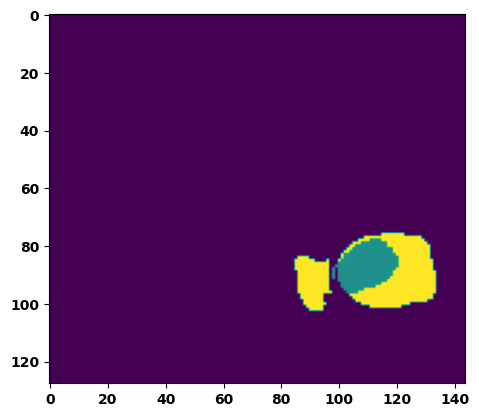

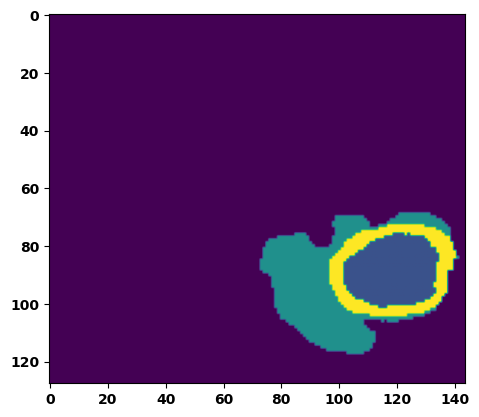

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.6605977416038513
Batch_id:  1 Eval IoU:  tensor(0.2390, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.6304, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.3137, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.4839, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.7570, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.03s/it]

Batch_id:  2 Eval loss:  0.37292447686195374
Batch_id:  2 Eval IoU:  tensor(0.5378, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9707, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.05s/it]

Batch_id:  3 Eval loss:  0.32667988538742065
Batch_id:  3 Eval IoU:  tensor(0.5930, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.05s/it]

Batch_id:  4 Eval loss:  0.7571325302124023
Batch_id:  4 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.04s/it]

Batch_id:  5 Eval loss:  0.7653850317001343
Batch_id:  5 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.05s/it]

Batch_id:  6 Eval loss:  0.7289507985115051
Batch_id:  6 Eval IoU:  tensor(0.2457, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.7836499810218811
Batch_id:  7 Eval IoU:  tensor(0.1906, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8809, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.7627, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.8427, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.7666586637496948
Batch_id:  8 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.07s/it]

Batch_id:  9 Eval loss:  0.7941855192184448
Batch_id:  9 Eval IoU:  tensor(0.1382, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7020, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.5332, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.7418, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.6107, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  10 Eval loss:  0.7824755907058716
Batch_id:  10 Eval IoU:  tensor(0.1927, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8854, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7708, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.8273, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


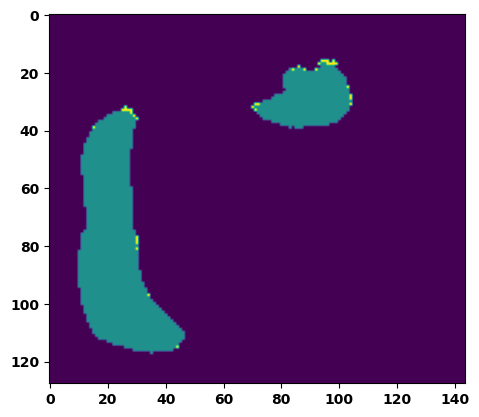

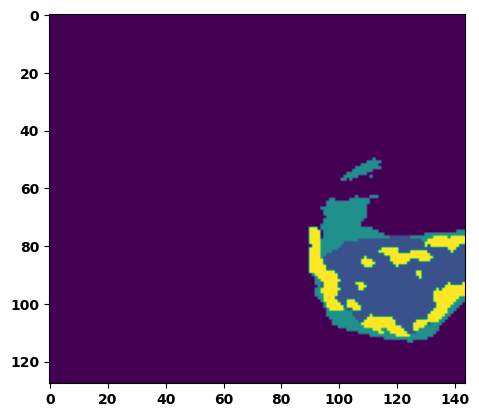

 33%|███▎      | 12/36 [00:12<00:25,  1.05s/it]

Batch_id:  11 Eval loss:  0.7660363912582397
Batch_id:  11 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.04s/it]

Batch_id:  12 Eval loss:  0.6568425297737122
Batch_id:  12 Eval IoU:  tensor(0.2264, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7059, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4683, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9244, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.5033, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.03s/it]

Batch_id:  13 Eval loss:  0.7691547274589539
Batch_id:  13 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.06s/it]

Batch_id:  14 Eval loss:  0.886810839176178
Batch_id:  14 Eval IoU:  tensor(0.0712, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6159, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4061, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.8895, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2467, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:21,  1.05s/it]

Batch_id:  15 Eval loss:  0.7535262703895569
Batch_id:  15 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.03s/it]

Batch_id:  16 Eval loss:  0.7317296266555786
Batch_id:  16 Eval IoU:  tensor(0.1690, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7066, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.4908, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.7093, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.6589, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.6030700206756592
Batch_id:  17 Eval IoU:  tensor(0.3474, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:18,  1.06s/it]

Batch_id:  18 Eval loss:  0.7707654237747192
Batch_id:  18 Eval IoU:  tensor(0.1413, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6518, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3871, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.3094, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.38496947288513184
Batch_id:  19 Eval IoU:  tensor(0.5397, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  20 Eval loss:  0.7175537347793579
Batch_id:  20 Eval IoU:  tensor(0.1927, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7657, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.5812, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.5481, device='cuda:0')


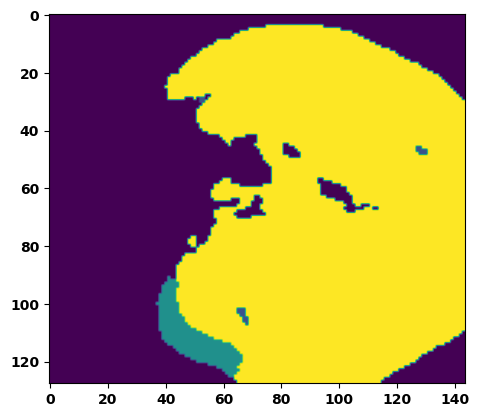

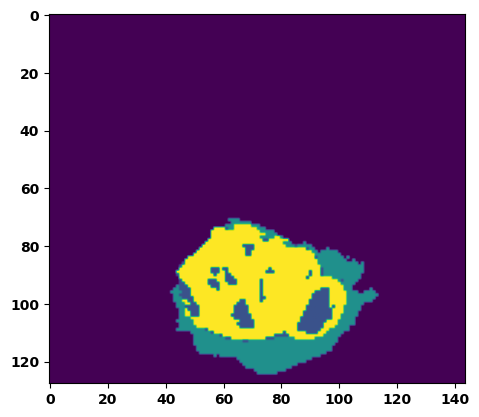

 61%|██████    | 22/36 [00:23<00:15,  1.12s/it]

Batch_id:  21 Eval loss:  0.7287247180938721
Batch_id:  21 Eval IoU:  tensor(0.2521, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9047, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8109, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.14s/it]

Batch_id:  22 Eval loss:  0.5411258935928345
Batch_id:  22 Eval IoU:  tensor(0.3503, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7554, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.5269, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.5548, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9910, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:13,  1.12s/it]

Batch_id:  23 Eval loss:  0.7517844438552856
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:12,  1.11s/it]

Batch_id:  24 Eval loss:  0.5586872696876526
Batch_id:  24 Eval IoU:  tensor(0.3568, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9081, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9431, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8850, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8554, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.07s/it]

Batch_id:  25 Eval loss:  0.7443360686302185
Batch_id:  25 Eval IoU:  tensor(0.2358, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9089, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.46559953689575195
Batch_id:  26 Eval IoU:  tensor(0.4205, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8238, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.6869, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.8321, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.7905, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.6794452667236328
Batch_id:  27 Eval IoU:  tensor(0.2821, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.10s/it]

Batch_id:  28 Eval loss:  0.1437748223543167
Batch_id:  28 Eval IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9928, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.686430811882019
Batch_id:  29 Eval IoU:  tensor(0.2438, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8504, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.7766, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.7474, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  30 Eval loss:  0.7234092950820923
Batch_id:  30 Eval IoU:  tensor(0.2374, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8505, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


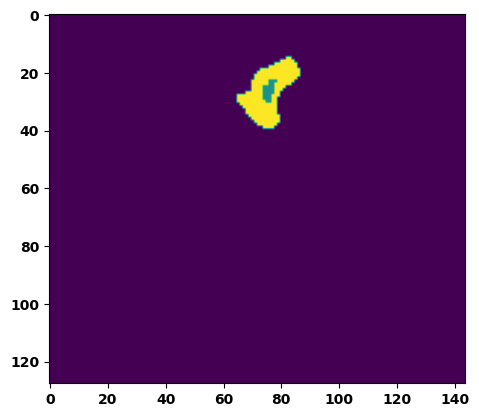

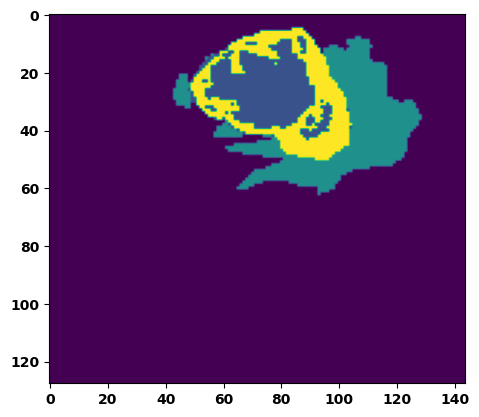

 89%|████████▉ | 32/36 [00:34<00:04,  1.09s/it]

Batch_id:  31 Eval loss:  0.7562959790229797
Batch_id:  31 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.8347389101982117
Batch_id:  32 Eval IoU:  tensor(0.1234, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7468, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4937, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8331, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.7333, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.04s/it]

Batch_id:  33 Eval loss:  0.7765994071960449
Batch_id:  33 Eval IoU:  tensor(0.1880, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8444, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7422, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8846, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.02s/it]

Batch_id:  34 Eval loss:  0.7757337689399719
Batch_id:  34 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]

Batch_id:  35 Eval loss:  0.19560694694519043
Batch_id:  35 Eval IoU:  tensor(0.6929, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9819, device='cuda:0')
Epoch  31 Training loss:  0.13765727538954128
Epoch  31 Evaluation loss:  0.6591870830290847
Epoch  31 Training accuracy :  tensor(0.7945)
Epoch  31 Evaluation accuracy :  tensor(0.2872)
Epoch  31 Training Mean Dice Score:  tensor(0.9886)
Epoch  31 Eval Mean Dice Score:  tensor(0.8769)
Epoch  31 Training Non-tumor Dice Score:  tensor(0.9854)
Epoch  31 Eval Non-tumor Dice Score:  tensor(0.7882)
Epoch  31 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  31 Eval NCR/NET Dice Score:  tensor(0.9442)
Epoch  31 Training ED Dice Score:  tensor(0.9

Epoch: 32
Training in session: 


  1%|          | 1/110 [00:01<01:54,  1.05s/it]

Batch_id:  0 Training loss:  0.13686296343803406
Batch_id:  0 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:57,  1.09s/it]

Batch_id:  1 Training loss:  0.1453975886106491
Batch_id:  1 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:53,  1.06s/it]

Batch_id:  2 Training loss:  0.12845800817012787
Batch_id:  2 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:52,  1.07s/it]

Batch_id:  3 Training loss:  0.08148139715194702
Batch_id:  3 Training IoU:  tensor(0.8569, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:51,  1.06s/it]

Batch_id:  4 Training loss:  0.15138612687587738
Batch_id:  4 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:49,  1.06s/it]

Batch_id:  5 Training loss:  0.2013436108827591
Batch_id:  5 Training IoU:  tensor(0.7128, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:48,  1.05s/it]

Batch_id:  6 Training loss:  0.1599382758140564
Batch_id:  6 Training IoU:  tensor(0.7538, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:47,  1.05s/it]

Batch_id:  7 Training loss:  0.16073356568813324
Batch_id:  7 Training IoU:  tensor(0.7556, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:49,  1.08s/it]

Batch_id:  8 Training loss:  0.16512098908424377
Batch_id:  8 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:46,  1.06s/it]

Batch_id:  9 Training loss:  0.1769828349351883
Batch_id:  9 Training IoU:  tensor(0.7254, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 10%|█         | 11/110 [00:11<01:43,  1.05s/it]

Batch_id:  10 Training loss:  0.26064395904541016
Batch_id:  10 Training IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 11%|█         | 12/110 [00:12<01:41,  1.03s/it]

Batch_id:  11 Training loss:  0.1868564337491989
Batch_id:  11 Training IoU:  tensor(0.7687, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:39,  1.02s/it]

Batch_id:  12 Training loss:  0.07269115746021271
Batch_id:  12 Training IoU:  tensor(0.8732, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:41,  1.05s/it]

Batch_id:  13 Training loss:  0.12482850253582001
Batch_id:  13 Training IoU:  tensor(0.8048, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 14%|█▎        | 15/110 [00:15<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.1508055180311203
Batch_id:  14 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:44,  1.11s/it]

Batch_id:  15 Training loss:  0.09623345732688904
Batch_id:  15 Training IoU:  tensor(0.8452, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:43,  1.12s/it]

Batch_id:  16 Training loss:  0.05041889846324921
Batch_id:  16 Training IoU:  tensor(0.9272, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:41,  1.11s/it]

Batch_id:  17 Training loss:  0.11342968046665192
Batch_id:  17 Training IoU:  tensor(0.8085, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:39,  1.09s/it]

Batch_id:  18 Training loss:  0.07208243012428284
Batch_id:  18 Training IoU:  tensor(0.8747, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:36,  1.08s/it]

Batch_id:  19 Training loss:  0.09321850538253784
Batch_id:  19 Training IoU:  tensor(0.8386, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.09060440957546234
Batch_id:  20 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 20%|██        | 22/110 [00:23<01:35,  1.09s/it]

Batch_id:  21 Training loss:  0.2446296215057373
Batch_id:  21 Training IoU:  tensor(0.6715, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 21%|██        | 23/110 [00:24<01:35,  1.09s/it]

Batch_id:  22 Training loss:  0.07829205691814423
Batch_id:  22 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:33,  1.09s/it]

Batch_id:  23 Training loss:  0.08756718039512634
Batch_id:  23 Training IoU:  tensor(0.8520, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.10654827952384949
Batch_id:  24 Training IoU:  tensor(0.8269, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.14308124780654907
Batch_id:  25 Training IoU:  tensor(0.8010, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:31,  1.11s/it]

Batch_id:  26 Training loss:  0.1267702728509903
Batch_id:  26 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.12875749170780182
Batch_id:  27 Training IoU:  tensor(0.7874, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.06150546669960022
Batch_id:  28 Training IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.16480761766433716
Batch_id:  29 Training IoU:  tensor(0.7381, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.4020462930202484
Batch_id:  30 Training IoU:  tensor(0.5166, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.15184924006462097
Batch_id:  31 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 30%|███       | 33/110 [00:35<01:21,  1.06s/it]

Batch_id:  32 Training loss:  0.08648647367954254
Batch_id:  32 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 31%|███       | 34/110 [00:36<01:21,  1.08s/it]

Batch_id:  33 Training loss:  0.081366166472435
Batch_id:  33 Training IoU:  tensor(0.8577, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:21,  1.09s/it]

Batch_id:  34 Training loss:  0.25495970249176025
Batch_id:  34 Training IoU:  tensor(0.6812, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:20,  1.09s/it]

Batch_id:  35 Training loss:  0.08644498884677887
Batch_id:  35 Training IoU:  tensor(0.8497, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.24577142298221588
Batch_id:  36 Training IoU:  tensor(0.6782, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:17,  1.07s/it]

Batch_id:  37 Training loss:  0.1351073831319809
Batch_id:  37 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:15,  1.07s/it]

Batch_id:  38 Training loss:  0.1276385337114334
Batch_id:  38 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:16,  1.09s/it]

Batch_id:  39 Training loss:  0.04925274848937988
Batch_id:  39 Training IoU:  tensor(0.9141, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.061478063464164734
Batch_id:  40 Training IoU:  tensor(0.8918, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.09766151010990143
Batch_id:  41 Training IoU:  tensor(0.8466, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:13,  1.09s/it]

Batch_id:  42 Training loss:  0.06733168661594391
Batch_id:  42 Training IoU:  tensor(0.8929, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 40%|████      | 44/110 [00:47<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.0969630628824234
Batch_id:  43 Training IoU:  tensor(0.8304, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 41%|████      | 45/110 [00:48<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.1520216464996338
Batch_id:  44 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:12,  1.13s/it]

Batch_id:  45 Training loss:  0.052796870470047
Batch_id:  45 Training IoU:  tensor(0.9070, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:11,  1.13s/it]

Batch_id:  46 Training loss:  0.20438912510871887
Batch_id:  46 Training IoU:  tensor(0.6961, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:09,  1.12s/it]

Batch_id:  47 Training loss:  0.06271164119243622
Batch_id:  47 Training IoU:  tensor(0.8901, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:07,  1.11s/it]

Batch_id:  48 Training loss:  0.06782282888889313
Batch_id:  48 Training IoU:  tensor(0.8871, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:07,  1.13s/it]

Batch_id:  49 Training loss:  0.04424118995666504
Batch_id:  49 Training IoU:  tensor(0.9211, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:05,  1.11s/it]

Batch_id:  50 Training loss:  0.1979815661907196
Batch_id:  50 Training IoU:  tensor(0.6910, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.08664467930793762
Batch_id:  51 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.1215704083442688
Batch_id:  52 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:00,  1.07s/it]

Batch_id:  53 Training loss:  0.0584845244884491
Batch_id:  53 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.06548415124416351
Batch_id:  54 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.31538844108581543
Batch_id:  55 Training IoU:  tensor(0.6535, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:58,  1.10s/it]

Batch_id:  56 Training loss:  0.05809462070465088
Batch_id:  56 Training IoU:  tensor(0.9003, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.147447869181633
Batch_id:  57 Training IoU:  tensor(0.7613, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.06s/it]

Batch_id:  58 Training loss:  0.11024750769138336
Batch_id:  58 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.20309852063655853
Batch_id:  59 Training IoU:  tensor(0.6861, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:56,  1.16s/it]

Batch_id:  60 Training loss:  0.08740736544132233
Batch_id:  60 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:55,  1.15s/it]

Batch_id:  61 Training loss:  0.061566129326820374
Batch_id:  61 Training IoU:  tensor(0.8931, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:53,  1.14s/it]

Batch_id:  62 Training loss:  0.13955730199813843
Batch_id:  62 Training IoU:  tensor(0.7679, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:51,  1.13s/it]

Batch_id:  63 Training loss:  0.17140838503837585
Batch_id:  63 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:50,  1.13s/it]

Batch_id:  64 Training loss:  0.07381713390350342
Batch_id:  64 Training IoU:  tensor(0.8683, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:49,  1.12s/it]

Batch_id:  65 Training loss:  0.46758008003234863
Batch_id:  65 Training IoU:  tensor(0.4546, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.09578752517700195
Batch_id:  66 Training IoU:  tensor(0.8380, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:47,  1.12s/it]

Batch_id:  67 Training loss:  0.06433124840259552
Batch_id:  67 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:47,  1.15s/it]

Batch_id:  68 Training loss:  0.14765751361846924
Batch_id:  68 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:45,  1.13s/it]

Batch_id:  69 Training loss:  0.3501909077167511
Batch_id:  69 Training IoU:  tensor(0.5955, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:43,  1.11s/it]

Batch_id:  70 Training loss:  0.10956141352653503
Batch_id:  70 Training IoU:  tensor(0.8153, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.12s/it]

Batch_id:  71 Training loss:  0.1375497430562973
Batch_id:  71 Training IoU:  tensor(0.7844, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:42,  1.14s/it]

Batch_id:  72 Training loss:  0.05132463574409485
Batch_id:  72 Training IoU:  tensor(0.9137, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:41,  1.14s/it]

Batch_id:  73 Training loss:  0.18320931494235992
Batch_id:  73 Training IoU:  tensor(0.7190, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:39,  1.12s/it]

Batch_id:  74 Training loss:  0.13137120008468628
Batch_id:  74 Training IoU:  tensor(0.8053, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.12527315318584442
Batch_id:  75 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:35,  1.09s/it]

Batch_id:  76 Training loss:  0.1439984142780304
Batch_id:  76 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:34,  1.07s/it]

Batch_id:  77 Training loss:  0.0803963840007782
Batch_id:  77 Training IoU:  tensor(0.8586, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.12028741836547852
Batch_id:  78 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:33,  1.13s/it]

Batch_id:  79 Training loss:  0.06536602973937988
Batch_id:  79 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.13499169051647186
Batch_id:  80 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.08535590767860413
Batch_id:  81 Training IoU:  tensor(0.8532, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.16927659511566162
Batch_id:  82 Training IoU:  tensor(0.7272, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.08972631394863129
Batch_id:  83 Training IoU:  tensor(0.8471, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.08s/it]

Batch_id:  84 Training loss:  0.08431817591190338
Batch_id:  84 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.08064495027065277
Batch_id:  85 Training IoU:  tensor(0.8594, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.10s/it]

Batch_id:  86 Training loss:  0.08664026856422424
Batch_id:  86 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.32235586643218994
Batch_id:  87 Training IoU:  tensor(0.6483, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.32967638969421387
Batch_id:  88 Training IoU:  tensor(0.6167, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.14s/it]

Batch_id:  89 Training loss:  0.06420290470123291
Batch_id:  89 Training IoU:  tensor(0.8880, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.35575950145721436
Batch_id:  90 Training IoU:  tensor(0.5290, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.1704685240983963
Batch_id:  91 Training IoU:  tensor(0.7667, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.05228690803050995
Batch_id:  92 Training IoU:  tensor(0.9121, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.19107504189014435
Batch_id:  93 Training IoU:  tensor(0.7238, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.10s/it]

Batch_id:  94 Training loss:  0.22659356892108917
Batch_id:  94 Training IoU:  tensor(0.6907, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.05796310305595398
Batch_id:  95 Training IoU:  tensor(0.8999, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.07912416756153107
Batch_id:  96 Training IoU:  tensor(0.8625, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.36380821466445923
Batch_id:  97 Training IoU:  tensor(0.5466, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.14s/it]

Batch_id:  98 Training loss:  0.20176808536052704
Batch_id:  98 Training IoU:  tensor(0.7284, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.13s/it]

Batch_id:  99 Training loss:  0.10623538494110107
Batch_id:  99 Training IoU:  tensor(0.8329, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:10,  1.13s/it]

Batch_id:  100 Training loss:  0.13666583597660065
Batch_id:  100 Training IoU:  tensor(0.7727, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.1524057239294052
Batch_id:  101 Training IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.13247495889663696
Batch_id:  102 Training IoU:  tensor(0.8028, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.12s/it]

Batch_id:  103 Training loss:  0.16048157215118408
Batch_id:  103 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.08s/it]

Batch_id:  104 Training loss:  0.10779623687267303
Batch_id:  104 Training IoU:  tensor(0.8336, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.06s/it]

Batch_id:  105 Training loss:  0.11353287100791931
Batch_id:  105 Training IoU:  tensor(0.8085, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.08086954057216644
Batch_id:  106 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.18400950729846954
Batch_id:  107 Training IoU:  tensor(0.7088, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.10865780711174011
Batch_id:  108 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.0780927836894989
Batch_id:  109 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9918, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4112042784690857
Batch_id:  0 Eval IoU:  tensor(0.5021, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8648, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7326, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7638, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


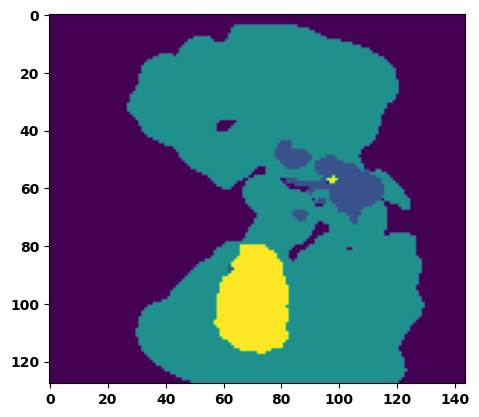

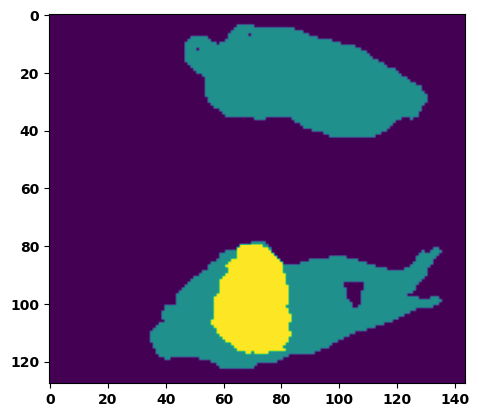

  6%|▌         | 2/36 [00:02<00:38,  1.13s/it]

Batch_id:  1 Eval loss:  0.7517879009246826
Batch_id:  1 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.07s/it]

Batch_id:  2 Eval loss:  0.6789082884788513
Batch_id:  2 Eval IoU:  tensor(0.2833, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.06s/it]

Batch_id:  3 Eval loss:  0.7637770175933838
Batch_id:  3 Eval IoU:  tensor(0.2237, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8946, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.09s/it]

Batch_id:  4 Eval loss:  0.7015636563301086
Batch_id:  4 Eval IoU:  tensor(0.2627, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.07s/it]

Batch_id:  5 Eval loss:  0.769135594367981
Batch_id:  5 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.07s/it]

Batch_id:  6 Eval loss:  0.2935246527194977
Batch_id:  6 Eval IoU:  tensor(0.6197, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9868, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.6805795431137085
Batch_id:  7 Eval IoU:  tensor(0.2755, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9425, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.7660452723503113
Batch_id:  8 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.12144261598587036
Batch_id:  9 Eval IoU:  tensor(0.8279, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  10 Eval loss:  0.7587056159973145
Batch_id:  10 Eval IoU:  tensor(0.2068, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8721, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8011, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8616, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


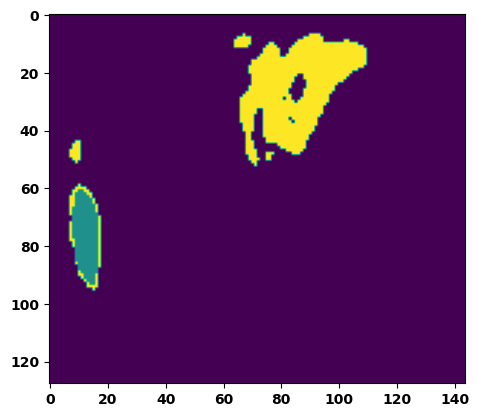

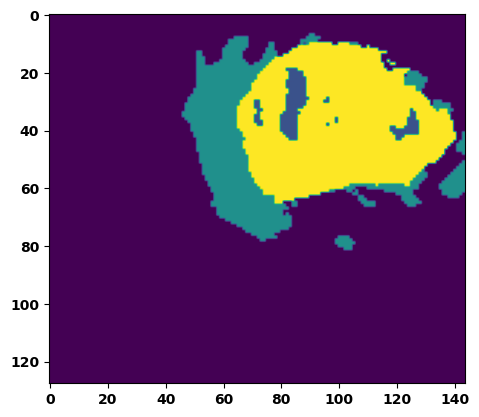

 33%|███▎      | 12/36 [00:12<00:25,  1.06s/it]

Batch_id:  11 Eval loss:  0.7399881482124329
Batch_id:  11 Eval IoU:  tensor(0.1824, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7416, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4908, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.6231, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.04s/it]

Batch_id:  12 Eval loss:  0.7653869390487671
Batch_id:  12 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.04s/it]

Batch_id:  13 Eval loss:  0.7487636804580688
Batch_id:  13 Eval IoU:  tensor(0.1543, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6913, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4239, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.6363, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.7691, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.03s/it]

Batch_id:  14 Eval loss:  0.561299204826355
Batch_id:  14 Eval IoU:  tensor(0.3410, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8445, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7355, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.7308, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9232, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.02s/it]

Batch_id:  15 Eval loss:  0.8251129388809204
Batch_id:  15 Eval IoU:  tensor(0.1251, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7360, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4943, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.5916, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9271, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.03s/it]

Batch_id:  16 Eval loss:  0.8323878049850464
Batch_id:  16 Eval IoU:  tensor(0.1009, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6445, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3817, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.2902, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.04s/it]

Batch_id:  17 Eval loss:  0.8046222925186157
Batch_id:  17 Eval IoU:  tensor(0.1265, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6888, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4982, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8720, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.4014, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.03s/it]

Batch_id:  18 Eval loss:  0.8836042881011963
Batch_id:  18 Eval IoU:  tensor(0.0738, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6202, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4147, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2406, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.02s/it]

Batch_id:  19 Eval loss:  0.7175635099411011
Batch_id:  19 Eval IoU:  tensor(0.1757, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6620, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3999, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.3680, device='cuda:0')
Batch_id:  20 Eval loss:  0.2899499237537384
Batch_id:  20 Eval IoU:  tensor(0.5857, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9713, device='cuda:0')


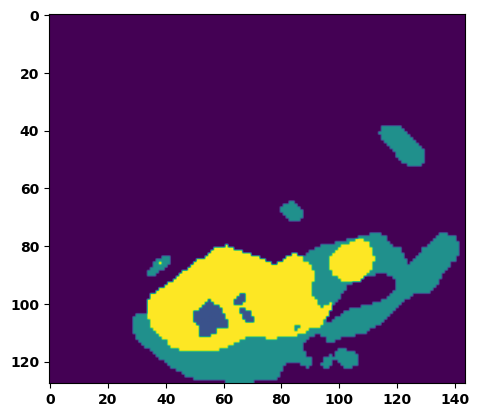

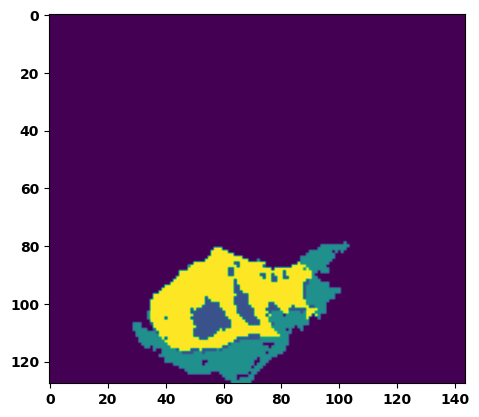

 61%|██████    | 22/36 [00:23<00:14,  1.04s/it]

Batch_id:  21 Eval loss:  0.7535079717636108
Batch_id:  21 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.28167831897735596
Batch_id:  22 Eval IoU:  tensor(0.6460, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.8400564193725586
Batch_id:  23 Eval IoU:  tensor(0.0906, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.6006, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3134, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9218, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.2311, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.5390014052391052
Batch_id:  24 Eval IoU:  tensor(0.3747, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9123, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8984, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8329, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9501, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.04s/it]

Batch_id:  25 Eval loss:  0.7057809829711914
Batch_id:  25 Eval IoU:  tensor(0.2339, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8583, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7808, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.7444, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9438, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.05s/it]

Batch_id:  26 Eval loss:  0.7659031748771667
Batch_id:  26 Eval IoU:  tensor(0.1548, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.7019, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.5449, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.8112, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.5243, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.05s/it]

Batch_id:  27 Eval loss:  0.04449792206287384
Batch_id:  27 Eval IoU:  tensor(0.9226, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.02s/it]

Batch_id:  28 Eval loss:  0.7677866816520691
Batch_id:  28 Eval IoU:  tensor(0.2165, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8661, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.04s/it]

Batch_id:  29 Eval loss:  0.7571380138397217
Batch_id:  29 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  30 Eval loss:  0.45461305975914
Batch_id:  30 Eval IoU:  tensor(0.4373, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9779, device='cuda:0')


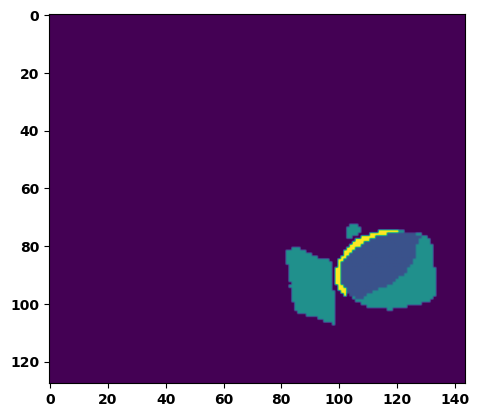

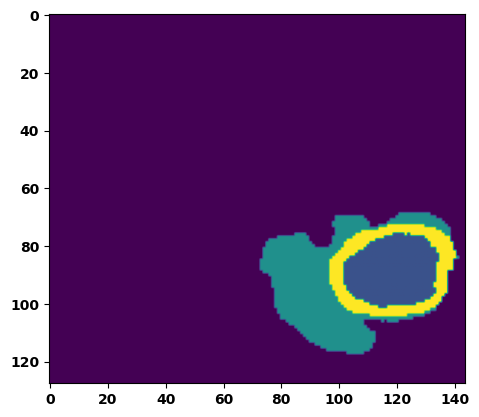

 89%|████████▉ | 32/36 [00:33<00:04,  1.07s/it]

Batch_id:  31 Eval loss:  0.5469247102737427
Batch_id:  31 Eval IoU:  tensor(0.4161, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.05s/it]

Batch_id:  32 Eval loss:  0.683485746383667
Batch_id:  32 Eval IoU:  tensor(0.2760, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9106, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8220, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9442, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.7399945855140686
Batch_id:  33 Eval IoU:  tensor(0.2226, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9078, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8157, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8806, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.01s/it]

Batch_id:  34 Eval loss:  0.8145853281021118
Batch_id:  34 Eval IoU:  tensor(0.1201, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6976, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4508, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.3956, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.397419810295105
Batch_id:  35 Eval IoU:  tensor(0.4767, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9147, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9631, device='cuda:0')
Epoch  32 Training loss:  0.137901455570351
Epoch  32 Evaluation loss:  0.6377146471705701
Epoch  32 Training accuracy :  tensor(0.7941)
Epoch  32 Evaluation accuracy :  tensor(0.3064)
Epoch  32 Training Mean Dice Score:  tensor(0.9887)
Epoch  32 Eval Mean Dice Score:  tensor(0.8684)
Epoch  32 Training Non-tumor Dice Score:  tensor(0.9855)
Epoch  32 Eval Non-tumor Dice Score:  tensor(0.7757)
Epoch  32 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  32 Eval NCR/NET Dice Score:  tensor(0.9614)
Epoch  32 Training ED Dice Score:  tensor(0.9837)

Epoch: 33
Training in session: 


  1%|          | 1/110 [00:01<01:59,  1.10s/it]

Batch_id:  0 Training loss:  0.06111691892147064
Batch_id:  0 Training IoU:  tensor(0.8951, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.0625927746295929
Batch_id:  1 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:59,  1.12s/it]

Batch_id:  2 Training loss:  0.060694992542266846
Batch_id:  2 Training IoU:  tensor(0.8945, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:01,  1.14s/it]

Batch_id:  3 Training loss:  0.04400469362735748
Batch_id:  3 Training IoU:  tensor(0.9208, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.14s/it]

Batch_id:  4 Training loss:  0.05836400389671326
Batch_id:  4 Training IoU:  tensor(0.8996, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.0708761215209961
Batch_id:  5 Training IoU:  tensor(0.8776, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.11s/it]

Batch_id:  6 Training loss:  0.08699306845664978
Batch_id:  6 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:50,  1.08s/it]

Batch_id:  7 Training loss:  0.16014832258224487
Batch_id:  7 Training IoU:  tensor(0.7423, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:47,  1.07s/it]

Batch_id:  8 Training loss:  0.16978394985198975
Batch_id:  8 Training IoU:  tensor(0.7681, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:45,  1.06s/it]

Batch_id:  9 Training loss:  0.13236181437969208
Batch_id:  9 Training IoU:  tensor(0.8062, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 10%|█         | 11/110 [00:12<01:47,  1.09s/it]

Batch_id:  10 Training loss:  0.04792368412017822
Batch_id:  10 Training IoU:  tensor(0.9330, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 11%|█         | 12/110 [00:13<01:47,  1.09s/it]

Batch_id:  11 Training loss:  0.11715720593929291
Batch_id:  11 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:44,  1.08s/it]

Batch_id:  12 Training loss:  0.15747398138046265
Batch_id:  12 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:42,  1.06s/it]

Batch_id:  13 Training loss:  0.085677370429039
Batch_id:  13 Training IoU:  tensor(0.8630, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:40,  1.06s/it]

Batch_id:  14 Training loss:  0.31239640712738037
Batch_id:  14 Training IoU:  tensor(0.6582, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:39,  1.06s/it]

Batch_id:  15 Training loss:  0.3579796254634857
Batch_id:  15 Training IoU:  tensor(0.5512, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:37,  1.05s/it]

Batch_id:  16 Training loss:  0.09050232172012329
Batch_id:  16 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:38,  1.07s/it]

Batch_id:  17 Training loss:  0.46166953444480896
Batch_id:  17 Training IoU:  tensor(0.4593, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.08148659765720367
Batch_id:  18 Training IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.08925388753414154
Batch_id:  19 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:35,  1.08s/it]

Batch_id:  20 Training loss:  0.06355175375938416
Batch_id:  20 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 20%|██        | 22/110 [00:23<01:34,  1.08s/it]

Batch_id:  21 Training loss:  0.1994563639163971
Batch_id:  21 Training IoU:  tensor(0.6909, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 21%|██        | 23/110 [00:24<01:33,  1.07s/it]

Batch_id:  22 Training loss:  0.25827929377555847
Batch_id:  22 Training IoU:  tensor(0.6195, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:31,  1.06s/it]

Batch_id:  23 Training loss:  0.2037496566772461
Batch_id:  23 Training IoU:  tensor(0.6958, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:29,  1.05s/it]

Batch_id:  24 Training loss:  0.22499234974384308
Batch_id:  24 Training IoU:  tensor(0.6959, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:28,  1.05s/it]

Batch_id:  25 Training loss:  0.19591717422008514
Batch_id:  25 Training IoU:  tensor(0.7197, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:27,  1.05s/it]

Batch_id:  26 Training loss:  0.09070268273353577
Batch_id:  26 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:27,  1.07s/it]

Batch_id:  27 Training loss:  0.0829743891954422
Batch_id:  27 Training IoU:  tensor(0.8542, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.05235472321510315
Batch_id:  28 Training IoU:  tensor(0.9112, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:26,  1.09s/it]

Batch_id:  29 Training loss:  0.18360380828380585
Batch_id:  29 Training IoU:  tensor(0.7092, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.09s/it]

Batch_id:  30 Training loss:  0.12917806208133698
Batch_id:  30 Training IoU:  tensor(0.7839, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.1500212401151657
Batch_id:  31 Training IoU:  tensor(0.7612, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 30%|███       | 33/110 [00:35<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.08694767951965332
Batch_id:  32 Training IoU:  tensor(0.8554, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 31%|███       | 34/110 [00:36<01:22,  1.08s/it]

Batch_id:  33 Training loss:  0.1532556712627411
Batch_id:  33 Training IoU:  tensor(0.7584, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.13631051778793335
Batch_id:  34 Training IoU:  tensor(0.7757, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.0819282978773117
Batch_id:  35 Training IoU:  tensor(0.8586, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:17,  1.07s/it]

Batch_id:  36 Training loss:  0.18155591189861298
Batch_id:  36 Training IoU:  tensor(0.7184, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9760, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:15,  1.05s/it]

Batch_id:  37 Training loss:  0.13764773309230804
Batch_id:  37 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 35%|███▌      | 39/110 [00:41<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.09595148265361786
Batch_id:  38 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.17941899597644806
Batch_id:  39 Training IoU:  tensor(0.7371, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:12,  1.05s/it]

Batch_id:  40 Training loss:  0.14209085702896118
Batch_id:  40 Training IoU:  tensor(0.7638, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.06s/it]

Batch_id:  41 Training loss:  0.05017843842506409
Batch_id:  41 Training IoU:  tensor(0.9122, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:11,  1.07s/it]

Batch_id:  42 Training loss:  0.07971253991127014
Batch_id:  42 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 40%|████      | 44/110 [00:47<01:09,  1.06s/it]

Batch_id:  43 Training loss:  0.048192307353019714
Batch_id:  43 Training IoU:  tensor(0.9204, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 41%|████      | 45/110 [00:48<01:08,  1.05s/it]

Batch_id:  44 Training loss:  0.12944793701171875
Batch_id:  44 Training IoU:  tensor(0.7962, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:07,  1.05s/it]

Batch_id:  45 Training loss:  0.20024000108242035
Batch_id:  45 Training IoU:  tensor(0.6888, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:07,  1.07s/it]

Batch_id:  46 Training loss:  0.25237953662872314
Batch_id:  46 Training IoU:  tensor(0.6843, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.0826118141412735
Batch_id:  47 Training IoU:  tensor(0.8544, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.12825947999954224
Batch_id:  48 Training IoU:  tensor(0.8074, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.08312176167964935
Batch_id:  49 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:02,  1.06s/it]

Batch_id:  50 Training loss:  0.13154099881649017
Batch_id:  50 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:01,  1.06s/it]

Batch_id:  51 Training loss:  0.0873139351606369
Batch_id:  51 Training IoU:  tensor(0.8515, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:00,  1.06s/it]

Batch_id:  52 Training loss:  0.063513845205307
Batch_id:  52 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 49%|████▉     | 54/110 [00:57<00:59,  1.05s/it]

Batch_id:  53 Training loss:  0.4026883542537689
Batch_id:  53 Training IoU:  tensor(0.5148, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 50%|█████     | 55/110 [00:58<00:58,  1.06s/it]

Batch_id:  54 Training loss:  0.19785207509994507
Batch_id:  54 Training IoU:  tensor(0.7356, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.06411167979240417
Batch_id:  55 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:55,  1.06s/it]

Batch_id:  56 Training loss:  0.13516835868358612
Batch_id:  56 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:56,  1.08s/it]

Batch_id:  57 Training loss:  0.0616585910320282
Batch_id:  57 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.058504581451416016
Batch_id:  58 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:54,  1.10s/it]

Batch_id:  59 Training loss:  0.23882408440113068
Batch_id:  59 Training IoU:  tensor(0.6768, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:53,  1.09s/it]

Batch_id:  60 Training loss:  0.14989781379699707
Batch_id:  60 Training IoU:  tensor(0.7769, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.17320959270000458
Batch_id:  61 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.16469356417655945
Batch_id:  62 Training IoU:  tensor(0.7410, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:50,  1.10s/it]

Batch_id:  63 Training loss:  0.12708525359630585
Batch_id:  63 Training IoU:  tensor(0.8008, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 59%|█████▉    | 65/110 [01:09<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.10569965839385986
Batch_id:  64 Training IoU:  tensor(0.8286, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:49,  1.13s/it]

Batch_id:  65 Training loss:  0.32971838116645813
Batch_id:  65 Training IoU:  tensor(0.6152, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.0928531289100647
Batch_id:  66 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.147549569606781
Batch_id:  67 Training IoU:  tensor(0.7621, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.10s/it]

Batch_id:  68 Training loss:  0.06738397479057312
Batch_id:  68 Training IoU:  tensor(0.8924, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.3502075672149658
Batch_id:  69 Training IoU:  tensor(0.5315, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:43,  1.12s/it]

Batch_id:  70 Training loss:  0.15350350737571716
Batch_id:  70 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.0863044410943985
Batch_id:  71 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.14213787019252777
Batch_id:  72 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:38,  1.08s/it]

Batch_id:  73 Training loss:  0.07330122590065002
Batch_id:  73 Training IoU:  tensor(0.8790, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:38,  1.09s/it]

Batch_id:  74 Training loss:  0.10369415581226349
Batch_id:  74 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.11118380725383759
Batch_id:  75 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:36,  1.09s/it]

Batch_id:  76 Training loss:  0.11408056318759918
Batch_id:  76 Training IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.08003063499927521
Batch_id:  77 Training IoU:  tensor(0.8593, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.07955946028232574
Batch_id:  78 Training IoU:  tensor(0.8611, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:31,  1.06s/it]

Batch_id:  79 Training loss:  0.09368255734443665
Batch_id:  79 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:30,  1.07s/it]

Batch_id:  80 Training loss:  0.10909877717494965
Batch_id:  80 Training IoU:  tensor(0.8158, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:30,  1.07s/it]

Batch_id:  81 Training loss:  0.22080588340759277
Batch_id:  81 Training IoU:  tensor(0.6991, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:28,  1.07s/it]

Batch_id:  82 Training loss:  0.14944446086883545
Batch_id:  82 Training IoU:  tensor(0.7637, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:27,  1.05s/it]

Batch_id:  83 Training loss:  0.1488712579011917
Batch_id:  83 Training IoU:  tensor(0.7598, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.06s/it]

Batch_id:  84 Training loss:  0.3237776756286621
Batch_id:  84 Training IoU:  tensor(0.6462, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:25,  1.05s/it]

Batch_id:  85 Training loss:  0.08305476605892181
Batch_id:  85 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:24,  1.05s/it]

Batch_id:  86 Training loss:  0.13105559349060059
Batch_id:  86 Training IoU:  tensor(0.7801, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:22,  1.04s/it]

Batch_id:  87 Training loss:  0.057203829288482666
Batch_id:  87 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:21,  1.03s/it]

Batch_id:  88 Training loss:  0.0725821852684021
Batch_id:  88 Training IoU:  tensor(0.8739, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:20,  1.05s/it]

Batch_id:  89 Training loss:  0.07458098232746124
Batch_id:  89 Training IoU:  tensor(0.8668, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 83%|████████▎ | 91/110 [01:37<00:20,  1.06s/it]

Batch_id:  90 Training loss:  0.09977985918521881
Batch_id:  90 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 84%|████████▎ | 92/110 [01:38<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.11538493633270264
Batch_id:  91 Training IoU:  tensor(0.8744, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 85%|████████▍ | 93/110 [01:39<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.16004647314548492
Batch_id:  92 Training IoU:  tensor(0.7451, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.07851047813892365
Batch_id:  93 Training IoU:  tensor(0.8635, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.1278662532567978
Batch_id:  94 Training IoU:  tensor(0.7836, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.3502811789512634
Batch_id:  95 Training IoU:  tensor(0.5947, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:13,  1.05s/it]

Batch_id:  96 Training loss:  0.11032731831073761
Batch_id:  96 Training IoU:  tensor(0.8312, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:12,  1.04s/it]

Batch_id:  97 Training loss:  0.1465483456850052
Batch_id:  97 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:11,  1.05s/it]

Batch_id:  98 Training loss:  0.18189534544944763
Batch_id:  98 Training IoU:  tensor(0.7197, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 91%|█████████ | 100/110 [01:47<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.1054455041885376
Batch_id:  99 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 92%|█████████▏| 101/110 [01:48<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.13873498141765594
Batch_id:  100 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 93%|█████████▎| 102/110 [01:49<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.14708508551120758
Batch_id:  101 Training IoU:  tensor(0.7592, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 94%|█████████▎| 103/110 [01:50<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.06567086279392242
Batch_id:  102 Training IoU:  tensor(0.8869, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 95%|█████████▍| 104/110 [01:51<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.0772276222705841
Batch_id:  103 Training IoU:  tensor(0.8627, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 95%|█████████▌| 105/110 [01:52<00:05,  1.08s/it]

Batch_id:  104 Training loss:  0.14150077104568481
Batch_id:  104 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 96%|█████████▋| 106/110 [01:53<00:04,  1.07s/it]

Batch_id:  105 Training loss:  0.1740277111530304
Batch_id:  105 Training IoU:  tensor(0.7900, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 97%|█████████▋| 107/110 [01:54<00:03,  1.06s/it]

Batch_id:  106 Training loss:  0.12808185815811157
Batch_id:  106 Training IoU:  tensor(0.7887, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.05244965851306915
Batch_id:  107 Training IoU:  tensor(0.9075, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.17209017276763916
Batch_id:  108 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.07s/it]


Batch_id:  109 Training loss:  0.11301378905773163
Batch_id:  109 Training IoU:  tensor(0.8212, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9915, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7666683197021484
Batch_id:  0 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


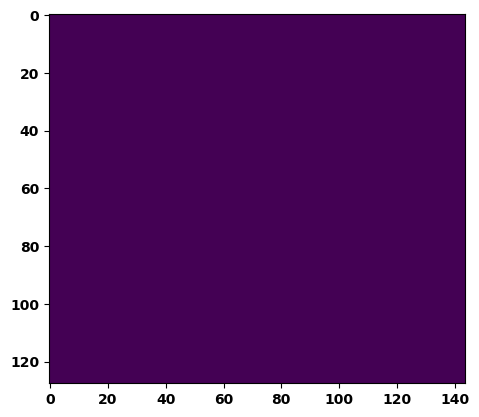

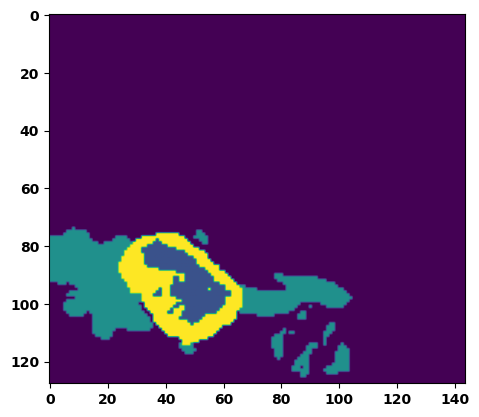

  6%|▌         | 2/36 [00:02<00:38,  1.12s/it]

Batch_id:  1 Eval loss:  0.406520277261734
Batch_id:  1 Eval IoU:  tensor(0.5038, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8728, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7586, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.7892, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.12s/it]

Batch_id:  2 Eval loss:  0.8331815004348755
Batch_id:  2 Eval IoU:  tensor(0.1008, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6469, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3867, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.2948, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.11s/it]

Batch_id:  3 Eval loss:  0.11098852753639221
Batch_id:  3 Eval IoU:  tensor(0.8101, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.09s/it]

Batch_id:  4 Eval loss:  0.7610758543014526
Batch_id:  4 Eval IoU:  tensor(0.2284, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:32,  1.07s/it]

Batch_id:  5 Eval loss:  0.8807640075683594
Batch_id:  5 Eval IoU:  tensor(0.0762, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6241, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4223, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2481, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.05s/it]

Batch_id:  6 Eval loss:  0.7548532485961914
Batch_id:  6 Eval IoU:  tensor(0.2189, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8423, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.03s/it]

Batch_id:  7 Eval loss:  0.7763455510139465
Batch_id:  7 Eval IoU:  tensor(0.1975, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8787, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.7896, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8996, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.02s/it]

Batch_id:  8 Eval loss:  0.7653874158859253
Batch_id:  8 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.03s/it]

Batch_id:  9 Eval loss:  0.19817057251930237
Batch_id:  9 Eval IoU:  tensor(0.7091, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  10 Eval loss:  0.7535127401351929
Batch_id:  10 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


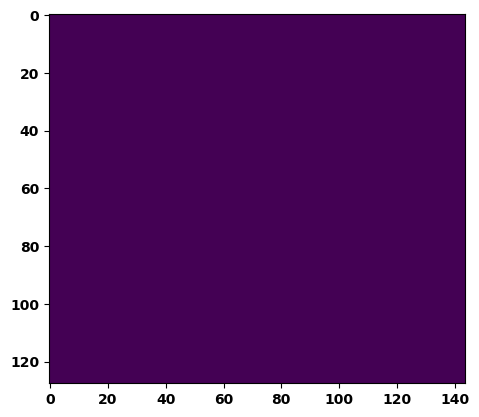

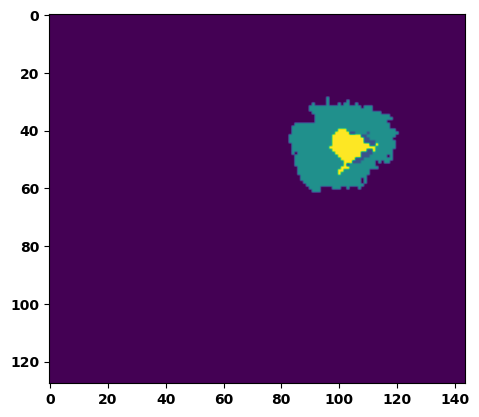

 33%|███▎      | 12/36 [00:12<00:24,  1.04s/it]

Batch_id:  11 Eval loss:  0.7925100326538086
Batch_id:  11 Eval IoU:  tensor(0.1335, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6932, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.5049, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8755, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.4192, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.03s/it]

Batch_id:  12 Eval loss:  0.7206803560256958
Batch_id:  12 Eval IoU:  tensor(0.1910, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6181, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3184, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8684, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.3225, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.05s/it]

Batch_id:  13 Eval loss:  0.6331341862678528
Batch_id:  13 Eval IoU:  tensor(0.3191, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.04s/it]

Batch_id:  14 Eval loss:  0.7916668653488159
Batch_id:  14 Eval IoU:  tensor(0.1786, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8571, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7144, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8505, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.01s/it]

Batch_id:  15 Eval loss:  0.7517907023429871
Batch_id:  15 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.04s/it]

Batch_id:  16 Eval loss:  0.7039554715156555
Batch_id:  16 Eval IoU:  tensor(0.2250, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8356, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7372, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8607, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8220, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9225, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.02s/it]

Batch_id:  17 Eval loss:  0.7633787989616394
Batch_id:  17 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.06s/it]

Batch_id:  18 Eval loss:  0.7571394443511963
Batch_id:  18 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.06s/it]

Batch_id:  19 Eval loss:  0.5669668912887573
Batch_id:  19 Eval IoU:  tensor(0.3184, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8477, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7130, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  20 Eval loss:  0.7647108435630798
Batch_id:  20 Eval IoU:  tensor(0.2213, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8862, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


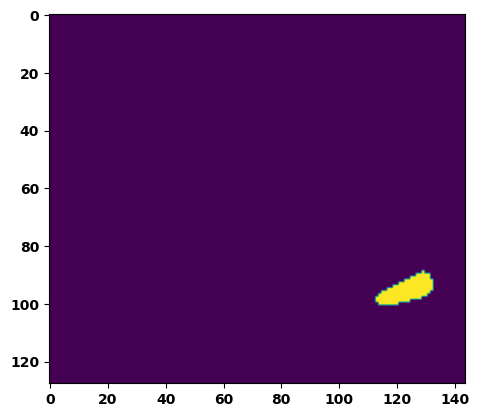

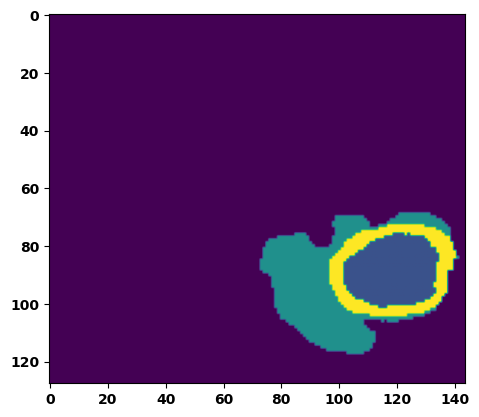

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.6266541481018066
Batch_id:  21 Eval IoU:  tensor(0.2965, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8971, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8562, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8324, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.7574441432952881
Batch_id:  22 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.7757452726364136
Batch_id:  23 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.04s/it]

Batch_id:  24 Eval loss:  0.7691489458084106
Batch_id:  24 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.03s/it]

Batch_id:  25 Eval loss:  0.7563111782073975
Batch_id:  25 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.01s/it]

Batch_id:  26 Eval loss:  0.7636880874633789
Batch_id:  26 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.01s/it]

Batch_id:  27 Eval loss:  0.7547439336776733
Batch_id:  27 Eval IoU:  tensor(0.2342, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8995, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8079, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.02s/it]

Batch_id:  28 Eval loss:  0.7127143144607544
Batch_id:  28 Eval IoU:  tensor(0.2344, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8086, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8889, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8660, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.01s/it]

Batch_id:  29 Eval loss:  0.766048014163971
Batch_id:  29 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  30 Eval loss:  0.13497692346572876
Batch_id:  30 Eval IoU:  tensor(0.7769, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


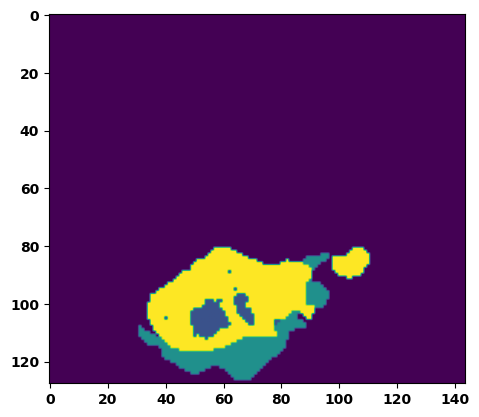

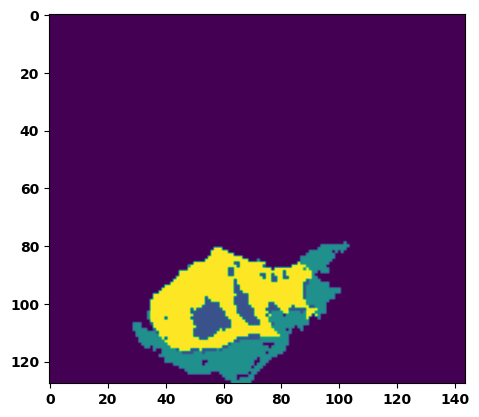

 89%|████████▉ | 32/36 [00:33<00:04,  1.02s/it]

Batch_id:  31 Eval loss:  0.763791024684906
Batch_id:  31 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.01s/it]

Batch_id:  32 Eval loss:  0.7886553406715393
Batch_id:  32 Eval IoU:  tensor(0.1437, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7328, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.5212, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.4656, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.01s/it]

Batch_id:  33 Eval loss:  0.3114832937717438
Batch_id:  33 Eval IoU:  tensor(0.6191, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9916, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.03s/it]

Batch_id:  34 Eval loss:  0.34632372856140137
Batch_id:  34 Eval IoU:  tensor(0.5905, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9712, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.04s/it]

Batch_id:  35 Eval loss:  0.7188558578491211
Batch_id:  35 Eval IoU:  tensor(0.1824, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7258, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.5369, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9222, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.5033, device='cuda:0')
Epoch  33 Training loss:  0.1366898780519312
Epoch  33 Evaluation loss:  0.6666662726137373
Epoch  33 Training accuracy :  tensor(0.7955)
Epoch  33 Evaluation accuracy :  tensor(0.2902)
Epoch  33 Training Mean Dice Score:  tensor(0.9887)
Epoch  33 Eval Mean Dice Score:  tensor(0.8917)
Epoch  33 Training Non-tumor Dice Score:  tensor(0.9854)
Epoch  33 Eval Non-tumor Dice Score:  tensor(0.8127)
Epoch  33 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  33 Eval NCR/NET Dice Score:  tensor(0.9640)
Epoch  33 Training ED Dice Score:  tensor(0.983

Epoch: 34
Training in session: 


  1%|          | 1/110 [00:01<01:55,  1.06s/it]

Batch_id:  0 Training loss:  0.06130993366241455
Batch_id:  0 Training IoU:  tensor(0.8948, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:52,  1.05s/it]

Batch_id:  1 Training loss:  0.15668225288391113
Batch_id:  1 Training IoU:  tensor(0.7562, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.08904090523719788
Batch_id:  2 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:51,  1.06s/it]

Batch_id:  3 Training loss:  0.3561357259750366
Batch_id:  3 Training IoU:  tensor(0.5556, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:53,  1.08s/it]

Batch_id:  4 Training loss:  0.095608189702034
Batch_id:  4 Training IoU:  tensor(0.8460, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.18147560954093933
Batch_id:  5 Training IoU:  tensor(0.7123, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:51,  1.08s/it]

Batch_id:  6 Training loss:  0.1457904726266861
Batch_id:  6 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.08s/it]

Batch_id:  7 Training loss:  0.12608785927295685
Batch_id:  7 Training IoU:  tensor(0.7994, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:49,  1.08s/it]

Batch_id:  8 Training loss:  0.10551950335502625
Batch_id:  8 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:50,  1.11s/it]

Batch_id:  9 Training loss:  0.14550448954105377
Batch_id:  9 Training IoU:  tensor(0.7659, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 10%|█         | 11/110 [00:11<01:47,  1.08s/it]

Batch_id:  10 Training loss:  0.14022596180438995
Batch_id:  10 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 11%|█         | 12/110 [00:12<01:44,  1.07s/it]

Batch_id:  11 Training loss:  0.07180292904376984
Batch_id:  11 Training IoU:  tensor(0.8749, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:43,  1.06s/it]

Batch_id:  12 Training loss:  0.10257846117019653
Batch_id:  12 Training IoU:  tensor(0.8381, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:41,  1.06s/it]

Batch_id:  13 Training loss:  0.19615499675273895
Batch_id:  13 Training IoU:  tensor(0.7184, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.07s/it]

Batch_id:  14 Training loss:  0.19080309569835663
Batch_id:  14 Training IoU:  tensor(0.7254, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.14090988039970398
Batch_id:  15 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:44,  1.12s/it]

Batch_id:  16 Training loss:  0.1316971629858017
Batch_id:  16 Training IoU:  tensor(0.8048, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:42,  1.12s/it]

Batch_id:  17 Training loss:  0.050984278321266174
Batch_id:  17 Training IoU:  tensor(0.9131, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:41,  1.11s/it]

Batch_id:  18 Training loss:  0.133744016289711
Batch_id:  18 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:40,  1.12s/it]

Batch_id:  19 Training loss:  0.22020015120506287
Batch_id:  19 Training IoU:  tensor(0.6994, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:37,  1.10s/it]

Batch_id:  20 Training loss:  0.39950743317604065
Batch_id:  20 Training IoU:  tensor(0.5182, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 20%|██        | 22/110 [00:23<01:36,  1.10s/it]

Batch_id:  21 Training loss:  0.07847258448600769
Batch_id:  21 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 21%|██        | 23/110 [00:25<01:36,  1.11s/it]

Batch_id:  22 Training loss:  0.254758358001709
Batch_id:  22 Training IoU:  tensor(0.6813, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.08958710730075836
Batch_id:  23 Training IoU:  tensor(0.8541, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.07830412685871124
Batch_id:  24 Training IoU:  tensor(0.8625, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:34,  1.12s/it]

Batch_id:  25 Training loss:  0.13621068000793457
Batch_id:  25 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:33,  1.13s/it]

Batch_id:  26 Training loss:  0.07514768838882446
Batch_id:  26 Training IoU:  tensor(0.8659, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:32,  1.13s/it]

Batch_id:  27 Training loss:  0.19841107726097107
Batch_id:  27 Training IoU:  tensor(0.6925, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.14921878278255463
Batch_id:  28 Training IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.05636778473854065
Batch_id:  29 Training IoU:  tensor(0.9014, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:29,  1.13s/it]

Batch_id:  30 Training loss:  0.08734972774982452
Batch_id:  30 Training IoU:  tensor(0.8503, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:27,  1.13s/it]

Batch_id:  31 Training loss:  0.17604616284370422
Batch_id:  31 Training IoU:  tensor(0.7177, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 30%|███       | 33/110 [00:36<01:28,  1.15s/it]

Batch_id:  32 Training loss:  0.05634818971157074
Batch_id:  32 Training IoU:  tensor(0.9036, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 31%|███       | 34/110 [00:37<01:26,  1.14s/it]

Batch_id:  33 Training loss:  0.1097237765789032
Batch_id:  33 Training IoU:  tensor(0.8912, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:26,  1.15s/it]

Batch_id:  34 Training loss:  0.14799031615257263
Batch_id:  34 Training IoU:  tensor(0.7555, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:25,  1.15s/it]

Batch_id:  35 Training loss:  0.04514671862125397
Batch_id:  35 Training IoU:  tensor(0.9190, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:23,  1.15s/it]

Batch_id:  36 Training loss:  0.04964087903499603
Batch_id:  36 Training IoU:  tensor(0.9132, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:22,  1.14s/it]

Batch_id:  37 Training loss:  0.08245809376239777
Batch_id:  37 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:20,  1.13s/it]

Batch_id:  38 Training loss:  0.09697964787483215
Batch_id:  38 Training IoU:  tensor(0.8550, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:18,  1.12s/it]

Batch_id:  39 Training loss:  0.1453205794095993
Batch_id:  39 Training IoU:  tensor(0.7696, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.12s/it]

Batch_id:  40 Training loss:  0.04939790070056915
Batch_id:  40 Training IoU:  tensor(0.9290, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:15,  1.10s/it]

Batch_id:  41 Training loss:  0.17516276240348816
Batch_id:  41 Training IoU:  tensor(0.7280, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.0932932198047638
Batch_id:  42 Training IoU:  tensor(0.8380, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.06270915269851685
Batch_id:  43 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.08s/it]

Batch_id:  44 Training loss:  0.13414046168327332
Batch_id:  44 Training IoU:  tensor(0.8047, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:10,  1.11s/it]

Batch_id:  45 Training loss:  0.31397420167922974
Batch_id:  45 Training IoU:  tensor(0.6567, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:10,  1.11s/it]

Batch_id:  46 Training loss:  0.12689967453479767
Batch_id:  46 Training IoU:  tensor(0.7905, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:08,  1.11s/it]

Batch_id:  47 Training loss:  0.06969396770000458
Batch_id:  47 Training IoU:  tensor(0.8792, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:09,  1.14s/it]

Batch_id:  48 Training loss:  0.1496233344078064
Batch_id:  48 Training IoU:  tensor(0.7697, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:07,  1.13s/it]

Batch_id:  49 Training loss:  0.2346039116382599
Batch_id:  49 Training IoU:  tensor(0.6802, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:06,  1.13s/it]

Batch_id:  50 Training loss:  0.22422261536121368
Batch_id:  50 Training IoU:  tensor(0.6988, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:05,  1.13s/it]

Batch_id:  51 Training loss:  0.18187512457370758
Batch_id:  51 Training IoU:  tensor(0.7504, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.14941033720970154
Batch_id:  52 Training IoU:  tensor(0.7567, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:03,  1.13s/it]

Batch_id:  53 Training loss:  0.07210464775562286
Batch_id:  53 Training IoU:  tensor(0.8806, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 50%|█████     | 55/110 [01:00<01:01,  1.12s/it]

Batch_id:  54 Training loss:  0.06630100309848785
Batch_id:  54 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 51%|█████     | 56/110 [01:01<01:00,  1.12s/it]

Batch_id:  55 Training loss:  0.07935348153114319
Batch_id:  55 Training IoU:  tensor(0.8619, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:59,  1.13s/it]

Batch_id:  56 Training loss:  0.1845373958349228
Batch_id:  56 Training IoU:  tensor(0.7154, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.10886651277542114
Batch_id:  57 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:56,  1.12s/it]

Batch_id:  58 Training loss:  0.35023969411849976
Batch_id:  58 Training IoU:  tensor(0.5330, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:55,  1.10s/it]

Batch_id:  59 Training loss:  0.11073662340641022
Batch_id:  59 Training IoU:  tensor(0.8118, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.07871071994304657
Batch_id:  60 Training IoU:  tensor(0.8637, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.12951597571372986
Batch_id:  61 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.09s/it]

Batch_id:  62 Training loss:  0.08491362631320953
Batch_id:  62 Training IoU:  tensor(0.8638, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:50,  1.09s/it]

Batch_id:  63 Training loss:  0.1277066320180893
Batch_id:  63 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:50,  1.13s/it]

Batch_id:  64 Training loss:  0.08498524129390717
Batch_id:  64 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:48,  1.11s/it]

Batch_id:  65 Training loss:  0.19135496020317078
Batch_id:  65 Training IoU:  tensor(0.6997, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:47,  1.11s/it]

Batch_id:  66 Training loss:  0.13476139307022095
Batch_id:  66 Training IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.06474287807941437
Batch_id:  67 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.11s/it]

Batch_id:  68 Training loss:  0.11403639614582062
Batch_id:  68 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:44,  1.12s/it]

Batch_id:  69 Training loss:  0.17376217246055603
Batch_id:  69 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.15107324719429016
Batch_id:  70 Training IoU:  tensor(0.7624, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.0844937264919281
Batch_id:  71 Training IoU:  tensor(0.8546, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.35115981101989746
Batch_id:  72 Training IoU:  tensor(0.5925, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.1453881710767746
Batch_id:  73 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.0856110006570816
Batch_id:  74 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.21025465428829193
Batch_id:  75 Training IoU:  tensor(0.6878, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.31764575839042664
Batch_id:  76 Training IoU:  tensor(0.6585, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.12s/it]

Batch_id:  77 Training loss:  0.06230826675891876
Batch_id:  77 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.2577931582927704
Batch_id:  78 Training IoU:  tensor(0.6211, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:34,  1.13s/it]

Batch_id:  79 Training loss:  0.20179304480552673
Batch_id:  79 Training IoU:  tensor(0.7296, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.12s/it]

Batch_id:  80 Training loss:  0.15603424608707428
Batch_id:  80 Training IoU:  tensor(0.7503, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:31,  1.11s/it]

Batch_id:  81 Training loss:  0.1342536360025406
Batch_id:  81 Training IoU:  tensor(0.7772, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:31,  1.18s/it]

Batch_id:  82 Training loss:  0.465324729681015
Batch_id:  82 Training IoU:  tensor(0.4551, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:29,  1.13s/it]

Batch_id:  83 Training loss:  0.07967892289161682
Batch_id:  83 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:28,  1.13s/it]

Batch_id:  84 Training loss:  0.0680735856294632
Batch_id:  84 Training IoU:  tensor(0.8810, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:27,  1.14s/it]

Batch_id:  85 Training loss:  0.05855010449886322
Batch_id:  85 Training IoU:  tensor(0.8980, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.13s/it]

Batch_id:  86 Training loss:  0.06449595093727112
Batch_id:  86 Training IoU:  tensor(0.8888, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:25,  1.16s/it]

Batch_id:  87 Training loss:  0.06422905623912811
Batch_id:  87 Training IoU:  tensor(0.8875, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:24,  1.17s/it]

Batch_id:  88 Training loss:  0.08280158042907715
Batch_id:  88 Training IoU:  tensor(0.8634, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.130710631608963
Batch_id:  89 Training IoU:  tensor(0.8049, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:20,  1.10s/it]

Batch_id:  90 Training loss:  0.04905793070793152
Batch_id:  90 Training IoU:  tensor(0.9179, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.08s/it]

Batch_id:  91 Training loss:  0.08133862912654877
Batch_id:  91 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.3330315947532654
Batch_id:  92 Training IoU:  tensor(0.6109, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.1026712954044342
Batch_id:  93 Training IoU:  tensor(0.8395, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.12540394067764282
Batch_id:  94 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.1471061408519745
Batch_id:  95 Training IoU:  tensor(0.7804, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.118421271443367
Batch_id:  96 Training IoU:  tensor(0.8017, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.05s/it]

Batch_id:  97 Training loss:  0.1585429608821869
Batch_id:  97 Training IoU:  tensor(0.7452, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.04s/it]

Batch_id:  98 Training loss:  0.08319954574108124
Batch_id:  98 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.05s/it]

Batch_id:  99 Training loss:  0.08156484365463257
Batch_id:  99 Training IoU:  tensor(0.8583, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.04s/it]

Batch_id:  100 Training loss:  0.09540693461894989
Batch_id:  100 Training IoU:  tensor(0.8329, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.04s/it]

Batch_id:  101 Training loss:  0.16624537110328674
Batch_id:  101 Training IoU:  tensor(0.7373, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.06s/it]

Batch_id:  102 Training loss:  0.0652364194393158
Batch_id:  102 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.05s/it]

Batch_id:  103 Training loss:  0.0879015326499939
Batch_id:  103 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.04s/it]

Batch_id:  104 Training loss:  0.16956421732902527
Batch_id:  104 Training IoU:  tensor(0.7688, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.04s/it]

Batch_id:  105 Training loss:  0.11827556788921356
Batch_id:  105 Training IoU:  tensor(0.8026, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.09820614755153656
Batch_id:  106 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.06s/it]

Batch_id:  107 Training loss:  0.1355973184108734
Batch_id:  107 Training IoU:  tensor(0.7765, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.09741535782814026
Batch_id:  108 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.052703797817230225
Batch_id:  109 Training IoU:  tensor(0.9072, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9949, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.19452813267707825
Batch_id:  0 Eval IoU:  tensor(0.7137, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


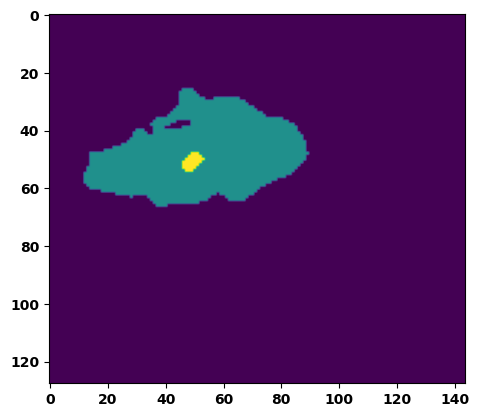

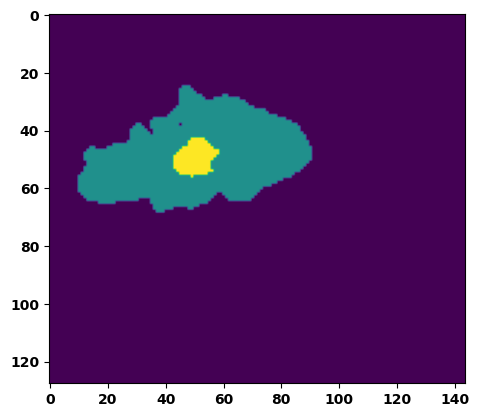

  6%|▌         | 2/36 [00:02<00:38,  1.12s/it]

Batch_id:  1 Eval loss:  0.7499462962150574
Batch_id:  1 Eval IoU:  tensor(0.2383, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9005, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8055, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:35,  1.07s/it]

Batch_id:  2 Eval loss:  0.7855011224746704
Batch_id:  2 Eval IoU:  tensor(0.1465, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.7365, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5286, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4760, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.06s/it]

Batch_id:  3 Eval loss:  0.766654372215271
Batch_id:  3 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.06s/it]

Batch_id:  4 Eval loss:  0.5785453915596008
Batch_id:  4 Eval IoU:  tensor(0.2980, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8122, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.6391, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7341, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9467, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.06s/it]

Batch_id:  5 Eval loss:  0.7573914527893066
Batch_id:  5 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.6841093301773071
Batch_id:  6 Eval IoU:  tensor(0.2248, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6247, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3162, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.7875, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.4246, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.7645488977432251
Batch_id:  7 Eval IoU:  tensor(0.2219, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8886, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9304, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.7571483254432678
Batch_id:  8 Eval IoU:  tensor(0.2272, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8967, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.04s/it]

Batch_id:  9 Eval loss:  0.8101385831832886
Batch_id:  9 Eval IoU:  tensor(0.1527, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8038, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.6127, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.7373, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  10 Eval loss:  0.7634201645851135
Batch_id:  10 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


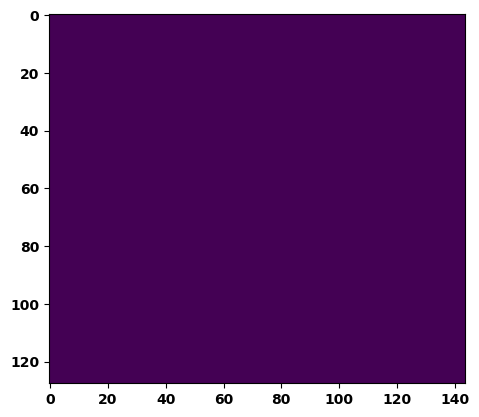

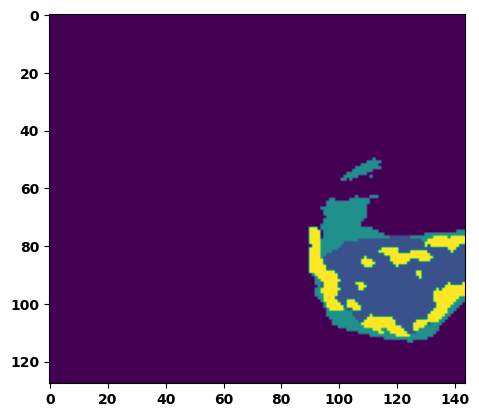

 33%|███▎      | 12/36 [00:12<00:25,  1.06s/it]

Batch_id:  11 Eval loss:  0.8822582364082336
Batch_id:  11 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6220, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4183, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.2441, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.05s/it]

Batch_id:  12 Eval loss:  0.6700601577758789
Batch_id:  12 Eval IoU:  tensor(0.2150, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6971, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4615, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.4491, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.08s/it]

Batch_id:  13 Eval loss:  0.08409428596496582
Batch_id:  13 Eval IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.06s/it]

Batch_id:  14 Eval loss:  0.1086355596780777
Batch_id:  14 Eval IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9904, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.06s/it]

Batch_id:  15 Eval loss:  0.7950470447540283
Batch_id:  15 Eval IoU:  tensor(0.1241, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6489, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3855, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2997, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:19,  1.04s/it]

Batch_id:  16 Eval loss:  0.7653796076774597
Batch_id:  16 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.7535065412521362
Batch_id:  17 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.01s/it]

Batch_id:  18 Eval loss:  0.7553909420967102
Batch_id:  18 Eval IoU:  tensor(0.1548, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6997, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.5033, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8501, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.4794, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.01s/it]

Batch_id:  19 Eval loss:  0.3302101492881775
Batch_id:  19 Eval IoU:  tensor(0.6053, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  20 Eval loss:  0.7660354971885681
Batch_id:  20 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


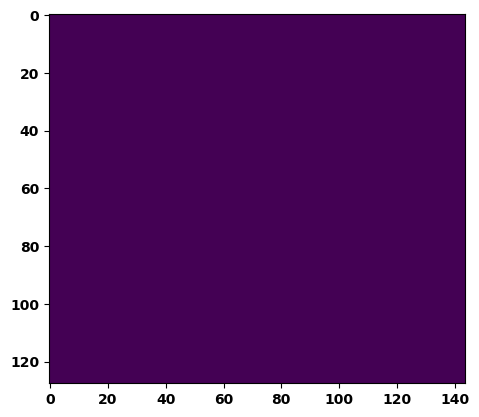

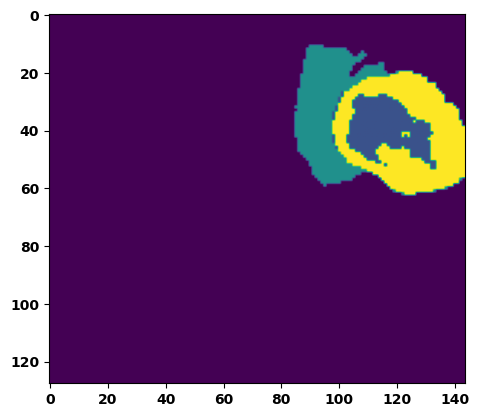

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.41896191239356995
Batch_id:  21 Eval IoU:  tensor(0.4840, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8703, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7508, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.7824, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9918, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.09s/it]

Batch_id:  22 Eval loss:  0.3281732201576233
Batch_id:  22 Eval IoU:  tensor(0.5983, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.08s/it]

Batch_id:  23 Eval loss:  0.7517834901809692
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.09s/it]

Batch_id:  24 Eval loss:  0.7562820315361023
Batch_id:  24 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.780841588973999
Batch_id:  25 Eval IoU:  tensor(0.1912, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7706, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8740, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.10s/it]

Batch_id:  26 Eval loss:  0.7681593298912048
Batch_id:  26 Eval IoU:  tensor(0.2117, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8405, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9274, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.7637567520141602
Batch_id:  27 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.08s/it]

Batch_id:  28 Eval loss:  0.7691354751586914
Batch_id:  28 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.6580389142036438
Batch_id:  29 Eval IoU:  tensor(0.2809, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9052, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8730, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8201, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  30 Eval loss:  0.6965528130531311
Batch_id:  30 Eval IoU:  tensor(0.2481, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8813, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.8397, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


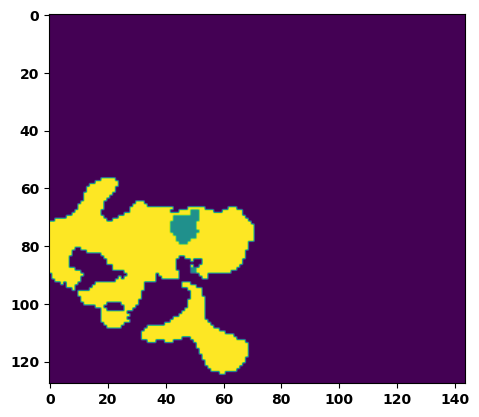

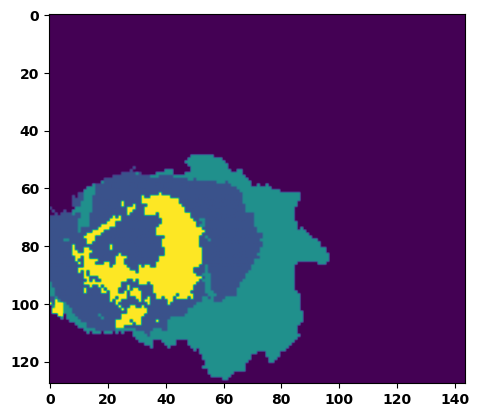

 89%|████████▉ | 32/36 [00:34<00:04,  1.10s/it]

Batch_id:  31 Eval loss:  0.7757374048233032
Batch_id:  31 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.10s/it]

Batch_id:  32 Eval loss:  0.7378310561180115
Batch_id:  32 Eval IoU:  tensor(0.2111, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8316, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7828, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8815, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.7416, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9206, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.10s/it]

Batch_id:  33 Eval loss:  0.761034369468689
Batch_id:  33 Eval IoU:  tensor(0.2284, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.12s/it]

Batch_id:  34 Eval loss:  0.7056913375854492
Batch_id:  34 Eval IoU:  tensor(0.2645, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.7571277618408203
Batch_id:  35 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')
Epoch  34 Training loss:  0.13650405190207743
Epoch  34 Evaluation loss:  0.6653238207929664
Epoch  34 Training accuracy :  tensor(0.7958)
Epoch  34 Evaluation accuracy :  tensor(0.2916)
Epoch  34 Training Mean Dice Score:  tensor(0.9888)
Epoch  34 Eval Mean Dice Score:  tensor(0.8887)
Epoch  34 Training Non-tumor Dice Score:  tensor(0.9856)
Epoch  34 Eval Non-tumor Dice Score:  tensor(0.8081)
Epoch  34 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  34 Eval NCR/NET Dice Score:  tensor(0.9657)
Epoch  34 Training ED Dice Score:  tensor(0.98

Epoch: 35
Training in session: 


  1%|          | 1/110 [00:01<02:20,  1.29s/it]

Batch_id:  0 Training loss:  0.1578548699617386
Batch_id:  0 Training IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:02,  1.14s/it]

Batch_id:  1 Training loss:  0.13587963581085205
Batch_id:  1 Training IoU:  tensor(0.7844, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.1057334840297699
Batch_id:  2 Training IoU:  tensor(0.8330, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:03,  1.17s/it]

Batch_id:  3 Training loss:  0.058127984404563904
Batch_id:  3 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:57,  1.12s/it]

Batch_id:  4 Training loss:  0.15979333221912384
Batch_id:  4 Training IoU:  tensor(0.7509, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.1094188541173935
Batch_id:  5 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:57,  1.14s/it]

Batch_id:  6 Training loss:  0.14199405908584595
Batch_id:  6 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:54,  1.13s/it]

Batch_id:  7 Training loss:  0.20831802487373352
Batch_id:  7 Training IoU:  tensor(0.6897, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:57,  1.16s/it]

Batch_id:  8 Training loss:  0.13432267308235168
Batch_id:  8 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:56,  1.16s/it]

Batch_id:  9 Training loss:  0.3994270861148834
Batch_id:  9 Training IoU:  tensor(0.5172, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 10%|█         | 11/110 [00:12<01:55,  1.16s/it]

Batch_id:  10 Training loss:  0.17158302664756775
Batch_id:  10 Training IoU:  tensor(0.7355, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.1632169485092163
Batch_id:  11 Training IoU:  tensor(0.7425, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:46,  1.10s/it]

Batch_id:  12 Training loss:  0.12768623232841492
Batch_id:  12 Training IoU:  tensor(0.8099, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:44,  1.09s/it]

Batch_id:  13 Training loss:  0.11003899574279785
Batch_id:  13 Training IoU:  tensor(0.8258, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.07961571216583252
Batch_id:  14 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:43,  1.10s/it]

Batch_id:  15 Training loss:  0.08249920606613159
Batch_id:  15 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:45,  1.13s/it]

Batch_id:  16 Training loss:  0.187312051653862
Batch_id:  16 Training IoU:  tensor(0.7279, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:42,  1.11s/it]

Batch_id:  17 Training loss:  0.17241401970386505
Batch_id:  17 Training IoU:  tensor(0.7228, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:39,  1.09s/it]

Batch_id:  18 Training loss:  0.19582118093967438
Batch_id:  18 Training IoU:  tensor(0.6945, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:37,  1.08s/it]

Batch_id:  19 Training loss:  0.08400286734104156
Batch_id:  19 Training IoU:  tensor(0.8559, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.13655777275562286
Batch_id:  20 Training IoU:  tensor(0.7722, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 20%|██        | 22/110 [00:24<01:35,  1.09s/it]

Batch_id:  21 Training loss:  0.23757562041282654
Batch_id:  21 Training IoU:  tensor(0.6790, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 21%|██        | 23/110 [00:25<01:34,  1.09s/it]

Batch_id:  22 Training loss:  0.06013660132884979
Batch_id:  22 Training IoU:  tensor(0.8972, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.08294248580932617
Batch_id:  23 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.07985050976276398
Batch_id:  24 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:33,  1.12s/it]

Batch_id:  25 Training loss:  0.10519929230213165
Batch_id:  25 Training IoU:  tensor(0.8280, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:32,  1.12s/it]

Batch_id:  26 Training loss:  0.1839374154806137
Batch_id:  26 Training IoU:  tensor(0.7089, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.11s/it]

Batch_id:  27 Training loss:  0.08641213178634644
Batch_id:  27 Training IoU:  tensor(0.8520, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.10s/it]

Batch_id:  28 Training loss:  0.14587141573429108
Batch_id:  28 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:28,  1.10s/it]

Batch_id:  29 Training loss:  0.09524388611316681
Batch_id:  29 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:26,  1.09s/it]

Batch_id:  30 Training loss:  0.12919659912586212
Batch_id:  30 Training IoU:  tensor(0.7865, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:25,  1.10s/it]

Batch_id:  31 Training loss:  0.06780649721622467
Batch_id:  31 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 30%|███       | 33/110 [00:36<01:23,  1.09s/it]

Batch_id:  32 Training loss:  0.08706676959991455
Batch_id:  32 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.09s/it]

Batch_id:  33 Training loss:  0.0702476054430008
Batch_id:  33 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:21,  1.09s/it]

Batch_id:  34 Training loss:  0.2023429274559021
Batch_id:  34 Training IoU:  tensor(0.6875, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:22,  1.11s/it]

Batch_id:  35 Training loss:  0.2157793939113617
Batch_id:  35 Training IoU:  tensor(0.7041, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:23,  1.15s/it]

Batch_id:  36 Training loss:  0.07745522260665894
Batch_id:  36 Training IoU:  tensor(0.8657, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:23,  1.16s/it]

Batch_id:  37 Training loss:  0.06138245761394501
Batch_id:  37 Training IoU:  tensor(0.8935, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:21,  1.14s/it]

Batch_id:  38 Training loss:  0.10461907088756561
Batch_id:  38 Training IoU:  tensor(0.8421, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:18,  1.12s/it]

Batch_id:  39 Training loss:  0.08850120007991791
Batch_id:  39 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.17065148055553436
Batch_id:  40 Training IoU:  tensor(0.7668, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:15,  1.10s/it]

Batch_id:  41 Training loss:  0.25333791971206665
Batch_id:  41 Training IoU:  tensor(0.6251, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:12,  1.09s/it]

Batch_id:  42 Training loss:  0.07191771268844604
Batch_id:  42 Training IoU:  tensor(0.8749, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 40%|████      | 44/110 [00:48<01:14,  1.12s/it]

Batch_id:  43 Training loss:  0.14911234378814697
Batch_id:  43 Training IoU:  tensor(0.7643, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 41%|████      | 45/110 [00:50<01:12,  1.11s/it]

Batch_id:  44 Training loss:  0.4617788791656494
Batch_id:  44 Training IoU:  tensor(0.4592, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:11,  1.11s/it]

Batch_id:  45 Training loss:  0.3486127555370331
Batch_id:  45 Training IoU:  tensor(0.5978, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:10,  1.11s/it]

Batch_id:  46 Training loss:  0.07430897653102875
Batch_id:  46 Training IoU:  tensor(0.8677, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.1634020060300827
Batch_id:  47 Training IoU:  tensor(0.7402, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.0804549902677536
Batch_id:  48 Training IoU:  tensor(0.8588, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.09s/it]

Batch_id:  49 Training loss:  0.15690815448760986
Batch_id:  49 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.14830490946769714
Batch_id:  50 Training IoU:  tensor(0.7600, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.09504395723342896
Batch_id:  51 Training IoU:  tensor(0.8341, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.06185714900493622
Batch_id:  52 Training IoU:  tensor(0.8962, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:01,  1.09s/it]

Batch_id:  53 Training loss:  0.09069541096687317
Batch_id:  53 Training IoU:  tensor(0.8531, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.1351393163204193
Batch_id:  54 Training IoU:  tensor(0.7773, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:59,  1.10s/it]

Batch_id:  55 Training loss:  0.05092571675777435
Batch_id:  55 Training IoU:  tensor(0.9131, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:58,  1.10s/it]

Batch_id:  56 Training loss:  0.12558601796627045
Batch_id:  56 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:56,  1.10s/it]

Batch_id:  57 Training loss:  0.08695371448993683
Batch_id:  57 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.1298377811908722
Batch_id:  58 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:53,  1.08s/it]

Batch_id:  59 Training loss:  0.07741932570934296
Batch_id:  59 Training IoU:  tensor(0.8627, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:52,  1.06s/it]

Batch_id:  60 Training loss:  0.05708007514476776
Batch_id:  60 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.11897534132003784
Batch_id:  61 Training IoU:  tensor(0.8008, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.09s/it]

Batch_id:  62 Training loss:  0.2541247010231018
Batch_id:  62 Training IoU:  tensor(0.6840, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:50,  1.09s/it]

Batch_id:  63 Training loss:  0.14704714715480804
Batch_id:  63 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.12794345617294312
Batch_id:  64 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:49,  1.13s/it]

Batch_id:  65 Training loss:  0.052806779742240906
Batch_id:  65 Training IoU:  tensor(0.9075, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:48,  1.12s/it]

Batch_id:  66 Training loss:  0.110060915350914
Batch_id:  66 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.1502935141324997
Batch_id:  67 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.3106914758682251
Batch_id:  68 Training IoU:  tensor(0.6582, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.05056758224964142
Batch_id:  69 Training IoU:  tensor(0.9161, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:43,  1.10s/it]

Batch_id:  70 Training loss:  0.04599209129810333
Batch_id:  70 Training IoU:  tensor(0.9170, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:42,  1.12s/it]

Batch_id:  71 Training loss:  0.07295455038547516
Batch_id:  71 Training IoU:  tensor(0.8788, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.14737899601459503
Batch_id:  72 Training IoU:  tensor(0.7793, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.06322608888149261
Batch_id:  73 Training IoU:  tensor(0.8900, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.3280336260795593
Batch_id:  74 Training IoU:  tensor(0.6184, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.15908512473106384
Batch_id:  75 Training IoU:  tensor(0.7773, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.19986610114574432
Batch_id:  76 Training IoU:  tensor(0.7299, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:34,  1.09s/it]

Batch_id:  77 Training loss:  0.12305903434753418
Batch_id:  77 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.10s/it]

Batch_id:  78 Training loss:  0.06560932099819183
Batch_id:  78 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.11s/it]

Batch_id:  79 Training loss:  0.13337351381778717
Batch_id:  79 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.1410430371761322
Batch_id:  80 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:30,  1.08s/it]

Batch_id:  81 Training loss:  0.15081195533275604
Batch_id:  81 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:28,  1.07s/it]

Batch_id:  82 Training loss:  0.17063285410404205
Batch_id:  82 Training IoU:  tensor(0.7947, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:27,  1.05s/it]

Batch_id:  83 Training loss:  0.11149090528488159
Batch_id:  83 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:26,  1.05s/it]

Batch_id:  84 Training loss:  0.06501521170139313
Batch_id:  84 Training IoU:  tensor(0.8866, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 78%|███████▊  | 86/110 [01:34<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.3502289652824402
Batch_id:  85 Training IoU:  tensor(0.5336, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.0803467333316803
Batch_id:  86 Training IoU:  tensor(0.8595, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.1780509203672409
Batch_id:  87 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:23,  1.14s/it]

Batch_id:  88 Training loss:  0.0494367778301239
Batch_id:  88 Training IoU:  tensor(0.9133, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.12s/it]

Batch_id:  89 Training loss:  0.08035537600517273
Batch_id:  89 Training IoU:  tensor(0.8675, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:20,  1.09s/it]

Batch_id:  90 Training loss:  0.0838104784488678
Batch_id:  90 Training IoU:  tensor(0.8636, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:19,  1.08s/it]

Batch_id:  91 Training loss:  0.20170050859451294
Batch_id:  91 Training IoU:  tensor(0.7119, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.08s/it]

Batch_id:  92 Training loss:  0.3205234706401825
Batch_id:  92 Training IoU:  tensor(0.6520, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:18,  1.17s/it]

Batch_id:  93 Training loss:  0.35691243410110474
Batch_id:  93 Training IoU:  tensor(0.5514, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:17,  1.14s/it]

Batch_id:  94 Training loss:  0.07811681926250458
Batch_id:  94 Training IoU:  tensor(0.8611, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.11s/it]

Batch_id:  95 Training loss:  0.14472535252571106
Batch_id:  95 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.13329559564590454
Batch_id:  96 Training IoU:  tensor(0.8014, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.08s/it]

Batch_id:  97 Training loss:  0.22865401208400726
Batch_id:  97 Training IoU:  tensor(0.6921, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.09488999843597412
Batch_id:  98 Training IoU:  tensor(0.8393, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.05924828350543976
Batch_id:  99 Training IoU:  tensor(0.8975, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.10719089210033417
Batch_id:  100 Training IoU:  tensor(0.8343, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.04940281808376312
Batch_id:  101 Training IoU:  tensor(0.9270, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.06699614226818085
Batch_id:  102 Training IoU:  tensor(0.8823, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.06488655507564545
Batch_id:  103 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.06s/it]

Batch_id:  104 Training loss:  0.13046741485595703
Batch_id:  104 Training IoU:  tensor(0.7791, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.14167910814285278
Batch_id:  105 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.08s/it]

Batch_id:  106 Training loss:  0.09499947726726532
Batch_id:  106 Training IoU:  tensor(0.8470, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.10s/it]

Batch_id:  107 Training loss:  0.11001142859458923
Batch_id:  107 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.10s/it]

Batch_id:  108 Training loss:  0.08305796980857849
Batch_id:  108 Training IoU:  tensor(0.8551, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.08948338031768799
Batch_id:  109 Training IoU:  tensor(0.8455, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9875, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7440043687820435
Batch_id:  0 Eval IoU:  tensor(0.1608, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7079, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.5094, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7444, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.5913, device='cuda:0')


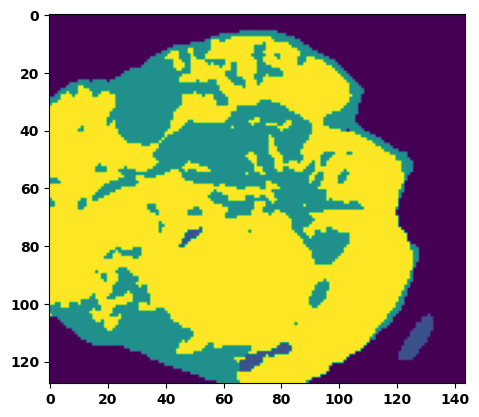

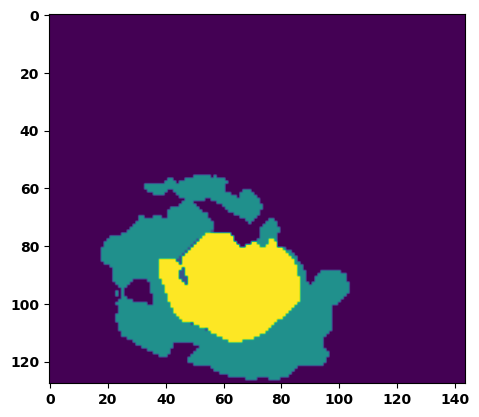

  6%|▌         | 2/36 [00:02<00:35,  1.05s/it]

Batch_id:  1 Eval loss:  0.7535215616226196
Batch_id:  1 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.03s/it]

Batch_id:  2 Eval loss:  0.36120522022247314
Batch_id:  2 Eval IoU:  tensor(0.5615, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9889, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.03s/it]

Batch_id:  3 Eval loss:  0.5855593681335449
Batch_id:  3 Eval IoU:  tensor(0.2993, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7275, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4703, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.5076, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9834, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.5470848679542542
Batch_id:  4 Eval IoU:  tensor(0.3670, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9096, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8898, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8467, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.02s/it]

Batch_id:  5 Eval loss:  0.7653971910476685
Batch_id:  5 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.03s/it]

Batch_id:  6 Eval loss:  0.11896754801273346
Batch_id:  6 Eval IoU:  tensor(0.7979, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.02s/it]

Batch_id:  7 Eval loss:  0.7563184499740601
Batch_id:  7 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.7548697590827942
Batch_id:  8 Eval IoU:  tensor(0.1638, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7404, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.5330, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.4964, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.07s/it]

Batch_id:  9 Eval loss:  0.4235662817955017
Batch_id:  9 Eval IoU:  tensor(0.4745, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8555, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7340, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8671, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8317, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  10 Eval loss:  0.7691560983657837
Batch_id:  10 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


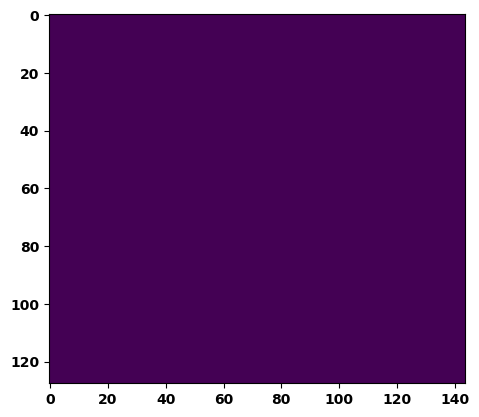

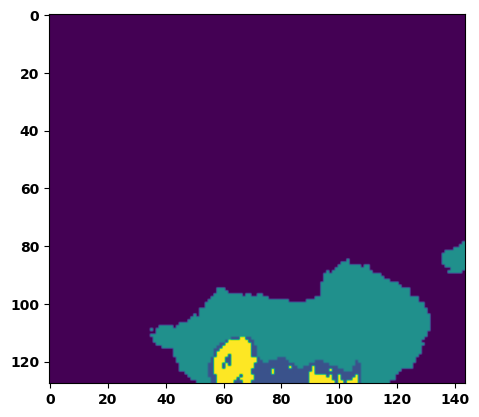

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.7803939580917358
Batch_id:  11 Eval IoU:  tensor(0.1957, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8910, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.7829, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.7517943382263184
Batch_id:  12 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.7739347219467163
Batch_id:  13 Eval IoU:  tensor(0.2064, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9128, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8257, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.6528662443161011
Batch_id:  14 Eval IoU:  tensor(0.2804, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8658, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9261, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9557, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.10s/it]

Batch_id:  15 Eval loss:  0.7315899133682251
Batch_id:  15 Eval IoU:  tensor(0.2443, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.7896045446395874
Batch_id:  16 Eval IoU:  tensor(0.1759, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8346, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7069, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8889, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8876, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.06s/it]

Batch_id:  17 Eval loss:  0.5994555354118347
Batch_id:  17 Eval IoU:  tensor(0.3524, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.08s/it]

Batch_id:  18 Eval loss:  0.1939377635717392
Batch_id:  18 Eval IoU:  tensor(0.7305, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9948, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.07s/it]

Batch_id:  19 Eval loss:  0.18435348570346832
Batch_id:  19 Eval IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Eval loss:  0.7331703901290894
Batch_id:  20 Eval IoU:  tensor(0.2439, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


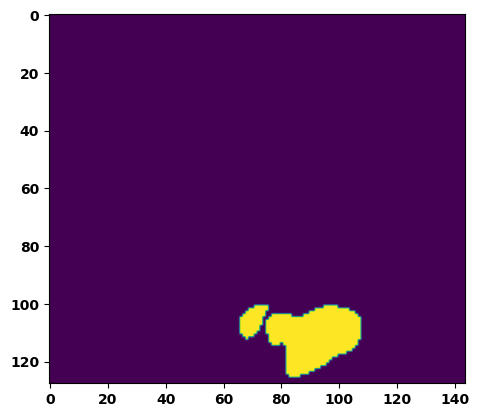

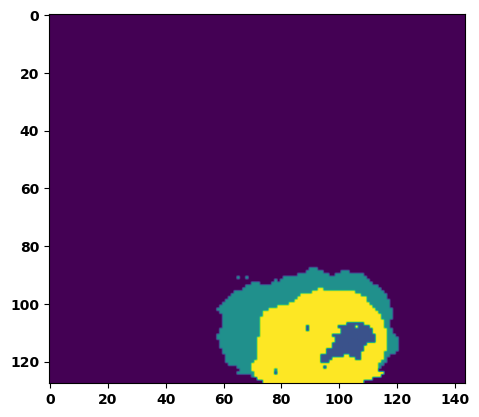

 61%|██████    | 22/36 [00:23<00:14,  1.07s/it]

Batch_id:  21 Eval loss:  0.7196769714355469
Batch_id:  21 Eval IoU:  tensor(0.2580, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8142, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.03s/it]

Batch_id:  22 Eval loss:  0.6755335330963135
Batch_id:  22 Eval IoU:  tensor(0.2274, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.6320, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3290, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.5678, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.6630, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.8017367124557495
Batch_id:  23 Eval IoU:  tensor(0.1197, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.6503, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3899, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3019, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.02s/it]

Batch_id:  24 Eval loss:  0.5615335702896118
Batch_id:  24 Eval IoU:  tensor(0.3548, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9753, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.01s/it]

Batch_id:  25 Eval loss:  0.7660562992095947
Batch_id:  25 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.7571443319320679
Batch_id:  26 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.01s/it]

Batch_id:  27 Eval loss:  0.8817944526672363
Batch_id:  27 Eval IoU:  tensor(0.0753, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6226, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4195, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2453, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.03s/it]

Batch_id:  28 Eval loss:  0.6927314400672913
Batch_id:  28 Eval IoU:  tensor(0.2409, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8544, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7724, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.7696, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.01s/it]

Batch_id:  29 Eval loss:  0.41239407658576965
Batch_id:  29 Eval IoU:  tensor(0.5017, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8823, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  30 Eval loss:  0.66105055809021
Batch_id:  30 Eval IoU:  tensor(0.2222, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6947, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4468, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.4623, device='cuda:0')


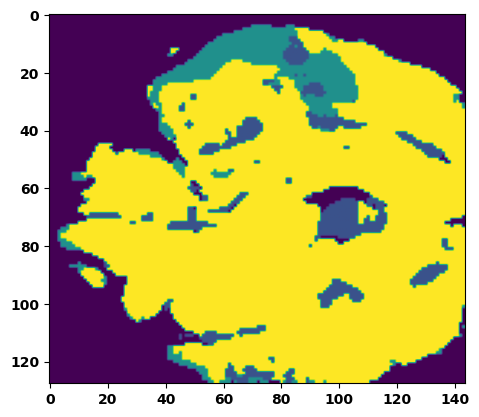

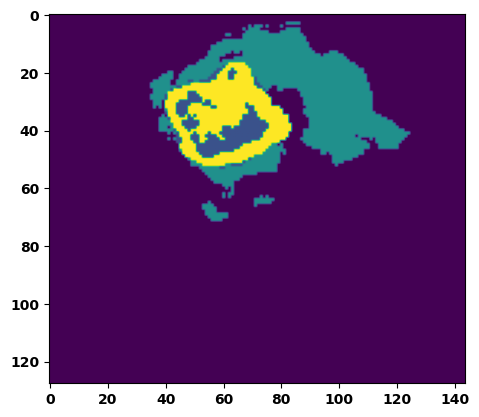

 89%|████████▉ | 32/36 [00:33<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.7281642556190491
Batch_id:  31 Eval IoU:  tensor(0.2444, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9807, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.09s/it]

Batch_id:  32 Eval loss:  0.8070963025093079
Batch_id:  32 Eval IoU:  tensor(0.1312, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7018, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.5278, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.7083, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6489, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9222, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.8046796321868896
Batch_id:  33 Eval IoU:  tensor(0.1604, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8206, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.6416, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7896, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.03s/it]

Batch_id:  34 Eval loss:  0.775745153427124
Batch_id:  34 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.7615582942962646
Batch_id:  35 Eval IoU:  tensor(0.2210, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8744, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')
Epoch  35 Training loss:  0.13610061772845009
Epoch  35 Evaluation loss:  0.6549346442851756
Epoch  35 Training accuracy :  tensor(0.7962)
Epoch  35 Evaluation accuracy :  tensor(0.2927)
Epoch  35 Training Mean Dice Score:  tensor(0.9888)
Epoch  35 Eval Mean Dice Score:  tensor(0.8786)
Epoch  35 Training Non-tumor Dice Score:  tensor(0.9857)
Epoch  35 Eval Non-tumor Dice Score:  tensor(0.7915)
Epoch  35 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  35 Eval NCR/NET Dice Score:  tensor(0.9498)
Epoch  35 Training ED Dice Score:  tensor(0.98

Epoch: 36
Training in session: 


  1%|          | 1/110 [00:01<02:16,  1.25s/it]

Batch_id:  0 Training loss:  0.05338220298290253
Batch_id:  0 Training IoU:  tensor(0.9065, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:03,  1.14s/it]

Batch_id:  1 Training loss:  0.16579411923885345
Batch_id:  1 Training IoU:  tensor(0.7312, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:04,  1.17s/it]

Batch_id:  2 Training loss:  0.3236703872680664
Batch_id:  2 Training IoU:  tensor(0.6465, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:00,  1.13s/it]

Batch_id:  3 Training loss:  0.13772280514240265
Batch_id:  3 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:56,  1.11s/it]

Batch_id:  4 Training loss:  0.08602645993232727
Batch_id:  4 Training IoU:  tensor(0.8604, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.10s/it]

Batch_id:  5 Training loss:  0.179100900888443
Batch_id:  5 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.10s/it]

Batch_id:  6 Training loss:  0.23911823332309723
Batch_id:  6 Training IoU:  tensor(0.6789, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.09s/it]

Batch_id:  7 Training loss:  0.058765605092048645
Batch_id:  7 Training IoU:  tensor(0.8982, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:53,  1.13s/it]

Batch_id:  8 Training loss:  0.17897121608257294
Batch_id:  8 Training IoU:  tensor(0.7229, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:50,  1.10s/it]

Batch_id:  9 Training loss:  0.13383691012859344
Batch_id:  9 Training IoU:  tensor(0.7755, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 10%|█         | 11/110 [00:12<01:48,  1.10s/it]

Batch_id:  10 Training loss:  0.15453502535820007
Batch_id:  10 Training IoU:  tensor(0.7534, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.0952129065990448
Batch_id:  11 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.13146401941776276
Batch_id:  12 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:47,  1.12s/it]

Batch_id:  13 Training loss:  0.200374573469162
Batch_id:  13 Training IoU:  tensor(0.6893, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.14508599042892456
Batch_id:  14 Training IoU:  tensor(0.7655, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:44,  1.11s/it]

Batch_id:  15 Training loss:  0.08463053405284882
Batch_id:  15 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:46,  1.15s/it]

Batch_id:  16 Training loss:  0.1890149712562561
Batch_id:  16 Training IoU:  tensor(0.7034, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:46,  1.16s/it]

Batch_id:  17 Training loss:  0.06455305218696594
Batch_id:  17 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:40,  1.10s/it]

Batch_id:  18 Training loss:  0.1575835943222046
Batch_id:  18 Training IoU:  tensor(0.7465, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:42,  1.14s/it]

Batch_id:  19 Training loss:  0.04889935255050659
Batch_id:  19 Training IoU:  tensor(0.9149, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:42,  1.15s/it]

Batch_id:  20 Training loss:  0.0653044581413269
Batch_id:  20 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 20%|██        | 22/110 [00:24<01:41,  1.15s/it]

Batch_id:  21 Training loss:  0.18327166140079498
Batch_id:  21 Training IoU:  tensor(0.7312, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 21%|██        | 23/110 [00:25<01:38,  1.13s/it]

Batch_id:  22 Training loss:  0.08082640171051025
Batch_id:  22 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:38,  1.15s/it]

Batch_id:  23 Training loss:  0.13669781386852264
Batch_id:  23 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:40,  1.18s/it]

Batch_id:  24 Training loss:  0.1253151148557663
Batch_id:  24 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:37,  1.16s/it]

Batch_id:  25 Training loss:  0.12138046324253082
Batch_id:  25 Training IoU:  tensor(0.7967, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:34,  1.14s/it]

Batch_id:  26 Training loss:  0.06438794732093811
Batch_id:  26 Training IoU:  tensor(0.8868, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:31,  1.12s/it]

Batch_id:  27 Training loss:  0.12579864263534546
Batch_id:  27 Training IoU:  tensor(0.7876, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.2571507692337036
Batch_id:  28 Training IoU:  tensor(0.6206, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:29,  1.12s/it]

Batch_id:  29 Training loss:  0.1547391414642334
Batch_id:  29 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 28%|██▊       | 31/110 [00:35<01:28,  1.12s/it]

Batch_id:  30 Training loss:  0.11095286905765533
Batch_id:  30 Training IoU:  tensor(0.8341, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.16203664243221283
Batch_id:  31 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 30%|███       | 33/110 [00:37<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.21965645253658295
Batch_id:  32 Training IoU:  tensor(0.7005, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 31%|███       | 34/110 [00:38<01:20,  1.07s/it]

Batch_id:  33 Training loss:  0.11010423302650452
Batch_id:  33 Training IoU:  tensor(0.8241, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:18,  1.05s/it]

Batch_id:  34 Training loss:  0.10838092863559723
Batch_id:  34 Training IoU:  tensor(0.8160, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.4569077789783478
Batch_id:  35 Training IoU:  tensor(0.4632, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.12276993691921234
Batch_id:  36 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:18,  1.08s/it]

Batch_id:  37 Training loss:  0.06425394117832184
Batch_id:  37 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:21,  1.15s/it]

Batch_id:  38 Training loss:  0.1301744133234024
Batch_id:  38 Training IoU:  tensor(0.8055, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.11s/it]

Batch_id:  39 Training loss:  0.12948113679885864
Batch_id:  39 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:13,  1.07s/it]

Batch_id:  40 Training loss:  0.06355635821819305
Batch_id:  40 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.1419835239648819
Batch_id:  41 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:13,  1.09s/it]

Batch_id:  42 Training loss:  0.3447113633155823
Batch_id:  42 Training IoU:  tensor(0.6045, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 40%|████      | 44/110 [00:49<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.07217346131801605
Batch_id:  43 Training IoU:  tensor(0.8833, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 41%|████      | 45/110 [00:50<01:11,  1.09s/it]

Batch_id:  44 Training loss:  0.0787665843963623
Batch_id:  44 Training IoU:  tensor(0.8592, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:08,  1.08s/it]

Batch_id:  45 Training loss:  0.07329653203487396
Batch_id:  45 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.06234493851661682
Batch_id:  46 Training IoU:  tensor(0.8957, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.08007113635540009
Batch_id:  47 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:06,  1.08s/it]

Batch_id:  48 Training loss:  0.16317792236804962
Batch_id:  48 Training IoU:  tensor(0.7519, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.09s/it]

Batch_id:  49 Training loss:  0.04713338613510132
Batch_id:  49 Training IoU:  tensor(0.9322, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.1524980217218399
Batch_id:  50 Training IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.1292250156402588
Batch_id:  51 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:01,  1.09s/it]

Batch_id:  52 Training loss:  0.10803352296352386
Batch_id:  52 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 49%|████▉     | 54/110 [00:59<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.0966213047504425
Batch_id:  53 Training IoU:  tensor(0.8373, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.09s/it]

Batch_id:  54 Training loss:  0.13545365631580353
Batch_id:  54 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.05787041783332825
Batch_id:  55 Training IoU:  tensor(0.8995, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.35317158699035645
Batch_id:  56 Training IoU:  tensor(0.5308, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.049830615520477295
Batch_id:  57 Training IoU:  tensor(0.9169, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.14714322984218597
Batch_id:  58 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.11066550016403198
Batch_id:  59 Training IoU:  tensor(0.8122, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:52,  1.07s/it]

Batch_id:  60 Training loss:  0.13336576521396637
Batch_id:  60 Training IoU:  tensor(0.7951, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.08075150847434998
Batch_id:  61 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:52,  1.13s/it]

Batch_id:  62 Training loss:  0.06158451735973358
Batch_id:  62 Training IoU:  tensor(0.8929, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:50,  1.11s/it]

Batch_id:  63 Training loss:  0.08796720206737518
Batch_id:  63 Training IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.1347876638174057
Batch_id:  64 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:48,  1.11s/it]

Batch_id:  65 Training loss:  0.07696790993213654
Batch_id:  65 Training IoU:  tensor(0.8632, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:49,  1.15s/it]

Batch_id:  66 Training loss:  0.14331074059009552
Batch_id:  66 Training IoU:  tensor(0.8008, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:47,  1.13s/it]

Batch_id:  67 Training loss:  0.16898536682128906
Batch_id:  67 Training IoU:  tensor(0.7689, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:46,  1.13s/it]

Batch_id:  68 Training loss:  0.051790520548820496
Batch_id:  68 Training IoU:  tensor(0.9120, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:45,  1.13s/it]

Batch_id:  69 Training loss:  0.2522754669189453
Batch_id:  69 Training IoU:  tensor(0.6864, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:42,  1.10s/it]

Batch_id:  70 Training loss:  0.06467705965042114
Batch_id:  70 Training IoU:  tensor(0.8883, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.20077209174633026
Batch_id:  71 Training IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.10525663197040558
Batch_id:  72 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:39,  1.11s/it]

Batch_id:  73 Training loss:  0.09325684607028961
Batch_id:  73 Training IoU:  tensor(0.8384, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.08826597034931183
Batch_id:  74 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:37,  1.10s/it]

Batch_id:  75 Training loss:  0.08346632122993469
Batch_id:  75 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.10640230774879456
Batch_id:  76 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.1555728018283844
Batch_id:  77 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.12s/it]

Batch_id:  78 Training loss:  0.07797786593437195
Batch_id:  78 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.12s/it]

Batch_id:  79 Training loss:  0.1620541363954544
Batch_id:  79 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.20517359673976898
Batch_id:  80 Training IoU:  tensor(0.6938, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:31,  1.12s/it]

Batch_id:  81 Training loss:  0.08030766248703003
Batch_id:  81 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.13699081540107727
Batch_id:  82 Training IoU:  tensor(0.7870, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:28,  1.09s/it]

Batch_id:  83 Training loss:  0.1117648184299469
Batch_id:  83 Training IoU:  tensor(0.8107, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:28,  1.13s/it]

Batch_id:  84 Training loss:  0.09583531320095062
Batch_id:  84 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.11s/it]

Batch_id:  85 Training loss:  0.3305816054344177
Batch_id:  85 Training IoU:  tensor(0.6146, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.05919171869754791
Batch_id:  86 Training IoU:  tensor(0.8973, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.17870871722698212
Batch_id:  87 Training IoU:  tensor(0.7528, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.1324746459722519
Batch_id:  88 Training IoU:  tensor(0.8065, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.10s/it]

Batch_id:  89 Training loss:  0.14995357394218445
Batch_id:  89 Training IoU:  tensor(0.7555, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:20,  1.07s/it]

Batch_id:  90 Training loss:  0.3104122579097748
Batch_id:  90 Training IoU:  tensor(0.6599, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:19,  1.06s/it]

Batch_id:  91 Training loss:  0.08797024190425873
Batch_id:  91 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.045536428689956665
Batch_id:  92 Training IoU:  tensor(0.9182, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.08s/it]

Batch_id:  93 Training loss:  0.0849587619304657
Batch_id:  93 Training IoU:  tensor(0.8527, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:16,  1.12s/it]

Batch_id:  94 Training loss:  0.14877024292945862
Batch_id:  94 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.0959283858537674
Batch_id:  95 Training IoU:  tensor(0.8319, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.07535374164581299
Batch_id:  96 Training IoU:  tensor(0.8657, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:12,  1.06s/it]

Batch_id:  97 Training loss:  0.127032071352005
Batch_id:  97 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.05s/it]

Batch_id:  98 Training loss:  0.08845092356204987
Batch_id:  98 Training IoU:  tensor(0.8460, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.06s/it]

Batch_id:  99 Training loss:  0.08403195440769196
Batch_id:  99 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.056623369455337524
Batch_id:  100 Training IoU:  tensor(0.9032, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.19452060759067535
Batch_id:  101 Training IoU:  tensor(0.7217, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.07s/it]

Batch_id:  102 Training loss:  0.39277681708335876
Batch_id:  102 Training IoU:  tensor(0.5246, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.18236427009105682
Batch_id:  103 Training IoU:  tensor(0.7106, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.11s/it]

Batch_id:  104 Training loss:  0.11118035018444061
Batch_id:  104 Training IoU:  tensor(0.8811, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.08284832537174225
Batch_id:  105 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.08574061095714569
Batch_id:  106 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.07018446922302246
Batch_id:  107 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.35489141941070557
Batch_id:  108 Training IoU:  tensor(0.5549, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.21855944395065308
Batch_id:  109 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9975, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.677579402923584
Batch_id:  0 Eval IoU:  tensor(0.2375, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8311, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7131, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7246, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9476, device='cuda:0')


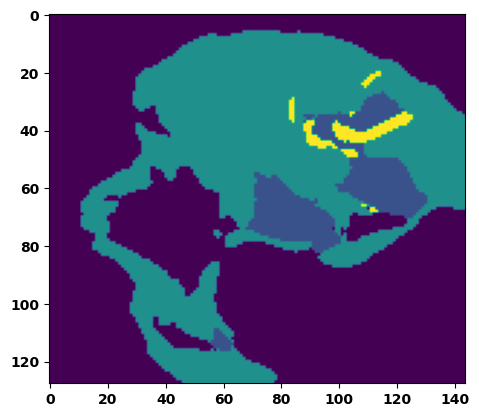

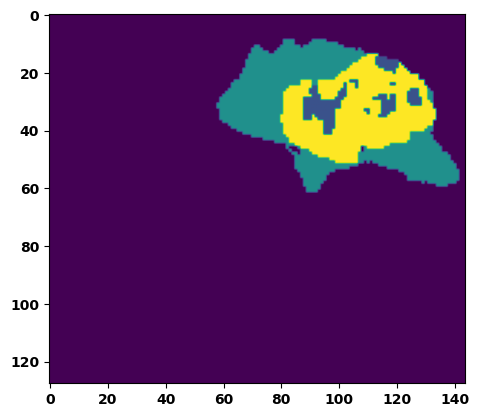

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7794359922409058
Batch_id:  1 Eval IoU:  tensor(0.1870, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8603, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7330, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8904, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.3269544243812561
Batch_id:  2 Eval IoU:  tensor(0.5506, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.01s/it]

Batch_id:  3 Eval loss:  0.8188636898994446
Batch_id:  3 Eval IoU:  tensor(0.1179, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6843, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4922, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.3810, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.01s/it]

Batch_id:  4 Eval loss:  0.7312189340591431
Batch_id:  4 Eval IoU:  tensor(0.2388, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8812, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:29,  1.01it/s]

Batch_id:  5 Eval loss:  0.8447959423065186
Batch_id:  5 Eval IoU:  tensor(0.0928, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6361, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3748, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9127, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3055, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:28,  1.01it/s]

Batch_id:  6 Eval loss:  0.8215324878692627
Batch_id:  6 Eval IoU:  tensor(0.1125, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6779, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4483, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.3646, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.02s/it]

Batch_id:  7 Eval loss:  0.7571407556533813
Batch_id:  7 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.03s/it]

Batch_id:  8 Eval loss:  0.350410521030426
Batch_id:  8 Eval IoU:  tensor(0.5249, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9927, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.8850116729736328
Batch_id:  9 Eval IoU:  tensor(0.0727, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6184, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4110, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.2375, device='cuda:0')
Batch_id:  10 Eval loss:  0.16205008327960968
Batch_id:  10 Eval IoU:  tensor(0.7527, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


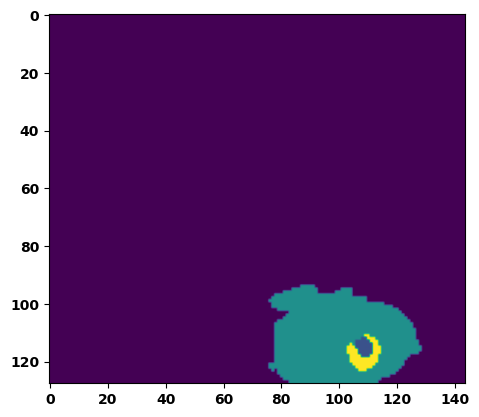

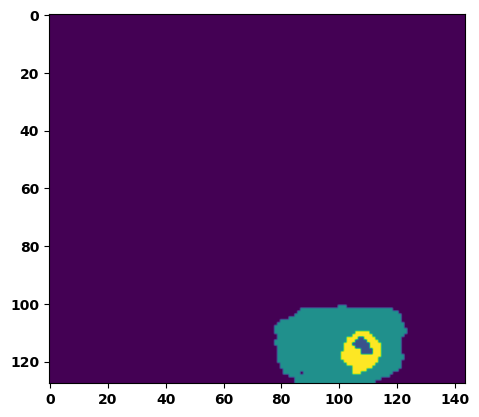

 33%|███▎      | 12/36 [00:12<00:25,  1.07s/it]

Batch_id:  11 Eval loss:  0.7645677924156189
Batch_id:  11 Eval IoU:  tensor(0.2222, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8886, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:25,  1.09s/it]

Batch_id:  12 Eval loss:  0.8560349345207214
Batch_id:  12 Eval IoU:  tensor(0.0877, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6410, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3761, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.2835, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.4209677577018738
Batch_id:  13 Eval IoU:  tensor(0.4944, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8769, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.7620, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.7610, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:23,  1.11s/it]

Batch_id:  14 Eval loss:  0.28761154413223267
Batch_id:  14 Eval IoU:  tensor(0.6485, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.8351798057556152
Batch_id:  15 Eval IoU:  tensor(0.1028, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6568, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4116, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9198, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8582, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.4376, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:21,  1.14s/it]

Batch_id:  16 Eval loss:  0.7691490054130554
Batch_id:  16 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.09s/it]

Batch_id:  17 Eval loss:  0.8283799290657043
Batch_id:  17 Eval IoU:  tensor(0.1083, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6794, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4145, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.3616, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.09884542226791382
Batch_id:  18 Eval IoU:  tensor(0.8307, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9904, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.7517963647842407
Batch_id:  19 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Eval loss:  0.7653595209121704
Batch_id:  20 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


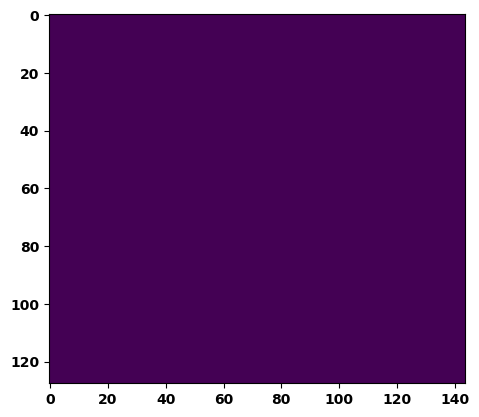

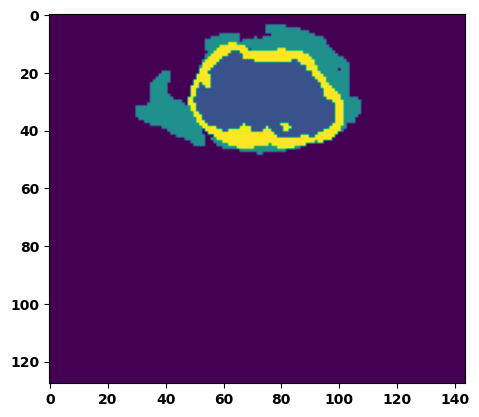

 61%|██████    | 22/36 [00:23<00:14,  1.05s/it]

Batch_id:  21 Eval loss:  0.4135625958442688
Batch_id:  21 Eval IoU:  tensor(0.4627, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9169, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9004, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8424, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9679, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.03s/it]

Batch_id:  22 Eval loss:  0.5541017651557922
Batch_id:  22 Eval IoU:  tensor(0.3634, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8749, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9356, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.03s/it]

Batch_id:  23 Eval loss:  0.037990376353263855
Batch_id:  23 Eval IoU:  tensor(0.9298, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.03s/it]

Batch_id:  24 Eval loss:  0.6317349672317505
Batch_id:  24 Eval IoU:  tensor(0.2445, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.7066, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4800, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8946, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.5173, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9346, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.04s/it]

Batch_id:  25 Eval loss:  0.19666974246501923
Batch_id:  25 Eval IoU:  tensor(0.7187, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.02s/it]

Batch_id:  26 Eval loss:  0.8211079835891724
Batch_id:  26 Eval IoU:  tensor(0.1338, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.7613, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.5320, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.6484, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9271, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.01s/it]

Batch_id:  27 Eval loss:  0.30912408232688904
Batch_id:  27 Eval IoU:  tensor(0.5710, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9769, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.01s/it]

Batch_id:  28 Eval loss:  0.7535037398338318
Batch_id:  28 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.11s/it]

Batch_id:  29 Eval loss:  0.7634724378585815
Batch_id:  29 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  30 Eval loss:  0.08756852149963379
Batch_id:  30 Eval IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


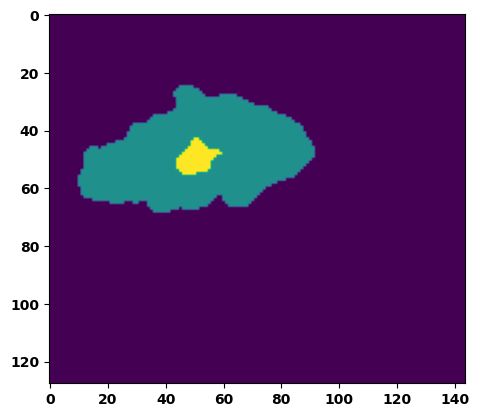

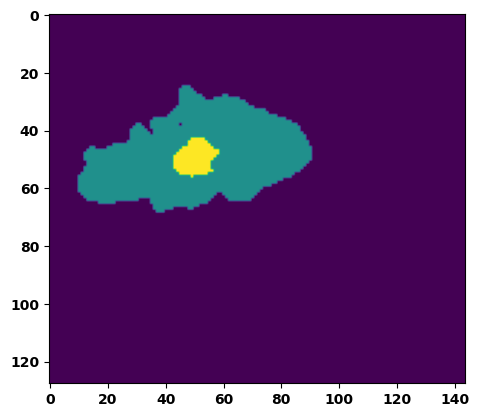

 89%|████████▉ | 32/36 [00:33<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.410348117351532
Batch_id:  31 Eval IoU:  tensor(0.4648, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9781, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.893826961517334
Batch_id:  32 Eval IoU:  tensor(0.0600, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.5931, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3067, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.1882, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.05s/it]

Batch_id:  33 Eval loss:  0.4497068226337433
Batch_id:  33 Eval IoU:  tensor(0.4667, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9016, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.6394803524017334
Batch_id:  34 Eval IoU:  tensor(0.2570, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8090, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.6644, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.6548, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]

Batch_id:  35 Eval loss:  0.8176347017288208
Batch_id:  35 Eval IoU:  tensor(0.1115, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6460, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3364, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8760, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.4209, device='cuda:0')
Epoch 00037: reducing learning rate of group 0 to 1.5625e-05.
Epoch  36 Training loss:  0.1357606140050021
Epoch  36 Evaluation loss:  0.5920199764271578
Epoch  36 Training accuracy :  tensor(0.7966)
Epoch  36 Evaluation accuracy :  tensor(0.3453)
Epoch  36 Training Mean Dice Score:  tensor(0.9888)
Epoch  36 Eval Mean Dice Score:  tensor(0.8593)
Epoch  36 Training Non-tumor Dice Score:  tensor(0.9856)
Epoch  36 Eval Non-tumor Dice Score:  tensor(0.7570)
Epoch  36 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  36 Eval NCR/NET Dice Score:  

Epoch: 37
Training in session: 


  1%|          | 1/110 [00:01<02:00,  1.11s/it]

Batch_id:  0 Training loss:  0.05115847289562225
Batch_id:  0 Training IoU:  tensor(0.9241, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:55,  1.07s/it]

Batch_id:  1 Training loss:  0.048741817474365234
Batch_id:  1 Training IoU:  tensor(0.9190, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.09291118383407593
Batch_id:  2 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:51,  1.05s/it]

Batch_id:  3 Training loss:  0.08418409526348114
Batch_id:  3 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:50,  1.06s/it]

Batch_id:  4 Training loss:  0.3424868583679199
Batch_id:  4 Training IoU:  tensor(0.5398, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:49,  1.06s/it]

Batch_id:  5 Training loss:  0.14909392595291138
Batch_id:  5 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.07s/it]

Batch_id:  6 Training loss:  0.18180130422115326
Batch_id:  6 Training IoU:  tensor(0.7180, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.07s/it]

Batch_id:  7 Training loss:  0.3525415062904358
Batch_id:  7 Training IoU:  tensor(0.5576, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:47,  1.06s/it]

Batch_id:  8 Training loss:  0.15941886603832245
Batch_id:  8 Training IoU:  tensor(0.7438, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:47,  1.08s/it]

Batch_id:  9 Training loss:  0.06061059236526489
Batch_id:  9 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.07s/it]

Batch_id:  10 Training loss:  0.1972017139196396
Batch_id:  10 Training IoU:  tensor(0.6943, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 11%|█         | 12/110 [00:12<01:44,  1.06s/it]

Batch_id:  11 Training loss:  0.39507386088371277
Batch_id:  11 Training IoU:  tensor(0.5207, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:44,  1.08s/it]

Batch_id:  12 Training loss:  0.049716174602508545
Batch_id:  12 Training IoU:  tensor(0.9128, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.35132819414138794
Batch_id:  13 Training IoU:  tensor(0.5931, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:43,  1.09s/it]

Batch_id:  14 Training loss:  0.06367422640323639
Batch_id:  14 Training IoU:  tensor(0.8910, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.1200718879699707
Batch_id:  15 Training IoU:  tensor(0.7997, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:41,  1.09s/it]

Batch_id:  16 Training loss:  0.08302295207977295
Batch_id:  16 Training IoU:  tensor(0.8629, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.09s/it]

Batch_id:  17 Training loss:  0.08702616393566132
Batch_id:  17 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:37,  1.07s/it]

Batch_id:  18 Training loss:  0.11123241484165192
Batch_id:  18 Training IoU:  tensor(0.8122, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.3193618059158325
Batch_id:  19 Training IoU:  tensor(0.6524, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9998, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:35,  1.07s/it]

Batch_id:  20 Training loss:  0.08338715136051178
Batch_id:  20 Training IoU:  tensor(0.8568, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.06s/it]

Batch_id:  21 Training loss:  0.19249114394187927
Batch_id:  21 Training IoU:  tensor(0.7238, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 21%|██        | 23/110 [00:24<01:33,  1.07s/it]

Batch_id:  22 Training loss:  0.17230437695980072
Batch_id:  22 Training IoU:  tensor(0.7222, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:34,  1.10s/it]

Batch_id:  23 Training loss:  0.057394981384277344
Batch_id:  23 Training IoU:  tensor(0.9017, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:31,  1.07s/it]

Batch_id:  24 Training loss:  0.1328863501548767
Batch_id:  24 Training IoU:  tensor(0.7783, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:29,  1.07s/it]

Batch_id:  25 Training loss:  0.12753401696681976
Batch_id:  25 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:29,  1.07s/it]

Batch_id:  26 Training loss:  0.14038479328155518
Batch_id:  26 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.08023971319198608
Batch_id:  27 Training IoU:  tensor(0.8584, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.05062992870807648
Batch_id:  28 Training IoU:  tensor(0.9143, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.08199159801006317
Batch_id:  29 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:26,  1.09s/it]

Batch_id:  30 Training loss:  0.07709197700023651
Batch_id:  30 Training IoU:  tensor(0.8661, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.12525492906570435
Batch_id:  31 Training IoU:  tensor(0.8012, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.08s/it]

Batch_id:  32 Training loss:  0.18850232660770416
Batch_id:  32 Training IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 31%|███       | 34/110 [00:36<01:21,  1.07s/it]

Batch_id:  33 Training loss:  0.1340467482805252
Batch_id:  33 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.09801045060157776
Batch_id:  34 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.14787235856056213
Batch_id:  35 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:17,  1.07s/it]

Batch_id:  36 Training loss:  0.07866239547729492
Batch_id:  36 Training IoU:  tensor(0.8600, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.06206849217414856
Batch_id:  37 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 35%|███▌      | 39/110 [00:41<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.45759958028793335
Batch_id:  38 Training IoU:  tensor(0.4606, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 36%|███▋      | 40/110 [00:42<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.16561059653759003
Batch_id:  39 Training IoU:  tensor(0.7722, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.1280645728111267
Batch_id:  40 Training IoU:  tensor(0.7884, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.14781267940998077
Batch_id:  41 Training IoU:  tensor(0.7633, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:10,  1.06s/it]

Batch_id:  42 Training loss:  0.06312713027000427
Batch_id:  42 Training IoU:  tensor(0.8905, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 40%|████      | 44/110 [00:47<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.05806678533554077
Batch_id:  43 Training IoU:  tensor(0.8996, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 41%|████      | 45/110 [00:48<01:09,  1.08s/it]

Batch_id:  44 Training loss:  0.14085017144680023
Batch_id:  44 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:07,  1.06s/it]

Batch_id:  45 Training loss:  0.09283611178398132
Batch_id:  45 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:07,  1.07s/it]

Batch_id:  46 Training loss:  0.10396279394626617
Batch_id:  46 Training IoU:  tensor(0.8442, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:05,  1.06s/it]

Batch_id:  47 Training loss:  0.08089347183704376
Batch_id:  47 Training IoU:  tensor(0.8587, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:04,  1.05s/it]

Batch_id:  48 Training loss:  0.08526895940303802
Batch_id:  48 Training IoU:  tensor(0.8621, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:03,  1.06s/it]

Batch_id:  49 Training loss:  0.07352571189403534
Batch_id:  49 Training IoU:  tensor(0.8688, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.0855436623096466
Batch_id:  50 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.08099409937858582
Batch_id:  51 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:02,  1.09s/it]

Batch_id:  52 Training loss:  0.32814913988113403
Batch_id:  52 Training IoU:  tensor(0.6184, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.10573001205921173
Batch_id:  53 Training IoU:  tensor(0.8921, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.14186476171016693
Batch_id:  54 Training IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.10965757071971893
Batch_id:  55 Training IoU:  tensor(0.8259, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:55,  1.05s/it]

Batch_id:  56 Training loss:  0.21951167285442352
Batch_id:  56 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:54,  1.04s/it]

Batch_id:  57 Training loss:  0.1285792738199234
Batch_id:  57 Training IoU:  tensor(0.8087, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:52,  1.03s/it]

Batch_id:  58 Training loss:  0.086898073554039
Batch_id:  58 Training IoU:  tensor(0.8527, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:51,  1.03s/it]

Batch_id:  59 Training loss:  0.13268539309501648
Batch_id:  59 Training IoU:  tensor(0.7791, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:50,  1.04s/it]

Batch_id:  60 Training loss:  0.08299173414707184
Batch_id:  60 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:50,  1.06s/it]

Batch_id:  61 Training loss:  0.18077875673770905
Batch_id:  61 Training IoU:  tensor(0.7367, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.060698747634887695
Batch_id:  62 Training IoU:  tensor(0.8946, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:50,  1.09s/it]

Batch_id:  63 Training loss:  0.1958560347557068
Batch_id:  63 Training IoU:  tensor(0.7365, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 59%|█████▉    | 65/110 [01:09<00:49,  1.11s/it]

Batch_id:  64 Training loss:  0.06081773340702057
Batch_id:  64 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 60%|██████    | 66/110 [01:10<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.1600170135498047
Batch_id:  65 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 61%|██████    | 67/110 [01:11<00:46,  1.07s/it]

Batch_id:  66 Training loss:  0.07946072518825531
Batch_id:  66 Training IoU:  tensor(0.8613, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 62%|██████▏   | 68/110 [01:12<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.10186192393302917
Batch_id:  67 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:45,  1.12s/it]

Batch_id:  68 Training loss:  0.15383470058441162
Batch_id:  68 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.11124120652675629
Batch_id:  69 Training IoU:  tensor(0.8126, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:41,  1.07s/it]

Batch_id:  70 Training loss:  0.13369154930114746
Batch_id:  70 Training IoU:  tensor(0.7948, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:41,  1.10s/it]

Batch_id:  71 Training loss:  0.06632648408412933
Batch_id:  71 Training IoU:  tensor(0.8942, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.15036986768245697
Batch_id:  72 Training IoU:  tensor(0.7613, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.09028992056846619
Batch_id:  73 Training IoU:  tensor(0.8526, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:37,  1.07s/it]

Batch_id:  74 Training loss:  0.10995644330978394
Batch_id:  74 Training IoU:  tensor(0.8143, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.16621316969394684
Batch_id:  75 Training IoU:  tensor(0.7703, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:35,  1.08s/it]

Batch_id:  76 Training loss:  0.08724454045295715
Batch_id:  76 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 71%|███████   | 78/110 [01:23<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.06735764443874359
Batch_id:  77 Training IoU:  tensor(0.8830, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 72%|███████▏  | 79/110 [01:24<00:33,  1.08s/it]

Batch_id:  78 Training loss:  0.10626548528671265
Batch_id:  78 Training IoU:  tensor(0.8261, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 73%|███████▎  | 80/110 [01:25<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.09440898895263672
Batch_id:  79 Training IoU:  tensor(0.8351, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 74%|███████▎  | 81/110 [01:26<00:30,  1.04s/it]

Batch_id:  80 Training loss:  0.10472360253334045
Batch_id:  80 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▍  | 82/110 [01:27<00:29,  1.05s/it]

Batch_id:  81 Training loss:  0.2062625139951706
Batch_id:  81 Training IoU:  tensor(0.6949, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.1729363203048706
Batch_id:  82 Training IoU:  tensor(0.7327, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.05690878629684448
Batch_id:  83 Training IoU:  tensor(0.9009, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.06s/it]

Batch_id:  84 Training loss:  0.15332210063934326
Batch_id:  84 Training IoU:  tensor(0.7550, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:26,  1.09s/it]

Batch_id:  85 Training loss:  0.21251922845840454
Batch_id:  85 Training IoU:  tensor(0.7073, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.14739443361759186
Batch_id:  86 Training IoU:  tensor(0.7585, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.23479537665843964
Batch_id:  87 Training IoU:  tensor(0.6805, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:23,  1.11s/it]

Batch_id:  88 Training loss:  0.08330190181732178
Batch_id:  88 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.14667877554893494
Batch_id:  89 Training IoU:  tensor(0.7632, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 83%|████████▎ | 91/110 [01:37<00:20,  1.10s/it]

Batch_id:  90 Training loss:  0.16188505291938782
Batch_id:  90 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:20,  1.13s/it]

Batch_id:  91 Training loss:  0.15545891225337982
Batch_id:  91 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.12s/it]

Batch_id:  92 Training loss:  0.1309206336736679
Batch_id:  92 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.09457601606845856
Batch_id:  93 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:17,  1.15s/it]

Batch_id:  94 Training loss:  0.07161998748779297
Batch_id:  94 Training IoU:  tensor(0.8754, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:15,  1.14s/it]

Batch_id:  95 Training loss:  0.07006092369556427
Batch_id:  95 Training IoU:  tensor(0.8784, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.06947171688079834
Batch_id:  96 Training IoU:  tensor(0.8842, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.14791591465473175
Batch_id:  97 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:12,  1.10s/it]

Batch_id:  98 Training loss:  0.25043824315071106
Batch_id:  98 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 91%|█████████ | 100/110 [01:47<00:10,  1.09s/it]

Batch_id:  99 Training loss:  0.13468986749649048
Batch_id:  99 Training IoU:  tensor(0.7779, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.1277354508638382
Batch_id:  100 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.06343314051628113
Batch_id:  101 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.09s/it]

Batch_id:  102 Training loss:  0.18141117691993713
Batch_id:  102 Training IoU:  tensor(0.7117, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.13623757660388947
Batch_id:  103 Training IoU:  tensor(0.7861, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.12492960691452026
Batch_id:  104 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.12871049344539642
Batch_id:  105 Training IoU:  tensor(0.8112, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.11s/it]

Batch_id:  106 Training loss:  0.045370012521743774
Batch_id:  106 Training IoU:  tensor(0.9180, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.30853381752967834
Batch_id:  107 Training IoU:  tensor(0.6623, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.25840872526168823
Batch_id:  108 Training IoU:  tensor(0.6202, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.05291867256164551
Batch_id:  109 Training IoU:  tensor(0.9069, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9949, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6969274878501892
Batch_id:  0 Eval IoU:  tensor(0.1948, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7286, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.5139, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7057, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.7142, device='cuda:0')


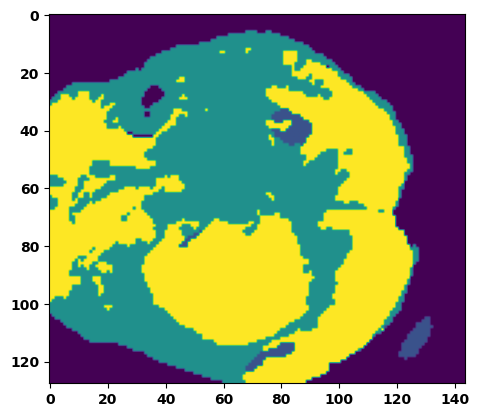

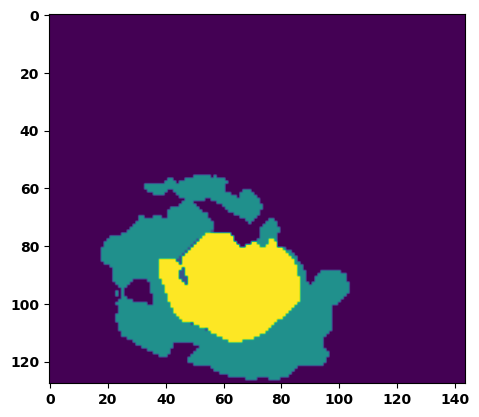

  6%|▌         | 2/36 [00:02<00:37,  1.10s/it]

Batch_id:  1 Eval loss:  0.7659099102020264
Batch_id:  1 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.06s/it]

Batch_id:  2 Eval loss:  0.7815266847610474
Batch_id:  2 Eval IoU:  tensor(0.1925, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8788, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7713, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9072, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.02s/it]

Batch_id:  3 Eval loss:  0.7636905908584595
Batch_id:  3 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.02s/it]

Batch_id:  4 Eval loss:  0.7653864622116089
Batch_id:  4 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.02s/it]

Batch_id:  5 Eval loss:  0.7666739821434021
Batch_id:  5 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.02s/it]

Batch_id:  6 Eval loss:  0.7563203573226929
Batch_id:  6 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.02s/it]

Batch_id:  7 Eval loss:  0.771883487701416
Batch_id:  7 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.01s/it]

Batch_id:  8 Eval loss:  0.753505289554596
Batch_id:  8 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.05s/it]

Batch_id:  9 Eval loss:  0.7579689621925354
Batch_id:  9 Eval IoU:  tensor(0.2312, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8132, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  10 Eval loss:  0.7517952919006348
Batch_id:  10 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


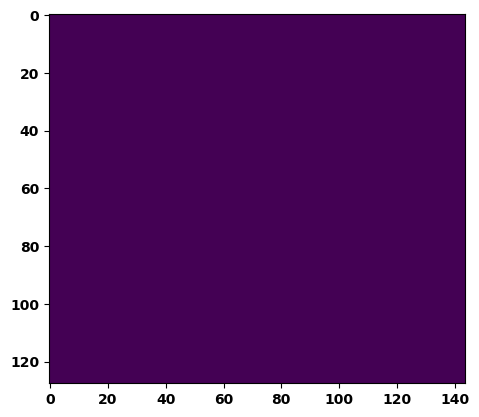

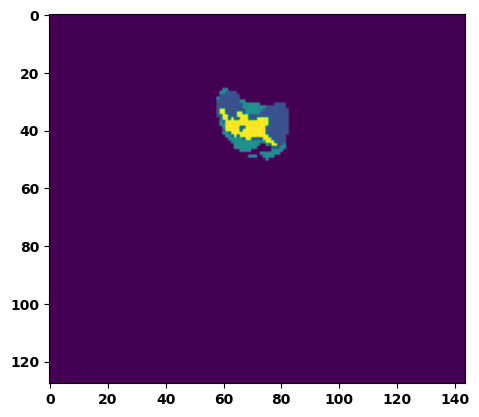

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.24259598553180695
Batch_id:  11 Eval IoU:  tensor(0.6514, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9087, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.08s/it]

Batch_id:  12 Eval loss:  0.7634526491165161
Batch_id:  12 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.7574648857116699
Batch_id:  13 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.6559897065162659
Batch_id:  14 Eval IoU:  tensor(0.2927, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.04s/it]

Batch_id:  15 Eval loss:  0.8801414966583252
Batch_id:  15 Eval IoU:  tensor(0.0767, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6248, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4238, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2497, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.04s/it]

Batch_id:  16 Eval loss:  0.41375428438186646
Batch_id:  16 Eval IoU:  tensor(0.5031, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9705, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.02s/it]

Batch_id:  17 Eval loss:  0.7637810707092285
Batch_id:  17 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.03s/it]

Batch_id:  18 Eval loss:  0.4089592695236206
Batch_id:  18 Eval IoU:  tensor(0.4999, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.01s/it]

Batch_id:  19 Eval loss:  0.6608642935752869
Batch_id:  19 Eval IoU:  tensor(0.2547, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8496, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7497, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.7005, device='cuda:0')
Batch_id:  20 Eval loss:  0.722216010093689
Batch_id:  20 Eval IoU:  tensor(0.2547, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


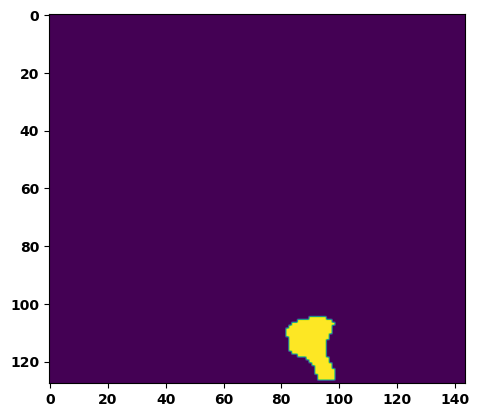

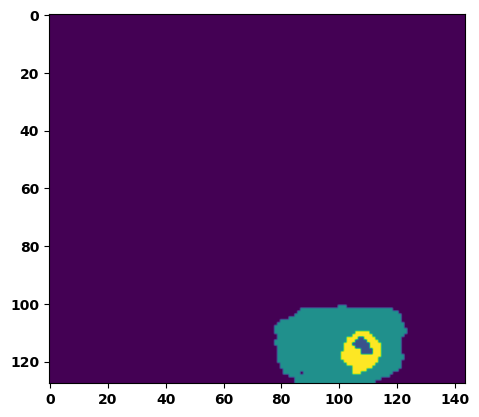

 61%|██████    | 22/36 [00:23<00:15,  1.07s/it]

Batch_id:  21 Eval loss:  0.38436007499694824
Batch_id:  21 Eval IoU:  tensor(0.5286, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8836, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8740, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.07s/it]

Batch_id:  22 Eval loss:  0.7610110640525818
Batch_id:  22 Eval IoU:  tensor(0.2285, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9141, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.7894181609153748
Batch_id:  23 Eval IoU:  tensor(0.1820, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8638, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7279, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8832, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.05s/it]

Batch_id:  24 Eval loss:  0.7949126958847046
Batch_id:  24 Eval IoU:  tensor(0.1246, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6532, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3950, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.3075, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.05s/it]

Batch_id:  25 Eval loss:  0.26157569885253906
Batch_id:  25 Eval IoU:  tensor(0.6212, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8936, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9853, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.6341591477394104
Batch_id:  26 Eval IoU:  tensor(0.2502, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6625, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.3851, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.4981, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.8018, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.01s/it]

Batch_id:  27 Eval loss:  0.7757532000541687
Batch_id:  27 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.02s/it]

Batch_id:  28 Eval loss:  0.7718203663825989
Batch_id:  28 Eval IoU:  tensor(0.1924, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8690, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7388, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9005, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.03s/it]

Batch_id:  29 Eval loss:  0.739406943321228
Batch_id:  29 Eval IoU:  tensor(0.2276, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8493, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  30 Eval loss:  0.39530497789382935
Batch_id:  30 Eval IoU:  tensor(0.4705, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9281, device='cuda:0')


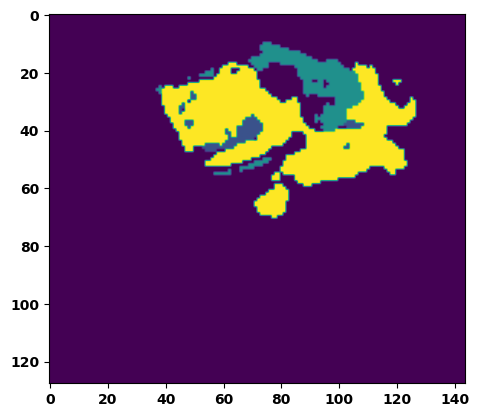

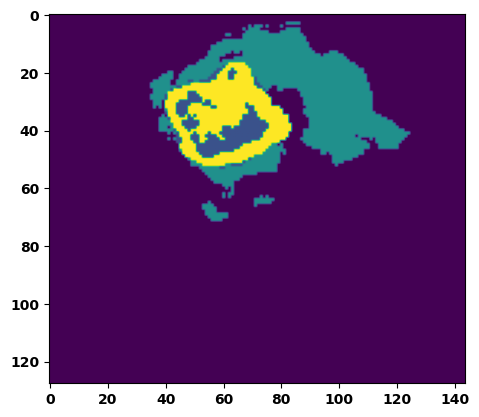

 89%|████████▉ | 32/36 [00:33<00:04,  1.05s/it]

Batch_id:  31 Eval loss:  0.7691439390182495
Batch_id:  31 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.6136230826377869
Batch_id:  32 Eval IoU:  tensor(0.3369, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.04s/it]

Batch_id:  33 Eval loss:  0.7224018573760986
Batch_id:  33 Eval IoU:  tensor(0.2460, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9492, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.07s/it]

Batch_id:  34 Eval loss:  0.7571419477462769
Batch_id:  34 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.7660532593727112
Batch_id:  35 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Epoch  37 Training loss:  0.13492632386359302
Epoch  37 Evaluation loss:  0.6815804048544831
Epoch  37 Training accuracy :  tensor(0.7977)
Epoch  37 Evaluation accuracy :  tensor(0.2758)
Epoch  37 Training Mean Dice Score:  tensor(0.9888)
Epoch  37 Eval Mean Dice Score:  tensor(0.9077)
Epoch  37 Training Non-tumor Dice Score:  tensor(0.9857)
Epoch  37 Eval Non-tumor Dice Score:  tensor(0.8367)
Epoch  37 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  37 Eval NCR/NET Dice Score:  tensor(0.9704)
Epoch  37 Training ED Dice Score:  tensor(0.98

Epoch: 38
Training in session: 


  1%|          | 1/110 [00:01<02:00,  1.10s/it]

Batch_id:  0 Training loss:  0.13931168615818024
Batch_id:  0 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:59,  1.11s/it]

Batch_id:  1 Training loss:  0.14801034331321716
Batch_id:  1 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.13064517080783844
Batch_id:  2 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:55,  1.09s/it]

Batch_id:  3 Training loss:  0.13451090455055237
Batch_id:  3 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:55,  1.10s/it]

Batch_id:  4 Training loss:  0.06319750845432281
Batch_id:  4 Training IoU:  tensor(0.8919, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.08415406942367554
Batch_id:  5 Training IoU:  tensor(0.8535, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.19013504683971405
Batch_id:  6 Training IoU:  tensor(0.7262, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:46,  1.04s/it]

Batch_id:  7 Training loss:  0.16140371561050415
Batch_id:  7 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:43,  1.02s/it]

Batch_id:  8 Training loss:  0.10943673551082611
Batch_id:  8 Training IoU:  tensor(0.8149, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:43,  1.03s/it]

Batch_id:  9 Training loss:  0.08260346949100494
Batch_id:  9 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.07s/it]

Batch_id:  10 Training loss:  0.34895187616348267
Batch_id:  10 Training IoU:  tensor(0.5966, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 11%|█         | 12/110 [00:12<01:43,  1.06s/it]

Batch_id:  11 Training loss:  0.13378290832042694
Batch_id:  11 Training IoU:  tensor(0.7773, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:42,  1.06s/it]

Batch_id:  12 Training loss:  0.1477155238389969
Batch_id:  12 Training IoU:  tensor(0.7791, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:42,  1.06s/it]

Batch_id:  13 Training loss:  0.09741492569446564
Batch_id:  13 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 14%|█▎        | 15/110 [00:15<01:40,  1.06s/it]

Batch_id:  14 Training loss:  0.18963679671287537
Batch_id:  14 Training IoU:  tensor(0.7024, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:38,  1.05s/it]

Batch_id:  15 Training loss:  0.17130382359027863
Batch_id:  15 Training IoU:  tensor(0.7231, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:36,  1.04s/it]

Batch_id:  16 Training loss:  0.07865850627422333
Batch_id:  16 Training IoU:  tensor(0.8620, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:34,  1.03s/it]

Batch_id:  17 Training loss:  0.16494402289390564
Batch_id:  17 Training IoU:  tensor(0.7731, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:34,  1.04s/it]

Batch_id:  18 Training loss:  0.13306568562984467
Batch_id:  18 Training IoU:  tensor(0.7786, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:34,  1.05s/it]

Batch_id:  19 Training loss:  0.15777038037776947
Batch_id:  19 Training IoU:  tensor(0.7765, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:34,  1.06s/it]

Batch_id:  20 Training loss:  0.04810841381549835
Batch_id:  20 Training IoU:  tensor(0.9292, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 20%|██        | 22/110 [00:23<01:32,  1.06s/it]

Batch_id:  21 Training loss:  0.08601060509681702
Batch_id:  21 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 21%|██        | 23/110 [00:24<01:34,  1.08s/it]

Batch_id:  22 Training loss:  0.060821324586868286
Batch_id:  22 Training IoU:  tensor(0.8949, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:37,  1.14s/it]

Batch_id:  23 Training loss:  0.04432907700538635
Batch_id:  23 Training IoU:  tensor(0.9199, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:35,  1.12s/it]

Batch_id:  24 Training loss:  0.0632801502943039
Batch_id:  24 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:35,  1.13s/it]

Batch_id:  25 Training loss:  0.07942467927932739
Batch_id:  25 Training IoU:  tensor(0.8611, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:33,  1.12s/it]

Batch_id:  26 Training loss:  0.10599826276302338
Batch_id:  26 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:29,  1.09s/it]

Batch_id:  27 Training loss:  0.3287525177001953
Batch_id:  27 Training IoU:  tensor(0.6179, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.17823965847492218
Batch_id:  28 Training IoU:  tensor(0.7235, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.0913078635931015
Batch_id:  29 Training IoU:  tensor(0.8520, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:26,  1.09s/it]

Batch_id:  30 Training loss:  0.08343681693077087
Batch_id:  30 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:23,  1.08s/it]

Batch_id:  31 Training loss:  0.21840406954288483
Batch_id:  31 Training IoU:  tensor(0.7044, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 30%|███       | 33/110 [00:35<01:24,  1.10s/it]

Batch_id:  32 Training loss:  0.1289593130350113
Batch_id:  32 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 31%|███       | 34/110 [00:36<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.1441342681646347
Batch_id:  33 Training IoU:  tensor(0.7682, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:22,  1.09s/it]

Batch_id:  34 Training loss:  0.1342211663722992
Batch_id:  34 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:22,  1.12s/it]

Batch_id:  35 Training loss:  0.2551116347312927
Batch_id:  35 Training IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:21,  1.12s/it]

Batch_id:  36 Training loss:  0.08573170006275177
Batch_id:  36 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.07072539627552032
Batch_id:  37 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.1513098031282425
Batch_id:  38 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:19,  1.14s/it]

Batch_id:  39 Training loss:  0.04918019473552704
Batch_id:  39 Training IoU:  tensor(0.9142, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:17,  1.13s/it]

Batch_id:  40 Training loss:  0.08946911990642548
Batch_id:  40 Training IoU:  tensor(0.8456, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:17,  1.14s/it]

Batch_id:  41 Training loss:  0.07556964457035065
Batch_id:  41 Training IoU:  tensor(0.8685, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:16,  1.14s/it]

Batch_id:  42 Training loss:  0.14817553758621216
Batch_id:  42 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 40%|████      | 44/110 [00:47<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.10284653306007385
Batch_id:  43 Training IoU:  tensor(0.8392, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 41%|████      | 45/110 [00:48<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.058238789439201355
Batch_id:  44 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:08,  1.08s/it]

Batch_id:  45 Training loss:  0.07845574617385864
Batch_id:  45 Training IoU:  tensor(0.8604, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:06,  1.05s/it]

Batch_id:  46 Training loss:  0.08774685859680176
Batch_id:  46 Training IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:05,  1.06s/it]

Batch_id:  47 Training loss:  0.05999104678630829
Batch_id:  47 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:03,  1.05s/it]

Batch_id:  48 Training loss:  0.12664201855659485
Batch_id:  48 Training IoU:  tensor(0.8120, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.4553218483924866
Batch_id:  49 Training IoU:  tensor(0.4634, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.07s/it]

Batch_id:  50 Training loss:  0.10954456031322479
Batch_id:  50 Training IoU:  tensor(0.8252, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:02,  1.07s/it]

Batch_id:  51 Training loss:  0.06274054944515228
Batch_id:  51 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:00,  1.06s/it]

Batch_id:  52 Training loss:  0.14164267480373383
Batch_id:  52 Training IoU:  tensor(0.7795, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:00,  1.08s/it]

Batch_id:  53 Training loss:  0.12794828414916992
Batch_id:  53 Training IoU:  tensor(0.8087, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.21307125687599182
Batch_id:  54 Training IoU:  tensor(0.7048, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.1580795794725418
Batch_id:  55 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.08217272162437439
Batch_id:  56 Training IoU:  tensor(0.8666, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.3521215319633484
Batch_id:  57 Training IoU:  tensor(0.5568, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.06387338042259216
Batch_id:  58 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.124783456325531
Batch_id:  59 Training IoU:  tensor(0.8015, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.07s/it]

Batch_id:  60 Training loss:  0.08129261434078217
Batch_id:  60 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.20533758401870728
Batch_id:  61 Training IoU:  tensor(0.6924, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:49,  1.06s/it]

Batch_id:  62 Training loss:  0.12825962901115417
Batch_id:  62 Training IoU:  tensor(0.8078, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:48,  1.05s/it]

Batch_id:  63 Training loss:  0.13827377557754517
Batch_id:  63 Training IoU:  tensor(0.7726, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.09416055679321289
Batch_id:  64 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.05s/it]

Batch_id:  65 Training loss:  0.13172268867492676
Batch_id:  65 Training IoU:  tensor(0.7974, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:47,  1.10s/it]

Batch_id:  66 Training loss:  0.060184404253959656
Batch_id:  66 Training IoU:  tensor(0.8967, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.09s/it]

Batch_id:  67 Training loss:  0.051142916083335876
Batch_id:  67 Training IoU:  tensor(0.9128, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.3084346652030945
Batch_id:  68 Training IoU:  tensor(0.6611, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:43,  1.10s/it]

Batch_id:  69 Training loss:  0.16024766862392426
Batch_id:  69 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.1819932460784912
Batch_id:  70 Training IoU:  tensor(0.7114, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.3480078876018524
Batch_id:  71 Training IoU:  tensor(0.5346, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.1565805971622467
Batch_id:  72 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.12091687321662903
Batch_id:  73 Training IoU:  tensor(0.7983, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.147745743393898
Batch_id:  74 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.09s/it]

Batch_id:  75 Training loss:  0.09540638327598572
Batch_id:  75 Training IoU:  tensor(0.8391, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:36,  1.11s/it]

Batch_id:  76 Training loss:  0.10506340861320496
Batch_id:  76 Training IoU:  tensor(0.8932, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:35,  1.11s/it]

Batch_id:  77 Training loss:  0.18283067643642426
Batch_id:  77 Training IoU:  tensor(0.7346, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:35,  1.13s/it]

Batch_id:  78 Training loss:  0.05834214389324188
Batch_id:  78 Training IoU:  tensor(0.8990, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:35,  1.19s/it]

Batch_id:  79 Training loss:  0.06640231609344482
Batch_id:  79 Training IoU:  tensor(0.8846, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:33,  1.14s/it]

Batch_id:  80 Training loss:  0.39200717210769653
Batch_id:  80 Training IoU:  tensor(0.5252, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:32,  1.17s/it]

Batch_id:  81 Training loss:  0.233428493142128
Batch_id:  81 Training IoU:  tensor(0.6821, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:30,  1.14s/it]

Batch_id:  82 Training loss:  0.14647996425628662
Batch_id:  82 Training IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:29,  1.15s/it]

Batch_id:  83 Training loss:  0.12440335750579834
Batch_id:  83 Training IoU:  tensor(0.8048, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:28,  1.16s/it]

Batch_id:  84 Training loss:  0.05773068964481354
Batch_id:  84 Training IoU:  tensor(0.9014, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:28,  1.18s/it]

Batch_id:  85 Training loss:  0.08167853951454163
Batch_id:  85 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:26,  1.16s/it]

Batch_id:  86 Training loss:  0.10130970180034637
Batch_id:  86 Training IoU:  tensor(0.8396, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:25,  1.14s/it]

Batch_id:  87 Training loss:  0.1477721929550171
Batch_id:  87 Training IoU:  tensor(0.7643, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:23,  1.13s/it]

Batch_id:  88 Training loss:  0.31818556785583496
Batch_id:  88 Training IoU:  tensor(0.6579, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.14s/it]

Batch_id:  89 Training loss:  0.07192021608352661
Batch_id:  89 Training IoU:  tensor(0.8749, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.2549327611923218
Batch_id:  90 Training IoU:  tensor(0.6234, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.05324013531208038
Batch_id:  91 Training IoU:  tensor(0.9060, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.07370033860206604
Batch_id:  92 Training IoU:  tensor(0.8683, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.17386454343795776
Batch_id:  93 Training IoU:  tensor(0.7316, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.0832543671131134
Batch_id:  94 Training IoU:  tensor(0.8625, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.04786989092826843
Batch_id:  95 Training IoU:  tensor(0.9207, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.19681186974048615
Batch_id:  96 Training IoU:  tensor(0.7341, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:13,  1.12s/it]

Batch_id:  97 Training loss:  0.08800680935382843
Batch_id:  97 Training IoU:  tensor(0.8501, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.12s/it]

Batch_id:  98 Training loss:  0.10853880643844604
Batch_id:  98 Training IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.12s/it]

Batch_id:  99 Training loss:  0.19955581426620483
Batch_id:  99 Training IoU:  tensor(0.6903, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:10,  1.14s/it]

Batch_id:  100 Training loss:  0.0663030743598938
Batch_id:  100 Training IoU:  tensor(0.8943, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:09,  1.14s/it]

Batch_id:  101 Training loss:  0.07912552356719971
Batch_id:  101 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.06817185878753662
Batch_id:  102 Training IoU:  tensor(0.8863, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.13s/it]

Batch_id:  103 Training loss:  0.08623118698596954
Batch_id:  103 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.10570906102657318
Batch_id:  104 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.13s/it]

Batch_id:  105 Training loss:  0.15312713384628296
Batch_id:  105 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.13s/it]

Batch_id:  106 Training loss:  0.12837167084217072
Batch_id:  106 Training IoU:  tensor(0.7884, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.11124403774738312
Batch_id:  107 Training IoU:  tensor(0.8117, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.07s/it]

Batch_id:  108 Training loss:  0.09428511559963226
Batch_id:  108 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.13616327941417694
Batch_id:  109 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9897, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7757511734962463
Batch_id:  0 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


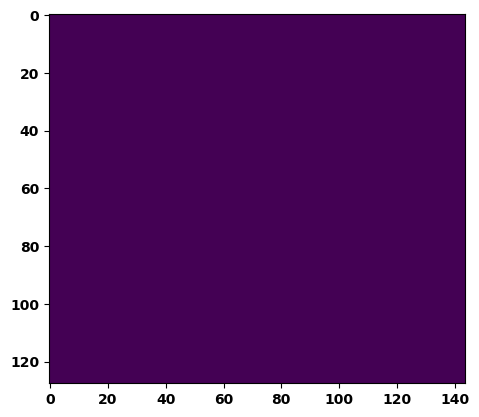

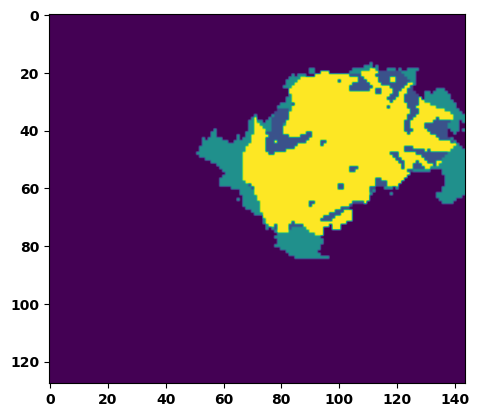

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7634720802307129
Batch_id:  1 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.10s/it]

Batch_id:  2 Eval loss:  0.7887215614318848
Batch_id:  2 Eval IoU:  tensor(0.1358, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6932, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5030, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8742, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4180, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.10s/it]

Batch_id:  3 Eval loss:  0.7571476697921753
Batch_id:  3 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:34,  1.10s/it]

Batch_id:  4 Eval loss:  0.7292821407318115
Batch_id:  4 Eval IoU:  tensor(0.1943, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.7738, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.6632, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8569, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.6502, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9246, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.11s/it]

Batch_id:  5 Eval loss:  0.7653976082801819
Batch_id:  5 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.06s/it]

Batch_id:  6 Eval loss:  0.7349832653999329
Batch_id:  6 Eval IoU:  tensor(0.2401, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9411, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.11s/it]

Batch_id:  7 Eval loss:  0.6534890532493591
Batch_id:  7 Eval IoU:  tensor(0.2832, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8819, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9637, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.10s/it]

Batch_id:  8 Eval loss:  0.7384243607521057
Batch_id:  8 Eval IoU:  tensor(0.2444, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8074, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9424, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.06s/it]

Batch_id:  9 Eval loss:  0.7637991309165955
Batch_id:  9 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  10 Eval loss:  0.756308913230896
Batch_id:  10 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


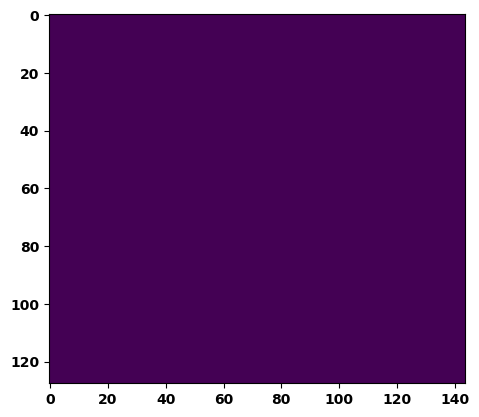

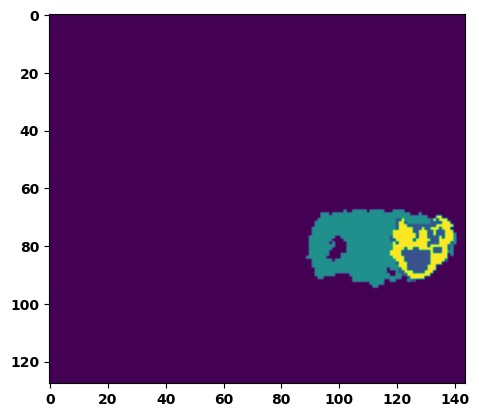

 33%|███▎      | 12/36 [00:13<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.6461115479469299
Batch_id:  11 Eval IoU:  tensor(0.2820, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8495, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.7988, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.7172887921333313
Batch_id:  12 Eval IoU:  tensor(0.1765, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6765, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4316, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.4027, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.06s/it]

Batch_id:  13 Eval loss:  0.7691530585289001
Batch_id:  13 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.7598937749862671
Batch_id:  14 Eval IoU:  tensor(0.2289, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:20,  1.05s/it]

Batch_id:  15 Eval loss:  0.7660545706748962
Batch_id:  15 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:19,  1.05s/it]

Batch_id:  16 Eval loss:  0.8296710848808289
Batch_id:  16 Eval IoU:  tensor(0.1029, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6468, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3863, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.2943, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.05s/it]

Batch_id:  17 Eval loss:  0.7670384645462036
Batch_id:  17 Eval IoU:  tensor(0.2126, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9207, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8415, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9268, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.8048586249351501
Batch_id:  18 Eval IoU:  tensor(0.1598, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8194, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6397, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7729, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.6007550954818726
Batch_id:  19 Eval IoU:  tensor(0.3199, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8978, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8972, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8271, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  20 Eval loss:  0.6741253137588501
Batch_id:  20 Eval IoU:  tensor(0.2151, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7552, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.5332, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.7178, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8502, device='cuda:0')


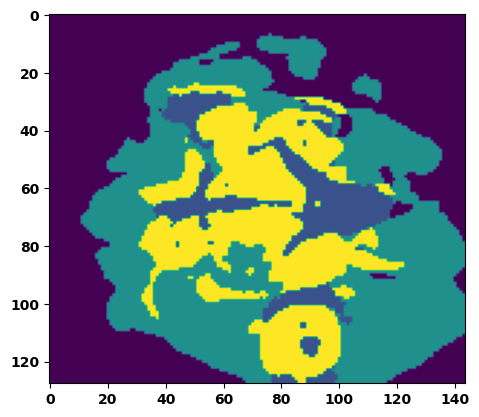

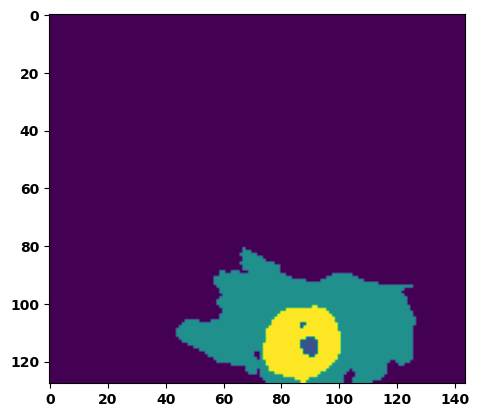

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.753512978553772
Batch_id:  21 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.7518002390861511
Batch_id:  22 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.04s/it]

Batch_id:  23 Eval loss:  0.6213788986206055
Batch_id:  23 Eval IoU:  tensor(0.3300, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.02s/it]

Batch_id:  24 Eval loss:  0.37607109546661377
Batch_id:  24 Eval IoU:  tensor(0.5487, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9632, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.01s/it]

Batch_id:  25 Eval loss:  0.780370831489563
Batch_id:  25 Eval IoU:  tensor(0.1899, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8646, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7586, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8868, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.13888028264045715
Batch_id:  26 Eval IoU:  tensor(0.7691, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9813, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.01s/it]

Batch_id:  27 Eval loss:  0.7432942390441895
Batch_id:  27 Eval IoU:  tensor(0.1678, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6133, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3156, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2882, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.588266134262085
Batch_id:  28 Eval IoU:  tensor(0.3250, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8741, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9559, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.293204128742218
Batch_id:  29 Eval IoU:  tensor(0.6384, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  30 Eval loss:  0.8817278742790222
Batch_id:  30 Eval IoU:  tensor(0.0754, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6228, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4197, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2455, device='cuda:0')


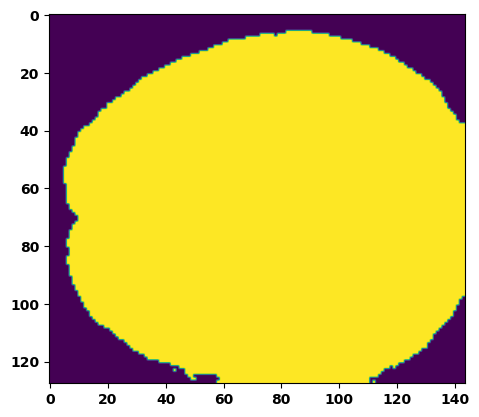

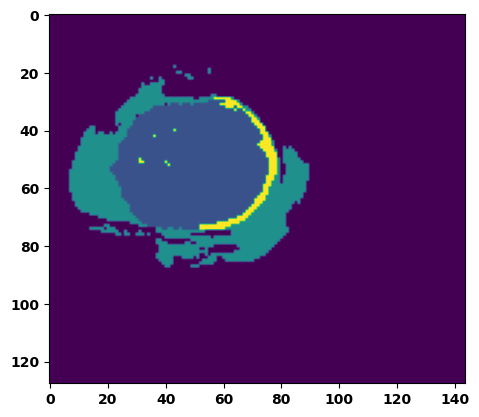

 89%|████████▉ | 32/36 [00:34<00:04,  1.08s/it]

Batch_id:  31 Eval loss:  0.14873354136943817
Batch_id:  31 Eval IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.7995728254318237
Batch_id:  32 Eval IoU:  tensor(0.1336, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7179, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4914, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.4359, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.04s/it]

Batch_id:  33 Eval loss:  0.557422399520874
Batch_id:  33 Eval IoU:  tensor(0.3623, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9221, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9245, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9764, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.4053373634815216
Batch_id:  34 Eval IoU:  tensor(0.5052, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8678, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.7436, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.7950, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]

Batch_id:  35 Eval loss:  0.06050056219100952
Batch_id:  35 Eval IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')
Epoch  38 Training loss:  0.13453040095892818
Epoch  38 Evaluation loss:  0.6517166855434576
Epoch  38 Training accuracy :  tensor(0.7982)
Epoch  38 Evaluation accuracy :  tensor(0.2994)
Epoch  38 Training Mean Dice Score:  tensor(0.9889)
Epoch  38 Eval Mean Dice Score:  tensor(0.8840)
Epoch  38 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  38 Eval Non-tumor Dice Score:  tensor(0.8015)
Epoch  38 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  38 Eval NCR/NET Dice Score:  tensor(0.9640)
Epoch  38 Training ED Dice Score:  tensor(0.9

Epoch: 39
Training in session: 


  1%|          | 1/110 [00:01<02:22,  1.31s/it]

Batch_id:  0 Training loss:  0.17992104589939117
Batch_id:  0 Training IoU:  tensor(0.7215, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:09,  1.20s/it]

Batch_id:  1 Training loss:  0.34613311290740967
Batch_id:  1 Training IoU:  tensor(0.6010, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.13s/it]

Batch_id:  2 Training loss:  0.09598025679588318
Batch_id:  2 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:01,  1.14s/it]

Batch_id:  3 Training loss:  0.13553038239479065
Batch_id:  3 Training IoU:  tensor(0.7870, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.06315632164478302
Batch_id:  4 Training IoU:  tensor(0.8923, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.15393519401550293
Batch_id:  5 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:56,  1.13s/it]

Batch_id:  6 Training loss:  0.1273118555545807
Batch_id:  6 Training IoU:  tensor(0.7897, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.06107102334499359
Batch_id:  7 Training IoU:  tensor(0.8975, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:50,  1.09s/it]

Batch_id:  8 Training loss:  0.15615126490592957
Batch_id:  8 Training IoU:  tensor(0.7613, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:47,  1.08s/it]

Batch_id:  9 Training loss:  0.3070993423461914
Batch_id:  9 Training IoU:  tensor(0.6640, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 10%|█         | 11/110 [00:12<01:46,  1.07s/it]

Batch_id:  10 Training loss:  0.1607181280851364
Batch_id:  10 Training IoU:  tensor(0.8114, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 11%|█         | 12/110 [00:13<01:46,  1.09s/it]

Batch_id:  11 Training loss:  0.12975658476352692
Batch_id:  11 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:44,  1.08s/it]

Batch_id:  12 Training loss:  0.09400787949562073
Batch_id:  12 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:44,  1.09s/it]

Batch_id:  13 Training loss:  0.1035890132188797
Batch_id:  13 Training IoU:  tensor(0.8447, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:42,  1.08s/it]

Batch_id:  14 Training loss:  0.06504906713962555
Batch_id:  14 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.12604133784770966
Batch_id:  15 Training IoU:  tensor(0.8128, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.07427796721458435
Batch_id:  16 Training IoU:  tensor(0.8676, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:38,  1.07s/it]

Batch_id:  17 Training loss:  0.15047146379947662
Batch_id:  17 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:36,  1.06s/it]

Batch_id:  18 Training loss:  0.13479270040988922
Batch_id:  18 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:35,  1.06s/it]

Batch_id:  19 Training loss:  0.12534837424755096
Batch_id:  19 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:33,  1.05s/it]

Batch_id:  20 Training loss:  0.1312536895275116
Batch_id:  20 Training IoU:  tensor(0.7809, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 20%|██        | 22/110 [00:23<01:32,  1.05s/it]

Batch_id:  21 Training loss:  0.18816505372524261
Batch_id:  21 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 21%|██        | 23/110 [00:25<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.1710917204618454
Batch_id:  22 Training IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:34,  1.10s/it]

Batch_id:  23 Training loss:  0.18388672173023224
Batch_id:  23 Training IoU:  tensor(0.7320, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:31,  1.08s/it]

Batch_id:  24 Training loss:  0.06285525858402252
Batch_id:  24 Training IoU:  tensor(0.8905, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.14775998890399933
Batch_id:  25 Training IoU:  tensor(0.7651, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:31,  1.10s/it]

Batch_id:  26 Training loss:  0.21403943002223969
Batch_id:  26 Training IoU:  tensor(0.7052, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:29,  1.09s/it]

Batch_id:  27 Training loss:  0.19839131832122803
Batch_id:  27 Training IoU:  tensor(0.6932, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.09s/it]

Batch_id:  28 Training loss:  0.20705081522464752
Batch_id:  28 Training IoU:  tensor(0.6912, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.15691938996315002
Batch_id:  29 Training IoU:  tensor(0.7507, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.11930327117443085
Batch_id:  30 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:25,  1.09s/it]

Batch_id:  31 Training loss:  0.10044299066066742
Batch_id:  31 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.05724862217903137
Batch_id:  32 Training IoU:  tensor(0.9020, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.15512001514434814
Batch_id:  33 Training IoU:  tensor(0.7576, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.08637169003486633
Batch_id:  34 Training IoU:  tensor(0.8487, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.18163390457630157
Batch_id:  35 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.08100351691246033
Batch_id:  36 Training IoU:  tensor(0.8662, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.11s/it]

Batch_id:  37 Training loss:  0.12493574619293213
Batch_id:  37 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.1268608719110489
Batch_id:  38 Training IoU:  tensor(0.8124, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.09416508674621582
Batch_id:  39 Training IoU:  tensor(0.8414, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:17,  1.12s/it]

Batch_id:  40 Training loss:  0.049411043524742126
Batch_id:  40 Training IoU:  tensor(0.9135, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:17,  1.13s/it]

Batch_id:  41 Training loss:  0.19586181640625
Batch_id:  41 Training IoU:  tensor(0.7341, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.32775694131851196
Batch_id:  42 Training IoU:  tensor(0.6194, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.09s/it]

Batch_id:  43 Training loss:  0.07017762959003448
Batch_id:  43 Training IoU:  tensor(0.8778, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.07s/it]

Batch_id:  44 Training loss:  0.15932191908359528
Batch_id:  44 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.1600852906703949
Batch_id:  45 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.06037597358226776
Batch_id:  46 Training IoU:  tensor(0.8943, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.07954736053943634
Batch_id:  47 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.1052042543888092
Batch_id:  48 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:06,  1.10s/it]

Batch_id:  49 Training loss:  0.04436767101287842
Batch_id:  49 Training IoU:  tensor(0.9200, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.10s/it]

Batch_id:  50 Training loss:  0.09425610303878784
Batch_id:  50 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.08253160119056702
Batch_id:  51 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.38993698358535767
Batch_id:  52 Training IoU:  tensor(0.5277, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.08082224428653717
Batch_id:  53 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:59,  1.09s/it]

Batch_id:  54 Training loss:  0.17035825550556183
Batch_id:  54 Training IoU:  tensor(0.7364, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.10942818224430084
Batch_id:  55 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.061045631766319275
Batch_id:  56 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:55,  1.07s/it]

Batch_id:  57 Training loss:  0.07216034829616547
Batch_id:  57 Training IoU:  tensor(0.8740, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:54,  1.06s/it]

Batch_id:  58 Training loss:  0.25196805596351624
Batch_id:  58 Training IoU:  tensor(0.6270, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.08s/it]

Batch_id:  59 Training loss:  0.23508673906326294
Batch_id:  59 Training IoU:  tensor(0.6804, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:52,  1.08s/it]

Batch_id:  60 Training loss:  0.08334331214427948
Batch_id:  60 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:51,  1.08s/it]

Batch_id:  61 Training loss:  0.050508901476860046
Batch_id:  61 Training IoU:  tensor(0.9143, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.06253314018249512
Batch_id:  62 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:48,  1.06s/it]

Batch_id:  63 Training loss:  0.1415749192237854
Batch_id:  63 Training IoU:  tensor(0.7799, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.14694692194461823
Batch_id:  64 Training IoU:  tensor(0.7624, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.16744181513786316
Batch_id:  65 Training IoU:  tensor(0.7696, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.047648653388023376
Batch_id:  66 Training IoU:  tensor(0.9304, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.10216988623142242
Batch_id:  67 Training IoU:  tensor(0.8382, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.12s/it]

Batch_id:  68 Training loss:  0.08417902886867523
Batch_id:  68 Training IoU:  tensor(0.8551, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.08304773271083832
Batch_id:  69 Training IoU:  tensor(0.8651, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.10956700146198273
Batch_id:  70 Training IoU:  tensor(0.8259, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:40,  1.07s/it]

Batch_id:  71 Training loss:  0.06800918281078339
Batch_id:  71 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:39,  1.06s/it]

Batch_id:  72 Training loss:  0.21656395494937897
Batch_id:  72 Training IoU:  tensor(0.7062, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.08s/it]

Batch_id:  73 Training loss:  0.140593022108078
Batch_id:  73 Training IoU:  tensor(0.7683, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.08457399904727936
Batch_id:  74 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.11s/it]

Batch_id:  75 Training loss:  0.13170938193798065
Batch_id:  75 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.1481923907995224
Batch_id:  76 Training IoU:  tensor(0.7787, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.04806503653526306
Batch_id:  77 Training IoU:  tensor(0.9204, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.1466962993144989
Batch_id:  78 Training IoU:  tensor(0.7633, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.1471203714609146
Batch_id:  79 Training IoU:  tensor(0.7589, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.07911014556884766
Batch_id:  80 Training IoU:  tensor(0.8595, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.09055620431900024
Batch_id:  81 Training IoU:  tensor(0.8521, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:28,  1.06s/it]

Batch_id:  82 Training loss:  0.10299085080623627
Batch_id:  82 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.07982145249843597
Batch_id:  83 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.07s/it]

Batch_id:  84 Training loss:  0.14303594827651978
Batch_id:  84 Training IoU:  tensor(0.8002, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:27,  1.15s/it]

Batch_id:  85 Training loss:  0.34901008009910583
Batch_id:  85 Training IoU:  tensor(0.5336, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.11s/it]

Batch_id:  86 Training loss:  0.08134661614894867
Batch_id:  86 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.09s/it]

Batch_id:  87 Training loss:  0.08632224798202515
Batch_id:  87 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:23,  1.10s/it]

Batch_id:  88 Training loss:  0.45452386140823364
Batch_id:  88 Training IoU:  tensor(0.4652, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.09s/it]

Batch_id:  89 Training loss:  0.08768399059772491
Batch_id:  89 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.16s/it]

Batch_id:  90 Training loss:  0.12720510363578796
Batch_id:  90 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.13s/it]

Batch_id:  91 Training loss:  0.0657220184803009
Batch_id:  91 Training IoU:  tensor(0.8951, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.10s/it]

Batch_id:  92 Training loss:  0.14595583081245422
Batch_id:  92 Training IoU:  tensor(0.7660, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.12s/it]

Batch_id:  93 Training loss:  0.19252780079841614
Batch_id:  93 Training IoU:  tensor(0.7239, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.0831630527973175
Batch_id:  94 Training IoU:  tensor(0.8553, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.12712258100509644
Batch_id:  95 Training IoU:  tensor(0.8094, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.3505620062351227
Batch_id:  96 Training IoU:  tensor(0.5580, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.058164432644844055
Batch_id:  97 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.10s/it]

Batch_id:  98 Training loss:  0.13426758348941803
Batch_id:  98 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.10s/it]

Batch_id:  99 Training loss:  0.13150334358215332
Batch_id:  99 Training IoU:  tensor(0.7983, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.08s/it]

Batch_id:  100 Training loss:  0.11052775382995605
Batch_id:  100 Training IoU:  tensor(0.8132, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.12s/it]

Batch_id:  101 Training loss:  0.31679415702819824
Batch_id:  101 Training IoU:  tensor(0.6609, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.12s/it]

Batch_id:  102 Training loss:  0.07945019006729126
Batch_id:  102 Training IoU:  tensor(0.8601, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.089925616979599
Batch_id:  103 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.07s/it]

Batch_id:  104 Training loss:  0.06289215385913849
Batch_id:  104 Training IoU:  tensor(0.8891, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.08s/it]

Batch_id:  105 Training loss:  0.10744771361351013
Batch_id:  105 Training IoU:  tensor(0.8184, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.05695873498916626
Batch_id:  106 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.11s/it]

Batch_id:  107 Training loss:  0.07687467336654663
Batch_id:  107 Training IoU:  tensor(0.8663, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.13s/it]

Batch_id:  108 Training loss:  0.251145601272583
Batch_id:  108 Training IoU:  tensor(0.6852, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.052321791648864746
Batch_id:  109 Training IoU:  tensor(0.9082, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9951, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6475775241851807
Batch_id:  0 Eval IoU:  tensor(0.3037, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9126, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


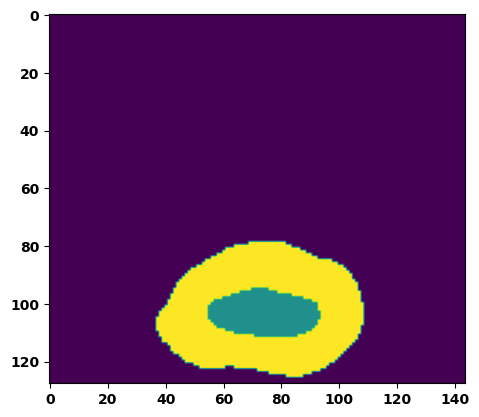

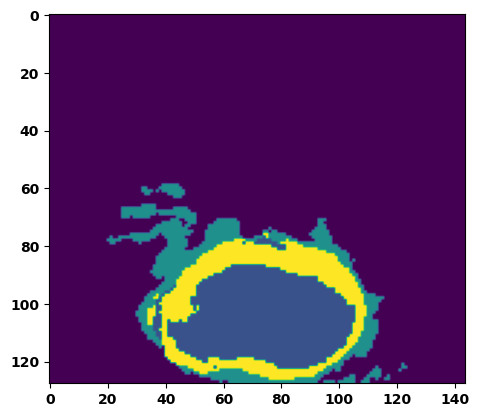

  6%|▌         | 2/36 [00:02<00:36,  1.07s/it]

Batch_id:  1 Eval loss:  0.7563229203224182
Batch_id:  1 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.12s/it]

Batch_id:  2 Eval loss:  0.7535113096237183
Batch_id:  2 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 11%|█         | 4/36 [00:04<00:35,  1.12s/it]

Batch_id:  3 Eval loss:  0.8799164295196533
Batch_id:  3 Eval IoU:  tensor(0.0768, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6251, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4244, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.2502, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.765914797782898
Batch_id:  4 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:33,  1.10s/it]

Batch_id:  5 Eval loss:  0.7542292475700378
Batch_id:  5 Eval IoU:  tensor(0.1535, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6590, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4006, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3201, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:31,  1.08s/it]

Batch_id:  6 Eval loss:  0.7571426630020142
Batch_id:  6 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.07s/it]

Batch_id:  7 Eval loss:  0.5108612775802612
Batch_id:  7 Eval IoU:  tensor(0.4253, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9822, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.7638722658157349
Batch_id:  8 Eval IoU:  tensor(0.2234, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8936, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.4742893576622009
Batch_id:  9 Eval IoU:  tensor(0.4033, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6874, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4044, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.3950, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  10 Eval loss:  0.7641955614089966
Batch_id:  10 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


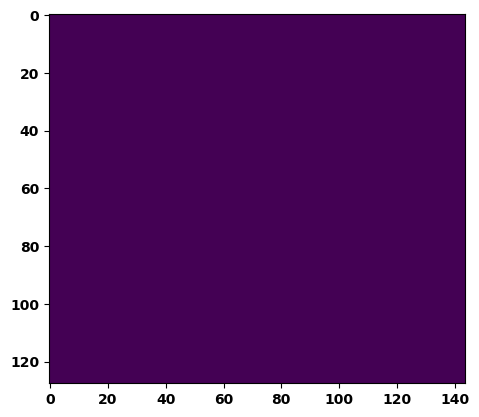

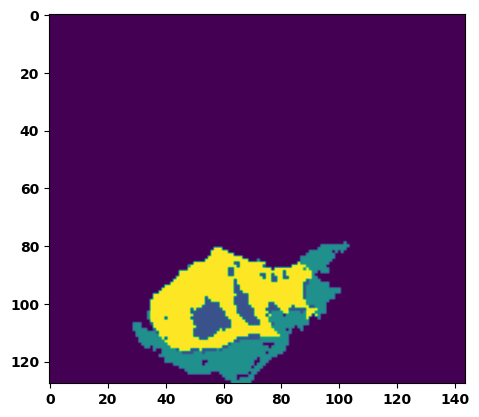

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.7527342438697815
Batch_id:  11 Eval IoU:  tensor(0.2377, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.763695478439331
Batch_id:  12 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:23,  1.06s/it]

Batch_id:  13 Eval loss:  0.7602963447570801
Batch_id:  13 Eval IoU:  tensor(0.2296, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9190, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.2864091098308563
Batch_id:  14 Eval IoU:  tensor(0.6098, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8962, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:20,  1.04s/it]

Batch_id:  15 Eval loss:  0.765390157699585
Batch_id:  15 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.05s/it]

Batch_id:  16 Eval loss:  0.48334938287734985
Batch_id:  16 Eval IoU:  tensor(0.4138, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9106, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8601, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8337, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9736, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.5281691551208496
Batch_id:  17 Eval IoU:  tensor(0.3851, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8876, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9383, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.03s/it]

Batch_id:  18 Eval loss:  0.7574654817581177
Batch_id:  18 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.02s/it]

Batch_id:  19 Eval loss:  0.5874719619750977
Batch_id:  19 Eval IoU:  tensor(0.3535, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  20 Eval loss:  0.7757533192634583
Batch_id:  20 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


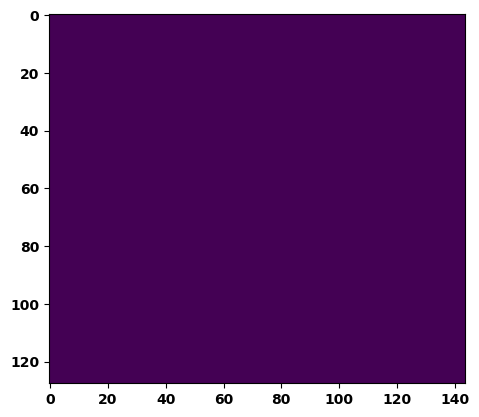

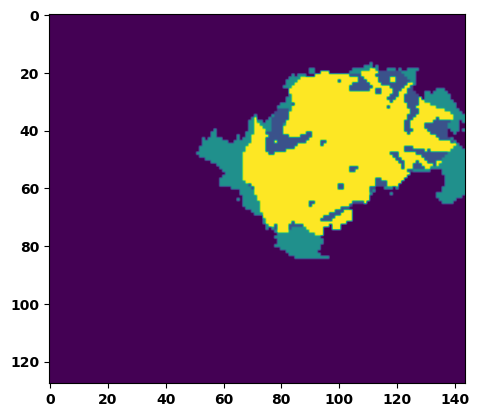

 61%|██████    | 22/36 [00:23<00:14,  1.06s/it]

Batch_id:  21 Eval loss:  0.7506581544876099
Batch_id:  21 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8380, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9066, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.7844547033309937
Batch_id:  22 Eval IoU:  tensor(0.1895, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.7580, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  23 Eval loss:  0.43381017446517944
Batch_id:  23 Eval IoU:  

 67%|██████▋   | 24/36 [00:25<00:13,  1.14s/it]

tensor(0.4744, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9238, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:12,  1.12s/it]

Batch_id:  24 Eval loss:  0.771490216255188
Batch_id:  24 Eval IoU:  tensor(0.2098, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8382, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:11,  1.11s/it]

Batch_id:  25 Eval loss:  0.7073611617088318
Batch_id:  25 Eval IoU:  tensor(0.2545, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8986, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9086, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:10,  1.12s/it]

Batch_id:  26 Eval loss:  0.7691518068313599
Batch_id:  26 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.10s/it]

Batch_id:  27 Eval loss:  0.7660571336746216
Batch_id:  27 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.09s/it]

Batch_id:  28 Eval loss:  0.3474414646625519
Batch_id:  28 Eval IoU:  tensor(0.5216, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9795, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.7517946362495422
Batch_id:  29 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  30 Eval loss:  0.7762592434883118
Batch_id:  30 Eval IoU:  tensor(0.1962, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8796, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.7777, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


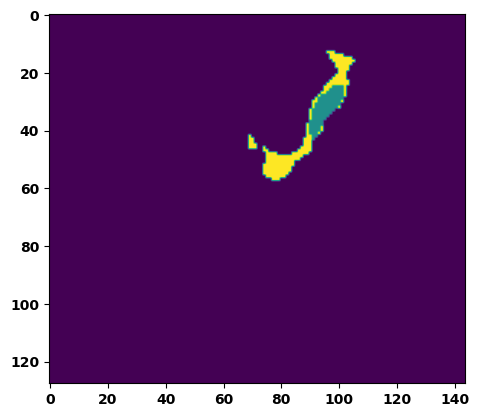

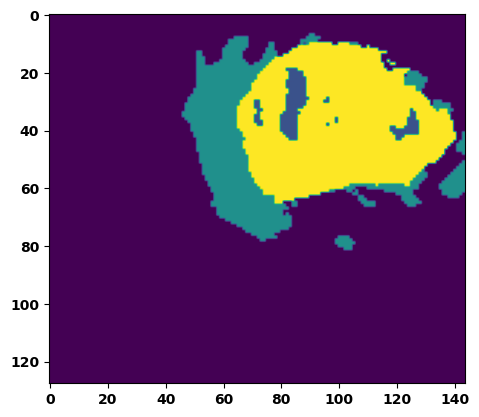

 89%|████████▉ | 32/36 [00:34<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.4105226993560791
Batch_id:  31 Eval IoU:  tensor(0.4690, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.04s/it]

Batch_id:  32 Eval loss:  0.5553403496742249
Batch_id:  32 Eval IoU:  tensor(0.3380, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7770, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.5738, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.5748, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9674, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.7634732723236084
Batch_id:  33 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.7666784524917603
Batch_id:  34 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.7797161936759949
Batch_id:  35 Eval IoU:  tensor(0.1883, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8682, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7382, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')
Epoch  39 Training loss:  0.134217854115096
Epoch  39 Evaluation loss:  0.6784104903539022
Epoch  39 Training accuracy :  tensor(0.7987)
Epoch  39 Evaluation accuracy :  tensor(0.2787)
Epoch  39 Training Mean Dice Score:  tensor(0.9889)
Epoch  39 Eval Mean Dice Score:  tensor(0.9124)
Epoch  39 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  39 Eval Non-tumor Dice Score:  tensor(0.8445)
Epoch  39 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  39 Eval NCR/NET Dice Score:  tensor(0.9711)
Epoch  39 Training ED Dice Score:  tensor(0.9841

Epoch: 40
Training in session: 


  1%|          | 1/110 [00:01<02:05,  1.15s/it]

Batch_id:  0 Training loss:  0.3462754786014557
Batch_id:  0 Training IoU:  tensor(0.6007, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:01,  1.12s/it]

Batch_id:  1 Training loss:  0.04739758372306824
Batch_id:  1 Training IoU:  tensor(0.9308, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:01,  1.13s/it]

Batch_id:  2 Training loss:  0.05822731554508209
Batch_id:  2 Training IoU:  tensor(0.8994, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.11142279207706451
Batch_id:  3 Training IoU:  tensor(0.8115, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:54,  1.09s/it]

Batch_id:  4 Training loss:  0.1954127699136734
Batch_id:  4 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.12561766803264618
Batch_id:  5 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.06s/it]

Batch_id:  6 Training loss:  0.0568474680185318
Batch_id:  6 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:50,  1.08s/it]

Batch_id:  7 Training loss:  0.2314184606075287
Batch_id:  7 Training IoU:  tensor(0.6852, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:47,  1.06s/it]

Batch_id:  8 Training loss:  0.08742383122444153
Batch_id:  8 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:45,  1.05s/it]

Batch_id:  9 Training loss:  0.07133248448371887
Batch_id:  9 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 10%|█         | 11/110 [00:11<01:46,  1.08s/it]

Batch_id:  10 Training loss:  0.12490762770175934
Batch_id:  10 Training IoU:  tensor(0.8036, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 11%|█         | 12/110 [00:12<01:45,  1.08s/it]

Batch_id:  11 Training loss:  0.1821834146976471
Batch_id:  11 Training IoU:  tensor(0.7339, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:48,  1.11s/it]

Batch_id:  12 Training loss:  0.06222781538963318
Batch_id:  12 Training IoU:  tensor(0.8918, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:44,  1.09s/it]

Batch_id:  13 Training loss:  0.06235301494598389
Batch_id:  13 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.07s/it]

Batch_id:  14 Training loss:  0.13057918846607208
Batch_id:  14 Training IoU:  tensor(0.8001, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:40,  1.07s/it]

Batch_id:  15 Training loss:  0.13915716111660004
Batch_id:  15 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:41,  1.10s/it]

Batch_id:  16 Training loss:  0.08200064301490784
Batch_id:  16 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.09s/it]

Batch_id:  17 Training loss:  0.15112759172916412
Batch_id:  17 Training IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:40,  1.11s/it]

Batch_id:  18 Training loss:  0.05144655704498291
Batch_id:  18 Training IoU:  tensor(0.9122, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:38,  1.10s/it]

Batch_id:  19 Training loss:  0.13767507672309875
Batch_id:  19 Training IoU:  tensor(0.7854, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:35,  1.07s/it]

Batch_id:  20 Training loss:  0.16616694629192352
Batch_id:  20 Training IoU:  tensor(0.7736, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.06s/it]

Batch_id:  21 Training loss:  0.1491321176290512
Batch_id:  21 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 21%|██        | 23/110 [00:24<01:32,  1.06s/it]

Batch_id:  22 Training loss:  0.08921785652637482
Batch_id:  22 Training IoU:  tensor(0.8448, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:32,  1.07s/it]

Batch_id:  23 Training loss:  0.09932442009449005
Batch_id:  23 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.09550900757312775
Batch_id:  24 Training IoU:  tensor(0.8330, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:28,  1.06s/it]

Batch_id:  25 Training loss:  0.08257739245891571
Batch_id:  25 Training IoU:  tensor(0.8577, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:29,  1.08s/it]

Batch_id:  26 Training loss:  0.20900262892246246
Batch_id:  26 Training IoU:  tensor(0.7112, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.3302571773529053
Batch_id:  27 Training IoU:  tensor(0.6144, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:27,  1.08s/it]

Batch_id:  28 Training loss:  0.0857180505990982
Batch_id:  28 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:25,  1.07s/it]

Batch_id:  29 Training loss:  0.1360449492931366
Batch_id:  29 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:23,  1.05s/it]

Batch_id:  30 Training loss:  0.12691958248615265
Batch_id:  30 Training IoU:  tensor(0.8104, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:22,  1.06s/it]

Batch_id:  31 Training loss:  0.21522320806980133
Batch_id:  31 Training IoU:  tensor(0.7064, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.062307208776474
Batch_id:  32 Training IoU:  tensor(0.8962, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 31%|███       | 34/110 [00:36<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.05657312273979187
Batch_id:  33 Training IoU:  tensor(0.9030, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:22,  1.09s/it]

Batch_id:  34 Training loss:  0.19786229729652405
Batch_id:  34 Training IoU:  tensor(0.7347, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.08s/it]

Batch_id:  35 Training loss:  0.09742923080921173
Batch_id:  35 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.4545396566390991
Batch_id:  36 Training IoU:  tensor(0.4650, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.07621712982654572
Batch_id:  37 Training IoU:  tensor(0.8670, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.1278315633535385
Batch_id:  38 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9775, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:13,  1.05s/it]

Batch_id:  39 Training loss:  0.2533716559410095
Batch_id:  39 Training IoU:  tensor(0.6260, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:13,  1.06s/it]

Batch_id:  40 Training loss:  0.09434512257575989
Batch_id:  40 Training IoU:  tensor(0.8478, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:11,  1.06s/it]

Batch_id:  41 Training loss:  0.14824393391609192
Batch_id:  41 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.07457233965396881
Batch_id:  42 Training IoU:  tensor(0.8673, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 40%|████      | 44/110 [00:47<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.13381069898605347
Batch_id:  43 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 41%|████      | 45/110 [00:48<01:09,  1.08s/it]

Batch_id:  44 Training loss:  0.08165186643600464
Batch_id:  44 Training IoU:  tensor(0.8681, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.1907239407300949
Batch_id:  45 Training IoU:  tensor(0.7262, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:06,  1.06s/it]

Batch_id:  46 Training loss:  0.08335207402706146
Batch_id:  46 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.07926799356937408
Batch_id:  47 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:04,  1.06s/it]

Batch_id:  48 Training loss:  0.0928468257188797
Batch_id:  48 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.0679938793182373
Batch_id:  49 Training IoU:  tensor(0.8862, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:03,  1.08s/it]

Batch_id:  50 Training loss:  0.12545771896839142
Batch_id:  50 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:02,  1.07s/it]

Batch_id:  51 Training loss:  0.11726216971874237
Batch_id:  51 Training IoU:  tensor(0.8039, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:00,  1.06s/it]

Batch_id:  52 Training loss:  0.1459859311580658
Batch_id:  52 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9726, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:58,  1.05s/it]

Batch_id:  53 Training loss:  0.15852974355220795
Batch_id:  53 Training IoU:  tensor(0.8145, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.06s/it]

Batch_id:  54 Training loss:  0.09619006514549255
Batch_id:  54 Training IoU:  tensor(0.8456, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.31701037287712097
Batch_id:  55 Training IoU:  tensor(0.6581, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:55,  1.05s/it]

Batch_id:  56 Training loss:  0.0702536404132843
Batch_id:  56 Training IoU:  tensor(0.8774, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.08s/it]

Batch_id:  57 Training loss:  0.2531293034553528
Batch_id:  57 Training IoU:  tensor(0.6824, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.06s/it]

Batch_id:  58 Training loss:  0.1346772164106369
Batch_id:  58 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:53,  1.06s/it]

Batch_id:  59 Training loss:  0.17924590408802032
Batch_id:  59 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.08068042993545532
Batch_id:  60 Training IoU:  tensor(0.8569, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:50,  1.05s/it]

Batch_id:  61 Training loss:  0.1088683009147644
Batch_id:  61 Training IoU:  tensor(0.8274, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:48,  1.04s/it]

Batch_id:  62 Training loss:  0.16966895759105682
Batch_id:  62 Training IoU:  tensor(0.7374, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:47,  1.04s/it]

Batch_id:  63 Training loss:  0.08174952864646912
Batch_id:  63 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 59%|█████▉    | 65/110 [01:09<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.13710255920886993
Batch_id:  64 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 60%|██████    | 66/110 [01:10<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.10844552516937256
Batch_id:  65 Training IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 61%|██████    | 67/110 [01:11<00:44,  1.04s/it]

Batch_id:  66 Training loss:  0.15721571445465088
Batch_id:  66 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 62%|██████▏   | 68/110 [01:12<00:44,  1.05s/it]

Batch_id:  67 Training loss:  0.06305201351642609
Batch_id:  67 Training IoU:  tensor(0.8924, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 63%|██████▎   | 69/110 [01:13<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.08250029385089874
Batch_id:  68 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 64%|██████▎   | 70/110 [01:14<00:42,  1.07s/it]

Batch_id:  69 Training loss:  0.15723858773708344
Batch_id:  69 Training IoU:  tensor(0.7510, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:41,  1.07s/it]

Batch_id:  70 Training loss:  0.1478501856327057
Batch_id:  70 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.15847492218017578
Batch_id:  71 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.34853479266166687
Batch_id:  72 Training IoU:  tensor(0.5592, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:41,  1.16s/it]

Batch_id:  73 Training loss:  0.20568117499351501
Batch_id:  73 Training IoU:  tensor(0.6946, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:38,  1.11s/it]

Batch_id:  74 Training loss:  0.16914919018745422
Batch_id:  74 Training IoU:  tensor(0.7259, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.08691670000553131
Batch_id:  75 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:35,  1.06s/it]

Batch_id:  76 Training loss:  0.11026600003242493
Batch_id:  76 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 71%|███████   | 78/110 [01:23<00:33,  1.06s/it]

Batch_id:  77 Training loss:  0.07914899289608002
Batch_id:  77 Training IoU:  tensor(0.8619, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 72%|███████▏  | 79/110 [01:24<00:32,  1.04s/it]

Batch_id:  78 Training loss:  0.12602409720420837
Batch_id:  78 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 73%|███████▎  | 80/110 [01:25<00:31,  1.05s/it]

Batch_id:  79 Training loss:  0.14465126395225525
Batch_id:  79 Training IoU:  tensor(0.7821, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 74%|███████▎  | 81/110 [01:26<00:30,  1.05s/it]

Batch_id:  80 Training loss:  0.15902797877788544
Batch_id:  80 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 75%|███████▍  | 82/110 [01:27<00:30,  1.07s/it]

Batch_id:  81 Training loss:  0.04447309672832489
Batch_id:  81 Training IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 75%|███████▌  | 83/110 [01:28<00:28,  1.07s/it]

Batch_id:  82 Training loss:  0.18597210943698883
Batch_id:  82 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:27,  1.06s/it]

Batch_id:  83 Training loss:  0.38762933015823364
Batch_id:  83 Training IoU:  tensor(0.5286, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.05s/it]

Batch_id:  84 Training loss:  0.1346350908279419
Batch_id:  84 Training IoU:  tensor(0.7783, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:25,  1.05s/it]

Batch_id:  85 Training loss:  0.0794437974691391
Batch_id:  85 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:23,  1.03s/it]

Batch_id:  86 Training loss:  0.10479950904846191
Batch_id:  86 Training IoU:  tensor(0.8365, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:23,  1.06s/it]

Batch_id:  87 Training loss:  0.08271870017051697
Batch_id:  87 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:21,  1.05s/it]

Batch_id:  88 Training loss:  0.14704208076000214
Batch_id:  88 Training IoU:  tensor(0.7624, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:21,  1.06s/it]

Batch_id:  89 Training loss:  0.06486879289150238
Batch_id:  89 Training IoU:  tensor(0.8862, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 83%|████████▎ | 91/110 [01:37<00:20,  1.05s/it]

Batch_id:  90 Training loss:  0.06418047845363617
Batch_id:  90 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 84%|████████▎ | 92/110 [01:38<00:20,  1.13s/it]

Batch_id:  91 Training loss:  0.05237928032875061
Batch_id:  91 Training IoU:  tensor(0.9073, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 85%|████████▍ | 93/110 [01:39<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.04969486594200134
Batch_id:  92 Training IoU:  tensor(0.9167, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 85%|████████▌ | 94/110 [01:40<00:17,  1.08s/it]

Batch_id:  93 Training loss:  0.14358684420585632
Batch_id:  93 Training IoU:  tensor(0.7685, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 86%|████████▋ | 95/110 [01:41<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.11325240135192871
Batch_id:  94 Training IoU:  tensor(0.8692, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 87%|████████▋ | 96/110 [01:42<00:15,  1.08s/it]

Batch_id:  95 Training loss:  0.09148554503917694
Batch_id:  95 Training IoU:  tensor(0.8515, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 88%|████████▊ | 97/110 [01:43<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.10529261827468872
Batch_id:  96 Training IoU:  tensor(0.8275, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:13,  1.08s/it]

Batch_id:  97 Training loss:  0.31275272369384766
Batch_id:  97 Training IoU:  tensor(0.6543, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.15065428614616394
Batch_id:  98 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 91%|█████████ | 100/110 [01:47<00:11,  1.12s/it]

Batch_id:  99 Training loss:  0.060354188084602356
Batch_id:  99 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 92%|█████████▏| 101/110 [01:48<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.07820187509059906
Batch_id:  100 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 93%|█████████▎| 102/110 [01:49<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.18124064803123474
Batch_id:  101 Training IoU:  tensor(0.7128, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 94%|█████████▎| 103/110 [01:50<00:07,  1.10s/it]

Batch_id:  102 Training loss:  0.13268233835697174
Batch_id:  102 Training IoU:  tensor(0.7792, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 95%|█████████▍| 104/110 [01:51<00:06,  1.10s/it]

Batch_id:  103 Training loss:  0.12911838293075562
Batch_id:  103 Training IoU:  tensor(0.8073, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 95%|█████████▌| 105/110 [01:52<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.06384406983852386
Batch_id:  104 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 96%|█████████▋| 106/110 [01:53<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.06691867113113403
Batch_id:  105 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 97%|█████████▋| 107/110 [01:54<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.0884707123041153
Batch_id:  106 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 98%|█████████▊| 108/110 [01:55<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.345737099647522
Batch_id:  107 Training IoU:  tensor(0.5368, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.12874971330165863
Batch_id:  108 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


100%|██████████| 110/110 [01:58<00:00,  1.07s/it]


Batch_id:  109 Training loss:  0.048895254731178284
Batch_id:  109 Training IoU:  tensor(0.9147, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9933, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7659158110618591
Batch_id:  0 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


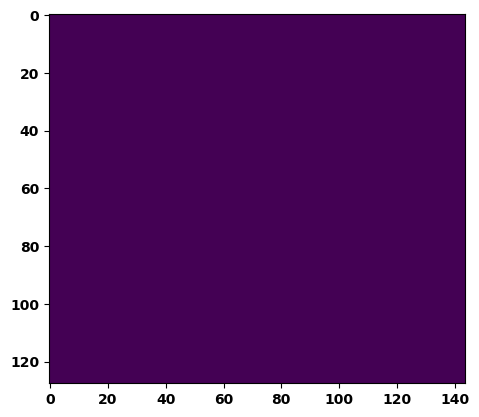

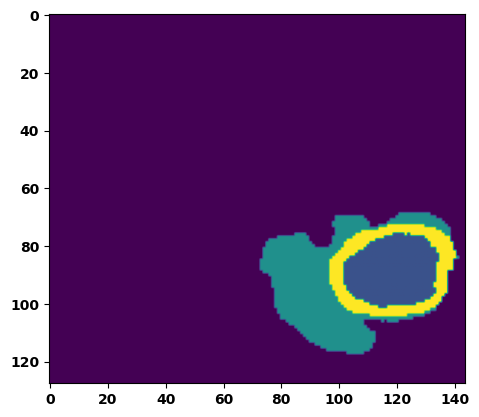

  6%|▌         | 2/36 [00:02<00:34,  1.01s/it]

Batch_id:  1 Eval loss:  0.7757575511932373
Batch_id:  1 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.03s/it]

Batch_id:  2 Eval loss:  0.21230769157409668
Batch_id:  2 Eval IoU:  tensor(0.6684, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9868, device='cuda:0')


 11%|█         | 4/36 [00:04<00:31,  1.00it/s]

Batch_id:  3 Eval loss:  0.7638114094734192
Batch_id:  3 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.7013278007507324
Batch_id:  4 Eval IoU:  tensor(0.2636, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.05s/it]

Batch_id:  5 Eval loss:  0.766680121421814
Batch_id:  5 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.8048044443130493
Batch_id:  6 Eval IoU:  tensor(0.1601, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8199, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.6405, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8687, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8432, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:30,  1.08s/it]

Batch_id:  7 Eval loss:  0.5620940923690796
Batch_id:  7 Eval IoU:  tensor(0.3820, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:29,  1.08s/it]

Batch_id:  8 Eval loss:  0.7669811248779297
Batch_id:  8 Eval IoU:  tensor(0.2065, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8785, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8183, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8874, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.04s/it]

Batch_id:  9 Eval loss:  0.5739760994911194
Batch_id:  9 Eval IoU:  tensor(0.3419, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  10 Eval loss:  0.7424020767211914
Batch_id:  10 Eval IoU:  tensor(0.1636, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6596, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3991, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.3234, device='cuda:0')


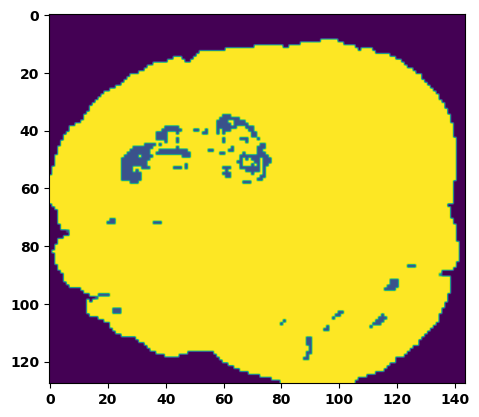

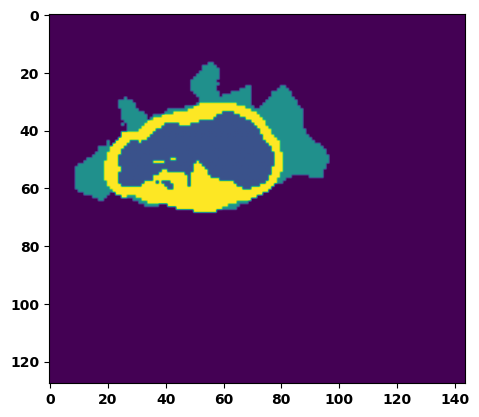

 33%|███▎      | 12/36 [00:12<00:26,  1.11s/it]

Batch_id:  11 Eval loss:  0.7559970021247864
Batch_id:  11 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8994, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8067, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:25,  1.09s/it]

Batch_id:  12 Eval loss:  0.563614547252655
Batch_id:  12 Eval IoU:  tensor(0.3339, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7951, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7581, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9676, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.08s/it]

Batch_id:  13 Eval loss:  0.7653908133506775
Batch_id:  13 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.04s/it]

Batch_id:  14 Eval loss:  0.7634702920913696
Batch_id:  14 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.03s/it]

Batch_id:  15 Eval loss:  0.7709692716598511
Batch_id:  15 Eval IoU:  tensor(0.2100, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8383, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.04s/it]

Batch_id:  16 Eval loss:  0.7409700155258179
Batch_id:  16 Eval IoU:  tensor(0.2270, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8546, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9000, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.32767772674560547
Batch_id:  17 Eval IoU:  tensor(0.5533, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8812, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.7685, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.7654, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.01s/it]

Batch_id:  18 Eval loss:  0.49609386920928955
Batch_id:  18 Eval IoU:  tensor(0.4077, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9274, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.04s/it]

Batch_id:  19 Eval loss:  0.7691535949707031
Batch_id:  19 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Eval loss:  0.7535094022750854
Batch_id:  20 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


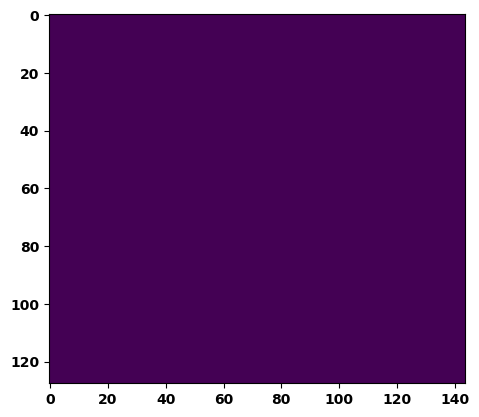

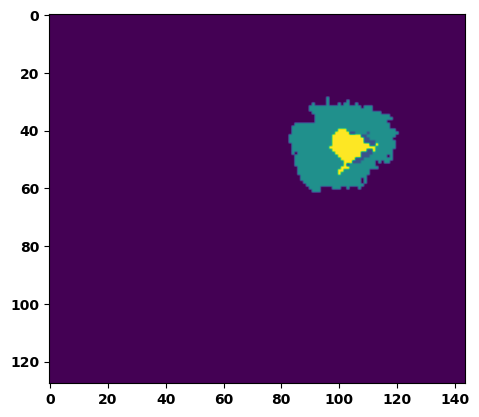

 61%|██████    | 22/36 [00:23<00:14,  1.04s/it]

Batch_id:  21 Eval loss:  0.7518003582954407
Batch_id:  21 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.04s/it]

Batch_id:  22 Eval loss:  0.49897196888923645
Batch_id:  22 Eval IoU:  tensor(0.4147, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9021, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9334, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.02s/it]

Batch_id:  23 Eval loss:  0.5685906410217285
Batch_id:  23 Eval IoU:  tensor(0.3272, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7518, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.5183, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.5206, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9720, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.01s/it]

Batch_id:  24 Eval loss:  0.5797639489173889
Batch_id:  24 Eval IoU:  tensor(0.3669, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.02s/it]

Batch_id:  25 Eval loss:  0.7660614252090454
Batch_id:  25 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.16619020700454712
Batch_id:  26 Eval IoU:  tensor(0.7357, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.7672291994094849
Batch_id:  27 Eval IoU:  tensor(0.1954, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8696, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7425, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8990, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.06s/it]

Batch_id:  28 Eval loss:  0.7571452856063843
Batch_id:  28 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.03s/it]

Batch_id:  29 Eval loss:  0.7636363506317139
Batch_id:  29 Eval IoU:  tensor(0.2236, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8945, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  30 Eval loss:  0.7574633359909058
Batch_id:  30 Eval IoU:  tensor(0.2334, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


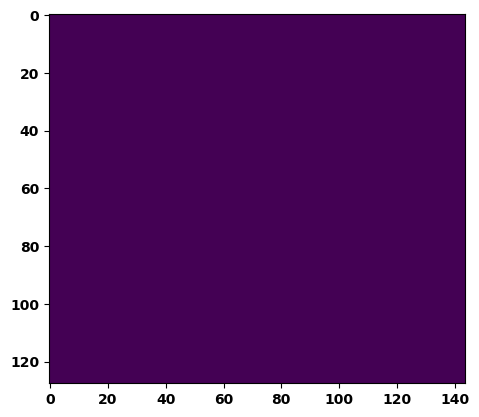

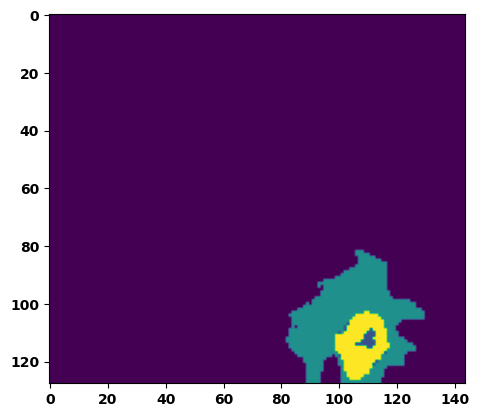

 89%|████████▉ | 32/36 [00:33<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.523575484752655
Batch_id:  31 Eval IoU:  tensor(0.3572, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6461, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3328, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.3066, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9772, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.05s/it]

Batch_id:  32 Eval loss:  0.7142236828804016
Batch_id:  32 Eval IoU:  tensor(0.2593, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.8810769319534302
Batch_id:  33 Eval IoU:  tensor(0.0759, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6236, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4213, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.2472, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.04s/it]

Batch_id:  34 Eval loss:  0.48170575499534607
Batch_id:  34 Eval IoU:  tensor(0.4497, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9834, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.04s/it]

Batch_id:  35 Eval loss:  0.7563254833221436
Batch_id:  35 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')
Epoch  40 Training loss:  0.13392846909436312
Epoch  40 Evaluation loss:  0.6632406893703673
Epoch  40 Training accuracy :  tensor(0.7988)
Epoch  40 Evaluation accuracy :  tensor(0.2914)
Epoch  40 Training Mean Dice Score:  tensor(0.9889)
Epoch  40 Eval Mean Dice Score:  tensor(0.9074)
Epoch  40 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  40 Eval Non-tumor Dice Score:  tensor(0.8392)
Epoch  40 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  40 Eval NCR/NET Dice Score:  tensor(0.9682)
Epoch  40 Training ED Dice Score:  tensor(0.98

Epoch: 41
Training in session: 


  1%|          | 1/110 [00:01<02:06,  1.16s/it]

Batch_id:  0 Training loss:  0.08118937909603119
Batch_id:  0 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:59,  1.10s/it]

Batch_id:  1 Training loss:  0.1266661137342453
Batch_id:  1 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:56,  1.09s/it]

Batch_id:  2 Training loss:  0.13150067627429962
Batch_id:  2 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.10s/it]

Batch_id:  3 Training loss:  0.10625362396240234
Batch_id:  3 Training IoU:  tensor(0.8830, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:53,  1.08s/it]

Batch_id:  4 Training loss:  0.19665145874023438
Batch_id:  4 Training IoU:  tensor(0.6948, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.18017633259296417
Batch_id:  5 Training IoU:  tensor(0.7204, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.3093945384025574
Batch_id:  6 Training IoU:  tensor(0.6595, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.08s/it]

Batch_id:  7 Training loss:  0.23504480719566345
Batch_id:  7 Training IoU:  tensor(0.6800, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:47,  1.07s/it]

Batch_id:  8 Training loss:  0.06928403675556183
Batch_id:  8 Training IoU:  tensor(0.8793, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:47,  1.08s/it]

Batch_id:  9 Training loss:  0.2542545199394226
Batch_id:  9 Training IoU:  tensor(0.6244, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 10%|█         | 11/110 [00:11<01:47,  1.08s/it]

Batch_id:  10 Training loss:  0.07948368787765503
Batch_id:  10 Training IoU:  tensor(0.8606, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 11%|█         | 12/110 [00:12<01:45,  1.08s/it]

Batch_id:  11 Training loss:  0.1475270688533783
Batch_id:  11 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:44,  1.08s/it]

Batch_id:  12 Training loss:  0.0570855438709259
Batch_id:  12 Training IoU:  tensor(0.9005, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:42,  1.07s/it]

Batch_id:  13 Training loss:  0.15612353384494781
Batch_id:  13 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:40,  1.05s/it]

Batch_id:  14 Training loss:  0.08185558021068573
Batch_id:  14 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:38,  1.05s/it]

Batch_id:  15 Training loss:  0.08605648577213287
Batch_id:  15 Training IoU:  tensor(0.8533, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.08357827365398407
Batch_id:  16 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:41,  1.10s/it]

Batch_id:  17 Training loss:  0.19485977292060852
Batch_id:  17 Training IoU:  tensor(0.7363, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:37,  1.07s/it]

Batch_id:  18 Training loss:  0.06137301027774811
Batch_id:  18 Training IoU:  tensor(0.8923, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:36,  1.07s/it]

Batch_id:  19 Training loss:  0.08481365442276001
Batch_id:  19 Training IoU:  tensor(0.8541, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:33,  1.05s/it]

Batch_id:  20 Training loss:  0.08945785462856293
Batch_id:  20 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 20%|██        | 22/110 [00:23<01:37,  1.11s/it]

Batch_id:  21 Training loss:  0.24953798949718475
Batch_id:  21 Training IoU:  tensor(0.6866, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 21%|██        | 23/110 [00:24<01:36,  1.11s/it]

Batch_id:  22 Training loss:  0.06133513152599335
Batch_id:  22 Training IoU:  tensor(0.8970, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.04739825427532196
Batch_id:  23 Training IoU:  tensor(0.9211, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:34,  1.12s/it]

Batch_id:  24 Training loss:  0.06466999650001526
Batch_id:  24 Training IoU:  tensor(0.8955, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:32,  1.10s/it]

Batch_id:  25 Training loss:  0.3798656463623047
Batch_id:  25 Training IoU:  tensor(0.5317, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.08s/it]

Batch_id:  26 Training loss:  0.09513500332832336
Batch_id:  26 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:26,  1.05s/it]

Batch_id:  27 Training loss:  0.13070429861545563
Batch_id:  27 Training IoU:  tensor(0.7802, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:23,  1.04s/it]

Batch_id:  28 Training loss:  0.10740764439105988
Batch_id:  28 Training IoU:  tensor(0.8291, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:21,  1.02s/it]

Batch_id:  29 Training loss:  0.1355830729007721
Batch_id:  29 Training IoU:  tensor(0.7768, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:22,  1.04s/it]

Batch_id:  30 Training loss:  0.04960857331752777
Batch_id:  30 Training IoU:  tensor(0.9135, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:26,  1.11s/it]

Batch_id:  31 Training loss:  0.052888914942741394
Batch_id:  31 Training IoU:  tensor(0.9072, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 30%|███       | 33/110 [00:35<01:25,  1.10s/it]

Batch_id:  32 Training loss:  0.07681319117546082
Batch_id:  32 Training IoU:  tensor(0.8663, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 31%|███       | 34/110 [00:36<01:24,  1.11s/it]

Batch_id:  33 Training loss:  0.09880433976650238
Batch_id:  33 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:20,  1.07s/it]

Batch_id:  34 Training loss:  0.12684886157512665
Batch_id:  34 Training IoU:  tensor(0.8104, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.08858610689640045
Batch_id:  35 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:20,  1.10s/it]

Batch_id:  36 Training loss:  0.07106491923332214
Batch_id:  36 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:19,  1.11s/it]

Batch_id:  37 Training loss:  0.14817990362644196
Batch_id:  37 Training IoU:  tensor(0.7597, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.09220543503761292
Batch_id:  38 Training IoU:  tensor(0.8435, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.21952831745147705
Batch_id:  39 Training IoU:  tensor(0.7018, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.07s/it]

Batch_id:  40 Training loss:  0.17366483807563782
Batch_id:  40 Training IoU:  tensor(0.7203, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.05633603036403656
Batch_id:  41 Training IoU:  tensor(0.9037, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:13,  1.10s/it]

Batch_id:  42 Training loss:  0.3470333516597748
Batch_id:  42 Training IoU:  tensor(0.5988, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 40%|████      | 44/110 [00:47<01:11,  1.09s/it]

Batch_id:  43 Training loss:  0.13908571004867554
Batch_id:  43 Training IoU:  tensor(0.8051, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 41%|████      | 45/110 [00:48<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.17311978340148926
Batch_id:  44 Training IoU:  tensor(0.7869, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:10,  1.10s/it]

Batch_id:  45 Training loss:  0.13492485880851746
Batch_id:  45 Training IoU:  tensor(0.7877, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.16535286605358124
Batch_id:  46 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:07,  1.10s/it]

Batch_id:  47 Training loss:  0.2083510309457779
Batch_id:  47 Training IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:05,  1.08s/it]

Batch_id:  48 Training loss:  0.14850632846355438
Batch_id:  48 Training IoU:  tensor(0.7579, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.06270670890808105
Batch_id:  49 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.08259949088096619
Batch_id:  50 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.0750846117734909
Batch_id:  51 Training IoU:  tensor(0.8664, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.10987488925457001
Batch_id:  52 Training IoU:  tensor(0.8133, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.07s/it]

Batch_id:  53 Training loss:  0.08330851793289185
Batch_id:  53 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:58,  1.07s/it]

Batch_id:  54 Training loss:  0.14875097572803497
Batch_id:  54 Training IoU:  tensor(0.7646, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:59,  1.09s/it]

Batch_id:  55 Training loss:  0.09925292432308197
Batch_id:  55 Training IoU:  tensor(0.8420, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:57,  1.08s/it]

Batch_id:  56 Training loss:  0.1325431764125824
Batch_id:  56 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.05835963785648346
Batch_id:  57 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.08s/it]

Batch_id:  58 Training loss:  0.20325450599193573
Batch_id:  58 Training IoU:  tensor(0.6963, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:56,  1.12s/it]

Batch_id:  59 Training loss:  0.09560216963291168
Batch_id:  59 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.12s/it]

Batch_id:  60 Training loss:  0.19193345308303833
Batch_id:  60 Training IoU:  tensor(0.6990, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.18170957267284393
Batch_id:  61 Training IoU:  tensor(0.7118, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.10775493085384369
Batch_id:  62 Training IoU:  tensor(0.8181, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.34763774275779724
Batch_id:  63 Training IoU:  tensor(0.5603, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:49,  1.09s/it]

Batch_id:  64 Training loss:  0.45336902141571045
Batch_id:  64 Training IoU:  tensor(0.4650, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:50,  1.16s/it]

Batch_id:  65 Training loss:  0.06236529350280762
Batch_id:  65 Training IoU:  tensor(0.8912, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:49,  1.16s/it]

Batch_id:  66 Training loss:  0.04475003480911255
Batch_id:  66 Training IoU:  tensor(0.9199, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:47,  1.12s/it]

Batch_id:  67 Training loss:  0.1357119083404541
Batch_id:  67 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.14695145189762115
Batch_id:  68 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.10s/it]

Batch_id:  69 Training loss:  0.3174230456352234
Batch_id:  69 Training IoU:  tensor(0.6592, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.08s/it]

Batch_id:  70 Training loss:  0.12882515788078308
Batch_id:  70 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.12438471615314484
Batch_id:  71 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:42,  1.16s/it]

Batch_id:  72 Training loss:  0.08244544267654419
Batch_id:  72 Training IoU:  tensor(0.8542, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:40,  1.12s/it]

Batch_id:  73 Training loss:  0.08211898803710938
Batch_id:  73 Training IoU:  tensor(0.8662, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:39,  1.11s/it]

Batch_id:  74 Training loss:  0.07849839329719543
Batch_id:  74 Training IoU:  tensor(0.8600, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.12s/it]

Batch_id:  75 Training loss:  0.06284439563751221
Batch_id:  75 Training IoU:  tensor(0.8923, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:36,  1.12s/it]

Batch_id:  76 Training loss:  0.15028895437717438
Batch_id:  76 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 71%|███████   | 78/110 [01:25<00:37,  1.17s/it]

Batch_id:  77 Training loss:  0.12618082761764526
Batch_id:  77 Training IoU:  tensor(0.8111, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 72%|███████▏  | 79/110 [01:26<00:35,  1.14s/it]

Batch_id:  78 Training loss:  0.11858576536178589
Batch_id:  78 Training IoU:  tensor(0.8023, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 73%|███████▎  | 80/110 [01:27<00:33,  1.10s/it]

Batch_id:  79 Training loss:  0.08265659213066101
Batch_id:  79 Training IoU:  tensor(0.8568, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.15647943317890167
Batch_id:  80 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:30,  1.09s/it]

Batch_id:  81 Training loss:  0.07901449501514435
Batch_id:  81 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.08647142350673676
Batch_id:  82 Training IoU:  tensor(0.8492, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.08s/it]

Batch_id:  83 Training loss:  0.1288575977087021
Batch_id:  83 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:26,  1.07s/it]

Batch_id:  84 Training loss:  0.14650490880012512
Batch_id:  84 Training IoU:  tensor(0.7644, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:25,  1.07s/it]

Batch_id:  85 Training loss:  0.05963127315044403
Batch_id:  85 Training IoU:  tensor(0.8974, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:24,  1.07s/it]

Batch_id:  86 Training loss:  0.3451673984527588
Batch_id:  86 Training IoU:  tensor(0.5377, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.06s/it]

Batch_id:  87 Training loss:  0.062445059418678284
Batch_id:  87 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:22,  1.05s/it]

Batch_id:  88 Training loss:  0.13278113305568695
Batch_id:  88 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.05s/it]

Batch_id:  89 Training loss:  0.1400987058877945
Batch_id:  89 Training IoU:  tensor(0.7812, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.1778803914785385
Batch_id:  90 Training IoU:  tensor(0.7390, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.08844597637653351
Batch_id:  91 Training IoU:  tensor(0.8496, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.08s/it]

Batch_id:  92 Training loss:  0.1596342772245407
Batch_id:  92 Training IoU:  tensor(0.7465, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:16,  1.06s/it]

Batch_id:  93 Training loss:  0.1592606008052826
Batch_id:  93 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.07s/it]

Batch_id:  94 Training loss:  0.14697083830833435
Batch_id:  94 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9723, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.07s/it]

Batch_id:  95 Training loss:  0.11101841926574707
Batch_id:  95 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:13,  1.07s/it]

Batch_id:  96 Training loss:  0.1523572951555252
Batch_id:  96 Training IoU:  tensor(0.7549, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:12,  1.08s/it]

Batch_id:  97 Training loss:  0.1047864556312561
Batch_id:  97 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.09s/it]

Batch_id:  98 Training loss:  0.3291149139404297
Batch_id:  98 Training IoU:  tensor(0.6165, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.05067230761051178
Batch_id:  99 Training IoU:  tensor(0.9137, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.04727576673030853
Batch_id:  100 Training IoU:  tensor(0.9310, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.06593513488769531
Batch_id:  101 Training IoU:  tensor(0.8850, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.08s/it]

Batch_id:  102 Training loss:  0.12337909638881683
Batch_id:  102 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.06670533120632172
Batch_id:  103 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.08s/it]

Batch_id:  104 Training loss:  0.1338205486536026
Batch_id:  104 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.07s/it]

Batch_id:  105 Training loss:  0.10339553654193878
Batch_id:  105 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.1939595341682434
Batch_id:  106 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.16942134499549866
Batch_id:  107 Training IoU:  tensor(0.7382, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.0936044454574585
Batch_id:  108 Training IoU:  tensor(0.8497, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.07871292531490326
Batch_id:  109 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9948, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6679108142852783
Batch_id:  0 Eval IoU:  tensor(0.2863, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


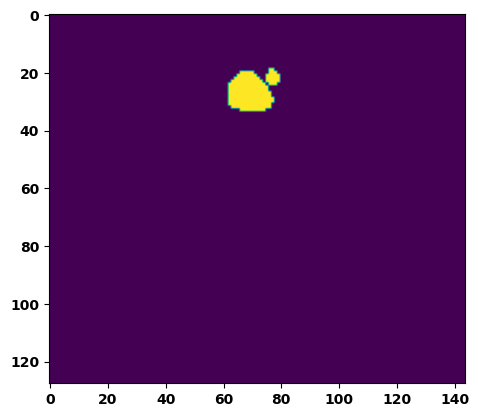

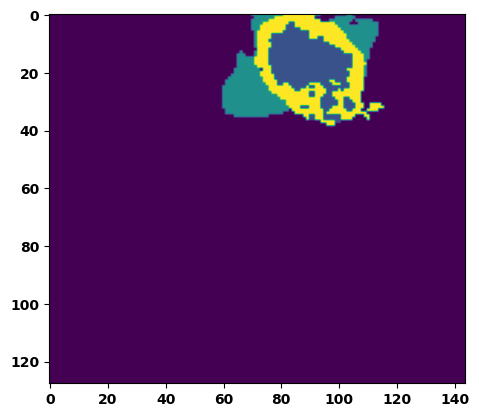

  6%|▌         | 2/36 [00:02<00:37,  1.09s/it]

Batch_id:  1 Eval loss:  0.7660490274429321
Batch_id:  1 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.05s/it]

Batch_id:  2 Eval loss:  0.41671010851860046
Batch_id:  2 Eval IoU:  tensor(0.4714, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9524, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.04s/it]

Batch_id:  3 Eval loss:  0.720402717590332
Batch_id:  3 Eval IoU:  tensor(0.2541, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.06s/it]

Batch_id:  4 Eval loss:  0.23180684447288513
Batch_id:  4 Eval IoU:  tensor(0.6523, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9759, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.05s/it]

Batch_id:  5 Eval loss:  0.6727898716926575
Batch_id:  5 Eval IoU:  tensor(0.2574, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8826, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8077, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8860, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.47226381301879883
Batch_id:  6 Eval IoU:  tensor(0.4247, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6503, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3260, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.3116, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.5415511727333069
Batch_id:  7 Eval IoU:  tensor(0.4092, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9813, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.04s/it]

Batch_id:  8 Eval loss:  0.7612923383712769
Batch_id:  8 Eval IoU:  tensor(0.2277, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9052, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.7757441401481628
Batch_id:  9 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  10 Eval loss:  0.7716242671012878
Batch_id:  10 Eval IoU:  tensor(0.2098, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8393, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9283, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


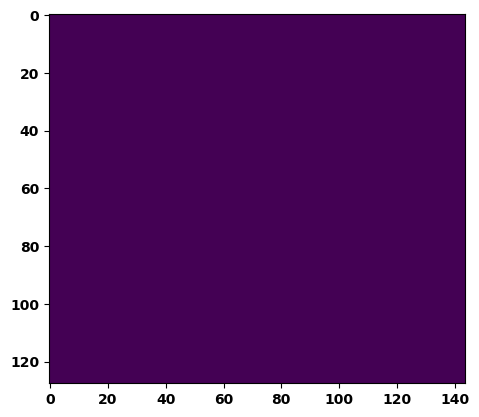

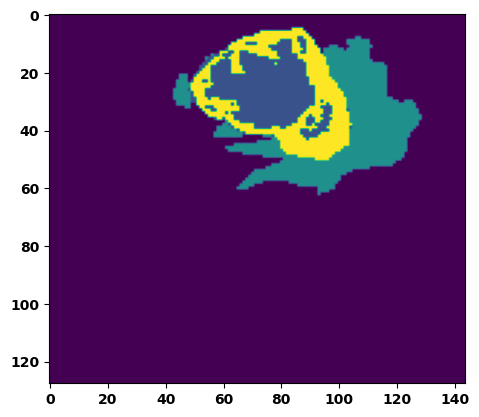

 33%|███▎      | 12/36 [00:12<00:25,  1.08s/it]

Batch_id:  11 Eval loss:  0.4653491973876953
Batch_id:  11 Eval IoU:  tensor(0.4281, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8323, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.6742, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.7068, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9941, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.7534958720207214
Batch_id:  12 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.05s/it]

Batch_id:  13 Eval loss:  0.7691202759742737
Batch_id:  13 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.07s/it]

Batch_id:  14 Eval loss:  0.7139017581939697
Batch_id:  14 Eval IoU:  tensor(0.2561, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9124, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8113, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.05s/it]

Batch_id:  15 Eval loss:  0.7653855085372925
Batch_id:  15 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.06s/it]

Batch_id:  16 Eval loss:  0.2359135001897812
Batch_id:  16 Eval IoU:  tensor(0.6378, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9873, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.06s/it]

Batch_id:  17 Eval loss:  0.7722770571708679
Batch_id:  17 Eval IoU:  tensor(0.1901, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8344, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.7500, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8689, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:17,  1.05s/it]

Batch_id:  18 Eval loss:  0.8257061243057251
Batch_id:  18 Eval IoU:  tensor(0.1249, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7350, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4926, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.7925, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7278, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.03s/it]

Batch_id:  19 Eval loss:  0.7629662156105042
Batch_id:  19 Eval IoU:  tensor(0.2248, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8998, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  20 Eval loss:  0.7517861127853394
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


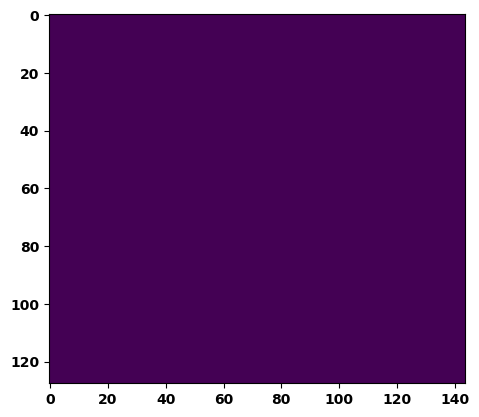

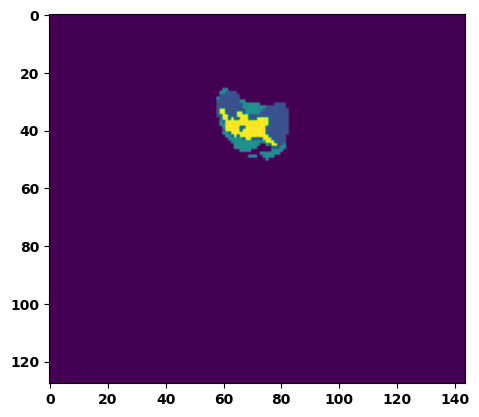

 61%|██████    | 22/36 [00:23<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.5197411179542542
Batch_id:  21 Eval IoU:  tensor(0.4456, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9909, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.07s/it]

Batch_id:  22 Eval loss:  0.7666693329811096
Batch_id:  22 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.591011106967926
Batch_id:  23 Eval IoU:  tensor(0.3124, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8526, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7644, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.8935, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.7876, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9649, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.05s/it]

Batch_id:  24 Eval loss:  0.7772536277770996
Batch_id:  24 Eval IoU:  tensor(0.2007, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8028, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8806, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.04s/it]

Batch_id:  25 Eval loss:  0.7563198804855347
Batch_id:  25 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.02s/it]

Batch_id:  26 Eval loss:  0.8812001943588257
Batch_id:  26 Eval IoU:  tensor(0.0758, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.6234, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4211, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.2470, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.04s/it]

Batch_id:  27 Eval loss:  0.7723459005355835
Batch_id:  27 Eval IoU:  tensor(0.1894, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8152, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7612, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.7984, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.7811, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9199, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.7571351528167725
Batch_id:  28 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.02s/it]

Batch_id:  29 Eval loss:  0.7675024271011353
Batch_id:  29 Eval IoU:  tensor(0.2172, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8687, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  30 Eval loss:  0.6461698412895203
Batch_id:  30 Eval IoU:  tensor(0.2871, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8957, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8583, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.8428, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


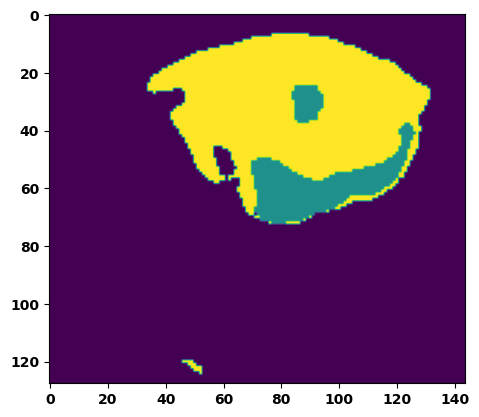

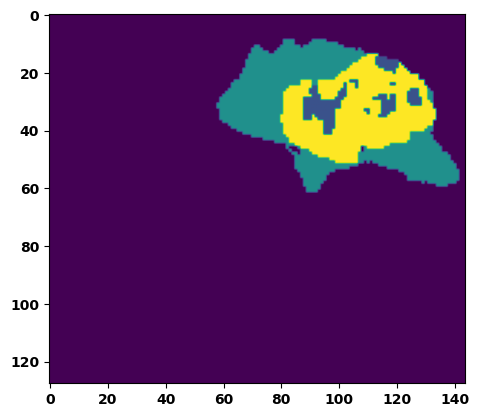

 89%|████████▉ | 32/36 [00:33<00:04,  1.05s/it]

Batch_id:  31 Eval loss:  0.5378296375274658
Batch_id:  31 Eval IoU:  tensor(0.3636, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7532, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5140, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.5166, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.03s/it]

Batch_id:  32 Eval loss:  0.5329381823539734
Batch_id:  32 Eval IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9446, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8895, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9246, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.700312614440918
Batch_id:  33 Eval IoU:  tensor(0.2037, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6637, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3970, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.3338, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.6231178641319275
Batch_id:  34 Eval IoU:  tensor(0.3291, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.5069969892501831
Batch_id:  35 Eval IoU:  tensor(0.3884, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9047, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8345, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8716, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9274, device='cuda:0')
Epoch  41 Training loss:  0.13387951105833054
Epoch  41 Evaluation loss:  0.6597386279867755
Epoch  41 Training accuracy :  tensor(0.7987)
Epoch  41 Evaluation accuracy :  tensor(0.2914)
Epoch  41 Training Mean Dice Score:  tensor(0.9889)
Epoch  41 Eval Mean Dice Score:  tensor(0.8967)
Epoch  41 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  41 Eval Non-tumor Dice Score:  tensor(0.8245)
Epoch  41 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  41 Eval NCR/NET Dice Score:  tensor(0.9523)
Epoch  41 Training ED Dice Score:  tensor(0.98

Epoch: 42
Training in session: 


  1%|          | 1/110 [00:01<02:04,  1.14s/it]

Batch_id:  0 Training loss:  0.13209237158298492
Batch_id:  0 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:59,  1.10s/it]

Batch_id:  1 Training loss:  0.07314836978912354
Batch_id:  1 Training IoU:  tensor(0.8698, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:58,  1.11s/it]

Batch_id:  2 Training loss:  0.14243847131729126
Batch_id:  2 Training IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:59,  1.13s/it]

Batch_id:  3 Training loss:  0.13207626342773438
Batch_id:  3 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.13s/it]

Batch_id:  4 Training loss:  0.04948946833610535
Batch_id:  4 Training IoU:  tensor(0.9171, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:57,  1.13s/it]

Batch_id:  5 Training loss:  0.06660676002502441
Batch_id:  5 Training IoU:  tensor(0.8887, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:55,  1.13s/it]

Batch_id:  6 Training loss:  0.08293454349040985
Batch_id:  6 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  7%|▋         | 8/110 [00:09<01:55,  1.13s/it]

Batch_id:  7 Training loss:  0.08924530446529388
Batch_id:  7 Training IoU:  tensor(0.8455, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  8%|▊         | 9/110 [00:10<01:54,  1.13s/it]

Batch_id:  8 Training loss:  0.0883176177740097
Batch_id:  8 Training IoU:  tensor(0.8497, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:51,  1.12s/it]

Batch_id:  9 Training loss:  0.08484449982643127
Batch_id:  9 Training IoU:  tensor(0.8544, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 10%|█         | 11/110 [00:12<01:50,  1.12s/it]

Batch_id:  10 Training loss:  0.08051642775535583
Batch_id:  10 Training IoU:  tensor(0.8672, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 11%|█         | 12/110 [00:13<01:48,  1.11s/it]

Batch_id:  11 Training loss:  0.0576934814453125
Batch_id:  11 Training IoU:  tensor(0.9002, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:50,  1.14s/it]

Batch_id:  12 Training loss:  0.17847402393817902
Batch_id:  12 Training IoU:  tensor(0.7225, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:51,  1.16s/it]

Batch_id:  13 Training loss:  0.04429131746292114
Batch_id:  13 Training IoU:  tensor(0.9203, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 14%|█▎        | 15/110 [00:17<01:50,  1.17s/it]

Batch_id:  14 Training loss:  0.3158416152000427
Batch_id:  14 Training IoU:  tensor(0.6578, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 15%|█▍        | 16/110 [00:18<01:50,  1.17s/it]

Batch_id:  15 Training loss:  0.1780187338590622
Batch_id:  15 Training IoU:  tensor(0.7379, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:48,  1.16s/it]

Batch_id:  16 Training loss:  0.05807743966579437
Batch_id:  16 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:45,  1.14s/it]

Batch_id:  17 Training loss:  0.13461290299892426
Batch_id:  17 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:41,  1.12s/it]

Batch_id:  18 Training loss:  0.19799047708511353
Batch_id:  18 Training IoU:  tensor(0.6930, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:38,  1.09s/it]

Batch_id:  19 Training loss:  0.16746585071086884
Batch_id:  19 Training IoU:  tensor(0.7285, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:35,  1.08s/it]

Batch_id:  20 Training loss:  0.09445318579673767
Batch_id:  20 Training IoU:  tensor(0.8403, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 20%|██        | 22/110 [00:24<01:34,  1.07s/it]

Batch_id:  21 Training loss:  0.1632915437221527
Batch_id:  21 Training IoU:  tensor(0.8010, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 21%|██        | 23/110 [00:25<01:37,  1.12s/it]

Batch_id:  22 Training loss:  0.04897686839103699
Batch_id:  22 Training IoU:  tensor(0.9146, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 22%|██▏       | 24/110 [00:27<01:37,  1.13s/it]

Batch_id:  23 Training loss:  0.34420448541641235
Batch_id:  23 Training IoU:  tensor(0.5627, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.11081050336360931
Batch_id:  24 Training IoU:  tensor(0.8130, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:34,  1.12s/it]

Batch_id:  25 Training loss:  0.05008791387081146
Batch_id:  25 Training IoU:  tensor(0.9150, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.217382550239563
Batch_id:  26 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:29,  1.09s/it]

Batch_id:  27 Training loss:  0.0600043386220932
Batch_id:  27 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.10547822713851929
Batch_id:  28 Training IoU:  tensor(0.8274, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.15138734877109528
Batch_id:  29 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.12850499153137207
Batch_id:  30 Training IoU:  tensor(0.8080, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:22,  1.06s/it]

Batch_id:  31 Training loss:  0.10300181806087494
Batch_id:  31 Training IoU:  tensor(0.8388, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 30%|███       | 33/110 [00:36<01:24,  1.09s/it]

Batch_id:  32 Training loss:  0.1357458531856537
Batch_id:  32 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 31%|███       | 34/110 [00:37<01:23,  1.10s/it]

Batch_id:  33 Training loss:  0.05258721113204956
Batch_id:  33 Training IoU:  tensor(0.9077, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:23,  1.11s/it]

Batch_id:  34 Training loss:  0.1432538479566574
Batch_id:  34 Training IoU:  tensor(0.8008, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:21,  1.10s/it]

Batch_id:  35 Training loss:  0.059957996010780334
Batch_id:  35 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.34344160556793213
Batch_id:  36 Training IoU:  tensor(0.5392, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:18,  1.08s/it]

Batch_id:  37 Training loss:  0.14778558909893036
Batch_id:  37 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:18,  1.10s/it]

Batch_id:  38 Training loss:  0.103305384516716
Batch_id:  38 Training IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:19,  1.14s/it]

Batch_id:  39 Training loss:  0.21394988894462585
Batch_id:  39 Training IoU:  tensor(0.7048, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:16,  1.11s/it]

Batch_id:  40 Training loss:  0.062479451298713684
Batch_id:  40 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:14,  1.09s/it]

Batch_id:  41 Training loss:  0.08568869531154633
Batch_id:  41 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.0813121497631073
Batch_id:  42 Training IoU:  tensor(0.8678, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 40%|████      | 44/110 [00:48<01:11,  1.08s/it]

Batch_id:  43 Training loss:  0.12868991494178772
Batch_id:  43 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 41%|████      | 45/110 [00:49<01:09,  1.06s/it]

Batch_id:  44 Training loss:  0.12975460290908813
Batch_id:  44 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.06s/it]

Batch_id:  45 Training loss:  0.10809636116027832
Batch_id:  45 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:08,  1.08s/it]

Batch_id:  46 Training loss:  0.1307152807712555
Batch_id:  46 Training IoU:  tensor(0.7822, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:07,  1.09s/it]

Batch_id:  47 Training loss:  0.08295007050037384
Batch_id:  47 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:04,  1.07s/it]

Batch_id:  48 Training loss:  0.15843483805656433
Batch_id:  48 Training IoU:  tensor(0.7454, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:04,  1.07s/it]

Batch_id:  49 Training loss:  0.11785252392292023
Batch_id:  49 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:02,  1.06s/it]

Batch_id:  50 Training loss:  0.30775219202041626
Batch_id:  50 Training IoU:  tensor(0.6611, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 47%|████▋     | 52/110 [00:57<01:01,  1.07s/it]

Batch_id:  51 Training loss:  0.10723461210727692
Batch_id:  51 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 48%|████▊     | 53/110 [00:58<01:00,  1.06s/it]

Batch_id:  52 Training loss:  0.379905641078949
Batch_id:  52 Training IoU:  tensor(0.5325, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 49%|████▉     | 54/110 [00:59<00:59,  1.06s/it]

Batch_id:  53 Training loss:  0.08216212689876556
Batch_id:  53 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 50%|█████     | 55/110 [01:00<00:58,  1.06s/it]

Batch_id:  54 Training loss:  0.1529875546693802
Batch_id:  54 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 51%|█████     | 56/110 [01:01<00:58,  1.07s/it]

Batch_id:  55 Training loss:  0.0469285249710083
Batch_id:  55 Training IoU:  tensor(0.9314, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 52%|█████▏    | 57/110 [01:02<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.1693459153175354
Batch_id:  56 Training IoU:  tensor(0.7373, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.09s/it]

Batch_id:  57 Training loss:  0.23210807144641876
Batch_id:  57 Training IoU:  tensor(0.6839, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.12632574141025543
Batch_id:  58 Training IoU:  tensor(0.7857, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.07s/it]

Batch_id:  59 Training loss:  0.13268457353115082
Batch_id:  59 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.16634435951709747
Batch_id:  60 Training IoU:  tensor(0.7699, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 56%|█████▋    | 62/110 [01:08<00:52,  1.08s/it]

Batch_id:  61 Training loss:  0.07862626016139984
Batch_id:  61 Training IoU:  tensor(0.8619, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 57%|█████▋    | 63/110 [01:09<00:51,  1.09s/it]

Batch_id:  62 Training loss:  0.19080044329166412
Batch_id:  62 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 58%|█████▊    | 64/110 [01:10<00:50,  1.09s/it]

Batch_id:  63 Training loss:  0.10061360895633698
Batch_id:  63 Training IoU:  tensor(0.8473, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 59%|█████▉    | 65/110 [01:11<00:48,  1.08s/it]

Batch_id:  64 Training loss:  0.18157021701335907
Batch_id:  64 Training IoU:  tensor(0.7119, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 60%|██████    | 66/110 [01:12<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.14789994060993195
Batch_id:  65 Training IoU:  tensor(0.7619, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 61%|██████    | 67/110 [01:13<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.06607125699520111
Batch_id:  66 Training IoU:  tensor(0.8849, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:46,  1.11s/it]

Batch_id:  67 Training loss:  0.0760650783777237
Batch_id:  67 Training IoU:  tensor(0.8677, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:45,  1.12s/it]

Batch_id:  68 Training loss:  0.06287108361721039
Batch_id:  68 Training IoU:  tensor(0.8924, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:45,  1.15s/it]

Batch_id:  69 Training loss:  0.09418703615665436
Batch_id:  69 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:44,  1.14s/it]

Batch_id:  70 Training loss:  0.08188658952713013
Batch_id:  70 Training IoU:  tensor(0.8559, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:42,  1.13s/it]

Batch_id:  71 Training loss:  0.1483360230922699
Batch_id:  71 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:42,  1.14s/it]

Batch_id:  72 Training loss:  0.06238029897212982
Batch_id:  72 Training IoU:  tensor(0.8913, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:40,  1.13s/it]

Batch_id:  73 Training loss:  0.06218250095844269
Batch_id:  73 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 68%|██████▊   | 75/110 [01:22<00:39,  1.12s/it]

Batch_id:  74 Training loss:  0.45146644115448
Batch_id:  74 Training IoU:  tensor(0.4668, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 69%|██████▉   | 76/110 [01:23<00:39,  1.15s/it]

Batch_id:  75 Training loss:  0.14553587138652802
Batch_id:  75 Training IoU:  tensor(0.7665, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 70%|███████   | 77/110 [01:24<00:37,  1.13s/it]

Batch_id:  76 Training loss:  0.08358979225158691
Batch_id:  76 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:37,  1.17s/it]

Batch_id:  77 Training loss:  0.12487085163593292
Batch_id:  77 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:35,  1.15s/it]

Batch_id:  78 Training loss:  0.18979118764400482
Batch_id:  78 Training IoU:  tensor(0.7021, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.12s/it]

Batch_id:  79 Training loss:  0.07138532400131226
Batch_id:  79 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.12s/it]

Batch_id:  80 Training loss:  0.057529598474502563
Batch_id:  80 Training IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 75%|███████▍  | 82/110 [01:30<00:30,  1.10s/it]

Batch_id:  81 Training loss:  0.12650750577449799
Batch_id:  81 Training IoU:  tensor(0.7988, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 75%|███████▌  | 83/110 [01:31<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.09473903477191925
Batch_id:  82 Training IoU:  tensor(0.8487, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 76%|███████▋  | 84/110 [01:32<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.19368726015090942
Batch_id:  83 Training IoU:  tensor(0.7386, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 77%|███████▋  | 85/110 [01:33<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.12860581278800964
Batch_id:  84 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:27,  1.13s/it]

Batch_id:  85 Training loss:  0.0806131362915039
Batch_id:  85 Training IoU:  tensor(0.8583, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 79%|███████▉  | 87/110 [01:35<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.0697924792766571
Batch_id:  86 Training IoU:  tensor(0.8790, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.10s/it]

Batch_id:  87 Training loss:  0.2515190839767456
Batch_id:  87 Training IoU:  tensor(0.6847, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:23,  1.11s/it]

Batch_id:  88 Training loss:  0.15840080380439758
Batch_id:  88 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 82%|████████▏ | 90/110 [01:39<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.20292077958583832
Batch_id:  89 Training IoU:  tensor(0.6971, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 83%|████████▎ | 91/110 [01:40<00:21,  1.14s/it]

Batch_id:  90 Training loss:  0.10296007990837097
Batch_id:  90 Training IoU:  tensor(0.8940, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 84%|████████▎ | 92/110 [01:41<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.14465288817882538
Batch_id:  91 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 85%|████████▍ | 93/110 [01:42<00:19,  1.13s/it]

Batch_id:  92 Training loss:  0.14841580390930176
Batch_id:  92 Training IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 85%|████████▌ | 94/110 [01:43<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.08684149384498596
Batch_id:  93 Training IoU:  tensor(0.8520, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 86%|████████▋ | 95/110 [01:44<00:16,  1.12s/it]

Batch_id:  94 Training loss:  0.1273850053548813
Batch_id:  94 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 87%|████████▋ | 96/110 [01:45<00:15,  1.09s/it]

Batch_id:  95 Training loss:  0.06314487755298615
Batch_id:  95 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.0916319489479065
Batch_id:  96 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.07892222702503204
Batch_id:  97 Training IoU:  tensor(0.8599, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 90%|█████████ | 99/110 [01:49<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.15617871284484863
Batch_id:  98 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 91%|█████████ | 100/110 [01:50<00:10,  1.07s/it]

Batch_id:  99 Training loss:  0.15858612954616547
Batch_id:  99 Training IoU:  tensor(0.7490, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 92%|█████████▏| 101/110 [01:51<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.09433029592037201
Batch_id:  100 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 93%|█████████▎| 102/110 [01:52<00:08,  1.11s/it]

Batch_id:  101 Training loss:  0.25336194038391113
Batch_id:  101 Training IoU:  tensor(0.6257, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:07,  1.11s/it]

Batch_id:  102 Training loss:  0.127252995967865
Batch_id:  102 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.14s/it]

Batch_id:  103 Training loss:  0.08369125425815582
Batch_id:  103 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.15s/it]

Batch_id:  104 Training loss:  0.34568071365356445
Batch_id:  104 Training IoU:  tensor(0.6031, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.16s/it]

Batch_id:  105 Training loss:  0.10965722799301147
Batch_id:  105 Training IoU:  tensor(0.8145, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.13s/it]

Batch_id:  106 Training loss:  0.3285946846008301
Batch_id:  106 Training IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.10s/it]

Batch_id:  107 Training loss:  0.07899492979049683
Batch_id:  107 Training IoU:  tensor(0.8615, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.15s/it]

Batch_id:  108 Training loss:  0.06498537957668304
Batch_id:  108 Training IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.15112461149692535
Batch_id:  109 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9949, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5778048634529114
Batch_id:  0 Eval IoU:  tensor(0.3052, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6481, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3359, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.3674, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9178, device='cuda:0')


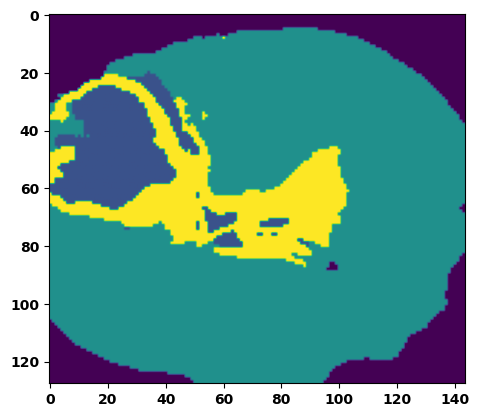

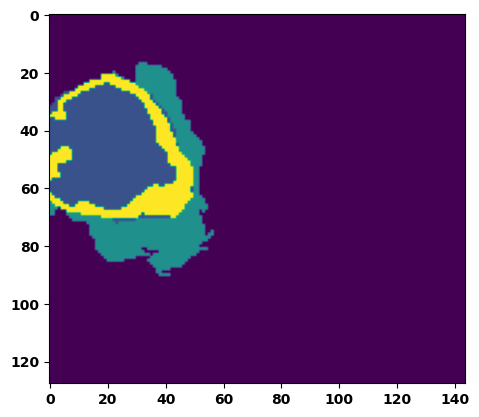

  6%|▌         | 2/36 [00:02<00:35,  1.05s/it]

Batch_id:  1 Eval loss:  0.7800658941268921
Batch_id:  1 Eval IoU:  tensor(0.1965, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8930, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7860, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8429, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.4642470180988312
Batch_id:  2 Eval IoU:  tensor(0.4394, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8684, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9512, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.01s/it]

Batch_id:  3 Eval loss:  0.8829628825187683
Batch_id:  3 Eval IoU:  tensor(0.0743, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6211, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4164, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.2426, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.611825168132782
Batch_id:  4 Eval IoU:  tensor(0.3391, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7517808079719543
Batch_id:  5 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.03s/it]

Batch_id:  6 Eval loss:  0.643214225769043
Batch_id:  6 Eval IoU:  tensor(0.2867, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8691, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9553, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.05s/it]

Batch_id:  7 Eval loss:  0.5155004262924194
Batch_id:  7 Eval IoU:  tensor(0.3657, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8551, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.7360, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.7639, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9744, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.05s/it]

Batch_id:  8 Eval loss:  0.7666513919830322
Batch_id:  8 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.06s/it]

Batch_id:  9 Eval loss:  0.7660427093505859
Batch_id:  9 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  10 Eval loss:  0.6378962993621826
Batch_id:  10 Eval IoU:  tensor(0.2538, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.7282, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4938, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.5275, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9256, device='cuda:0')


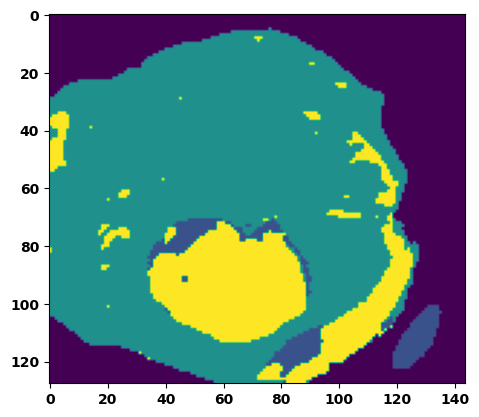

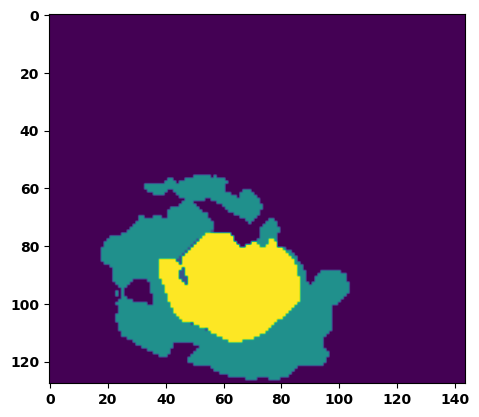

 33%|███▎      | 12/36 [00:12<00:26,  1.09s/it]

Batch_id:  11 Eval loss:  0.43111345171928406
Batch_id:  11 Eval IoU:  tensor(0.5054, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9853, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.06s/it]

Batch_id:  12 Eval loss:  0.6904293298721313
Batch_id:  12 Eval IoU:  tensor(0.2527, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8801, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8255, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7694, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.05s/it]

Batch_id:  13 Eval loss:  0.6358356475830078
Batch_id:  13 Eval IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7139, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4632, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.5640, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.2781878113746643
Batch_id:  14 Eval IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9932, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.11s/it]

Batch_id:  15 Eval loss:  0.6142435073852539
Batch_id:  15 Eval IoU:  tensor(0.3143, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8997, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8839, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8535, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.08s/it]

Batch_id:  16 Eval loss:  0.7388404011726379
Batch_id:  16 Eval IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9159, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.08s/it]

Batch_id:  17 Eval loss:  0.7571287155151367
Batch_id:  17 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.3074703812599182
Batch_id:  18 Eval IoU:  tensor(0.5623, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9674, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.06s/it]

Batch_id:  19 Eval loss:  0.7832361459732056
Batch_id:  19 Eval IoU:  tensor(0.1912, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8824, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7649, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8465, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  20 Eval loss:  0.7001223564147949
Batch_id:  20 Eval IoU:  tensor(0.2042, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6605, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3870, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3317, device='cuda:0')


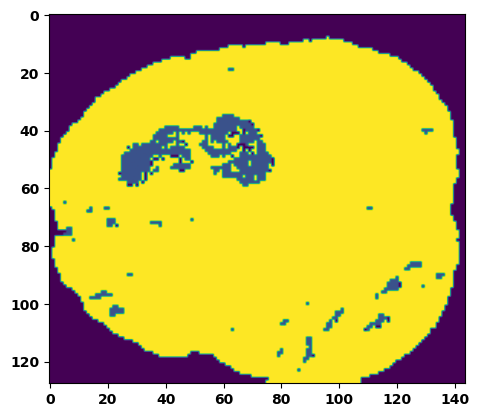

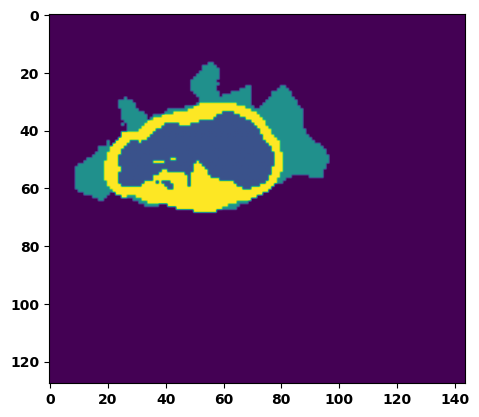

 61%|██████    | 22/36 [00:23<00:16,  1.17s/it]

Batch_id:  21 Eval loss:  0.09210963547229767
Batch_id:  21 Eval IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:15,  1.16s/it]

Batch_id:  22 Eval loss:  0.7691173553466797
Batch_id:  22 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.15s/it]

Batch_id:  23 Eval loss:  0.27560171484947205
Batch_id:  23 Eval IoU:  tensor(0.6165, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9920, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.15s/it]

Batch_id:  24 Eval loss:  0.7469778060913086
Batch_id:  24 Eval IoU:  tensor(0.2112, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8465, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8005, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8961, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8342, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:11,  1.12s/it]

Batch_id:  25 Eval loss:  0.7281602621078491
Batch_id:  25 Eval IoU:  tensor(0.2524, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9048, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8108, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.09s/it]

Batch_id:  26 Eval loss:  0.6721571087837219
Batch_id:  26 Eval IoU:  tensor(0.2792, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9100, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.11s/it]

Batch_id:  27 Eval loss:  0.8120342493057251
Batch_id:  27 Eval IoU:  tensor(0.1367, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7163, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.5957, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8227, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.5264, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9205, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.08s/it]

Batch_id:  28 Eval loss:  0.6860873103141785
Batch_id:  28 Eval IoU:  tensor(0.2147, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7820, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.6097, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.6125, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.7757358551025391
Batch_id:  29 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  30 Eval loss:  0.7535105347633362
Batch_id:  30 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


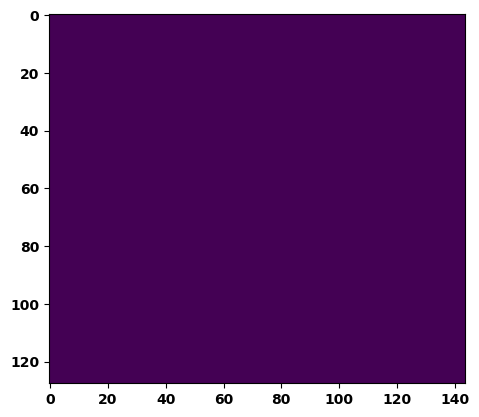

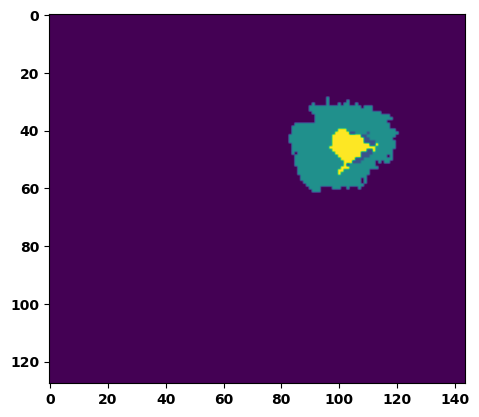

 89%|████████▉ | 32/36 [00:34<00:04,  1.12s/it]

Batch_id:  31 Eval loss:  0.5493955612182617
Batch_id:  31 Eval IoU:  tensor(0.3466, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7282, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4729, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.4881, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.12s/it]

Batch_id:  32 Eval loss:  0.8222824931144714
Batch_id:  32 Eval IoU:  tensor(0.1252, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7288, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4883, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8745, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6256, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9268, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.13s/it]

Batch_id:  33 Eval loss:  0.683353841304779
Batch_id:  33 Eval IoU:  tensor(0.2751, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9196, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.10s/it]

Batch_id:  34 Eval loss:  0.7562718987464905
Batch_id:  34 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.7653800249099731
Batch_id:  35 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')
Epoch 00043: reducing learning rate of group 0 to 7.8125e-06.
Epoch  42 Training loss:  0.13365798904137177
Epoch  42 Evaluation loss:  0.6450770857433478
Epoch  42 Training accuracy :  tensor(0.7991)
Epoch  42 Evaluation accuracy :  tensor(0.2982)
Epoch  42 Training Mean Dice Score:  tensor(0.9889)
Epoch  42 Eval Mean Dice Score:  tensor(0.8799)
Epoch  42 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  42 Eval Non-tumor Dice Score:  tensor(0.7951)
Epoch  42 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  42 Eval NCR/NET Dice Score: 

Epoch: 43
Training in session: 


  1%|          | 1/110 [00:01<02:02,  1.12s/it]

Batch_id:  0 Training loss:  0.09295883774757385
Batch_id:  0 Training IoU:  tensor(0.8430, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:58,  1.09s/it]

Batch_id:  1 Training loss:  0.10131722688674927
Batch_id:  1 Training IoU:  tensor(0.8395, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.06268942356109619
Batch_id:  2 Training IoU:  tensor(0.8910, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:04,  1.17s/it]

Batch_id:  3 Training loss:  0.044610559940338135
Batch_id:  3 Training IoU:  tensor(0.9196, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:58,  1.13s/it]

Batch_id:  4 Training loss:  0.08554080128669739
Batch_id:  4 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:53,  1.09s/it]

Batch_id:  5 Training loss:  0.08678029477596283
Batch_id:  5 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.10s/it]

Batch_id:  6 Training loss:  0.06012585759162903
Batch_id:  6 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.08s/it]

Batch_id:  7 Training loss:  0.15581649541854858
Batch_id:  7 Training IoU:  tensor(0.7617, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:51,  1.11s/it]

Batch_id:  8 Training loss:  0.34581446647644043
Batch_id:  8 Training IoU:  tensor(0.6016, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:50,  1.11s/it]

Batch_id:  9 Training loss:  0.08052459359169006
Batch_id:  9 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 10%|█         | 11/110 [00:12<01:52,  1.14s/it]

Batch_id:  10 Training loss:  0.0978618860244751
Batch_id:  10 Training IoU:  tensor(0.9036, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.12s/it]

Batch_id:  11 Training loss:  0.07749956846237183
Batch_id:  11 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:49,  1.13s/it]

Batch_id:  12 Training loss:  0.05964486300945282
Batch_id:  12 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:49,  1.14s/it]

Batch_id:  13 Training loss:  0.15584218502044678
Batch_id:  13 Training IoU:  tensor(0.8165, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.10880488157272339
Batch_id:  14 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:47,  1.14s/it]

Batch_id:  15 Training loss:  0.09706605970859528
Batch_id:  15 Training IoU:  tensor(0.8447, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 15%|█▌        | 17/110 [00:19<01:47,  1.15s/it]

Batch_id:  16 Training loss:  0.04755629599094391
Batch_id:  16 Training IoU:  tensor(0.9299, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 16%|█▋        | 18/110 [00:20<01:43,  1.13s/it]

Batch_id:  17 Training loss:  0.315757155418396
Batch_id:  17 Training IoU:  tensor(0.6617, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:43,  1.13s/it]

Batch_id:  18 Training loss:  0.16874632239341736
Batch_id:  18 Training IoU:  tensor(0.7270, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:42,  1.14s/it]

Batch_id:  19 Training loss:  0.09374465048313141
Batch_id:  19 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:41,  1.14s/it]

Batch_id:  20 Training loss:  0.2499842643737793
Batch_id:  20 Training IoU:  tensor(0.6296, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 20%|██        | 22/110 [00:24<01:39,  1.13s/it]

Batch_id:  21 Training loss:  0.12606288492679596
Batch_id:  21 Training IoU:  tensor(0.7914, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 21%|██        | 23/110 [00:25<01:38,  1.13s/it]

Batch_id:  22 Training loss:  0.08416742086410522
Batch_id:  22 Training IoU:  tensor(0.8548, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.0714995414018631
Batch_id:  23 Training IoU:  tensor(0.8756, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 23%|██▎       | 25/110 [00:28<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.14913789927959442
Batch_id:  24 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 24%|██▎       | 26/110 [00:29<01:34,  1.12s/it]

Batch_id:  25 Training loss:  0.06298811733722687
Batch_id:  25 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 25%|██▍       | 27/110 [00:30<01:32,  1.12s/it]

Batch_id:  26 Training loss:  0.1456470489501953
Batch_id:  26 Training IoU:  tensor(0.7644, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.10316231846809387
Batch_id:  27 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.11s/it]

Batch_id:  28 Training loss:  0.3450676500797272
Batch_id:  28 Training IoU:  tensor(0.5620, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:30,  1.13s/it]

Batch_id:  29 Training loss:  0.059968382120132446
Batch_id:  29 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:29,  1.13s/it]

Batch_id:  30 Training loss:  0.4495978355407715
Batch_id:  30 Training IoU:  tensor(0.4676, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:28,  1.14s/it]

Batch_id:  31 Training loss:  0.14800171554088593
Batch_id:  31 Training IoU:  tensor(0.7651, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 30%|███       | 33/110 [00:37<01:26,  1.12s/it]

Batch_id:  32 Training loss:  0.19940386712551117
Batch_id:  32 Training IoU:  tensor(0.6905, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 31%|███       | 34/110 [00:38<01:24,  1.11s/it]

Batch_id:  33 Training loss:  0.08226284384727478
Batch_id:  33 Training IoU:  tensor(0.8569, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:24,  1.13s/it]

Batch_id:  34 Training loss:  0.07447771728038788
Batch_id:  34 Training IoU:  tensor(0.8703, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:24,  1.14s/it]

Batch_id:  35 Training loss:  0.23283374309539795
Batch_id:  35 Training IoU:  tensor(0.6846, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:22,  1.13s/it]

Batch_id:  36 Training loss:  0.14098314940929413
Batch_id:  36 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:22,  1.14s/it]

Batch_id:  37 Training loss:  0.07317693531513214
Batch_id:  37 Training IoU:  tensor(0.8699, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:19,  1.12s/it]

Batch_id:  38 Training loss:  0.15391330420970917
Batch_id:  38 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:17,  1.10s/it]

Batch_id:  39 Training loss:  0.13385486602783203
Batch_id:  39 Training IoU:  tensor(0.7786, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:15,  1.09s/it]

Batch_id:  40 Training loss:  0.10767695307731628
Batch_id:  40 Training IoU:  tensor(0.8181, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 38%|███▊      | 42/110 [00:47<01:15,  1.11s/it]

Batch_id:  41 Training loss:  0.06549482047557831
Batch_id:  41 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 39%|███▉      | 43/110 [00:48<01:14,  1.11s/it]

Batch_id:  42 Training loss:  0.052701547741889954
Batch_id:  42 Training IoU:  tensor(0.9072, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 40%|████      | 44/110 [00:49<01:14,  1.12s/it]

Batch_id:  43 Training loss:  0.16523268818855286
Batch_id:  43 Training IoU:  tensor(0.7711, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 41%|████      | 45/110 [00:50<01:13,  1.13s/it]

Batch_id:  44 Training loss:  0.05727635324001312
Batch_id:  44 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:14,  1.17s/it]

Batch_id:  45 Training loss:  0.10284939408302307
Batch_id:  45 Training IoU:  tensor(0.8456, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:10,  1.12s/it]

Batch_id:  46 Training loss:  0.1264389157295227
Batch_id:  46 Training IoU:  tensor(0.8120, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:08,  1.10s/it]

Batch_id:  47 Training loss:  0.1090979278087616
Batch_id:  47 Training IoU:  tensor(0.8161, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:06,  1.08s/it]

Batch_id:  48 Training loss:  0.15494941174983978
Batch_id:  48 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.08s/it]

Batch_id:  49 Training loss:  0.05692940950393677
Batch_id:  49 Training IoU:  tensor(0.9008, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 46%|████▋     | 51/110 [00:57<01:04,  1.08s/it]

Batch_id:  50 Training loss:  0.08234107494354248
Batch_id:  50 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:02,  1.08s/it]

Batch_id:  51 Training loss:  0.07870091497898102
Batch_id:  51 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.20568569004535675
Batch_id:  52 Training IoU:  tensor(0.6936, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:00,  1.09s/it]

Batch_id:  53 Training loss:  0.1270502209663391
Batch_id:  53 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.1665087342262268
Batch_id:  54 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.30684205889701843
Batch_id:  55 Training IoU:  tensor(0.6623, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:56,  1.06s/it]

Batch_id:  56 Training loss:  0.1309981793165207
Batch_id:  56 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:57,  1.11s/it]

Batch_id:  57 Training loss:  0.049056053161621094
Batch_id:  57 Training IoU:  tensor(0.9144, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:55,  1.09s/it]

Batch_id:  58 Training loss:  0.15867778658866882
Batch_id:  58 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:54,  1.08s/it]

Batch_id:  59 Training loss:  0.08326858282089233
Batch_id:  59 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 55%|█████▌    | 61/110 [01:08<00:54,  1.11s/it]

Batch_id:  60 Training loss:  0.18032799661159515
Batch_id:  60 Training IoU:  tensor(0.7361, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.07974828779697418
Batch_id:  61 Training IoU:  tensor(0.8594, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:54,  1.15s/it]

Batch_id:  62 Training loss:  0.1267790049314499
Batch_id:  62 Training IoU:  tensor(0.8103, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:51,  1.12s/it]

Batch_id:  63 Training loss:  0.1293768286705017
Batch_id:  63 Training IoU:  tensor(0.7834, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:50,  1.11s/it]

Batch_id:  64 Training loss:  0.17890788614749908
Batch_id:  64 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:48,  1.11s/it]

Batch_id:  65 Training loss:  0.1176634430885315
Batch_id:  65 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:48,  1.14s/it]

Batch_id:  66 Training loss:  0.12471544742584229
Batch_id:  66 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:47,  1.12s/it]

Batch_id:  67 Training loss:  0.14051173627376556
Batch_id:  67 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:45,  1.10s/it]

Batch_id:  68 Training loss:  0.34400445222854614
Batch_id:  68 Training IoU:  tensor(0.5375, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.08335940539836884
Batch_id:  69 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 65%|██████▍   | 71/110 [01:19<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.09342235326766968
Batch_id:  70 Training IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 65%|██████▌   | 72/110 [01:20<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.1467905193567276
Batch_id:  71 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 66%|██████▋   | 73/110 [01:21<00:41,  1.12s/it]

Batch_id:  72 Training loss:  0.09017884731292725
Batch_id:  72 Training IoU:  tensor(0.8532, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 67%|██████▋   | 74/110 [01:22<00:39,  1.10s/it]

Batch_id:  73 Training loss:  0.08418846130371094
Batch_id:  73 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:38,  1.09s/it]

Batch_id:  74 Training loss:  0.3782794177532196
Batch_id:  74 Training IoU:  tensor(0.5347, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:36,  1.08s/it]

Batch_id:  75 Training loss:  0.13241741061210632
Batch_id:  75 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:35,  1.09s/it]

Batch_id:  76 Training loss:  0.06496444344520569
Batch_id:  76 Training IoU:  tensor(0.8957, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:34,  1.08s/it]

Batch_id:  77 Training loss:  0.10487274825572968
Batch_id:  77 Training IoU:  tensor(0.8296, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:33,  1.09s/it]

Batch_id:  78 Training loss:  0.05038312077522278
Batch_id:  78 Training IoU:  tensor(0.9141, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:32,  1.09s/it]

Batch_id:  79 Training loss:  0.04847148060798645
Batch_id:  79 Training IoU:  tensor(0.9195, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 74%|███████▎  | 81/110 [01:30<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.08703367412090302
Batch_id:  80 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:32,  1.15s/it]

Batch_id:  81 Training loss:  0.20926319062709808
Batch_id:  81 Training IoU:  tensor(0.7108, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:30,  1.13s/it]

Batch_id:  82 Training loss:  0.14978115260601044
Batch_id:  82 Training IoU:  tensor(0.7630, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:29,  1.12s/it]

Batch_id:  83 Training loss:  0.32742926478385925
Batch_id:  83 Training IoU:  tensor(0.6192, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:27,  1.12s/it]

Batch_id:  84 Training loss:  0.24967855215072632
Batch_id:  84 Training IoU:  tensor(0.6868, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:27,  1.13s/it]

Batch_id:  85 Training loss:  0.08060213923454285
Batch_id:  85 Training IoU:  tensor(0.8584, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:26,  1.13s/it]

Batch_id:  86 Training loss:  0.12608817219734192
Batch_id:  86 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.11s/it]

Batch_id:  87 Training loss:  0.09067268669605255
Batch_id:  87 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 81%|████████  | 89/110 [01:39<00:23,  1.11s/it]

Batch_id:  88 Training loss:  0.13480903208255768
Batch_id:  88 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.13617941737174988
Batch_id:  89 Training IoU:  tensor(0.7860, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:20,  1.10s/it]

Batch_id:  90 Training loss:  0.06339819729328156
Batch_id:  90 Training IoU:  tensor(0.8883, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:19,  1.10s/it]

Batch_id:  91 Training loss:  0.08210936188697815
Batch_id:  91 Training IoU:  tensor(0.8670, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.1943851113319397
Batch_id:  92 Training IoU:  tensor(0.7376, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.13135014474391937
Batch_id:  93 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:17,  1.14s/it]

Batch_id:  94 Training loss:  0.06184464693069458
Batch_id:  94 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.11s/it]

Batch_id:  95 Training loss:  0.21398867666721344
Batch_id:  95 Training IoU:  tensor(0.7086, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.09s/it]

Batch_id:  96 Training loss:  0.12511803209781647
Batch_id:  96 Training IoU:  tensor(0.8014, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 89%|████████▉ | 98/110 [01:48<00:13,  1.10s/it]

Batch_id:  97 Training loss:  0.1807575821876526
Batch_id:  97 Training IoU:  tensor(0.7127, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 90%|█████████ | 99/110 [01:50<00:12,  1.11s/it]

Batch_id:  98 Training loss:  0.06808196008205414
Batch_id:  98 Training IoU:  tensor(0.8851, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 91%|█████████ | 100/110 [01:51<00:11,  1.10s/it]

Batch_id:  99 Training loss:  0.1875549852848053
Batch_id:  99 Training IoU:  tensor(0.7054, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 92%|█████████▏| 101/110 [01:52<00:09,  1.09s/it]

Batch_id:  100 Training loss:  0.12995897233486176
Batch_id:  100 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.09s/it]

Batch_id:  101 Training loss:  0.1449083387851715
Batch_id:  101 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:07,  1.14s/it]

Batch_id:  102 Training loss:  0.05787591636180878
Batch_id:  102 Training IoU:  tensor(0.8995, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:06,  1.14s/it]

Batch_id:  103 Training loss:  0.14775174856185913
Batch_id:  103 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.12s/it]

Batch_id:  104 Training loss:  0.1898883581161499
Batch_id:  104 Training IoU:  tensor(0.7261, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.11s/it]

Batch_id:  105 Training loss:  0.07915183901786804
Batch_id:  105 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.14632782340049744
Batch_id:  106 Training IoU:  tensor(0.7649, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 98%|█████████▊| 108/110 [02:00<00:02,  1.10s/it]

Batch_id:  107 Training loss:  0.15686814486980438
Batch_id:  107 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 99%|█████████▉| 109/110 [02:01<00:01,  1.08s/it]

Batch_id:  108 Training loss:  0.1090213805437088
Batch_id:  108 Training IoU:  tensor(0.8267, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


100%|██████████| 110/110 [02:02<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.06981465220451355
Batch_id:  109 Training IoU:  tensor(0.8787, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9965, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7605582475662231
Batch_id:  0 Eval IoU:  tensor(0.2068, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8725, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8025, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8722, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')


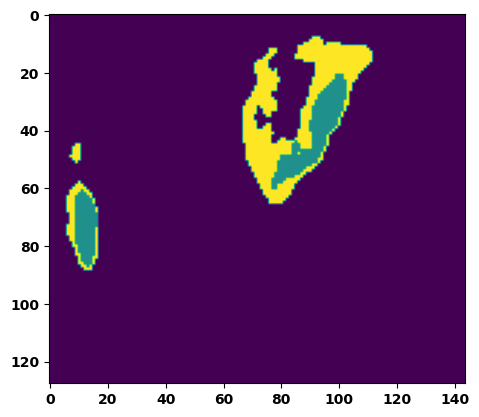

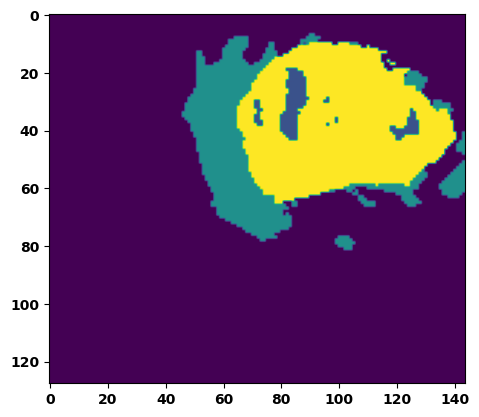

  6%|▌         | 2/36 [00:02<00:35,  1.05s/it]

Batch_id:  1 Eval loss:  0.7517942190170288
Batch_id:  1 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.7535138130187988
Batch_id:  2 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.00s/it]

Batch_id:  3 Eval loss:  0.8166356086730957
Batch_id:  3 Eval IoU:  tensor(0.1198, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6867, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4971, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8751, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.3908, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:30,  1.00it/s]

Batch_id:  4 Eval loss:  0.6021221876144409
Batch_id:  4 Eval IoU:  tensor(0.3123, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8970, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8060, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.01s/it]

Batch_id:  5 Eval loss:  0.7691524028778076
Batch_id:  5 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:28,  1.00it/s]

Batch_id:  6 Eval loss:  0.8780302405357361
Batch_id:  6 Eval IoU:  tensor(0.0692, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.5978, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3141, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9310, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.2031, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.02s/it]

Batch_id:  7 Eval loss:  0.7649686336517334
Batch_id:  7 Eval IoU:  tensor(0.2215, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9431, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8862, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.03s/it]

Batch_id:  8 Eval loss:  0.6699687838554382
Batch_id:  8 Eval IoU:  tensor(0.2799, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9052, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8192, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9523, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.03s/it]

Batch_id:  9 Eval loss:  0.8317173719406128
Batch_id:  9 Eval IoU:  tensor(0.1266, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7523, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.5081, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8871, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.6867, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  10 Eval loss:  0.21793857216835022
Batch_id:  10 Eval IoU:  tensor(0.7176, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


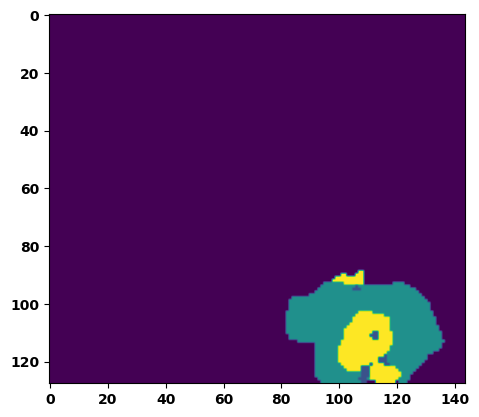

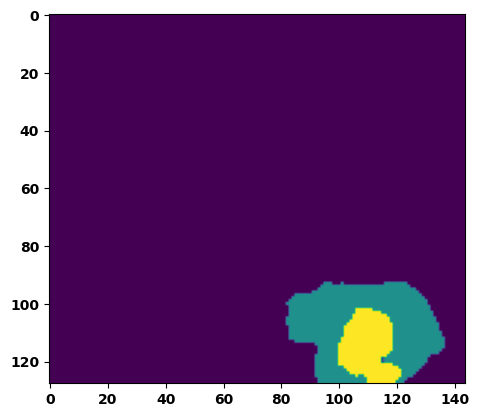

 33%|███▎      | 12/36 [00:12<00:26,  1.10s/it]

Batch_id:  11 Eval loss:  0.7571413516998291
Batch_id:  11 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:25,  1.09s/it]

Batch_id:  12 Eval loss:  0.576636552810669
Batch_id:  12 Eval IoU:  tensor(0.3385, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8882, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9692, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.07s/it]

Batch_id:  13 Eval loss:  0.6362583637237549
Batch_id:  13 Eval IoU:  tensor(0.2902, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8613, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9555, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.05s/it]

Batch_id:  14 Eval loss:  0.7626203298568726
Batch_id:  14 Eval IoU:  tensor(0.2227, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8873, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.03s/it]

Batch_id:  15 Eval loss:  0.76539146900177
Batch_id:  15 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.05s/it]

Batch_id:  16 Eval loss:  0.7592695951461792
Batch_id:  16 Eval IoU:  tensor(0.2293, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.03s/it]

Batch_id:  17 Eval loss:  0.6912136077880859
Batch_id:  17 Eval IoU:  tensor(0.2650, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9067, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9470, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.17816784977912903
Batch_id:  18 Eval IoU:  tensor(0.7322, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.05s/it]

Batch_id:  19 Eval loss:  0.7220418453216553
Batch_id:  19 Eval IoU:  tensor(0.1847, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7376, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5413, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9313, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8294, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.6483, device='cuda:0')
Batch_id:  20 Eval loss:  0.5991865396499634
Batch_id:  20 Eval IoU:  tensor(0.2977, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8411, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.7647, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.7534, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9299, device='cuda:0')


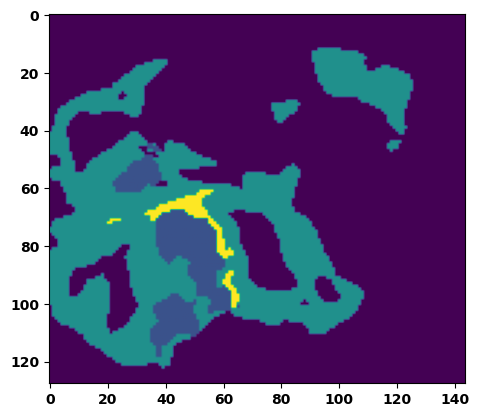

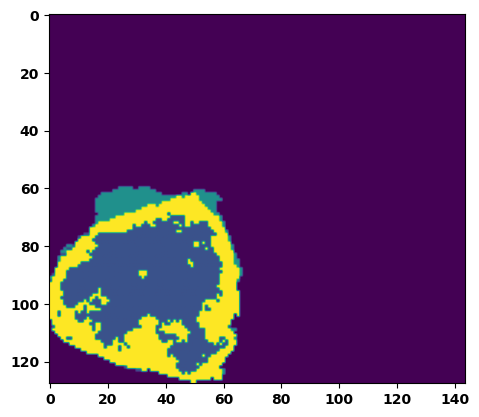

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.7855396866798401
Batch_id:  21 Eval IoU:  tensor(0.1877, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8755, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7509, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.8251, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.770658016204834
Batch_id:  22 Eval IoU:  tensor(0.2116, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9232, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8464, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9299, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.05s/it]

Batch_id:  23 Eval loss:  0.579796314239502
Batch_id:  23 Eval IoU:  tensor(0.3459, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.8499, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.06845153868198395
Batch_id:  24 Eval IoU:  tensor(0.8820, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.03s/it]

Batch_id:  25 Eval loss:  0.8112075924873352
Batch_id:  25 Eval IoU:  tensor(0.1231, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7021, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4598, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.4044, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.04s/it]

Batch_id:  26 Eval loss:  0.7562670707702637
Batch_id:  26 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.03s/it]

Batch_id:  27 Eval loss:  0.7611525058746338
Batch_id:  27 Eval IoU:  tensor(0.1466, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6662, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4206, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3595, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.03s/it]

Batch_id:  28 Eval loss:  0.7660534977912903
Batch_id:  28 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.02s/it]

Batch_id:  29 Eval loss:  0.7757340669631958
Batch_id:  29 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  30 Eval loss:  0.5446045398712158
Batch_id:  30 Eval IoU:  tensor(0.3522, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8962, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8954, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.8707, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9542, device='cuda:0')


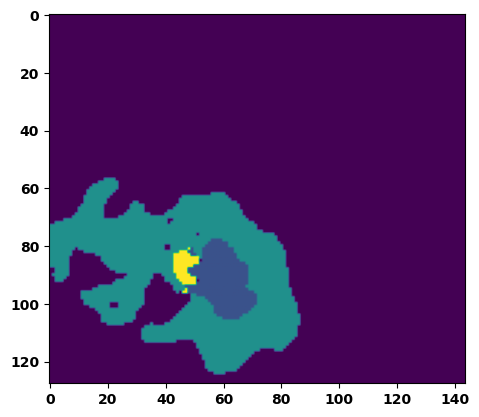

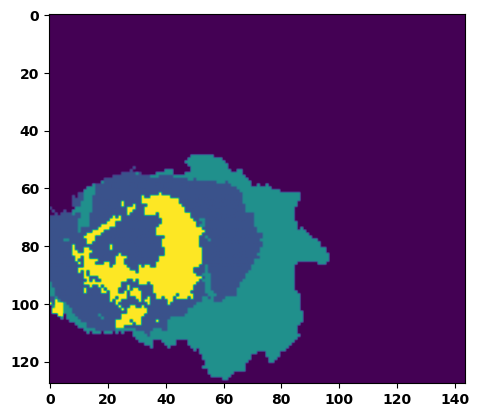

 89%|████████▉ | 32/36 [00:33<00:04,  1.06s/it]

Batch_id:  31 Eval loss:  0.2563857138156891
Batch_id:  31 Eval IoU:  tensor(0.6234, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9587, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.03s/it]

Batch_id:  32 Eval loss:  0.8815386891365051
Batch_id:  32 Eval IoU:  tensor(0.0755, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6230, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4202, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2463, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.04s/it]

Batch_id:  33 Eval loss:  0.8579686880111694
Batch_id:  33 Eval IoU:  tensor(0.0876, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6444, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3846, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.2889, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.04s/it]

Batch_id:  34 Eval loss:  0.43554624915122986
Batch_id:  34 Eval IoU:  tensor(0.4713, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.4094034433364868
Batch_id:  35 Eval IoU:  tensor(0.5081, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8659, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7471, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7570, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')
Epoch  43 Training loss:  0.13312479176304556
Epoch  43 Evaluation loss:  0.6590176444086764
Epoch  43 Training accuracy :  tensor(0.7999)
Epoch  43 Evaluation accuracy :  tensor(0.2901)
Epoch  43 Training Mean Dice Score:  tensor(0.9890)
Epoch  43 Eval Mean Dice Score:  tensor(0.8790)
Epoch  43 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  43 Eval Non-tumor Dice Score:  tensor(0.7941)
Epoch  43 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  43 Eval NCR/NET Dice Score:  tensor(0.9634)
Epoch  43 Training ED Dice Score:  tensor(0.98

Epoch: 44
Training in session: 


  1%|          | 1/110 [00:01<01:53,  1.04s/it]

Batch_id:  0 Training loss:  0.08616100251674652
Batch_id:  0 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:57,  1.09s/it]

Batch_id:  1 Training loss:  0.06077231466770172
Batch_id:  1 Training IoU:  tensor(0.8936, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:57,  1.10s/it]

Batch_id:  2 Training loss:  0.12670361995697021
Batch_id:  2 Training IoU:  tensor(0.7903, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:00,  1.14s/it]

Batch_id:  3 Training loss:  0.044513389468193054
Batch_id:  3 Training IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.13s/it]

Batch_id:  4 Training loss:  0.1933073103427887
Batch_id:  4 Training IoU:  tensor(0.7380, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:54,  1.11s/it]

Batch_id:  5 Training loss:  0.07765194773674011
Batch_id:  5 Training IoU:  tensor(0.8619, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:53,  1.10s/it]

Batch_id:  6 Training loss:  0.1306632161140442
Batch_id:  6 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:50,  1.08s/it]

Batch_id:  7 Training loss:  0.1255694031715393
Batch_id:  7 Training IoU:  tensor(0.8140, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:50,  1.10s/it]

Batch_id:  8 Training loss:  0.12684619426727295
Batch_id:  8 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:50,  1.10s/it]

Batch_id:  9 Training loss:  0.25036513805389404
Batch_id:  9 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 10%|█         | 11/110 [00:12<01:47,  1.09s/it]

Batch_id:  10 Training loss:  0.14457406103610992
Batch_id:  10 Training IoU:  tensor(0.7679, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 11%|█         | 12/110 [00:13<01:47,  1.10s/it]

Batch_id:  11 Training loss:  0.10461597144603729
Batch_id:  11 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:45,  1.09s/it]

Batch_id:  12 Training loss:  0.0568559467792511
Batch_id:  12 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:45,  1.10s/it]

Batch_id:  13 Training loss:  0.08274610340595245
Batch_id:  13 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.047005608677864075
Batch_id:  14 Training IoU:  tensor(0.9306, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.18512816727161407
Batch_id:  15 Training IoU:  tensor(0.7084, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:43,  1.11s/it]

Batch_id:  16 Training loss:  0.1484442949295044
Batch_id:  16 Training IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:42,  1.11s/it]

Batch_id:  17 Training loss:  0.13146518170833588
Batch_id:  17 Training IoU:  tensor(0.7905, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:40,  1.11s/it]

Batch_id:  18 Training loss:  0.15537816286087036
Batch_id:  18 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:40,  1.11s/it]

Batch_id:  19 Training loss:  0.09028463065624237
Batch_id:  19 Training IoU:  tensor(0.8535, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:40,  1.13s/it]

Batch_id:  20 Training loss:  0.05728307366371155
Batch_id:  20 Training IoU:  tensor(0.9019, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 20%|██        | 22/110 [00:24<01:37,  1.11s/it]

Batch_id:  21 Training loss:  0.34120798110961914
Batch_id:  21 Training IoU:  tensor(0.5648, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 21%|██        | 23/110 [00:25<01:35,  1.09s/it]

Batch_id:  22 Training loss:  0.1309676617383957
Batch_id:  22 Training IoU:  tensor(0.7825, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:35,  1.11s/it]

Batch_id:  23 Training loss:  0.08077989518642426
Batch_id:  23 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:33,  1.10s/it]

Batch_id:  24 Training loss:  0.31550338864326477
Batch_id:  24 Training IoU:  tensor(0.6606, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.25171053409576416
Batch_id:  25 Training IoU:  tensor(0.6281, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.0934562087059021
Batch_id:  26 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.10240820050239563
Batch_id:  27 Training IoU:  tensor(0.8454, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:29,  1.10s/it]

Batch_id:  28 Training loss:  0.447971910238266
Batch_id:  28 Training IoU:  tensor(0.4684, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:28,  1.10s/it]

Batch_id:  29 Training loss:  0.07432758808135986
Batch_id:  29 Training IoU:  tensor(0.8703, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.12813277542591095
Batch_id:  30 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:23,  1.07s/it]

Batch_id:  31 Training loss:  0.08392778038978577
Batch_id:  31 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 30%|███       | 33/110 [00:36<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.06343412399291992
Batch_id:  32 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 31%|███       | 34/110 [00:37<01:22,  1.08s/it]

Batch_id:  33 Training loss:  0.04877975583076477
Batch_id:  33 Training IoU:  tensor(0.9186, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 32%|███▏      | 35/110 [00:38<01:21,  1.08s/it]

Batch_id:  34 Training loss:  0.10894747078418732
Batch_id:  34 Training IoU:  tensor(0.8157, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 33%|███▎      | 36/110 [00:39<01:18,  1.07s/it]

Batch_id:  35 Training loss:  0.1477593183517456
Batch_id:  35 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 34%|███▎      | 37/110 [00:40<01:18,  1.08s/it]

Batch_id:  36 Training loss:  0.1661289781332016
Batch_id:  36 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 35%|███▍      | 38/110 [00:41<01:16,  1.07s/it]

Batch_id:  37 Training loss:  0.06271971762180328
Batch_id:  37 Training IoU:  tensor(0.8906, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.16433177888393402
Batch_id:  38 Training IoU:  tensor(0.7725, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:13,  1.06s/it]

Batch_id:  39 Training loss:  0.05972208082675934
Batch_id:  39 Training IoU:  tensor(0.8977, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:12,  1.06s/it]

Batch_id:  40 Training loss:  0.0892869085073471
Batch_id:  40 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.06988845765590668
Batch_id:  41 Training IoU:  tensor(0.8784, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.1342102587223053
Batch_id:  42 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 40%|████      | 44/110 [00:48<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.1694495677947998
Batch_id:  43 Training IoU:  tensor(0.7259, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 41%|████      | 45/110 [00:49<01:10,  1.09s/it]

Batch_id:  44 Training loss:  0.37840160727500916
Batch_id:  44 Training IoU:  tensor(0.5345, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 42%|████▏     | 46/110 [00:50<01:08,  1.07s/it]

Batch_id:  45 Training loss:  0.10838620364665985
Batch_id:  45 Training IoU:  tensor(0.8272, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 43%|████▎     | 47/110 [00:51<01:07,  1.07s/it]

Batch_id:  46 Training loss:  0.15678155422210693
Batch_id:  46 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 44%|████▎     | 48/110 [00:52<01:05,  1.06s/it]

Batch_id:  47 Training loss:  0.1968746930360794
Batch_id:  47 Training IoU:  tensor(0.6936, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 45%|████▍     | 49/110 [00:53<01:04,  1.06s/it]

Batch_id:  48 Training loss:  0.32892081141471863
Batch_id:  48 Training IoU:  tensor(0.6167, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.1250259131193161
Batch_id:  49 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:02,  1.06s/it]

Batch_id:  50 Training loss:  0.13074590265750885
Batch_id:  50 Training IoU:  tensor(0.7991, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:01,  1.05s/it]

Batch_id:  51 Training loss:  0.1265745908021927
Batch_id:  51 Training IoU:  tensor(0.8103, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 48%|████▊     | 53/110 [00:57<00:59,  1.04s/it]

Batch_id:  52 Training loss:  0.10067762434482574
Batch_id:  52 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 49%|████▉     | 54/110 [00:58<00:59,  1.07s/it]

Batch_id:  53 Training loss:  0.09556800127029419
Batch_id:  53 Training IoU:  tensor(0.8473, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.1796663999557495
Batch_id:  54 Training IoU:  tensor(0.7372, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.09s/it]

Batch_id:  55 Training loss:  0.06534874439239502
Batch_id:  55 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:57,  1.09s/it]

Batch_id:  56 Training loss:  0.08287432789802551
Batch_id:  56 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 53%|█████▎    | 58/110 [01:03<00:56,  1.08s/it]

Batch_id:  57 Training loss:  0.08643245697021484
Batch_id:  57 Training IoU:  tensor(0.8527, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 54%|█████▎    | 59/110 [01:04<00:55,  1.08s/it]

Batch_id:  58 Training loss:  0.14586207270622253
Batch_id:  58 Training IoU:  tensor(0.7648, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 55%|█████▍    | 60/110 [01:05<00:53,  1.08s/it]

Batch_id:  59 Training loss:  0.14765286445617676
Batch_id:  59 Training IoU:  tensor(0.7648, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 55%|█████▌    | 61/110 [01:06<00:54,  1.10s/it]

Batch_id:  60 Training loss:  0.20722851157188416
Batch_id:  60 Training IoU:  tensor(0.7127, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 56%|█████▋    | 62/110 [01:07<00:52,  1.10s/it]

Batch_id:  61 Training loss:  0.1473100185394287
Batch_id:  61 Training IoU:  tensor(0.7587, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.1566045582294464
Batch_id:  62 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.1246812492609024
Batch_id:  63 Training IoU:  tensor(0.8020, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.07s/it]

Batch_id:  64 Training loss:  0.061107903718948364
Batch_id:  64 Training IoU:  tensor(0.8970, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.082106813788414
Batch_id:  65 Training IoU:  tensor(0.8554, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.07s/it]

Batch_id:  66 Training loss:  0.21408113837242126
Batch_id:  66 Training IoU:  tensor(0.7086, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:45,  1.08s/it]

Batch_id:  67 Training loss:  0.15286153554916382
Batch_id:  67 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.10666289925575256
Batch_id:  68 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.3062782287597656
Batch_id:  69 Training IoU:  tensor(0.6620, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.1894112378358841
Batch_id:  70 Training IoU:  tensor(0.7266, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.13440804183483124
Batch_id:  71 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.13043120503425598
Batch_id:  72 Training IoU:  tensor(0.7815, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:39,  1.08s/it]

Batch_id:  73 Training loss:  0.07150305807590485
Batch_id:  73 Training IoU:  tensor(0.8751, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.10053512454032898
Batch_id:  74 Training IoU:  tensor(0.8404, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:37,  1.10s/it]

Batch_id:  75 Training loss:  0.08201192319393158
Batch_id:  75 Training IoU:  tensor(0.8645, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.09s/it]

Batch_id:  76 Training loss:  0.14978599548339844
Batch_id:  76 Training IoU:  tensor(0.7627, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:35,  1.10s/it]

Batch_id:  77 Training loss:  0.06594562530517578
Batch_id:  77 Training IoU:  tensor(0.8897, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.09s/it]

Batch_id:  78 Training loss:  0.18014249205589294
Batch_id:  78 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:32,  1.08s/it]

Batch_id:  79 Training loss:  0.07958193123340607
Batch_id:  79 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.0876295417547226
Batch_id:  80 Training IoU:  tensor(0.8508, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:29,  1.07s/it]

Batch_id:  81 Training loss:  0.15879635512828827
Batch_id:  81 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.10s/it]

Batch_id:  82 Training loss:  0.07936026155948639
Batch_id:  82 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:28,  1.10s/it]

Batch_id:  83 Training loss:  0.05296464264392853
Batch_id:  83 Training IoU:  tensor(0.9064, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:27,  1.09s/it]

Batch_id:  84 Training loss:  0.12624302506446838
Batch_id:  84 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:25,  1.07s/it]

Batch_id:  85 Training loss:  0.08197103440761566
Batch_id:  85 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:26,  1.17s/it]

Batch_id:  86 Training loss:  0.05794301629066467
Batch_id:  86 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:25,  1.15s/it]

Batch_id:  87 Training loss:  0.3448512852191925
Batch_id:  87 Training IoU:  tensor(0.6034, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:23,  1.12s/it]

Batch_id:  88 Training loss:  0.09417147934436798
Batch_id:  88 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.0808180719614029
Batch_id:  89 Training IoU:  tensor(0.8691, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.3447578549385071
Batch_id:  90 Training IoU:  tensor(0.5375, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.16s/it]

Batch_id:  91 Training loss:  0.20345762372016907
Batch_id:  91 Training IoU:  tensor(0.6956, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:19,  1.14s/it]

Batch_id:  92 Training loss:  0.18126936256885529
Batch_id:  92 Training IoU:  tensor(0.7121, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:18,  1.13s/it]

Batch_id:  93 Training loss:  0.064690500497818
Batch_id:  93 Training IoU:  tensor(0.8976, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:17,  1.14s/it]

Batch_id:  94 Training loss:  0.08467361330986023
Batch_id:  94 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.12s/it]

Batch_id:  95 Training loss:  0.06284625828266144
Batch_id:  95 Training IoU:  tensor(0.8919, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 88%|████████▊ | 97/110 [01:46<00:14,  1.13s/it]

Batch_id:  96 Training loss:  0.0742025077342987
Batch_id:  96 Training IoU:  tensor(0.8680, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 89%|████████▉ | 98/110 [01:47<00:14,  1.20s/it]

Batch_id:  97 Training loss:  0.2302892804145813
Batch_id:  97 Training IoU:  tensor(0.6851, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 90%|█████████ | 99/110 [01:48<00:12,  1.18s/it]

Batch_id:  98 Training loss:  0.10003691911697388
Batch_id:  98 Training IoU:  tensor(0.8979, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:11,  1.15s/it]

Batch_id:  99 Training loss:  0.06166394054889679
Batch_id:  99 Training IoU:  tensor(0.8917, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:10,  1.15s/it]

Batch_id:  100 Training loss:  0.04910048842430115
Batch_id:  100 Training IoU:  tensor(0.9139, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:09,  1.15s/it]

Batch_id:  101 Training loss:  0.13950718939304352
Batch_id:  101 Training IoU:  tensor(0.8036, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 94%|█████████▎| 103/110 [01:53<00:08,  1.15s/it]

Batch_id:  102 Training loss:  0.15607787668704987
Batch_id:  102 Training IoU:  tensor(0.7792, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 95%|█████████▍| 104/110 [01:54<00:06,  1.11s/it]

Batch_id:  103 Training loss:  0.13937409222126007
Batch_id:  103 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 95%|█████████▌| 105/110 [01:55<00:05,  1.11s/it]

Batch_id:  104 Training loss:  0.14425015449523926
Batch_id:  104 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 96%|█████████▋| 106/110 [01:56<00:04,  1.09s/it]

Batch_id:  105 Training loss:  0.11006128787994385
Batch_id:  105 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 97%|█████████▋| 107/110 [01:57<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.11846087872982025
Batch_id:  106 Training IoU:  tensor(0.8020, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 98%|█████████▊| 108/110 [01:58<00:02,  1.08s/it]

Batch_id:  107 Training loss:  0.0933094322681427
Batch_id:  107 Training IoU:  tensor(0.8421, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.05054444074630737
Batch_id:  108 Training IoU:  tensor(0.9140, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.10s/it]


Batch_id:  109 Training loss:  0.07890354096889496
Batch_id:  109 Training IoU:  tensor(0.8610, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9933, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7011939883232117
Batch_id:  0 Eval IoU:  tensor(0.2658, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8164, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9441, device='cuda:0')


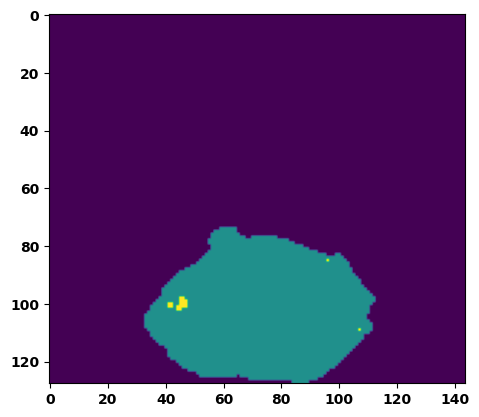

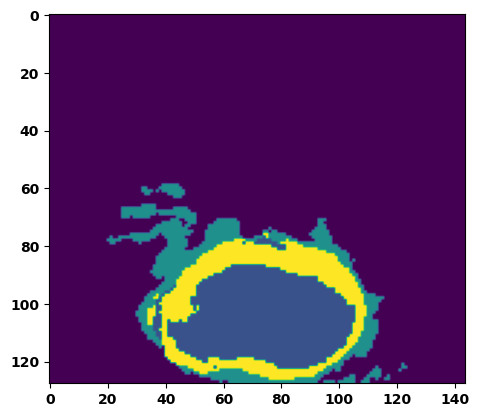

  6%|▌         | 2/36 [00:02<00:37,  1.09s/it]

Batch_id:  1 Eval loss:  0.8216264247894287
Batch_id:  1 Eval IoU:  tensor(0.1351, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7642, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.5412, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.6509, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:36,  1.09s/it]

Batch_id:  2 Eval loss:  0.132229745388031
Batch_id:  2 Eval IoU:  tensor(0.8062, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.06s/it]

Batch_id:  3 Eval loss:  0.7296031713485718
Batch_id:  3 Eval IoU:  tensor(0.1679, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6628, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4047, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.3729, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:33,  1.07s/it]

Batch_id:  4 Eval loss:  0.8420780897140503
Batch_id:  4 Eval IoU:  tensor(0.0956, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6438, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3815, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2884, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:31,  1.05s/it]

Batch_id:  5 Eval loss:  0.46795326471328735
Batch_id:  5 Eval IoU:  tensor(0.4255, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9777, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.7535154223442078
Batch_id:  6 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.29396581649780273
Batch_id:  7 Eval IoU:  tensor(0.6363, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9927, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.05s/it]

Batch_id:  8 Eval loss:  0.765395998954773
Batch_id:  8 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:28,  1.09s/it]

Batch_id:  9 Eval loss:  0.03859946131706238
Batch_id:  9 Eval IoU:  tensor(0.9320, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  10 Eval loss:  0.8834387063980103
Batch_id:  10 Eval IoU:  tensor(0.0740, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6205, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4151, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.2410, device='cuda:0')


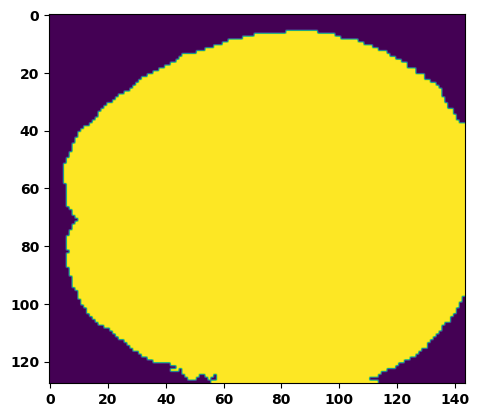

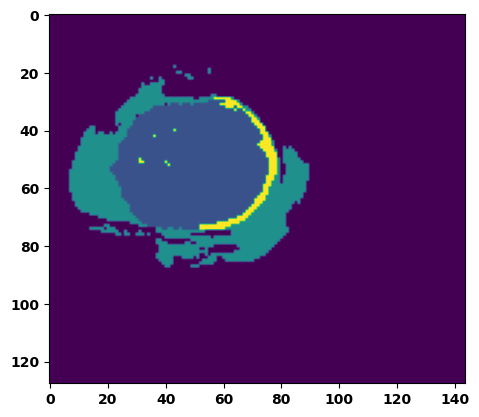

 33%|███▎      | 12/36 [00:13<00:27,  1.13s/it]

Batch_id:  11 Eval loss:  0.7522323131561279
Batch_id:  11 Eval IoU:  tensor(0.2330, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9140, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 36%|███▌      | 13/36 [00:14<00:25,  1.12s/it]

Batch_id:  12 Eval loss:  0.5604858994483948
Batch_id:  12 Eval IoU:  tensor(0.3973, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 39%|███▉      | 14/36 [00:15<00:24,  1.10s/it]

Batch_id:  13 Eval loss:  0.8096219301223755
Batch_id:  13 Eval IoU:  tensor(0.1125, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6044, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3147, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9264, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.2341, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.11s/it]

Batch_id:  14 Eval loss:  0.7349761128425598
Batch_id:  14 Eval IoU:  tensor(0.1654, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.7040, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4450, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9164, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.6804, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.7744, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:22,  1.11s/it]

Batch_id:  15 Eval loss:  0.7572734951972961
Batch_id:  15 Eval IoU:  tensor(0.1590, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7082, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5323, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.7931, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.5811, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9261, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.09s/it]

Batch_id:  16 Eval loss:  0.7079124450683594
Batch_id:  16 Eval IoU:  tensor(0.2332, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8641, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7771, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.7662, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.08s/it]

Batch_id:  17 Eval loss:  0.535834789276123
Batch_id:  17 Eval IoU:  tensor(0.3741, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.8971, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8375, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9507, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.09s/it]

Batch_id:  18 Eval loss:  0.7621614933013916
Batch_id:  18 Eval IoU:  tensor(0.2102, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9067, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8135, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.06s/it]

Batch_id:  19 Eval loss:  0.7634625434875488
Batch_id:  19 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  20 Eval loss:  0.34349915385246277
Batch_id:  20 Eval IoU:  tensor(0.5618, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9832, device='cuda:0')


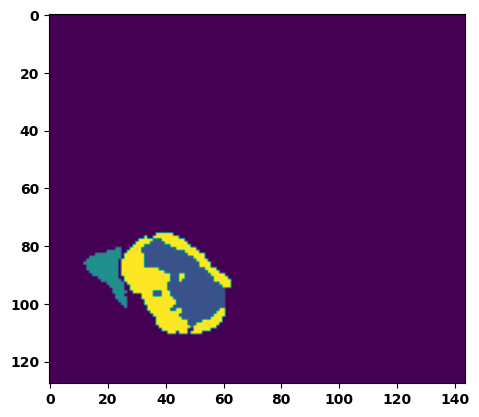

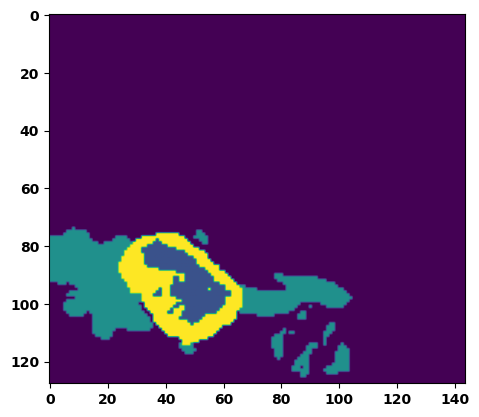

 61%|██████    | 22/36 [00:24<00:16,  1.16s/it]

Batch_id:  21 Eval loss:  0.40866559743881226
Batch_id:  21 Eval IoU:  tensor(0.5043, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8682, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7400, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.7724, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 64%|██████▍   | 23/36 [00:25<00:14,  1.14s/it]

Batch_id:  22 Eval loss:  0.7571477293968201
Batch_id:  22 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 67%|██████▋   | 24/36 [00:26<00:13,  1.16s/it]

Batch_id:  23 Eval loss:  0.7691470980644226
Batch_id:  23 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.11s/it]

Batch_id:  24 Eval loss:  0.7545886039733887
Batch_id:  24 Eval IoU:  tensor(0.1745, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.7605, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.5245, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8925, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.6705, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.7373520731925964
Batch_id:  25 Eval IoU:  tensor(0.2470, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.06s/it]

Batch_id:  26 Eval loss:  0.7637871503829956
Batch_id:  26 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.05s/it]

Batch_id:  27 Eval loss:  0.22402870655059814
Batch_id:  27 Eval IoU:  tensor(0.6568, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9718, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.04s/it]

Batch_id:  28 Eval loss:  0.6829143166542053
Batch_id:  28 Eval IoU:  tensor(0.2715, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9206, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9442, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.04s/it]

Batch_id:  29 Eval loss:  0.7660595774650574
Batch_id:  29 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  30 Eval loss:  0.4182285666465759
Batch_id:  30 Eval IoU:  tensor(0.4589, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9619, device='cuda:0')


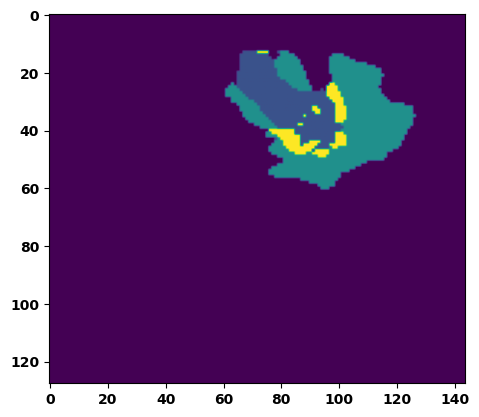

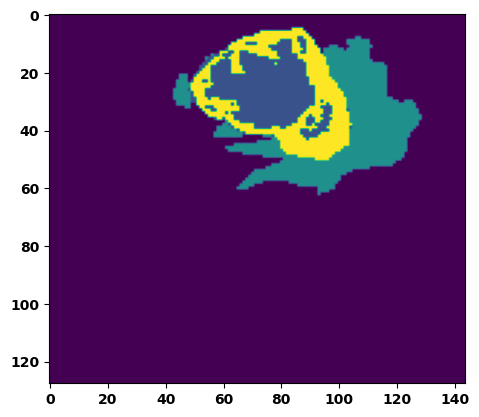

 89%|████████▉ | 32/36 [00:34<00:04,  1.08s/it]

Batch_id:  31 Eval loss:  0.7517976760864258
Batch_id:  31 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 92%|█████████▏| 33/36 [00:36<00:03,  1.08s/it]

Batch_id:  32 Eval loss:  0.8122405409812927
Batch_id:  32 Eval IoU:  tensor(0.1222, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7008, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4571, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.4019, device='cuda:0')


 94%|█████████▍| 34/36 [00:37<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.7590655088424683
Batch_id:  33 Eval IoU:  tensor(0.2098, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8788, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8196, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 97%|█████████▋| 35/36 [00:38<00:01,  1.08s/it]

Batch_id:  34 Eval loss:  0.4999356269836426
Batch_id:  34 Eval IoU:  tensor(0.4065, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9080, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8625, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8551, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9263, device='cuda:0')


100%|██████████| 36/36 [00:39<00:00,  1.09s/it]

Batch_id:  35 Eval loss:  0.8028735518455505
Batch_id:  35 Eval IoU:  tensor(0.1277, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6896, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4995, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8748, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.4033, device='cuda:0')
Epoch  44 Training loss:  0.13283714814619585
Epoch  44 Evaluation loss:  0.6406914608346091
Epoch  44 Training accuracy :  tensor(0.8001)
Epoch  44 Evaluation accuracy :  tensor(0.3052)
Epoch  44 Training Mean Dice Score:  tensor(0.9890)
Epoch  44 Eval Mean Dice Score:  tensor(0.8731)
Epoch  44 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  44 Eval Non-tumor Dice Score:  tensor(0.7831)
Epoch  44 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  44 Eval NCR/NET Dice Score:  tensor(0.9611)
Epoch  44 Training ED Dice Score:  tensor(0.98

Epoch: 45
Training in session: 


  1%|          | 1/110 [00:01<01:58,  1.09s/it]

Batch_id:  0 Training loss:  0.08268187940120697
Batch_id:  0 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:01,  1.12s/it]

Batch_id:  1 Training loss:  0.1853497475385666
Batch_id:  1 Training IoU:  tensor(0.7078, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  3%|▎         | 3/110 [00:03<02:02,  1.15s/it]

Batch_id:  2 Training loss:  0.37215548753738403
Batch_id:  2 Training IoU:  tensor(0.5418, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  4%|▎         | 4/110 [00:04<02:00,  1.14s/it]

Batch_id:  3 Training loss:  0.33913570642471313
Batch_id:  3 Training IoU:  tensor(0.5660, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:59,  1.14s/it]

Batch_id:  4 Training loss:  0.057785749435424805
Batch_id:  4 Training IoU:  tensor(0.8999, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:57,  1.13s/it]

Batch_id:  5 Training loss:  0.15213263034820557
Batch_id:  5 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:56,  1.13s/it]

Batch_id:  6 Training loss:  0.05694030225276947
Batch_id:  6 Training IoU:  tensor(0.9028, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.10s/it]

Batch_id:  7 Training loss:  0.15008877217769623
Batch_id:  7 Training IoU:  tensor(0.7589, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:48,  1.08s/it]

Batch_id:  8 Training loss:  0.32786181569099426
Batch_id:  8 Training IoU:  tensor(0.6189, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


  9%|▉         | 10/110 [00:11<01:47,  1.08s/it]

Batch_id:  9 Training loss:  0.1392599493265152
Batch_id:  9 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 10%|█         | 11/110 [00:12<01:48,  1.10s/it]

Batch_id:  10 Training loss:  0.09374594688415527
Batch_id:  10 Training IoU:  tensor(0.8366, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 11%|█         | 12/110 [00:13<01:50,  1.13s/it]

Batch_id:  11 Training loss:  0.060049235820770264
Batch_id:  11 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:48,  1.12s/it]

Batch_id:  12 Training loss:  0.08075836300849915
Batch_id:  12 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:47,  1.12s/it]

Batch_id:  13 Training loss:  0.07447792589664459
Batch_id:  13 Training IoU:  tensor(0.8705, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:45,  1.11s/it]

Batch_id:  14 Training loss:  0.10743947327136993
Batch_id:  14 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:42,  1.09s/it]

Batch_id:  15 Training loss:  0.0813731849193573
Batch_id:  15 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:41,  1.09s/it]

Batch_id:  16 Training loss:  0.1689995676279068
Batch_id:  16 Training IoU:  tensor(0.7267, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:40,  1.09s/it]

Batch_id:  17 Training loss:  0.18951869010925293
Batch_id:  17 Training IoU:  tensor(0.7259, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 17%|█▋        | 19/110 [00:21<01:39,  1.10s/it]

Batch_id:  18 Training loss:  0.0629151314496994
Batch_id:  18 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 18%|█▊        | 20/110 [00:22<01:39,  1.10s/it]

Batch_id:  19 Training loss:  0.09617505967617035
Batch_id:  19 Training IoU:  tensor(0.8444, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 19%|█▉        | 21/110 [00:23<01:38,  1.10s/it]

Batch_id:  20 Training loss:  0.2503677010536194
Batch_id:  20 Training IoU:  tensor(0.6295, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 20%|██        | 22/110 [00:24<01:39,  1.13s/it]

Batch_id:  21 Training loss:  0.30603575706481934
Batch_id:  21 Training IoU:  tensor(0.6627, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 21%|██        | 23/110 [00:25<01:37,  1.12s/it]

Batch_id:  22 Training loss:  0.0925244390964508
Batch_id:  22 Training IoU:  tensor(0.8436, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:36,  1.12s/it]

Batch_id:  23 Training loss:  0.14547352492809296
Batch_id:  23 Training IoU:  tensor(0.7667, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:34,  1.11s/it]

Batch_id:  24 Training loss:  0.13021224737167358
Batch_id:  24 Training IoU:  tensor(0.7822, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:33,  1.11s/it]

Batch_id:  25 Training loss:  0.14734160900115967
Batch_id:  25 Training IoU:  tensor(0.7655, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:32,  1.11s/it]

Batch_id:  26 Training loss:  0.1644541621208191
Batch_id:  26 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 25%|██▌       | 28/110 [00:31<01:30,  1.10s/it]

Batch_id:  27 Training loss:  0.04999329149723053
Batch_id:  27 Training IoU:  tensor(0.9150, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 26%|██▋       | 29/110 [00:32<01:30,  1.12s/it]

Batch_id:  28 Training loss:  0.19270528852939606
Batch_id:  28 Training IoU:  tensor(0.7393, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 27%|██▋       | 30/110 [00:33<01:29,  1.12s/it]

Batch_id:  29 Training loss:  0.04449714720249176
Batch_id:  29 Training IoU:  tensor(0.9196, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 28%|██▊       | 31/110 [00:34<01:28,  1.12s/it]

Batch_id:  30 Training loss:  0.06673556566238403
Batch_id:  30 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 29%|██▉       | 32/110 [00:35<01:29,  1.15s/it]

Batch_id:  31 Training loss:  0.062046974897384644
Batch_id:  31 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 30%|███       | 33/110 [00:36<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.08053231239318848
Batch_id:  32 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 31%|███       | 34/110 [00:37<01:25,  1.13s/it]

Batch_id:  33 Training loss:  0.15632621943950653
Batch_id:  33 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 32%|███▏      | 35/110 [00:39<01:24,  1.13s/it]

Batch_id:  34 Training loss:  0.1235504150390625
Batch_id:  34 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 33%|███▎      | 36/110 [00:40<01:21,  1.10s/it]

Batch_id:  35 Training loss:  0.08576016128063202
Batch_id:  35 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 34%|███▎      | 37/110 [00:41<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.08443596959114075
Batch_id:  36 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 35%|███▍      | 38/110 [00:42<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.17875894904136658
Batch_id:  37 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 35%|███▌      | 39/110 [00:43<01:20,  1.13s/it]

Batch_id:  38 Training loss:  0.20711009204387665
Batch_id:  38 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 36%|███▋      | 40/110 [00:44<01:19,  1.14s/it]

Batch_id:  39 Training loss:  0.07950219511985779
Batch_id:  39 Training IoU:  tensor(0.8604, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 37%|███▋      | 41/110 [00:45<01:18,  1.14s/it]

Batch_id:  40 Training loss:  0.1461401730775833
Batch_id:  40 Training IoU:  tensor(0.7638, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9726, device='cuda:0')


 38%|███▊      | 42/110 [00:46<01:16,  1.13s/it]

Batch_id:  41 Training loss:  0.049114301800727844
Batch_id:  41 Training IoU:  tensor(0.9140, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 39%|███▉      | 43/110 [00:47<01:16,  1.14s/it]

Batch_id:  42 Training loss:  0.08908474445343018
Batch_id:  42 Training IoU:  tensor(0.8455, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 40%|████      | 44/110 [00:49<01:14,  1.14s/it]

Batch_id:  43 Training loss:  0.13486622273921967
Batch_id:  43 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 41%|████      | 45/110 [00:50<01:14,  1.15s/it]

Batch_id:  44 Training loss:  0.10138179361820221
Batch_id:  44 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 42%|████▏     | 46/110 [00:51<01:13,  1.15s/it]

Batch_id:  45 Training loss:  0.0733356922864914
Batch_id:  45 Training IoU:  tensor(0.8693, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 43%|████▎     | 47/110 [00:52<01:11,  1.14s/it]

Batch_id:  46 Training loss:  0.10496196150779724
Batch_id:  46 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 44%|████▎     | 48/110 [00:53<01:09,  1.11s/it]

Batch_id:  47 Training loss:  0.10146844387054443
Batch_id:  47 Training IoU:  tensor(0.8407, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 45%|████▍     | 49/110 [00:54<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.10760155320167542
Batch_id:  48 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 45%|████▌     | 50/110 [00:55<01:05,  1.10s/it]

Batch_id:  49 Training loss:  0.07154490053653717
Batch_id:  49 Training IoU:  tensor(0.8752, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 46%|████▋     | 51/110 [00:56<01:06,  1.13s/it]

Batch_id:  50 Training loss:  0.12471520900726318
Batch_id:  50 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 47%|████▋     | 52/110 [00:58<01:04,  1.12s/it]

Batch_id:  51 Training loss:  0.44744208455085754
Batch_id:  51 Training IoU:  tensor(0.4693, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 48%|████▊     | 53/110 [00:59<01:04,  1.13s/it]

Batch_id:  52 Training loss:  0.0821145623922348
Batch_id:  52 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 49%|████▉     | 54/110 [01:00<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.14721211791038513
Batch_id:  53 Training IoU:  tensor(0.7610, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 50%|█████     | 55/110 [01:01<01:00,  1.10s/it]

Batch_id:  54 Training loss:  0.07926961779594421
Batch_id:  54 Training IoU:  tensor(0.8591, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 51%|█████     | 56/110 [01:02<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.08399917185306549
Batch_id:  55 Training IoU:  tensor(0.8554, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 52%|█████▏    | 57/110 [01:03<00:56,  1.07s/it]

Batch_id:  56 Training loss:  0.16797733306884766
Batch_id:  56 Training IoU:  tensor(0.7399, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 53%|█████▎    | 58/110 [01:04<00:59,  1.15s/it]

Batch_id:  57 Training loss:  0.10005030035972595
Batch_id:  57 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 54%|█████▎    | 59/110 [01:05<00:56,  1.11s/it]

Batch_id:  58 Training loss:  0.13242647051811218
Batch_id:  58 Training IoU:  tensor(0.7806, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 55%|█████▍    | 60/110 [01:06<00:55,  1.11s/it]

Batch_id:  59 Training loss:  0.06368388235569
Batch_id:  59 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 55%|█████▌    | 61/110 [01:07<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.11018022894859314
Batch_id:  60 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 56%|█████▋    | 62/110 [01:09<00:52,  1.09s/it]

Batch_id:  61 Training loss:  0.14678625762462616
Batch_id:  61 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 57%|█████▋    | 63/110 [01:10<00:50,  1.08s/it]

Batch_id:  62 Training loss:  0.14362269639968872
Batch_id:  62 Training IoU:  tensor(0.7839, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 58%|█████▊    | 64/110 [01:11<00:49,  1.07s/it]

Batch_id:  63 Training loss:  0.10986098647117615
Batch_id:  63 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 59%|█████▉    | 65/110 [01:12<00:47,  1.06s/it]

Batch_id:  64 Training loss:  0.15848131477832794
Batch_id:  64 Training IoU:  tensor(0.7447, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 60%|██████    | 66/110 [01:13<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.21494610607624054
Batch_id:  65 Training IoU:  tensor(0.7077, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 61%|██████    | 67/110 [01:14<00:45,  1.06s/it]

Batch_id:  66 Training loss:  0.12670305371284485
Batch_id:  66 Training IoU:  tensor(0.8100, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 62%|██████▏   | 68/110 [01:15<00:44,  1.06s/it]

Batch_id:  67 Training loss:  0.15504741668701172
Batch_id:  67 Training IoU:  tensor(0.7542, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 63%|██████▎   | 69/110 [01:16<00:44,  1.09s/it]

Batch_id:  68 Training loss:  0.09325002133846283
Batch_id:  68 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 64%|██████▎   | 70/110 [01:17<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.12710091471672058
Batch_id:  69 Training IoU:  tensor(0.7844, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 65%|██████▍   | 71/110 [01:18<00:43,  1.11s/it]

Batch_id:  70 Training loss:  0.10205274820327759
Batch_id:  70 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 65%|██████▌   | 72/110 [01:19<00:41,  1.10s/it]

Batch_id:  71 Training loss:  0.12918546795845032
Batch_id:  71 Training IoU:  tensor(0.7821, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 66%|██████▋   | 73/110 [01:20<00:40,  1.08s/it]

Batch_id:  72 Training loss:  0.048302456736564636
Batch_id:  72 Training IoU:  tensor(0.9199, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 67%|██████▋   | 74/110 [01:21<00:38,  1.07s/it]

Batch_id:  73 Training loss:  0.07920238375663757
Batch_id:  73 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 68%|██████▊   | 75/110 [01:23<00:37,  1.09s/it]

Batch_id:  74 Training loss:  0.08771076798439026
Batch_id:  74 Training IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 69%|██████▉   | 76/110 [01:24<00:40,  1.18s/it]

Batch_id:  75 Training loss:  0.1535342037677765
Batch_id:  75 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 70%|███████   | 77/110 [01:25<00:38,  1.16s/it]

Batch_id:  76 Training loss:  0.04712750017642975
Batch_id:  76 Training IoU:  tensor(0.9304, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 71%|███████   | 78/110 [01:26<00:36,  1.15s/it]

Batch_id:  77 Training loss:  0.3170660734176636
Batch_id:  77 Training IoU:  tensor(0.6568, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 72%|███████▏  | 79/110 [01:27<00:34,  1.11s/it]

Batch_id:  78 Training loss:  0.08084961771965027
Batch_id:  78 Training IoU:  tensor(0.8690, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 73%|███████▎  | 80/110 [01:28<00:33,  1.11s/it]

Batch_id:  79 Training loss:  0.1360737681388855
Batch_id:  79 Training IoU:  tensor(0.7859, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 74%|███████▎  | 81/110 [01:29<00:32,  1.11s/it]

Batch_id:  80 Training loss:  0.2510144114494324
Batch_id:  80 Training IoU:  tensor(0.6846, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 75%|███████▍  | 82/110 [01:31<00:31,  1.13s/it]

Batch_id:  81 Training loss:  0.07003340125083923
Batch_id:  81 Training IoU:  tensor(0.8775, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 75%|███████▌  | 83/110 [01:32<00:30,  1.12s/it]

Batch_id:  82 Training loss:  0.12711398303508759
Batch_id:  82 Training IoU:  tensor(0.8089, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 76%|███████▋  | 84/110 [01:33<00:29,  1.12s/it]

Batch_id:  83 Training loss:  0.07901102304458618
Batch_id:  83 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 77%|███████▋  | 85/110 [01:34<00:27,  1.10s/it]

Batch_id:  84 Training loss:  0.05702023208141327
Batch_id:  84 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 78%|███████▊  | 86/110 [01:35<00:26,  1.10s/it]

Batch_id:  85 Training loss:  0.1403413861989975
Batch_id:  85 Training IoU:  tensor(0.7812, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 79%|███████▉  | 87/110 [01:36<00:26,  1.16s/it]

Batch_id:  86 Training loss:  0.18011489510536194
Batch_id:  86 Training IoU:  tensor(0.7369, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 80%|████████  | 88/110 [01:37<00:24,  1.13s/it]

Batch_id:  87 Training loss:  0.0651320368051529
Batch_id:  87 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 81%|████████  | 89/110 [01:38<00:23,  1.14s/it]

Batch_id:  88 Training loss:  0.052877604961395264
Batch_id:  88 Training IoU:  tensor(0.9066, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 82%|████████▏ | 90/110 [01:40<00:22,  1.12s/it]

Batch_id:  89 Training loss:  0.12929876148700714
Batch_id:  89 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 83%|████████▎ | 91/110 [01:41<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.11747536063194275
Batch_id:  90 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 84%|████████▎ | 92/110 [01:42<00:20,  1.13s/it]

Batch_id:  91 Training loss:  0.06052447855472565
Batch_id:  91 Training IoU:  tensor(0.8947, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 85%|████████▍ | 93/110 [01:43<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.059507861733436584
Batch_id:  92 Training IoU:  tensor(0.8979, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 85%|████████▌ | 94/110 [01:44<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.09018176794052124
Batch_id:  93 Training IoU:  tensor(0.8531, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 86%|████████▋ | 95/110 [01:45<00:17,  1.16s/it]

Batch_id:  94 Training loss:  0.23004736006259918
Batch_id:  94 Training IoU:  tensor(0.6859, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 87%|████████▋ | 96/110 [01:46<00:15,  1.12s/it]

Batch_id:  95 Training loss:  0.34325742721557617
Batch_id:  95 Training IoU:  tensor(0.5386, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 88%|████████▊ | 97/110 [01:47<00:14,  1.11s/it]

Batch_id:  96 Training loss:  0.1808691769838333
Batch_id:  96 Training IoU:  tensor(0.7127, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 89%|████████▉ | 98/110 [01:49<00:13,  1.12s/it]

Batch_id:  97 Training loss:  0.13236957788467407
Batch_id:  97 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 90%|█████████ | 99/110 [01:50<00:12,  1.10s/it]

Batch_id:  98 Training loss:  0.20442534983158112
Batch_id:  98 Training IoU:  tensor(0.6945, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 91%|█████████ | 100/110 [01:51<00:10,  1.10s/it]

Batch_id:  99 Training loss:  0.08210647106170654
Batch_id:  99 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 92%|█████████▏| 101/110 [01:52<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.12620913982391357
Batch_id:  100 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 93%|█████████▎| 102/110 [01:53<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.16090334951877594
Batch_id:  101 Training IoU:  tensor(0.8074, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 94%|█████████▎| 103/110 [01:54<00:08,  1.16s/it]

Batch_id:  102 Training loss:  0.06470289826393127
Batch_id:  102 Training IoU:  tensor(0.8965, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 95%|█████████▍| 104/110 [01:55<00:07,  1.18s/it]

Batch_id:  103 Training loss:  0.3436574339866638
Batch_id:  103 Training IoU:  tensor(0.6044, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 95%|█████████▌| 105/110 [01:56<00:05,  1.14s/it]

Batch_id:  104 Training loss:  0.12737245857715607
Batch_id:  104 Training IoU:  tensor(0.7891, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 96%|█████████▋| 106/110 [01:57<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.06272165477275848
Batch_id:  105 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 97%|█████████▋| 107/110 [01:58<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.13065527379512787
Batch_id:  106 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 98%|█████████▊| 108/110 [01:59<00:02,  1.06s/it]

Batch_id:  107 Training loss:  0.1972716897726059
Batch_id:  107 Training IoU:  tensor(0.6938, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 99%|█████████▉| 109/110 [02:00<00:01,  1.05s/it]

Batch_id:  108 Training loss:  0.0863497257232666
Batch_id:  108 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


100%|██████████| 110/110 [02:01<00:00,  1.11s/it]


Batch_id:  109 Training loss:  0.15001465380191803
Batch_id:  109 Training IoU:  tensor(0.7624, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9819, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.2627524733543396
Batch_id:  0 Eval IoU:  tensor(0.6723, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')


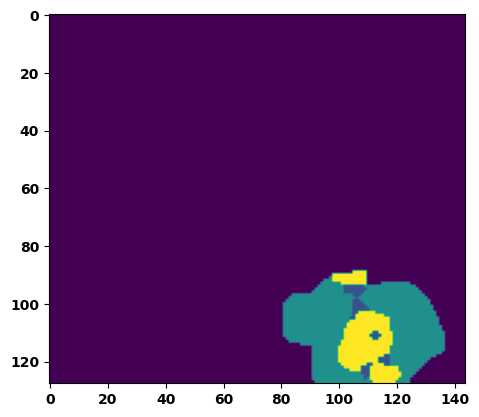

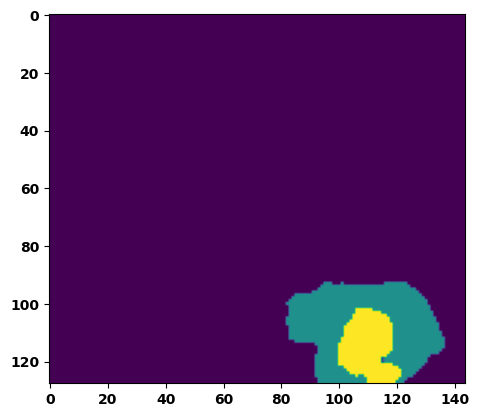

  6%|▌         | 2/36 [00:02<00:35,  1.05s/it]

Batch_id:  1 Eval loss:  0.8791061639785767
Batch_id:  1 Eval IoU:  tensor(0.0686, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.5969, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.3122, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2070, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.02s/it]

Batch_id:  2 Eval loss:  0.6907027959823608
Batch_id:  2 Eval IoU:  tensor(0.2753, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.01s/it]

Batch_id:  3 Eval loss:  0.32570403814315796
Batch_id:  3 Eval IoU:  tensor(0.5402, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:30,  1.01it/s]

Batch_id:  4 Eval loss:  0.7637658715248108
Batch_id:  4 Eval IoU:  tensor(0.2236, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:29,  1.02it/s]

Batch_id:  5 Eval loss:  0.884631872177124
Batch_id:  5 Eval IoU:  tensor(0.0730, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6189, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4120, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2379, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:28,  1.00it/s]

Batch_id:  6 Eval loss:  0.3794344961643219
Batch_id:  6 Eval IoU:  tensor(0.5354, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.01s/it]

Batch_id:  7 Eval loss:  0.7571451663970947
Batch_id:  7 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.04s/it]

Batch_id:  8 Eval loss:  0.6710634827613831
Batch_id:  8 Eval IoU:  tensor(0.2837, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9697, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.03s/it]

Batch_id:  9 Eval loss:  0.7691476345062256
Batch_id:  9 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  10 Eval loss:  0.7736111283302307
Batch_id:  10 Eval IoU:  tensor(0.1389, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6811, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4254, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.6856, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.6775, device='cuda:0')


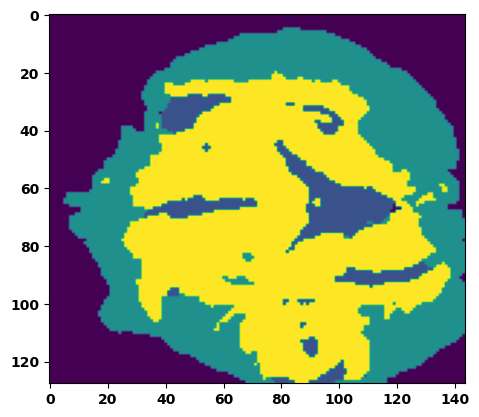

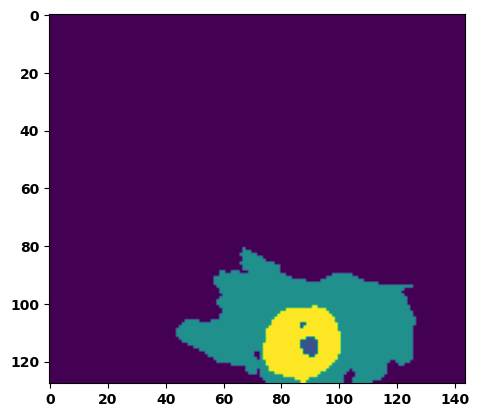

 33%|███▎      | 12/36 [00:12<00:24,  1.04s/it]

Batch_id:  11 Eval loss:  0.8165394067764282
Batch_id:  11 Eval IoU:  tensor(0.1192, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6849, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4931, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8712, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.3915, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.05s/it]

Batch_id:  12 Eval loss:  0.6863471269607544
Batch_id:  12 Eval IoU:  tensor(0.2057, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7181, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.5467, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.8584, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.5371, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9303, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.03s/it]

Batch_id:  13 Eval loss:  0.8340510129928589
Batch_id:  13 Eval IoU:  tensor(0.1193, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7300, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4745, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9053, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.6129, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.05s/it]

Batch_id:  14 Eval loss:  0.4137647747993469
Batch_id:  14 Eval IoU:  tensor(0.5003, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8602, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7229, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.7488, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.03s/it]

Batch_id:  15 Eval loss:  0.7030683159828186
Batch_id:  15 Eval IoU:  tensor(0.2530, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8840, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8967, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8233, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.8551, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.03s/it]

Batch_id:  16 Eval loss:  0.7184601426124573
Batch_id:  16 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8205, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8850, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.05s/it]

Batch_id:  17 Eval loss:  0.8194825649261475
Batch_id:  17 Eval IoU:  tensor(0.1158, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6911, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4378, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.3829, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.04s/it]

Batch_id:  18 Eval loss:  0.7535131573677063
Batch_id:  18 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:17,  1.06s/it]

Batch_id:  19 Eval loss:  0.09622892737388611
Batch_id:  19 Eval IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Eval loss:  0.7517954707145691
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


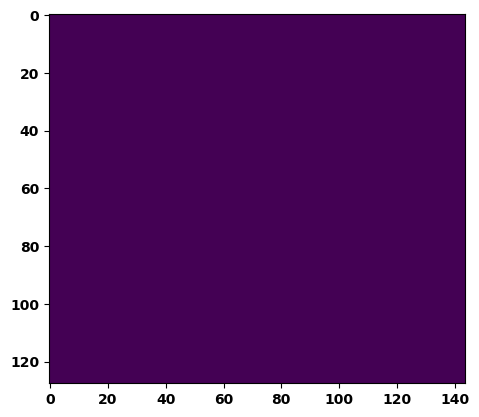

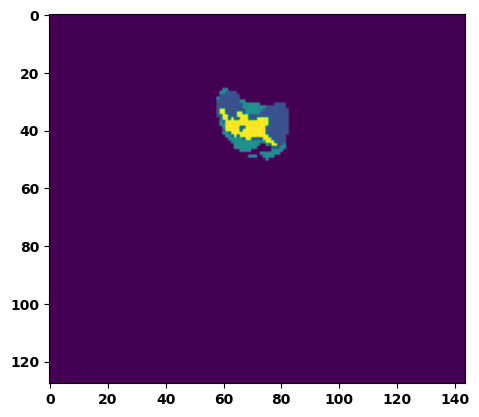

 61%|██████    | 22/36 [00:23<00:15,  1.10s/it]

Batch_id:  21 Eval loss:  0.5291584134101868
Batch_id:  21 Eval IoU:  tensor(0.3800, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9000, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8330, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9516, device='cuda:0')


 64%|██████▍   | 23/36 [00:23<00:13,  1.05s/it]

Batch_id:  22 Eval loss:  0.6265740990638733
Batch_id:  22 Eval IoU:  tensor(0.3031, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9759, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.06s/it]

Batch_id:  23 Eval loss:  0.7274860143661499
Batch_id:  23 Eval IoU:  tensor(0.1907, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.7257, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4727, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.5349, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.06s/it]

Batch_id:  24 Eval loss:  0.3163793981075287
Batch_id:  24 Eval IoU:  tensor(0.5948, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9864, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.08s/it]

Batch_id:  25 Eval loss:  0.05419744551181793
Batch_id:  25 Eval IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.06s/it]

Batch_id:  26 Eval loss:  0.6352723240852356
Batch_id:  26 Eval IoU:  tensor(0.2978, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9123, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8256, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9499, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.05s/it]

Batch_id:  27 Eval loss:  0.7653915882110596
Batch_id:  27 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.01s/it]

Batch_id:  28 Eval loss:  0.7634779810905457
Batch_id:  28 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.01s/it]

Batch_id:  29 Eval loss:  0.7448985576629639
Batch_id:  29 Eval IoU:  tensor(0.1554, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6536, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3901, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3448, device='cuda:0')
Batch_id:  30 Eval loss:  0.7660543322563171
Batch_id:  30 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


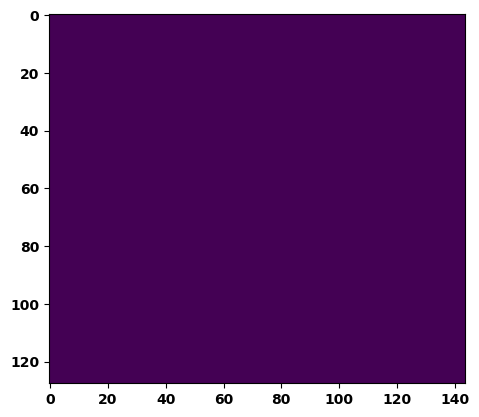

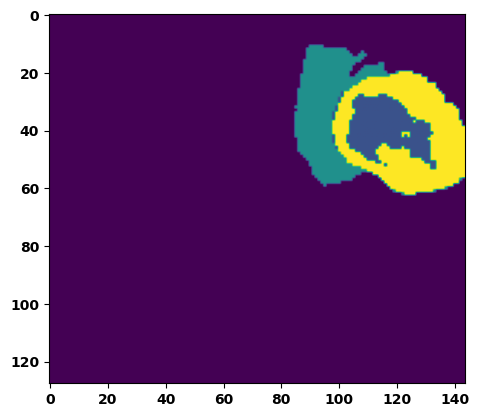

 89%|████████▉ | 32/36 [00:33<00:04,  1.09s/it]

Batch_id:  31 Eval loss:  0.34231820702552795
Batch_id:  31 Eval IoU:  tensor(0.5283, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9179, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9570, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.05s/it]

Batch_id:  32 Eval loss:  0.6813458204269409
Batch_id:  32 Eval IoU:  tensor(0.2495, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7944, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.7362, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.03s/it]

Batch_id:  33 Eval loss:  0.6359193325042725
Batch_id:  33 Eval IoU:  tensor(0.2725, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8282, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7299, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7690, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8260, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.04s/it]

Batch_id:  34 Eval loss:  0.8455646634101868
Batch_id:  34 Eval IoU:  tensor(0.0933, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6424, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3786, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.2860, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.04s/it]

Batch_id:  35 Eval loss:  0.6304417848587036
Batch_id:  35 Eval IoU:  tensor(0.3060, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9490, device='cuda:0')
Epoch  45 Training loss:  0.1327751273458654
Epoch  45 Evaluation loss:  0.6337443329393864
Epoch  45 Training accuracy :  tensor(0.8002)
Epoch  45 Evaluation accuracy :  tensor(0.3080)
Epoch  45 Training Mean Dice Score:  tensor(0.9890)
Epoch  45 Eval Mean Dice Score:  tensor(0.8676)
Epoch  45 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  45 Eval Non-tumor Dice Score:  tensor(0.7772)
Epoch  45 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  45 Eval NCR/NET Dice Score:  tensor(0.9634)
Epoch  45 Training ED Dice Score:  tensor(0.984

Epoch: 46
Training in session: 


  1%|          | 1/110 [00:01<01:50,  1.01s/it]

Batch_id:  0 Training loss:  0.12883418798446655
Batch_id:  0 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:51,  1.03s/it]

Batch_id:  1 Training loss:  0.08893606066703796
Batch_id:  1 Training IoU:  tensor(0.8458, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.08046907186508179
Batch_id:  2 Training IoU:  tensor(0.8699, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:56,  1.09s/it]

Batch_id:  3 Training loss:  0.05699877440929413
Batch_id:  3 Training IoU:  tensor(0.9028, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:51,  1.07s/it]

Batch_id:  4 Training loss:  0.14740771055221558
Batch_id:  4 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:50,  1.06s/it]

Batch_id:  5 Training loss:  0.160245880484581
Batch_id:  5 Training IoU:  tensor(0.8089, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:48,  1.05s/it]

Batch_id:  6 Training loss:  0.08627654612064362
Batch_id:  6 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:49,  1.07s/it]

Batch_id:  7 Training loss:  0.07414740324020386
Batch_id:  7 Training IoU:  tensor(0.8679, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:48,  1.08s/it]

Batch_id:  8 Training loss:  0.10466936230659485
Batch_id:  8 Training IoU:  tensor(0.8288, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:49,  1.10s/it]

Batch_id:  9 Training loss:  0.06091906130313873
Batch_id:  9 Training IoU:  tensor(0.8934, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 10%|█         | 11/110 [00:11<01:46,  1.08s/it]

Batch_id:  10 Training loss:  0.3727889657020569
Batch_id:  10 Training IoU:  tensor(0.5412, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 11%|█         | 12/110 [00:12<01:45,  1.08s/it]

Batch_id:  11 Training loss:  0.1393679529428482
Batch_id:  11 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:42,  1.06s/it]

Batch_id:  12 Training loss:  0.16446734964847565
Batch_id:  12 Training IoU:  tensor(0.7722, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:41,  1.06s/it]

Batch_id:  13 Training loss:  0.31519603729248047
Batch_id:  13 Training IoU:  tensor(0.6621, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.07s/it]

Batch_id:  14 Training loss:  0.14728321135044098
Batch_id:  14 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:41,  1.08s/it]

Batch_id:  15 Training loss:  0.1782136708498001
Batch_id:  15 Training IoU:  tensor(0.7397, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:38,  1.06s/it]

Batch_id:  16 Training loss:  0.12616722285747528
Batch_id:  16 Training IoU:  tensor(0.8115, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:40,  1.09s/it]

Batch_id:  17 Training loss:  0.06524460017681122
Batch_id:  17 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.08634048700332642
Batch_id:  18 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:38,  1.10s/it]

Batch_id:  19 Training loss:  0.08183592557907104
Batch_id:  19 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:37,  1.09s/it]

Batch_id:  20 Training loss:  0.09467905759811401
Batch_id:  20 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 20%|██        | 22/110 [00:23<01:35,  1.09s/it]

Batch_id:  21 Training loss:  0.08981756865978241
Batch_id:  21 Training IoU:  tensor(0.8536, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 21%|██        | 23/110 [00:24<01:33,  1.08s/it]

Batch_id:  22 Training loss:  0.3363763689994812
Batch_id:  22 Training IoU:  tensor(0.5684, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:33,  1.08s/it]

Batch_id:  23 Training loss:  0.07803274691104889
Batch_id:  23 Training IoU:  tensor(0.8613, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:29,  1.06s/it]

Batch_id:  24 Training loss:  0.15530294179916382
Batch_id:  24 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.12447093427181244
Batch_id:  25 Training IoU:  tensor(0.8050, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:30,  1.09s/it]

Batch_id:  26 Training loss:  0.062403604388237
Batch_id:  26 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:28,  1.08s/it]

Batch_id:  27 Training loss:  0.069159135222435
Batch_id:  27 Training IoU:  tensor(0.8798, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:28,  1.10s/it]

Batch_id:  28 Training loss:  0.046956390142440796
Batch_id:  28 Training IoU:  tensor(0.9300, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:27,  1.09s/it]

Batch_id:  29 Training loss:  0.3419235050678253
Batch_id:  29 Training IoU:  tensor(0.5399, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:25,  1.08s/it]

Batch_id:  30 Training loss:  0.21336060762405396
Batch_id:  30 Training IoU:  tensor(0.7099, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:24,  1.09s/it]

Batch_id:  31 Training loss:  0.05926099419593811
Batch_id:  31 Training IoU:  tensor(0.8977, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 30%|███       | 33/110 [00:35<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.0998760461807251
Batch_id:  32 Training IoU:  tensor(0.8501, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 31%|███       | 34/110 [00:36<01:23,  1.09s/it]

Batch_id:  33 Training loss:  0.1504502296447754
Batch_id:  33 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:23,  1.12s/it]

Batch_id:  34 Training loss:  0.04412040114402771
Batch_id:  34 Training IoU:  tensor(0.9207, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:20,  1.08s/it]

Batch_id:  35 Training loss:  0.10954375565052032
Batch_id:  35 Training IoU:  tensor(0.8141, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.1394699215888977
Batch_id:  36 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:17,  1.07s/it]

Batch_id:  37 Training loss:  0.0785321593284607
Batch_id:  37 Training IoU:  tensor(0.8618, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.10673369467258453
Batch_id:  38 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:15,  1.08s/it]

Batch_id:  39 Training loss:  0.04748158156871796
Batch_id:  39 Training IoU:  tensor(0.9204, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:13,  1.06s/it]

Batch_id:  40 Training loss:  0.14471112191677094
Batch_id:  40 Training IoU:  tensor(0.7675, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:12,  1.07s/it]

Batch_id:  41 Training loss:  0.06561838090419769
Batch_id:  41 Training IoU:  tensor(0.8900, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:10,  1.05s/it]

Batch_id:  42 Training loss:  0.1306103765964508
Batch_id:  42 Training IoU:  tensor(0.7993, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 40%|████      | 44/110 [00:47<01:08,  1.04s/it]

Batch_id:  43 Training loss:  0.12605559825897217
Batch_id:  43 Training IoU:  tensor(0.8126, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 41%|████      | 45/110 [00:48<01:07,  1.04s/it]

Batch_id:  44 Training loss:  0.05699737370014191
Batch_id:  44 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:07,  1.06s/it]

Batch_id:  45 Training loss:  0.22855393588542938
Batch_id:  45 Training IoU:  tensor(0.6877, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:06,  1.05s/it]

Batch_id:  46 Training loss:  0.17983858287334442
Batch_id:  46 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:06,  1.07s/it]

Batch_id:  47 Training loss:  0.12814302742481232
Batch_id:  47 Training IoU:  tensor(0.7880, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:04,  1.05s/it]

Batch_id:  48 Training loss:  0.083839550614357
Batch_id:  48 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:02,  1.05s/it]

Batch_id:  49 Training loss:  0.061325520277023315
Batch_id:  49 Training IoU:  tensor(0.8925, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:02,  1.07s/it]

Batch_id:  50 Training loss:  0.25054511427879333
Batch_id:  50 Training IoU:  tensor(0.6848, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:01,  1.06s/it]

Batch_id:  51 Training loss:  0.14348997175693512
Batch_id:  51 Training IoU:  tensor(0.7848, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:01,  1.07s/it]

Batch_id:  52 Training loss:  0.08443906903266907
Batch_id:  52 Training IoU:  tensor(0.8551, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 49%|████▉     | 54/110 [00:57<00:59,  1.06s/it]

Batch_id:  53 Training loss:  0.10079039633274078
Batch_id:  53 Training IoU:  tensor(0.8401, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 50%|█████     | 55/110 [00:58<00:57,  1.05s/it]

Batch_id:  54 Training loss:  0.09298864006996155
Batch_id:  54 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:56,  1.05s/it]

Batch_id:  55 Training loss:  0.07961146533489227
Batch_id:  55 Training IoU:  tensor(0.8601, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:55,  1.05s/it]

Batch_id:  56 Training loss:  0.07964999973773956
Batch_id:  56 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:55,  1.06s/it]

Batch_id:  57 Training loss:  0.2058226466178894
Batch_id:  57 Training IoU:  tensor(0.7138, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:54,  1.06s/it]

Batch_id:  58 Training loss:  0.07129095494747162
Batch_id:  58 Training IoU:  tensor(0.8755, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:52,  1.05s/it]

Batch_id:  59 Training loss:  0.09482549130916595
Batch_id:  59 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:51,  1.05s/it]

Batch_id:  60 Training loss:  0.10997657477855682
Batch_id:  60 Training IoU:  tensor(0.8138, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.18107378482818604
Batch_id:  61 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:49,  1.06s/it]

Batch_id:  62 Training loss:  0.1007571816444397
Batch_id:  62 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 58%|█████▊    | 64/110 [01:08<00:48,  1.06s/it]

Batch_id:  63 Training loss:  0.06283210217952728
Batch_id:  63 Training IoU:  tensor(0.8917, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 59%|█████▉    | 65/110 [01:09<00:47,  1.05s/it]

Batch_id:  64 Training loss:  0.10754373669624329
Batch_id:  64 Training IoU:  tensor(0.8280, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 60%|██████    | 66/110 [01:10<00:47,  1.07s/it]

Batch_id:  65 Training loss:  0.07478487491607666
Batch_id:  65 Training IoU:  tensor(0.8700, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 61%|██████    | 67/110 [01:11<00:46,  1.07s/it]

Batch_id:  66 Training loss:  0.05280359089374542
Batch_id:  66 Training IoU:  tensor(0.9069, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 62%|██████▏   | 68/110 [01:12<00:44,  1.07s/it]

Batch_id:  67 Training loss:  0.16731244325637817
Batch_id:  67 Training IoU:  tensor(0.7407, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 63%|██████▎   | 69/110 [01:13<00:43,  1.07s/it]

Batch_id:  68 Training loss:  0.25074487924575806
Batch_id:  68 Training IoU:  tensor(0.6289, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 64%|██████▎   | 70/110 [01:14<00:43,  1.08s/it]

Batch_id:  69 Training loss:  0.06435650587081909
Batch_id:  69 Training IoU:  tensor(0.8973, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.1552986055612564
Batch_id:  70 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.30436041951179504
Batch_id:  71 Training IoU:  tensor(0.6643, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:41,  1.11s/it]

Batch_id:  72 Training loss:  0.1248818188905716
Batch_id:  72 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:39,  1.09s/it]

Batch_id:  73 Training loss:  0.08237548172473907
Batch_id:  73 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:38,  1.10s/it]

Batch_id:  74 Training loss:  0.10036490857601166
Batch_id:  74 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.09s/it]

Batch_id:  75 Training loss:  0.13018575310707092
Batch_id:  75 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 70%|███████   | 77/110 [01:22<00:36,  1.10s/it]

Batch_id:  76 Training loss:  0.12607300281524658
Batch_id:  76 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 71%|███████   | 78/110 [01:23<00:36,  1.14s/it]

Batch_id:  77 Training loss:  0.14986734092235565
Batch_id:  77 Training IoU:  tensor(0.7630, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 72%|███████▏  | 79/110 [01:24<00:34,  1.10s/it]

Batch_id:  78 Training loss:  0.13454580307006836
Batch_id:  78 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 73%|███████▎  | 80/110 [01:25<00:32,  1.10s/it]

Batch_id:  79 Training loss:  0.19316503405570984
Batch_id:  79 Training IoU:  tensor(0.7384, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.3279065489768982
Batch_id:  80 Training IoU:  tensor(0.6178, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:30,  1.08s/it]

Batch_id:  81 Training loss:  0.1292734444141388
Batch_id:  81 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:30,  1.11s/it]

Batch_id:  82 Training loss:  0.050416573882102966
Batch_id:  82 Training IoU:  tensor(0.9144, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:28,  1.11s/it]

Batch_id:  83 Training loss:  0.1184438019990921
Batch_id:  83 Training IoU:  tensor(0.8023, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:27,  1.08s/it]

Batch_id:  84 Training loss:  0.204498752951622
Batch_id:  84 Training IoU:  tensor(0.6943, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:25,  1.08s/it]

Batch_id:  85 Training loss:  0.13060204684734344
Batch_id:  85 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.06329786777496338
Batch_id:  86 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.1473691165447235
Batch_id:  87 Training IoU:  tensor(0.7653, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:22,  1.07s/it]

Batch_id:  88 Training loss:  0.18970388174057007
Batch_id:  88 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:22,  1.11s/it]

Batch_id:  89 Training loss:  0.1311127245426178
Batch_id:  89 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.34427589178085327
Batch_id:  90 Training IoU:  tensor(0.6037, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.44721752405166626
Batch_id:  91 Training IoU:  tensor(0.4697, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:19,  1.12s/it]

Batch_id:  92 Training loss:  0.13507351279258728
Batch_id:  92 Training IoU:  tensor(0.7877, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.12s/it]

Batch_id:  93 Training loss:  0.08263510465621948
Batch_id:  93 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.10s/it]

Batch_id:  94 Training loss:  0.16941605508327484
Batch_id:  94 Training IoU:  tensor(0.7256, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:16,  1.14s/it]

Batch_id:  95 Training loss:  0.18545155227184296
Batch_id:  95 Training IoU:  tensor(0.7075, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:14,  1.14s/it]

Batch_id:  96 Training loss:  0.08328428864479065
Batch_id:  96 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:13,  1.13s/it]

Batch_id:  97 Training loss:  0.05784189701080322
Batch_id:  97 Training IoU:  tensor(0.8997, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:12,  1.16s/it]

Batch_id:  98 Training loss:  0.0808718353509903
Batch_id:  98 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:11,  1.14s/it]

Batch_id:  99 Training loss:  0.1269083321094513
Batch_id:  99 Training IoU:  tensor(0.8101, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:10,  1.12s/it]

Batch_id:  100 Training loss:  0.14573274552822113
Batch_id:  100 Training IoU:  tensor(0.7648, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.153267502784729
Batch_id:  101 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.11s/it]

Batch_id:  102 Training loss:  0.09348523616790771
Batch_id:  102 Training IoU:  tensor(0.8498, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.10s/it]

Batch_id:  103 Training loss:  0.19684505462646484
Batch_id:  103 Training IoU:  tensor(0.6941, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.060243114829063416
Batch_id:  104 Training IoU:  tensor(0.8983, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.13s/it]

Batch_id:  105 Training loss:  0.04900746047496796
Batch_id:  105 Training IoU:  tensor(0.9142, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.13s/it]

Batch_id:  106 Training loss:  0.08117815852165222
Batch_id:  106 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.15847305953502655
Batch_id:  107 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.10s/it]

Batch_id:  108 Training loss:  0.15618956089019775
Batch_id:  108 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.08761151134967804
Batch_id:  109 Training IoU:  tensor(0.8508, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9870, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8823032975196838
Batch_id:  0 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6220, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.4181, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2439, device='cuda:0')


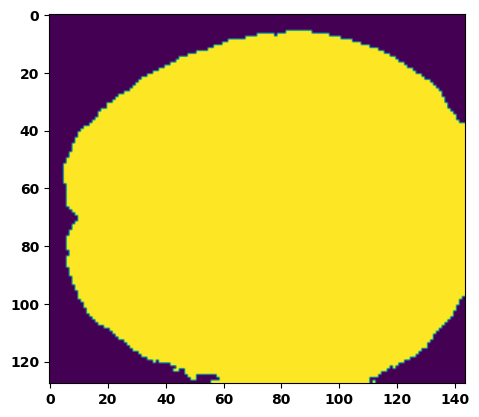

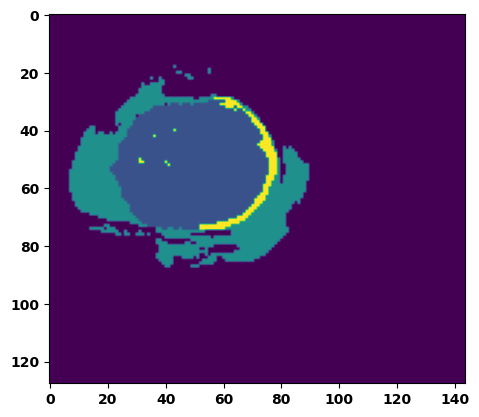

  6%|▌         | 2/36 [00:02<00:38,  1.14s/it]

Batch_id:  1 Eval loss:  0.24806639552116394
Batch_id:  1 Eval IoU:  tensor(0.6896, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:37,  1.12s/it]

Batch_id:  2 Eval loss:  0.8124597072601318
Batch_id:  2 Eval IoU:  tensor(0.1226, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6892, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5013, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8754, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.3940, device='cuda:0')


 11%|█         | 4/36 [00:04<00:34,  1.07s/it]

Batch_id:  3 Eval loss:  0.7563153505325317
Batch_id:  3 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.04s/it]

Batch_id:  4 Eval loss:  0.697200357913971
Batch_id:  4 Eval IoU:  tensor(0.2609, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8127, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9468, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.03s/it]

Batch_id:  5 Eval loss:  0.6332100629806519
Batch_id:  5 Eval IoU:  tensor(0.2898, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8937, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8455, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8006, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9439, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.03s/it]

Batch_id:  6 Eval loss:  0.7535111308097839
Batch_id:  6 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.01s/it]

Batch_id:  7 Eval loss:  0.7703484296798706
Batch_id:  7 Eval IoU:  tensor(0.1397, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.6603, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4106, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3551, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.00s/it]

Batch_id:  8 Eval loss:  0.7660669684410095
Batch_id:  8 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:25,  1.01it/s]

Batch_id:  9 Eval loss:  0.7736858129501343
Batch_id:  9 Eval IoU:  tensor(0.2001, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8799, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7990, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8928, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  10 Eval loss:  0.7654030323028564
Batch_id:  10 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


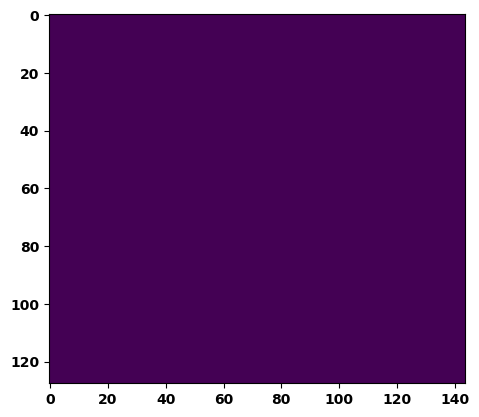

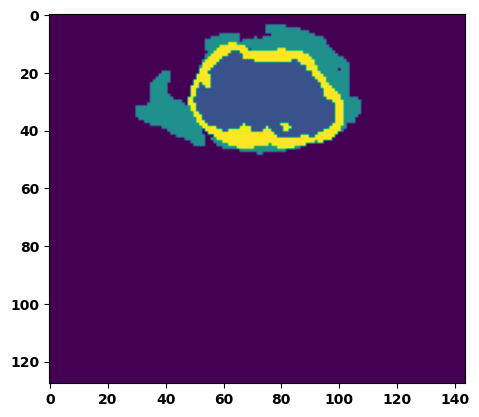

 33%|███▎      | 12/36 [00:12<00:24,  1.03s/it]

Batch_id:  11 Eval loss:  0.7638140916824341
Batch_id:  11 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.03s/it]

Batch_id:  12 Eval loss:  0.7518026828765869
Batch_id:  12 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:23,  1.09s/it]

Batch_id:  13 Eval loss:  0.775410532951355
Batch_id:  13 Eval IoU:  tensor(0.2032, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8124, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:22,  1.09s/it]

Batch_id:  14 Eval loss:  0.10192511975765228
Batch_id:  14 Eval IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9968, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:21,  1.08s/it]

Batch_id:  15 Eval loss:  0.8653368949890137
Batch_id:  15 Eval IoU:  tensor(0.0753, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5990, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3148, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2078, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.10s/it]

Batch_id:  16 Eval loss:  0.5065711736679077
Batch_id:  16 Eval IoU:  tensor(0.3946, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9731, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:20,  1.12s/it]

Batch_id:  17 Eval loss:  0.6598991751670837
Batch_id:  17 Eval IoU:  tensor(0.2409, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8000, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.6659, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.8942, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.7118, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9282, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.12s/it]

Batch_id:  18 Eval loss:  0.4002569913864136
Batch_id:  18 Eval IoU:  tensor(0.5174, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8756, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.7552, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7812, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:17,  1.10s/it]

Batch_id:  19 Eval loss:  0.7586052417755127
Batch_id:  19 Eval IoU:  tensor(0.2296, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  20 Eval loss:  0.8579366207122803
Batch_id:  20 Eval IoU:  tensor(0.0874, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6439, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3837, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.2880, device='cuda:0')


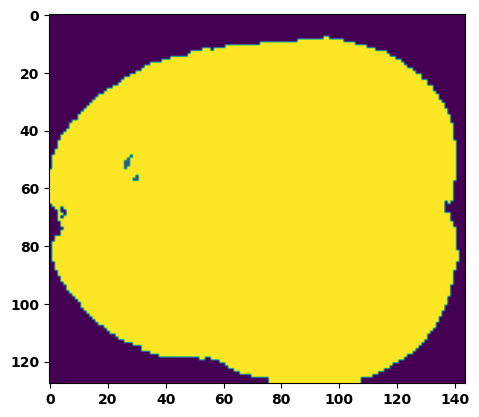

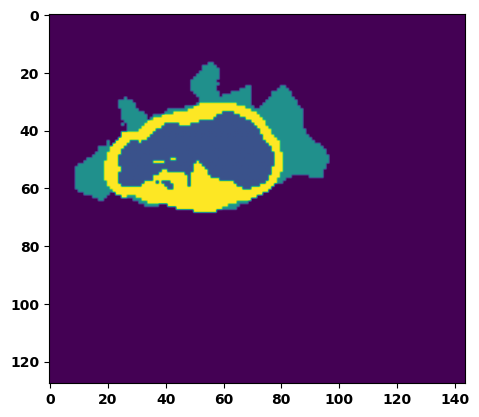

 61%|██████    | 22/36 [00:23<00:15,  1.11s/it]

Batch_id:  21 Eval loss:  0.8031365275382996
Batch_id:  21 Eval IoU:  tensor(0.1624, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8248, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.6495, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.7848, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.09s/it]

Batch_id:  22 Eval loss:  0.6685168743133545
Batch_id:  22 Eval IoU:  tensor(0.2791, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9482, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:13,  1.13s/it]

Batch_id:  23 Eval loss:  0.059199973940849304
Batch_id:  23 Eval IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


 69%|██████▉   | 25/36 [00:27<00:12,  1.13s/it]

Batch_id:  24 Eval loss:  0.8057714700698853
Batch_id:  24 Eval IoU:  tensor(0.1588, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8175, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.6351, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.7407, device='cuda:0')


 72%|███████▏  | 26/36 [00:28<00:10,  1.10s/it]

Batch_id:  25 Eval loss:  0.7634705305099487
Batch_id:  25 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 75%|███████▌  | 27/36 [00:29<00:09,  1.08s/it]

Batch_id:  26 Eval loss:  0.7691552639007568
Batch_id:  26 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:08,  1.07s/it]

Batch_id:  27 Eval loss:  0.5168251991271973
Batch_id:  27 Eval IoU:  tensor(0.3884, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9777, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:07,  1.05s/it]

Batch_id:  28 Eval loss:  0.8133581280708313
Batch_id:  28 Eval IoU:  tensor(0.1212, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6992, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4540, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3987, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.05s/it]

Batch_id:  29 Eval loss:  0.7264439463615417
Batch_id:  29 Eval IoU:  tensor(0.1765, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7215, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.4968, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.7920, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.6743, device='cuda:0')
Batch_id:  30 Eval loss:  0.24499398469924927
Batch_id:  30 Eval IoU:  tensor(0.6335, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9593, device='cuda:0')


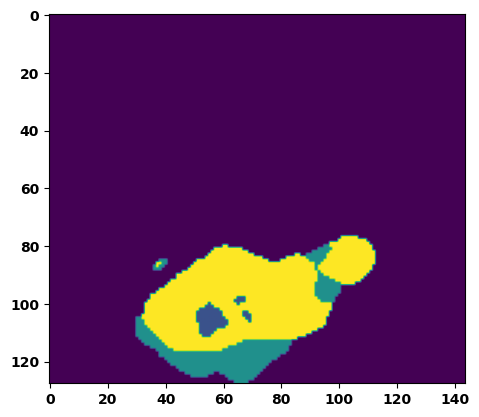

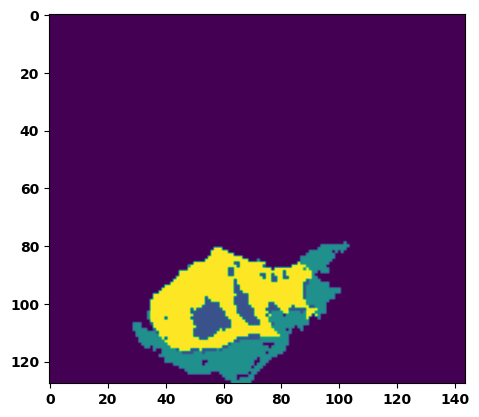

 89%|████████▉ | 32/36 [00:34<00:04,  1.07s/it]

Batch_id:  31 Eval loss:  0.48555654287338257
Batch_id:  31 Eval IoU:  tensor(0.3984, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8900, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9605, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.07s/it]

Batch_id:  32 Eval loss:  0.4217931628227234
Batch_id:  32 Eval IoU:  tensor(0.4969, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.07s/it]

Batch_id:  33 Eval loss:  0.7571538686752319
Batch_id:  33 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.5403726696968079
Batch_id:  34 Eval IoU:  tensor(0.3629, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8997, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8358, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9533, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.5594361424446106
Batch_id:  35 Eval IoU:  tensor(0.3585, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8582, device='cuda:0')
Epoch  46 Training loss:  0.132580421323126
Epoch  46 Evaluation loss:  0.6454253709978528
Epoch  46 Training accuracy :  tensor(0.8004)
Epoch  46 Evaluation accuracy :  tensor(0.3019)
Epoch  46 Training Mean Dice Score:  tensor(0.9890)
Epoch  46 Eval Mean Dice Score:  tensor(0.8798)
Epoch  46 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  46 Eval Non-tumor Dice Score:  tensor(0.7956)
Epoch  46 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  46 Eval NCR/NET Dice Score:  tensor(0.9658)
Epoch  46 Training ED Dice Score:  tensor(0.9842

Epoch: 47
Training in session: 


  1%|          | 1/110 [00:00<01:46,  1.03it/s]

Batch_id:  0 Training loss:  0.1636059284210205
Batch_id:  0 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.24942952394485474
Batch_id:  1 Training IoU:  tensor(0.6865, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:52,  1.05s/it]

Batch_id:  2 Training loss:  0.07818174362182617
Batch_id:  2 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:52,  1.06s/it]

Batch_id:  3 Training loss:  0.14686451852321625
Batch_id:  3 Training IoU:  tensor(0.7653, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:49,  1.04s/it]

Batch_id:  4 Training loss:  0.1247122585773468
Batch_id:  4 Training IoU:  tensor(0.8148, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:48,  1.04s/it]

Batch_id:  5 Training loss:  0.07877758145332336
Batch_id:  5 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.07s/it]

Batch_id:  6 Training loss:  0.044600710272789
Batch_id:  6 Training IoU:  tensor(0.9198, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:48,  1.06s/it]

Batch_id:  7 Training loss:  0.14266127347946167
Batch_id:  7 Training IoU:  tensor(0.7848, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:47,  1.07s/it]

Batch_id:  8 Training loss:  0.14569884538650513
Batch_id:  8 Training IoU:  tensor(0.7647, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:46,  1.06s/it]

Batch_id:  9 Training loss:  0.08054985105991364
Batch_id:  9 Training IoU:  tensor(0.8685, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.07s/it]

Batch_id:  10 Training loss:  0.4461238980293274
Batch_id:  10 Training IoU:  tensor(0.4700, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 11%|█         | 12/110 [00:12<01:43,  1.05s/it]

Batch_id:  11 Training loss:  0.12851718068122864
Batch_id:  11 Training IoU:  tensor(0.7832, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:41,  1.04s/it]

Batch_id:  12 Training loss:  0.083197683095932
Batch_id:  12 Training IoU:  tensor(0.8558, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 13%|█▎        | 14/110 [00:14<01:39,  1.04s/it]

Batch_id:  13 Training loss:  0.08965738117694855
Batch_id:  13 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 14%|█▎        | 15/110 [00:15<01:37,  1.03s/it]

Batch_id:  14 Training loss:  0.10840579867362976
Batch_id:  14 Training IoU:  tensor(0.8274, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 15%|█▍        | 16/110 [00:16<01:37,  1.04s/it]

Batch_id:  15 Training loss:  0.06324204802513123
Batch_id:  15 Training IoU:  tensor(0.8882, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 15%|█▌        | 17/110 [00:17<01:40,  1.08s/it]

Batch_id:  16 Training loss:  0.12775005400180817
Batch_id:  16 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.08s/it]

Batch_id:  17 Training loss:  0.20312663912773132
Batch_id:  17 Training IoU:  tensor(0.6968, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:39,  1.10s/it]

Batch_id:  18 Training loss:  0.19608427584171295
Batch_id:  18 Training IoU:  tensor(0.6950, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:43,  1.15s/it]

Batch_id:  19 Training loss:  0.05769847333431244
Batch_id:  19 Training IoU:  tensor(0.9000, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:40,  1.13s/it]

Batch_id:  20 Training loss:  0.13472427427768707
Batch_id:  20 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 20%|██        | 22/110 [00:23<01:41,  1.15s/it]

Batch_id:  21 Training loss:  0.10443496704101562
Batch_id:  21 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 21%|██        | 23/110 [00:24<01:36,  1.10s/it]

Batch_id:  22 Training loss:  0.10088992118835449
Batch_id:  22 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:32,  1.08s/it]

Batch_id:  23 Training loss:  0.18835830688476562
Batch_id:  23 Training IoU:  tensor(0.7283, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:32,  1.09s/it]

Batch_id:  24 Training loss:  0.048938944935798645
Batch_id:  24 Training IoU:  tensor(0.9144, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:30,  1.08s/it]

Batch_id:  25 Training loss:  0.08123746514320374
Batch_id:  25 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:32,  1.11s/it]

Batch_id:  26 Training loss:  0.12659278512001038
Batch_id:  26 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:29,  1.09s/it]

Batch_id:  27 Training loss:  0.15594705939292908
Batch_id:  27 Training IoU:  tensor(0.7521, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:25,  1.06s/it]

Batch_id:  28 Training loss:  0.06264114379882812
Batch_id:  28 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:23,  1.04s/it]

Batch_id:  29 Training loss:  0.34027183055877686
Batch_id:  29 Training IoU:  tensor(0.5422, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:21,  1.03s/it]

Batch_id:  30 Training loss:  0.07155527174472809
Batch_id:  30 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:20,  1.04s/it]

Batch_id:  31 Training loss:  0.10049216449260712
Batch_id:  31 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 30%|███       | 33/110 [00:35<01:19,  1.03s/it]

Batch_id:  32 Training loss:  0.0623268187046051
Batch_id:  32 Training IoU:  tensor(0.8912, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 31%|███       | 34/110 [00:36<01:18,  1.03s/it]

Batch_id:  33 Training loss:  0.1472584307193756
Batch_id:  33 Training IoU:  tensor(0.7585, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:19,  1.06s/it]

Batch_id:  34 Training loss:  0.06512920558452606
Batch_id:  34 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:18,  1.06s/it]

Batch_id:  35 Training loss:  0.06588560342788696
Batch_id:  35 Training IoU:  tensor(0.8889, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:18,  1.07s/it]

Batch_id:  36 Training loss:  0.05281504988670349
Batch_id:  36 Training IoU:  tensor(0.9066, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:17,  1.07s/it]

Batch_id:  37 Training loss:  0.08453622460365295
Batch_id:  37 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 35%|███▌      | 39/110 [00:41<01:15,  1.06s/it]

Batch_id:  38 Training loss:  0.14878727495670319
Batch_id:  38 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 36%|███▋      | 40/110 [00:42<01:13,  1.05s/it]

Batch_id:  39 Training loss:  0.08628159761428833
Batch_id:  39 Training IoU:  tensor(0.8490, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 37%|███▋      | 41/110 [00:43<01:12,  1.05s/it]

Batch_id:  40 Training loss:  0.1524638831615448
Batch_id:  40 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 38%|███▊      | 42/110 [00:44<01:10,  1.04s/it]

Batch_id:  41 Training loss:  0.14801612496376038
Batch_id:  41 Training IoU:  tensor(0.7598, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 39%|███▉      | 43/110 [00:45<01:10,  1.05s/it]

Batch_id:  42 Training loss:  0.16964063048362732
Batch_id:  42 Training IoU:  tensor(0.7253, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 40%|████      | 44/110 [00:46<01:09,  1.05s/it]

Batch_id:  43 Training loss:  0.16601406037807465
Batch_id:  43 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 41%|████      | 45/110 [00:48<01:12,  1.11s/it]

Batch_id:  44 Training loss:  0.12428158521652222
Batch_id:  44 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:12,  1.13s/it]

Batch_id:  45 Training loss:  0.17905999720096588
Batch_id:  45 Training IoU:  tensor(0.7385, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:11,  1.13s/it]

Batch_id:  46 Training loss:  0.10955889523029327
Batch_id:  46 Training IoU:  tensor(0.8143, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:09,  1.12s/it]

Batch_id:  47 Training loss:  0.08783544600009918
Batch_id:  47 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:08,  1.12s/it]

Batch_id:  48 Training loss:  0.1069251149892807
Batch_id:  48 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:07,  1.13s/it]

Batch_id:  49 Training loss:  0.14980502426624298
Batch_id:  49 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:05,  1.12s/it]

Batch_id:  50 Training loss:  0.06505279242992401
Batch_id:  50 Training IoU:  tensor(0.8959, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.21409723162651062
Batch_id:  51 Training IoU:  tensor(0.7092, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 48%|████▊     | 53/110 [00:56<01:01,  1.08s/it]

Batch_id:  52 Training loss:  0.1399838924407959
Batch_id:  52 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:02,  1.11s/it]

Batch_id:  53 Training loss:  0.09426701068878174
Batch_id:  53 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:01,  1.11s/it]

Batch_id:  54 Training loss:  0.20724576711654663
Batch_id:  54 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:59,  1.10s/it]

Batch_id:  55 Training loss:  0.1351606398820877
Batch_id:  55 Training IoU:  tensor(0.7772, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:58,  1.10s/it]

Batch_id:  56 Training loss:  0.09442371129989624
Batch_id:  56 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:57,  1.10s/it]

Batch_id:  57 Training loss:  0.07420031726360321
Batch_id:  57 Training IoU:  tensor(0.8678, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:57,  1.13s/it]

Batch_id:  58 Training loss:  0.15759053826332092
Batch_id:  58 Training IoU:  tensor(0.8136, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:55,  1.11s/it]

Batch_id:  59 Training loss:  0.0825272649526596
Batch_id:  59 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:53,  1.10s/it]

Batch_id:  60 Training loss:  0.05041097104549408
Batch_id:  60 Training IoU:  tensor(0.9142, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.07s/it]

Batch_id:  61 Training loss:  0.08358427882194519
Batch_id:  61 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.09018370509147644
Batch_id:  62 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.07940201461315155
Batch_id:  63 Training IoU:  tensor(0.8604, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.09s/it]

Batch_id:  64 Training loss:  0.08128084242343903
Batch_id:  64 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:46,  1.06s/it]

Batch_id:  65 Training loss:  0.10987582802772522
Batch_id:  65 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.047199547290802
Batch_id:  66 Training IoU:  tensor(0.9300, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:44,  1.06s/it]

Batch_id:  67 Training loss:  0.13116978108882904
Batch_id:  67 Training IoU:  tensor(0.7908, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:43,  1.06s/it]

Batch_id:  68 Training loss:  0.3284217119216919
Batch_id:  68 Training IoU:  tensor(0.6172, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.0867372453212738
Batch_id:  69 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.12710505723953247
Batch_id:  70 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:40,  1.08s/it]

Batch_id:  71 Training loss:  0.10157400369644165
Batch_id:  71 Training IoU:  tensor(0.8389, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:41,  1.13s/it]

Batch_id:  72 Training loss:  0.19280129671096802
Batch_id:  72 Training IoU:  tensor(0.7392, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:41,  1.15s/it]

Batch_id:  73 Training loss:  0.2292715162038803
Batch_id:  73 Training IoU:  tensor(0.6867, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:40,  1.15s/it]

Batch_id:  74 Training loss:  0.0610104501247406
Batch_id:  74 Training IoU:  tensor(0.8932, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:38,  1.13s/it]

Batch_id:  75 Training loss:  0.18539685010910034
Batch_id:  75 Training IoU:  tensor(0.7085, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:38,  1.16s/it]

Batch_id:  76 Training loss:  0.11748044192790985
Batch_id:  76 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:36,  1.13s/it]

Batch_id:  77 Training loss:  0.048271551728248596
Batch_id:  77 Training IoU:  tensor(0.9201, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:35,  1.15s/it]

Batch_id:  78 Training loss:  0.34462279081344604
Batch_id:  78 Training IoU:  tensor(0.6030, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:34,  1.15s/it]

Batch_id:  79 Training loss:  0.15369711816310883
Batch_id:  79 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 74%|███████▎  | 81/110 [01:28<00:33,  1.15s/it]

Batch_id:  80 Training loss:  0.07449646294116974
Batch_id:  80 Training IoU:  tensor(0.8699, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.13s/it]

Batch_id:  81 Training loss:  0.059806421399116516
Batch_id:  81 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:33,  1.23s/it]

Batch_id:  82 Training loss:  0.05692557990550995
Batch_id:  82 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:30,  1.18s/it]

Batch_id:  83 Training loss:  0.14054211974143982
Batch_id:  83 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:28,  1.15s/it]

Batch_id:  84 Training loss:  0.15627442300319672
Batch_id:  84 Training IoU:  tensor(0.7610, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:27,  1.16s/it]

Batch_id:  85 Training loss:  0.08200770616531372
Batch_id:  85 Training IoU:  tensor(0.8559, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.12s/it]

Batch_id:  86 Training loss:  0.17895440757274628
Batch_id:  86 Training IoU:  tensor(0.7221, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 80%|████████  | 88/110 [01:36<00:24,  1.12s/it]

Batch_id:  87 Training loss:  0.07939307391643524
Batch_id:  87 Training IoU:  tensor(0.8605, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 81%|████████  | 89/110 [01:37<00:22,  1.09s/it]

Batch_id:  88 Training loss:  0.1305943727493286
Batch_id:  88 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 82%|████████▏ | 90/110 [01:38<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.0698138177394867
Batch_id:  89 Training IoU:  tensor(0.8785, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 83%|████████▎ | 91/110 [01:39<00:21,  1.12s/it]

Batch_id:  90 Training loss:  0.18120615184307098
Batch_id:  90 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 84%|████████▎ | 92/110 [01:40<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.3352400064468384
Batch_id:  91 Training IoU:  tensor(0.5680, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 85%|████████▍ | 93/110 [01:41<00:18,  1.11s/it]

Batch_id:  92 Training loss:  0.12580053508281708
Batch_id:  92 Training IoU:  tensor(0.8131, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.11s/it]

Batch_id:  93 Training loss:  0.06284122169017792
Batch_id:  93 Training IoU:  tensor(0.8919, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.09s/it]

Batch_id:  94 Training loss:  0.12363415956497192
Batch_id:  94 Training IoU:  tensor(0.8039, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.08s/it]

Batch_id:  95 Training loss:  0.14573729038238525
Batch_id:  95 Training IoU:  tensor(0.7661, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.08s/it]

Batch_id:  96 Training loss:  0.37089771032333374
Batch_id:  96 Training IoU:  tensor(0.5435, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:12,  1.08s/it]

Batch_id:  97 Training loss:  0.1301213800907135
Batch_id:  97 Training IoU:  tensor(0.7825, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.3047337532043457
Batch_id:  98 Training IoU:  tensor(0.6646, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 91%|█████████ | 100/110 [01:49<00:10,  1.08s/it]

Batch_id:  99 Training loss:  0.2492683082818985
Batch_id:  99 Training IoU:  tensor(0.6307, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 92%|█████████▏| 101/110 [01:50<00:09,  1.07s/it]

Batch_id:  100 Training loss:  0.13097062706947327
Batch_id:  100 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 93%|█████████▎| 102/110 [01:51<00:08,  1.07s/it]

Batch_id:  101 Training loss:  0.12661893665790558
Batch_id:  101 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.10s/it]

Batch_id:  102 Training loss:  0.09339019656181335
Batch_id:  102 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.056620821356773376
Batch_id:  103 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.10s/it]

Batch_id:  104 Training loss:  0.09850957989692688
Batch_id:  104 Training IoU:  tensor(0.8993, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.10s/it]

Batch_id:  105 Training loss:  0.05956600606441498
Batch_id:  105 Training IoU:  tensor(0.8976, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.10s/it]

Batch_id:  106 Training loss:  0.31595101952552795
Batch_id:  106 Training IoU:  tensor(0.6576, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.12s/it]

Batch_id:  107 Training loss:  0.1586448848247528
Batch_id:  107 Training IoU:  tensor(0.7448, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 99%|█████████▉| 109/110 [01:59<00:01,  1.13s/it]

Batch_id:  108 Training loss:  0.09261798858642578
Batch_id:  108 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


100%|██████████| 110/110 [02:00<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.0809352695941925
Batch_id:  109 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9886, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6467646956443787
Batch_id:  0 Eval IoU:  tensor(0.3077, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


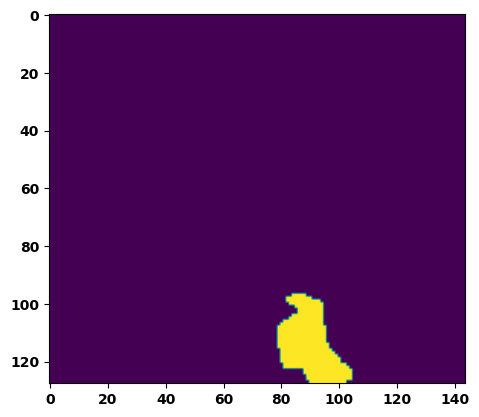

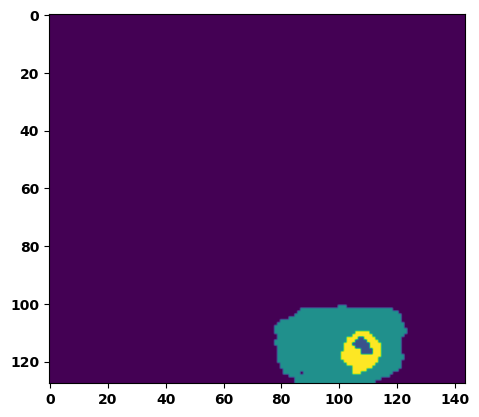

  6%|▌         | 2/36 [00:02<00:37,  1.09s/it]

Batch_id:  1 Eval loss:  0.7691603899002075
Batch_id:  1 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.04s/it]

Batch_id:  2 Eval loss:  0.763477087020874
Batch_id:  2 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.02s/it]

Batch_id:  3 Eval loss:  0.7332183122634888
Batch_id:  3 Eval IoU:  tensor(0.2491, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8090, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:32,  1.04s/it]

Batch_id:  4 Eval loss:  0.7123162150382996
Batch_id:  4 Eval IoU:  tensor(0.1911, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6615, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3951, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3301, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.03s/it]

Batch_id:  5 Eval loss:  0.7535069584846497
Batch_id:  5 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.06s/it]

Batch_id:  6 Eval loss:  0.6551596522331238
Batch_id:  6 Eval IoU:  tensor(0.2952, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.7653889656066895
Batch_id:  7 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.05s/it]

Batch_id:  8 Eval loss:  0.15436527132987976
Batch_id:  8 Eval IoU:  tensor(0.7482, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9888, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:26,  1.02s/it]

Batch_id:  9 Eval loss:  0.8816155195236206
Batch_id:  9 Eval IoU:  tensor(0.0754, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6228, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4199, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.2458, device='cuda:0')
Batch_id:  10 Eval loss:  0.7757548689842224
Batch_id:  10 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


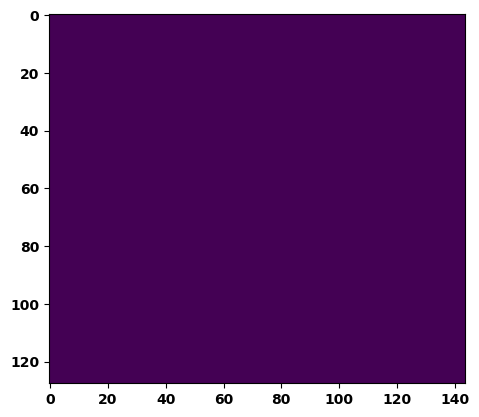

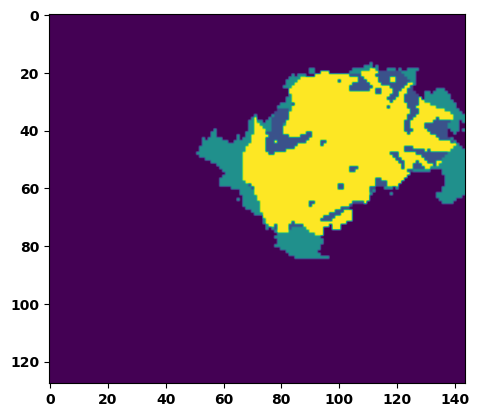

 33%|███▎      | 12/36 [00:12<00:24,  1.04s/it]

Batch_id:  11 Eval loss:  0.7478936910629272
Batch_id:  11 Eval IoU:  tensor(0.2345, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.03s/it]

Batch_id:  12 Eval loss:  0.4966377019882202
Batch_id:  12 Eval IoU:  tensor(0.4095, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8652, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9399, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.03s/it]

Batch_id:  13 Eval loss:  0.4515036642551422
Batch_id:  13 Eval IoU:  tensor(0.4423, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9512, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.02s/it]

Batch_id:  14 Eval loss:  0.5786641836166382
Batch_id:  14 Eval IoU:  tensor(0.3225, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.7426, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.5075, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.5026, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9735, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.02s/it]

Batch_id:  15 Eval loss:  0.8163760900497437
Batch_id:  15 Eval IoU:  tensor(0.1450, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7897, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5803, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.7308, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:19,  1.03s/it]

Batch_id:  16 Eval loss:  0.27980345487594604
Batch_id:  16 Eval IoU:  tensor(0.6025, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:18,  1.02s/it]

Batch_id:  17 Eval loss:  0.7538830637931824
Batch_id:  17 Eval IoU:  tensor(0.2320, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9398, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9184, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9010, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:17,  1.01s/it]

Batch_id:  18 Eval loss:  0.603062629699707
Batch_id:  18 Eval IoU:  tensor(0.2948, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8373, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.7048, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7789, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8808, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:16,  1.03s/it]

Batch_id:  19 Eval loss:  0.7661435604095459
Batch_id:  19 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8785, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8386, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8554, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  20 Eval loss:  0.5085309147834778
Batch_id:  20 Eval IoU:  tensor(0.3480, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8378, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.6976, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8403, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8459, device='cuda:0')


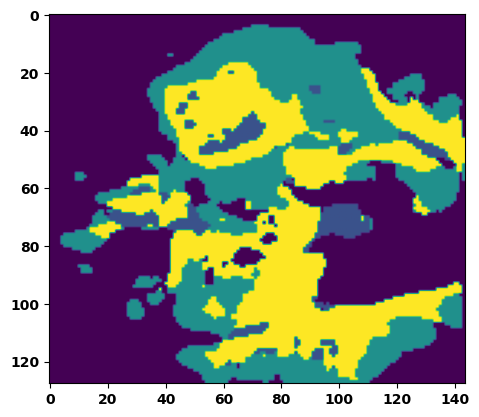

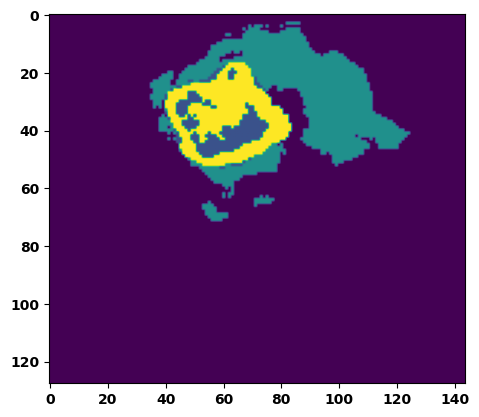

 61%|██████    | 22/36 [00:23<00:15,  1.08s/it]

Batch_id:  21 Eval loss:  0.7660557627677917
Batch_id:  21 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.09s/it]

Batch_id:  22 Eval loss:  0.5058561563491821
Batch_id:  22 Eval IoU:  tensor(0.4458, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9816, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:13,  1.09s/it]

Batch_id:  23 Eval loss:  0.7666746973991394
Batch_id:  23 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:12,  1.11s/it]

Batch_id:  24 Eval loss:  0.7935848236083984
Batch_id:  24 Eval IoU:  tensor(0.1578, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.7580, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.6542, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8536, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.6039, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9203, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.10s/it]

Batch_id:  25 Eval loss:  0.6128591895103455
Batch_id:  25 Eval IoU:  tensor(0.3208, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8743, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8369, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.10s/it]

Batch_id:  26 Eval loss:  0.5337513089179993
Batch_id:  26 Eval IoU:  tensor(0.3644, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.7415, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4963, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.5169, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 78%|███████▊  | 28/36 [00:30<00:09,  1.21s/it]

Batch_id:  27 Eval loss:  0.7571432590484619
Batch_id:  27 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 81%|████████  | 29/36 [00:31<00:08,  1.15s/it]

Batch_id:  28 Eval loss:  0.7639102935791016
Batch_id:  28 Eval IoU:  tensor(0.2234, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8935, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 83%|████████▎ | 30/36 [00:32<00:06,  1.14s/it]

Batch_id:  29 Eval loss:  0.363201379776001
Batch_id:  29 Eval IoU:  tensor(0.5617, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  30 Eval loss:  0.47675222158432007
Batch_id:  30 Eval IoU:  tensor(0.4008, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.6838, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4051, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.3800, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9781, device='cuda:0')


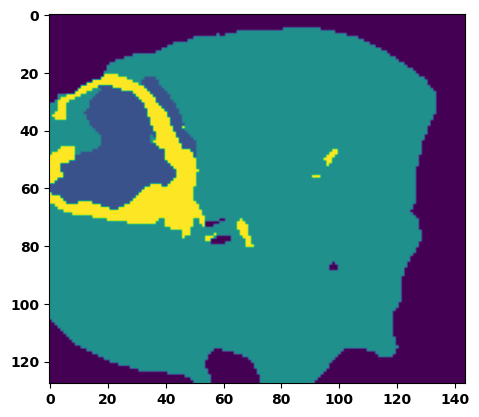

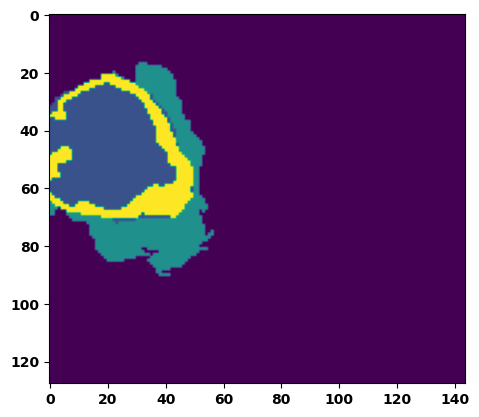

 89%|████████▉ | 32/36 [00:34<00:04,  1.11s/it]

Batch_id:  31 Eval loss:  0.751797616481781
Batch_id:  31 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 92%|█████████▏| 33/36 [00:35<00:03,  1.09s/it]

Batch_id:  32 Eval loss:  0.7563223242759705
Batch_id:  32 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 94%|█████████▍| 34/36 [00:36<00:02,  1.11s/it]

Batch_id:  33 Eval loss:  0.6044365763664246
Batch_id:  33 Eval IoU:  tensor(0.2998, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8492, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7409, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7718, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9638, device='cuda:0')


 97%|█████████▋| 35/36 [00:37<00:01,  1.08s/it]

Batch_id:  34 Eval loss:  0.7168797850608826
Batch_id:  34 Eval IoU:  tensor(0.2416, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.07s/it]

Batch_id:  35 Eval loss:  0.6701986193656921
Batch_id:  35 Eval IoU:  tensor(0.2681, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8887, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8470, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7802, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')
Epoch  47 Training loss:  0.13243410153822466
Epoch  47 Evaluation loss:  0.6514625251293182
Epoch  47 Training accuracy :  tensor(0.8006)
Epoch  47 Evaluation accuracy :  tensor(0.2958)
Epoch  47 Training Mean Dice Score:  tensor(0.9890)
Epoch  47 Eval Mean Dice Score:  tensor(0.8929)
Epoch  47 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  47 Eval Non-tumor Dice Score:  tensor(0.8207)
Epoch  47 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  47 Eval NCR/NET Dice Score:  tensor(0.9652)
Epoch  47 Training ED Dice Score:  tensor(0.98

Epoch: 48
Training in session: 


  1%|          | 1/110 [00:01<01:59,  1.10s/it]

Batch_id:  0 Training loss:  0.3043607473373413
Batch_id:  0 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:54,  1.06s/it]

Batch_id:  1 Training loss:  0.08241792023181915
Batch_id:  1 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:53,  1.06s/it]

Batch_id:  2 Training loss:  0.14719882607460022
Batch_id:  2 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:51,  1.05s/it]

Batch_id:  3 Training loss:  0.1262190341949463
Batch_id:  3 Training IoU:  tensor(0.7859, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:50,  1.05s/it]

Batch_id:  4 Training loss:  0.2495657056570053
Batch_id:  4 Training IoU:  tensor(0.6299, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:50,  1.07s/it]

Batch_id:  5 Training loss:  0.07979775965213776
Batch_id:  5 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:49,  1.06s/it]

Batch_id:  6 Training loss:  0.08892692625522614
Batch_id:  6 Training IoU:  tensor(0.8457, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:51,  1.09s/it]

Batch_id:  7 Training loss:  0.05718867480754852
Batch_id:  7 Training IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:49,  1.08s/it]

Batch_id:  8 Training loss:  0.08739916980266571
Batch_id:  8 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:47,  1.08s/it]

Batch_id:  9 Training loss:  0.14694887399673462
Batch_id:  9 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 10%|█         | 11/110 [00:11<01:45,  1.06s/it]

Batch_id:  10 Training loss:  0.1259179711341858
Batch_id:  10 Training IoU:  tensor(0.8122, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 11%|█         | 12/110 [00:12<01:47,  1.10s/it]

Batch_id:  11 Training loss:  0.04902404546737671
Batch_id:  11 Training IoU:  tensor(0.9140, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 12%|█▏        | 13/110 [00:14<01:47,  1.11s/it]

Batch_id:  12 Training loss:  0.05036269128322601
Batch_id:  12 Training IoU:  tensor(0.9142, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:44,  1.09s/it]

Batch_id:  13 Training loss:  0.15225331485271454
Batch_id:  13 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:44,  1.10s/it]

Batch_id:  14 Training loss:  0.0628618448972702
Batch_id:  14 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:43,  1.11s/it]

Batch_id:  15 Training loss:  0.34326452016830444
Batch_id:  15 Training IoU:  tensor(0.6048, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:40,  1.08s/it]

Batch_id:  16 Training loss:  0.21548667550086975
Batch_id:  16 Training IoU:  tensor(0.7067, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:39,  1.09s/it]

Batch_id:  17 Training loss:  0.1793093979358673
Batch_id:  17 Training IoU:  tensor(0.7215, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:38,  1.08s/it]

Batch_id:  18 Training loss:  0.32821905612945557
Batch_id:  18 Training IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:36,  1.07s/it]

Batch_id:  19 Training loss:  0.08093664050102234
Batch_id:  19 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:35,  1.07s/it]

Batch_id:  20 Training loss:  0.12819704413414001
Batch_id:  20 Training IoU:  tensor(0.7855, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 20%|██        | 22/110 [00:23<01:35,  1.09s/it]

Batch_id:  21 Training loss:  0.12460929155349731
Batch_id:  21 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 21%|██        | 23/110 [00:24<01:35,  1.10s/it]

Batch_id:  22 Training loss:  0.07371686398983002
Batch_id:  22 Training IoU:  tensor(0.8683, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 22%|██▏       | 24/110 [00:26<01:34,  1.10s/it]

Batch_id:  23 Training loss:  0.08086395263671875
Batch_id:  23 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 23%|██▎       | 25/110 [00:27<01:32,  1.09s/it]

Batch_id:  24 Training loss:  0.1566128432750702
Batch_id:  24 Training IoU:  tensor(0.8116, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 24%|██▎       | 26/110 [00:28<01:30,  1.07s/it]

Batch_id:  25 Training loss:  0.1677522361278534
Batch_id:  25 Training IoU:  tensor(0.7284, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 25%|██▍       | 27/110 [00:29<01:28,  1.07s/it]

Batch_id:  26 Training loss:  0.07178905606269836
Batch_id:  26 Training IoU:  tensor(0.8747, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 25%|██▌       | 28/110 [00:30<01:26,  1.05s/it]

Batch_id:  27 Training loss:  0.06977862119674683
Batch_id:  27 Training IoU:  tensor(0.8777, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:24,  1.05s/it]

Batch_id:  28 Training loss:  0.1577538549900055
Batch_id:  28 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:23,  1.04s/it]

Batch_id:  29 Training loss:  0.07880900800228119
Batch_id:  29 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:23,  1.06s/it]

Batch_id:  30 Training loss:  0.17520883679389954
Batch_id:  30 Training IoU:  tensor(0.7424, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:24,  1.08s/it]

Batch_id:  31 Training loss:  0.09701116383075714
Batch_id:  31 Training IoU:  tensor(0.9031, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 30%|███       | 33/110 [00:35<01:22,  1.07s/it]

Batch_id:  32 Training loss:  0.10955239832401276
Batch_id:  32 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 31%|███       | 34/110 [00:36<01:20,  1.07s/it]

Batch_id:  33 Training loss:  0.14587320387363434
Batch_id:  33 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:19,  1.05s/it]

Batch_id:  34 Training loss:  0.12172062695026398
Batch_id:  34 Training IoU:  tensor(0.8068, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.10411335527896881
Batch_id:  35 Training IoU:  tensor(0.8345, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:19,  1.09s/it]

Batch_id:  36 Training loss:  0.13029320538043976
Batch_id:  36 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:19,  1.10s/it]

Batch_id:  37 Training loss:  0.12729014456272125
Batch_id:  37 Training IoU:  tensor(0.8093, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 35%|███▌      | 39/110 [00:42<01:16,  1.08s/it]

Batch_id:  38 Training loss:  0.0925702452659607
Batch_id:  38 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 36%|███▋      | 40/110 [00:43<01:15,  1.07s/it]

Batch_id:  39 Training loss:  0.06627091765403748
Batch_id:  39 Training IoU:  tensor(0.8877, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 37%|███▋      | 41/110 [00:44<01:14,  1.08s/it]

Batch_id:  40 Training loss:  0.11540025472640991
Batch_id:  40 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:13,  1.09s/it]

Batch_id:  41 Training loss:  0.0787706971168518
Batch_id:  41 Training IoU:  tensor(0.8601, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.14101210236549377
Batch_id:  42 Training IoU:  tensor(0.7868, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 40%|████      | 44/110 [00:47<01:11,  1.09s/it]

Batch_id:  43 Training loss:  0.06554634869098663
Batch_id:  43 Training IoU:  tensor(0.8935, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 41%|████      | 45/110 [00:48<01:11,  1.10s/it]

Batch_id:  44 Training loss:  0.25272297859191895
Batch_id:  44 Training IoU:  tensor(0.6826, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:10,  1.10s/it]

Batch_id:  45 Training loss:  0.15468859672546387
Batch_id:  45 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:09,  1.10s/it]

Batch_id:  46 Training loss:  0.13717879354953766
Batch_id:  46 Training IoU:  tensor(0.7847, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:09,  1.13s/it]

Batch_id:  47 Training loss:  0.19722962379455566
Batch_id:  47 Training IoU:  tensor(0.7316, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:07,  1.10s/it]

Batch_id:  48 Training loss:  0.059728607535362244
Batch_id:  48 Training IoU:  tensor(0.8975, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 45%|████▌     | 50/110 [00:54<01:06,  1.10s/it]

Batch_id:  49 Training loss:  0.1813010275363922
Batch_id:  49 Training IoU:  tensor(0.7126, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 46%|████▋     | 51/110 [00:55<01:04,  1.09s/it]

Batch_id:  50 Training loss:  0.15083664655685425
Batch_id:  50 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 47%|████▋     | 52/110 [00:56<01:03,  1.10s/it]

Batch_id:  51 Training loss:  0.10424613952636719
Batch_id:  51 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:04,  1.12s/it]

Batch_id:  52 Training loss:  0.057668983936309814
Batch_id:  52 Training IoU:  tensor(0.8996, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:02,  1.11s/it]

Batch_id:  53 Training loss:  0.08219791948795319
Batch_id:  53 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 50%|█████     | 55/110 [00:59<00:59,  1.08s/it]

Batch_id:  54 Training loss:  0.14498519897460938
Batch_id:  54 Training IoU:  tensor(0.7671, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:57,  1.06s/it]

Batch_id:  55 Training loss:  0.127497136592865
Batch_id:  55 Training IoU:  tensor(0.7885, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:54,  1.04s/it]

Batch_id:  56 Training loss:  0.14679323136806488
Batch_id:  56 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:53,  1.02s/it]

Batch_id:  57 Training loss:  0.37434157729148865
Batch_id:  57 Training IoU:  tensor(0.5384, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:52,  1.04s/it]

Batch_id:  58 Training loss:  0.19798709452152252
Batch_id:  58 Training IoU:  tensor(0.6928, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:52,  1.05s/it]

Batch_id:  59 Training loss:  0.14201436936855316
Batch_id:  59 Training IoU:  tensor(0.8015, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:51,  1.06s/it]

Batch_id:  60 Training loss:  0.08030913770198822
Batch_id:  60 Training IoU:  tensor(0.8693, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:51,  1.06s/it]

Batch_id:  61 Training loss:  0.10856521129608154
Batch_id:  61 Training IoU:  tensor(0.8161, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 57%|█████▋    | 63/110 [01:07<00:50,  1.07s/it]

Batch_id:  62 Training loss:  0.08479408919811249
Batch_id:  62 Training IoU:  tensor(0.8542, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:49,  1.08s/it]

Batch_id:  63 Training loss:  0.06420965492725372
Batch_id:  63 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:48,  1.07s/it]

Batch_id:  64 Training loss:  0.131144717335701
Batch_id:  64 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:47,  1.08s/it]

Batch_id:  65 Training loss:  0.18179583549499512
Batch_id:  65 Training IoU:  tensor(0.7121, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:46,  1.08s/it]

Batch_id:  66 Training loss:  0.31510066986083984
Batch_id:  66 Training IoU:  tensor(0.6615, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 62%|██████▏   | 68/110 [01:13<00:44,  1.07s/it]

Batch_id:  67 Training loss:  0.0848022997379303
Batch_id:  67 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 63%|██████▎   | 69/110 [01:14<00:43,  1.06s/it]

Batch_id:  68 Training loss:  0.06268113851547241
Batch_id:  68 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 64%|██████▎   | 70/110 [01:15<00:42,  1.06s/it]

Batch_id:  69 Training loss:  0.13171017169952393
Batch_id:  69 Training IoU:  tensor(0.7899, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 65%|██████▍   | 71/110 [01:16<00:41,  1.06s/it]

Batch_id:  70 Training loss:  0.20501479506492615
Batch_id:  70 Training IoU:  tensor(0.6938, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 65%|██████▌   | 72/110 [01:17<00:42,  1.11s/it]

Batch_id:  71 Training loss:  0.09366707503795624
Batch_id:  71 Training IoU:  tensor(0.8366, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 66%|██████▋   | 73/110 [01:18<00:40,  1.09s/it]

Batch_id:  72 Training loss:  0.16507858037948608
Batch_id:  72 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 67%|██████▋   | 74/110 [01:19<00:38,  1.08s/it]

Batch_id:  73 Training loss:  0.08750416338443756
Batch_id:  73 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 68%|██████▊   | 75/110 [01:20<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.056795939803123474
Batch_id:  74 Training IoU:  tensor(0.9012, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 69%|██████▉   | 76/110 [01:21<00:36,  1.07s/it]

Batch_id:  75 Training loss:  0.04908125102519989
Batch_id:  75 Training IoU:  tensor(0.9174, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:37,  1.14s/it]

Batch_id:  76 Training loss:  0.047138288617134094
Batch_id:  76 Training IoU:  tensor(0.9307, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:35,  1.09s/it]

Batch_id:  77 Training loss:  0.1588279753923416
Batch_id:  77 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.12326966226100922
Batch_id:  78 Training IoU:  tensor(0.8162, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.18873831629753113
Batch_id:  79 Training IoU:  tensor(0.7283, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:31,  1.08s/it]

Batch_id:  80 Training loss:  0.09381012618541718
Batch_id:  80 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 75%|███████▍  | 82/110 [01:28<00:29,  1.05s/it]

Batch_id:  81 Training loss:  0.10168115794658661
Batch_id:  81 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▌  | 83/110 [01:29<00:29,  1.09s/it]

Batch_id:  82 Training loss:  0.04502539336681366
Batch_id:  82 Training IoU:  tensor(0.9189, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 76%|███████▋  | 84/110 [01:30<00:28,  1.09s/it]

Batch_id:  83 Training loss:  0.34064704179763794
Batch_id:  83 Training IoU:  tensor(0.5421, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 77%|███████▋  | 85/110 [01:31<00:26,  1.06s/it]

Batch_id:  84 Training loss:  0.06285139918327332
Batch_id:  84 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 78%|███████▊  | 86/110 [01:32<00:25,  1.05s/it]

Batch_id:  85 Training loss:  0.10459843277931213
Batch_id:  85 Training IoU:  tensor(0.8285, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 79%|███████▉  | 87/110 [01:33<00:24,  1.06s/it]

Batch_id:  86 Training loss:  0.44797369837760925
Batch_id:  86 Training IoU:  tensor(0.4683, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 80%|████████  | 88/110 [01:34<00:23,  1.07s/it]

Batch_id:  87 Training loss:  0.233064666390419
Batch_id:  87 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 81%|████████  | 89/110 [01:35<00:22,  1.07s/it]

Batch_id:  88 Training loss:  0.08581247925758362
Batch_id:  88 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 82%|████████▏ | 90/110 [01:36<00:21,  1.07s/it]

Batch_id:  89 Training loss:  0.1299879103899002
Batch_id:  89 Training IoU:  tensor(0.7830, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:21,  1.11s/it]

Batch_id:  90 Training loss:  0.12771345674991608
Batch_id:  90 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:20,  1.12s/it]

Batch_id:  91 Training loss:  0.06497856974601746
Batch_id:  91 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.08261242508888245
Batch_id:  92 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 85%|████████▌ | 94/110 [01:41<00:17,  1.10s/it]

Batch_id:  93 Training loss:  0.09531338512897491
Batch_id:  93 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 86%|████████▋ | 95/110 [01:42<00:16,  1.11s/it]

Batch_id:  94 Training loss:  0.05263693630695343
Batch_id:  94 Training IoU:  tensor(0.9067, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 87%|████████▋ | 96/110 [01:43<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.14011837542057037
Batch_id:  95 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 88%|████████▊ | 97/110 [01:44<00:14,  1.12s/it]

Batch_id:  96 Training loss:  0.0742768943309784
Batch_id:  96 Training IoU:  tensor(0.8704, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 89%|████████▉ | 98/110 [01:45<00:13,  1.09s/it]

Batch_id:  97 Training loss:  0.1655070036649704
Batch_id:  97 Training IoU:  tensor(0.7706, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 90%|█████████ | 99/110 [01:46<00:11,  1.08s/it]

Batch_id:  98 Training loss:  0.09098461270332336
Batch_id:  98 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:11,  1.16s/it]

Batch_id:  99 Training loss:  0.061359256505966187
Batch_id:  99 Training IoU:  tensor(0.8925, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.11s/it]

Batch_id:  100 Training loss:  0.10788914561271667
Batch_id:  100 Training IoU:  tensor(0.8279, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.10s/it]

Batch_id:  101 Training loss:  0.06034475564956665
Batch_id:  101 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 94%|█████████▎| 103/110 [01:51<00:07,  1.09s/it]

Batch_id:  102 Training loss:  0.1569068431854248
Batch_id:  102 Training IoU:  tensor(0.7509, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 95%|█████████▍| 104/110 [01:52<00:06,  1.08s/it]

Batch_id:  103 Training loss:  0.1474255621433258
Batch_id:  103 Training IoU:  tensor(0.7648, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 95%|█████████▌| 105/110 [01:53<00:05,  1.09s/it]

Batch_id:  104 Training loss:  0.08101002871990204
Batch_id:  104 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 96%|█████████▋| 106/110 [01:54<00:04,  1.09s/it]

Batch_id:  105 Training loss:  0.10695458948612213
Batch_id:  105 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 97%|█████████▋| 107/110 [01:55<00:03,  1.09s/it]

Batch_id:  106 Training loss:  0.07868023216724396
Batch_id:  106 Training IoU:  tensor(0.8615, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 98%|█████████▊| 108/110 [01:56<00:02,  1.09s/it]

Batch_id:  107 Training loss:  0.20840923488140106
Batch_id:  107 Training IoU:  tensor(0.7098, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 99%|█████████▉| 109/110 [01:57<00:01,  1.10s/it]

Batch_id:  108 Training loss:  0.32970449328422546
Batch_id:  108 Training IoU:  tensor(0.5736, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.08s/it]


Batch_id:  109 Training loss:  0.13488242030143738
Batch_id:  109 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9949, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7535054683685303
Batch_id:  0 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


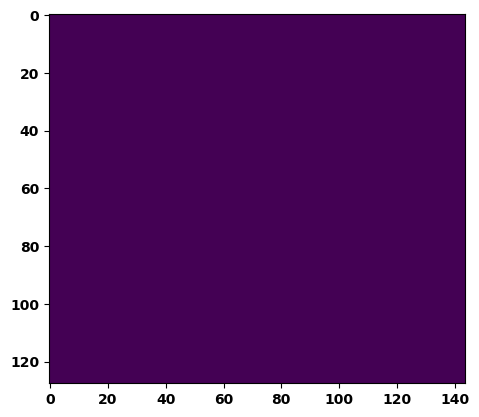

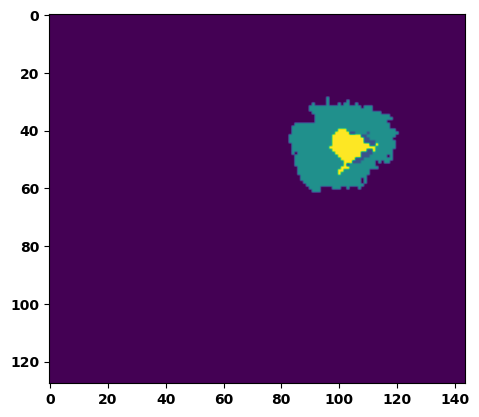

  6%|▌         | 2/36 [00:02<00:36,  1.06s/it]

Batch_id:  1 Eval loss:  0.7653883695602417
Batch_id:  1 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:33,  1.03s/it]

Batch_id:  2 Eval loss:  0.7910127639770508
Batch_id:  2 Eval IoU:  tensor(0.1775, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8451, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7134, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8999, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 11%|█         | 4/36 [00:04<00:32,  1.00s/it]

Batch_id:  3 Eval loss:  0.7778298854827881
Batch_id:  3 Eval IoU:  tensor(0.1999, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8997, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7996, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.03s/it]

Batch_id:  4 Eval loss:  0.705715537071228
Batch_id:  4 Eval IoU:  tensor(0.2515, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9615, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.03s/it]

Batch_id:  5 Eval loss:  0.7691527009010315
Batch_id:  5 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:30,  1.04s/it]

Batch_id:  6 Eval loss:  0.8021801710128784
Batch_id:  6 Eval IoU:  tensor(0.1636, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8273, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.6546, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.7982, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:28,  1.03s/it]

Batch_id:  7 Eval loss:  0.5800544023513794
Batch_id:  7 Eval IoU:  tensor(0.3305, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8734, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9560, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:27,  1.00s/it]

Batch_id:  8 Eval loss:  0.7097213864326477
Batch_id:  8 Eval IoU:  tensor(0.1825, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6731, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4216, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.3938, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:25,  1.00it/s]

Batch_id:  9 Eval loss:  0.7335978150367737
Batch_id:  9 Eval IoU:  tensor(0.2410, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  10 Eval loss:  0.1486450731754303
Batch_id:  10 Eval IoU:  tensor(0.7547, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9806, device='cuda:0')


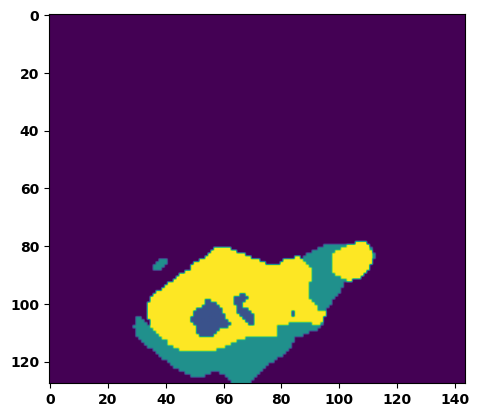

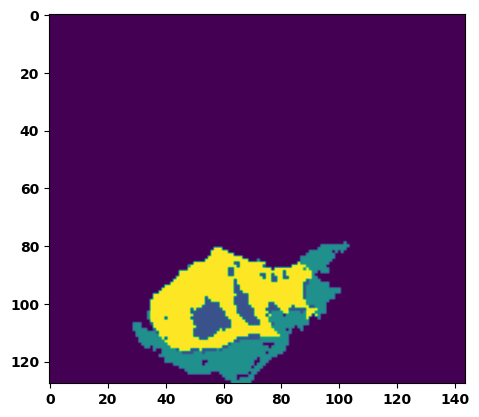

 33%|███▎      | 12/36 [00:12<00:24,  1.04s/it]

Batch_id:  11 Eval loss:  0.38602882623672485
Batch_id:  11 Eval IoU:  tensor(0.5357, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9621, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:23,  1.02s/it]

Batch_id:  12 Eval loss:  0.7562800645828247
Batch_id:  12 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:22,  1.03s/it]

Batch_id:  13 Eval loss:  0.6574235558509827
Batch_id:  13 Eval IoU:  tensor(0.2714, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8822, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8270, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.7816, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 42%|████▏     | 15/36 [00:15<00:21,  1.05s/it]

Batch_id:  14 Eval loss:  0.8822562098503113
Batch_id:  14 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.6220, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4182, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2441, device='cuda:0')


 44%|████▍     | 16/36 [00:16<00:20,  1.05s/it]

Batch_id:  15 Eval loss:  0.301979660987854
Batch_id:  15 Eval IoU:  tensor(0.6315, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 47%|████▋     | 17/36 [00:17<00:20,  1.07s/it]

Batch_id:  16 Eval loss:  0.7571403384208679
Batch_id:  16 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 50%|█████     | 18/36 [00:18<00:19,  1.10s/it]

Batch_id:  17 Eval loss:  0.40396592020988464
Batch_id:  17 Eval IoU:  tensor(0.5077, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8627, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.7341, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8014, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 19/36 [00:19<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.7757391929626465
Batch_id:  18 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 56%|█████▌    | 20/36 [00:20<00:17,  1.08s/it]

Batch_id:  19 Eval loss:  0.7397158145904541
Batch_id:  19 Eval IoU:  tensor(0.1769, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7430, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5661, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8340, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.6473, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  20 Eval loss:  0.7735811471939087
Batch_id:  20 Eval IoU:  tensor(0.1978, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8874, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.7750, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.8859, device='cuda:0')


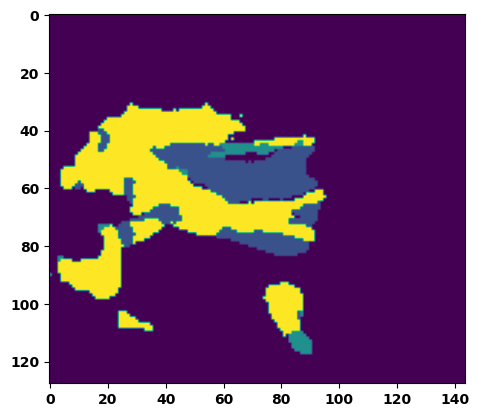

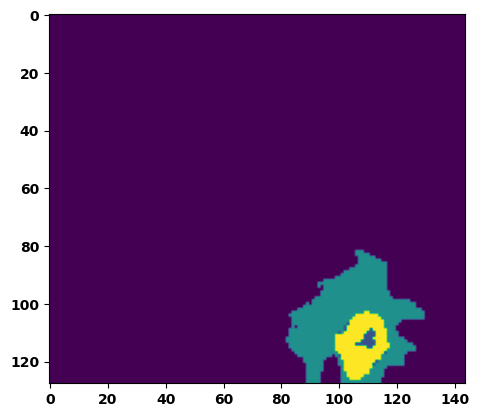

 61%|██████    | 22/36 [00:23<00:15,  1.09s/it]

Batch_id:  21 Eval loss:  0.6895171999931335
Batch_id:  21 Eval IoU:  tensor(0.2752, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:14,  1.08s/it]

Batch_id:  22 Eval loss:  0.801084041595459
Batch_id:  22 Eval IoU:  tensor(0.1322, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7158, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.4873, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.4320, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.07s/it]

Batch_id:  23 Eval loss:  0.7805265188217163
Batch_id:  23 Eval IoU:  tensor(0.1336, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.6079, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3154, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8928, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.2759, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:11,  1.07s/it]

Batch_id:  24 Eval loss:  0.7410752773284912
Batch_id:  24 Eval IoU:  tensor(0.2430, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8078, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9424, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:10,  1.03s/it]

Batch_id:  25 Eval loss:  0.7689514756202698
Batch_id:  25 Eval IoU:  tensor(0.2147, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:09,  1.03s/it]

Batch_id:  26 Eval loss:  0.1501714140176773
Batch_id:  26 Eval IoU:  tensor(0.7733, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.08s/it]

Batch_id:  27 Eval loss:  0.7610388398170471
Batch_id:  27 Eval IoU:  tensor(0.2284, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:07,  1.09s/it]

Batch_id:  28 Eval loss:  0.8407315015792847
Batch_id:  28 Eval IoU:  tensor(0.0966, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6451, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3838, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2911, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.07s/it]

Batch_id:  29 Eval loss:  0.7517953515052795
Batch_id:  29 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  30 Eval loss:  0.6499722599983215
Batch_id:  30 Eval IoU:  tensor(0.2899, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9755, device='cuda:0')


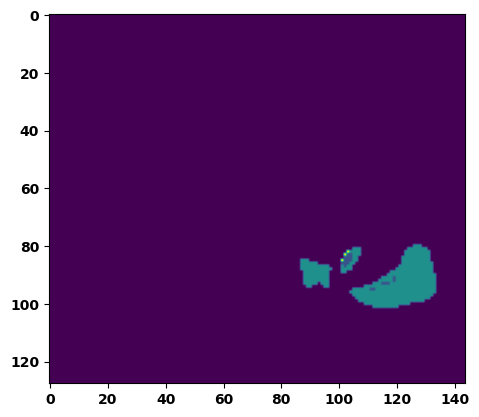

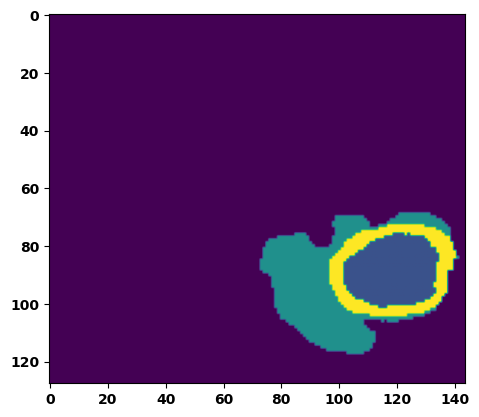

 89%|████████▉ | 32/36 [00:33<00:04,  1.10s/it]

Batch_id:  31 Eval loss:  0.766046404838562
Batch_id:  31 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.10s/it]

Batch_id:  32 Eval loss:  0.5707830190658569
Batch_id:  32 Eval IoU:  tensor(0.3428, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8446, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9502, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.7958688139915466
Batch_id:  33 Eval IoU:  tensor(0.1309, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6894, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4970, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8727, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.4124, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.06s/it]

Batch_id:  34 Eval loss:  0.06772619485855103
Batch_id:  34 Eval IoU:  tensor(0.8810, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


100%|██████████| 36/36 [00:38<00:00,  1.06s/it]

Batch_id:  35 Eval loss:  0.6931116580963135
Batch_id:  35 Eval IoU:  tensor(0.1990, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7407, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.5120, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.6897, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8399, device='cuda:0')
Epoch 00049: reducing learning rate of group 0 to 3.9063e-06.
Epoch  48 Training loss:  0.13257257721640847
Epoch  48 Evaluation loss:  0.6610920632051097
Epoch  48 Training accuracy :  tensor(0.8002)
Epoch  48 Evaluation accuracy :  tensor(0.2904)
Epoch  48 Training Mean Dice Score:  tensor(0.9890)
Epoch  48 Eval Mean Dice Score:  tensor(0.8783)
Epoch  48 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  48 Eval Non-tumor Dice Score:  tensor(0.7894)
Epoch  48 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  48 Eval NCR/NET Dice Score: 

Epoch: 49
Training in session: 


  1%|          | 1/110 [00:01<02:15,  1.24s/it]

Batch_id:  0 Training loss:  0.3659956157207489
Batch_id:  0 Training IoU:  tensor(0.5463, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  2%|▏         | 2/110 [00:02<01:56,  1.08s/it]

Batch_id:  1 Training loss:  0.09978280961513519
Batch_id:  1 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  3%|▎         | 3/110 [00:03<01:56,  1.09s/it]

Batch_id:  2 Training loss:  0.150141179561615
Batch_id:  2 Training IoU:  tensor(0.7626, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


  4%|▎         | 4/110 [00:04<01:54,  1.08s/it]

Batch_id:  3 Training loss:  0.0653548389673233
Batch_id:  3 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  5%|▍         | 5/110 [00:05<01:53,  1.08s/it]

Batch_id:  4 Training loss:  0.09092140197753906
Batch_id:  4 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


  5%|▌         | 6/110 [00:06<01:51,  1.07s/it]

Batch_id:  5 Training loss:  0.14036540687084198
Batch_id:  5 Training IoU:  tensor(0.8036, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  6%|▋         | 7/110 [00:07<01:50,  1.07s/it]

Batch_id:  6 Training loss:  0.08232481777667999
Batch_id:  6 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


  7%|▋         | 8/110 [00:08<01:48,  1.06s/it]

Batch_id:  7 Training loss:  0.06889203190803528
Batch_id:  7 Training IoU:  tensor(0.8794, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


  8%|▊         | 9/110 [00:09<01:48,  1.07s/it]

Batch_id:  8 Training loss:  0.0714750587940216
Batch_id:  8 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  9%|▉         | 10/110 [00:10<01:45,  1.06s/it]

Batch_id:  9 Training loss:  0.1641542762517929
Batch_id:  9 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 10%|█         | 11/110 [00:11<01:44,  1.05s/it]

Batch_id:  10 Training loss:  0.07831710577011108
Batch_id:  10 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 11%|█         | 12/110 [00:12<01:44,  1.06s/it]

Batch_id:  11 Training loss:  0.18437230587005615
Batch_id:  11 Training IoU:  tensor(0.7096, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 12%|█▏        | 13/110 [00:13<01:43,  1.07s/it]

Batch_id:  12 Training loss:  0.07944546639919281
Batch_id:  12 Training IoU:  tensor(0.8600, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 13%|█▎        | 14/110 [00:15<01:42,  1.07s/it]

Batch_id:  13 Training loss:  0.0817328691482544
Batch_id:  13 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 14%|█▎        | 15/110 [00:16<01:41,  1.06s/it]

Batch_id:  14 Training loss:  0.12600408494472504
Batch_id:  14 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 15%|█▍        | 16/110 [00:17<01:39,  1.06s/it]

Batch_id:  15 Training loss:  0.10693947970867157
Batch_id:  15 Training IoU:  tensor(0.8290, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 15%|█▌        | 17/110 [00:18<01:39,  1.07s/it]

Batch_id:  16 Training loss:  0.08183898031711578
Batch_id:  16 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 16%|█▋        | 18/110 [00:19<01:36,  1.05s/it]

Batch_id:  17 Training loss:  0.08610416948795319
Batch_id:  17 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 17%|█▋        | 19/110 [00:20<01:35,  1.05s/it]

Batch_id:  18 Training loss:  0.14220668375492096
Batch_id:  18 Training IoU:  tensor(0.7847, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 18%|█▊        | 20/110 [00:21<01:34,  1.06s/it]

Batch_id:  19 Training loss:  0.047914743423461914
Batch_id:  19 Training IoU:  tensor(0.9194, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 19%|█▉        | 21/110 [00:22<01:33,  1.05s/it]

Batch_id:  20 Training loss:  0.07939915359020233
Batch_id:  20 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 20%|██        | 22/110 [00:23<01:33,  1.06s/it]

Batch_id:  21 Training loss:  0.3241414427757263
Batch_id:  21 Training IoU:  tensor(0.5777, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 21%|██        | 23/110 [00:24<01:32,  1.06s/it]

Batch_id:  22 Training loss:  0.21291202306747437
Batch_id:  22 Training IoU:  tensor(0.7073, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 22%|██▏       | 24/110 [00:25<01:31,  1.07s/it]

Batch_id:  23 Training loss:  0.10992555320262909
Batch_id:  23 Training IoU:  tensor(0.8134, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 23%|██▎       | 25/110 [00:26<01:30,  1.07s/it]

Batch_id:  24 Training loss:  0.1658201515674591
Batch_id:  24 Training IoU:  tensor(0.7420, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 24%|██▎       | 26/110 [00:27<01:29,  1.07s/it]

Batch_id:  25 Training loss:  0.14724183082580566
Batch_id:  25 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 25%|██▍       | 27/110 [00:28<01:29,  1.07s/it]

Batch_id:  26 Training loss:  0.12622688710689545
Batch_id:  26 Training IoU:  tensor(0.8101, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 25%|██▌       | 28/110 [00:29<01:28,  1.07s/it]

Batch_id:  27 Training loss:  0.046792834997177124
Batch_id:  27 Training IoU:  tensor(0.9314, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 26%|██▋       | 29/110 [00:31<01:28,  1.09s/it]

Batch_id:  28 Training loss:  0.19236283004283905
Batch_id:  28 Training IoU:  tensor(0.7394, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 27%|██▋       | 30/110 [00:32<01:26,  1.08s/it]

Batch_id:  29 Training loss:  0.15178519487380981
Batch_id:  29 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 28%|██▊       | 31/110 [00:33<01:26,  1.10s/it]

Batch_id:  30 Training loss:  0.04906865954399109
Batch_id:  30 Training IoU:  tensor(0.9139, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 29%|██▉       | 32/110 [00:34<01:25,  1.10s/it]

Batch_id:  31 Training loss:  0.1345466524362564
Batch_id:  31 Training IoU:  tensor(0.7889, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 30%|███       | 33/110 [00:35<01:25,  1.11s/it]

Batch_id:  32 Training loss:  0.07419857382774353
Batch_id:  32 Training IoU:  tensor(0.8707, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 31%|███       | 34/110 [00:36<01:22,  1.09s/it]

Batch_id:  33 Training loss:  0.1478588730096817
Batch_id:  33 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 32%|███▏      | 35/110 [00:37<01:20,  1.08s/it]

Batch_id:  34 Training loss:  0.32904744148254395
Batch_id:  34 Training IoU:  tensor(0.6162, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 33%|███▎      | 36/110 [00:38<01:19,  1.07s/it]

Batch_id:  35 Training loss:  0.08021417260169983
Batch_id:  35 Training IoU:  tensor(0.8692, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 34%|███▎      | 37/110 [00:39<01:17,  1.07s/it]

Batch_id:  36 Training loss:  0.12802983820438385
Batch_id:  36 Training IoU:  tensor(0.7875, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 35%|███▍      | 38/110 [00:40<01:17,  1.08s/it]

Batch_id:  37 Training loss:  0.1470937877893448
Batch_id:  37 Training IoU:  tensor(0.7647, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 35%|███▌      | 39/110 [00:41<01:17,  1.09s/it]

Batch_id:  38 Training loss:  0.10102406144142151
Batch_id:  38 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 36%|███▋      | 40/110 [00:42<01:14,  1.07s/it]

Batch_id:  39 Training loss:  0.15888118743896484
Batch_id:  39 Training IoU:  tensor(0.7439, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 37%|███▋      | 41/110 [00:43<01:13,  1.07s/it]

Batch_id:  40 Training loss:  0.10463117063045502
Batch_id:  40 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 38%|███▊      | 42/110 [00:45<01:13,  1.08s/it]

Batch_id:  41 Training loss:  0.1275494396686554
Batch_id:  41 Training IoU:  tensor(0.7866, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 39%|███▉      | 43/110 [00:46<01:12,  1.08s/it]

Batch_id:  42 Training loss:  0.17624935507774353
Batch_id:  42 Training IoU:  tensor(0.7425, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 40%|████      | 44/110 [00:47<01:12,  1.10s/it]

Batch_id:  43 Training loss:  0.09733374416828156
Batch_id:  43 Training IoU:  tensor(0.9012, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 41%|████      | 45/110 [00:48<01:09,  1.08s/it]

Batch_id:  44 Training loss:  0.12875768542289734
Batch_id:  44 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 42%|████▏     | 46/110 [00:49<01:09,  1.09s/it]

Batch_id:  45 Training loss:  0.044293567538261414
Batch_id:  45 Training IoU:  tensor(0.9207, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 43%|████▎     | 47/110 [00:50<01:08,  1.09s/it]

Batch_id:  46 Training loss:  0.09400573372840881
Batch_id:  46 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 44%|████▎     | 48/110 [00:51<01:08,  1.11s/it]

Batch_id:  47 Training loss:  0.08122612535953522
Batch_id:  47 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 45%|████▍     | 49/110 [00:52<01:06,  1.09s/it]

Batch_id:  48 Training loss:  0.1284446120262146
Batch_id:  48 Training IoU:  tensor(0.7830, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 45%|████▌     | 50/110 [00:53<01:04,  1.08s/it]

Batch_id:  49 Training loss:  0.1258479654788971
Batch_id:  49 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 46%|████▋     | 51/110 [00:54<01:03,  1.07s/it]

Batch_id:  50 Training loss:  0.08849063515663147
Batch_id:  50 Training IoU:  tensor(0.8464, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 47%|████▋     | 52/110 [00:55<01:03,  1.09s/it]

Batch_id:  51 Training loss:  0.11042484641075134
Batch_id:  51 Training IoU:  tensor(0.8130, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 48%|████▊     | 53/110 [00:57<01:02,  1.10s/it]

Batch_id:  52 Training loss:  0.08664709329605103
Batch_id:  52 Training IoU:  tensor(0.8514, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 49%|████▉     | 54/110 [00:58<01:01,  1.10s/it]

Batch_id:  53 Training loss:  0.06260260939598083
Batch_id:  53 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 50%|█████     | 55/110 [00:59<01:00,  1.09s/it]

Batch_id:  54 Training loss:  0.0607450008392334
Batch_id:  54 Training IoU:  tensor(0.8931, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 51%|█████     | 56/110 [01:00<00:58,  1.08s/it]

Batch_id:  55 Training loss:  0.10688506066799164
Batch_id:  55 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 52%|█████▏    | 57/110 [01:01<00:55,  1.04s/it]

Batch_id:  56 Training loss:  0.1262107491493225
Batch_id:  56 Training IoU:  tensor(0.8121, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 53%|█████▎    | 58/110 [01:02<00:54,  1.05s/it]

Batch_id:  57 Training loss:  0.09339489042758942
Batch_id:  57 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 54%|█████▎    | 59/110 [01:03<00:53,  1.05s/it]

Batch_id:  58 Training loss:  0.0822938084602356
Batch_id:  58 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 55%|█████▍    | 60/110 [01:04<00:54,  1.09s/it]

Batch_id:  59 Training loss:  0.1507348269224167
Batch_id:  59 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 55%|█████▌    | 61/110 [01:05<00:55,  1.14s/it]

Batch_id:  60 Training loss:  0.05789133906364441
Batch_id:  60 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 56%|█████▋    | 62/110 [01:06<00:55,  1.15s/it]

Batch_id:  61 Training loss:  0.08180595934391022
Batch_id:  61 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 57%|█████▋    | 63/110 [01:08<00:53,  1.14s/it]

Batch_id:  62 Training loss:  0.14002232253551483
Batch_id:  62 Training IoU:  tensor(0.7816, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 58%|█████▊    | 64/110 [01:09<00:52,  1.15s/it]

Batch_id:  63 Training loss:  0.05685596168041229
Batch_id:  63 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 59%|█████▉    | 65/110 [01:10<00:51,  1.16s/it]

Batch_id:  64 Training loss:  0.2494664043188095
Batch_id:  64 Training IoU:  tensor(0.6856, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 60%|██████    | 66/110 [01:11<00:50,  1.15s/it]

Batch_id:  65 Training loss:  0.12424474954605103
Batch_id:  65 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 61%|██████    | 67/110 [01:12<00:49,  1.15s/it]

Batch_id:  66 Training loss:  0.050329551100730896
Batch_id:  66 Training IoU:  tensor(0.9143, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 62%|██████▏   | 68/110 [01:14<00:49,  1.18s/it]

Batch_id:  67 Training loss:  0.05714571475982666
Batch_id:  67 Training IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 63%|██████▎   | 69/110 [01:15<00:46,  1.13s/it]

Batch_id:  68 Training loss:  0.15634167194366455
Batch_id:  68 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 64%|██████▎   | 70/110 [01:16<00:43,  1.09s/it]

Batch_id:  69 Training loss:  0.06533312797546387
Batch_id:  69 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 65%|██████▍   | 71/110 [01:17<00:42,  1.09s/it]

Batch_id:  70 Training loss:  0.44246822595596313
Batch_id:  70 Training IoU:  tensor(0.4731, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 65%|██████▌   | 72/110 [01:18<00:41,  1.09s/it]

Batch_id:  71 Training loss:  0.18080437183380127
Batch_id:  71 Training IoU:  tensor(0.7131, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 66%|██████▋   | 73/110 [01:19<00:40,  1.10s/it]

Batch_id:  72 Training loss:  0.05887976288795471
Batch_id:  72 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 67%|██████▋   | 74/110 [01:20<00:38,  1.08s/it]

Batch_id:  73 Training loss:  0.15651582181453705
Batch_id:  73 Training IoU:  tensor(0.7507, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 68%|██████▊   | 75/110 [01:21<00:37,  1.08s/it]

Batch_id:  74 Training loss:  0.31658124923706055
Batch_id:  74 Training IoU:  tensor(0.6562, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9999, device='cuda:0')


 69%|██████▉   | 76/110 [01:22<00:36,  1.06s/it]

Batch_id:  75 Training loss:  0.1301424354314804
Batch_id:  75 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 70%|███████   | 77/110 [01:23<00:35,  1.07s/it]

Batch_id:  76 Training loss:  0.06276431679725647
Batch_id:  76 Training IoU:  tensor(0.8921, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 71%|███████   | 78/110 [01:24<00:33,  1.06s/it]

Batch_id:  77 Training loss:  0.13513372838497162
Batch_id:  77 Training IoU:  tensor(0.7775, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 72%|███████▏  | 79/110 [01:25<00:33,  1.07s/it]

Batch_id:  78 Training loss:  0.2489190697669983
Batch_id:  78 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 73%|███████▎  | 80/110 [01:26<00:32,  1.07s/it]

Batch_id:  79 Training loss:  0.08791856467723846
Batch_id:  79 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 74%|███████▎  | 81/110 [01:27<00:31,  1.09s/it]

Batch_id:  80 Training loss:  0.07395637035369873
Batch_id:  80 Training IoU:  tensor(0.8681, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 75%|███████▍  | 82/110 [01:29<00:31,  1.12s/it]

Batch_id:  81 Training loss:  0.2292214184999466
Batch_id:  81 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 75%|███████▌  | 83/110 [01:30<00:29,  1.11s/it]

Batch_id:  82 Training loss:  0.15779569745063782
Batch_id:  82 Training IoU:  tensor(0.8091, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 76%|███████▋  | 84/110 [01:31<00:29,  1.13s/it]

Batch_id:  83 Training loss:  0.06426602602005005
Batch_id:  83 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 77%|███████▋  | 85/110 [01:32<00:28,  1.15s/it]

Batch_id:  84 Training loss:  0.12805213034152985
Batch_id:  84 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 78%|███████▊  | 86/110 [01:33<00:26,  1.12s/it]

Batch_id:  85 Training loss:  0.06047581136226654
Batch_id:  85 Training IoU:  tensor(0.8979, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 79%|███████▉  | 87/110 [01:34<00:25,  1.09s/it]

Batch_id:  86 Training loss:  0.09290100634098053
Batch_id:  86 Training IoU:  tensor(0.8431, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 80%|████████  | 88/110 [01:35<00:23,  1.08s/it]

Batch_id:  87 Training loss:  0.10177084803581238
Batch_id:  87 Training IoU:  tensor(0.8379, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 81%|████████  | 89/110 [01:36<00:22,  1.05s/it]

Batch_id:  88 Training loss:  0.09424877166748047
Batch_id:  88 Training IoU:  tensor(0.8364, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 82%|████████▏ | 90/110 [01:37<00:21,  1.05s/it]

Batch_id:  89 Training loss:  0.20259669423103333
Batch_id:  89 Training IoU:  tensor(0.6982, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 83%|████████▎ | 91/110 [01:38<00:19,  1.05s/it]

Batch_id:  90 Training loss:  0.1170397698879242
Batch_id:  90 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 84%|████████▎ | 92/110 [01:39<00:19,  1.09s/it]

Batch_id:  91 Training loss:  0.1685587465763092
Batch_id:  91 Training IoU:  tensor(0.7271, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 85%|████████▍ | 93/110 [01:40<00:18,  1.09s/it]

Batch_id:  92 Training loss:  0.07869996130466461
Batch_id:  92 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 85%|████████▌ | 94/110 [01:42<00:17,  1.09s/it]

Batch_id:  93 Training loss:  0.06331388652324677
Batch_id:  93 Training IoU:  tensor(0.8877, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 86%|████████▋ | 95/110 [01:43<00:16,  1.08s/it]

Batch_id:  94 Training loss:  0.30534034967422485
Batch_id:  94 Training IoU:  tensor(0.6644, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 87%|████████▋ | 96/110 [01:44<00:15,  1.10s/it]

Batch_id:  95 Training loss:  0.3433237075805664
Batch_id:  95 Training IoU:  tensor(0.6053, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 88%|████████▊ | 97/110 [01:45<00:14,  1.14s/it]

Batch_id:  96 Training loss:  0.34011757373809814
Batch_id:  96 Training IoU:  tensor(0.5411, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 89%|████████▉ | 98/110 [01:46<00:13,  1.11s/it]

Batch_id:  97 Training loss:  0.08426956832408905
Batch_id:  97 Training IoU:  tensor(0.8552, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 90%|█████████ | 99/110 [01:47<00:12,  1.11s/it]

Batch_id:  98 Training loss:  0.20557159185409546
Batch_id:  98 Training IoU:  tensor(0.7148, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 91%|█████████ | 100/110 [01:48<00:11,  1.11s/it]

Batch_id:  99 Training loss:  0.19619132578372955
Batch_id:  99 Training IoU:  tensor(0.6951, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 92%|█████████▏| 101/110 [01:49<00:09,  1.10s/it]

Batch_id:  100 Training loss:  0.18787607550621033
Batch_id:  100 Training IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 93%|█████████▎| 102/110 [01:50<00:08,  1.08s/it]

Batch_id:  101 Training loss:  0.1462756246328354
Batch_id:  101 Training IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9726, device='cuda:0')


 94%|█████████▎| 103/110 [01:52<00:07,  1.09s/it]

Batch_id:  102 Training loss:  0.13155701756477356
Batch_id:  102 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 95%|█████████▍| 104/110 [01:53<00:06,  1.07s/it]

Batch_id:  103 Training loss:  0.06161637604236603
Batch_id:  103 Training IoU:  tensor(0.8917, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 95%|█████████▌| 105/110 [01:54<00:05,  1.06s/it]

Batch_id:  104 Training loss:  0.08369031548500061
Batch_id:  104 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 96%|█████████▋| 106/110 [01:55<00:04,  1.06s/it]

Batch_id:  105 Training loss:  0.1447150856256485
Batch_id:  105 Training IoU:  tensor(0.7670, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 97%|█████████▋| 107/110 [01:56<00:03,  1.07s/it]

Batch_id:  106 Training loss:  0.1551922708749771
Batch_id:  106 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 98%|█████████▊| 108/110 [01:57<00:02,  1.07s/it]

Batch_id:  107 Training loss:  0.17970483005046844
Batch_id:  107 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 99%|█████████▉| 109/110 [01:58<00:01,  1.09s/it]

Batch_id:  108 Training loss:  0.12472306191921234
Batch_id:  108 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


100%|██████████| 110/110 [01:59<00:00,  1.09s/it]


Batch_id:  109 Training loss:  0.05303466320037842
Batch_id:  109 Training IoU:  tensor(0.9064, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9949, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7848005890846252
Batch_id:  0 Eval IoU:  tensor(0.1374, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6934, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.5026, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8736, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.4222, device='cuda:0')


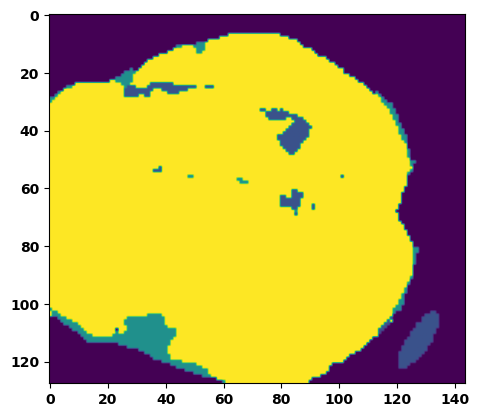

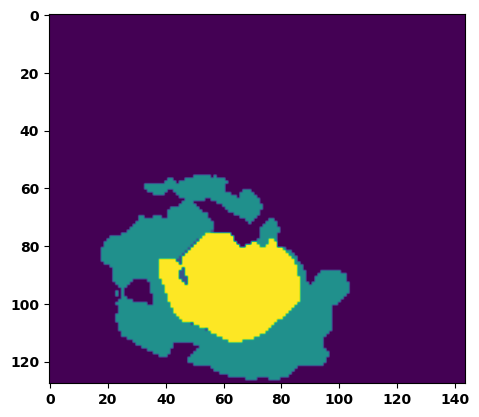

  6%|▌         | 2/36 [00:02<00:36,  1.06s/it]

Batch_id:  1 Eval loss:  0.8819478154182434
Batch_id:  1 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.6224, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4191, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2450, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:34,  1.03s/it]

Batch_id:  2 Eval loss:  0.13944880664348602
Batch_id:  2 Eval IoU:  tensor(0.7723, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 11%|█         | 4/36 [00:04<00:33,  1.05s/it]

Batch_id:  3 Eval loss:  0.5861538648605347
Batch_id:  3 Eval IoU:  tensor(0.3531, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9030, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 14%|█▍        | 5/36 [00:05<00:31,  1.02s/it]

Batch_id:  4 Eval loss:  0.7634661793708801
Batch_id:  4 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 17%|█▋        | 6/36 [00:06<00:30,  1.02s/it]

Batch_id:  5 Eval loss:  0.7718989253044128
Batch_id:  5 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8381, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 19%|█▉        | 7/36 [00:07<00:29,  1.03s/it]

Batch_id:  6 Eval loss:  0.5590071678161621
Batch_id:  6 Eval IoU:  tensor(0.3218, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8511, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.7175, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8291, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9145, device='cuda:0')


 22%|██▏       | 8/36 [00:08<00:29,  1.06s/it]

Batch_id:  7 Eval loss:  0.7660636305809021
Batch_id:  7 Eval IoU:  tensor(0.2196, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8782, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9464, device='cuda:0')


 25%|██▌       | 9/36 [00:09<00:28,  1.06s/it]

Batch_id:  8 Eval loss:  0.823164165019989
Batch_id:  8 Eval IoU:  tensor(0.1066, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6468, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3839, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2962, device='cuda:0')


 28%|██▊       | 10/36 [00:10<00:27,  1.07s/it]

Batch_id:  9 Eval loss:  0.7637019157409668
Batch_id:  9 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  10 Eval loss:  0.7610997557640076
Batch_id:  10 Eval IoU:  tensor(0.2284, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


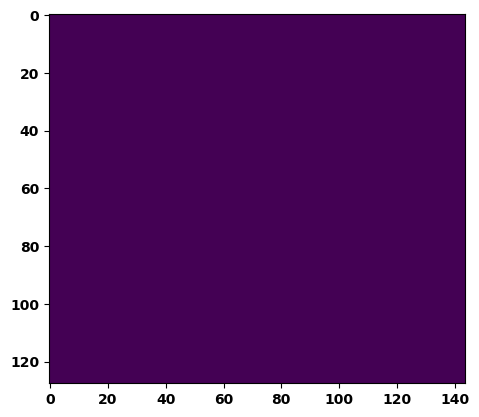

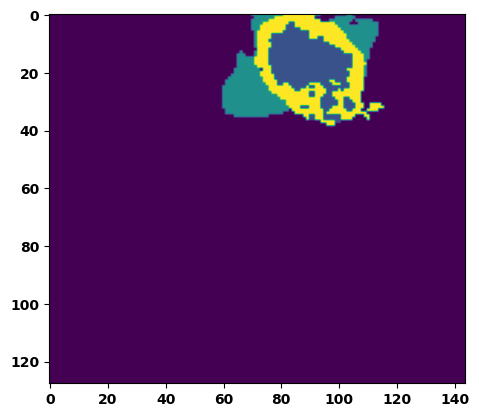

 33%|███▎      | 12/36 [00:12<00:26,  1.08s/it]

Batch_id:  11 Eval loss:  0.7571496963500977
Batch_id:  11 Eval IoU:  tensor(0.2356, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9836, device='cuda:0')


 36%|███▌      | 13/36 [00:13<00:24,  1.07s/it]

Batch_id:  12 Eval loss:  0.10399143397808075
Batch_id:  12 Eval IoU:  tensor(0.8258, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 39%|███▉      | 14/36 [00:14<00:24,  1.11s/it]

Batch_id:  13 Eval loss:  0.30674028396606445
Batch_id:  13 Eval IoU:  tensor(0.6089, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 42%|████▏     | 15/36 [00:16<00:23,  1.10s/it]

Batch_id:  14 Eval loss:  0.7929064035415649
Batch_id:  14 Eval IoU:  tensor(0.1769, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8539, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7077, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9225, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8581, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


 44%|████▍     | 16/36 [00:17<00:21,  1.09s/it]

Batch_id:  15 Eval loss:  0.40118467807769775
Batch_id:  15 Eval IoU:  tensor(0.5116, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8868, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.7800, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.7794, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 47%|████▋     | 17/36 [00:18<00:20,  1.08s/it]

Batch_id:  16 Eval loss:  0.753503680229187
Batch_id:  16 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 50%|█████     | 18/36 [00:19<00:19,  1.11s/it]

Batch_id:  17 Eval loss:  0.6432206034660339
Batch_id:  17 Eval IoU:  tensor(0.3106, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 53%|█████▎    | 19/36 [00:20<00:18,  1.07s/it]

Batch_id:  18 Eval loss:  0.7691541910171509
Batch_id:  18 Eval IoU:  tensor(0.2140, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8559, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8790, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 56%|█████▌    | 20/36 [00:21<00:16,  1.06s/it]

Batch_id:  19 Eval loss:  0.7666816711425781
Batch_id:  19 Eval IoU:  tensor(0.2184, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  20 Eval loss:  0.34023573994636536
Batch_id:  20 Eval IoU:  tensor(0.5980, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9734, device='cuda:0')


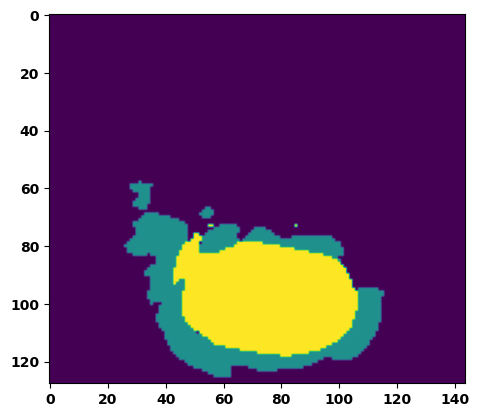

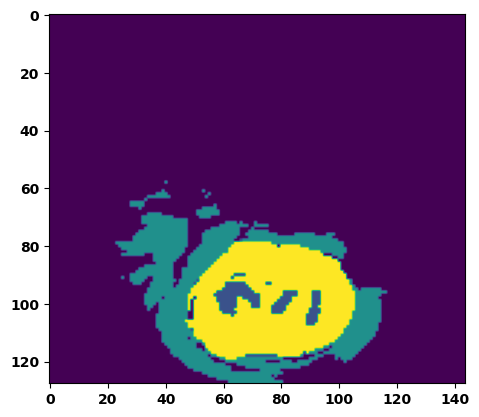

 61%|██████    | 22/36 [00:23<00:14,  1.04s/it]

Batch_id:  21 Eval loss:  0.7487875819206238
Batch_id:  21 Eval IoU:  tensor(0.1591, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.6169, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3250, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8458, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.3440, device='cuda:0')


 64%|██████▍   | 23/36 [00:24<00:13,  1.02s/it]

Batch_id:  22 Eval loss:  0.7653990983963013
Batch_id:  22 Eval IoU:  tensor(0.2207, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8829, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9722, device='cuda:0')


 67%|██████▋   | 24/36 [00:25<00:12,  1.00s/it]

Batch_id:  23 Eval loss:  0.7518035769462585
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:26<00:10,  1.01it/s]

Batch_id:  24 Eval loss:  0.7757598757743835
Batch_id:  24 Eval IoU:  tensor(0.2031, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.8803, device='cuda:0')


 72%|███████▏  | 26/36 [00:27<00:09,  1.00it/s]

Batch_id:  25 Eval loss:  0.756808876991272
Batch_id:  25 Eval IoU:  tensor(0.2337, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9335, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 75%|███████▌  | 27/36 [00:28<00:08,  1.00it/s]

Batch_id:  26 Eval loss:  0.7568130493164062
Batch_id:  26 Eval IoU:  tensor(0.2333, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8993, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8080, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9423, device='cuda:0')


 78%|███████▊  | 28/36 [00:29<00:08,  1.02s/it]

Batch_id:  27 Eval loss:  0.6412903070449829
Batch_id:  27 Eval IoU:  tensor(0.2824, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8508, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8992, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9232, device='cuda:0')


 81%|████████  | 29/36 [00:30<00:06,  1.00it/s]

Batch_id:  28 Eval loss:  0.7638142108917236
Batch_id:  28 Eval IoU:  tensor(0.2235, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9556, device='cuda:0')


 83%|████████▎ | 30/36 [00:31<00:06,  1.01s/it]

Batch_id:  29 Eval loss:  0.19463610649108887
Batch_id:  29 Eval IoU:  tensor(0.7009, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  30 Eval loss:  0.7817562818527222
Batch_id:  30 Eval IoU:  tensor(0.1502, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7424, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.5403, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.4847, device='cuda:0')


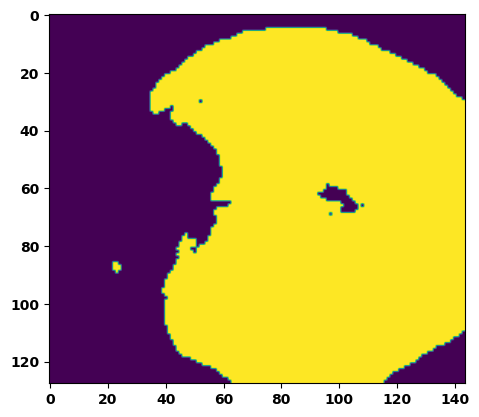

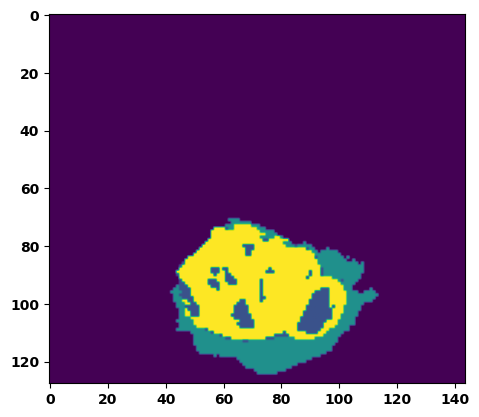

 89%|████████▉ | 32/36 [00:33<00:04,  1.04s/it]

Batch_id:  31 Eval loss:  0.6584659814834595
Batch_id:  31 Eval IoU:  tensor(0.2248, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7151, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4970, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.4704, device='cuda:0')


 92%|█████████▏| 33/36 [00:34<00:03,  1.06s/it]

Batch_id:  32 Eval loss:  0.7801076769828796
Batch_id:  32 Eval IoU:  tensor(0.1924, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8725, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7687, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9098, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.8552, device='cuda:0')


 94%|█████████▍| 34/36 [00:35<00:02,  1.06s/it]

Batch_id:  33 Eval loss:  0.7008702754974365
Batch_id:  33 Eval IoU:  tensor(0.2391, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8783, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7639, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8878, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9491, device='cuda:0')


 97%|█████████▋| 35/36 [00:36<00:01,  1.04s/it]

Batch_id:  34 Eval loss:  0.7563177943229675
Batch_id:  34 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


100%|██████████| 36/36 [00:37<00:00,  1.05s/it]

Batch_id:  35 Eval loss:  0.7659087181091309
Batch_id:  35 Eval IoU:  tensor(0.2198, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8792, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')
Epoch  49 Training loss:  0.1321207665584304
Epoch  49 Evaluation loss:  0.6620572391483519
Epoch  49 Training accuracy :  tensor(0.8007)
Epoch  49 Evaluation accuracy :  tensor(0.2938)
Epoch  49 Training Mean Dice Score:  tensor(0.9890)
Epoch  49 Eval Mean Dice Score:  tensor(0.8945)
Epoch  49 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  49 Eval Non-tumor Dice Score:  tensor(0.8156)
Epoch  49 Training NCR/NET Dice Score:  tensor(0.9934)
Epoch  49 Eval NCR/NET Dice Score:  tensor(0.9672)
Epoch  49 Training ED Dice Score:  tensor(0.984

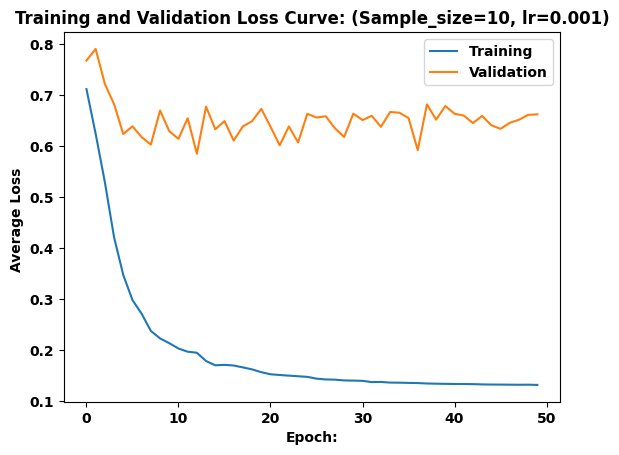

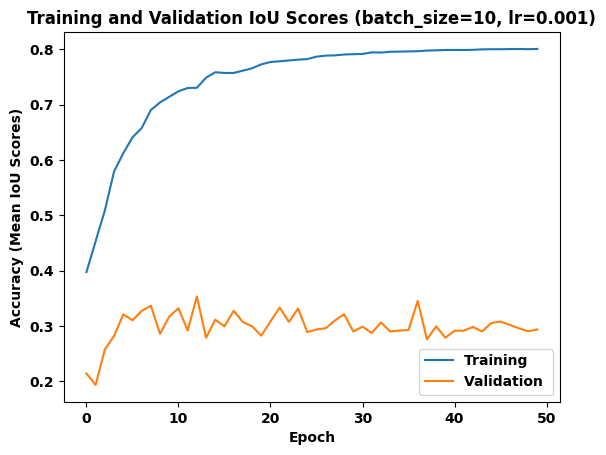

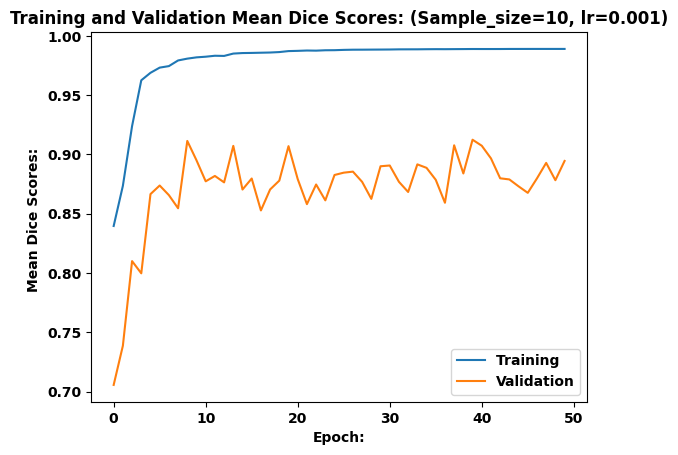

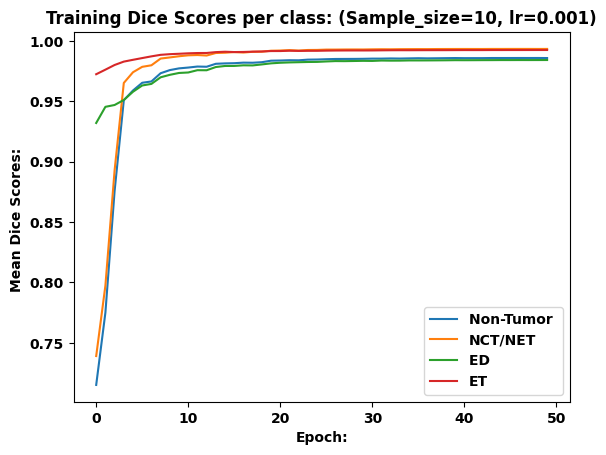

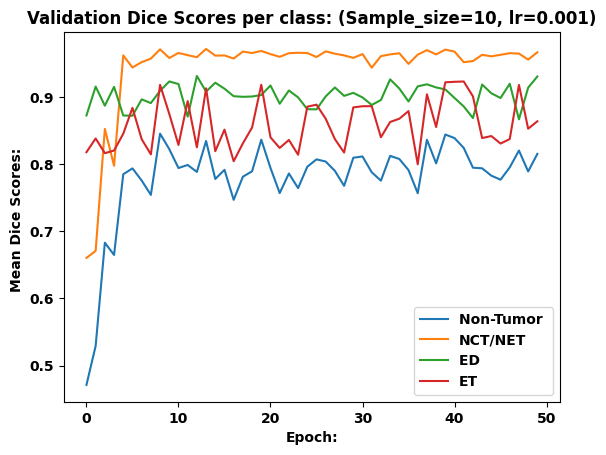

test in session: 


FileNotFoundError: [Errno 2] No such file or directory: 'log/20/#20-BEST'

In [25]:
"""
yellow - label 4
dark blue - label 1 
green - label 2 

purple - label 0
"""

main(0.70)

In [ ]:
'''
input:

y: [slice_num,h,w]

x:[slice_num,input_channel,h,w]

res:[slice_num,output_channel,h,w]


'''

def feature_extraction():
    # Load data
    train_data = torch.load(MODEL_PATH+'trdata.pth')
    eval_data = torch.load(MODEL_PATH+'edata.pth')
    test_data = torch.load(MODEL_PATH+'tdata.pth')
    
    train_pred=torch.tensor()
    train_tar=torch.tensor()
    
    eval_pred=torch.tensor()
    eval_tar=torch.tensor()
    
    test_pred=torch.tensor()
    test_tar=torch.tensor()
    
    
    
    checkpoint = torch.load(MODEL_PATH+'#19-BEST')
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    model.load_state_dict(checkpoint['model_state_dict'])
    opt.load_state_dict(checkpoint['optim_state_dict'])
    
    print('Best Model loaded!')
 


    #training data set
    print('Training data feature extraction: ')
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(train_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res = model(x)
            res=res.to(device)
            res = torch.argmax(res,dim=1)

            
            
    #Eval data set    
    print('Eval data feature extraction: ')
    
    with torch.no_grad():
        
        for index, batch in enumerate(eval_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res,dfeatures = model(x)
            res=res.to(device)   
            dfeatures=dfeatures.to(device)
            res = torch.argmax(res,dim=1)
            res = F.one_hot(res,num_classes=4)
            res = res.permute(0,3,1,2)
            y=F.one_hot(y,num_classes=4)
            y = y.permute(0,3,1,2)
            pred = torch.cat((res,dfeatures),dim=1)
            target = torch.cat((res,dfeatures),dim=1)
            if index == 1:
                eval_pred=pred
                eval_tar=target
            else
                eval_pred=torch.cat((eval_pred,pred),dim=0)
                eval_tar=torch.cat((eval_tar,target),dim=0)    
    
    
    
    
    
    #Test data set    
    print('Test data feature extraction: ')
    
    with torch.no_grad():
        
        for index, batch in enumerate(test_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res,dfeatures = model(x)
            res=res.to(device)    
            dfeatures=dfeatures.to(device)
            res = torch.argmax(res,dim=1)
            res = F.one_hot(res,num_classes=4)
            res = res.permute(0,3,1,2)
            y=F.one_hot(y,num_classes=4)
            y = y.permute(0,3,1,2)
            pred = torch.cat((res,dfeatures),dim=1)
            target = torch.cat((res,dfeatures),dim=1)
            if index == 1:
                test_pred=pred
                test_tar=target
            else
                test_pred=torch.cat((test_pred,pred),dim=0)
                test_tar=torch.cat((test_tar,target),dim=0) 
    
    

In [ ]:
def feature_reduction():
    

In [ ]:
# classification class def: short-term(0): less than 10 months, mid-term(1): between 10 months and 15 months
# long-term(2): more than 15 months

def prediction Model():
    
    